In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

In [62]:
df = pd.read_csv('train.csv')

In [63]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             10000 non-null  int64  
 1   DistrictId     10000 non-null  int64  
 2   Rooms          10000 non-null  float64
 3   Square         10000 non-null  float64
 4   LifeSquare     7887 non-null   float64
 5   KitchenSquare  10000 non-null  float64
 6   Floor          10000 non-null  int64  
 7   HouseFloor     10000 non-null  float64
 8   HouseYear      10000 non-null  int64  
 9   Ecology_1      10000 non-null  float64
 10  Ecology_2      10000 non-null  object 
 11  Ecology_3      10000 non-null  object 
 12  Social_1       10000 non-null  int64  
 13  Social_2       10000 non-null  int64  
 14  Social_3       10000 non-null  int64  
 15  Healthcare_1   5202 non-null   float64
 16  Helthcare_2    10000 non-null  int64  
 17  Shops_1        10000 non-null  int64  
 18  Shops_2

In [64]:
df['Id'] = df['Id'].astype(str)
df['DistrictId'] = df['DistrictId'].astype(str)

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             10000 non-null  object 
 1   DistrictId     10000 non-null  object 
 2   Rooms          10000 non-null  float64
 3   Square         10000 non-null  float64
 4   LifeSquare     7887 non-null   float64
 5   KitchenSquare  10000 non-null  float64
 6   Floor          10000 non-null  int64  
 7   HouseFloor     10000 non-null  float64
 8   HouseYear      10000 non-null  int64  
 9   Ecology_1      10000 non-null  float64
 10  Ecology_2      10000 non-null  object 
 11  Ecology_3      10000 non-null  object 
 12  Social_1       10000 non-null  int64  
 13  Social_2       10000 non-null  int64  
 14  Social_3       10000 non-null  int64  
 15  Healthcare_1   5202 non-null   float64
 16  Helthcare_2    10000 non-null  int64  
 17  Shops_1        10000 non-null  int64  
 18  Shops_2

In [65]:
def reduce_mem_usage(df):
    """ iterate through all the columns of a dataframe and modify the data type
        to reduce memory usage.        
    """
    start_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage of dataframe is {:.2f} MB'.format(start_mem))
    
    for col in df.columns:
        col_type = df[col].dtype
        
        if col_type != object:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
        else:
            df[col] = df[col].astype('category')

    end_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage after optimization is: {:.2f} MB'.format(end_mem))
    print('Decreased by {:.1f}%'.format(100 * (start_mem - end_mem) / start_mem))
    
    return df

In [66]:
df = reduce_mem_usage(df)

df.info()

Memory usage of dataframe is 1.53 MB
Memory usage after optimization is: 0.82 MB
Decreased by 46.0%
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   Id             10000 non-null  category
 1   DistrictId     10000 non-null  category
 2   Rooms          10000 non-null  float32 
 3   Square         10000 non-null  float32 
 4   LifeSquare     7887 non-null   float32 
 5   KitchenSquare  10000 non-null  float32 
 6   Floor          10000 non-null  int8    
 7   HouseFloor     10000 non-null  float32 
 8   HouseYear      10000 non-null  int32   
 9   Ecology_1      10000 non-null  float32 
 10  Ecology_2      10000 non-null  category
 11  Ecology_3      10000 non-null  category
 12  Social_1       10000 non-null  int8    
 13  Social_2       10000 non-null  int16   
 14  Social_3       10000 non-null  int16   
 15  Healthcare_1   5202 no

### Rooms

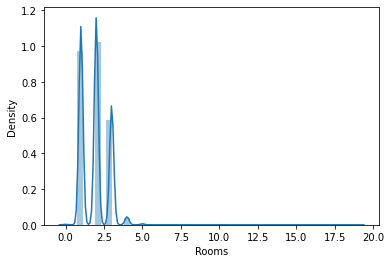

In [67]:
sns.distplot(df['Rooms'])

In [68]:
print(df['Rooms'].min())

0.0


2.0    3880
1.0    3713
3.0    2235
4.0     150
5.0      18
6.0       4
Name: Rooms, dtype: int64


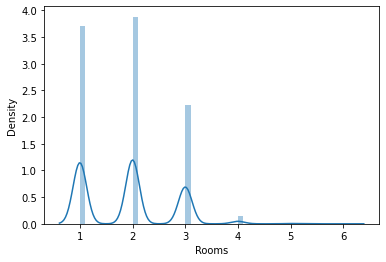

In [69]:
df.loc[df['Rooms']>6, 'Rooms'] = 6
df.loc[df['Rooms']<1, 'Rooms'] = 1

print(df['Rooms'].value_counts())

sns.distplot(df['Rooms'])

### Square

Min: 1.1368588209152222


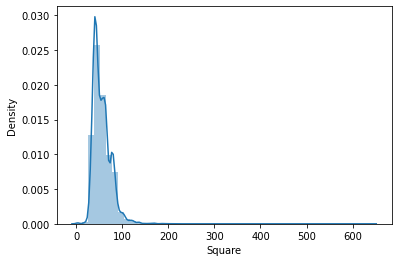

In [70]:
print(f'Min: {df["Square"].min()}')

sns.distplot(df['Square'])

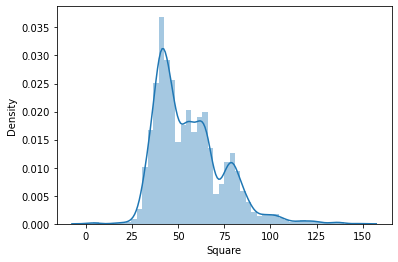

In [71]:
df['Square_outlier'] = 0
df.loc[df['Square']>150, 'Square_outlier'] = 1

median_square = df.loc[df['Square']<150, 'Square'].median()
df.loc[df['Square']>150, 'Square'] = median_square

sns.distplot(df['Square'])

### KitchenSquare

KitchenSquare
Percentile 97.5: 13.0
Percentile 2.5: 0.0
Min: 0.0


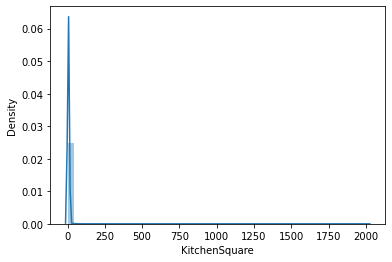

In [72]:
print('KitchenSquare')
print(f"Percentile 97.5: {df['KitchenSquare'].quantile(.975)}")
print(f"Percentile 2.5: {df['KitchenSquare'].quantile(.025)}")
print(f"Min: {df['KitchenSquare'].min()}")

sns.distplot(df['KitchenSquare'])

In [73]:
df['KitchenSquare'].value_counts()

1.0       2460
8.0       1306
5.0       1169
10.0      1075
6.0       1038
9.0        843
0.0        697
7.0        609
12.0       249
11.0       233
13.0        67
14.0        51
4.0         39
15.0        31
3.0         22
16.0        16
20.0        14
17.0        12
19.0        11
18.0         6
2.0          4
22.0         3
30.0         2
43.0         2
41.0         2
112.0        2
25.0         2
51.0         2
37.0         2
58.0         2
32.0         2
21.0         1
73.0         1
75.0         1
36.0         1
27.0         1
63.0         1
1970.0       1
54.0         1
53.0         1
60.0         1
26.0         1
66.0         1
39.0         1
29.0         1
78.0         1
31.0         1
84.0         1
48.0         1
96.0         1
42.0         1
40.0         1
23.0         1
72.0         1
35.0         1
62.0         1
123.0        1
2014.0       1
Name: KitchenSquare, dtype: int64

1.0     2460
6.0     1842
8.0     1306
5.0     1169
10.0    1075
9.0      843
7.0      609
12.0     249
11.0     233
13.0      67
14.0      51
4.0       39
15.0      31
3.0       22
2.0        4
Name: KitchenSquare, dtype: int64


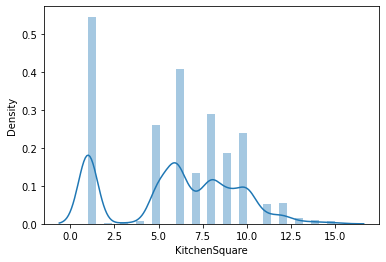

In [74]:
df['KitchenSquare_outlier'] = 0

condition = ((df['KitchenSquare']>15) \
            | (df['KitchenSquare']<1))

median_kitch = df['KitchenSquare'].median()

df.loc[condition, 'KitchenSquare_outlier'] = 1
df.loc[condition, 'KitchenSquare'] = median_kitch

print(df['KitchenSquare'].value_counts())

sns.distplot(df['KitchenSquare'])

### LifeSquare

LifeSquare
Percentile 97.5: 80.74810028076172
Percentile 2.5: 5.914129734039307
Min: 0.37061941623687744


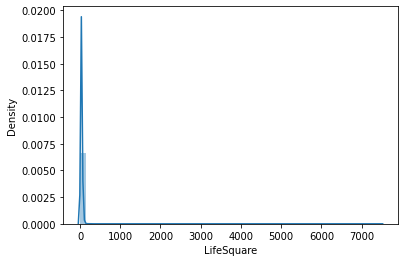

In [75]:
print('LifeSquare')
print(f"Percentile 97.5: {df['LifeSquare'].quantile(.975)}")
print(f"Percentile 2.5: {df['LifeSquare'].quantile(.025)}")
print(f"Min: {df['LifeSquare'].min()}")

sns.distplot(df['LifeSquare'])

### Будем считать, что жилая площадь это общая площадь минус кухня минус ванная и туалет ($ 4m^2 $)

In [76]:
df['LifeSquare_nan'] = 0

df.loc[df['LifeSquare'].isna(), 'LifeSquare_nan'] = 1

LifeSquare_na = (df['LifeSquare'].isna())
replace_nan = df.loc[LifeSquare_na, 'Square'] - df.loc[LifeSquare_na, 'KitchenSquare'] - 4

df.loc[LifeSquare_na, 'LifeSquare'] = replace_nan

df['LifeSquare'].isna().sum()

0

### Проверим на отсутствие отрицательных значений

In [77]:
df.loc[df['LifeSquare']<0, 'LifeSquare']

Series([], Name: LifeSquare, dtype: float32)

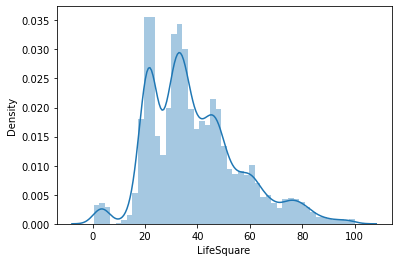

In [78]:
df.loc[df['LifeSquare']>100, 'LifeSquare'] = df['LifeSquare'].median()

sns.distplot(df['LifeSquare'])

In [79]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 23 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   Id                     10000 non-null  category
 1   DistrictId             10000 non-null  category
 2   Rooms                  10000 non-null  float32 
 3   Square                 10000 non-null  float32 
 4   LifeSquare             10000 non-null  float32 
 5   KitchenSquare          10000 non-null  float32 
 6   Floor                  10000 non-null  int8    
 7   HouseFloor             10000 non-null  float32 
 8   HouseYear              10000 non-null  int32   
 9   Ecology_1              10000 non-null  float32 
 10  Ecology_2              10000 non-null  category
 11  Ecology_3              10000 non-null  category
 12  Social_1               10000 non-null  int8    
 13  Social_2               10000 non-null  int16   
 14  Social_3               10000 non-null  

### Переходим к этажам
### Проверим, сколько наблюдений с этажом, превышающим количество этажей в доме

In [80]:
df.loc[df['Floor']>df['HouseFloor'], ['Floor', 'HouseFloor']]

,Floor,HouseFloor
17,6,5.0
19,16,14.0
21,11,9.0
24,2,0.0
25,18,1.0
...,...,...
9960,15,1.0
9968,18,17.0
9970,18,17.0
9975,18,17.0


### Создадим фичу с выбросами HouseFloor, где 1 будет в наблюдениях, в которых этаж превышает этажность здания и в наблюдениях

In [81]:
df['Floor_over'] = 0

df.loc[df['Floor']>df['HouseFloor'], 'Floor_over'] = 1

df['Floor_over'].value_counts()

0    8175
1    1825
Name: Floor_over, dtype: int64

### Заменим неправильные данные в колонке Floor на медиану

In [82]:
df.loc[df['Floor_over']==1, 'Floor'] = df['Floor'].median()

In [83]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   Id                     10000 non-null  category
 1   DistrictId             10000 non-null  category
 2   Rooms                  10000 non-null  float32 
 3   Square                 10000 non-null  float32 
 4   LifeSquare             10000 non-null  float32 
 5   KitchenSquare          10000 non-null  float32 
 6   Floor                  10000 non-null  int8    
 7   HouseFloor             10000 non-null  float32 
 8   HouseYear              10000 non-null  int32   
 9   Ecology_1              10000 non-null  float32 
 10  Ecology_2              10000 non-null  category
 11  Ecology_3              10000 non-null  category
 12  Social_1               10000 non-null  int8    
 13  Social_2               10000 non-null  int16   
 14  Social_3               10000 non-null  

### Проверяем HouseYear

9163    20052011
8828        4968
7721        2020
9122        2020
7955        2020
          ...   
7610        1916
6250        1914
2066        1912
2795        1912
6794        1910
Name: HouseYear, Length: 10000, dtype: int32


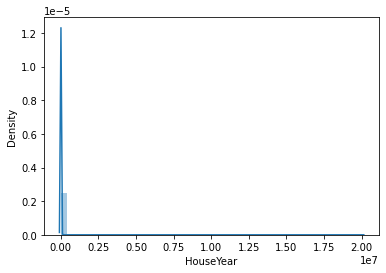

In [84]:
print(df['HouseYear'].sort_values(ascending=False))

sns.distplot(df['HouseYear'])

### Заменим первые два значения на 2020 год

In [85]:
df.loc[df['HouseYear']>2020, 'HouseYear'] = 2020

df['HouseYear'].sort_values(ascending=False)

7721    2020
9122    2020
7955    2020
8664    2020
1004    2020
        ... 
7610    1916
6250    1914
2066    1912
2795    1912
6794    1910
Name: HouseYear, Length: 10000, dtype: int32

### Перейдем к значениям Ecology

In [86]:
df['Ecology_1'].describe()

count    10000.000000
mean         0.118858
std          0.119025
min          0.000000
25%          0.017647
50%          0.075424
75%          0.195781
max          0.521867
Name: Ecology_1, dtype: float64

In [87]:
print(df[['Ecology_2', 'Ecology_3']].head())
print()
print(df['Ecology_2'].unique())
print(df['Ecology_3'].unique())

  Ecology_2 Ecology_3
0         B         B
1         B         B
2         B         B
3         B         B
4         B         B

['B', 'A']
Categories (2, object): ['A', 'B']
['B', 'A']
Categories (2, object): ['A', 'B']


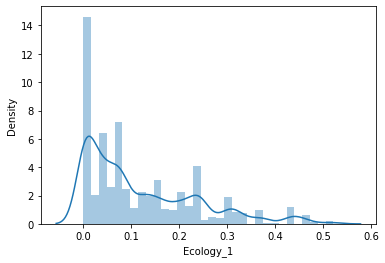

In [88]:
sns.distplot(df['Ecology_1'])

### Не вижу смысла трогать эти переменные, выбросов нет, пропущенных значений тоже

### Теперь проверим Social переменные

In [89]:
df[['Social_1', 'Social_2', 'Social_3']]

,Social_1,Social_2,Social_3
0,11,3097,0
1,30,6207,1
2,33,5261,0
3,1,264,0
4,33,8667,2
...,...,...,...
9995,52,10311,6
9996,2,629,1
9997,20,4386,14
9998,47,8004,3


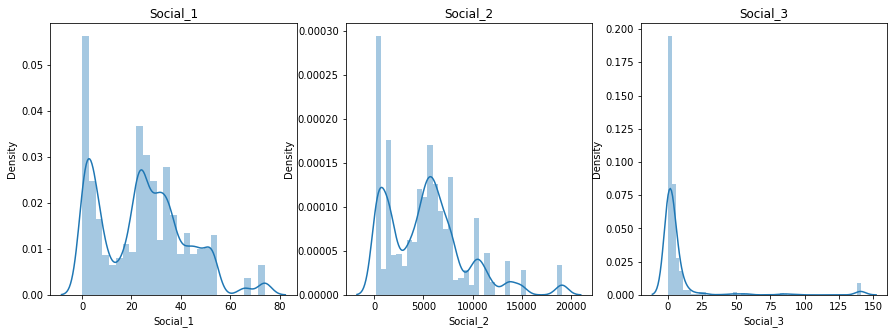

In [90]:
plt.figure(figsize=(15, 5))
for i in range(3):
    plt.subplot(1, 3, i+1)
    sns.distplot(df['Social_' + str(i+1)])
    plt.title('Social_' + str(i+1))

### Я считаю, что эти данные не нуждаются в исправлении

### Healthcare

### У данных Healthcare_1 почти 49 % пропусков, следует заменить их на какие-нибудь данные, поищем лучшую корреляцию для этого параметра

In [91]:
df.corr()['Healthcare_1'].sort_values(ascending=False)

Healthcare_1             1.000000
Helthcare_2              0.203177
Price                    0.138755
Social_3                 0.133877
KitchenSquare            0.102509
Social_1                 0.077133
Shops_1                  0.057758
Social_2                 0.050458
Rooms                    0.044095
Square_outlier           0.014998
Floor_over              -0.015927
Ecology_1               -0.043547
Square                  -0.051523
KitchenSquare_outlier   -0.057109
LifeSquare              -0.099079
Floor                   -0.133966
HouseFloor              -0.143973
LifeSquare_nan          -0.163981
HouseYear               -0.204607
Name: Healthcare_1, dtype: float64

In [92]:
df['Helthcare_2'].unique()

array([0, 1, 3, 2, 5, 4, 6], dtype=int8)

In [93]:
df['Healthcare_nan'] = 0

df.loc[df['Healthcare_1'].isna(), 'Healthcare_nan'] = 1

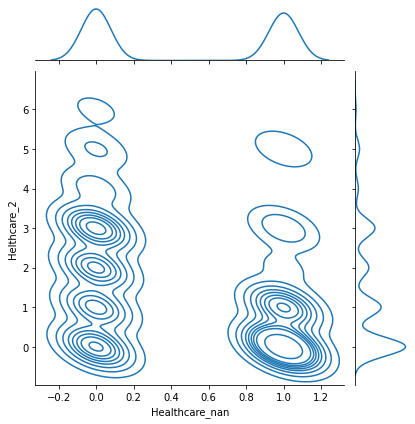

In [94]:
sns.jointplot(df['Healthcare_nan'],
              df['Helthcare_2'],
              kind='kde')

### Большая часть nan в Healthcare_1 приходится на значение 0 в Helthcare_2
### Следовательно, нужно найти медиану значений Healthcare_1, в которых Helthcare_2 принимает значение 0

Num NaN in Healthcare_1: 0


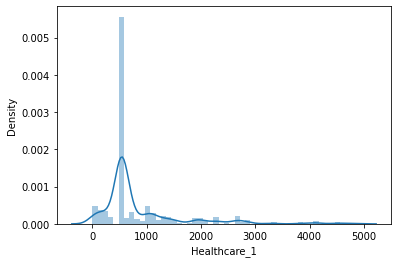

In [95]:
median_health = df.loc[df['Helthcare_2']==0, 'Healthcare_1'].median()

df.loc[df['Healthcare_1'].isna(), 'Healthcare_1'] = median_health

print(f'Num NaN in Healthcare_1: {df["Healthcare_1"].isna().sum()}')

sns.distplot(df['Healthcare_1'])

### Пожалуй, еще заменю излишне большие значения, начиная с 3000, на медиану

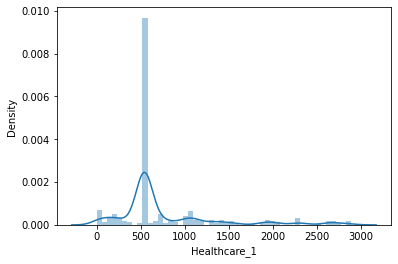

In [96]:
df.loc[df['Healthcare_1']>3000, 'Healthcare_1'] = df['Healthcare_1'].median()

sns.distplot(df['Healthcare_1'])

In [97]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 25 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   Id                     10000 non-null  category
 1   DistrictId             10000 non-null  category
 2   Rooms                  10000 non-null  float32 
 3   Square                 10000 non-null  float32 
 4   LifeSquare             10000 non-null  float32 
 5   KitchenSquare          10000 non-null  float32 
 6   Floor                  10000 non-null  int8    
 7   HouseFloor             10000 non-null  float32 
 8   HouseYear              10000 non-null  int32   
 9   Ecology_1              10000 non-null  float32 
 10  Ecology_2              10000 non-null  category
 11  Ecology_3              10000 non-null  category
 12  Social_1               10000 non-null  int8    
 13  Social_2               10000 non-null  int16   
 14  Social_3               10000 non-null  

In [98]:
df[['Shops_1', 'Shops_2']]

,Shops_1,Shops_2
0,0,B
1,0,B
2,1,B
3,1,B
4,6,B
...,...,...
9995,9,B
9996,0,A
9997,5,B
9998,5,B


### Теперь сделаем класс Preprocessing, для простоты работы в будущем

In [8]:
class MakePreprocessing():
    def __init__(self):
        self.median = None
        self.median_square = None
        self.median_kitchen = None
        self.condition_kitchen = None
        self.median_floor = None
        self.median_healthcare_nan = None
        self.median_healthcare = None
        
        
    def fit(self, df):
        self.median = df.median()
        self.median_square = df.loc[df['Square']<150, 'Square'].median()
        
        self.median_kitchen = df['KitchenSquare'].median()
        self.condition_kitchen = ((df['KitchenSquare']>15) | \
                                  (df['KitchenSquare']<1))
        
        self.median_floor = df['Floor'].median()
        
        self.median_healthcare_nan = df.loc[df['Helthcare_2']==0, 'Healthcare_1'].median()
        self.median_healthcare = df['Healthcare_1'].median()
    
    
    def transform(self, data):
        df = data.copy()
        
        df['Id'] = df['Id'].astype(str)
        df['DistrictId'] = df['DistrictId'].astype(str)
        
        df.loc[df['Rooms']>6, 'Rooms'] = 6
        df.loc[df['Rooms']<1, 'Rooms'] = 1
        
        df['Square_outlier'] = 0
        df.loc[df['Square']>150, 'Square_outlier'] = 1
        df.loc[df['Square']>150, 'Square'] = self.median_square
        
        df['KitchenSquare_outlier'] = 0
        df.loc[self.condition_kitchen, 'KitchenSquare_outlier'] = 1
        df.loc[self.condition_kitchen, 'KitchenSquare'] = self.median_kitchen
        
        df['LifeSquare_nan'] = 0
        df.loc[df['LifeSquare'].isna(), 'LifeSquare_nan'] = 1
        LifeSquare_na = (df['LifeSquare'].isna())
        replace_nan = df.loc[LifeSquare_na, 'Square'] - df.loc[LifeSquare_na, 'KitchenSquare'] - 4
        df.loc[LifeSquare_na, 'LifeSquare'] = replace_nan

        df['Floor_over'] = 0
        df.loc[df['Floor'] > df['HouseFloor'], 'Floor_over'] = 1
        df.loc[df['Floor_over'] == 1, 'Floor'] = self.median_floor
        
        df.loc[df['HouseYear']>2020, 'HouseYear'] = 2020
        
        df['Healthcare_nan'] = 0
        df.loc[df['Healthcare_1'].isna(), 'Healthcare_nan'] = 1
        df.loc[df['Healthcare_1'].isna(), 'Healthcare_1'] = self.median_healthcare_nan
        df.loc[df['Healthcare_1']>3000, 'Healthcare_1'] = self.median_healthcare
        
        df.fillna(self.median, inplace=True)

        cat_to_int = {'A': 0, 'B': 1}

        # replace cat to int
        df['Ecology_2'] = df['Ecology_2'].replace(cat_to_int)
        df['Ecology_3'] = df['Ecology_3'].replace(cat_to_int)
        df['Shops_2'] = df['Shops_2'].replace(cat_to_int)

        return df

### Перейдем к созданию фич

In [100]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 25 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   Id                     10000 non-null  category
 1   DistrictId             10000 non-null  category
 2   Rooms                  10000 non-null  float32 
 3   Square                 10000 non-null  float32 
 4   LifeSquare             10000 non-null  float32 
 5   KitchenSquare          10000 non-null  float32 
 6   Floor                  10000 non-null  int8    
 7   HouseFloor             10000 non-null  float32 
 8   HouseYear              10000 non-null  int32   
 9   Ecology_1              10000 non-null  float32 
 10  Ecology_2              10000 non-null  category
 11  Ecology_3              10000 non-null  category
 12  Social_1               10000 non-null  int8    
 13  Social_2               10000 non-null  int16   
 14  Social_3               10000 non-null  

### Создаем фичу, считающую количество квартир на улице

In [101]:
def district_size(data):
    district_size = df['DistrictId'].value_counts().reset_index() \
                                    .rename(columns={'index': 'DistrictId',
                                                     'DistrictId': 'DistrictSize'})
    data = data.merge(district_size, on='DistrictId', how='left')
    
    return data

def district_large(data):
    data['IsDistrictLarge'] = (data['DistrictSize']>100).astype(int)
    
    return data

def price_district(data):
    price_dist = pd.pivot_table(data, values='Price', index=['DistrictId', 'Rooms'], aggfunc=np.mean).rename(columns={'Price': 'PriceDistrictRooms'})
    data = data.merge(price_dist, on=['DistrictId', 'Rooms'], how='left')
    
    return data

### Добавим district_size в датафрейм

In [103]:
df = district_size(df)
df = district_large(df)
df = price_district(df)

df

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price,Square_outlier,KitchenSquare_outlier,LifeSquare_nan,Floor_over,Healthcare_nan,DistrictSize,IsDistrictLarge,PriceDistrictRooms
0,11809,27,3.0,115.027313,35.424698,10.0,4,10.0,2014,0.075424,B,B,11,3097,0,540.0,0,0,B,305018.875000,0,0,1,0,1,851,1,214083.593750
1,3013,22,1.0,39.832523,23.169222,8.0,7,8.0,1966,0.118537,B,B,30,6207,1,1183.0,1,0,B,177734.546875,0,0,0,0,0,78,0,162263.906250
2,8215,1,3.0,78.342216,47.671970,10.0,2,17.0,1988,0.025609,B,B,33,5261,0,240.0,3,1,B,282078.718750,0,0,0,0,0,652,1,246262.921875
3,2352,1,1.0,40.409908,35.409908,1.0,10,22.0,1977,0.007122,B,B,1,264,0,540.0,0,1,B,168106.000000,0,0,1,0,1,652,1,147454.609375
4,13866,94,2.0,64.285065,38.562515,9.0,16,16.0,1972,0.282798,B,B,33,8667,2,540.0,0,6,B,343995.093750,0,0,0,0,1,89,0,213345.890625
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,1260,61,2.0,49.090729,33.272625,6.0,3,12.0,1981,0.300323,B,B,52,10311,6,540.0,1,9,B,119367.453125,0,0,0,0,1,118,1,237598.578125
9996,16265,27,2.0,64.307686,37.038422,9.0,7,0.0,1977,0.072158,B,B,2,629,1,540.0,0,0,A,199715.156250,0,0,0,1,1,851,1,166014.062500
9997,2795,178,1.0,29.648056,16.555363,5.0,3,5.0,1958,0.460556,B,B,20,4386,14,540.0,1,5,B,165953.906250,0,0,0,0,1,7,0,165953.906250
9998,14561,21,1.0,32.330292,22.326870,5.0,3,9.0,1969,0.194489,B,B,47,8004,3,125.0,3,5,B,171842.406250,0,0,0,0,0,165,1,156087.687500


### Теперь разобьем площадь на несколько групп и в каждой посчитаем медиану по цене

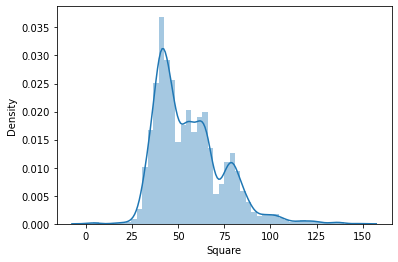

In [104]:
sns.distplot(df['Square'])

In [105]:
def square_to_cat(data):
    bins = [data['Square'].min(), 25, 50, 75, 100, df['Square'].max()]
    data['Square_cat'] = pd.cut(data['Square'], bins=bins, labels=False)
    
    return data

def price_square_cat(data):
    price_square = data.groupby('Square_cat', as_index=False).agg({'Price': 'median'}) \
                       .rename(columns={'Price': 'PriceSquareCat'})

    data = data.merge(price_square, on='Square_cat', how='left')
    
    return data

In [106]:
df = square_to_cat(df)
df['Square_cat'].value_counts()

1.0    4627
2.0    3669
3.0    1434
4.0     236
0.0      33
Name: Square_cat, dtype: int64

In [107]:
df = price_square_cat(df)
df['PriceSquareCat'].value_counts()

166438.468750    4627
216436.109375    3669
297389.875000    1434
374281.593750     236
122959.453125      33
Name: PriceSquareCat, dtype: int64

###  Теперь разобьем выборку по году постройки и количеству этажей и также присвоим им  цену

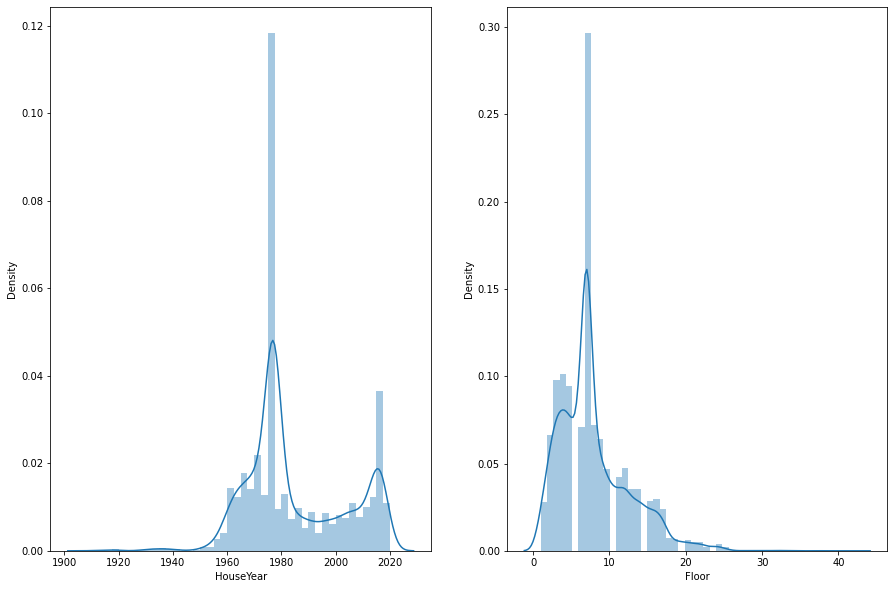

In [108]:
plt.figure(figsize=(15, 10))

plt.subplot(1, 2, 1)
sns.distplot(df['HouseYear'])

plt.subplot(1, 2, 2)
sns.distplot(df['Floor'])

In [109]:
def year_to_cat(data):
    bins = [data['HouseYear'].min(), 1950, 1967, 1980, 2000, 2010, data['HouseYear'].max()]
    data['HouseYear_cat'] = pd.cut(data['HouseYear'], bins=bins, labels=False)
    
    return data

def floor_to_cat(data):
    bins = [data['Floor'].min(), 3, 6, 10, 16, 20, data['Floor'].max()]
    data['Floor_cat'] = pd.cut(data['Floor'], bins=bins, labels=False)
    
    return data
    
def price_year_floor(data):
    const = data.groupby(['HouseYear_cat', 'Floor_cat'], as_index=False).agg({'Price': 'median'}) \
                .rename(columns={'Price': 'PriceYearFloorCat'})
    data = data.merge(const, on=(['HouseYear_cat', 'Floor_cat']), how='left')
    
    return data

In [110]:
df = year_to_cat(df)
df = floor_to_cat(df)
df = price_year_floor(df)

df

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price,Square_outlier,KitchenSquare_outlier,LifeSquare_nan,Floor_over,Healthcare_nan,DistrictSize,IsDistrictLarge,PriceDistrictRooms,Square_cat,PriceSquareCat,HouseYear_cat,Floor_cat,PriceYearFloorCat
0,11809,27,3.0,115.027313,35.424698,10.0,4,10.0,2014,0.075424,B,B,11,3097,0,540.0,0,0,B,305018.875000,0,0,1,0,1,851,1,214083.593750,4.0,374281.593750,5.0,1.0,167829.125000
1,3013,22,1.0,39.832523,23.169222,8.0,7,8.0,1966,0.118537,B,B,30,6207,1,1183.0,1,0,B,177734.546875,0,0,0,0,0,78,0,162263.906250,1.0,166438.468750,1.0,2.0,193969.937500
2,8215,1,3.0,78.342216,47.671970,10.0,2,17.0,1988,0.025609,B,B,33,5261,0,240.0,3,1,B,282078.718750,0,0,0,0,0,652,1,246262.921875,3.0,297389.875000,3.0,0.0,206533.390625
3,2352,1,1.0,40.409908,35.409908,1.0,10,22.0,1977,0.007122,B,B,1,264,0,540.0,0,1,B,168106.000000,0,0,1,0,1,652,1,147454.609375,1.0,166438.468750,2.0,2.0,186474.156250
4,13866,94,2.0,64.285065,38.562515,9.0,16,16.0,1972,0.282798,B,B,33,8667,2,540.0,0,6,B,343995.093750,0,0,0,0,1,89,0,213345.890625,2.0,216436.109375,2.0,3.0,181257.843750
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,1260,61,2.0,49.090729,33.272625,6.0,3,12.0,1981,0.300323,B,B,52,10311,6,540.0,1,9,B,119367.453125,0,0,0,0,1,118,1,237598.578125,1.0,166438.468750,3.0,0.0,206533.390625
9996,16265,27,2.0,64.307686,37.038422,9.0,7,0.0,1977,0.072158,B,B,2,629,1,540.0,0,0,A,199715.156250,0,0,0,1,1,851,1,166014.062500,2.0,216436.109375,2.0,2.0,186474.156250
9997,2795,178,1.0,29.648056,16.555363,5.0,3,5.0,1958,0.460556,B,B,20,4386,14,540.0,1,5,B,165953.906250,0,0,0,0,1,7,0,165953.906250,1.0,166438.468750,1.0,0.0,185057.062500
9998,14561,21,1.0,32.330292,22.326870,5.0,3,9.0,1969,0.194489,B,B,47,8004,3,125.0,3,5,B,171842.406250,0,0,0,0,0,165,1,156087.687500,1.0,166438.468750,2.0,0.0,177351.062500


### Создадим класс для автоматического создания фичей

In [55]:
class MakeFeatures():
    def __init__(self):
        self.median = None
        self.district_size = None
        self.IsDistrictLarge = None
        self.price_district = None
        self.bins_square = None
        self.price_square = None
        self.bins_houseyear = None
        self.bins_floor = None
        self.price_year_floor_cat = None

  
    def fit(self, data):
        df = data.copy()

        # District
        self.district_size = df['DistrictId'].value_counts().reset_index() \
                                             .rename(columns={'index': 'DistrictId',
                                                              'DistrictId': 'DistrictSize'})
        df = df.merge(self.district_size, on='DistrictId', how='left')
        self.IsDistrictLarge = (df['DistrictSize']>100).astype(int)
        self.price_district = pd.pivot_table(df, values='Price', index=['DistrictId', 'Rooms'], 
                                             aggfunc=np.mean).rename(columns={'Price': 'PriceDistrictRooms'})
        df = df.merge(self.price_district, on=['DistrictId', 'Rooms'], how='left')

        # Square
        self.bins_square = [df['Square'].min(), 25, 50, 75, 100, df['Square'].max()]
        df['Square_cat'] = pd.cut(df['Square'], bins=self.bins_square, labels=False)
        self.price_square = df.groupby('Square_cat', as_index=False).agg({'Price': 'median'}) \
                                                 .rename(columns={'Price': 'PriceSquareCat'})
        df = df.merge(self.price_square, on='Square_cat', how='left')

        # HouseYear Floor
        self.bins_houseyear = [df['HouseYear'].min(), 1950, 1967, 1980, 2000, 2010, df['HouseYear'].max()]
        df['HouseYear_cat'] = pd.cut(df['HouseYear'], bins=self.bins_houseyear, labels=False)

        self.bins_floor = [df['Floor'].min(), 3, 6, 10, 16, 20, df['Floor'].max()]
        df['Floor_cat'] = pd.cut(df['Floor'], bins=self.bins_floor, labels=False)

        self.price_year_floor_cat = df.groupby(['HouseYear_cat', 'Floor_cat'], as_index=False) \
                                                 .agg({'Price': 'median'}) \
                                                 .rename(columns={'Price': 'PriceYearFloorCat'})
        df = df.merge(self.price_year_floor_cat, on=(['HouseYear_cat', 'Floor_cat']), how='left')
        
        self.median = df.median()




    def transform(self, data):
        df = data.copy()

        #District
        df = df.merge(self.district_size, on='DistrictId', how='left')
        df['DistrictSize'] = df['DistrictSize'].fillna(self.median['DistrictSize'])
        
        df['IsDistrictLarge'] = (df['DistrictSize']>100).astype(int)
        df = df.merge(self.price_district, on=['DistrictId', 'Rooms'], how='left')
        df['PriceDistrictRooms'] = df['PriceDistrictRooms'].fillna(self.median['PriceDistrictRooms'])

        # Square
        df['Square_cat'] = pd.cut(df['Square'], bins=self.bins_square, labels=False)
        df['Square_cat'] = df['Square_cat'].fillna(-1)
        df = df.merge(self.price_square, on='Square_cat', how='left')
        df['PriceSquareCat'] = df['PriceSquareCat'].fillna(self.median['PriceSquareCat'])

        # HouseYear Floor
        df['HouseYear_cat'] = pd.cut(df['HouseYear'], bins=self.bins_houseyear, labels=False)
        df['HouseYear_cat'].fillna(-1)

        df['Floor_cat'] = pd.cut(df['Floor'], bins=self.bins_floor, labels=False)
        df['Floor_cat'] = df['Floor_cat'].fillna(-1)

        df = df.merge(self.price_year_floor_cat, on=(['HouseYear_cat', 'Floor_cat']), how='left')
        df['PriceYearFloorCat'] = df['PriceYearFloorCat'].fillna(self.median['PriceYearFloorCat'])
        
        return df

### Запишем нужные колонки

In [124]:
df.columns

Index(['Id', 'DistrictId', 'Rooms', 'Square', 'LifeSquare', 'KitchenSquare',
       'Floor', 'HouseFloor', 'HouseYear', 'Ecology_1', 'Ecology_2',
       'Ecology_3', 'Social_1', 'Social_2', 'Social_3', 'Healthcare_1',
       'Helthcare_2', 'Shops_1', 'Shops_2', 'Price', 'Square_outlier',
       'KitchenSquare_outlier', 'LifeSquare_nan', 'Floor_over',
       'Healthcare_nan', 'DistrictSize', 'IsDistrictLarge',
       'PriceDistrictRooms', 'Square_cat', 'PriceSquareCat', 'HouseYear_cat',
       'Floor_cat', 'PriceYearFloorCat'],
      dtype='object')

In [86]:
feature_col = ['Rooms', 'Square', 'LifeSquare', 'KitchenSquare', 'Floor', 
               'HouseFloor', 'HouseYear', 'Ecology_1', 'Ecology_2',
               'Ecology_3', 'Social_1', 'Social_3', 'Healthcare_1',
               'Helthcare_2', 'Shops_1', 'Shops_2', 'Square_outlier',
               'KitchenSquare_outlier', 'LifeSquare_nan', 'Floor_over',
               'Healthcare_nan', 'DistrictSize', 'IsDistrictLarge',
               'PriceDistrictRooms', 'PriceYearFloorCat']

target = ['Price']

### Пришло время проверки, нормируем данные, запустим на catboost и посмотрим на результат

In [102]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from catboost import CatBoostRegressor
from sklearn.metrics import r2_score as r2


def evaluate_preds(train_true_values, train_pred_values, test_true_values, test_pred_values):
    print("Train R2:\t" + str(round(r2(train_true_values, train_pred_values), 3)))
    print("Test R2:\t" + str(round(r2(test_true_values, test_pred_values), 3)))
    
    plt.figure(figsize=(18,10))
    
    plt.subplot(121)
    sns.scatterplot(x=train_pred_values, y=train_true_values)
    plt.xlabel('Predicted values')
    plt.ylabel('True values')
    plt.title('Train sample prediction')
    
    plt.subplot(122)
    sns.scatterplot(x=test_pred_values, y=test_true_values)
    plt.xlabel('Predicted values')
    plt.ylabel('True values')
    plt.title('Test sample prediction')

    plt.show()

In [142]:
train = pd.read_csv('/home/george/Downloads/data/gb/train.csv')
test = pd.read_csv('/home/george/Downloads/data/gb/test.csv')

preprocess = MakePreprocessing()
features = MakeFeatures()

preprocess.fit(train)
train = preprocess.transform(train)
test = preprocess.transform(test)

features.fit(train)
train = features.transform(train)
test = features.transform(test)

train = train[feature_col + target]
test = test.set_index('Id')[feature_col]

In [143]:
test

,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,...,Shops_2,Square_outlier,KitchenSquare_outlier,LifeSquare_nan,Floor_over,Healthcare_nan,DistrictSize,IsDistrictLarge,PriceDistrictRooms,PriceYearFloorCat
Id,,,,,,,,,,,,,,,,,,,,,
4567,1.0,36.847630,19.094182,5.0,5,9.0,1970,0.036122,1,1,...,1,0,0,0,0,0,104.0,1,181458.574086,183043.292808
5925,1.0,42.493907,42.568133,10.0,7,17.0,2017,0.072158,1,1,...,0,0,0,0,0,1,247.0,1,132420.911600,182798.057337
960,2.0,59.463678,46.463678,9.0,19,19.0,1977,0.211401,1,1,...,1,0,0,1,0,1,851.0,1,166014.055413,163215.426305
3848,3.0,49.646030,33.893825,6.0,2,2.0,1965,0.014073,1,1,...,1,0,0,0,0,1,565.0,1,170912.210083,185057.058831
746,1.0,53.837056,48.837056,1.0,8,17.0,1977,0.309479,1,1,...,1,0,0,1,0,0,114.0,1,162100.994903,186474.163801
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10379,2.0,43.177521,30.339945,5.0,7,5.0,1962,0.069660,1,1,...,1,0,0,0,1,1,89.0,0,194528.788734,193969.939450
16138,3.0,93.698122,94.521465,10.0,21,27.0,2018,0.060753,1,1,...,1,0,0,0,0,0,36.0,0,408726.301557,269113.584248
3912,1.0,33.656723,19.003259,5.0,2,5.0,1966,0.038693,1,1,...,1,0,0,0,0,0,97.0,0,160407.417885,185057.058831


<AxesSubplot:>

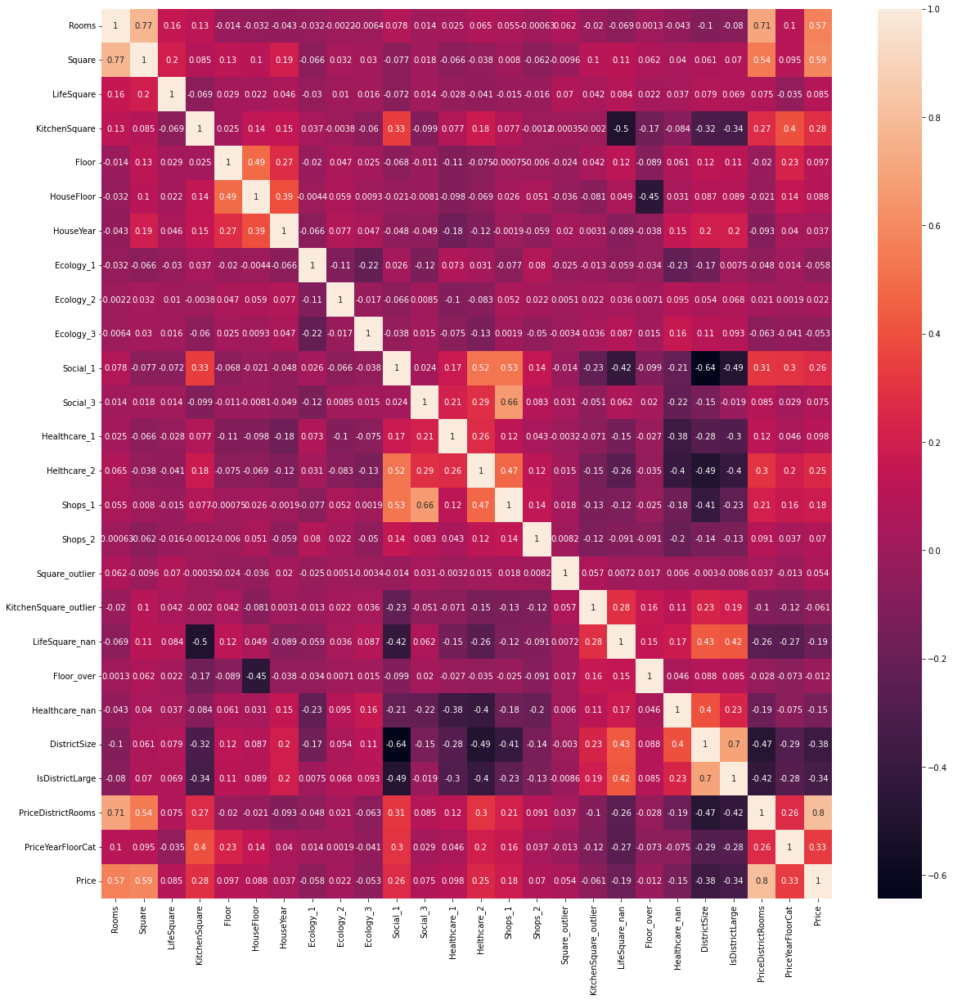

In [88]:
plt.figure(figsize=(20, 20))
sns.heatmap(train.corr(), annot=True)

In [77]:
num_columns = ['Square', 'LifeSquare', 'KitchenSquare', 'Floor', 'HouseFloor',
               'HouseYear', 'Ecology_1', 'Social_1', 'Social_3','Healthcare_1', 
               'Shops_1', 'DistrictSize', 'PriceDistrictRooms', 'PriceYearFloorCat']

In [144]:
X_train, X_val, y_train, y_val = train_test_split(train.drop('Price', axis=1),
                                                  train['Price'], test_size=0.25,
                                                  random_state=42)

X_train.shape

(7500, 25)

In [93]:
model = CatBoostRegressor(
    loss_function='RMSE',
    eval_metric='RMSE'
)

params = {
    'learning_rate': [0.06, 0.08, 0.1, .12],
    'depth': [7, 8, 9, 10],
    'l2_leaf_reg': [1, 2, 3, 4],
    'iterations': [500, 600, 700]
}

grid_search_model = model.grid_search(
    params,
    X=X_train,
    y=y_train,
    plot=True
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 219486.9618830	test: 219313.1981445	best: 219313.1981445 (0)	total: 77.1ms	remaining: 38.5s
1:	learn: 207502.2225634	test: 207452.0057796	best: 207452.0057796 (1)	total: 83.1ms	remaining: 20.7s
2:	learn: 196151.3478218	test: 196085.3690338	best: 196085.3690338 (2)	total: 89.6ms	remaining: 14.8s
3:	learn: 185787.3671546	test: 185773.6517192	best: 185773.6517192 (3)	total: 95.3ms	remaining: 11.8s
4:	learn: 176035.0818705	test: 175958.2144622	best: 175958.2144622 (4)	total: 100ms	remaining: 9.94s
5:	learn: 166807.8648420	test: 166692.8309872	best: 166692.8309872 (5)	total: 105ms	remaining: 8.62s
6:	learn: 158046.9885016	test: 158038.7355281	best: 158038.7355281 (6)	total: 111ms	remaining: 7.8s
7:	learn: 149877.7891708	test: 149869.2416753	best: 149869.2416753 (7)	total: 116ms	remaining: 7.13s
8:	learn: 142242.3382105	test: 142244.3153502	best: 142244.3153502 (8)	total: 121ms	remaining: 6.61s
9:	learn: 135221.9511099	test: 135199.2978513	best: 135199.2978513 (9)	total: 127ms	rema

121:	learn: 39923.6356202	test: 43428.9670480	best: 43428.9670480 (121)	total: 680ms	remaining: 2.11s
122:	learn: 39875.0172680	test: 43432.6626305	best: 43428.9670480 (121)	total: 685ms	remaining: 2.1s
123:	learn: 39809.7627339	test: 43378.5803158	best: 43378.5803158 (123)	total: 691ms	remaining: 2.1s
124:	learn: 39736.7501078	test: 43354.0425621	best: 43354.0425621 (124)	total: 699ms	remaining: 2.1s
125:	learn: 39654.7015646	test: 43319.7802769	best: 43319.7802769 (125)	total: 706ms	remaining: 2.1s
126:	learn: 39577.0569739	test: 43312.8501239	best: 43312.8501239 (126)	total: 713ms	remaining: 2.09s
127:	learn: 39526.9923420	test: 43298.8332579	best: 43298.8332579 (127)	total: 716ms	remaining: 2.08s
128:	learn: 39480.6625396	test: 43238.1088178	best: 43238.1088178 (128)	total: 718ms	remaining: 2.06s
129:	learn: 39430.7036940	test: 43219.7387355	best: 43219.7387355 (129)	total: 721ms	remaining: 2.05s
130:	learn: 39375.6254562	test: 43185.6365241	best: 43185.6365241 (130)	total: 724ms	r

248:	learn: 33659.1100785	test: 42064.4055282	best: 42064.4055282 (248)	total: 1.07s	remaining: 1.08s
249:	learn: 33628.2066567	test: 42049.7169858	best: 42049.7169858 (249)	total: 1.08s	remaining: 1.08s
250:	learn: 33591.2104738	test: 42051.1610881	best: 42049.7169858 (249)	total: 1.09s	remaining: 1.08s
251:	learn: 33555.5243807	test: 42036.4141546	best: 42036.4141546 (251)	total: 1.09s	remaining: 1.08s
252:	learn: 33516.2349701	test: 42040.7541101	best: 42036.4141546 (251)	total: 1.1s	remaining: 1.07s
253:	learn: 33474.4465635	test: 42038.2428251	best: 42036.4141546 (251)	total: 1.1s	remaining: 1.07s
254:	learn: 33430.8422159	test: 42027.5797296	best: 42027.5797296 (254)	total: 1.1s	remaining: 1.06s
255:	learn: 33378.3393288	test: 42035.7206004	best: 42027.5797296 (254)	total: 1.11s	remaining: 1.05s
256:	learn: 33334.6868620	test: 42057.4585748	best: 42027.5797296 (254)	total: 1.11s	remaining: 1.05s
257:	learn: 33311.9150099	test: 42051.6391853	best: 42027.5797296 (254)	total: 1.11s	

363:	learn: 29901.6663054	test: 42120.0184052	best: 42010.7151790 (263)	total: 1.47s	remaining: 548ms
364:	learn: 29882.4853716	test: 42121.1952464	best: 42010.7151790 (263)	total: 1.47s	remaining: 544ms
365:	learn: 29851.3636492	test: 42122.8374854	best: 42010.7151790 (263)	total: 1.47s	remaining: 540ms
366:	learn: 29822.3515146	test: 42114.4693945	best: 42010.7151790 (263)	total: 1.48s	remaining: 536ms
367:	learn: 29797.4999876	test: 42104.4640054	best: 42010.7151790 (263)	total: 1.48s	remaining: 532ms
368:	learn: 29781.7602107	test: 42119.1274220	best: 42010.7151790 (263)	total: 1.49s	remaining: 527ms
369:	learn: 29759.0494910	test: 42101.1522741	best: 42010.7151790 (263)	total: 1.49s	remaining: 523ms
370:	learn: 29745.9473308	test: 42099.0424777	best: 42010.7151790 (263)	total: 1.49s	remaining: 518ms
371:	learn: 29715.2101418	test: 42096.4998808	best: 42010.7151790 (263)	total: 1.49s	remaining: 514ms
372:	learn: 29685.5761816	test: 42117.6716820	best: 42010.7151790 (263)	total: 1.5

492:	learn: 26716.9970100	test: 42168.0766374	best: 42010.7151790 (263)	total: 1.86s	remaining: 26.4ms
493:	learn: 26701.5740599	test: 42164.4571519	best: 42010.7151790 (263)	total: 1.86s	remaining: 22.6ms
494:	learn: 26685.7288185	test: 42155.3719167	best: 42010.7151790 (263)	total: 1.86s	remaining: 18.8ms
495:	learn: 26662.4963077	test: 42167.1941927	best: 42010.7151790 (263)	total: 1.87s	remaining: 15.1ms
496:	learn: 26638.3285885	test: 42159.6878987	best: 42010.7151790 (263)	total: 1.87s	remaining: 11.3ms
497:	learn: 26622.0413981	test: 42156.8779582	best: 42010.7151790 (263)	total: 1.88s	remaining: 7.53ms
498:	learn: 26597.5824074	test: 42164.2124490	best: 42010.7151790 (263)	total: 1.88s	remaining: 3.76ms
499:	learn: 26576.2536035	test: 42175.1257932	best: 42010.7151790 (263)	total: 1.88s	remaining: 0us

bestTest = 42010.71518
bestIteration = 263

0:	loss: 42010.7151790	best: 42010.7151790 (0)	total: 2.2s	remaining: 6m 59s
0:	learn: 215250.1316112	test: 215054.4257447	best: 21505

100:	learn: 38826.4117260	test: 43120.6257804	best: 43120.6257804 (100)	total: 363ms	remaining: 1.43s
101:	learn: 38760.9532633	test: 43054.1002207	best: 43054.1002207 (101)	total: 367ms	remaining: 1.43s
102:	learn: 38618.0267324	test: 43049.9467004	best: 43049.9467004 (102)	total: 370ms	remaining: 1.43s
103:	learn: 38508.6177776	test: 43003.7528229	best: 43003.7528229 (103)	total: 373ms	remaining: 1.42s
104:	learn: 38462.4231047	test: 42980.8846407	best: 42980.8846407 (104)	total: 375ms	remaining: 1.41s
105:	learn: 38336.6006719	test: 42975.7450656	best: 42975.7450656 (105)	total: 385ms	remaining: 1.43s
106:	learn: 38298.6389895	test: 42935.5667262	best: 42935.5667262 (106)	total: 390ms	remaining: 1.43s
107:	learn: 38223.7925337	test: 42883.2427967	best: 42883.2427967 (107)	total: 396ms	remaining: 1.44s
108:	learn: 38181.1192766	test: 42857.6268188	best: 42857.6268188 (108)	total: 400ms	remaining: 1.43s
109:	learn: 38135.9784826	test: 42860.7664399	best: 42857.6268188 (108)	total: 402

208:	learn: 32359.3247788	test: 42196.2730942	best: 42192.1727212 (205)	total: 760ms	remaining: 1.06s
209:	learn: 32306.3241676	test: 42199.3942101	best: 42192.1727212 (205)	total: 767ms	remaining: 1.06s
210:	learn: 32240.2849292	test: 42227.8267574	best: 42192.1727212 (205)	total: 772ms	remaining: 1.06s
211:	learn: 32210.6689590	test: 42228.7077255	best: 42192.1727212 (205)	total: 778ms	remaining: 1.06s
212:	learn: 32168.7060213	test: 42240.1651703	best: 42192.1727212 (205)	total: 784ms	remaining: 1.06s
213:	learn: 32123.5477317	test: 42256.0552881	best: 42192.1727212 (205)	total: 790ms	remaining: 1.05s
214:	learn: 32084.1358913	test: 42251.5988392	best: 42192.1727212 (205)	total: 794ms	remaining: 1.05s
215:	learn: 32054.2060331	test: 42249.0436059	best: 42192.1727212 (205)	total: 801ms	remaining: 1.05s
216:	learn: 31988.6379308	test: 42245.3811316	best: 42192.1727212 (205)	total: 805ms	remaining: 1.05s
217:	learn: 31936.5687750	test: 42276.4597835	best: 42192.1727212 (205)	total: 810

330:	learn: 27623.8418022	test: 42082.1605956	best: 42044.4576695 (326)	total: 1.15s	remaining: 588ms
331:	learn: 27601.0930410	test: 42077.8788759	best: 42044.4576695 (326)	total: 1.15s	remaining: 584ms
332:	learn: 27562.2054916	test: 42074.0126584	best: 42044.4576695 (326)	total: 1.16s	remaining: 580ms
333:	learn: 27514.2977956	test: 42080.3848229	best: 42044.4576695 (326)	total: 1.16s	remaining: 577ms
334:	learn: 27483.5223197	test: 42071.3976949	best: 42044.4576695 (326)	total: 1.16s	remaining: 573ms
335:	learn: 27451.0823113	test: 42069.2680139	best: 42044.4576695 (326)	total: 1.17s	remaining: 570ms
336:	learn: 27427.7090870	test: 42055.8647164	best: 42044.4576695 (326)	total: 1.17s	remaining: 567ms
337:	learn: 27393.8450891	test: 42069.4016863	best: 42044.4576695 (326)	total: 1.18s	remaining: 564ms
338:	learn: 27359.7092373	test: 42075.4641887	best: 42044.4576695 (326)	total: 1.18s	remaining: 562ms
339:	learn: 27310.1355917	test: 42078.3442888	best: 42044.4576695 (326)	total: 1.1

449:	learn: 24262.9478450	test: 42245.0872092	best: 42044.4576695 (326)	total: 1.54s	remaining: 171ms
450:	learn: 24245.9265859	test: 42263.6685193	best: 42044.4576695 (326)	total: 1.55s	remaining: 168ms
451:	learn: 24207.6375228	test: 42282.8871491	best: 42044.4576695 (326)	total: 1.55s	remaining: 165ms
452:	learn: 24183.2413571	test: 42279.3037680	best: 42044.4576695 (326)	total: 1.55s	remaining: 161ms
453:	learn: 24141.6253278	test: 42280.9105008	best: 42044.4576695 (326)	total: 1.56s	remaining: 158ms
454:	learn: 24118.0701252	test: 42273.9264428	best: 42044.4576695 (326)	total: 1.56s	remaining: 154ms
455:	learn: 24093.7125375	test: 42265.0690764	best: 42044.4576695 (326)	total: 1.56s	remaining: 151ms
456:	learn: 24071.1529561	test: 42257.1495257	best: 42044.4576695 (326)	total: 1.57s	remaining: 148ms
457:	learn: 24057.2291028	test: 42252.5051864	best: 42044.4576695 (326)	total: 1.57s	remaining: 144ms
458:	learn: 24042.7785368	test: 42243.1937709	best: 42044.4576695 (326)	total: 1.5

64:	learn: 40736.5697899	test: 43895.7773156	best: 43895.7773156 (64)	total: 238ms	remaining: 1.59s
65:	learn: 40593.2992883	test: 43817.1710359	best: 43817.1710359 (65)	total: 242ms	remaining: 1.59s
66:	learn: 40495.4077558	test: 43746.9550235	best: 43746.9550235 (66)	total: 247ms	remaining: 1.59s
67:	learn: 40419.6463920	test: 43679.2815684	best: 43679.2815684 (67)	total: 252ms	remaining: 1.6s
68:	learn: 40311.7599434	test: 43596.6230110	best: 43596.6230110 (68)	total: 257ms	remaining: 1.6s
69:	learn: 40174.9898514	test: 43552.2302105	best: 43552.2302105 (69)	total: 260ms	remaining: 1.6s
70:	learn: 40102.9910104	test: 43485.8345414	best: 43485.8345414 (70)	total: 263ms	remaining: 1.59s
71:	learn: 39967.1950100	test: 43409.3648892	best: 43409.3648892 (71)	total: 267ms	remaining: 1.58s
72:	learn: 39886.5577865	test: 43377.5105324	best: 43377.5105324 (72)	total: 271ms	remaining: 1.58s
73:	learn: 39823.4062840	test: 43312.0558136	best: 43312.0558136 (73)	total: 275ms	remaining: 1.58s
74:

182:	learn: 31705.5101508	test: 42025.5575173	best: 41957.7784207 (175)	total: 628ms	remaining: 1.09s
183:	learn: 31604.8257718	test: 42009.7836142	best: 41957.7784207 (175)	total: 633ms	remaining: 1.09s
184:	learn: 31575.7175950	test: 42020.2495336	best: 41957.7784207 (175)	total: 637ms	remaining: 1.08s
185:	learn: 31545.2526745	test: 42016.4541836	best: 41957.7784207 (175)	total: 642ms	remaining: 1.08s
186:	learn: 31516.1838818	test: 41991.5404857	best: 41957.7784207 (175)	total: 647ms	remaining: 1.08s
187:	learn: 31472.3321048	test: 42002.2935498	best: 41957.7784207 (175)	total: 652ms	remaining: 1.08s
188:	learn: 31398.1522742	test: 42020.8960368	best: 41957.7784207 (175)	total: 657ms	remaining: 1.08s
189:	learn: 31367.6996760	test: 42031.9339648	best: 41957.7784207 (175)	total: 660ms	remaining: 1.08s
190:	learn: 31333.6715202	test: 42084.3268744	best: 41957.7784207 (175)	total: 662ms	remaining: 1.07s
191:	learn: 31290.5384185	test: 42068.6249512	best: 41957.7784207 (175)	total: 665

299:	learn: 26534.5889139	test: 42030.0643549	best: 41957.7784207 (175)	total: 1.02s	remaining: 679ms
300:	learn: 26500.2576937	test: 42012.5137513	best: 41957.7784207 (175)	total: 1.02s	remaining: 675ms
301:	learn: 26456.3265669	test: 42006.1420126	best: 41957.7784207 (175)	total: 1.03s	remaining: 673ms
302:	learn: 26427.2260487	test: 42009.1638603	best: 41957.7784207 (175)	total: 1.03s	remaining: 670ms
303:	learn: 26356.0442038	test: 41994.8883310	best: 41957.7784207 (175)	total: 1.03s	remaining: 667ms
304:	learn: 26341.2328373	test: 41997.2417780	best: 41957.7784207 (175)	total: 1.04s	remaining: 666ms
305:	learn: 26302.2122319	test: 42000.8604168	best: 41957.7784207 (175)	total: 1.04s	remaining: 663ms
306:	learn: 26272.3811497	test: 42001.9981366	best: 41957.7784207 (175)	total: 1.05s	remaining: 659ms
307:	learn: 26241.6038847	test: 42020.9791572	best: 41957.7784207 (175)	total: 1.05s	remaining: 656ms
308:	learn: 26201.1273787	test: 42022.9769230	best: 41957.7784207 (175)	total: 1.0

418:	learn: 22921.5946969	test: 42172.0394668	best: 41920.1367927 (324)	total: 1.41s	remaining: 273ms
419:	learn: 22904.2660596	test: 42172.0668648	best: 41920.1367927 (324)	total: 1.42s	remaining: 270ms
420:	learn: 22887.2087115	test: 42180.1318628	best: 41920.1367927 (324)	total: 1.42s	remaining: 267ms
421:	learn: 22869.1124477	test: 42178.6773445	best: 41920.1367927 (324)	total: 1.43s	remaining: 264ms
422:	learn: 22846.8793697	test: 42186.8183053	best: 41920.1367927 (324)	total: 1.43s	remaining: 260ms
423:	learn: 22816.0839141	test: 42193.7283177	best: 41920.1367927 (324)	total: 1.43s	remaining: 257ms
424:	learn: 22796.0164180	test: 42196.4001195	best: 41920.1367927 (324)	total: 1.43s	remaining: 253ms
425:	learn: 22759.9848734	test: 42196.4412549	best: 41920.1367927 (324)	total: 1.44s	remaining: 250ms
426:	learn: 22718.5095338	test: 42195.8536366	best: 41920.1367927 (324)	total: 1.44s	remaining: 247ms
427:	learn: 22705.4512252	test: 42194.5271862	best: 41920.1367927 (324)	total: 1.4

53:	learn: 40586.0332882	test: 43594.1746884	best: 43594.1746884 (53)	total: 150ms	remaining: 1.24s
54:	learn: 40494.2127898	test: 43568.2763670	best: 43568.2763670 (54)	total: 155ms	remaining: 1.25s
55:	learn: 40369.6609407	test: 43527.4313736	best: 43527.4313736 (55)	total: 160ms	remaining: 1.27s
56:	learn: 40274.5638956	test: 43439.4230120	best: 43439.4230120 (56)	total: 165ms	remaining: 1.28s
57:	learn: 40169.3410754	test: 43458.3500230	best: 43439.4230120 (56)	total: 170ms	remaining: 1.29s
58:	learn: 40023.5407030	test: 43483.5231919	best: 43439.4230120 (56)	total: 174ms	remaining: 1.3s
59:	learn: 39916.0816887	test: 43490.5339881	best: 43439.4230120 (56)	total: 177ms	remaining: 1.3s
60:	learn: 39733.6966371	test: 43490.4026786	best: 43439.4230120 (56)	total: 180ms	remaining: 1.29s
61:	learn: 39620.3613984	test: 43518.4261633	best: 43439.4230120 (56)	total: 183ms	remaining: 1.29s
62:	learn: 39527.6738843	test: 43521.1588399	best: 43439.4230120 (56)	total: 186ms	remaining: 1.29s
63

183:	learn: 29652.2446279	test: 42038.3134506	best: 41998.0866676 (181)	total: 545ms	remaining: 936ms
184:	learn: 29605.8984956	test: 42031.6793554	best: 41998.0866676 (181)	total: 549ms	remaining: 936ms
185:	learn: 29515.0223046	test: 42035.1913985	best: 41998.0866676 (181)	total: 552ms	remaining: 932ms
186:	learn: 29482.7371413	test: 42048.4246674	best: 41998.0866676 (181)	total: 560ms	remaining: 937ms
187:	learn: 29439.3142095	test: 42029.3180845	best: 41998.0866676 (181)	total: 565ms	remaining: 938ms
188:	learn: 29403.8081167	test: 42071.0910312	best: 41998.0866676 (181)	total: 569ms	remaining: 937ms
189:	learn: 29342.7525802	test: 42054.3103350	best: 41998.0866676 (181)	total: 574ms	remaining: 936ms
190:	learn: 29261.1346294	test: 42074.7586463	best: 41998.0866676 (181)	total: 577ms	remaining: 933ms
191:	learn: 29222.2618875	test: 42069.1967173	best: 41998.0866676 (181)	total: 579ms	remaining: 929ms
192:	learn: 29161.1895688	test: 42076.5213268	best: 41998.0866676 (181)	total: 582

301:	learn: 24431.1231489	test: 42219.1650839	best: 41922.6560616 (237)	total: 935ms	remaining: 613ms
302:	learn: 24408.9083340	test: 42211.2851571	best: 41922.6560616 (237)	total: 940ms	remaining: 611ms
303:	learn: 24367.3809160	test: 42216.8806566	best: 41922.6560616 (237)	total: 946ms	remaining: 610ms
304:	learn: 24324.3580490	test: 42220.5180466	best: 41922.6560616 (237)	total: 951ms	remaining: 608ms
305:	learn: 24283.8707160	test: 42218.9130409	best: 41922.6560616 (237)	total: 953ms	remaining: 604ms
306:	learn: 24239.1163072	test: 42220.2013634	best: 41922.6560616 (237)	total: 959ms	remaining: 603ms
307:	learn: 24189.9017060	test: 42218.7484363	best: 41922.6560616 (237)	total: 962ms	remaining: 599ms
308:	learn: 24178.9607401	test: 42222.2931729	best: 41922.6560616 (237)	total: 964ms	remaining: 596ms
309:	learn: 24149.2350661	test: 42215.0872013	best: 41922.6560616 (237)	total: 967ms	remaining: 593ms
310:	learn: 24132.0230750	test: 42216.4639425	best: 41922.6560616 (237)	total: 969

435:	learn: 20471.1121058	test: 42383.2436810	best: 41922.6560616 (237)	total: 1.33s	remaining: 195ms
436:	learn: 20441.9018044	test: 42392.1284343	best: 41922.6560616 (237)	total: 1.33s	remaining: 192ms
437:	learn: 20406.1212449	test: 42382.3249054	best: 41922.6560616 (237)	total: 1.33s	remaining: 189ms
438:	learn: 20386.4931170	test: 42396.0768940	best: 41922.6560616 (237)	total: 1.34s	remaining: 186ms
439:	learn: 20350.7660162	test: 42401.2785808	best: 41922.6560616 (237)	total: 1.34s	remaining: 183ms
440:	learn: 20329.9734505	test: 42399.9638701	best: 41922.6560616 (237)	total: 1.35s	remaining: 180ms
441:	learn: 20303.0033000	test: 42413.8037654	best: 41922.6560616 (237)	total: 1.35s	remaining: 177ms
442:	learn: 20282.0032580	test: 42421.4122483	best: 41922.6560616 (237)	total: 1.35s	remaining: 174ms
443:	learn: 20264.9989641	test: 42413.1209934	best: 41922.6560616 (237)	total: 1.36s	remaining: 171ms
444:	learn: 20238.0968145	test: 42423.7679589	best: 41922.6560616 (237)	total: 1.3

69:	learn: 44271.7458805	test: 45732.6319346	best: 45732.6319346 (69)	total: 210ms	remaining: 1.29s
70:	learn: 44185.2548096	test: 45675.3669843	best: 45675.3669843 (70)	total: 215ms	remaining: 1.3s
71:	learn: 44080.0326127	test: 45618.3318141	best: 45618.3318141 (71)	total: 219ms	remaining: 1.3s
72:	learn: 43972.4640706	test: 45536.9211510	best: 45536.9211510 (72)	total: 224ms	remaining: 1.31s
73:	learn: 43885.7431332	test: 45481.8117485	best: 45481.8117485 (73)	total: 228ms	remaining: 1.31s
74:	learn: 43787.9533756	test: 45405.1524593	best: 45405.1524593 (74)	total: 232ms	remaining: 1.31s
75:	learn: 43697.6345044	test: 45336.0039891	best: 45336.0039891 (75)	total: 234ms	remaining: 1.31s
76:	learn: 43565.9348441	test: 45260.0060211	best: 45260.0060211 (76)	total: 237ms	remaining: 1.3s
77:	learn: 43450.9747556	test: 45186.7183768	best: 45186.7183768 (77)	total: 240ms	remaining: 1.3s
78:	learn: 43345.9428821	test: 45137.1605286	best: 45137.1605286 (78)	total: 243ms	remaining: 1.29s
79:	

176:	learn: 37269.2994460	test: 42709.1477863	best: 42703.7225839 (175)	total: 605ms	remaining: 1.1s
177:	learn: 37225.2121449	test: 42718.8308176	best: 42703.7225839 (175)	total: 623ms	remaining: 1.13s
178:	learn: 37196.7277670	test: 42707.4461773	best: 42703.7225839 (175)	total: 634ms	remaining: 1.14s
179:	learn: 37146.9410188	test: 42685.2885701	best: 42685.2885701 (179)	total: 639ms	remaining: 1.14s
180:	learn: 37123.8731045	test: 42682.0167756	best: 42682.0167756 (180)	total: 642ms	remaining: 1.13s
181:	learn: 37076.4048028	test: 42683.6280510	best: 42682.0167756 (180)	total: 652ms	remaining: 1.14s
182:	learn: 37066.0555895	test: 42692.0239580	best: 42682.0167756 (180)	total: 655ms	remaining: 1.14s
183:	learn: 37032.1809792	test: 42680.5451028	best: 42680.5451028 (183)	total: 658ms	remaining: 1.13s
184:	learn: 36990.2292595	test: 42697.3463268	best: 42680.5451028 (183)	total: 661ms	remaining: 1.13s
185:	learn: 36936.1806547	test: 42726.1284055	best: 42680.5451028 (183)	total: 665m

285:	learn: 33196.6108442	test: 42260.1545750	best: 42242.3949557 (269)	total: 996ms	remaining: 745ms
286:	learn: 33170.9298701	test: 42265.8029163	best: 42242.3949557 (269)	total: 1s	remaining: 743ms
287:	learn: 33150.0361577	test: 42245.2344414	best: 42242.3949557 (269)	total: 1s	remaining: 740ms
288:	learn: 33144.8092473	test: 42251.4283767	best: 42242.3949557 (269)	total: 1.01s	remaining: 737ms
289:	learn: 33124.2413197	test: 42246.4814668	best: 42242.3949557 (269)	total: 1.01s	remaining: 733ms
290:	learn: 33108.2715698	test: 42257.4482897	best: 42242.3949557 (269)	total: 1.01s	remaining: 729ms
291:	learn: 33081.5519289	test: 42237.2509473	best: 42237.2509473 (291)	total: 1.02s	remaining: 727ms
292:	learn: 33050.2140513	test: 42254.4279368	best: 42237.2509473 (291)	total: 1.02s	remaining: 723ms
293:	learn: 33026.0061589	test: 42255.2353944	best: 42237.2509473 (291)	total: 1.02s	remaining: 719ms
294:	learn: 32996.8121167	test: 42248.8012139	best: 42237.2509473 (291)	total: 1.03s	rem

390:	learn: 30358.1625853	test: 41920.8958969	best: 41900.2613979 (388)	total: 1.4s	remaining: 389ms
391:	learn: 30330.8216489	test: 41932.0768779	best: 41900.2613979 (388)	total: 1.4s	remaining: 386ms
392:	learn: 30306.7306031	test: 41936.1168679	best: 41900.2613979 (388)	total: 1.4s	remaining: 383ms
393:	learn: 30283.2826645	test: 41929.8380353	best: 41900.2613979 (388)	total: 1.41s	remaining: 379ms
394:	learn: 30256.3651901	test: 41941.1771747	best: 41900.2613979 (388)	total: 1.41s	remaining: 375ms
395:	learn: 30241.8986877	test: 41937.1907828	best: 41900.2613979 (388)	total: 1.41s	remaining: 371ms
396:	learn: 30210.1868869	test: 41927.6550971	best: 41900.2613979 (388)	total: 1.42s	remaining: 368ms
397:	learn: 30181.3491920	test: 41911.7610543	best: 41900.2613979 (388)	total: 1.42s	remaining: 365ms
398:	learn: 30159.4278037	test: 41906.2738153	best: 41900.2613979 (388)	total: 1.43s	remaining: 361ms
399:	learn: 30139.9308536	test: 41912.8542971	best: 41900.2613979 (388)	total: 1.43s	

3:	learn: 172996.4366284	test: 172878.0299134	best: 172878.0299134 (3)	total: 24.1ms	remaining: 2.99s
4:	learn: 161182.6697885	test: 160962.6432316	best: 160962.6432316 (4)	total: 30.2ms	remaining: 2.99s
5:	learn: 150233.1584200	test: 149958.3983119	best: 149958.3983119 (5)	total: 34.8ms	remaining: 2.86s
6:	learn: 140249.8346446	test: 140096.3174313	best: 140096.3174313 (6)	total: 40.2ms	remaining: 2.83s
7:	learn: 130913.3758836	test: 130779.5286313	best: 130779.5286313 (7)	total: 46.6ms	remaining: 2.87s
8:	learn: 122587.2513637	test: 122431.9409089	best: 122431.9409089 (8)	total: 50.5ms	remaining: 2.76s
9:	learn: 114983.9330716	test: 114810.5207031	best: 114810.5207031 (9)	total: 53.7ms	remaining: 2.63s
10:	learn: 107970.8532692	test: 107738.7270814	best: 107738.7270814 (10)	total: 57ms	remaining: 2.53s
11:	learn: 101739.4554656	test: 101473.2627124	best: 101473.2627124 (11)	total: 62ms	remaining: 2.52s
12:	learn: 96131.2716258	test: 95869.3854530	best: 95869.3854530 (12)	total: 65.8m

113:	learn: 38576.7946943	test: 42853.5936593	best: 42853.5936593 (113)	total: 416ms	remaining: 1.41s
114:	learn: 38529.6424771	test: 42827.6591579	best: 42827.6591579 (114)	total: 420ms	remaining: 1.41s
115:	learn: 38469.3370620	test: 42777.4052476	best: 42777.4052476 (115)	total: 425ms	remaining: 1.41s
116:	learn: 38436.7164107	test: 42769.7239743	best: 42769.7239743 (116)	total: 429ms	remaining: 1.41s
117:	learn: 38358.2412924	test: 42733.3535972	best: 42733.3535972 (117)	total: 433ms	remaining: 1.4s
118:	learn: 38299.4610376	test: 42688.3316329	best: 42688.3316329 (118)	total: 437ms	remaining: 1.4s
119:	learn: 38257.1198521	test: 42678.6168697	best: 42678.6168697 (119)	total: 440ms	remaining: 1.39s
120:	learn: 38199.9654982	test: 42684.8734871	best: 42678.6168697 (119)	total: 443ms	remaining: 1.39s
121:	learn: 38118.1768999	test: 42683.3773591	best: 42678.6168697 (119)	total: 448ms	remaining: 1.39s
122:	learn: 38093.0183788	test: 42682.3126104	best: 42678.6168697 (119)	total: 451ms

227:	learn: 32529.3243045	test: 42080.0797036	best: 42034.9199289 (223)	total: 810ms	remaining: 966ms
228:	learn: 32489.8043763	test: 42066.2154717	best: 42034.9199289 (223)	total: 816ms	remaining: 966ms
229:	learn: 32458.2717325	test: 42066.3651357	best: 42034.9199289 (223)	total: 823ms	remaining: 966ms
230:	learn: 32426.2808401	test: 42069.5036281	best: 42034.9199289 (223)	total: 827ms	remaining: 963ms
231:	learn: 32368.5018575	test: 42037.8443716	best: 42034.9199289 (223)	total: 831ms	remaining: 960ms
232:	learn: 32344.4964332	test: 42019.5928457	best: 42019.5928457 (232)	total: 836ms	remaining: 958ms
233:	learn: 32313.1721938	test: 42020.3475402	best: 42019.5928457 (232)	total: 840ms	remaining: 955ms
234:	learn: 32264.8602781	test: 42028.2517225	best: 42019.5928457 (232)	total: 843ms	remaining: 951ms
235:	learn: 32214.9417693	test: 42012.4106907	best: 42012.4106907 (235)	total: 848ms	remaining: 948ms
236:	learn: 32168.9320471	test: 42020.8866756	best: 42012.4106907 (235)	total: 851

323:	learn: 29255.4868954	test: 41930.8895144	best: 41912.0535135 (317)	total: 1.2s	remaining: 653ms
324:	learn: 29221.6084412	test: 41939.5994048	best: 41912.0535135 (317)	total: 1.21s	remaining: 651ms
325:	learn: 29171.6894652	test: 41938.1961741	best: 41912.0535135 (317)	total: 1.21s	remaining: 648ms
326:	learn: 29139.4806033	test: 41944.7449156	best: 41912.0535135 (317)	total: 1.22s	remaining: 645ms
327:	learn: 29108.0534579	test: 41948.7358104	best: 41912.0535135 (317)	total: 1.22s	remaining: 642ms
328:	learn: 29082.7122324	test: 41940.9926732	best: 41912.0535135 (317)	total: 1.23s	remaining: 639ms
329:	learn: 29062.7956303	test: 41941.5767782	best: 41912.0535135 (317)	total: 1.24s	remaining: 638ms
330:	learn: 29032.2560621	test: 41947.5556486	best: 41912.0535135 (317)	total: 1.24s	remaining: 635ms
331:	learn: 28998.7667853	test: 41957.4188621	best: 41912.0535135 (317)	total: 1.25s	remaining: 632ms
332:	learn: 28969.5178783	test: 41941.0857862	best: 41912.0535135 (317)	total: 1.25

415:	learn: 26632.4692366	test: 41878.2131711	best: 41839.8547744 (410)	total: 1.6s	remaining: 322ms
416:	learn: 26602.5645329	test: 41889.4336264	best: 41839.8547744 (410)	total: 1.6s	remaining: 319ms
417:	learn: 26579.6029350	test: 41882.9407449	best: 41839.8547744 (410)	total: 1.6s	remaining: 315ms
418:	learn: 26553.5618689	test: 41887.7462048	best: 41839.8547744 (410)	total: 1.61s	remaining: 311ms
419:	learn: 26534.9190982	test: 41897.8679085	best: 41839.8547744 (410)	total: 1.61s	remaining: 308ms
420:	learn: 26510.8384829	test: 41897.9475077	best: 41839.8547744 (410)	total: 1.62s	remaining: 304ms
421:	learn: 26470.7387664	test: 41911.6956047	best: 41839.8547744 (410)	total: 1.63s	remaining: 300ms
422:	learn: 26459.2965804	test: 41911.3250788	best: 41839.8547744 (410)	total: 1.63s	remaining: 296ms
423:	learn: 26433.0424462	test: 41916.7680336	best: 41839.8547744 (410)	total: 1.63s	remaining: 292ms
424:	learn: 26406.8305392	test: 41907.5945904	best: 41839.8547744 (410)	total: 1.63s	

35:	learn: 46086.6171085	test: 46888.6604211	best: 46888.6604211 (35)	total: 123ms	remaining: 1.58s
36:	learn: 45835.6169041	test: 46667.5102974	best: 46667.5102974 (36)	total: 128ms	remaining: 1.6s
37:	learn: 45582.7519880	test: 46440.8920926	best: 46440.8920926 (37)	total: 131ms	remaining: 1.59s
38:	learn: 45360.7654088	test: 46320.0742448	best: 46320.0742448 (38)	total: 134ms	remaining: 1.58s
39:	learn: 45125.0560294	test: 46108.7661322	best: 46108.7661322 (39)	total: 136ms	remaining: 1.57s
40:	learn: 44915.3254685	test: 45988.4925144	best: 45988.4925144 (40)	total: 140ms	remaining: 1.57s
41:	learn: 44674.0585824	test: 45850.3934735	best: 45850.3934735 (41)	total: 145ms	remaining: 1.58s
42:	learn: 44491.6277870	test: 45667.3636428	best: 45667.3636428 (42)	total: 149ms	remaining: 1.59s
43:	learn: 44251.8634113	test: 45510.3724698	best: 45510.3724698 (43)	total: 154ms	remaining: 1.59s
44:	learn: 44144.9269759	test: 45414.5555868	best: 45414.5555868 (44)	total: 160ms	remaining: 1.61s
4

155:	learn: 34278.2157472	test: 42156.4143192	best: 42073.3868838 (146)	total: 513ms	remaining: 1.13s
156:	learn: 34199.3000648	test: 42168.7041353	best: 42073.3868838 (146)	total: 516ms	remaining: 1.13s
157:	learn: 34157.6782196	test: 42159.0152185	best: 42073.3868838 (146)	total: 520ms	remaining: 1.13s
158:	learn: 34086.1161487	test: 42149.4328584	best: 42073.3868838 (146)	total: 523ms	remaining: 1.12s
159:	learn: 33998.2665622	test: 42136.2489729	best: 42073.3868838 (146)	total: 527ms	remaining: 1.12s
160:	learn: 33924.6850178	test: 42152.3845454	best: 42073.3868838 (146)	total: 529ms	remaining: 1.11s
161:	learn: 33855.0636733	test: 42159.4360600	best: 42073.3868838 (146)	total: 532ms	remaining: 1.11s
162:	learn: 33814.9464536	test: 42139.8947590	best: 42073.3868838 (146)	total: 537ms	remaining: 1.11s
163:	learn: 33751.1641111	test: 42154.1330778	best: 42073.3868838 (146)	total: 541ms	remaining: 1.11s
164:	learn: 33678.1708695	test: 42170.0196186	best: 42073.3868838 (146)	total: 546

251:	learn: 29560.6301628	test: 42022.1777325	best: 41965.4606773 (231)	total: 908ms	remaining: 893ms
252:	learn: 29519.9115095	test: 42016.1846617	best: 41965.4606773 (231)	total: 917ms	remaining: 895ms
253:	learn: 29480.5601323	test: 42020.8405201	best: 41965.4606773 (231)	total: 923ms	remaining: 894ms
254:	learn: 29456.4419326	test: 41995.3252694	best: 41965.4606773 (231)	total: 928ms	remaining: 891ms
255:	learn: 29416.1970927	test: 41996.5474911	best: 41965.4606773 (231)	total: 932ms	remaining: 888ms
256:	learn: 29393.4050543	test: 41979.0250794	best: 41965.4606773 (231)	total: 935ms	remaining: 884ms
257:	learn: 29361.5580552	test: 41964.5740751	best: 41964.5740751 (257)	total: 939ms	remaining: 880ms
258:	learn: 29320.2741880	test: 41945.3148394	best: 41945.3148394 (258)	total: 942ms	remaining: 876ms
259:	learn: 29274.1508213	test: 41940.4640309	best: 41940.4640309 (259)	total: 950ms	remaining: 877ms
260:	learn: 29241.7428578	test: 41950.3786811	best: 41940.4640309 (259)	total: 954

356:	learn: 26053.9987443	test: 41953.5461475	best: 41824.5587473 (283)	total: 1.3s	remaining: 520ms
357:	learn: 26024.7766632	test: 41967.7985438	best: 41824.5587473 (283)	total: 1.3s	remaining: 517ms
358:	learn: 25999.2790630	test: 41957.3372175	best: 41824.5587473 (283)	total: 1.31s	remaining: 514ms
359:	learn: 25950.7697835	test: 41959.0126859	best: 41824.5587473 (283)	total: 1.31s	remaining: 511ms
360:	learn: 25925.0792443	test: 41949.9480128	best: 41824.5587473 (283)	total: 1.32s	remaining: 508ms
361:	learn: 25908.5124125	test: 41954.3437164	best: 41824.5587473 (283)	total: 1.32s	remaining: 505ms
362:	learn: 25887.3308866	test: 41962.9852662	best: 41824.5587473 (283)	total: 1.33s	remaining: 502ms
363:	learn: 25846.7828106	test: 42000.7352231	best: 41824.5587473 (283)	total: 1.34s	remaining: 500ms
364:	learn: 25829.3646367	test: 42004.0736080	best: 41824.5587473 (283)	total: 1.34s	remaining: 497ms
365:	learn: 25806.0669534	test: 41987.7739984	best: 41824.5587473 (283)	total: 1.35s

453:	learn: 23537.4032042	test: 41932.3839310	best: 41824.5587473 (283)	total: 1.69s	remaining: 172ms
454:	learn: 23517.5913309	test: 41931.8911134	best: 41824.5587473 (283)	total: 1.7s	remaining: 168ms
455:	learn: 23503.6780912	test: 41933.5730076	best: 41824.5587473 (283)	total: 1.7s	remaining: 164ms
456:	learn: 23493.8900221	test: 41931.7563584	best: 41824.5587473 (283)	total: 1.71s	remaining: 161ms
457:	learn: 23466.5306106	test: 41933.6473314	best: 41824.5587473 (283)	total: 1.71s	remaining: 157ms
458:	learn: 23441.7719669	test: 41942.3216830	best: 41824.5587473 (283)	total: 1.72s	remaining: 153ms
459:	learn: 23430.4582838	test: 41943.9663336	best: 41824.5587473 (283)	total: 1.72s	remaining: 150ms
460:	learn: 23408.9101378	test: 41948.6634866	best: 41824.5587473 (283)	total: 1.73s	remaining: 146ms
461:	learn: 23385.2658035	test: 41943.3578757	best: 41824.5587473 (283)	total: 1.73s	remaining: 142ms
462:	learn: 23373.2105778	test: 41952.5703893	best: 41824.5587473 (283)	total: 1.73s

43:	learn: 43015.8840340	test: 44651.1894767	best: 44651.1894767 (43)	total: 175ms	remaining: 1.81s
44:	learn: 42832.6575228	test: 44603.6318657	best: 44603.6318657 (44)	total: 179ms	remaining: 1.81s
45:	learn: 42618.7115782	test: 44553.6942963	best: 44553.6942963 (45)	total: 185ms	remaining: 1.82s
46:	learn: 42522.7465986	test: 44466.0777139	best: 44466.0777139 (46)	total: 191ms	remaining: 1.84s
47:	learn: 42408.8983062	test: 44368.0994009	best: 44368.0994009 (47)	total: 196ms	remaining: 1.85s
48:	learn: 42251.1831508	test: 44278.6429015	best: 44278.6429015 (48)	total: 201ms	remaining: 1.85s
49:	learn: 42167.7942125	test: 44275.4884494	best: 44275.4884494 (49)	total: 205ms	remaining: 1.84s
50:	learn: 42046.0623717	test: 44266.7060709	best: 44266.7060709 (50)	total: 210ms	remaining: 1.85s
51:	learn: 41848.0749096	test: 44137.8895504	best: 44137.8895504 (51)	total: 213ms	remaining: 1.83s
52:	learn: 41676.2669861	test: 44092.2066550	best: 44092.2066550 (52)	total: 215ms	remaining: 1.81s


152:	learn: 32967.8361599	test: 42524.7833582	best: 42490.1099548 (148)	total: 570ms	remaining: 1.29s
153:	learn: 32911.4901801	test: 42476.3478455	best: 42476.3478455 (153)	total: 577ms	remaining: 1.29s
154:	learn: 32845.2909169	test: 42470.6895405	best: 42470.6895405 (154)	total: 581ms	remaining: 1.29s
155:	learn: 32784.4851844	test: 42458.3547252	best: 42458.3547252 (155)	total: 586ms	remaining: 1.29s
156:	learn: 32744.3194070	test: 42473.2634277	best: 42458.3547252 (155)	total: 590ms	remaining: 1.29s
157:	learn: 32690.5226568	test: 42462.2691620	best: 42458.3547252 (155)	total: 595ms	remaining: 1.29s
158:	learn: 32613.0634284	test: 42435.1889429	best: 42435.1889429 (158)	total: 598ms	remaining: 1.28s
159:	learn: 32534.3241379	test: 42424.5447847	best: 42424.5447847 (159)	total: 602ms	remaining: 1.28s
160:	learn: 32465.4222867	test: 42440.3024192	best: 42424.5447847 (159)	total: 607ms	remaining: 1.28s
161:	learn: 32418.7595255	test: 42439.2857133	best: 42424.5447847 (159)	total: 613

265:	learn: 27281.1627085	test: 42424.1418781	best: 42320.6175764 (189)	total: 968ms	remaining: 851ms
266:	learn: 27249.5132382	test: 42431.3974459	best: 42320.6175764 (189)	total: 971ms	remaining: 847ms
267:	learn: 27239.1597434	test: 42438.7013088	best: 42320.6175764 (189)	total: 974ms	remaining: 843ms
268:	learn: 27193.8892879	test: 42437.9353416	best: 42320.6175764 (189)	total: 979ms	remaining: 841ms
269:	learn: 27166.0917753	test: 42433.0209378	best: 42320.6175764 (189)	total: 984ms	remaining: 839ms
270:	learn: 27130.6935560	test: 42437.4884420	best: 42320.6175764 (189)	total: 990ms	remaining: 836ms
271:	learn: 27086.0351081	test: 42447.5734183	best: 42320.6175764 (189)	total: 997ms	remaining: 835ms
272:	learn: 27053.6404170	test: 42456.2117415	best: 42320.6175764 (189)	total: 1s	remaining: 833ms
273:	learn: 27009.0010898	test: 42461.9171433	best: 42320.6175764 (189)	total: 1s	remaining: 829ms
274:	learn: 26954.1579636	test: 42453.8896783	best: 42320.6175764 (189)	total: 1.01s	rem

356:	learn: 24237.5936157	test: 42383.1193246	best: 42320.6175764 (189)	total: 1.36s	remaining: 546ms
357:	learn: 24191.5550566	test: 42378.1634758	best: 42320.6175764 (189)	total: 1.37s	remaining: 543ms
358:	learn: 24173.4524246	test: 42370.8999468	best: 42320.6175764 (189)	total: 1.38s	remaining: 540ms
359:	learn: 24148.2209617	test: 42412.1468296	best: 42320.6175764 (189)	total: 1.38s	remaining: 536ms
360:	learn: 24126.9193560	test: 42402.3410046	best: 42320.6175764 (189)	total: 1.38s	remaining: 533ms
361:	learn: 24067.9636601	test: 42399.1341920	best: 42320.6175764 (189)	total: 1.39s	remaining: 529ms
362:	learn: 24044.0937926	test: 42388.1472131	best: 42320.6175764 (189)	total: 1.39s	remaining: 525ms
363:	learn: 24029.5728248	test: 42392.2071729	best: 42320.6175764 (189)	total: 1.39s	remaining: 520ms
364:	learn: 23986.7290437	test: 42388.0581420	best: 42320.6175764 (189)	total: 1.4s	remaining: 517ms
365:	learn: 23963.6675532	test: 42378.0561995	best: 42320.6175764 (189)	total: 1.4s

460:	learn: 21387.7898956	test: 42478.8362309	best: 42320.6175764 (189)	total: 1.76s	remaining: 149ms
461:	learn: 21373.7871138	test: 42503.9434151	best: 42320.6175764 (189)	total: 1.76s	remaining: 145ms
462:	learn: 21353.3449881	test: 42511.2353598	best: 42320.6175764 (189)	total: 1.77s	remaining: 141ms
463:	learn: 21315.7967226	test: 42548.4784760	best: 42320.6175764 (189)	total: 1.77s	remaining: 137ms
464:	learn: 21289.5051393	test: 42541.5059107	best: 42320.6175764 (189)	total: 1.78s	remaining: 134ms
465:	learn: 21263.6245734	test: 42536.4935424	best: 42320.6175764 (189)	total: 1.78s	remaining: 130ms
466:	learn: 21222.2403826	test: 42518.2446078	best: 42320.6175764 (189)	total: 1.78s	remaining: 126ms
467:	learn: 21209.5504275	test: 42521.1614413	best: 42320.6175764 (189)	total: 1.79s	remaining: 122ms
468:	learn: 21189.0530426	test: 42515.5273695	best: 42320.6175764 (189)	total: 1.79s	remaining: 118ms
469:	learn: 21165.7781190	test: 42524.3488153	best: 42320.6175764 (189)	total: 1.8

72:	learn: 44526.0597210	test: 45641.3946791	best: 45641.3946791 (72)	total: 246ms	remaining: 1.44s
73:	learn: 44433.2525044	test: 45522.6637186	best: 45522.6637186 (73)	total: 251ms	remaining: 1.44s
74:	learn: 44298.2006484	test: 45440.5432277	best: 45440.5432277 (74)	total: 256ms	remaining: 1.45s
75:	learn: 44185.9053949	test: 45372.8604715	best: 45372.8604715 (75)	total: 261ms	remaining: 1.45s
76:	learn: 44058.2734947	test: 45276.4163283	best: 45276.4163283 (76)	total: 265ms	remaining: 1.46s
77:	learn: 43967.8928235	test: 45191.5017956	best: 45191.5017956 (77)	total: 270ms	remaining: 1.46s
78:	learn: 43847.5293820	test: 45129.8876005	best: 45129.8876005 (78)	total: 274ms	remaining: 1.46s
79:	learn: 43738.7971507	test: 45091.1876739	best: 45091.1876739 (79)	total: 276ms	remaining: 1.45s
80:	learn: 43630.6995183	test: 45021.6255496	best: 45021.6255496 (80)	total: 280ms	remaining: 1.45s
81:	learn: 43558.3284955	test: 44923.6039915	best: 44923.6039915 (81)	total: 285ms	remaining: 1.45s


186:	learn: 38294.3675185	test: 42642.8730338	best: 42642.8730338 (186)	total: 638ms	remaining: 1.07s
187:	learn: 38259.1277794	test: 42641.4028013	best: 42641.4028013 (187)	total: 641ms	remaining: 1.06s
188:	learn: 38249.4748240	test: 42640.6245611	best: 42640.6245611 (188)	total: 645ms	remaining: 1.06s
189:	learn: 38236.5792535	test: 42632.6331695	best: 42632.6331695 (189)	total: 647ms	remaining: 1.06s
190:	learn: 38188.7810146	test: 42598.2359006	best: 42598.2359006 (190)	total: 652ms	remaining: 1.05s
191:	learn: 38150.9242292	test: 42579.0247491	best: 42579.0247491 (191)	total: 655ms	remaining: 1.05s
192:	learn: 38081.3846404	test: 42563.8004186	best: 42563.8004186 (192)	total: 657ms	remaining: 1.04s
193:	learn: 38049.2815846	test: 42544.4459910	best: 42544.4459910 (193)	total: 661ms	remaining: 1.04s
194:	learn: 38024.2091234	test: 42544.9161399	best: 42544.4459910 (193)	total: 665ms	remaining: 1.04s
195:	learn: 38022.0451106	test: 42546.6686176	best: 42544.4459910 (193)	total: 669

293:	learn: 34612.8984698	test: 41831.1264432	best: 41818.4774295 (286)	total: 1.04s	remaining: 728ms
294:	learn: 34606.9898989	test: 41824.8389890	best: 41818.4774295 (286)	total: 1.04s	remaining: 726ms
295:	learn: 34576.7405678	test: 41815.9237072	best: 41815.9237072 (295)	total: 1.05s	remaining: 722ms
296:	learn: 34571.3834517	test: 41810.0987215	best: 41810.0987215 (296)	total: 1.05s	remaining: 718ms
297:	learn: 34540.3665499	test: 41803.2759322	best: 41803.2759322 (297)	total: 1.06s	remaining: 717ms
298:	learn: 34484.6232974	test: 41804.4833432	best: 41803.2759322 (297)	total: 1.06s	remaining: 715ms
299:	learn: 34459.8418501	test: 41814.7870654	best: 41803.2759322 (297)	total: 1.07s	remaining: 712ms
300:	learn: 34418.4558552	test: 41809.1062168	best: 41803.2759322 (297)	total: 1.07s	remaining: 711ms
301:	learn: 34386.5835310	test: 41823.6897244	best: 41803.2759322 (297)	total: 1.08s	remaining: 707ms
302:	learn: 34362.8499412	test: 41808.5510275	best: 41803.2759322 (297)	total: 1.0

392:	learn: 31874.0665561	test: 41443.7796585	best: 41373.8372574 (365)	total: 1.43s	remaining: 390ms
393:	learn: 31856.6616070	test: 41442.0135337	best: 41373.8372574 (365)	total: 1.44s	remaining: 387ms
394:	learn: 31846.4913119	test: 41442.0499848	best: 41373.8372574 (365)	total: 1.44s	remaining: 383ms
395:	learn: 31817.7929255	test: 41453.6066563	best: 41373.8372574 (365)	total: 1.45s	remaining: 380ms
396:	learn: 31800.7851679	test: 41459.3020696	best: 41373.8372574 (365)	total: 1.45s	remaining: 376ms
397:	learn: 31780.3663315	test: 41465.5334564	best: 41373.8372574 (365)	total: 1.45s	remaining: 373ms
398:	learn: 31753.1376628	test: 41478.8974850	best: 41373.8372574 (365)	total: 1.46s	remaining: 369ms
399:	learn: 31729.9295932	test: 41483.0748783	best: 41373.8372574 (365)	total: 1.46s	remaining: 365ms
400:	learn: 31704.6460245	test: 41482.8836362	best: 41373.8372574 (365)	total: 1.46s	remaining: 361ms
401:	learn: 31687.3439744	test: 41472.6566899	best: 41373.8372574 (365)	total: 1.4

483:	learn: 29882.6348455	test: 41463.3117871	best: 41366.7524495 (438)	total: 1.83s	remaining: 60.4ms
484:	learn: 29859.9072845	test: 41463.1156761	best: 41366.7524495 (438)	total: 1.83s	remaining: 56.7ms
485:	learn: 29839.7246049	test: 41459.5277066	best: 41366.7524495 (438)	total: 1.84s	remaining: 53ms
486:	learn: 29819.4574185	test: 41472.1912339	best: 41366.7524495 (438)	total: 1.84s	remaining: 49.3ms
487:	learn: 29808.6626757	test: 41471.8729907	best: 41366.7524495 (438)	total: 1.85s	remaining: 45.5ms
488:	learn: 29784.3046349	test: 41472.0038386	best: 41366.7524495 (438)	total: 1.85s	remaining: 41.7ms
489:	learn: 29760.9339807	test: 41477.9952551	best: 41366.7524495 (438)	total: 1.86s	remaining: 37.9ms
490:	learn: 29746.3568953	test: 41460.5160398	best: 41366.7524495 (438)	total: 1.86s	remaining: 34.2ms
491:	learn: 29726.0679694	test: 41461.3619936	best: 41366.7524495 (438)	total: 1.87s	remaining: 30.4ms
492:	learn: 29712.2753034	test: 41458.1208493	best: 41366.7524495 (438)	tot

73:	learn: 42514.4923817	test: 44412.7425387	best: 44412.7425387 (73)	total: 312ms	remaining: 1.8s
74:	learn: 42446.7165748	test: 44390.5643404	best: 44390.5643404 (74)	total: 316ms	remaining: 1.79s
75:	learn: 42365.1906497	test: 44332.7532701	best: 44332.7532701 (75)	total: 318ms	remaining: 1.77s
76:	learn: 42268.8321256	test: 44242.8259166	best: 44242.8259166 (76)	total: 327ms	remaining: 1.79s
77:	learn: 42206.9401929	test: 44220.6799536	best: 44220.6799536 (77)	total: 332ms	remaining: 1.79s
78:	learn: 42074.7705075	test: 44146.6617306	best: 44146.6617306 (78)	total: 334ms	remaining: 1.78s
79:	learn: 41981.1379876	test: 44080.9493587	best: 44080.9493587 (79)	total: 341ms	remaining: 1.79s
80:	learn: 41895.6972832	test: 44034.8584641	best: 44034.8584641 (80)	total: 344ms	remaining: 1.78s
81:	learn: 41801.5840814	test: 43962.1737844	best: 43962.1737844 (81)	total: 347ms	remaining: 1.77s
82:	learn: 41700.8051747	test: 43936.4491642	best: 43936.4491642 (82)	total: 350ms	remaining: 1.76s
8

199:	learn: 35193.7505153	test: 42613.0321909	best: 42587.6912258 (187)	total: 704ms	remaining: 1.05s
200:	learn: 35160.4321870	test: 42607.5623618	best: 42587.6912258 (187)	total: 713ms	remaining: 1.06s
201:	learn: 35141.4285125	test: 42600.1171847	best: 42587.6912258 (187)	total: 717ms	remaining: 1.06s
202:	learn: 35108.7578638	test: 42602.3454399	best: 42587.6912258 (187)	total: 721ms	remaining: 1.05s
203:	learn: 35067.5077526	test: 42556.8547128	best: 42556.8547128 (203)	total: 725ms	remaining: 1.05s
204:	learn: 35019.7475176	test: 42506.3286734	best: 42506.3286734 (204)	total: 728ms	remaining: 1.05s
205:	learn: 34976.6169965	test: 42489.4536841	best: 42489.4536841 (205)	total: 731ms	remaining: 1.04s
206:	learn: 34948.6582528	test: 42487.9460644	best: 42487.9460644 (206)	total: 734ms	remaining: 1.04s
207:	learn: 34882.2689470	test: 42484.5060873	best: 42484.5060873 (207)	total: 738ms	remaining: 1.04s
208:	learn: 34834.9469896	test: 42481.9566748	best: 42481.9566748 (208)	total: 741

300:	learn: 31525.0109844	test: 42101.8430216	best: 42101.8430216 (300)	total: 1.1s	remaining: 727ms
301:	learn: 31495.6000957	test: 42071.4509898	best: 42071.4509898 (301)	total: 1.1s	remaining: 723ms
302:	learn: 31466.4400732	test: 42074.0187046	best: 42071.4509898 (301)	total: 1.11s	remaining: 721ms
303:	learn: 31423.7780911	test: 42058.5939262	best: 42058.5939262 (303)	total: 1.11s	remaining: 719ms
304:	learn: 31385.4127423	test: 42061.7133129	best: 42058.5939262 (303)	total: 1.12s	remaining: 715ms
305:	learn: 31350.2096577	test: 42079.2490593	best: 42058.5939262 (303)	total: 1.12s	remaining: 712ms
306:	learn: 31346.2197645	test: 42079.0972567	best: 42058.5939262 (303)	total: 1.13s	remaining: 709ms
307:	learn: 31304.1832749	test: 42077.7039441	best: 42058.5939262 (303)	total: 1.13s	remaining: 705ms
308:	learn: 31284.2356718	test: 42079.7090939	best: 42058.5939262 (303)	total: 1.13s	remaining: 700ms
309:	learn: 31272.7843406	test: 42077.1426943	best: 42058.5939262 (303)	total: 1.14s

419:	learn: 28114.2196570	test: 41865.3846202	best: 41829.5031592 (400)	total: 1.49s	remaining: 284ms
420:	learn: 28106.2685660	test: 41858.5748395	best: 41829.5031592 (400)	total: 1.5s	remaining: 281ms
421:	learn: 28097.7828800	test: 41858.9140824	best: 41829.5031592 (400)	total: 1.5s	remaining: 277ms
422:	learn: 28076.1795898	test: 41847.6580418	best: 41829.5031592 (400)	total: 1.5s	remaining: 274ms
423:	learn: 28061.9303454	test: 41844.2140353	best: 41829.5031592 (400)	total: 1.51s	remaining: 271ms
424:	learn: 28047.3586949	test: 41828.7110423	best: 41828.7110423 (424)	total: 1.51s	remaining: 267ms
425:	learn: 28024.0015002	test: 41841.5485328	best: 41828.7110423 (424)	total: 1.51s	remaining: 263ms
426:	learn: 27999.5896587	test: 41852.0151895	best: 41828.7110423 (424)	total: 1.52s	remaining: 260ms
427:	learn: 27965.4148150	test: 41859.0866511	best: 41828.7110423 (424)	total: 1.52s	remaining: 256ms
428:	learn: 27950.4373470	test: 41861.7798813	best: 41828.7110423 (424)	total: 1.52s	

42:	learn: 44833.2240640	test: 45842.5966351	best: 45842.5966351 (42)	total: 145ms	remaining: 1.54s
43:	learn: 44650.5598688	test: 45726.9893837	best: 45726.9893837 (43)	total: 151ms	remaining: 1.56s
44:	learn: 44507.4426846	test: 45633.8486459	best: 45633.8486459 (44)	total: 154ms	remaining: 1.56s
45:	learn: 44277.5114120	test: 45506.9543694	best: 45506.9543694 (45)	total: 162ms	remaining: 1.6s
46:	learn: 44153.4495042	test: 45401.8008478	best: 45401.8008478 (46)	total: 167ms	remaining: 1.61s
47:	learn: 44012.3091851	test: 45267.5131816	best: 45267.5131816 (47)	total: 174ms	remaining: 1.64s
48:	learn: 43841.9416041	test: 45162.0296421	best: 45162.0296421 (48)	total: 177ms	remaining: 1.63s
49:	learn: 43725.2417496	test: 45092.0086643	best: 45092.0086643 (49)	total: 182ms	remaining: 1.64s
50:	learn: 43580.9084551	test: 45017.6444501	best: 45017.6444501 (50)	total: 187ms	remaining: 1.65s
51:	learn: 43411.9912807	test: 44925.0325326	best: 44925.0325326 (51)	total: 195ms	remaining: 1.68s
5

142:	learn: 36168.0929626	test: 42981.8483193	best: 42904.6458463 (134)	total: 540ms	remaining: 1.35s
143:	learn: 36068.6677945	test: 43016.3369683	best: 42904.6458463 (134)	total: 544ms	remaining: 1.34s
144:	learn: 36047.9978599	test: 42995.1314756	best: 42904.6458463 (134)	total: 547ms	remaining: 1.34s
145:	learn: 35938.9425270	test: 42916.8765564	best: 42904.6458463 (134)	total: 550ms	remaining: 1.33s
146:	learn: 35854.7972052	test: 42909.9267589	best: 42904.6458463 (134)	total: 553ms	remaining: 1.33s
147:	learn: 35792.3357447	test: 42896.8269910	best: 42896.8269910 (147)	total: 555ms	remaining: 1.32s
148:	learn: 35765.4222389	test: 42892.1906217	best: 42892.1906217 (148)	total: 562ms	remaining: 1.32s
149:	learn: 35697.4380236	test: 42856.0424031	best: 42856.0424031 (149)	total: 567ms	remaining: 1.32s
150:	learn: 35600.1451492	test: 42898.8155621	best: 42856.0424031 (149)	total: 571ms	remaining: 1.32s
151:	learn: 35597.2429157	test: 42905.6590197	best: 42856.0424031 (149)	total: 574

261:	learn: 30715.7434195	test: 42476.0414566	best: 42476.0414566 (261)	total: 929ms	remaining: 844ms
262:	learn: 30686.6481734	test: 42472.8362362	best: 42472.8362362 (262)	total: 934ms	remaining: 842ms
263:	learn: 30644.3261863	test: 42487.8510658	best: 42472.8362362 (262)	total: 939ms	remaining: 839ms
264:	learn: 30590.9483015	test: 42487.5461684	best: 42472.8362362 (262)	total: 945ms	remaining: 838ms
265:	learn: 30551.7101046	test: 42487.6800378	best: 42472.8362362 (262)	total: 949ms	remaining: 834ms
266:	learn: 30523.9599918	test: 42489.5155996	best: 42472.8362362 (262)	total: 951ms	remaining: 830ms
267:	learn: 30476.8908023	test: 42499.3903771	best: 42472.8362362 (262)	total: 954ms	remaining: 826ms
268:	learn: 30455.2187077	test: 42503.3653971	best: 42472.8362362 (262)	total: 957ms	remaining: 822ms
269:	learn: 30415.4697894	test: 42477.6979958	best: 42472.8362362 (262)	total: 961ms	remaining: 818ms
270:	learn: 30401.9601608	test: 42475.3305367	best: 42472.8362362 (262)	total: 963

395:	learn: 26567.4558036	test: 42579.0428509	best: 42363.9574222 (318)	total: 1.32s	remaining: 346ms
396:	learn: 26559.9815903	test: 42579.8193761	best: 42363.9574222 (318)	total: 1.32s	remaining: 343ms
397:	learn: 26517.7394917	test: 42590.5667251	best: 42363.9574222 (318)	total: 1.33s	remaining: 340ms
398:	learn: 26496.2796832	test: 42581.9552487	best: 42363.9574222 (318)	total: 1.33s	remaining: 337ms
399:	learn: 26467.8038086	test: 42570.5245758	best: 42363.9574222 (318)	total: 1.34s	remaining: 334ms
400:	learn: 26446.5812837	test: 42558.9144039	best: 42363.9574222 (318)	total: 1.34s	remaining: 331ms
401:	learn: 26437.0648384	test: 42563.9819363	best: 42363.9574222 (318)	total: 1.34s	remaining: 327ms
402:	learn: 26415.3645999	test: 42572.8687601	best: 42363.9574222 (318)	total: 1.35s	remaining: 324ms
403:	learn: 26328.4904811	test: 42575.9593042	best: 42363.9574222 (318)	total: 1.35s	remaining: 321ms
404:	learn: 26307.4750725	test: 42583.7166891	best: 42363.9574222 (318)	total: 1.3

27:	learn: 47018.1291766	test: 47774.5668610	best: 47774.5668610 (27)	total: 76.8ms	remaining: 1.29s
28:	learn: 46575.2936743	test: 47436.4213725	best: 47436.4213725 (28)	total: 81.2ms	remaining: 1.32s
29:	learn: 46165.6794817	test: 47070.8632622	best: 47070.8632622 (29)	total: 85.7ms	remaining: 1.34s
30:	learn: 45862.5279600	test: 46843.8064881	best: 46843.8064881 (30)	total: 90ms	remaining: 1.36s
31:	learn: 45590.7490451	test: 46668.3768229	best: 46668.3768229 (31)	total: 94.6ms	remaining: 1.38s
32:	learn: 45348.1084210	test: 46504.0000656	best: 46504.0000656 (32)	total: 97.7ms	remaining: 1.38s
33:	learn: 45157.0762566	test: 46314.4499153	best: 46314.4499153 (33)	total: 102ms	remaining: 1.39s
34:	learn: 44971.0914628	test: 46110.1080339	best: 46110.1080339 (34)	total: 105ms	remaining: 1.39s
35:	learn: 44774.7068863	test: 45976.2337416	best: 45976.2337416 (35)	total: 107ms	remaining: 1.38s
36:	learn: 44568.8336589	test: 45884.0440947	best: 45884.0440947 (36)	total: 110ms	remaining: 1.

161:	learn: 33226.3228527	test: 42541.2245985	best: 42497.3187038 (147)	total: 473ms	remaining: 987ms
162:	learn: 33139.0914713	test: 42557.1012718	best: 42497.3187038 (147)	total: 480ms	remaining: 992ms
163:	learn: 33099.8382678	test: 42564.0835451	best: 42497.3187038 (147)	total: 485ms	remaining: 994ms
164:	learn: 33077.4735474	test: 42566.0386141	best: 42497.3187038 (147)	total: 488ms	remaining: 990ms
165:	learn: 32955.4524369	test: 42568.5694525	best: 42497.3187038 (147)	total: 490ms	remaining: 986ms
166:	learn: 32908.0128162	test: 42582.2929494	best: 42497.3187038 (147)	total: 493ms	remaining: 982ms
167:	learn: 32838.3057042	test: 42585.5332523	best: 42497.3187038 (147)	total: 495ms	remaining: 978ms
168:	learn: 32781.1275538	test: 42587.3784962	best: 42497.3187038 (147)	total: 498ms	remaining: 974ms
169:	learn: 32719.3051850	test: 42555.0105378	best: 42497.3187038 (147)	total: 503ms	remaining: 976ms
170:	learn: 32647.9400992	test: 42497.5232744	best: 42497.3187038 (147)	total: 505

299:	learn: 27144.9484374	test: 42467.4504916	best: 42383.2235612 (185)	total: 863ms	remaining: 575ms
300:	learn: 27126.0798553	test: 42460.1909602	best: 42383.2235612 (185)	total: 868ms	remaining: 574ms
301:	learn: 27113.9313767	test: 42454.5205165	best: 42383.2235612 (185)	total: 873ms	remaining: 572ms
302:	learn: 27085.3345012	test: 42440.1197085	best: 42383.2235612 (185)	total: 877ms	remaining: 570ms
303:	learn: 27059.0405179	test: 42448.4051908	best: 42383.2235612 (185)	total: 881ms	remaining: 568ms
304:	learn: 27014.9630646	test: 42449.1687025	best: 42383.2235612 (185)	total: 887ms	remaining: 567ms
305:	learn: 26991.1069749	test: 42461.3690205	best: 42383.2235612 (185)	total: 892ms	remaining: 565ms
306:	learn: 26959.7217342	test: 42469.6393427	best: 42383.2235612 (185)	total: 897ms	remaining: 564ms
307:	learn: 26930.3726364	test: 42456.8255030	best: 42383.2235612 (185)	total: 902ms	remaining: 562ms
308:	learn: 26902.3199286	test: 42445.3794811	best: 42383.2235612 (185)	total: 907

424:	learn: 23433.9958424	test: 42796.9853315	best: 42383.2235612 (185)	total: 1.26s	remaining: 222ms
425:	learn: 23404.6350144	test: 42803.4408261	best: 42383.2235612 (185)	total: 1.26s	remaining: 219ms
426:	learn: 23375.1382696	test: 42800.0094265	best: 42383.2235612 (185)	total: 1.26s	remaining: 216ms
427:	learn: 23336.6434052	test: 42807.6596897	best: 42383.2235612 (185)	total: 1.27s	remaining: 213ms
428:	learn: 23295.4059576	test: 42804.9597419	best: 42383.2235612 (185)	total: 1.27s	remaining: 211ms
429:	learn: 23271.4762862	test: 42825.8238218	best: 42383.2235612 (185)	total: 1.27s	remaining: 208ms
430:	learn: 23254.1691775	test: 42820.2154889	best: 42383.2235612 (185)	total: 1.28s	remaining: 205ms
431:	learn: 23228.1522267	test: 42822.5662861	best: 42383.2235612 (185)	total: 1.28s	remaining: 202ms
432:	learn: 23216.6613554	test: 42814.1865973	best: 42383.2235612 (185)	total: 1.28s	remaining: 199ms
433:	learn: 23187.7114526	test: 42826.3545456	best: 42383.2235612 (185)	total: 1.2

60:	learn: 46783.3951725	test: 47243.8954555	best: 47243.8954555 (60)	total: 164ms	remaining: 1.18s
61:	learn: 46610.5608101	test: 47152.8779956	best: 47152.8779956 (61)	total: 169ms	remaining: 1.2s
62:	learn: 46454.4044217	test: 46999.3362028	best: 46999.3362028 (62)	total: 176ms	remaining: 1.22s
63:	learn: 46270.0604686	test: 46871.8303069	best: 46871.8303069 (63)	total: 180ms	remaining: 1.23s
64:	learn: 46135.4672587	test: 46754.5852078	best: 46754.5852078 (64)	total: 184ms	remaining: 1.23s
65:	learn: 45948.7682243	test: 46650.1091830	best: 46650.1091830 (65)	total: 189ms	remaining: 1.24s
66:	learn: 45819.3123720	test: 46537.6777938	best: 46537.6777938 (66)	total: 192ms	remaining: 1.24s
67:	learn: 45731.7761575	test: 46457.6342868	best: 46457.6342868 (67)	total: 194ms	remaining: 1.23s
68:	learn: 45565.3774014	test: 46381.0884833	best: 46381.0884833 (68)	total: 197ms	remaining: 1.23s
69:	learn: 45406.8848000	test: 46293.7686336	best: 46293.7686336 (69)	total: 200ms	remaining: 1.23s
7

196:	learn: 38502.0311492	test: 42580.0355417	best: 42578.1877027 (195)	total: 551ms	remaining: 848ms
197:	learn: 38467.3978751	test: 42556.1771502	best: 42556.1771502 (197)	total: 557ms	remaining: 849ms
198:	learn: 38436.6026225	test: 42555.7162440	best: 42555.7162440 (198)	total: 561ms	remaining: 849ms
199:	learn: 38352.4916581	test: 42543.2679465	best: 42543.2679465 (199)	total: 566ms	remaining: 848ms
200:	learn: 38306.1663354	test: 42550.1386018	best: 42543.2679465 (199)	total: 571ms	remaining: 849ms
201:	learn: 38285.1338584	test: 42549.4647963	best: 42543.2679465 (199)	total: 575ms	remaining: 848ms
202:	learn: 38256.8084218	test: 42526.0891089	best: 42526.0891089 (202)	total: 576ms	remaining: 843ms
203:	learn: 38224.6325638	test: 42495.7523048	best: 42495.7523048 (203)	total: 579ms	remaining: 840ms
204:	learn: 38193.4284686	test: 42495.8534585	best: 42495.7523048 (203)	total: 581ms	remaining: 836ms
205:	learn: 38160.9856634	test: 42463.7228261	best: 42463.7228261 (205)	total: 584

334:	learn: 34382.2778003	test: 41978.4537806	best: 41978.4537806 (334)	total: 940ms	remaining: 463ms
335:	learn: 34344.7578684	test: 41962.5469953	best: 41962.5469953 (335)	total: 944ms	remaining: 461ms
336:	learn: 34340.9059895	test: 41967.1418683	best: 41962.5469953 (335)	total: 948ms	remaining: 459ms
337:	learn: 34302.7869480	test: 41978.9757895	best: 41962.5469953 (335)	total: 953ms	remaining: 457ms
338:	learn: 34263.8650814	test: 41975.6572063	best: 41962.5469953 (335)	total: 957ms	remaining: 454ms
339:	learn: 34218.2290027	test: 41973.3648377	best: 41962.5469953 (335)	total: 962ms	remaining: 452ms
340:	learn: 34172.2620518	test: 41984.5798953	best: 41962.5469953 (335)	total: 964ms	remaining: 450ms
341:	learn: 34151.0395869	test: 41958.2182871	best: 41958.2182871 (341)	total: 967ms	remaining: 447ms
342:	learn: 34127.5888603	test: 41956.3983893	best: 41956.3983893 (342)	total: 970ms	remaining: 444ms
343:	learn: 34098.4044981	test: 41936.0817153	best: 41936.0817153 (343)	total: 973

466:	learn: 31216.9982855	test: 41855.8777695	best: 41850.8797251 (459)	total: 1.33s	remaining: 94.1ms
467:	learn: 31183.1080071	test: 41842.7904142	best: 41842.7904142 (467)	total: 1.33s	remaining: 91.3ms
468:	learn: 31172.2627437	test: 41840.1492578	best: 41840.1492578 (468)	total: 1.34s	remaining: 88.6ms
469:	learn: 31157.9344264	test: 41851.4119890	best: 41840.1492578 (468)	total: 1.34s	remaining: 85.9ms
470:	learn: 31130.7031146	test: 41841.0809474	best: 41840.1492578 (468)	total: 1.35s	remaining: 83ms
471:	learn: 31125.0591557	test: 41828.6271510	best: 41828.6271510 (471)	total: 1.35s	remaining: 80.1ms
472:	learn: 31092.8137393	test: 41829.3062284	best: 41828.6271510 (471)	total: 1.36s	remaining: 77.5ms
473:	learn: 31048.8469155	test: 41825.7299199	best: 41825.7299199 (473)	total: 1.36s	remaining: 74.7ms
474:	learn: 31032.7947003	test: 41822.7041007	best: 41822.7041007 (474)	total: 1.37s	remaining: 72ms
475:	learn: 30999.7903430	test: 41815.1719170	best: 41815.1719170 (475)	total

96:	learn: 41225.3623859	test: 43893.6001043	best: 43893.6001043 (96)	total: 276ms	remaining: 1.15s
97:	learn: 41152.3114875	test: 43833.2145384	best: 43833.2145384 (97)	total: 280ms	remaining: 1.15s
98:	learn: 41083.7392366	test: 43826.2641060	best: 43826.2641060 (98)	total: 284ms	remaining: 1.15s
99:	learn: 41020.2907228	test: 43796.7010385	best: 43796.7010385 (99)	total: 289ms	remaining: 1.16s
100:	learn: 40921.1290749	test: 43681.9160135	best: 43681.9160135 (100)	total: 294ms	remaining: 1.16s
101:	learn: 40846.5877106	test: 43602.6859796	best: 43602.6859796 (101)	total: 297ms	remaining: 1.16s
102:	learn: 40773.0820009	test: 43607.6334424	best: 43602.6859796 (101)	total: 300ms	remaining: 1.16s
103:	learn: 40732.9838928	test: 43575.9712733	best: 43575.9712733 (103)	total: 303ms	remaining: 1.15s
104:	learn: 40676.6497700	test: 43533.6244030	best: 43533.6244030 (104)	total: 305ms	remaining: 1.15s
105:	learn: 40562.6448033	test: 43534.4372060	best: 43533.6244030 (104)	total: 309ms	remai

236:	learn: 35167.6121505	test: 42382.6237518	best: 42373.9009360 (233)	total: 664ms	remaining: 737ms
237:	learn: 35132.9887608	test: 42370.1178770	best: 42370.1178770 (237)	total: 669ms	remaining: 736ms
238:	learn: 35098.8145585	test: 42375.3742769	best: 42370.1178770 (237)	total: 673ms	remaining: 735ms
239:	learn: 35065.8093844	test: 42373.1851362	best: 42370.1178770 (237)	total: 678ms	remaining: 734ms
240:	learn: 35008.1897099	test: 42379.8257267	best: 42370.1178770 (237)	total: 682ms	remaining: 733ms
241:	learn: 35007.3923027	test: 42379.8257158	best: 42370.1178770 (237)	total: 686ms	remaining: 731ms
242:	learn: 34982.6132416	test: 42355.5608675	best: 42355.5608675 (242)	total: 688ms	remaining: 728ms
243:	learn: 34960.1727902	test: 42348.7423216	best: 42348.7423216 (243)	total: 692ms	remaining: 726ms
244:	learn: 34924.0837873	test: 42344.9560502	best: 42344.9560502 (244)	total: 696ms	remaining: 725ms
245:	learn: 34893.2932894	test: 42344.6892268	best: 42344.6892268 (245)	total: 699

367:	learn: 31108.8198170	test: 42093.2989103	best: 42073.0196551 (365)	total: 1.05s	remaining: 378ms
368:	learn: 31094.7501620	test: 42077.8705224	best: 42073.0196551 (365)	total: 1.06s	remaining: 376ms
369:	learn: 31033.9238168	test: 42041.8338788	best: 42041.8338788 (369)	total: 1.06s	remaining: 374ms
370:	learn: 31014.4496790	test: 42022.3663801	best: 42022.3663801 (370)	total: 1.07s	remaining: 371ms
371:	learn: 30988.6378934	test: 42027.9440994	best: 42022.3663801 (370)	total: 1.07s	remaining: 369ms
372:	learn: 30970.9124218	test: 42029.0445350	best: 42022.3663801 (370)	total: 1.07s	remaining: 366ms
373:	learn: 30946.0157466	test: 42028.0150310	best: 42022.3663801 (370)	total: 1.08s	remaining: 364ms
374:	learn: 30920.7050415	test: 42030.6002602	best: 42022.3663801 (370)	total: 1.08s	remaining: 361ms
375:	learn: 30887.4879088	test: 42033.1880717	best: 42022.3663801 (370)	total: 1.08s	remaining: 358ms
376:	learn: 30862.9234745	test: 42052.0349047	best: 42022.3663801 (370)	total: 1.0

0:	learn: 211431.2805160	test: 211142.5658685	best: 211142.5658685 (0)	total: 2.82ms	remaining: 1.41s
1:	learn: 193128.9590562	test: 192934.4495535	best: 192934.4495535 (1)	total: 8.93ms	remaining: 2.22s
2:	learn: 176374.6674344	test: 176115.6240459	best: 176115.6240459 (2)	total: 13.2ms	remaining: 2.19s
3:	learn: 161788.6112897	test: 161595.4969537	best: 161595.4969537 (3)	total: 17.2ms	remaining: 2.14s
4:	learn: 148458.5639642	test: 148155.7542136	best: 148155.7542136 (4)	total: 22.5ms	remaining: 2.23s
5:	learn: 136302.0001756	test: 135928.6003251	best: 135928.6003251 (5)	total: 25.4ms	remaining: 2.09s
6:	learn: 125382.5526906	test: 125103.8622803	best: 125103.8622803 (6)	total: 28.1ms	remaining: 1.98s
7:	learn: 115643.8586603	test: 115348.3548101	best: 115348.3548101 (7)	total: 30.9ms	remaining: 1.9s
8:	learn: 107141.0240855	test: 106906.7991949	best: 106906.7991949 (8)	total: 33.5ms	remaining: 1.83s
9:	learn: 99572.7217195	test: 99250.7942909	best: 99250.7942909 (9)	total: 36.2ms	r

139:	learn: 37394.9802810	test: 42999.6456246	best: 42967.2264462 (136)	total: 391ms	remaining: 1.01s
140:	learn: 37322.8542514	test: 42973.7055009	best: 42967.2264462 (136)	total: 396ms	remaining: 1.01s
141:	learn: 37270.2891093	test: 42975.9642264	best: 42967.2264462 (136)	total: 400ms	remaining: 1.01s
142:	learn: 37237.4183280	test: 42955.8233768	best: 42955.8233768 (142)	total: 405ms	remaining: 1.01s
143:	learn: 37226.0589946	test: 42955.6762608	best: 42955.6762608 (143)	total: 407ms	remaining: 1.01s
144:	learn: 37170.6395163	test: 42963.6517766	best: 42955.6762608 (143)	total: 411ms	remaining: 1s
145:	learn: 37098.4648122	test: 42936.7506917	best: 42936.7506917 (145)	total: 413ms	remaining: 1s
146:	learn: 37008.5358164	test: 42906.5892139	best: 42906.5892139 (146)	total: 416ms	remaining: 999ms
147:	learn: 36947.9529095	test: 42887.0975338	best: 42887.0975338 (147)	total: 418ms	remaining: 995ms
148:	learn: 36826.0980415	test: 42886.7774549	best: 42886.7774549 (148)	total: 422ms	rem

274:	learn: 30864.4677448	test: 42228.7003820	best: 42210.3572115 (272)	total: 781ms	remaining: 639ms
275:	learn: 30844.9183393	test: 42227.2647240	best: 42210.3572115 (272)	total: 786ms	remaining: 638ms
276:	learn: 30796.1087193	test: 42213.2537699	best: 42210.3572115 (272)	total: 792ms	remaining: 638ms
277:	learn: 30751.6376272	test: 42235.3912695	best: 42210.3572115 (272)	total: 797ms	remaining: 637ms
278:	learn: 30740.3600438	test: 42251.6268930	best: 42210.3572115 (272)	total: 802ms	remaining: 635ms
279:	learn: 30699.0449840	test: 42259.8470332	best: 42210.3572115 (272)	total: 805ms	remaining: 633ms
280:	learn: 30670.5836914	test: 42257.5170059	best: 42210.3572115 (272)	total: 808ms	remaining: 630ms
281:	learn: 30628.9970594	test: 42261.2329960	best: 42210.3572115 (272)	total: 811ms	remaining: 627ms
282:	learn: 30595.4813233	test: 42269.8058913	best: 42210.3572115 (272)	total: 814ms	remaining: 624ms
283:	learn: 30576.6180633	test: 42269.8422452	best: 42210.3572115 (272)	total: 816

406:	learn: 27010.1550050	test: 42290.5226363	best: 42105.5655165 (355)	total: 1.17s	remaining: 268ms
407:	learn: 26985.3946713	test: 42295.3246974	best: 42105.5655165 (355)	total: 1.18s	remaining: 266ms
408:	learn: 26944.8710202	test: 42285.7155311	best: 42105.5655165 (355)	total: 1.18s	remaining: 263ms
409:	learn: 26911.6118239	test: 42291.7168163	best: 42105.5655165 (355)	total: 1.19s	remaining: 261ms
410:	learn: 26873.4013620	test: 42308.2022628	best: 42105.5655165 (355)	total: 1.19s	remaining: 258ms
411:	learn: 26838.8487637	test: 42300.1829689	best: 42105.5655165 (355)	total: 1.19s	remaining: 255ms
412:	learn: 26810.8216326	test: 42306.1925049	best: 42105.5655165 (355)	total: 1.2s	remaining: 252ms
413:	learn: 26783.7964659	test: 42304.3714222	best: 42105.5655165 (355)	total: 1.2s	remaining: 249ms
414:	learn: 26758.0491270	test: 42298.8604387	best: 42105.5655165 (355)	total: 1.2s	remaining: 246ms
415:	learn: 26744.5601054	test: 42314.4817624	best: 42105.5655165 (355)	total: 1.21s	

32:	learn: 45766.5350681	test: 46589.6121342	best: 46589.6121342 (32)	total: 87.1ms	remaining: 1.23s
33:	learn: 45477.6780449	test: 46368.2576824	best: 46368.2576824 (33)	total: 91.7ms	remaining: 1.26s
34:	learn: 45257.2949829	test: 46228.0484706	best: 46228.0484706 (34)	total: 96.2ms	remaining: 1.28s
35:	learn: 45057.2656574	test: 46084.1029914	best: 46084.1029914 (35)	total: 101ms	remaining: 1.3s
36:	learn: 44861.9216281	test: 45943.5866698	best: 45943.5866698 (36)	total: 106ms	remaining: 1.33s
37:	learn: 44678.8676641	test: 45802.5730263	best: 45802.5730263 (37)	total: 109ms	remaining: 1.33s
38:	learn: 44512.3716053	test: 45634.8623615	best: 45634.8623615 (38)	total: 112ms	remaining: 1.32s
39:	learn: 44269.7559031	test: 45454.7584062	best: 45454.7584062 (39)	total: 116ms	remaining: 1.33s
40:	learn: 44110.0928571	test: 45362.8453362	best: 45362.8453362 (40)	total: 119ms	remaining: 1.33s
41:	learn: 43946.2242178	test: 45284.2596314	best: 45284.2596314 (41)	total: 122ms	remaining: 1.32

168:	learn: 33800.4641220	test: 41669.7731292	best: 41669.7731292 (168)	total: 475ms	remaining: 930ms
169:	learn: 33749.8232361	test: 41646.4284157	best: 41646.4284157 (169)	total: 480ms	remaining: 931ms
170:	learn: 33679.5757458	test: 41627.5707142	best: 41627.5707142 (170)	total: 485ms	remaining: 933ms
171:	learn: 33671.7371826	test: 41635.1492726	best: 41627.5707142 (170)	total: 489ms	remaining: 933ms
172:	learn: 33609.0944559	test: 41646.4735095	best: 41627.5707142 (170)	total: 494ms	remaining: 934ms
173:	learn: 33602.4343038	test: 41655.6259459	best: 41627.5707142 (170)	total: 497ms	remaining: 932ms
174:	learn: 33562.0369996	test: 41651.7237410	best: 41627.5707142 (170)	total: 502ms	remaining: 931ms
175:	learn: 33497.8880363	test: 41670.8536263	best: 41627.5707142 (170)	total: 504ms	remaining: 928ms
176:	learn: 33462.9857083	test: 41665.6356989	best: 41627.5707142 (170)	total: 507ms	remaining: 925ms
177:	learn: 33412.3896647	test: 41646.8640864	best: 41627.5707142 (170)	total: 509

291:	learn: 28306.1449620	test: 40999.8677711	best: 40979.9971462 (290)	total: 864ms	remaining: 616ms
292:	learn: 28272.4070570	test: 41003.5713241	best: 40979.9971462 (290)	total: 869ms	remaining: 614ms
293:	learn: 28226.7900694	test: 41008.2462705	best: 40979.9971462 (290)	total: 874ms	remaining: 612ms
294:	learn: 28218.5880789	test: 41017.4835916	best: 40979.9971462 (290)	total: 879ms	remaining: 611ms
295:	learn: 28201.9985246	test: 41013.0240744	best: 40979.9971462 (290)	total: 885ms	remaining: 610ms
296:	learn: 28156.2889647	test: 41020.7168390	best: 40979.9971462 (290)	total: 888ms	remaining: 607ms
297:	learn: 28106.3676638	test: 41018.3671195	best: 40979.9971462 (290)	total: 891ms	remaining: 604ms
298:	learn: 28076.6259549	test: 41020.5280242	best: 40979.9971462 (290)	total: 893ms	remaining: 601ms
299:	learn: 28037.2232845	test: 41049.6257331	best: 40979.9971462 (290)	total: 896ms	remaining: 597ms
300:	learn: 28014.5773824	test: 41037.5522873	best: 40979.9971462 (290)	total: 900

427:	learn: 24485.6223665	test: 40838.2318900	best: 40834.4516707 (417)	total: 1.25s	remaining: 211ms
428:	learn: 24459.9183569	test: 40837.5970503	best: 40834.4516707 (417)	total: 1.26s	remaining: 208ms
429:	learn: 24429.1448625	test: 40829.9431350	best: 40829.9431350 (429)	total: 1.26s	remaining: 206ms
430:	learn: 24399.6798033	test: 40843.7535755	best: 40829.9431350 (429)	total: 1.27s	remaining: 203ms
431:	learn: 24360.5518471	test: 40857.1602018	best: 40829.9431350 (429)	total: 1.27s	remaining: 200ms
432:	learn: 24332.5615462	test: 40853.8190916	best: 40829.9431350 (429)	total: 1.27s	remaining: 197ms
433:	learn: 24297.0753851	test: 40839.2903710	best: 40829.9431350 (429)	total: 1.28s	remaining: 194ms
434:	learn: 24267.2960543	test: 40850.1383217	best: 40829.9431350 (429)	total: 1.28s	remaining: 191ms
435:	learn: 24238.3429765	test: 40850.3921857	best: 40829.9431350 (429)	total: 1.28s	remaining: 189ms
436:	learn: 24184.8233430	test: 40853.9784328	best: 40829.9431350 (429)	total: 1.2

51:	learn: 46993.4877977	test: 47965.6444320	best: 47965.6444320 (51)	total: 140ms	remaining: 1.47s
52:	learn: 46745.5820711	test: 47774.9422583	best: 47774.9422583 (52)	total: 145ms	remaining: 1.49s
53:	learn: 46495.1091113	test: 47550.1197334	best: 47550.1197334 (53)	total: 149ms	remaining: 1.51s
54:	learn: 46211.0718023	test: 47346.8141458	best: 47346.8141458 (54)	total: 153ms	remaining: 1.52s
55:	learn: 45945.6810262	test: 47217.0273079	best: 47217.0273079 (55)	total: 158ms	remaining: 1.54s
56:	learn: 45682.1356412	test: 47023.7030942	best: 47023.7030942 (56)	total: 161ms	remaining: 1.54s
57:	learn: 45517.3736212	test: 46853.2608681	best: 46853.2608681 (57)	total: 166ms	remaining: 1.55s
58:	learn: 45328.8018710	test: 46647.0426543	best: 46647.0426543 (58)	total: 169ms	remaining: 1.55s
59:	learn: 45173.8213431	test: 46500.9625012	best: 46500.9625012 (59)	total: 172ms	remaining: 1.54s
60:	learn: 44990.7345165	test: 46365.9755698	best: 46365.9755698 (60)	total: 174ms	remaining: 1.54s


183:	learn: 36400.4466135	test: 42390.6785368	best: 42390.6785368 (183)	total: 527ms	remaining: 1.19s
184:	learn: 36368.1642590	test: 42365.4986131	best: 42365.4986131 (184)	total: 532ms	remaining: 1.19s
185:	learn: 36313.8703122	test: 42356.3034769	best: 42356.3034769 (185)	total: 537ms	remaining: 1.2s
186:	learn: 36258.4466067	test: 42366.2915190	best: 42356.3034769 (185)	total: 541ms	remaining: 1.2s
187:	learn: 36229.1031004	test: 42372.6682144	best: 42356.3034769 (185)	total: 546ms	remaining: 1.2s
188:	learn: 36178.1424047	test: 42361.8687578	best: 42356.3034769 (185)	total: 550ms	remaining: 1.2s
189:	learn: 36128.7984778	test: 42375.2467995	best: 42356.3034769 (185)	total: 553ms	remaining: 1.19s
190:	learn: 36096.5991836	test: 42365.5223076	best: 42356.3034769 (185)	total: 555ms	remaining: 1.19s
191:	learn: 36044.8843801	test: 42370.9148267	best: 42356.3034769 (185)	total: 558ms	remaining: 1.19s
192:	learn: 36015.2451876	test: 42353.5869227	best: 42353.5869227 (192)	total: 560ms	r

317:	learn: 31199.8615919	test: 42130.9153896	best: 42010.7151790 (263)	total: 917ms	remaining: 813ms
318:	learn: 31168.2486764	test: 42166.4263233	best: 42010.7151790 (263)	total: 922ms	remaining: 812ms
319:	learn: 31143.1365436	test: 42165.8846318	best: 42010.7151790 (263)	total: 926ms	remaining: 810ms
320:	learn: 31119.5877473	test: 42171.7000603	best: 42010.7151790 (263)	total: 931ms	remaining: 809ms
321:	learn: 31077.4920291	test: 42190.7029762	best: 42010.7151790 (263)	total: 937ms	remaining: 809ms
322:	learn: 31029.3475881	test: 42183.5218446	best: 42010.7151790 (263)	total: 939ms	remaining: 806ms
323:	learn: 30994.1951634	test: 42176.6283158	best: 42010.7151790 (263)	total: 942ms	remaining: 802ms
324:	learn: 30978.1812061	test: 42181.1224195	best: 42010.7151790 (263)	total: 945ms	remaining: 799ms
325:	learn: 30952.6415767	test: 42178.6787498	best: 42010.7151790 (263)	total: 948ms	remaining: 797ms
326:	learn: 30919.0958607	test: 42169.5721769	best: 42010.7151790 (263)	total: 950

442:	learn: 27785.9793049	test: 42168.6024154	best: 42010.7151790 (263)	total: 1.3s	remaining: 462ms
443:	learn: 27762.4977498	test: 42152.1871597	best: 42010.7151790 (263)	total: 1.31s	remaining: 460ms
444:	learn: 27739.5013873	test: 42157.6668410	best: 42010.7151790 (263)	total: 1.31s	remaining: 458ms
445:	learn: 27716.5779848	test: 42148.3254884	best: 42010.7151790 (263)	total: 1.32s	remaining: 456ms
446:	learn: 27697.2505876	test: 42154.7522210	best: 42010.7151790 (263)	total: 1.32s	remaining: 453ms
447:	learn: 27680.1679251	test: 42156.4900363	best: 42010.7151790 (263)	total: 1.33s	remaining: 450ms
448:	learn: 27664.2392881	test: 42149.4217501	best: 42010.7151790 (263)	total: 1.33s	remaining: 448ms
449:	learn: 27648.7948228	test: 42150.3184666	best: 42010.7151790 (263)	total: 1.33s	remaining: 445ms
450:	learn: 27620.1412520	test: 42142.1620837	best: 42010.7151790 (263)	total: 1.34s	remaining: 442ms
451:	learn: 27601.9492382	test: 42149.2663708	best: 42010.7151790 (263)	total: 1.34

572:	learn: 25152.5354854	test: 42144.7896290	best: 42010.7151790 (263)	total: 1.69s	remaining: 79.7ms
573:	learn: 25146.1642105	test: 42147.5641620	best: 42010.7151790 (263)	total: 1.7s	remaining: 76.9ms
574:	learn: 25126.0145962	test: 42177.9978188	best: 42010.7151790 (263)	total: 1.7s	remaining: 74.1ms
575:	learn: 25115.5430130	test: 42172.2767328	best: 42010.7151790 (263)	total: 1.71s	remaining: 71.2ms
576:	learn: 25085.0909357	test: 42159.5533700	best: 42010.7151790 (263)	total: 1.71s	remaining: 68.2ms
577:	learn: 25068.6337487	test: 42145.5229012	best: 42010.7151790 (263)	total: 1.72s	remaining: 65.3ms
578:	learn: 25039.6192906	test: 42142.3172993	best: 42010.7151790 (263)	total: 1.72s	remaining: 62.4ms
579:	learn: 25019.5839044	test: 42135.8728175	best: 42010.7151790 (263)	total: 1.72s	remaining: 59.4ms
580:	learn: 25001.9855373	test: 42137.6719093	best: 42010.7151790 (263)	total: 1.73s	remaining: 56.4ms
581:	learn: 24987.6622941	test: 42138.5040066	best: 42010.7151790 (263)	tot

104:	learn: 38462.4231047	test: 42980.8846407	best: 42980.8846407 (104)	total: 295ms	remaining: 1.39s
105:	learn: 38336.6006719	test: 42975.7450656	best: 42975.7450656 (105)	total: 301ms	remaining: 1.4s
106:	learn: 38298.6389895	test: 42935.5667262	best: 42935.5667262 (106)	total: 305ms	remaining: 1.41s
107:	learn: 38223.7925337	test: 42883.2427967	best: 42883.2427967 (107)	total: 309ms	remaining: 1.41s
108:	learn: 38181.1192766	test: 42857.6268188	best: 42857.6268188 (108)	total: 314ms	remaining: 1.41s
109:	learn: 38135.9784826	test: 42860.7664399	best: 42857.6268188 (108)	total: 318ms	remaining: 1.42s
110:	learn: 38031.8022947	test: 42864.7711927	best: 42857.6268188 (108)	total: 321ms	remaining: 1.42s
111:	learn: 37974.7703832	test: 42832.3561038	best: 42832.3561038 (111)	total: 324ms	remaining: 1.41s
112:	learn: 37890.8982615	test: 42805.6993127	best: 42805.6993127 (112)	total: 326ms	remaining: 1.41s
113:	learn: 37821.9753966	test: 42800.8622096	best: 42800.8622096 (113)	total: 329m

237:	learn: 31183.3380606	test: 42188.7375336	best: 42155.7099052 (235)	total: 682ms	remaining: 1.04s
238:	learn: 31145.5469902	test: 42152.5337353	best: 42152.5337353 (238)	total: 687ms	remaining: 1.04s
239:	learn: 31118.1339819	test: 42155.6037803	best: 42152.5337353 (238)	total: 691ms	remaining: 1.04s
240:	learn: 31077.4779585	test: 42171.9367129	best: 42152.5337353 (238)	total: 695ms	remaining: 1.03s
241:	learn: 31019.0791717	test: 42171.7913687	best: 42152.5337353 (238)	total: 701ms	remaining: 1.04s
242:	learn: 31000.5136086	test: 42157.1422479	best: 42152.5337353 (238)	total: 705ms	remaining: 1.03s
243:	learn: 30944.0368954	test: 42140.7919613	best: 42140.7919613 (243)	total: 708ms	remaining: 1.03s
244:	learn: 30914.7293260	test: 42139.5908816	best: 42139.5908816 (244)	total: 710ms	remaining: 1.03s
245:	learn: 30854.7514581	test: 42135.6714465	best: 42135.6714465 (245)	total: 713ms	remaining: 1.02s
246:	learn: 30821.8261872	test: 42147.8049301	best: 42135.6714465 (245)	total: 716

370:	learn: 26392.6932586	test: 42139.9170341	best: 42044.4576695 (326)	total: 1.07s	remaining: 660ms
371:	learn: 26360.1837031	test: 42141.8271752	best: 42044.4576695 (326)	total: 1.07s	remaining: 658ms
372:	learn: 26326.4137841	test: 42135.7900936	best: 42044.4576695 (326)	total: 1.08s	remaining: 656ms
373:	learn: 26296.5548806	test: 42141.3198578	best: 42044.4576695 (326)	total: 1.08s	remaining: 654ms
374:	learn: 26262.5723765	test: 42144.3074298	best: 42044.4576695 (326)	total: 1.09s	remaining: 653ms
375:	learn: 26235.9348077	test: 42149.0615405	best: 42044.4576695 (326)	total: 1.09s	remaining: 650ms
376:	learn: 26221.9692167	test: 42160.3834570	best: 42044.4576695 (326)	total: 1.09s	remaining: 647ms
377:	learn: 26180.8083691	test: 42163.2034049	best: 42044.4576695 (326)	total: 1.1s	remaining: 644ms
378:	learn: 26137.6962103	test: 42177.0985555	best: 42044.4576695 (326)	total: 1.1s	remaining: 641ms
379:	learn: 26120.6953501	test: 42170.7032468	best: 42044.4576695 (326)	total: 1.1s	

495:	learn: 23207.8787528	test: 42274.5697675	best: 42044.4576695 (326)	total: 1.46s	remaining: 307ms
496:	learn: 23193.5512407	test: 42256.9879510	best: 42044.4576695 (326)	total: 1.47s	remaining: 304ms
497:	learn: 23173.4857385	test: 42264.0659089	best: 42044.4576695 (326)	total: 1.47s	remaining: 302ms
498:	learn: 23156.6784818	test: 42264.4402151	best: 42044.4576695 (326)	total: 1.48s	remaining: 299ms
499:	learn: 23131.3621447	test: 42267.5702190	best: 42044.4576695 (326)	total: 1.48s	remaining: 296ms
500:	learn: 23116.2187933	test: 42258.7911865	best: 42044.4576695 (326)	total: 1.48s	remaining: 293ms
501:	learn: 23099.0869710	test: 42258.3638082	best: 42044.4576695 (326)	total: 1.49s	remaining: 290ms
502:	learn: 23075.5805664	test: 42263.0676905	best: 42044.4576695 (326)	total: 1.49s	remaining: 287ms
503:	learn: 23047.3024263	test: 42261.1640231	best: 42044.4576695 (326)	total: 1.49s	remaining: 284ms
504:	learn: 23030.1381850	test: 42261.4415253	best: 42044.4576695 (326)	total: 1.5

28:	learn: 48097.2216919	test: 48778.5350269	best: 48778.5350269 (28)	total: 76.8ms	remaining: 1.51s
29:	learn: 47535.5832703	test: 48374.0780706	best: 48374.0780706 (29)	total: 81.2ms	remaining: 1.54s
30:	learn: 47086.6699794	test: 48027.6209452	best: 48027.6209452 (30)	total: 85.5ms	remaining: 1.57s
31:	learn: 46674.6447607	test: 47713.4467665	best: 47713.4467665 (31)	total: 89.7ms	remaining: 1.59s
32:	learn: 46305.2666806	test: 47430.2553809	best: 47430.2553809 (32)	total: 96.1ms	remaining: 1.65s
33:	learn: 45953.8466654	test: 47121.0333845	best: 47121.0333845 (33)	total: 98.8ms	remaining: 1.64s
34:	learn: 45618.0740420	test: 46855.9570354	best: 46855.9570354 (34)	total: 102ms	remaining: 1.64s
35:	learn: 45311.0907934	test: 46571.3649374	best: 46571.3649374 (35)	total: 105ms	remaining: 1.64s
36:	learn: 45071.6387847	test: 46361.2008654	best: 46361.2008654 (36)	total: 109ms	remaining: 1.66s
37:	learn: 44809.9399194	test: 46095.3840310	best: 46095.3840310 (37)	total: 112ms	remaining: 

164:	learn: 32716.6580839	test: 42128.8745648	best: 42037.4485283 (139)	total: 472ms	remaining: 1.24s
165:	learn: 32617.2661173	test: 42101.4003384	best: 42037.4485283 (139)	total: 477ms	remaining: 1.25s
166:	learn: 32550.2441241	test: 42098.9557894	best: 42037.4485283 (139)	total: 482ms	remaining: 1.25s
167:	learn: 32511.8325531	test: 42108.3910414	best: 42037.4485283 (139)	total: 486ms	remaining: 1.25s
168:	learn: 32457.0361552	test: 42064.7981189	best: 42037.4485283 (139)	total: 489ms	remaining: 1.25s
169:	learn: 32419.9955137	test: 42052.0986305	best: 42037.4485283 (139)	total: 493ms	remaining: 1.25s
170:	learn: 32374.5940867	test: 42050.6587148	best: 42037.4485283 (139)	total: 496ms	remaining: 1.25s
171:	learn: 32314.4384481	test: 42046.0204931	best: 42037.4485283 (139)	total: 499ms	remaining: 1.24s
172:	learn: 32253.9462375	test: 42003.8611818	best: 42003.8611818 (172)	total: 502ms	remaining: 1.24s
173:	learn: 32206.6186921	test: 41976.6811746	best: 41976.6811746 (173)	total: 505

291:	learn: 26862.1658288	test: 42030.8570513	best: 41957.7784207 (175)	total: 859ms	remaining: 906ms
292:	learn: 26824.5754852	test: 42038.4056244	best: 41957.7784207 (175)	total: 864ms	remaining: 905ms
293:	learn: 26787.6843505	test: 42039.2164945	best: 41957.7784207 (175)	total: 869ms	remaining: 905ms
294:	learn: 26724.6200985	test: 42032.2790627	best: 41957.7784207 (175)	total: 874ms	remaining: 903ms
295:	learn: 26658.1566328	test: 42035.0264152	best: 41957.7784207 (175)	total: 879ms	remaining: 903ms
296:	learn: 26624.7949357	test: 42038.6028998	best: 41957.7784207 (175)	total: 882ms	remaining: 900ms
297:	learn: 26586.8059526	test: 42029.2334821	best: 41957.7784207 (175)	total: 885ms	remaining: 897ms
298:	learn: 26555.5349298	test: 42045.7699141	best: 41957.7784207 (175)	total: 888ms	remaining: 894ms
299:	learn: 26534.5889139	test: 42030.0643549	best: 41957.7784207 (175)	total: 890ms	remaining: 890ms
300:	learn: 26500.2576937	test: 42012.5137513	best: 41957.7784207 (175)	total: 894

427:	learn: 22705.4512252	test: 42194.5271862	best: 41920.1367927 (324)	total: 1.25s	remaining: 504ms
428:	learn: 22679.0797710	test: 42199.7971832	best: 41920.1367927 (324)	total: 1.26s	remaining: 502ms
429:	learn: 22656.0127688	test: 42199.4878218	best: 41920.1367927 (324)	total: 1.26s	remaining: 499ms
430:	learn: 22646.9868919	test: 42197.8596574	best: 41920.1367927 (324)	total: 1.27s	remaining: 497ms
431:	learn: 22632.8846117	test: 42193.3232567	best: 41920.1367927 (324)	total: 1.27s	remaining: 494ms
432:	learn: 22624.0131277	test: 42193.8297499	best: 41920.1367927 (324)	total: 1.27s	remaining: 491ms
433:	learn: 22606.0453156	test: 42185.7855042	best: 41920.1367927 (324)	total: 1.28s	remaining: 489ms
434:	learn: 22590.5882574	test: 42176.3768103	best: 41920.1367927 (324)	total: 1.28s	remaining: 486ms
435:	learn: 22568.4024070	test: 42175.3267635	best: 41920.1367927 (324)	total: 1.28s	remaining: 483ms
436:	learn: 22552.1135670	test: 42180.0121416	best: 41920.1367927 (324)	total: 1.2

559:	learn: 19964.2138246	test: 42417.5378943	best: 41920.1367927 (324)	total: 1.64s	remaining: 117ms
560:	learn: 19950.6834354	test: 42421.4577190	best: 41920.1367927 (324)	total: 1.64s	remaining: 114ms
561:	learn: 19931.5267650	test: 42433.9852496	best: 41920.1367927 (324)	total: 1.65s	remaining: 112ms
562:	learn: 19912.8924931	test: 42419.3301926	best: 41920.1367927 (324)	total: 1.65s	remaining: 109ms
563:	learn: 19876.2208756	test: 42417.8022064	best: 41920.1367927 (324)	total: 1.66s	remaining: 106ms
564:	learn: 19856.8876730	test: 42413.3097400	best: 41920.1367927 (324)	total: 1.66s	remaining: 103ms
565:	learn: 19834.5477964	test: 42408.6428111	best: 41920.1367927 (324)	total: 1.67s	remaining: 100ms
566:	learn: 19819.5620630	test: 42410.4902861	best: 41920.1367927 (324)	total: 1.67s	remaining: 97.1ms
567:	learn: 19802.4480998	test: 42406.1831333	best: 41920.1367927 (324)	total: 1.67s	remaining: 94.1ms
568:	learn: 19775.3633120	test: 42401.5941896	best: 41920.1367927 (324)	total: 1

91:	learn: 36612.5861367	test: 42564.1460241	best: 42564.1460241 (91)	total: 264ms	remaining: 1.46s
92:	learn: 36477.4137206	test: 42535.8769975	best: 42535.8769975 (92)	total: 270ms	remaining: 1.47s
93:	learn: 36401.3230551	test: 42511.4755187	best: 42511.4755187 (93)	total: 276ms	remaining: 1.49s
94:	learn: 36332.0531267	test: 42487.8076688	best: 42487.8076688 (94)	total: 281ms	remaining: 1.5s
95:	learn: 36220.7973989	test: 42441.7029646	best: 42441.7029646 (95)	total: 289ms	remaining: 1.52s
96:	learn: 36151.8526869	test: 42447.0265963	best: 42441.7029646 (95)	total: 293ms	remaining: 1.52s
97:	learn: 36112.6122802	test: 42422.3996505	best: 42422.3996505 (97)	total: 296ms	remaining: 1.52s
98:	learn: 36037.4730519	test: 42343.1816627	best: 42343.1816627 (98)	total: 299ms	remaining: 1.51s
99:	learn: 35917.8235685	test: 42355.9547857	best: 42343.1816627 (98)	total: 301ms	remaining: 1.51s
100:	learn: 35803.7592910	test: 42326.6348719	best: 42326.6348719 (100)	total: 304ms	remaining: 1.5s


223:	learn: 27532.4355508	test: 41982.2906345	best: 41947.3476097 (217)	total: 654ms	remaining: 1.1s
224:	learn: 27476.7480274	test: 41958.4377976	best: 41947.3476097 (217)	total: 659ms	remaining: 1.1s
225:	learn: 27433.5379691	test: 41938.3297029	best: 41938.3297029 (225)	total: 665ms	remaining: 1.1s
226:	learn: 27406.2535801	test: 41952.7724397	best: 41938.3297029 (225)	total: 669ms	remaining: 1.1s
227:	learn: 27374.3915285	test: 41962.4302156	best: 41938.3297029 (225)	total: 674ms	remaining: 1.1s
228:	learn: 27304.5558660	test: 41956.3275056	best: 41938.3297029 (225)	total: 680ms	remaining: 1.1s
229:	learn: 27260.3629061	test: 41952.6493444	best: 41938.3297029 (225)	total: 686ms	remaining: 1.1s
230:	learn: 27211.8536558	test: 41931.1007445	best: 41931.1007445 (230)	total: 690ms	remaining: 1.1s
231:	learn: 27155.0257819	test: 41929.0412185	best: 41929.0412185 (231)	total: 695ms	remaining: 1.1s
232:	learn: 27098.6386864	test: 41948.8877896	best: 41929.0412185 (231)	total: 700ms	remain

350:	learn: 22849.8228547	test: 42158.6416600	best: 41922.6560616 (237)	total: 1.04s	remaining: 742ms
351:	learn: 22826.9233672	test: 42166.1389588	best: 41922.6560616 (237)	total: 1.05s	remaining: 740ms
352:	learn: 22796.4866514	test: 42170.8165768	best: 41922.6560616 (237)	total: 1.05s	remaining: 738ms
353:	learn: 22770.4705115	test: 42172.2385594	best: 41922.6560616 (237)	total: 1.06s	remaining: 736ms
354:	learn: 22754.8463804	test: 42162.1106525	best: 41922.6560616 (237)	total: 1.06s	remaining: 735ms
355:	learn: 22717.7160471	test: 42170.2022948	best: 41922.6560616 (237)	total: 1.07s	remaining: 732ms
356:	learn: 22670.8919292	test: 42169.5264283	best: 41922.6560616 (237)	total: 1.07s	remaining: 729ms
357:	learn: 22633.5500298	test: 42163.7039321	best: 41922.6560616 (237)	total: 1.07s	remaining: 726ms
358:	learn: 22598.4601504	test: 42174.6487353	best: 41922.6560616 (237)	total: 1.08s	remaining: 723ms
359:	learn: 22563.4089591	test: 42175.9632230	best: 41922.6560616 (237)	total: 1.0

482:	learn: 19385.7044718	test: 42573.6145218	best: 41922.6560616 (237)	total: 1.44s	remaining: 348ms
483:	learn: 19369.0736574	test: 42577.2516832	best: 41922.6560616 (237)	total: 1.44s	remaining: 345ms
484:	learn: 19346.7871165	test: 42575.5932576	best: 41922.6560616 (237)	total: 1.45s	remaining: 343ms
485:	learn: 19330.4144842	test: 42574.9547897	best: 41922.6560616 (237)	total: 1.45s	remaining: 340ms
486:	learn: 19311.0928742	test: 42584.0480657	best: 41922.6560616 (237)	total: 1.45s	remaining: 337ms
487:	learn: 19292.4573029	test: 42590.9589920	best: 41922.6560616 (237)	total: 1.46s	remaining: 334ms
488:	learn: 19274.8735981	test: 42595.9400900	best: 41922.6560616 (237)	total: 1.46s	remaining: 331ms
489:	learn: 19249.5182366	test: 42584.5236662	best: 41922.6560616 (237)	total: 1.46s	remaining: 328ms
490:	learn: 19235.6272353	test: 42583.9544051	best: 41922.6560616 (237)	total: 1.46s	remaining: 325ms
491:	learn: 19203.9365714	test: 42572.3154560	best: 41922.6560616 (237)	total: 1.4

17:	learn: 93979.5848711	test: 93967.4358302	best: 93967.4358302 (17)	total: 48.8ms	remaining: 1.58s
18:	learn: 90174.2410068	test: 90281.5790222	best: 90281.5790222 (18)	total: 55.4ms	remaining: 1.7s
19:	learn: 86673.6123382	test: 86868.1541804	best: 86868.1541804 (19)	total: 59.8ms	remaining: 1.73s
20:	learn: 83446.3335762	test: 83671.2519291	best: 83671.2519291 (20)	total: 63.5ms	remaining: 1.75s
21:	learn: 80391.4018300	test: 80604.9839068	best: 80604.9839068 (21)	total: 69.4ms	remaining: 1.82s
22:	learn: 77657.4113418	test: 77947.2624795	best: 77947.2624795 (22)	total: 72.7ms	remaining: 1.82s
23:	learn: 75165.5081899	test: 75509.5834189	best: 75509.5834189 (23)	total: 75.7ms	remaining: 1.82s
24:	learn: 72764.0754618	test: 73149.6228309	best: 73149.6228309 (24)	total: 78.3ms	remaining: 1.8s
25:	learn: 70539.0193260	test: 70932.0474281	best: 70932.0474281 (25)	total: 80.9ms	remaining: 1.78s
26:	learn: 68472.6209859	test: 68836.7014053	best: 68836.7014053 (26)	total: 83.8ms	remaining

150:	learn: 38652.1122255	test: 43063.6508345	best: 43032.4370353 (149)	total: 437ms	remaining: 1.3s
151:	learn: 38588.2972435	test: 43046.6364055	best: 43032.4370353 (149)	total: 442ms	remaining: 1.3s
152:	learn: 38539.9317405	test: 43029.2925831	best: 43029.2925831 (152)	total: 447ms	remaining: 1.3s
153:	learn: 38487.3365060	test: 42991.9293558	best: 42991.9293558 (153)	total: 451ms	remaining: 1.31s
154:	learn: 38437.8816870	test: 42963.6150961	best: 42963.6150961 (154)	total: 457ms	remaining: 1.31s
155:	learn: 38410.1384629	test: 42944.9978814	best: 42944.9978814 (155)	total: 460ms	remaining: 1.31s
156:	learn: 38355.1849774	test: 42917.4269744	best: 42917.4269744 (156)	total: 462ms	remaining: 1.3s
157:	learn: 38318.9923394	test: 42927.3920144	best: 42917.4269744 (156)	total: 465ms	remaining: 1.3s
158:	learn: 38250.5642454	test: 42863.6928392	best: 42863.6928392 (158)	total: 468ms	remaining: 1.3s
159:	learn: 38162.1563419	test: 42817.5220614	best: 42817.5220614 (159)	total: 472ms	rem

287:	learn: 33150.0361577	test: 42245.2344414	best: 42242.3949557 (269)	total: 829ms	remaining: 898ms
288:	learn: 33144.8092473	test: 42251.4283767	best: 42242.3949557 (269)	total: 833ms	remaining: 897ms
289:	learn: 33124.2413197	test: 42246.4814668	best: 42242.3949557 (269)	total: 838ms	remaining: 896ms
290:	learn: 33108.2715698	test: 42257.4482897	best: 42242.3949557 (269)	total: 843ms	remaining: 895ms
291:	learn: 33081.5519289	test: 42237.2509473	best: 42237.2509473 (291)	total: 848ms	remaining: 894ms
292:	learn: 33050.2140513	test: 42254.4279368	best: 42237.2509473 (291)	total: 853ms	remaining: 894ms
293:	learn: 33026.0061589	test: 42255.2353944	best: 42237.2509473 (291)	total: 858ms	remaining: 893ms
294:	learn: 32996.8121167	test: 42248.8012139	best: 42237.2509473 (291)	total: 863ms	remaining: 893ms
295:	learn: 32955.1480529	test: 42241.2216007	best: 42237.2509473 (291)	total: 866ms	remaining: 890ms
296:	learn: 32919.6702938	test: 42245.8771355	best: 42237.2509473 (291)	total: 872

416:	learn: 29728.0440638	test: 41932.7748388	best: 41890.9900996 (404)	total: 1.22s	remaining: 535ms
417:	learn: 29709.9601668	test: 41924.7001658	best: 41890.9900996 (404)	total: 1.22s	remaining: 533ms
418:	learn: 29687.8144399	test: 41914.4757078	best: 41890.9900996 (404)	total: 1.23s	remaining: 530ms
419:	learn: 29649.9154125	test: 41927.8195894	best: 41890.9900996 (404)	total: 1.23s	remaining: 528ms
420:	learn: 29633.4132153	test: 41934.5021605	best: 41890.9900996 (404)	total: 1.24s	remaining: 525ms
421:	learn: 29615.1670270	test: 41925.9203563	best: 41890.9900996 (404)	total: 1.24s	remaining: 523ms
422:	learn: 29605.8220633	test: 41943.7523382	best: 41890.9900996 (404)	total: 1.24s	remaining: 520ms
423:	learn: 29577.5263520	test: 41949.2610470	best: 41890.9900996 (404)	total: 1.24s	remaining: 517ms
424:	learn: 29541.6536949	test: 41976.7194455	best: 41890.9900996 (404)	total: 1.25s	remaining: 514ms
425:	learn: 29528.2174246	test: 41980.0957824	best: 41890.9900996 (404)	total: 1.2

540:	learn: 26989.6238347	test: 42006.2144152	best: 41890.9900996 (404)	total: 1.61s	remaining: 176ms
541:	learn: 26968.4191020	test: 42022.0595750	best: 41890.9900996 (404)	total: 1.61s	remaining: 173ms
542:	learn: 26941.8582671	test: 42027.7399086	best: 41890.9900996 (404)	total: 1.62s	remaining: 170ms
543:	learn: 26931.7557359	test: 42019.4702555	best: 41890.9900996 (404)	total: 1.63s	remaining: 167ms
544:	learn: 26913.6410533	test: 42022.9317115	best: 41890.9900996 (404)	total: 1.63s	remaining: 164ms
545:	learn: 26890.9300146	test: 42028.5272720	best: 41890.9900996 (404)	total: 1.63s	remaining: 161ms
546:	learn: 26873.3573002	test: 42022.7615294	best: 41890.9900996 (404)	total: 1.63s	remaining: 158ms
547:	learn: 26865.1663680	test: 42022.3290492	best: 41890.9900996 (404)	total: 1.64s	remaining: 155ms
548:	learn: 26853.3458231	test: 42028.7773183	best: 41890.9900996 (404)	total: 1.64s	remaining: 152ms
549:	learn: 26844.8896809	test: 42024.4206148	best: 41890.9900996 (404)	total: 1.6

74:	learn: 41842.9601695	test: 44227.0613728	best: 44227.0613728 (74)	total: 211ms	remaining: 1.48s
75:	learn: 41712.2388935	test: 44124.9637958	best: 44124.9637958 (75)	total: 215ms	remaining: 1.48s
76:	learn: 41583.0929496	test: 44051.1605860	best: 44051.1605860 (76)	total: 219ms	remaining: 1.49s
77:	learn: 41482.6894341	test: 43968.5183119	best: 43968.5183119 (77)	total: 224ms	remaining: 1.5s
78:	learn: 41377.1673035	test: 43870.2067666	best: 43870.2067666 (78)	total: 229ms	remaining: 1.51s
79:	learn: 41292.6355282	test: 43820.1431423	best: 43820.1431423 (79)	total: 234ms	remaining: 1.52s
80:	learn: 41174.5485491	test: 43798.1768089	best: 43798.1768089 (80)	total: 237ms	remaining: 1.52s
81:	learn: 41108.6265625	test: 43739.6245766	best: 43739.6245766 (81)	total: 240ms	remaining: 1.52s
82:	learn: 41036.3684412	test: 43729.2962531	best: 43729.2962531 (82)	total: 243ms	remaining: 1.51s
83:	learn: 40924.5064833	test: 43704.9000883	best: 43704.9000883 (83)	total: 246ms	remaining: 1.51s
8

197:	learn: 33893.7603490	test: 42193.4463100	best: 42192.0586255 (195)	total: 600ms	remaining: 1.22s
198:	learn: 33845.6785248	test: 42203.8583843	best: 42192.0586255 (195)	total: 604ms	remaining: 1.22s
199:	learn: 33800.0889810	test: 42168.9351162	best: 42168.9351162 (199)	total: 609ms	remaining: 1.22s
200:	learn: 33724.1068519	test: 42191.7807693	best: 42168.9351162 (199)	total: 614ms	remaining: 1.22s
201:	learn: 33690.8067323	test: 42162.3368436	best: 42162.3368436 (201)	total: 620ms	remaining: 1.22s
202:	learn: 33648.7966564	test: 42164.0566374	best: 42162.3368436 (201)	total: 624ms	remaining: 1.22s
203:	learn: 33595.4322381	test: 42160.5426318	best: 42160.5426318 (203)	total: 627ms	remaining: 1.22s
204:	learn: 33564.3888332	test: 42174.0756099	best: 42160.5426318 (203)	total: 629ms	remaining: 1.21s
205:	learn: 33526.0833934	test: 42160.0098952	best: 42160.0098952 (205)	total: 632ms	remaining: 1.21s
206:	learn: 33476.5783578	test: 42169.6336035	best: 42160.0098952 (205)	total: 636

322:	learn: 29283.2189100	test: 41941.3524714	best: 41912.0535135 (317)	total: 994ms	remaining: 853ms
323:	learn: 29255.4868954	test: 41930.8895144	best: 41912.0535135 (317)	total: 997ms	remaining: 849ms
324:	learn: 29221.6084412	test: 41939.5994048	best: 41912.0535135 (317)	total: 999ms	remaining: 846ms
325:	learn: 29171.6894652	test: 41938.1961741	best: 41912.0535135 (317)	total: 1.01s	remaining: 846ms
326:	learn: 29139.4806033	test: 41944.7449156	best: 41912.0535135 (317)	total: 1.01s	remaining: 844ms
327:	learn: 29108.0534579	test: 41948.7358104	best: 41912.0535135 (317)	total: 1.02s	remaining: 843ms
328:	learn: 29082.7122324	test: 41940.9926732	best: 41912.0535135 (317)	total: 1.02s	remaining: 841ms
329:	learn: 29062.7956303	test: 41941.5767782	best: 41912.0535135 (317)	total: 1.02s	remaining: 838ms
330:	learn: 29032.2560621	test: 41947.5556486	best: 41912.0535135 (317)	total: 1.03s	remaining: 835ms
331:	learn: 28998.7667853	test: 41957.4188621	best: 41912.0535135 (317)	total: 1.0

452:	learn: 25773.8851820	test: 41983.1658055	best: 41839.8547744 (410)	total: 1.39s	remaining: 451ms
453:	learn: 25757.8556016	test: 41997.2765806	best: 41839.8547744 (410)	total: 1.39s	remaining: 448ms
454:	learn: 25737.7837576	test: 42001.8092901	best: 41839.8547744 (410)	total: 1.4s	remaining: 446ms
455:	learn: 25722.8843466	test: 41988.4497745	best: 41839.8547744 (410)	total: 1.4s	remaining: 443ms
456:	learn: 25705.1649076	test: 41992.9191116	best: 41839.8547744 (410)	total: 1.41s	remaining: 441ms
457:	learn: 25680.6446472	test: 41960.9964938	best: 41839.8547744 (410)	total: 1.41s	remaining: 438ms
458:	learn: 25654.1497398	test: 41972.0482098	best: 41839.8547744 (410)	total: 1.41s	remaining: 434ms
459:	learn: 25630.0750864	test: 41978.8777956	best: 41839.8547744 (410)	total: 1.42s	remaining: 431ms
460:	learn: 25609.4172331	test: 41979.8736475	best: 41839.8547744 (410)	total: 1.42s	remaining: 428ms
461:	learn: 25591.1400040	test: 41980.1057995	best: 41839.8547744 (410)	total: 1.42s

585:	learn: 22962.6147807	test: 42065.8798844	best: 41839.8547744 (410)	total: 1.78s	remaining: 42.5ms
586:	learn: 22950.8360786	test: 42059.9682353	best: 41839.8547744 (410)	total: 1.78s	remaining: 39.5ms
587:	learn: 22931.0181920	test: 42055.6657675	best: 41839.8547744 (410)	total: 1.79s	remaining: 36.5ms
588:	learn: 22919.4511174	test: 42056.3426916	best: 41839.8547744 (410)	total: 1.79s	remaining: 33.5ms
589:	learn: 22904.6681258	test: 42056.0386946	best: 41839.8547744 (410)	total: 1.8s	remaining: 30.5ms
590:	learn: 22888.2110240	test: 42049.6206343	best: 41839.8547744 (410)	total: 1.8s	remaining: 27.4ms
591:	learn: 22872.8407595	test: 42054.0996448	best: 41839.8547744 (410)	total: 1.8s	remaining: 24.4ms
592:	learn: 22850.1825760	test: 42046.0329190	best: 41839.8547744 (410)	total: 1.81s	remaining: 21.3ms
593:	learn: 22830.4331003	test: 42061.9858753	best: 41839.8547744 (410)	total: 1.81s	remaining: 18.3ms
594:	learn: 22811.6615682	test: 42073.5560257	best: 41839.8547744 (410)	tota

120:	learn: 36671.3018656	test: 42682.1330691	best: 42680.8799596 (119)	total: 339ms	remaining: 1.34s
121:	learn: 36607.0110014	test: 42610.3349700	best: 42610.3349700 (121)	total: 343ms	remaining: 1.34s
122:	learn: 36527.4820923	test: 42636.2761751	best: 42610.3349700 (121)	total: 348ms	remaining: 1.35s
123:	learn: 36473.1044452	test: 42622.3486408	best: 42610.3349700 (121)	total: 352ms	remaining: 1.35s
124:	learn: 36458.4250158	test: 42626.7852894	best: 42610.3349700 (121)	total: 357ms	remaining: 1.36s
125:	learn: 36357.7860352	test: 42604.0874901	best: 42604.0874901 (125)	total: 360ms	remaining: 1.35s
126:	learn: 36308.4497845	test: 42591.0724206	best: 42591.0724206 (126)	total: 363ms	remaining: 1.35s
127:	learn: 36194.0693220	test: 42520.1189603	best: 42520.1189603 (127)	total: 365ms	remaining: 1.35s
128:	learn: 36146.0642118	test: 42500.9388609	best: 42500.9388609 (128)	total: 368ms	remaining: 1.34s
129:	learn: 36072.1262641	test: 42494.4638731	best: 42494.4638731 (129)	total: 371

254:	learn: 29456.4419326	test: 41995.3252694	best: 41965.4606773 (231)	total: 727ms	remaining: 984ms
255:	learn: 29416.1970927	test: 41996.5474911	best: 41965.4606773 (231)	total: 732ms	remaining: 983ms
256:	learn: 29393.4050543	test: 41979.0250794	best: 41965.4606773 (231)	total: 736ms	remaining: 982ms
257:	learn: 29361.5580552	test: 41964.5740751	best: 41964.5740751 (257)	total: 740ms	remaining: 981ms
258:	learn: 29320.2741880	test: 41945.3148394	best: 41945.3148394 (258)	total: 745ms	remaining: 980ms
259:	learn: 29274.1508213	test: 41940.4640309	best: 41940.4640309 (259)	total: 749ms	remaining: 980ms
260:	learn: 29241.7428578	test: 41950.3786811	best: 41940.4640309 (259)	total: 752ms	remaining: 977ms
261:	learn: 29216.5035918	test: 41939.2607920	best: 41939.2607920 (261)	total: 756ms	remaining: 976ms
262:	learn: 29195.9317675	test: 41942.3268133	best: 41939.2607920 (261)	total: 759ms	remaining: 973ms
263:	learn: 29147.7654281	test: 41929.1231385	best: 41929.1231385 (263)	total: 762

382:	learn: 25316.9972077	test: 41987.1741343	best: 41824.5587473 (283)	total: 1.12s	remaining: 636ms
383:	learn: 25287.4315644	test: 41989.5710225	best: 41824.5587473 (283)	total: 1.13s	remaining: 635ms
384:	learn: 25265.3666173	test: 41985.9324370	best: 41824.5587473 (283)	total: 1.13s	remaining: 633ms
385:	learn: 25240.8245524	test: 41974.9340264	best: 41824.5587473 (283)	total: 1.14s	remaining: 630ms
386:	learn: 25222.8536985	test: 41975.6530729	best: 41824.5587473 (283)	total: 1.14s	remaining: 627ms
387:	learn: 25205.1608708	test: 41963.0946210	best: 41824.5587473 (283)	total: 1.14s	remaining: 625ms
388:	learn: 25188.9660012	test: 41969.3376096	best: 41824.5587473 (283)	total: 1.15s	remaining: 622ms
389:	learn: 25173.7439403	test: 41962.7916479	best: 41824.5587473 (283)	total: 1.15s	remaining: 619ms
390:	learn: 25148.2425560	test: 41956.9022428	best: 41824.5587473 (283)	total: 1.15s	remaining: 616ms
391:	learn: 25102.2411049	test: 41970.6650693	best: 41824.5587473 (283)	total: 1.1

517:	learn: 22158.3871116	test: 41959.3671511	best: 41824.5587473 (283)	total: 1.51s	remaining: 240ms
518:	learn: 22150.3820082	test: 41959.5529630	best: 41824.5587473 (283)	total: 1.52s	remaining: 237ms
519:	learn: 22123.7070613	test: 41978.6168599	best: 41824.5587473 (283)	total: 1.52s	remaining: 234ms
520:	learn: 22103.8651485	test: 41972.3115870	best: 41824.5587473 (283)	total: 1.53s	remaining: 232ms
521:	learn: 22093.1847377	test: 41963.4429029	best: 41824.5587473 (283)	total: 1.53s	remaining: 229ms
522:	learn: 22074.5745963	test: 41966.0881518	best: 41824.5587473 (283)	total: 1.53s	remaining: 226ms
523:	learn: 22055.2755334	test: 41962.1617360	best: 41824.5587473 (283)	total: 1.54s	remaining: 223ms
524:	learn: 22032.3746523	test: 41960.4652891	best: 41824.5587473 (283)	total: 1.54s	remaining: 220ms
525:	learn: 22010.2487693	test: 41965.6967173	best: 41824.5587473 (283)	total: 1.54s	remaining: 217ms
526:	learn: 21997.4568461	test: 41963.6995580	best: 41824.5587473 (283)	total: 1.5

51:	learn: 41848.0749096	test: 44137.8895504	best: 44137.8895504 (51)	total: 142ms	remaining: 1.5s
52:	learn: 41676.2669861	test: 44092.2066550	best: 44092.2066550 (52)	total: 147ms	remaining: 1.51s
53:	learn: 41573.2081708	test: 44023.7916295	best: 44023.7916295 (53)	total: 152ms	remaining: 1.53s
54:	learn: 41456.6573631	test: 43912.4891147	best: 43912.4891147 (54)	total: 157ms	remaining: 1.55s
55:	learn: 41217.9566004	test: 43885.8788009	best: 43885.8788009 (55)	total: 162ms	remaining: 1.57s
56:	learn: 41102.1107037	test: 43841.3899938	best: 43841.3899938 (56)	total: 165ms	remaining: 1.57s
57:	learn: 41039.3195484	test: 43861.3403779	best: 43841.3899938 (56)	total: 168ms	remaining: 1.57s
58:	learn: 40896.0267812	test: 43842.4767889	best: 43841.3899938 (56)	total: 170ms	remaining: 1.56s
59:	learn: 40773.8532499	test: 43844.7810204	best: 43841.3899938 (56)	total: 173ms	remaining: 1.55s
60:	learn: 40583.5847518	test: 43841.6321126	best: 43841.3899938 (56)	total: 176ms	remaining: 1.56s
6

188:	learn: 30728.4980423	test: 42351.2280544	best: 42351.2280544 (188)	total: 534ms	remaining: 1.16s
189:	learn: 30666.1231798	test: 42320.6175764	best: 42320.6175764 (189)	total: 539ms	remaining: 1.16s
190:	learn: 30631.2505962	test: 42333.0113145	best: 42320.6175764 (189)	total: 544ms	remaining: 1.16s
191:	learn: 30599.8785752	test: 42338.3388505	best: 42320.6175764 (189)	total: 549ms	remaining: 1.17s
192:	learn: 30576.2596522	test: 42356.9762771	best: 42320.6175764 (189)	total: 552ms	remaining: 1.17s
193:	learn: 30551.1510673	test: 42351.8109551	best: 42320.6175764 (189)	total: 555ms	remaining: 1.16s
194:	learn: 30488.8797494	test: 42353.1676002	best: 42320.6175764 (189)	total: 558ms	remaining: 1.16s
195:	learn: 30408.8966960	test: 42340.8963464	best: 42320.6175764 (189)	total: 562ms	remaining: 1.16s
196:	learn: 30365.4721816	test: 42356.4244882	best: 42320.6175764 (189)	total: 565ms	remaining: 1.16s
197:	learn: 30326.2221163	test: 42367.3324646	best: 42320.6175764 (189)	total: 568

322:	learn: 25365.0365338	test: 42341.7787986	best: 42320.6175764 (189)	total: 924ms	remaining: 792ms
323:	learn: 25339.8508914	test: 42347.5586265	best: 42320.6175764 (189)	total: 928ms	remaining: 791ms
324:	learn: 25299.8882750	test: 42362.5730666	best: 42320.6175764 (189)	total: 933ms	remaining: 789ms
325:	learn: 25242.0050934	test: 42356.8323331	best: 42320.6175764 (189)	total: 937ms	remaining: 787ms
326:	learn: 25208.0873644	test: 42366.9341614	best: 42320.6175764 (189)	total: 941ms	remaining: 786ms
327:	learn: 25161.6211001	test: 42367.5013617	best: 42320.6175764 (189)	total: 945ms	remaining: 784ms
328:	learn: 25145.3787520	test: 42366.9013544	best: 42320.6175764 (189)	total: 948ms	remaining: 781ms
329:	learn: 25097.3112336	test: 42355.4621837	best: 42320.6175764 (189)	total: 950ms	remaining: 778ms
330:	learn: 25043.7815516	test: 42364.1144559	best: 42320.6175764 (189)	total: 953ms	remaining: 774ms
331:	learn: 25032.4047880	test: 42359.1747333	best: 42320.6175764 (189)	total: 955

449:	learn: 21648.6603266	test: 42470.5178338	best: 42320.6175764 (189)	total: 1.31s	remaining: 438ms
450:	learn: 21631.4945508	test: 42466.1034878	best: 42320.6175764 (189)	total: 1.32s	remaining: 436ms
451:	learn: 21594.5683122	test: 42487.5290089	best: 42320.6175764 (189)	total: 1.32s	remaining: 434ms
452:	learn: 21582.7778244	test: 42478.3316026	best: 42320.6175764 (189)	total: 1.33s	remaining: 431ms
453:	learn: 21559.9066742	test: 42478.5203405	best: 42320.6175764 (189)	total: 1.33s	remaining: 429ms
454:	learn: 21547.3838362	test: 42478.7907965	best: 42320.6175764 (189)	total: 1.33s	remaining: 426ms
455:	learn: 21517.5494972	test: 42478.0762102	best: 42320.6175764 (189)	total: 1.34s	remaining: 423ms
456:	learn: 21499.4663994	test: 42482.2072103	best: 42320.6175764 (189)	total: 1.34s	remaining: 420ms
457:	learn: 21475.4599078	test: 42495.3115110	best: 42320.6175764 (189)	total: 1.34s	remaining: 417ms
458:	learn: 21459.8188624	test: 42488.1403697	best: 42320.6175764 (189)	total: 1.3

580:	learn: 18991.3699127	test: 42584.8059705	best: 42320.6175764 (189)	total: 1.7s	remaining: 55.7ms
581:	learn: 18977.0474023	test: 42578.7000362	best: 42320.6175764 (189)	total: 1.71s	remaining: 52.8ms
582:	learn: 18960.9054905	test: 42580.0813658	best: 42320.6175764 (189)	total: 1.71s	remaining: 50ms
583:	learn: 18948.0039362	test: 42575.4295548	best: 42320.6175764 (189)	total: 1.72s	remaining: 47.1ms
584:	learn: 18938.8958399	test: 42572.5692264	best: 42320.6175764 (189)	total: 1.72s	remaining: 44.1ms
585:	learn: 18927.8642962	test: 42568.0782251	best: 42320.6175764 (189)	total: 1.72s	remaining: 41.2ms
586:	learn: 18914.2161158	test: 42567.5253753	best: 42320.6175764 (189)	total: 1.73s	remaining: 38.3ms
587:	learn: 18882.5519441	test: 42569.4609035	best: 42320.6175764 (189)	total: 1.73s	remaining: 35.4ms
588:	learn: 18862.9965590	test: 42584.4883615	best: 42320.6175764 (189)	total: 1.74s	remaining: 32.4ms
589:	learn: 18842.0626508	test: 42578.8916008	best: 42320.6175764 (189)	tota

105:	learn: 41827.0400740	test: 43814.5709317	best: 43814.5709317 (105)	total: 323ms	remaining: 1.5s
106:	learn: 41786.2678070	test: 43782.1659751	best: 43782.1659751 (106)	total: 328ms	remaining: 1.51s
107:	learn: 41745.8358109	test: 43783.7080519	best: 43782.1659751 (106)	total: 332ms	remaining: 1.51s
108:	learn: 41700.5431383	test: 43734.9334210	best: 43734.9334210 (108)	total: 337ms	remaining: 1.52s
109:	learn: 41624.0209992	test: 43694.0849538	best: 43694.0849538 (109)	total: 342ms	remaining: 1.52s
110:	learn: 41574.1395116	test: 43668.8532663	best: 43668.8532663 (110)	total: 346ms	remaining: 1.52s
111:	learn: 41541.6344041	test: 43637.3957127	best: 43637.3957127 (111)	total: 349ms	remaining: 1.52s
112:	learn: 41411.3292548	test: 43595.9225141	best: 43595.9225141 (112)	total: 352ms	remaining: 1.51s
113:	learn: 41331.9620143	test: 43584.3546863	best: 43584.3546863 (113)	total: 354ms	remaining: 1.51s
114:	learn: 41298.8751028	test: 43560.1923087	best: 43560.1923087 (114)	total: 358m

240:	learn: 36438.4081111	test: 42137.0423652	best: 42125.3255573 (238)	total: 716ms	remaining: 1.07s
241:	learn: 36402.8464341	test: 42126.3642192	best: 42125.3255573 (238)	total: 720ms	remaining: 1.06s
242:	learn: 36373.5385784	test: 42102.8401518	best: 42102.8401518 (242)	total: 725ms	remaining: 1.06s
243:	learn: 36349.0678937	test: 42093.9118559	best: 42093.9118559 (243)	total: 731ms	remaining: 1.06s
244:	learn: 36312.4118940	test: 42097.7563011	best: 42093.9118559 (243)	total: 735ms	remaining: 1.06s
245:	learn: 36282.2584174	test: 42097.3415858	best: 42093.9118559 (243)	total: 738ms	remaining: 1.06s
246:	learn: 36236.6763369	test: 42085.4060576	best: 42085.4060576 (246)	total: 741ms	remaining: 1.06s
247:	learn: 36185.8179694	test: 42089.8970966	best: 42085.4060576 (246)	total: 744ms	remaining: 1.05s
248:	learn: 36161.9129853	test: 42079.3751250	best: 42079.3751250 (248)	total: 746ms	remaining: 1.05s
249:	learn: 36130.6802830	test: 42084.4216683	best: 42079.3751250 (248)	total: 749

377:	learn: 32331.9627970	test: 41384.3185282	best: 41373.8372574 (365)	total: 1.11s	remaining: 650ms
378:	learn: 32303.4711125	test: 41398.6474947	best: 41373.8372574 (365)	total: 1.11s	remaining: 648ms
379:	learn: 32274.5762369	test: 41404.3004527	best: 41373.8372574 (365)	total: 1.12s	remaining: 646ms
380:	learn: 32247.7235583	test: 41406.1481621	best: 41373.8372574 (365)	total: 1.12s	remaining: 644ms
381:	learn: 32210.6359929	test: 41400.9714659	best: 41373.8372574 (365)	total: 1.12s	remaining: 642ms
382:	learn: 32187.1305993	test: 41385.6652701	best: 41373.8372574 (365)	total: 1.13s	remaining: 639ms
383:	learn: 32170.7441697	test: 41390.5910196	best: 41373.8372574 (365)	total: 1.13s	remaining: 636ms
384:	learn: 32123.7534936	test: 41392.5540759	best: 41373.8372574 (365)	total: 1.13s	remaining: 633ms
385:	learn: 32110.5704662	test: 41396.7444440	best: 41373.8372574 (365)	total: 1.14s	remaining: 630ms
386:	learn: 32091.8953792	test: 41409.3558669	best: 41373.8372574 (365)	total: 1.1

510:	learn: 29330.7110881	test: 41403.3013502	best: 41366.7524495 (438)	total: 1.49s	remaining: 260ms
511:	learn: 29316.5968050	test: 41401.6588923	best: 41366.7524495 (438)	total: 1.5s	remaining: 258ms
512:	learn: 29295.6200835	test: 41396.5259736	best: 41366.7524495 (438)	total: 1.5s	remaining: 255ms
513:	learn: 29277.2718601	test: 41391.1760211	best: 41366.7524495 (438)	total: 1.51s	remaining: 252ms
514:	learn: 29264.1414634	test: 41386.4319740	best: 41366.7524495 (438)	total: 1.51s	remaining: 250ms
515:	learn: 29238.4701021	test: 41380.6474342	best: 41366.7524495 (438)	total: 1.52s	remaining: 247ms
516:	learn: 29212.4278093	test: 41380.2529807	best: 41366.7524495 (438)	total: 1.52s	remaining: 244ms
517:	learn: 29184.3213358	test: 41364.0948695	best: 41364.0948695 (517)	total: 1.52s	remaining: 241ms
518:	learn: 29158.2376510	test: 41364.6211968	best: 41364.0948695 (517)	total: 1.53s	remaining: 238ms
519:	learn: 29151.8427707	test: 41354.4777747	best: 41354.4777747 (519)	total: 1.53s

43:	learn: 46564.8977602	test: 47355.6449019	best: 47355.6449019 (43)	total: 116ms	remaining: 1.47s
44:	learn: 46325.8398842	test: 47136.9728173	best: 47136.9728173 (44)	total: 121ms	remaining: 1.5s
45:	learn: 46056.4023967	test: 46975.5391890	best: 46975.5391890 (45)	total: 125ms	remaining: 1.51s
46:	learn: 45877.4153183	test: 46775.3555016	best: 46775.3555016 (46)	total: 130ms	remaining: 1.53s
47:	learn: 45712.4609055	test: 46626.7429550	best: 46626.7429550 (47)	total: 135ms	remaining: 1.55s
48:	learn: 45519.0038757	test: 46428.8996464	best: 46428.8996464 (48)	total: 138ms	remaining: 1.55s
49:	learn: 45363.7838655	test: 46299.6720047	best: 46299.6720047 (49)	total: 140ms	remaining: 1.54s
50:	learn: 45202.6783494	test: 46134.0902847	best: 46134.0902847 (50)	total: 144ms	remaining: 1.55s
51:	learn: 45014.0889095	test: 46001.2146012	best: 46001.2146012 (51)	total: 147ms	remaining: 1.55s
52:	learn: 44886.7775758	test: 45907.5498242	best: 45907.5498242 (52)	total: 150ms	remaining: 1.54s
5

180:	learn: 36138.3350448	test: 42598.1515107	best: 42598.1515107 (180)	total: 506ms	remaining: 1.17s
181:	learn: 36076.4390973	test: 42597.8047220	best: 42597.8047220 (181)	total: 511ms	remaining: 1.17s
182:	learn: 36033.4975407	test: 42596.3700757	best: 42596.3700757 (182)	total: 515ms	remaining: 1.17s
183:	learn: 35965.2965023	test: 42608.4899818	best: 42596.3700757 (182)	total: 521ms	remaining: 1.18s
184:	learn: 35942.3579471	test: 42597.0421675	best: 42596.3700757 (182)	total: 524ms	remaining: 1.17s
185:	learn: 35864.2687615	test: 42596.1226360	best: 42596.1226360 (185)	total: 528ms	remaining: 1.17s
186:	learn: 35859.7122922	test: 42590.8728084	best: 42590.8728084 (186)	total: 530ms	remaining: 1.17s
187:	learn: 35771.0931624	test: 42587.6912258	best: 42587.6912258 (187)	total: 532ms	remaining: 1.17s
188:	learn: 35720.8690857	test: 42612.1928180	best: 42587.6912258 (187)	total: 535ms	remaining: 1.16s
189:	learn: 35677.0711759	test: 42642.2268837	best: 42587.6912258 (187)	total: 538

308:	learn: 31284.2356718	test: 42079.7090939	best: 42058.5939262 (303)	total: 897ms	remaining: 845ms
309:	learn: 31272.7843406	test: 42077.1426943	best: 42058.5939262 (303)	total: 902ms	remaining: 844ms
310:	learn: 31241.2782580	test: 42076.1400783	best: 42058.5939262 (303)	total: 907ms	remaining: 842ms
311:	learn: 31218.2604144	test: 42061.8406240	best: 42058.5939262 (303)	total: 911ms	remaining: 841ms
312:	learn: 31178.5647675	test: 42047.3398165	best: 42047.3398165 (312)	total: 915ms	remaining: 839ms
313:	learn: 31155.5140575	test: 42054.7549657	best: 42047.3398165 (312)	total: 919ms	remaining: 837ms
314:	learn: 31099.5504730	test: 42043.9376657	best: 42043.9376657 (314)	total: 922ms	remaining: 834ms
315:	learn: 31057.1145354	test: 42044.3817968	best: 42043.9376657 (314)	total: 925ms	remaining: 831ms
316:	learn: 31010.4561210	test: 42055.4545713	best: 42043.9376657 (314)	total: 928ms	remaining: 828ms
317:	learn: 30999.4452939	test: 42042.5344612	best: 42042.5344612 (317)	total: 931

442:	learn: 27624.5648413	test: 41920.3258271	best: 41828.7110423 (424)	total: 1.28s	remaining: 455ms
443:	learn: 27597.9966103	test: 41926.9703336	best: 41828.7110423 (424)	total: 1.29s	remaining: 453ms
444:	learn: 27574.8544408	test: 41914.1319887	best: 41828.7110423 (424)	total: 1.29s	remaining: 451ms
445:	learn: 27569.2329126	test: 41919.9261595	best: 41828.7110423 (424)	total: 1.3s	remaining: 448ms
446:	learn: 27557.3750225	test: 41909.7384614	best: 41828.7110423 (424)	total: 1.3s	remaining: 446ms
447:	learn: 27527.7335574	test: 41924.4602402	best: 41828.7110423 (424)	total: 1.31s	remaining: 443ms
448:	learn: 27494.0109522	test: 41928.0920572	best: 41828.7110423 (424)	total: 1.31s	remaining: 441ms
449:	learn: 27450.5798486	test: 41930.2973700	best: 41828.7110423 (424)	total: 1.31s	remaining: 438ms
450:	learn: 27425.4813887	test: 41916.2094280	best: 41828.7110423 (424)	total: 1.32s	remaining: 435ms
451:	learn: 27414.9205550	test: 41914.8273260	best: 41828.7110423 (424)	total: 1.32s

577:	learn: 24809.4985433	test: 41965.1237169	best: 41828.7110423 (424)	total: 1.68s	remaining: 63.8ms
578:	learn: 24793.9840414	test: 41960.0228870	best: 41828.7110423 (424)	total: 1.68s	remaining: 61ms
579:	learn: 24779.6097450	test: 41961.9700887	best: 41828.7110423 (424)	total: 1.69s	remaining: 58.1ms
580:	learn: 24758.5212143	test: 41980.9969354	best: 41828.7110423 (424)	total: 1.69s	remaining: 55.3ms
581:	learn: 24747.1181214	test: 41980.8642170	best: 41828.7110423 (424)	total: 1.7s	remaining: 52.5ms
582:	learn: 24737.5108608	test: 41974.5518047	best: 41828.7110423 (424)	total: 1.7s	remaining: 49.5ms
583:	learn: 24726.5042666	test: 41974.5634890	best: 41828.7110423 (424)	total: 1.7s	remaining: 46.6ms
584:	learn: 24710.7898939	test: 41986.5266730	best: 41828.7110423 (424)	total: 1.7s	remaining: 43.7ms
585:	learn: 24701.1169861	test: 41985.3016068	best: 41828.7110423 (424)	total: 1.71s	remaining: 40.8ms
586:	learn: 24683.1185952	test: 41980.3829220	best: 41828.7110423 (424)	total: 

113:	learn: 38053.6102499	test: 43242.9669322	best: 43238.5236543 (112)	total: 316ms	remaining: 1.35s
114:	learn: 37944.2972070	test: 43217.2499081	best: 43217.2499081 (114)	total: 321ms	remaining: 1.35s
115:	learn: 37909.7854006	test: 43190.8707307	best: 43190.8707307 (115)	total: 328ms	remaining: 1.37s
116:	learn: 37832.0470837	test: 43186.8157778	best: 43186.8157778 (116)	total: 332ms	remaining: 1.37s
117:	learn: 37734.7068111	test: 43151.3521318	best: 43151.3521318 (117)	total: 336ms	remaining: 1.37s
118:	learn: 37678.3681539	test: 43127.2342087	best: 43127.2342087 (118)	total: 338ms	remaining: 1.37s
119:	learn: 37666.2662997	test: 43133.4930749	best: 43127.2342087 (118)	total: 341ms	remaining: 1.36s
120:	learn: 37571.1730946	test: 43144.1799607	best: 43127.2342087 (118)	total: 345ms	remaining: 1.37s
121:	learn: 37451.4101762	test: 43135.3270549	best: 43127.2342087 (118)	total: 348ms	remaining: 1.36s
122:	learn: 37356.9320470	test: 43119.4682221	best: 43119.4682221 (122)	total: 351

247:	learn: 31296.4475017	test: 42539.5852825	best: 42481.5331346 (207)	total: 708ms	remaining: 1s
248:	learn: 31229.3280592	test: 42552.8362635	best: 42481.5331346 (207)	total: 712ms	remaining: 1s
249:	learn: 31214.1368662	test: 42553.9664209	best: 42481.5331346 (207)	total: 717ms	remaining: 1s
250:	learn: 31149.0317824	test: 42531.0217058	best: 42481.5331346 (207)	total: 722ms	remaining: 1s
251:	learn: 31122.6736476	test: 42537.9716637	best: 42481.5331346 (207)	total: 728ms	remaining: 1s
252:	learn: 31079.3493156	test: 42534.1191202	best: 42481.5331346 (207)	total: 733ms	remaining: 1s
253:	learn: 31035.8293785	test: 42520.0741107	best: 42481.5331346 (207)	total: 737ms	remaining: 1s
254:	learn: 31007.6892629	test: 42536.3431028	best: 42481.5331346 (207)	total: 742ms	remaining: 1s
255:	learn: 30974.6083437	test: 42543.6299664	best: 42481.5331346 (207)	total: 747ms	remaining: 1s
256:	learn: 30888.7367164	test: 42533.7007819	best: 42481.5331346 (207)	total: 752ms	remaining: 1s
257:	learn

376:	learn: 27048.3593686	test: 42439.5550571	best: 42363.9574222 (318)	total: 1.1s	remaining: 649ms
377:	learn: 27016.1656848	test: 42429.9008090	best: 42363.9574222 (318)	total: 1.1s	remaining: 648ms
378:	learn: 26986.6667404	test: 42448.1519259	best: 42363.9574222 (318)	total: 1.11s	remaining: 646ms
379:	learn: 26940.6485697	test: 42441.5290217	best: 42363.9574222 (318)	total: 1.11s	remaining: 644ms
380:	learn: 26897.4957842	test: 42470.7866569	best: 42363.9574222 (318)	total: 1.12s	remaining: 642ms
381:	learn: 26866.2127505	test: 42467.1591816	best: 42363.9574222 (318)	total: 1.12s	remaining: 639ms
382:	learn: 26839.4658264	test: 42467.0163079	best: 42363.9574222 (318)	total: 1.12s	remaining: 636ms
383:	learn: 26827.0028352	test: 42462.5852034	best: 42363.9574222 (318)	total: 1.13s	remaining: 633ms
384:	learn: 26816.2812689	test: 42458.6340832	best: 42363.9574222 (318)	total: 1.13s	remaining: 631ms
385:	learn: 26782.1180149	test: 42443.7128288	best: 42363.9574222 (318)	total: 1.13s

496:	learn: 24143.5662720	test: 42623.3517046	best: 42363.9574222 (318)	total: 1.49s	remaining: 308ms
497:	learn: 24129.5302385	test: 42622.8067722	best: 42363.9574222 (318)	total: 1.49s	remaining: 305ms
498:	learn: 24094.5318620	test: 42621.2111420	best: 42363.9574222 (318)	total: 1.5s	remaining: 303ms
499:	learn: 24058.7613273	test: 42595.9231552	best: 42363.9574222 (318)	total: 1.5s	remaining: 300ms
500:	learn: 24042.7389957	test: 42597.3853864	best: 42363.9574222 (318)	total: 1.5s	remaining: 297ms
501:	learn: 24023.5689913	test: 42585.6643888	best: 42363.9574222 (318)	total: 1.51s	remaining: 294ms
502:	learn: 23999.2881997	test: 42585.3091175	best: 42363.9574222 (318)	total: 1.51s	remaining: 291ms
503:	learn: 23978.5827919	test: 42581.3966900	best: 42363.9574222 (318)	total: 1.51s	remaining: 288ms
504:	learn: 23962.4999769	test: 42578.4089134	best: 42363.9574222 (318)	total: 1.52s	remaining: 285ms
505:	learn: 23930.6804798	test: 42567.9632841	best: 42363.9574222 (318)	total: 1.52s	

29:	learn: 46165.6794817	test: 47070.8632622	best: 47070.8632622 (29)	total: 83.8ms	remaining: 1.59s
30:	learn: 45862.5279600	test: 46843.8064881	best: 46843.8064881 (30)	total: 88.9ms	remaining: 1.63s
31:	learn: 45590.7490451	test: 46668.3768229	best: 46668.3768229 (31)	total: 92.9ms	remaining: 1.65s
32:	learn: 45348.1084210	test: 46504.0000656	best: 46504.0000656 (32)	total: 97.1ms	remaining: 1.67s
33:	learn: 45157.0762566	test: 46314.4499153	best: 46314.4499153 (33)	total: 101ms	remaining: 1.68s
34:	learn: 44971.0914628	test: 46110.1080339	best: 46110.1080339 (34)	total: 105ms	remaining: 1.69s
35:	learn: 44774.7068863	test: 45976.2337416	best: 45976.2337416 (35)	total: 107ms	remaining: 1.68s
36:	learn: 44568.8336589	test: 45884.0440947	best: 45884.0440947 (36)	total: 110ms	remaining: 1.68s
37:	learn: 44392.3376976	test: 45758.5768427	best: 45758.5768427 (37)	total: 113ms	remaining: 1.67s
38:	learn: 44177.6383340	test: 45560.9539151	best: 45560.9539151 (38)	total: 116ms	remaining: 1.

163:	learn: 33099.8382678	test: 42564.0835451	best: 42497.3187038 (147)	total: 476ms	remaining: 1.27s
164:	learn: 33077.4735474	test: 42566.0386141	best: 42497.3187038 (147)	total: 479ms	remaining: 1.26s
165:	learn: 32955.4524369	test: 42568.5694525	best: 42497.3187038 (147)	total: 484ms	remaining: 1.26s
166:	learn: 32908.0128162	test: 42582.2929494	best: 42497.3187038 (147)	total: 489ms	remaining: 1.27s
167:	learn: 32838.3057042	test: 42585.5332523	best: 42497.3187038 (147)	total: 494ms	remaining: 1.27s
168:	learn: 32781.1275538	test: 42587.3784962	best: 42497.3187038 (147)	total: 497ms	remaining: 1.27s
169:	learn: 32719.3051850	test: 42555.0105378	best: 42497.3187038 (147)	total: 500ms	remaining: 1.26s
170:	learn: 32647.9400992	test: 42497.5232744	best: 42497.3187038 (147)	total: 504ms	remaining: 1.26s
171:	learn: 32572.2958351	test: 42477.7359009	best: 42477.7359009 (171)	total: 507ms	remaining: 1.26s
172:	learn: 32547.6289438	test: 42509.6675474	best: 42477.7359009 (171)	total: 510

292:	learn: 27373.6251091	test: 42469.4858956	best: 42383.2235612 (185)	total: 865ms	remaining: 906ms
293:	learn: 27342.8677930	test: 42464.9133592	best: 42383.2235612 (185)	total: 870ms	remaining: 906ms
294:	learn: 27317.6264322	test: 42449.0439247	best: 42383.2235612 (185)	total: 875ms	remaining: 905ms
295:	learn: 27313.1591537	test: 42451.4921850	best: 42383.2235612 (185)	total: 879ms	remaining: 903ms
296:	learn: 27257.9928482	test: 42471.8359054	best: 42383.2235612 (185)	total: 885ms	remaining: 903ms
297:	learn: 27192.7893387	test: 42466.7314414	best: 42383.2235612 (185)	total: 891ms	remaining: 903ms
298:	learn: 27166.3782392	test: 42459.5864748	best: 42383.2235612 (185)	total: 895ms	remaining: 901ms
299:	learn: 27144.9484374	test: 42467.4504916	best: 42383.2235612 (185)	total: 899ms	remaining: 899ms
300:	learn: 27126.0798553	test: 42460.1909602	best: 42383.2235612 (185)	total: 905ms	remaining: 899ms
301:	learn: 27113.9313767	test: 42454.5205165	best: 42383.2235612 (185)	total: 909

422:	learn: 23500.2259965	test: 42790.3350637	best: 42383.2235612 (185)	total: 1.25s	remaining: 524ms
423:	learn: 23469.3126186	test: 42799.7611913	best: 42383.2235612 (185)	total: 1.26s	remaining: 522ms
424:	learn: 23433.9958424	test: 42796.9853315	best: 42383.2235612 (185)	total: 1.26s	remaining: 520ms
425:	learn: 23404.6350144	test: 42803.4408261	best: 42383.2235612 (185)	total: 1.27s	remaining: 518ms
426:	learn: 23375.1382696	test: 42800.0094265	best: 42383.2235612 (185)	total: 1.27s	remaining: 516ms
427:	learn: 23336.6434052	test: 42807.6596897	best: 42383.2235612 (185)	total: 1.27s	remaining: 513ms
428:	learn: 23295.4059576	test: 42804.9597419	best: 42383.2235612 (185)	total: 1.28s	remaining: 510ms
429:	learn: 23271.4762862	test: 42825.8238218	best: 42383.2235612 (185)	total: 1.28s	remaining: 507ms
430:	learn: 23254.1691775	test: 42820.2154889	best: 42383.2235612 (185)	total: 1.28s	remaining: 504ms
431:	learn: 23228.1522267	test: 42822.5662861	best: 42383.2235612 (185)	total: 1.2

555:	learn: 20733.7667109	test: 42991.5641659	best: 42383.2235612 (185)	total: 1.64s	remaining: 130ms
556:	learn: 20719.4874475	test: 42998.5846189	best: 42383.2235612 (185)	total: 1.65s	remaining: 127ms
557:	learn: 20712.6459137	test: 43000.4495838	best: 42383.2235612 (185)	total: 1.65s	remaining: 125ms
558:	learn: 20706.6667997	test: 43001.0638455	best: 42383.2235612 (185)	total: 1.66s	remaining: 122ms
559:	learn: 20693.7585098	test: 42995.9530242	best: 42383.2235612 (185)	total: 1.66s	remaining: 119ms
560:	learn: 20678.9354332	test: 42998.9985444	best: 42383.2235612 (185)	total: 1.66s	remaining: 116ms
561:	learn: 20669.3337170	test: 43001.5218624	best: 42383.2235612 (185)	total: 1.67s	remaining: 113ms
562:	learn: 20657.0752801	test: 43002.0124571	best: 42383.2235612 (185)	total: 1.67s	remaining: 110ms
563:	learn: 20642.2143552	test: 43011.2132738	best: 42383.2235612 (185)	total: 1.68s	remaining: 107ms
564:	learn: 20620.9060773	test: 43001.0173620	best: 42383.2235612 (185)	total: 1.6

87:	learn: 43496.0444171	test: 44873.9786647	best: 44873.9786647 (87)	total: 250ms	remaining: 1.45s
88:	learn: 43417.9236410	test: 44818.0010327	best: 44818.0010327 (88)	total: 254ms	remaining: 1.46s
89:	learn: 43311.3179101	test: 44728.4405997	best: 44728.4405997 (89)	total: 259ms	remaining: 1.47s
90:	learn: 43217.6857493	test: 44657.0168734	best: 44657.0168734 (90)	total: 263ms	remaining: 1.47s
91:	learn: 43127.3747677	test: 44620.0002986	best: 44620.0002986 (91)	total: 268ms	remaining: 1.48s
92:	learn: 43046.2385862	test: 44567.5098555	best: 44567.5098555 (92)	total: 273ms	remaining: 1.49s
93:	learn: 42979.3729311	test: 44535.6264155	best: 44535.6264155 (93)	total: 277ms	remaining: 1.49s
94:	learn: 42903.0333498	test: 44471.5125162	best: 44471.5125162 (94)	total: 280ms	remaining: 1.49s
95:	learn: 42840.8650183	test: 44395.1731317	best: 44395.1731317 (95)	total: 283ms	remaining: 1.48s
96:	learn: 42776.2212236	test: 44358.6163731	best: 44358.6163731 (96)	total: 285ms	remaining: 1.48s


224:	learn: 37408.3034347	test: 42364.7292198	best: 42355.9113462 (217)	total: 641ms	remaining: 1.07s
225:	learn: 37406.9632772	test: 42367.2650189	best: 42355.9113462 (217)	total: 645ms	remaining: 1.07s
226:	learn: 37387.1408364	test: 42360.6634238	best: 42355.9113462 (217)	total: 650ms	remaining: 1.07s
227:	learn: 37346.2666596	test: 42345.2562041	best: 42345.2562041 (227)	total: 656ms	remaining: 1.07s
228:	learn: 37321.3737581	test: 42339.1803551	best: 42339.1803551 (228)	total: 660ms	remaining: 1.07s
229:	learn: 37266.2246447	test: 42340.7558790	best: 42339.1803551 (228)	total: 663ms	remaining: 1.07s
230:	learn: 37234.6838118	test: 42326.0896118	best: 42326.0896118 (230)	total: 666ms	remaining: 1.06s
231:	learn: 37200.7212692	test: 42334.1717355	best: 42326.0896118 (230)	total: 668ms	remaining: 1.06s
232:	learn: 37198.6588099	test: 42338.2329223	best: 42326.0896118 (230)	total: 669ms	remaining: 1.05s
233:	learn: 37174.7811574	test: 42334.5375209	best: 42326.0896118 (230)	total: 673

356:	learn: 33921.9401333	test: 41915.7885538	best: 41915.7885538 (356)	total: 1.03s	remaining: 701ms
357:	learn: 33893.5036137	test: 41938.7195197	best: 41915.7885538 (356)	total: 1.03s	remaining: 699ms
358:	learn: 33844.1799641	test: 41935.0147545	best: 41915.7885538 (356)	total: 1.04s	remaining: 698ms
359:	learn: 33815.4338109	test: 41928.0299022	best: 41915.7885538 (356)	total: 1.04s	remaining: 696ms
360:	learn: 33794.4171724	test: 41918.6206372	best: 41915.7885538 (356)	total: 1.05s	remaining: 694ms
361:	learn: 33735.2429452	test: 41911.9916535	best: 41911.9916535 (361)	total: 1.05s	remaining: 691ms
362:	learn: 33721.4498009	test: 41920.9982075	best: 41911.9916535 (361)	total: 1.05s	remaining: 688ms
363:	learn: 33691.8392443	test: 41921.7811168	best: 41911.9916535 (361)	total: 1.06s	remaining: 686ms
364:	learn: 33656.5888824	test: 41939.0863361	best: 41911.9916535 (361)	total: 1.06s	remaining: 684ms
365:	learn: 33641.5982676	test: 41935.1485183	best: 41911.9916535 (361)	total: 1.0

492:	learn: 30604.3446073	test: 41732.9615145	best: 41732.9615145 (492)	total: 1.42s	remaining: 308ms
493:	learn: 30574.7565057	test: 41746.8442235	best: 41732.9615145 (492)	total: 1.43s	remaining: 306ms
494:	learn: 30562.4572445	test: 41752.9096316	best: 41732.9615145 (492)	total: 1.43s	remaining: 303ms
495:	learn: 30547.3127520	test: 41750.7258450	best: 41732.9615145 (492)	total: 1.44s	remaining: 301ms
496:	learn: 30520.5144516	test: 41751.5940634	best: 41732.9615145 (492)	total: 1.44s	remaining: 298ms
497:	learn: 30501.5393837	test: 41738.5430108	best: 41732.9615145 (492)	total: 1.44s	remaining: 296ms
498:	learn: 30471.3614895	test: 41743.1235421	best: 41732.9615145 (492)	total: 1.45s	remaining: 293ms
499:	learn: 30452.1284914	test: 41747.3179428	best: 41732.9615145 (492)	total: 1.45s	remaining: 290ms
500:	learn: 30432.2548091	test: 41754.1102278	best: 41732.9615145 (492)	total: 1.45s	remaining: 287ms
501:	learn: 30408.5919136	test: 41748.8269246	best: 41732.9615145 (492)	total: 1.4

26:	learn: 57097.9271192	test: 57273.6067743	best: 57273.6067743 (26)	total: 72.2ms	remaining: 1.53s
27:	learn: 55914.5444662	test: 56097.4809432	best: 56097.4809432 (27)	total: 76.7ms	remaining: 1.57s
28:	learn: 54821.6049741	test: 54951.9074799	best: 54951.9074799 (28)	total: 81.2ms	remaining: 1.6s
29:	learn: 53806.5343084	test: 53942.3590954	best: 53942.3590954 (29)	total: 85.8ms	remaining: 1.63s
30:	learn: 52957.3139547	test: 53120.8957054	best: 53120.8957054 (30)	total: 90.3ms	remaining: 1.66s
31:	learn: 52157.3827764	test: 52323.7358357	best: 52323.7358357 (31)	total: 93ms	remaining: 1.65s
32:	learn: 51504.1737844	test: 51710.2022151	best: 51710.2022151 (32)	total: 95.8ms	remaining: 1.65s
33:	learn: 50874.2461106	test: 51092.4751733	best: 51092.4751733 (33)	total: 99.9ms	remaining: 1.66s
34:	learn: 50287.7634974	test: 50505.1004905	best: 50505.1004905 (34)	total: 103ms	remaining: 1.66s
35:	learn: 49835.2702721	test: 50036.7971044	best: 50036.7971044 (35)	total: 106ms	remaining: 1

163:	learn: 38146.0513574	test: 42819.8859759	best: 42819.4312835 (162)	total: 464ms	remaining: 1.23s
164:	learn: 38121.8671327	test: 42804.8555483	best: 42804.8555483 (164)	total: 469ms	remaining: 1.24s
165:	learn: 38064.7041202	test: 42797.0753448	best: 42797.0753448 (165)	total: 473ms	remaining: 1.24s
166:	learn: 38041.5555734	test: 42773.9013555	best: 42773.9013555 (166)	total: 477ms	remaining: 1.24s
167:	learn: 38021.2147263	test: 42782.1744487	best: 42773.9013555 (166)	total: 480ms	remaining: 1.24s
168:	learn: 37945.6147245	test: 42761.2876555	best: 42761.2876555 (168)	total: 485ms	remaining: 1.24s
169:	learn: 37939.9380912	test: 42762.9816257	best: 42761.2876555 (168)	total: 488ms	remaining: 1.23s
170:	learn: 37847.1690375	test: 42725.9630513	best: 42725.9630513 (170)	total: 490ms	remaining: 1.23s
171:	learn: 37806.2774381	test: 42720.9073503	best: 42720.9073503 (171)	total: 493ms	remaining: 1.23s
172:	learn: 37739.3347802	test: 42693.6053957	best: 42693.6053957 (172)	total: 496

300:	learn: 33189.1116593	test: 42260.2340069	best: 42242.8477749 (272)	total: 850ms	remaining: 845ms
301:	learn: 33154.5117635	test: 42276.7953886	best: 42242.8477749 (272)	total: 855ms	remaining: 844ms
302:	learn: 33100.7876677	test: 42288.9938285	best: 42242.8477749 (272)	total: 860ms	remaining: 843ms
303:	learn: 33063.0496766	test: 42261.8392431	best: 42242.8477749 (272)	total: 865ms	remaining: 842ms
304:	learn: 33009.6976247	test: 42232.2622436	best: 42232.2622436 (304)	total: 870ms	remaining: 841ms
305:	learn: 32960.5631872	test: 42232.8578203	best: 42232.2622436 (304)	total: 874ms	remaining: 839ms
306:	learn: 32913.6815713	test: 42223.3508757	best: 42223.3508757 (306)	total: 876ms	remaining: 836ms
307:	learn: 32886.8377694	test: 42220.6869242	best: 42220.6869242 (307)	total: 879ms	remaining: 833ms
308:	learn: 32846.0967765	test: 42210.2093768	best: 42210.2093768 (308)	total: 882ms	remaining: 831ms
309:	learn: 32823.3227407	test: 42210.9274819	best: 42210.2093768 (308)	total: 885

428:	learn: 29494.3257820	test: 41911.2194897	best: 41911.2194897 (428)	total: 1.25s	remaining: 497ms
429:	learn: 29471.3872013	test: 41917.5071474	best: 41911.2194897 (428)	total: 1.25s	remaining: 495ms
430:	learn: 29440.5734077	test: 41958.3535907	best: 41911.2194897 (428)	total: 1.26s	remaining: 493ms
431:	learn: 29404.1185191	test: 41973.9884691	best: 41911.2194897 (428)	total: 1.26s	remaining: 491ms
432:	learn: 29381.2294218	test: 41974.0370598	best: 41911.2194897 (428)	total: 1.27s	remaining: 489ms
433:	learn: 29347.0864564	test: 41960.5222474	best: 41911.2194897 (428)	total: 1.27s	remaining: 487ms
434:	learn: 29312.9791276	test: 41935.6610187	best: 41911.2194897 (428)	total: 1.27s	remaining: 484ms
435:	learn: 29283.9467506	test: 41934.9801844	best: 41911.2194897 (428)	total: 1.28s	remaining: 481ms
436:	learn: 29261.0724609	test: 41922.4567906	best: 41911.2194897 (428)	total: 1.28s	remaining: 478ms
437:	learn: 29240.8408554	test: 41944.2198451	best: 41911.2194897 (428)	total: 1.2

562:	learn: 26392.2450300	test: 42017.9241828	best: 41911.2194897 (428)	total: 1.64s	remaining: 108ms
563:	learn: 26375.6239385	test: 42009.5448880	best: 41911.2194897 (428)	total: 1.64s	remaining: 105ms
564:	learn: 26339.5587341	test: 42004.1643288	best: 41911.2194897 (428)	total: 1.65s	remaining: 102ms
565:	learn: 26324.2665508	test: 42009.4687978	best: 41911.2194897 (428)	total: 1.65s	remaining: 99.2ms
566:	learn: 26303.5755361	test: 42015.6343955	best: 41911.2194897 (428)	total: 1.66s	remaining: 96.4ms
567:	learn: 26277.4711688	test: 42010.4705999	best: 41911.2194897 (428)	total: 1.66s	remaining: 93.5ms
568:	learn: 26256.3850603	test: 42002.7441578	best: 41911.2194897 (428)	total: 1.66s	remaining: 90.6ms
569:	learn: 26231.5537160	test: 42006.5446282	best: 41911.2194897 (428)	total: 1.67s	remaining: 87.7ms
570:	learn: 26210.8034425	test: 42015.5708602	best: 41911.2194897 (428)	total: 1.67s	remaining: 84.8ms
571:	learn: 26184.6307958	test: 42030.4236299	best: 41911.2194897 (428)	tota

96:	learn: 39724.1018610	test: 43625.0290013	best: 43625.0290013 (96)	total: 271ms	remaining: 1.41s
97:	learn: 39701.6110955	test: 43624.5585859	best: 43624.5585859 (97)	total: 276ms	remaining: 1.41s
98:	learn: 39677.2318510	test: 43593.7621829	best: 43593.7621829 (98)	total: 281ms	remaining: 1.42s
99:	learn: 39576.1382213	test: 43573.1163407	best: 43573.1163407 (99)	total: 286ms	remaining: 1.43s
100:	learn: 39520.0097263	test: 43550.1777788	best: 43550.1777788 (100)	total: 290ms	remaining: 1.43s
101:	learn: 39463.2027987	test: 43532.0240569	best: 43532.0240569 (101)	total: 293ms	remaining: 1.43s
102:	learn: 39397.8151645	test: 43501.6803087	best: 43501.6803087 (102)	total: 296ms	remaining: 1.43s
103:	learn: 39371.6625164	test: 43482.8352079	best: 43482.8352079 (103)	total: 299ms	remaining: 1.42s
104:	learn: 39318.0279509	test: 43471.7807367	best: 43471.7807367 (104)	total: 301ms	remaining: 1.42s
105:	learn: 39250.8793134	test: 43436.0351642	best: 43436.0351642 (105)	total: 304ms	remai

235:	learn: 32433.7137370	test: 42315.9796830	best: 42284.6414448 (232)	total: 658ms	remaining: 1.01s
236:	learn: 32393.6883292	test: 42315.3255005	best: 42284.6414448 (232)	total: 662ms	remaining: 1.01s
237:	learn: 32344.6713386	test: 42332.1270392	best: 42284.6414448 (232)	total: 666ms	remaining: 1.01s
238:	learn: 32297.0021458	test: 42348.5073558	best: 42284.6414448 (232)	total: 671ms	remaining: 1.01s
239:	learn: 32266.5861848	test: 42344.9367081	best: 42284.6414448 (232)	total: 676ms	remaining: 1.01s
240:	learn: 32213.5070557	test: 42341.1432330	best: 42284.6414448 (232)	total: 680ms	remaining: 1.01s
241:	learn: 32187.5372650	test: 42337.6755405	best: 42284.6414448 (232)	total: 684ms	remaining: 1.01s
242:	learn: 32119.3790570	test: 42341.4030482	best: 42284.6414448 (232)	total: 687ms	remaining: 1.01s
243:	learn: 32056.9066268	test: 42320.9082894	best: 42284.6414448 (232)	total: 689ms	remaining: 1s
244:	learn: 32000.9528794	test: 42325.4148783	best: 42284.6414448 (232)	total: 693ms	

368:	learn: 27973.7594743	test: 42174.8632431	best: 42105.5655165 (355)	total: 1.04s	remaining: 654ms
369:	learn: 27957.4633378	test: 42168.9378717	best: 42105.5655165 (355)	total: 1.05s	remaining: 653ms
370:	learn: 27926.8896627	test: 42195.6629125	best: 42105.5655165 (355)	total: 1.05s	remaining: 651ms
371:	learn: 27914.5673835	test: 42193.1173133	best: 42105.5655165 (355)	total: 1.06s	remaining: 650ms
372:	learn: 27895.8382448	test: 42195.8546998	best: 42105.5655165 (355)	total: 1.06s	remaining: 648ms
373:	learn: 27878.6967669	test: 42189.3182876	best: 42105.5655165 (355)	total: 1.07s	remaining: 645ms
374:	learn: 27856.5383847	test: 42198.0369777	best: 42105.5655165 (355)	total: 1.07s	remaining: 642ms
375:	learn: 27838.4209306	test: 42203.2670419	best: 42105.5655165 (355)	total: 1.07s	remaining: 639ms
376:	learn: 27778.6270917	test: 42188.0166051	best: 42105.5655165 (355)	total: 1.08s	remaining: 637ms
377:	learn: 27743.9349898	test: 42175.6831481	best: 42105.5655165 (355)	total: 1.0

493:	learn: 24922.1161627	test: 42382.1916403	best: 42105.5655165 (355)	total: 1.43s	remaining: 308ms
494:	learn: 24903.9220701	test: 42388.6031721	best: 42105.5655165 (355)	total: 1.44s	remaining: 305ms
495:	learn: 24875.6275154	test: 42378.3143190	best: 42105.5655165 (355)	total: 1.44s	remaining: 303ms
496:	learn: 24841.9849478	test: 42382.9702370	best: 42105.5655165 (355)	total: 1.45s	remaining: 300ms
497:	learn: 24816.3854028	test: 42401.2546463	best: 42105.5655165 (355)	total: 1.45s	remaining: 297ms
498:	learn: 24808.2542365	test: 42399.1624922	best: 42105.5655165 (355)	total: 1.45s	remaining: 294ms
499:	learn: 24792.1991583	test: 42387.7751546	best: 42105.5655165 (355)	total: 1.46s	remaining: 291ms
500:	learn: 24768.1933470	test: 42387.0816499	best: 42105.5655165 (355)	total: 1.46s	remaining: 289ms
501:	learn: 24747.7661314	test: 42379.9630689	best: 42105.5655165 (355)	total: 1.46s	remaining: 286ms
502:	learn: 24735.0838228	test: 42381.1101233	best: 42105.5655165 (355)	total: 1.4

27:	learn: 47482.8820322	test: 47999.2629247	best: 47999.2629247 (27)	total: 77.8ms	remaining: 1.59s
28:	learn: 47036.7091531	test: 47666.2111673	best: 47666.2111673 (28)	total: 81.9ms	remaining: 1.61s
29:	learn: 46671.3866383	test: 47340.0402238	best: 47340.0402238 (29)	total: 86.3ms	remaining: 1.64s
30:	learn: 46366.4609536	test: 47099.4263299	best: 47099.4263299 (30)	total: 91ms	remaining: 1.67s
31:	learn: 46022.0060216	test: 46799.5064815	best: 46799.5064815 (31)	total: 96.2ms	remaining: 1.71s
32:	learn: 45766.5350681	test: 46589.6121342	best: 46589.6121342 (32)	total: 99.6ms	remaining: 1.71s
33:	learn: 45477.6780449	test: 46368.2576824	best: 46368.2576824 (33)	total: 102ms	remaining: 1.7s
34:	learn: 45257.2949829	test: 46228.0484706	best: 46228.0484706 (34)	total: 105ms	remaining: 1.7s
35:	learn: 45057.2656574	test: 46084.1029914	best: 46084.1029914 (35)	total: 109ms	remaining: 1.7s
36:	learn: 44861.9216281	test: 45943.5866698	best: 45943.5866698 (36)	total: 111ms	remaining: 1.69s

165:	learn: 33952.2889849	test: 41705.5492751	best: 41687.2248773 (161)	total: 467ms	remaining: 1.22s
166:	learn: 33912.9315735	test: 41718.8471531	best: 41687.2248773 (161)	total: 471ms	remaining: 1.22s
167:	learn: 33898.8135765	test: 41730.3864554	best: 41687.2248773 (161)	total: 476ms	remaining: 1.22s
168:	learn: 33800.4641220	test: 41669.7731292	best: 41669.7731292 (168)	total: 481ms	remaining: 1.23s
169:	learn: 33749.8232361	test: 41646.4284157	best: 41646.4284157 (169)	total: 485ms	remaining: 1.23s
170:	learn: 33679.5757458	test: 41627.5707142	best: 41627.5707142 (170)	total: 489ms	remaining: 1.23s
171:	learn: 33671.7371826	test: 41635.1492726	best: 41627.5707142 (170)	total: 492ms	remaining: 1.23s
172:	learn: 33609.0944559	test: 41646.4735095	best: 41627.5707142 (170)	total: 496ms	remaining: 1.22s
173:	learn: 33602.4343038	test: 41655.6259459	best: 41627.5707142 (170)	total: 498ms	remaining: 1.22s
174:	learn: 33562.0369996	test: 41651.7237410	best: 41627.5707142 (170)	total: 501

293:	learn: 28226.7900694	test: 41008.2462705	best: 40979.9971462 (290)	total: 856ms	remaining: 891ms
294:	learn: 28218.5880789	test: 41017.4835916	best: 40979.9971462 (290)	total: 860ms	remaining: 890ms
295:	learn: 28201.9985246	test: 41013.0240744	best: 40979.9971462 (290)	total: 863ms	remaining: 886ms
296:	learn: 28156.2889647	test: 41020.7168390	best: 40979.9971462 (290)	total: 866ms	remaining: 883ms
297:	learn: 28106.3676638	test: 41018.3671195	best: 40979.9971462 (290)	total: 870ms	remaining: 882ms
298:	learn: 28076.6259549	test: 41020.5280242	best: 40979.9971462 (290)	total: 874ms	remaining: 880ms
299:	learn: 28037.2232845	test: 41049.6257331	best: 40979.9971462 (290)	total: 880ms	remaining: 880ms
300:	learn: 28014.5773824	test: 41037.5522873	best: 40979.9971462 (290)	total: 883ms	remaining: 877ms
301:	learn: 27988.3151006	test: 41024.6653072	best: 40979.9971462 (290)	total: 885ms	remaining: 873ms
302:	learn: 27962.6100001	test: 41015.6062141	best: 40979.9971462 (290)	total: 888

429:	learn: 24429.1448625	test: 40829.9431350	best: 40829.9431350 (429)	total: 1.25s	remaining: 493ms
430:	learn: 24399.6798033	test: 40843.7535755	best: 40829.9431350 (429)	total: 1.25s	remaining: 491ms
431:	learn: 24360.5518471	test: 40857.1602018	best: 40829.9431350 (429)	total: 1.26s	remaining: 488ms
432:	learn: 24332.5615462	test: 40853.8190916	best: 40829.9431350 (429)	total: 1.26s	remaining: 486ms
433:	learn: 24297.0753851	test: 40839.2903710	best: 40829.9431350 (429)	total: 1.26s	remaining: 484ms
434:	learn: 24267.2960543	test: 40850.1383217	best: 40829.9431350 (429)	total: 1.27s	remaining: 481ms
435:	learn: 24238.3429765	test: 40850.3921857	best: 40829.9431350 (429)	total: 1.27s	remaining: 478ms
436:	learn: 24184.8233430	test: 40853.9784328	best: 40829.9431350 (429)	total: 1.27s	remaining: 475ms
437:	learn: 24170.4791778	test: 40848.7219712	best: 40829.9431350 (429)	total: 1.28s	remaining: 472ms
438:	learn: 24147.7181718	test: 40833.6397881	best: 40829.9431350 (429)	total: 1.2

564:	learn: 21465.4037314	test: 40897.4490711	best: 40829.9431350 (429)	total: 1.63s	remaining: 101ms
565:	learn: 21443.6337773	test: 40927.3387675	best: 40829.9431350 (429)	total: 1.64s	remaining: 98.5ms
566:	learn: 21428.9471741	test: 40929.1934563	best: 40829.9431350 (429)	total: 1.64s	remaining: 95.7ms
567:	learn: 21412.3659006	test: 40928.7091607	best: 40829.9431350 (429)	total: 1.65s	remaining: 92.9ms
568:	learn: 21393.5423462	test: 40924.6968420	best: 40829.9431350 (429)	total: 1.65s	remaining: 90.1ms
569:	learn: 21362.9852021	test: 40930.0511743	best: 40829.9431350 (429)	total: 1.66s	remaining: 87.2ms
570:	learn: 21353.5478365	test: 40928.9373024	best: 40829.9431350 (429)	total: 1.66s	remaining: 84.3ms
571:	learn: 21331.4236834	test: 40921.0315659	best: 40829.9431350 (429)	total: 1.66s	remaining: 81.4ms
572:	learn: 21305.6391091	test: 40917.2752784	best: 40829.9431350 (429)	total: 1.67s	remaining: 78.5ms
573:	learn: 21294.5643441	test: 40919.5831459	best: 40829.9431350 (429)	to

93:	learn: 41619.9664524	test: 44196.8756377	best: 44196.8756377 (93)	total: 295ms	remaining: 1.9s
94:	learn: 41554.3609020	test: 44133.6259607	best: 44133.6259607 (94)	total: 302ms	remaining: 1.92s
95:	learn: 41493.4791310	test: 44082.1297981	best: 44082.1297981 (95)	total: 305ms	remaining: 1.92s
96:	learn: 41449.4624928	test: 44070.2790924	best: 44070.2790924 (96)	total: 308ms	remaining: 1.91s
97:	learn: 41372.4474311	test: 44057.5005268	best: 44057.5005268 (97)	total: 311ms	remaining: 1.91s
98:	learn: 41302.8612755	test: 44023.8452899	best: 44023.8452899 (98)	total: 314ms	remaining: 1.91s
99:	learn: 41209.7280078	test: 43998.0960605	best: 43998.0960605 (99)	total: 317ms	remaining: 1.9s
100:	learn: 41151.2127222	test: 43978.8437481	best: 43978.8437481 (100)	total: 320ms	remaining: 1.9s
101:	learn: 41107.5171638	test: 43932.0532375	best: 43932.0532375 (101)	total: 327ms	remaining: 1.92s
102:	learn: 41021.4627281	test: 43880.2548465	best: 43880.2548465 (102)	total: 330ms	remaining: 1.9

228:	learn: 34464.3667938	test: 42168.8311110	best: 42143.2109781 (223)	total: 682ms	remaining: 1.4s
229:	learn: 34432.7583047	test: 42153.5306892	best: 42143.2109781 (223)	total: 687ms	remaining: 1.4s
230:	learn: 34406.1594288	test: 42164.6842743	best: 42143.2109781 (223)	total: 691ms	remaining: 1.4s
231:	learn: 34350.6847975	test: 42179.4146296	best: 42143.2109781 (223)	total: 695ms	remaining: 1.4s
232:	learn: 34312.7915014	test: 42153.0449556	best: 42143.2109781 (223)	total: 699ms	remaining: 1.4s
233:	learn: 34274.3812868	test: 42149.2086631	best: 42143.2109781 (223)	total: 703ms	remaining: 1.4s
234:	learn: 34230.4394913	test: 42126.7542551	best: 42126.7542551 (234)	total: 706ms	remaining: 1.4s
235:	learn: 34197.0263874	test: 42119.4769603	best: 42119.4769603 (235)	total: 709ms	remaining: 1.39s
236:	learn: 34156.0891889	test: 42135.6568572	best: 42119.4769603 (235)	total: 712ms	remaining: 1.39s
237:	learn: 34118.6559083	test: 42112.5774967	best: 42112.5774967 (237)	total: 715ms	rema

356:	learn: 30123.5072721	test: 42136.7064720	best: 42010.7151790 (263)	total: 1.08s	remaining: 1.03s
357:	learn: 30083.1245897	test: 42147.7291378	best: 42010.7151790 (263)	total: 1.08s	remaining: 1.03s
358:	learn: 30052.0718009	test: 42120.6429898	best: 42010.7151790 (263)	total: 1.08s	remaining: 1.03s
359:	learn: 30010.9744144	test: 42118.4098124	best: 42010.7151790 (263)	total: 1.09s	remaining: 1.03s
360:	learn: 29977.5265464	test: 42119.0387939	best: 42010.7151790 (263)	total: 1.09s	remaining: 1.03s
361:	learn: 29945.1024230	test: 42113.0020158	best: 42010.7151790 (263)	total: 1.1s	remaining: 1.02s
362:	learn: 29925.3313180	test: 42114.4647156	best: 42010.7151790 (263)	total: 1.1s	remaining: 1.02s
363:	learn: 29901.6663054	test: 42120.0184052	best: 42010.7151790 (263)	total: 1.1s	remaining: 1.02s
364:	learn: 29882.4853716	test: 42121.1952464	best: 42010.7151790 (263)	total: 1.11s	remaining: 1.01s
365:	learn: 29851.3636492	test: 42122.8374854	best: 42010.7151790 (263)	total: 1.11s	

488:	learn: 26820.5459998	test: 42172.9775930	best: 42010.7151790 (263)	total: 1.47s	remaining: 633ms
489:	learn: 26779.8033508	test: 42165.4173647	best: 42010.7151790 (263)	total: 1.47s	remaining: 631ms
490:	learn: 26763.7905200	test: 42158.1387358	best: 42010.7151790 (263)	total: 1.48s	remaining: 628ms
491:	learn: 26737.4733811	test: 42163.9146957	best: 42010.7151790 (263)	total: 1.48s	remaining: 626ms
492:	learn: 26716.9970100	test: 42168.0766374	best: 42010.7151790 (263)	total: 1.49s	remaining: 624ms
493:	learn: 26701.5740599	test: 42164.4571519	best: 42010.7151790 (263)	total: 1.49s	remaining: 621ms
494:	learn: 26685.7288185	test: 42155.3719167	best: 42010.7151790 (263)	total: 1.49s	remaining: 618ms
495:	learn: 26662.4963077	test: 42167.1941927	best: 42010.7151790 (263)	total: 1.49s	remaining: 615ms
496:	learn: 26638.3285885	test: 42159.6878987	best: 42010.7151790 (263)	total: 1.5s	remaining: 612ms
497:	learn: 26622.0413981	test: 42156.8779582	best: 42010.7151790 (263)	total: 1.5s

621:	learn: 24158.7215124	test: 42157.5035792	best: 42010.7151790 (263)	total: 1.85s	remaining: 233ms
622:	learn: 24144.8553501	test: 42149.7863479	best: 42010.7151790 (263)	total: 1.86s	remaining: 230ms
623:	learn: 24116.6911526	test: 42147.9772720	best: 42010.7151790 (263)	total: 1.86s	remaining: 227ms
624:	learn: 24101.2328871	test: 42149.3555530	best: 42010.7151790 (263)	total: 1.87s	remaining: 224ms
625:	learn: 24088.7960308	test: 42143.6388134	best: 42010.7151790 (263)	total: 1.87s	remaining: 222ms
626:	learn: 24059.1206214	test: 42170.1008124	best: 42010.7151790 (263)	total: 1.88s	remaining: 219ms
627:	learn: 24042.7697735	test: 42163.1030925	best: 42010.7151790 (263)	total: 1.88s	remaining: 216ms
628:	learn: 24024.8259370	test: 42160.0848614	best: 42010.7151790 (263)	total: 1.88s	remaining: 213ms
629:	learn: 24010.1628523	test: 42154.7908856	best: 42010.7151790 (263)	total: 1.89s	remaining: 210ms
630:	learn: 23988.3694053	test: 42158.9697581	best: 42010.7151790 (263)	total: 1.8

51:	learn: 43770.5030226	test: 45230.9068298	best: 45230.9068298 (51)	total: 152ms	remaining: 1.89s
52:	learn: 43643.9879362	test: 45146.2466407	best: 45146.2466407 (52)	total: 157ms	remaining: 1.92s
53:	learn: 43477.9245343	test: 45054.8687996	best: 45054.8687996 (53)	total: 163ms	remaining: 1.95s
54:	learn: 43365.4200402	test: 45029.1525167	best: 45029.1525167 (54)	total: 167ms	remaining: 1.96s
55:	learn: 43237.3108203	test: 44956.0589250	best: 44956.0589250 (55)	total: 171ms	remaining: 1.97s
56:	learn: 43089.7170368	test: 44865.9912325	best: 44865.9912325 (56)	total: 176ms	remaining: 1.98s
57:	learn: 42988.1306037	test: 44782.6165165	best: 44782.6165165 (57)	total: 178ms	remaining: 1.97s
58:	learn: 42866.4127614	test: 44813.6746962	best: 44782.6165165 (57)	total: 181ms	remaining: 1.97s
59:	learn: 42801.2912059	test: 44792.9125285	best: 44782.6165165 (57)	total: 183ms	remaining: 1.96s
60:	learn: 42679.5329977	test: 44718.5121688	best: 44718.5121688 (60)	total: 188ms	remaining: 1.97s


186:	learn: 33451.7538808	test: 42303.5164007	best: 42297.8599910 (185)	total: 541ms	remaining: 1.49s
187:	learn: 33405.3090240	test: 42292.9270359	best: 42292.9270359 (187)	total: 545ms	remaining: 1.48s
188:	learn: 33356.4649654	test: 42257.0847472	best: 42257.0847472 (188)	total: 548ms	remaining: 1.48s
189:	learn: 33259.5873372	test: 42259.7165917	best: 42257.0847472 (188)	total: 551ms	remaining: 1.48s
190:	learn: 33201.6041744	test: 42274.1465130	best: 42257.0847472 (188)	total: 554ms	remaining: 1.48s
191:	learn: 33118.4660413	test: 42277.6952974	best: 42257.0847472 (188)	total: 558ms	remaining: 1.48s
192:	learn: 33083.9391136	test: 42273.5347211	best: 42257.0847472 (188)	total: 562ms	remaining: 1.48s
193:	learn: 33032.8623794	test: 42288.9774237	best: 42257.0847472 (188)	total: 567ms	remaining: 1.48s
194:	learn: 33000.8173855	test: 42283.5401277	best: 42257.0847472 (188)	total: 573ms	remaining: 1.48s
195:	learn: 32958.6686672	test: 42256.0167045	best: 42256.0167045 (195)	total: 578

317:	learn: 28042.9986376	test: 42092.1414740	best: 42085.5699963 (255)	total: 934ms	remaining: 1.12s
318:	learn: 27995.3063183	test: 42074.2525670	best: 42074.2525670 (318)	total: 940ms	remaining: 1.12s
319:	learn: 27964.3298787	test: 42061.6452568	best: 42061.6452568 (319)	total: 945ms	remaining: 1.12s
320:	learn: 27937.1021361	test: 42066.5720598	best: 42061.6452568 (319)	total: 949ms	remaining: 1.12s
321:	learn: 27904.0073590	test: 42065.3385694	best: 42061.6452568 (319)	total: 952ms	remaining: 1.12s
322:	learn: 27873.7363678	test: 42079.8369980	best: 42061.6452568 (319)	total: 955ms	remaining: 1.11s
323:	learn: 27839.1965906	test: 42067.6650894	best: 42061.6452568 (319)	total: 959ms	remaining: 1.11s
324:	learn: 27781.1250325	test: 42049.5744295	best: 42049.5744295 (324)	total: 962ms	remaining: 1.11s
325:	learn: 27755.4222816	test: 42050.9839512	best: 42049.5744295 (324)	total: 965ms	remaining: 1.11s
326:	learn: 27702.2142345	test: 42044.4576695	best: 42044.4576695 (326)	total: 967

451:	learn: 24207.6375228	test: 42282.8871491	best: 42044.4576695 (326)	total: 1.33s	remaining: 730ms
452:	learn: 24183.2413571	test: 42279.3037680	best: 42044.4576695 (326)	total: 1.33s	remaining: 728ms
453:	learn: 24141.6253278	test: 42280.9105008	best: 42044.4576695 (326)	total: 1.34s	remaining: 727ms
454:	learn: 24118.0701252	test: 42273.9264428	best: 42044.4576695 (326)	total: 1.34s	remaining: 724ms
455:	learn: 24093.7125375	test: 42265.0690764	best: 42044.4576695 (326)	total: 1.35s	remaining: 721ms
456:	learn: 24071.1529561	test: 42257.1495257	best: 42044.4576695 (326)	total: 1.35s	remaining: 718ms
457:	learn: 24057.2291028	test: 42252.5051864	best: 42044.4576695 (326)	total: 1.35s	remaining: 715ms
458:	learn: 24042.7785368	test: 42243.1937709	best: 42044.4576695 (326)	total: 1.36s	remaining: 712ms
459:	learn: 24022.2891691	test: 42234.6249008	best: 42044.4576695 (326)	total: 1.36s	remaining: 709ms
460:	learn: 24004.2984928	test: 42235.8935741	best: 42044.4576695 (326)	total: 1.3

586:	learn: 21481.8451736	test: 42412.3115311	best: 42044.4576695 (326)	total: 1.72s	remaining: 331ms
587:	learn: 21461.2672434	test: 42413.7708288	best: 42044.4576695 (326)	total: 1.72s	remaining: 328ms
588:	learn: 21438.9576402	test: 42400.5236229	best: 42044.4576695 (326)	total: 1.73s	remaining: 325ms
589:	learn: 21424.5936464	test: 42404.1622869	best: 42044.4576695 (326)	total: 1.73s	remaining: 323ms
590:	learn: 21411.8639036	test: 42404.6999406	best: 42044.4576695 (326)	total: 1.74s	remaining: 320ms
591:	learn: 21400.3040699	test: 42406.5457349	best: 42044.4576695 (326)	total: 1.74s	remaining: 318ms
592:	learn: 21385.5200316	test: 42404.0353630	best: 42044.4576695 (326)	total: 1.74s	remaining: 315ms
593:	learn: 21369.9938180	test: 42408.4934847	best: 42044.4576695 (326)	total: 1.75s	remaining: 312ms
594:	learn: 21339.2031738	test: 42402.8171194	best: 42044.4576695 (326)	total: 1.75s	remaining: 309ms
595:	learn: 21320.4798177	test: 42403.8185763	best: 42044.4576695 (326)	total: 1.7

16:	learn: 64254.2884027	test: 64363.9553298	best: 64363.9553298 (16)	total: 53.4ms	remaining: 2.15s
17:	learn: 61607.9579515	test: 61848.0972092	best: 61848.0972092 (17)	total: 56.1ms	remaining: 2.13s
18:	learn: 59360.7312061	test: 59706.0183353	best: 59706.0183353 (18)	total: 60.1ms	remaining: 2.15s
19:	learn: 57465.2210099	test: 57827.1044749	best: 57827.1044749 (19)	total: 64.5ms	remaining: 2.19s
20:	learn: 55785.0132065	test: 56178.0536975	best: 56178.0536975 (20)	total: 69.4ms	remaining: 2.25s
21:	learn: 54294.7984830	test: 54659.1699240	best: 54659.1699240 (21)	total: 73.7ms	remaining: 2.27s
22:	learn: 53050.5155314	test: 53552.7617309	best: 53552.7617309 (22)	total: 77.4ms	remaining: 2.28s
23:	learn: 51899.0920977	test: 52394.8300138	best: 52394.8300138 (23)	total: 79.9ms	remaining: 2.25s
24:	learn: 50966.3841059	test: 51528.1927680	best: 51528.1927680 (24)	total: 82.6ms	remaining: 2.23s
25:	learn: 50104.8693590	test: 50668.2545573	best: 50668.2545573 (25)	total: 86.6ms	remaini

147:	learn: 33750.3148038	test: 42142.0852760	best: 42037.4485283 (139)	total: 445ms	remaining: 1.66s
148:	learn: 33726.1014501	test: 42146.0705300	best: 42037.4485283 (139)	total: 448ms	remaining: 1.66s
149:	learn: 33606.4192829	test: 42133.3601510	best: 42037.4485283 (139)	total: 452ms	remaining: 1.66s
150:	learn: 33540.2537888	test: 42109.0197069	best: 42037.4485283 (139)	total: 457ms	remaining: 1.66s
151:	learn: 33493.2090017	test: 42109.1119765	best: 42037.4485283 (139)	total: 462ms	remaining: 1.66s
152:	learn: 33433.5362025	test: 42064.6737711	best: 42037.4485283 (139)	total: 466ms	remaining: 1.67s
153:	learn: 33339.6547390	test: 42068.3282758	best: 42037.4485283 (139)	total: 471ms	remaining: 1.67s
154:	learn: 33298.8499977	test: 42062.7769281	best: 42037.4485283 (139)	total: 474ms	remaining: 1.67s
155:	learn: 33237.9348467	test: 42075.1110549	best: 42037.4485283 (139)	total: 477ms	remaining: 1.66s
156:	learn: 33185.4649442	test: 42049.9921856	best: 42037.4485283 (139)	total: 479

280:	learn: 27294.1461768	test: 41973.1491283	best: 41957.7784207 (175)	total: 832ms	remaining: 1.24s
281:	learn: 27271.8721014	test: 41966.9572540	best: 41957.7784207 (175)	total: 838ms	remaining: 1.24s
282:	learn: 27243.1293825	test: 41971.3906335	best: 41957.7784207 (175)	total: 844ms	remaining: 1.24s
283:	learn: 27205.1444561	test: 41974.0461069	best: 41957.7784207 (175)	total: 849ms	remaining: 1.24s
284:	learn: 27150.4631742	test: 41989.9634607	best: 41957.7784207 (175)	total: 852ms	remaining: 1.24s
285:	learn: 27111.1222363	test: 41998.8016164	best: 41957.7784207 (175)	total: 856ms	remaining: 1.24s
286:	learn: 27076.6249150	test: 42008.0686828	best: 41957.7784207 (175)	total: 862ms	remaining: 1.24s
287:	learn: 27028.0694624	test: 42014.1611336	best: 41957.7784207 (175)	total: 865ms	remaining: 1.24s
288:	learn: 26957.5271998	test: 42001.9654559	best: 41957.7784207 (175)	total: 869ms	remaining: 1.24s
289:	learn: 26925.9182608	test: 42016.3446179	best: 41957.7784207 (175)	total: 873

372:	learn: 24110.4602839	test: 42006.5649086	best: 41920.1367927 (324)	total: 1.22s	remaining: 1.07s
373:	learn: 24063.0419108	test: 41995.9824880	best: 41920.1367927 (324)	total: 1.23s	remaining: 1.07s
374:	learn: 24044.8894074	test: 42000.5179781	best: 41920.1367927 (324)	total: 1.23s	remaining: 1.07s
375:	learn: 24021.3925235	test: 41999.5786799	best: 41920.1367927 (324)	total: 1.24s	remaining: 1.07s
376:	learn: 23988.9953949	test: 41993.9217963	best: 41920.1367927 (324)	total: 1.24s	remaining: 1.06s
377:	learn: 23970.0002375	test: 41989.8369923	best: 41920.1367927 (324)	total: 1.25s	remaining: 1.06s
378:	learn: 23908.3757528	test: 42015.6749789	best: 41920.1367927 (324)	total: 1.25s	remaining: 1.06s
379:	learn: 23876.6553620	test: 42013.7547614	best: 41920.1367927 (324)	total: 1.25s	remaining: 1.05s
380:	learn: 23838.3063531	test: 42028.8573923	best: 41920.1367927 (324)	total: 1.25s	remaining: 1.05s
381:	learn: 23810.7410628	test: 42034.6309009	best: 41920.1367927 (324)	total: 1.2

478:	learn: 21577.9813674	test: 42247.5402462	best: 41920.1367927 (324)	total: 1.62s	remaining: 747ms
479:	learn: 21532.8373097	test: 42247.6156077	best: 41920.1367927 (324)	total: 1.62s	remaining: 744ms
480:	learn: 21513.6449104	test: 42242.6492416	best: 41920.1367927 (324)	total: 1.63s	remaining: 741ms
481:	learn: 21488.8311906	test: 42252.1902897	best: 41920.1367927 (324)	total: 1.63s	remaining: 738ms
482:	learn: 21456.8399584	test: 42258.6362292	best: 41920.1367927 (324)	total: 1.64s	remaining: 735ms
483:	learn: 21424.2173852	test: 42268.7743886	best: 41920.1367927 (324)	total: 1.64s	remaining: 731ms
484:	learn: 21400.8101024	test: 42303.1590167	best: 41920.1367927 (324)	total: 1.64s	remaining: 728ms
485:	learn: 21380.6408667	test: 42291.7618903	best: 41920.1367927 (324)	total: 1.65s	remaining: 725ms
486:	learn: 21373.3194675	test: 42292.7278810	best: 41920.1367927 (324)	total: 1.65s	remaining: 721ms
487:	learn: 21340.1543145	test: 42292.6986674	best: 41920.1367927 (324)	total: 1.6

610:	learn: 19092.2071133	test: 42379.7349540	best: 41920.1367927 (324)	total: 2s	remaining: 292ms
611:	learn: 19058.1120575	test: 42385.4921239	best: 41920.1367927 (324)	total: 2.01s	remaining: 289ms
612:	learn: 19035.1517344	test: 42393.9879624	best: 41920.1367927 (324)	total: 2.01s	remaining: 286ms
613:	learn: 19018.5598358	test: 42395.9191024	best: 41920.1367927 (324)	total: 2.02s	remaining: 283ms
614:	learn: 18995.1623257	test: 42389.7744433	best: 41920.1367927 (324)	total: 2.02s	remaining: 280ms
615:	learn: 18979.6913032	test: 42396.7109354	best: 41920.1367927 (324)	total: 2.03s	remaining: 276ms
616:	learn: 18951.8203024	test: 42409.0259433	best: 41920.1367927 (324)	total: 2.03s	remaining: 273ms
617:	learn: 18944.3286853	test: 42408.9123941	best: 41920.1367927 (324)	total: 2.03s	remaining: 270ms
618:	learn: 18930.1476026	test: 42416.4728337	best: 41920.1367927 (324)	total: 2.04s	remaining: 266ms
619:	learn: 18915.2385035	test: 42410.9728581	best: 41920.1367927 (324)	total: 2.04s	

43:	learn: 42220.7742428	test: 44527.7964749	best: 44527.7964749 (43)	total: 120ms	remaining: 1.79s
44:	learn: 42079.2321039	test: 44480.2604622	best: 44480.2604622 (44)	total: 124ms	remaining: 1.81s
45:	learn: 41854.8762585	test: 44408.9054589	best: 44408.9054589 (45)	total: 129ms	remaining: 1.83s
46:	learn: 41724.3969303	test: 44328.9204966	best: 44328.9204966 (46)	total: 134ms	remaining: 1.86s
47:	learn: 41606.7224577	test: 44220.3620651	best: 44220.3620651 (47)	total: 138ms	remaining: 1.87s
48:	learn: 41462.2016735	test: 44136.7341092	best: 44136.7341092 (48)	total: 140ms	remaining: 1.86s
49:	learn: 41341.4113055	test: 43993.3952883	best: 43993.3952883 (49)	total: 143ms	remaining: 1.86s
50:	learn: 41128.5243739	test: 43919.9771576	best: 43919.9771576 (50)	total: 146ms	remaining: 1.85s
51:	learn: 40905.7590408	test: 43778.8425926	best: 43778.8425926 (51)	total: 148ms	remaining: 1.85s
52:	learn: 40758.2904627	test: 43692.5002257	best: 43692.5002257 (52)	total: 152ms	remaining: 1.85s


178:	learn: 29873.5174747	test: 42003.5759836	best: 42003.5759836 (178)	total: 507ms	remaining: 1.48s
179:	learn: 29841.1491438	test: 42013.0861789	best: 42003.5759836 (178)	total: 512ms	remaining: 1.48s
180:	learn: 29811.9409002	test: 42015.3796080	best: 42003.5759836 (178)	total: 517ms	remaining: 1.48s
181:	learn: 29770.4443619	test: 41998.0866676	best: 41998.0866676 (181)	total: 521ms	remaining: 1.48s
182:	learn: 29693.0803312	test: 42028.5999574	best: 41998.0866676 (181)	total: 526ms	remaining: 1.49s
183:	learn: 29652.2446279	test: 42038.3134506	best: 41998.0866676 (181)	total: 529ms	remaining: 1.48s
184:	learn: 29605.8984956	test: 42031.6793554	best: 41998.0866676 (181)	total: 531ms	remaining: 1.48s
185:	learn: 29515.0223046	test: 42035.1913985	best: 41998.0866676 (181)	total: 535ms	remaining: 1.48s
186:	learn: 29482.7371413	test: 42048.4246674	best: 41998.0866676 (181)	total: 539ms	remaining: 1.48s
187:	learn: 29439.3142095	test: 42029.3180845	best: 41998.0866676 (181)	total: 541

311:	learn: 24110.5825573	test: 42212.7160602	best: 41922.6560616 (237)	total: 898ms	remaining: 1.12s
312:	learn: 24060.8408648	test: 42200.2576401	best: 41922.6560616 (237)	total: 903ms	remaining: 1.12s
313:	learn: 24015.8959449	test: 42180.2191201	best: 41922.6560616 (237)	total: 907ms	remaining: 1.11s
314:	learn: 23985.0292207	test: 42169.6632234	best: 41922.6560616 (237)	total: 912ms	remaining: 1.11s
315:	learn: 23942.6036552	test: 42188.4642434	best: 41922.6560616 (237)	total: 916ms	remaining: 1.11s
316:	learn: 23889.2523441	test: 42198.8769108	best: 41922.6560616 (237)	total: 922ms	remaining: 1.11s
317:	learn: 23858.9963365	test: 42203.5575241	best: 41922.6560616 (237)	total: 924ms	remaining: 1.11s
318:	learn: 23816.0240496	test: 42205.4474970	best: 41922.6560616 (237)	total: 927ms	remaining: 1.11s
319:	learn: 23787.1731908	test: 42216.6265931	best: 41922.6560616 (237)	total: 930ms	remaining: 1.1s
320:	learn: 23769.4951048	test: 42215.2740027	best: 41922.6560616 (237)	total: 932m

428:	learn: 20663.6537671	test: 42411.6377016	best: 41922.6560616 (237)	total: 1.29s	remaining: 815ms
429:	learn: 20635.4946063	test: 42413.4757092	best: 41922.6560616 (237)	total: 1.29s	remaining: 813ms
430:	learn: 20615.3335573	test: 42411.8465594	best: 41922.6560616 (237)	total: 1.3s	remaining: 811ms
431:	learn: 20576.7240631	test: 42408.2819718	best: 41922.6560616 (237)	total: 1.3s	remaining: 808ms
432:	learn: 20548.9231345	test: 42398.1914985	best: 41922.6560616 (237)	total: 1.31s	remaining: 806ms
433:	learn: 20532.4693507	test: 42397.4626318	best: 41922.6560616 (237)	total: 1.31s	remaining: 804ms
434:	learn: 20497.0722416	test: 42388.3148190	best: 41922.6560616 (237)	total: 1.31s	remaining: 801ms
435:	learn: 20471.1121058	test: 42383.2436810	best: 41922.6560616 (237)	total: 1.32s	remaining: 798ms
436:	learn: 20441.9018044	test: 42392.1284343	best: 41922.6560616 (237)	total: 1.32s	remaining: 795ms
437:	learn: 20406.1212449	test: 42382.3249054	best: 41922.6560616 (237)	total: 1.32s

559:	learn: 17831.9678903	test: 42677.8243570	best: 41922.6560616 (237)	total: 1.68s	remaining: 421ms
560:	learn: 17811.4130539	test: 42689.1236936	best: 41922.6560616 (237)	total: 1.69s	remaining: 418ms
561:	learn: 17791.0516774	test: 42685.0166518	best: 41922.6560616 (237)	total: 1.69s	remaining: 415ms
562:	learn: 17779.2483316	test: 42679.9453980	best: 41922.6560616 (237)	total: 1.7s	remaining: 413ms
563:	learn: 17756.2817636	test: 42684.6079598	best: 41922.6560616 (237)	total: 1.7s	remaining: 410ms
564:	learn: 17741.7342692	test: 42690.1759122	best: 41922.6560616 (237)	total: 1.7s	remaining: 407ms
565:	learn: 17723.9962445	test: 42690.6646454	best: 41922.6560616 (237)	total: 1.71s	remaining: 404ms
566:	learn: 17714.9506797	test: 42691.9225050	best: 41922.6560616 (237)	total: 1.71s	remaining: 401ms
567:	learn: 17694.3604706	test: 42690.0766379	best: 41922.6560616 (237)	total: 1.71s	remaining: 398ms
568:	learn: 17675.0669821	test: 42688.8397874	best: 41922.6560616 (237)	total: 1.71s	

693:	learn: 15671.7318150	test: 42843.2065776	best: 41922.6560616 (237)	total: 2.07s	remaining: 17.9ms
694:	learn: 15653.3852359	test: 42841.7633769	best: 41922.6560616 (237)	total: 2.08s	remaining: 14.9ms
695:	learn: 15617.6222189	test: 42862.4037853	best: 41922.6560616 (237)	total: 2.08s	remaining: 12ms
696:	learn: 15606.3630917	test: 42857.1411142	best: 41922.6560616 (237)	total: 2.08s	remaining: 8.97ms
697:	learn: 15594.9018918	test: 42862.9688168	best: 41922.6560616 (237)	total: 2.09s	remaining: 5.99ms
698:	learn: 15565.6379161	test: 42862.7724371	best: 41922.6560616 (237)	total: 2.09s	remaining: 2.99ms
699:	learn: 15549.5316358	test: 42865.6456433	best: 41922.6560616 (237)	total: 2.1s	remaining: 0us

bestTest = 41922.65606
bestIteration = 237

35:	loss: 41922.6560616	best: 40829.9431350 (15)	total: 1m 6s	remaining: 4m 47s
0:	learn: 219580.0126213	test: 219387.8581052	best: 219387.8581052 (0)	total: 3.15ms	remaining: 2.2s
1:	learn: 207808.9765009	test: 207688.7136280	best: 207688.

126:	learn: 39876.0924775	test: 43472.3004328	best: 43472.3004328 (126)	total: 359ms	remaining: 1.62s
127:	learn: 39819.0478698	test: 43459.7081289	best: 43459.7081289 (127)	total: 364ms	remaining: 1.63s
128:	learn: 39753.8248567	test: 43417.2141997	best: 43417.2141997 (128)	total: 368ms	remaining: 1.63s
129:	learn: 39724.0537260	test: 43394.2258465	best: 43394.2258465 (129)	total: 373ms	remaining: 1.63s
130:	learn: 39654.9656287	test: 43380.1102604	best: 43380.1102604 (130)	total: 378ms	remaining: 1.64s
131:	learn: 39605.6126552	test: 43355.0331284	best: 43355.0331284 (131)	total: 381ms	remaining: 1.64s
132:	learn: 39545.9349498	test: 43344.6100421	best: 43344.6100421 (132)	total: 384ms	remaining: 1.64s
133:	learn: 39459.3014977	test: 43307.6513779	best: 43307.6513779 (133)	total: 387ms	remaining: 1.64s
134:	learn: 39404.5237847	test: 43284.2502914	best: 43284.2502914 (134)	total: 391ms	remaining: 1.64s
135:	learn: 39347.0217927	test: 43240.8758977	best: 43240.8758977 (135)	total: 394

262:	learn: 33985.1890919	test: 42298.2614231	best: 42294.0895750 (261)	total: 752ms	remaining: 1.25s
263:	learn: 33945.9152435	test: 42289.3803137	best: 42289.3803137 (263)	total: 759ms	remaining: 1.25s
264:	learn: 33898.4734981	test: 42277.6887281	best: 42277.6887281 (264)	total: 765ms	remaining: 1.25s
265:	learn: 33859.7383274	test: 42277.6252759	best: 42277.6252759 (265)	total: 768ms	remaining: 1.25s
266:	learn: 33828.4210760	test: 42292.3217297	best: 42277.6252759 (265)	total: 772ms	remaining: 1.25s
267:	learn: 33782.2920381	test: 42266.6168587	best: 42266.6168587 (267)	total: 775ms	remaining: 1.25s
268:	learn: 33747.9599968	test: 42255.1490721	best: 42255.1490721 (268)	total: 778ms	remaining: 1.25s
269:	learn: 33733.2064927	test: 42242.3949557	best: 42242.3949557 (269)	total: 781ms	remaining: 1.24s
270:	learn: 33702.6536268	test: 42242.8664605	best: 42242.3949557 (269)	total: 783ms	remaining: 1.24s
271:	learn: 33689.9703978	test: 42246.8027383	best: 42242.3949557 (269)	total: 787

388:	learn: 30405.9096957	test: 41900.2613979	best: 41900.2613979 (388)	total: 1.14s	remaining: 913ms
389:	learn: 30377.8760824	test: 41910.1700475	best: 41900.2613979 (388)	total: 1.15s	remaining: 912ms
390:	learn: 30358.1625853	test: 41920.8958969	best: 41900.2613979 (388)	total: 1.15s	remaining: 910ms
391:	learn: 30330.8216489	test: 41932.0768779	best: 41900.2613979 (388)	total: 1.16s	remaining: 909ms
392:	learn: 30306.7306031	test: 41936.1168679	best: 41900.2613979 (388)	total: 1.16s	remaining: 909ms
393:	learn: 30283.2826645	test: 41929.8380353	best: 41900.2613979 (388)	total: 1.17s	remaining: 907ms
394:	learn: 30256.3651901	test: 41941.1771747	best: 41900.2613979 (388)	total: 1.17s	remaining: 906ms
395:	learn: 30241.8986877	test: 41937.1907828	best: 41900.2613979 (388)	total: 1.18s	remaining: 902ms
396:	learn: 30210.1868869	test: 41927.6550971	best: 41900.2613979 (388)	total: 1.18s	remaining: 899ms
397:	learn: 30181.3491920	test: 41911.7610543	best: 41900.2613979 (388)	total: 1.1

498:	learn: 27953.4247588	test: 41969.3184666	best: 41890.9900996 (404)	total: 1.53s	remaining: 618ms
499:	learn: 27903.3951674	test: 41962.6610842	best: 41890.9900996 (404)	total: 1.54s	remaining: 616ms
500:	learn: 27882.6590677	test: 41959.9495420	best: 41890.9900996 (404)	total: 1.54s	remaining: 613ms
501:	learn: 27836.5586331	test: 41960.0540053	best: 41890.9900996 (404)	total: 1.55s	remaining: 611ms
502:	learn: 27822.2570079	test: 41956.0372736	best: 41890.9900996 (404)	total: 1.55s	remaining: 608ms
503:	learn: 27801.6966007	test: 41947.2022339	best: 41890.9900996 (404)	total: 1.55s	remaining: 605ms
504:	learn: 27782.5258535	test: 41943.1073657	best: 41890.9900996 (404)	total: 1.56s	remaining: 602ms
505:	learn: 27758.5610150	test: 41949.2323200	best: 41890.9900996 (404)	total: 1.56s	remaining: 599ms
506:	learn: 27726.3964528	test: 41956.7299960	best: 41890.9900996 (404)	total: 1.56s	remaining: 596ms
507:	learn: 27686.1511080	test: 41954.7235173	best: 41890.9900996 (404)	total: 1.5

632:	learn: 25223.9107080	test: 42039.1600332	best: 41890.9900996 (404)	total: 1.93s	remaining: 204ms
633:	learn: 25209.3082225	test: 42040.1406280	best: 41890.9900996 (404)	total: 1.93s	remaining: 201ms
634:	learn: 25182.4668731	test: 42035.1210365	best: 41890.9900996 (404)	total: 1.93s	remaining: 198ms
635:	learn: 25158.7907051	test: 42036.3501507	best: 41890.9900996 (404)	total: 1.94s	remaining: 195ms
636:	learn: 25147.6514484	test: 42031.1013277	best: 41890.9900996 (404)	total: 1.94s	remaining: 192ms
637:	learn: 25131.6721073	test: 42030.8526164	best: 41890.9900996 (404)	total: 1.95s	remaining: 189ms
638:	learn: 25125.7030834	test: 42028.7359529	best: 41890.9900996 (404)	total: 1.95s	remaining: 186ms
639:	learn: 25112.6067732	test: 42026.8629913	best: 41890.9900996 (404)	total: 1.95s	remaining: 183ms
640:	learn: 25085.8203635	test: 42028.4974730	best: 41890.9900996 (404)	total: 1.96s	remaining: 180ms
641:	learn: 25072.7328090	test: 42027.2438107	best: 41890.9900996 (404)	total: 1.9

66:	learn: 42616.9331410	test: 44688.2874995	best: 44688.2874995 (66)	total: 190ms	remaining: 1.79s
67:	learn: 42492.1938844	test: 44616.6807704	best: 44616.6807704 (67)	total: 193ms	remaining: 1.8s
68:	learn: 42377.0542848	test: 44529.3967062	best: 44529.3967062 (68)	total: 198ms	remaining: 1.81s
69:	learn: 42230.2942585	test: 44416.9658402	best: 44416.9658402 (69)	total: 202ms	remaining: 1.82s
70:	learn: 42161.3460870	test: 44417.2585953	best: 44416.9658402 (69)	total: 206ms	remaining: 1.83s
71:	learn: 42075.0330548	test: 44385.8930973	best: 44385.8930973 (71)	total: 211ms	remaining: 1.84s
72:	learn: 41972.4855305	test: 44310.7331459	best: 44310.7331459 (72)	total: 214ms	remaining: 1.84s
73:	learn: 41907.3973759	test: 44243.3258165	best: 44243.3258165 (73)	total: 218ms	remaining: 1.84s
74:	learn: 41842.9601695	test: 44227.0613728	best: 44227.0613728 (74)	total: 221ms	remaining: 1.84s
75:	learn: 41712.2388935	test: 44124.9637958	best: 44124.9637958 (75)	total: 223ms	remaining: 1.83s
7

200:	learn: 33724.1068519	test: 42191.7807693	best: 42168.9351162 (199)	total: 585ms	remaining: 1.45s
201:	learn: 33690.8067323	test: 42162.3368436	best: 42162.3368436 (201)	total: 592ms	remaining: 1.46s
202:	learn: 33648.7966564	test: 42164.0566374	best: 42162.3368436 (201)	total: 597ms	remaining: 1.46s
203:	learn: 33595.4322381	test: 42160.5426318	best: 42160.5426318 (203)	total: 601ms	remaining: 1.46s
204:	learn: 33564.3888332	test: 42174.0756099	best: 42160.5426318 (203)	total: 605ms	remaining: 1.46s
205:	learn: 33526.0833934	test: 42160.0098952	best: 42160.0098952 (205)	total: 608ms	remaining: 1.46s
206:	learn: 33476.5783578	test: 42169.6336035	best: 42160.0098952 (205)	total: 611ms	remaining: 1.45s
207:	learn: 33429.9406732	test: 42161.5918527	best: 42160.0098952 (205)	total: 615ms	remaining: 1.45s
208:	learn: 33400.7185216	test: 42173.9339200	best: 42160.0098952 (205)	total: 617ms	remaining: 1.45s
209:	learn: 33360.5102974	test: 42175.5623682	best: 42160.0098952 (205)	total: 620

320:	learn: 29379.6400538	test: 41944.1286442	best: 41912.0535135 (317)	total: 973ms	remaining: 1.15s
321:	learn: 29341.2963083	test: 41939.0014984	best: 41912.0535135 (317)	total: 978ms	remaining: 1.15s
322:	learn: 29283.2189100	test: 41941.3524714	best: 41912.0535135 (317)	total: 983ms	remaining: 1.15s
323:	learn: 29255.4868954	test: 41930.8895144	best: 41912.0535135 (317)	total: 987ms	remaining: 1.15s
324:	learn: 29221.6084412	test: 41939.5994048	best: 41912.0535135 (317)	total: 991ms	remaining: 1.14s
325:	learn: 29171.6894652	test: 41938.1961741	best: 41912.0535135 (317)	total: 993ms	remaining: 1.14s
326:	learn: 29139.4806033	test: 41944.7449156	best: 41912.0535135 (317)	total: 996ms	remaining: 1.14s
327:	learn: 29108.0534579	test: 41948.7358104	best: 41912.0535135 (317)	total: 1s	remaining: 1.13s
328:	learn: 29082.7122324	test: 41940.9926732	best: 41912.0535135 (317)	total: 1s	remaining: 1.13s
329:	learn: 29062.7956303	test: 41941.5767782	best: 41912.0535135 (317)	total: 1s	remain

453:	learn: 25757.8556016	test: 41997.2765806	best: 41839.8547744 (410)	total: 1.36s	remaining: 739ms
454:	learn: 25737.7837576	test: 42001.8092901	best: 41839.8547744 (410)	total: 1.37s	remaining: 737ms
455:	learn: 25722.8843466	test: 41988.4497745	best: 41839.8547744 (410)	total: 1.37s	remaining: 735ms
456:	learn: 25705.1649076	test: 41992.9191116	best: 41839.8547744 (410)	total: 1.38s	remaining: 732ms
457:	learn: 25680.6446472	test: 41960.9964938	best: 41839.8547744 (410)	total: 1.38s	remaining: 729ms
458:	learn: 25654.1497398	test: 41972.0482098	best: 41839.8547744 (410)	total: 1.38s	remaining: 727ms
459:	learn: 25630.0750864	test: 41978.8777956	best: 41839.8547744 (410)	total: 1.39s	remaining: 724ms
460:	learn: 25609.4172331	test: 41979.8736475	best: 41839.8547744 (410)	total: 1.39s	remaining: 721ms
461:	learn: 25591.1400040	test: 41980.1057995	best: 41839.8547744 (410)	total: 1.39s	remaining: 717ms
462:	learn: 25563.8619024	test: 41975.7626426	best: 41839.8547744 (410)	total: 1.4

587:	learn: 22931.0181920	test: 42055.6657675	best: 41839.8547744 (410)	total: 1.75s	remaining: 334ms
588:	learn: 22919.4511174	test: 42056.3426916	best: 41839.8547744 (410)	total: 1.76s	remaining: 332ms
589:	learn: 22904.6681258	test: 42056.0386946	best: 41839.8547744 (410)	total: 1.76s	remaining: 329ms
590:	learn: 22888.2110240	test: 42049.6206343	best: 41839.8547744 (410)	total: 1.77s	remaining: 327ms
591:	learn: 22872.8407595	test: 42054.0996448	best: 41839.8547744 (410)	total: 1.77s	remaining: 324ms
592:	learn: 22850.1825760	test: 42046.0329190	best: 41839.8547744 (410)	total: 1.78s	remaining: 321ms
593:	learn: 22830.4331003	test: 42061.9858753	best: 41839.8547744 (410)	total: 1.78s	remaining: 318ms
594:	learn: 22811.6615682	test: 42073.5560257	best: 41839.8547744 (410)	total: 1.78s	remaining: 315ms
595:	learn: 22792.2652353	test: 42072.7045597	best: 41839.8547744 (410)	total: 1.78s	remaining: 312ms
596:	learn: 22777.5927365	test: 42073.1204064	best: 41839.8547744 (410)	total: 1.7

20:	learn: 56631.3451530	test: 57001.4498329	best: 57001.4498329 (20)	total: 58ms	remaining: 1.87s
21:	learn: 55158.2255111	test: 55484.5835478	best: 55484.5835478 (21)	total: 62.2ms	remaining: 1.92s
22:	learn: 53858.4127732	test: 54271.0877191	best: 54271.0877191 (22)	total: 66.3ms	remaining: 1.95s
23:	learn: 52751.5570190	test: 53163.6704104	best: 53163.6704104 (23)	total: 71.1ms	remaining: 2s
24:	learn: 51736.7004557	test: 52110.5077682	best: 52110.5077682 (24)	total: 75.8ms	remaining: 2.04s
25:	learn: 50859.6945369	test: 51237.3045307	best: 51237.3045307 (25)	total: 83.2ms	remaining: 2.16s
26:	learn: 50104.0123919	test: 50505.0103302	best: 50505.0103302 (26)	total: 87.5ms	remaining: 2.18s
27:	learn: 49453.4005237	test: 49869.9031782	best: 49869.9031782 (27)	total: 90.2ms	remaining: 2.17s
28:	learn: 48798.1148066	test: 49277.9505263	best: 49277.9505263 (28)	total: 93.4ms	remaining: 2.16s
29:	learn: 48257.5990985	test: 48742.9963114	best: 48742.9963114 (29)	total: 96.8ms	remaining: 2

152:	learn: 34497.4791000	test: 42116.3535229	best: 42073.3868838 (146)	total: 446ms	remaining: 1.59s
153:	learn: 34459.1722308	test: 42132.3762988	best: 42073.3868838 (146)	total: 451ms	remaining: 1.6s
154:	learn: 34391.1563965	test: 42128.7635250	best: 42073.3868838 (146)	total: 455ms	remaining: 1.6s
155:	learn: 34278.2157472	test: 42156.4143192	best: 42073.3868838 (146)	total: 461ms	remaining: 1.6s
156:	learn: 34199.3000648	test: 42168.7041353	best: 42073.3868838 (146)	total: 465ms	remaining: 1.61s
157:	learn: 34157.6782196	test: 42159.0152185	best: 42073.3868838 (146)	total: 469ms	remaining: 1.61s
158:	learn: 34086.1161487	test: 42149.4328584	best: 42073.3868838 (146)	total: 477ms	remaining: 1.62s
159:	learn: 33998.2665622	test: 42136.2489729	best: 42073.3868838 (146)	total: 484ms	remaining: 1.63s
160:	learn: 33924.6850178	test: 42152.3845454	best: 42073.3868838 (146)	total: 489ms	remaining: 1.64s
161:	learn: 33855.0636733	test: 42159.4360600	best: 42073.3868838 (146)	total: 494ms	

274:	learn: 28729.1162208	test: 41843.0391354	best: 41843.0391354 (274)	total: 835ms	remaining: 1.29s
275:	learn: 28726.4988983	test: 41843.6475533	best: 41843.0391354 (274)	total: 840ms	remaining: 1.29s
276:	learn: 28706.2557043	test: 41841.7926033	best: 41841.7926033 (276)	total: 844ms	remaining: 1.29s
277:	learn: 28678.3704840	test: 41831.9821955	best: 41831.9821955 (277)	total: 849ms	remaining: 1.29s
278:	learn: 28650.6466750	test: 41855.4347496	best: 41831.9821955 (277)	total: 854ms	remaining: 1.29s
279:	learn: 28628.4150992	test: 41856.1699936	best: 41831.9821955 (277)	total: 857ms	remaining: 1.28s
280:	learn: 28592.2894583	test: 41852.1650027	best: 41831.9821955 (277)	total: 859ms	remaining: 1.28s
281:	learn: 28553.9076353	test: 41845.7837714	best: 41831.9821955 (277)	total: 863ms	remaining: 1.28s
282:	learn: 28520.2411449	test: 41848.9398510	best: 41831.9821955 (277)	total: 865ms	remaining: 1.27s
283:	learn: 28496.1059417	test: 41824.5587473	best: 41824.5587473 (283)	total: 868

404:	learn: 24771.4868023	test: 41977.3666182	best: 41824.5587473 (283)	total: 1.23s	remaining: 895ms
405:	learn: 24750.0724527	test: 41981.6860835	best: 41824.5587473 (283)	total: 1.23s	remaining: 892ms
406:	learn: 24733.4483797	test: 41984.8992520	best: 41824.5587473 (283)	total: 1.24s	remaining: 890ms
407:	learn: 24708.2289586	test: 41981.2559067	best: 41824.5587473 (283)	total: 1.24s	remaining: 888ms
408:	learn: 24674.0403899	test: 41979.3668175	best: 41824.5587473 (283)	total: 1.25s	remaining: 886ms
409:	learn: 24652.6941053	test: 41973.2257762	best: 41824.5587473 (283)	total: 1.25s	remaining: 885ms
410:	learn: 24632.6408053	test: 41984.1483028	best: 41824.5587473 (283)	total: 1.25s	remaining: 883ms
411:	learn: 24610.0826613	test: 41979.6233750	best: 41824.5587473 (283)	total: 1.26s	remaining: 881ms
412:	learn: 24582.8405594	test: 41985.9161730	best: 41824.5587473 (283)	total: 1.26s	remaining: 879ms
413:	learn: 24551.2487236	test: 41983.2986083	best: 41824.5587473 (283)	total: 1.2

533:	learn: 21817.5910200	test: 41953.3603996	best: 41824.5587473 (283)	total: 1.62s	remaining: 503ms
534:	learn: 21798.5694056	test: 41958.0396408	best: 41824.5587473 (283)	total: 1.62s	remaining: 500ms
535:	learn: 21774.4111090	test: 41963.4069861	best: 41824.5587473 (283)	total: 1.63s	remaining: 498ms
536:	learn: 21756.1163023	test: 41966.8776272	best: 41824.5587473 (283)	total: 1.63s	remaining: 495ms
537:	learn: 21742.4174533	test: 41983.9139477	best: 41824.5587473 (283)	total: 1.64s	remaining: 493ms
538:	learn: 21732.1514503	test: 41988.4759151	best: 41824.5587473 (283)	total: 1.64s	remaining: 490ms
539:	learn: 21716.7862820	test: 41997.1282870	best: 41824.5587473 (283)	total: 1.64s	remaining: 486ms
540:	learn: 21696.0136725	test: 41998.1092734	best: 41824.5587473 (283)	total: 1.65s	remaining: 484ms
541:	learn: 21691.1768845	test: 41997.0458795	best: 41824.5587473 (283)	total: 1.65s	remaining: 481ms
542:	learn: 21662.0099912	test: 41998.9902460	best: 41824.5587473 (283)	total: 1.6

663:	learn: 19598.0023097	test: 42244.1395532	best: 41824.5587473 (283)	total: 2.01s	remaining: 109ms
664:	learn: 19590.1331332	test: 42244.9454975	best: 41824.5587473 (283)	total: 2.01s	remaining: 106ms
665:	learn: 19573.7032508	test: 42243.5968280	best: 41824.5587473 (283)	total: 2.02s	remaining: 103ms
666:	learn: 19545.5760531	test: 42248.8103091	best: 41824.5587473 (283)	total: 2.02s	remaining: 100ms
667:	learn: 19540.9518820	test: 42244.0193029	best: 41824.5587473 (283)	total: 2.02s	remaining: 97ms
668:	learn: 19531.2161857	test: 42241.3510793	best: 41824.5587473 (283)	total: 2.03s	remaining: 94ms
669:	learn: 19519.9505743	test: 42242.3749042	best: 41824.5587473 (283)	total: 2.03s	remaining: 91ms
670:	learn: 19511.8852654	test: 42242.7807852	best: 41824.5587473 (283)	total: 2.04s	remaining: 88ms
671:	learn: 19491.5618537	test: 42235.3474368	best: 41824.5587473 (283)	total: 2.04s	remaining: 84.9ms
672:	learn: 19481.9852983	test: 42237.7070248	best: 41824.5587473 (283)	total: 2.04s	

97:	learn: 36924.1036884	test: 43089.2957884	best: 42919.0514980 (91)	total: 276ms	remaining: 1.7s
98:	learn: 36811.0365573	test: 43086.6362035	best: 42919.0514980 (91)	total: 280ms	remaining: 1.7s
99:	learn: 36769.3473124	test: 43062.8991307	best: 42919.0514980 (91)	total: 285ms	remaining: 1.71s
100:	learn: 36715.5360477	test: 43038.8333617	best: 42919.0514980 (91)	total: 289ms	remaining: 1.71s
101:	learn: 36575.1698664	test: 42977.1457082	best: 42919.0514980 (91)	total: 293ms	remaining: 1.72s
102:	learn: 36461.2158361	test: 42936.8287770	best: 42919.0514980 (91)	total: 298ms	remaining: 1.73s
103:	learn: 36457.2531539	test: 42944.2180223	best: 42919.0514980 (91)	total: 299ms	remaining: 1.72s
104:	learn: 36393.4795555	test: 42886.4758233	best: 42886.4758233 (104)	total: 302ms	remaining: 1.71s
105:	learn: 36312.5635002	test: 42867.5802461	best: 42867.5802461 (105)	total: 305ms	remaining: 1.71s
106:	learn: 36162.9698228	test: 42903.4261188	best: 42867.5802461 (105)	total: 308ms	remaining

232:	learn: 28735.0681624	test: 42410.3525998	best: 42320.6175764 (189)	total: 666ms	remaining: 1.33s
233:	learn: 28668.6695189	test: 42411.2805174	best: 42320.6175764 (189)	total: 670ms	remaining: 1.33s
234:	learn: 28578.2370281	test: 42415.5139605	best: 42320.6175764 (189)	total: 676ms	remaining: 1.34s
235:	learn: 28499.8508069	test: 42431.5630128	best: 42320.6175764 (189)	total: 680ms	remaining: 1.34s
236:	learn: 28451.3325530	test: 42477.3003581	best: 42320.6175764 (189)	total: 685ms	remaining: 1.34s
237:	learn: 28391.4916652	test: 42506.4993142	best: 42320.6175764 (189)	total: 688ms	remaining: 1.33s
238:	learn: 28348.6477921	test: 42501.8047962	best: 42320.6175764 (189)	total: 691ms	remaining: 1.33s
239:	learn: 28326.5283302	test: 42493.3204602	best: 42320.6175764 (189)	total: 694ms	remaining: 1.33s
240:	learn: 28280.7333851	test: 42511.3893757	best: 42320.6175764 (189)	total: 697ms	remaining: 1.33s
241:	learn: 28235.6836551	test: 42478.1600974	best: 42320.6175764 (189)	total: 700

362:	learn: 24044.0937926	test: 42388.1472131	best: 42320.6175764 (189)	total: 1.05s	remaining: 978ms
363:	learn: 24029.5728248	test: 42392.2071729	best: 42320.6175764 (189)	total: 1.05s	remaining: 975ms
364:	learn: 23986.7290437	test: 42388.0581420	best: 42320.6175764 (189)	total: 1.06s	remaining: 973ms
365:	learn: 23963.6675532	test: 42378.0561995	best: 42320.6175764 (189)	total: 1.06s	remaining: 972ms
366:	learn: 23954.4011324	test: 42375.1872758	best: 42320.6175764 (189)	total: 1.07s	remaining: 971ms
367:	learn: 23943.5520026	test: 42367.0113897	best: 42320.6175764 (189)	total: 1.07s	remaining: 967ms
368:	learn: 23910.3526373	test: 42387.2794214	best: 42320.6175764 (189)	total: 1.08s	remaining: 967ms
369:	learn: 23889.4550642	test: 42382.3976918	best: 42320.6175764 (189)	total: 1.08s	remaining: 964ms
370:	learn: 23828.9166895	test: 42390.4585761	best: 42320.6175764 (189)	total: 1.08s	remaining: 961ms
371:	learn: 23788.9426533	test: 42369.2289224	best: 42320.6175764 (189)	total: 1.0

485:	learn: 20818.7313581	test: 42513.2990592	best: 42320.6175764 (189)	total: 1.45s	remaining: 637ms
486:	learn: 20795.2522637	test: 42522.4093807	best: 42320.6175764 (189)	total: 1.45s	remaining: 635ms
487:	learn: 20784.6552183	test: 42520.1711823	best: 42320.6175764 (189)	total: 1.46s	remaining: 632ms
488:	learn: 20775.8733427	test: 42517.3540529	best: 42320.6175764 (189)	total: 1.46s	remaining: 631ms
489:	learn: 20741.9733532	test: 42519.4095875	best: 42320.6175764 (189)	total: 1.46s	remaining: 627ms
490:	learn: 20722.6095511	test: 42520.4536267	best: 42320.6175764 (189)	total: 1.47s	remaining: 624ms
491:	learn: 20696.8702209	test: 42517.5167421	best: 42320.6175764 (189)	total: 1.47s	remaining: 621ms
492:	learn: 20681.1259570	test: 42517.6670775	best: 42320.6175764 (189)	total: 1.47s	remaining: 618ms
493:	learn: 20665.0343420	test: 42512.6862413	best: 42320.6175764 (189)	total: 1.48s	remaining: 615ms
494:	learn: 20652.0626374	test: 42502.8967724	best: 42320.6175764 (189)	total: 1.4

618:	learn: 18395.5521088	test: 42615.3372976	best: 42320.6175764 (189)	total: 1.83s	remaining: 240ms
619:	learn: 18372.8023017	test: 42608.7532482	best: 42320.6175764 (189)	total: 1.84s	remaining: 237ms
620:	learn: 18360.7883163	test: 42611.2043847	best: 42320.6175764 (189)	total: 1.84s	remaining: 235ms
621:	learn: 18343.4550758	test: 42613.5409313	best: 42320.6175764 (189)	total: 1.85s	remaining: 232ms
622:	learn: 18329.9556380	test: 42600.1296251	best: 42320.6175764 (189)	total: 1.85s	remaining: 229ms
623:	learn: 18314.9120824	test: 42600.6820621	best: 42320.6175764 (189)	total: 1.85s	remaining: 226ms
624:	learn: 18305.7492542	test: 42599.6094289	best: 42320.6175764 (189)	total: 1.86s	remaining: 223ms
625:	learn: 18284.4451420	test: 42595.4957075	best: 42320.6175764 (189)	total: 1.86s	remaining: 220ms
626:	learn: 18259.7695225	test: 42593.4885937	best: 42320.6175764 (189)	total: 1.86s	remaining: 217ms
627:	learn: 18249.8417873	test: 42593.5085022	best: 42320.6175764 (189)	total: 1.8

52:	learn: 47767.6071328	test: 48383.9281132	best: 48383.9281132 (52)	total: 143ms	remaining: 1.75s
53:	learn: 47514.3894262	test: 48140.6201653	best: 48140.6201653 (53)	total: 148ms	remaining: 1.78s
54:	learn: 47296.8383207	test: 47936.4983575	best: 47936.4983575 (54)	total: 153ms	remaining: 1.79s
55:	learn: 47055.1246554	test: 47713.6066321	best: 47713.6066321 (55)	total: 158ms	remaining: 1.81s
56:	learn: 46835.8355258	test: 47497.0693796	best: 47497.0693796 (56)	total: 162ms	remaining: 1.83s
57:	learn: 46664.8685351	test: 47323.1258057	best: 47323.1258057 (57)	total: 166ms	remaining: 1.84s
58:	learn: 46483.1366668	test: 47127.2381006	best: 47127.2381006 (58)	total: 169ms	remaining: 1.84s
59:	learn: 46327.4422249	test: 46944.8619204	best: 46944.8619204 (59)	total: 172ms	remaining: 1.83s
60:	learn: 46156.5565491	test: 46811.1396611	best: 46811.1396611 (60)	total: 174ms	remaining: 1.83s
61:	learn: 45927.0254642	test: 46660.0654048	best: 46660.0654048 (61)	total: 177ms	remaining: 1.82s


189:	learn: 38236.5792535	test: 42632.6331695	best: 42632.6331695 (189)	total: 533ms	remaining: 1.43s
190:	learn: 38188.7810146	test: 42598.2359006	best: 42598.2359006 (190)	total: 537ms	remaining: 1.43s
191:	learn: 38150.9242292	test: 42579.0247491	best: 42579.0247491 (191)	total: 541ms	remaining: 1.43s
192:	learn: 38081.3846404	test: 42563.8004186	best: 42563.8004186 (192)	total: 545ms	remaining: 1.43s
193:	learn: 38049.2815846	test: 42544.4459910	best: 42544.4459910 (193)	total: 551ms	remaining: 1.44s
194:	learn: 38024.2091234	test: 42544.9161399	best: 42544.4459910 (193)	total: 554ms	remaining: 1.44s
195:	learn: 38022.0451106	test: 42546.6686176	best: 42544.4459910 (193)	total: 556ms	remaining: 1.43s
196:	learn: 37962.8666812	test: 42548.2138077	best: 42544.4459910 (193)	total: 558ms	remaining: 1.43s
197:	learn: 37892.2640475	test: 42534.2473396	best: 42534.2473396 (197)	total: 562ms	remaining: 1.42s
198:	learn: 37883.9253044	test: 42537.8823652	best: 42534.2473396 (197)	total: 565

322:	learn: 33755.9911047	test: 41718.1186428	best: 41718.1186428 (322)	total: 925ms	remaining: 1.08s
323:	learn: 33719.5904231	test: 41722.9450876	best: 41718.1186428 (322)	total: 930ms	remaining: 1.08s
324:	learn: 33694.6805785	test: 41705.2348102	best: 41705.2348102 (324)	total: 935ms	remaining: 1.08s
325:	learn: 33658.7459707	test: 41707.6147389	best: 41705.2348102 (324)	total: 941ms	remaining: 1.08s
326:	learn: 33620.2734448	test: 41698.4680002	best: 41698.4680002 (326)	total: 944ms	remaining: 1.08s
327:	learn: 33598.1338804	test: 41698.0897904	best: 41698.0897904 (327)	total: 947ms	remaining: 1.07s
328:	learn: 33585.4528911	test: 41697.9312633	best: 41697.9312633 (328)	total: 951ms	remaining: 1.07s
329:	learn: 33559.8490034	test: 41685.6024688	best: 41685.6024688 (329)	total: 954ms	remaining: 1.07s
330:	learn: 33531.9084853	test: 41694.7755091	best: 41685.6024688 (329)	total: 957ms	remaining: 1.07s
331:	learn: 33507.1797698	test: 41697.5177003	best: 41685.6024688 (329)	total: 960

445:	learn: 30696.0687364	test: 41390.5769122	best: 41366.7524495 (438)	total: 1.31s	remaining: 747ms
446:	learn: 30675.6346517	test: 41384.5624880	best: 41366.7524495 (438)	total: 1.32s	remaining: 745ms
447:	learn: 30663.0599652	test: 41389.0493741	best: 41366.7524495 (438)	total: 1.32s	remaining: 743ms
448:	learn: 30642.9748954	test: 41384.5368110	best: 41366.7524495 (438)	total: 1.32s	remaining: 740ms
449:	learn: 30630.9347873	test: 41388.8151805	best: 41366.7524495 (438)	total: 1.33s	remaining: 738ms
450:	learn: 30596.8750252	test: 41396.8177835	best: 41366.7524495 (438)	total: 1.33s	remaining: 736ms
451:	learn: 30582.8533004	test: 41388.7147130	best: 41366.7524495 (438)	total: 1.34s	remaining: 733ms
452:	learn: 30536.8760661	test: 41428.1292499	best: 41366.7524495 (438)	total: 1.34s	remaining: 730ms
453:	learn: 30514.1940328	test: 41434.9674638	best: 41366.7524495 (438)	total: 1.34s	remaining: 727ms
454:	learn: 30499.3641829	test: 41441.7086682	best: 41366.7524495 (438)	total: 1.3

580:	learn: 27981.5439245	test: 41351.7026250	best: 41274.7050875 (527)	total: 1.7s	remaining: 348ms
581:	learn: 27971.4311415	test: 41350.6400397	best: 41274.7050875 (527)	total: 1.7s	remaining: 345ms
582:	learn: 27946.2532744	test: 41347.8213588	best: 41274.7050875 (527)	total: 1.71s	remaining: 343ms
583:	learn: 27927.3105156	test: 41348.9837549	best: 41274.7050875 (527)	total: 1.71s	remaining: 340ms
584:	learn: 27903.9194378	test: 41341.6833215	best: 41274.7050875 (527)	total: 1.72s	remaining: 338ms
585:	learn: 27891.8355876	test: 41342.9278673	best: 41274.7050875 (527)	total: 1.72s	remaining: 335ms
586:	learn: 27874.2379338	test: 41351.4601839	best: 41274.7050875 (527)	total: 1.72s	remaining: 332ms
587:	learn: 27851.4564946	test: 41347.7609100	best: 41274.7050875 (527)	total: 1.73s	remaining: 329ms
588:	learn: 27817.0151359	test: 41337.9866872	best: 41274.7050875 (527)	total: 1.73s	remaining: 326ms
589:	learn: 27802.7903897	test: 41327.4724780	best: 41274.7050875 (527)	total: 1.73s

11:	learn: 102569.7998744	test: 102222.8628088	best: 102222.8628088 (11)	total: 35.4ms	remaining: 2.03s
12:	learn: 97020.3947521	test: 96667.7288551	best: 96667.7288551 (12)	total: 39.8ms	remaining: 2.1s
13:	learn: 91730.9214941	test: 91280.7455031	best: 91280.7455031 (13)	total: 44.9ms	remaining: 2.2s
14:	learn: 87096.8338608	test: 86756.3300089	best: 86756.3300089 (14)	total: 49.2ms	remaining: 2.25s
15:	learn: 82850.9142760	test: 82584.3710965	best: 82584.3710965 (15)	total: 53.6ms	remaining: 2.29s
16:	learn: 78989.8757625	test: 78736.2402526	best: 78736.2402526 (16)	total: 56.6ms	remaining: 2.27s
17:	learn: 75452.8619769	test: 75215.5579218	best: 75215.5579218 (17)	total: 60.4ms	remaining: 2.29s
18:	learn: 72297.5040187	test: 72211.5269779	best: 72211.5269779 (18)	total: 63.6ms	remaining: 2.28s
19:	learn: 69434.7931865	test: 69454.2475143	best: 69454.2475143 (19)	total: 66.5ms	remaining: 2.26s
20:	learn: 66931.3554081	test: 67053.0301199	best: 67053.0301199 (20)	total: 69ms	remainin

143:	learn: 38212.3110744	test: 42921.7643495	best: 42914.9741477 (138)	total: 422ms	remaining: 1.63s
144:	learn: 38149.0044970	test: 42922.2012362	best: 42914.9741477 (138)	total: 429ms	remaining: 1.64s
145:	learn: 38102.4134923	test: 42920.3766929	best: 42914.9741477 (138)	total: 433ms	remaining: 1.64s
146:	learn: 38039.4713379	test: 42913.3023549	best: 42913.3023549 (146)	total: 437ms	remaining: 1.64s
147:	learn: 37938.1458535	test: 42918.6995646	best: 42913.3023549 (146)	total: 443ms	remaining: 1.65s
148:	learn: 37849.3612067	test: 42879.2744219	best: 42879.2744219 (148)	total: 447ms	remaining: 1.65s
149:	learn: 37797.1053579	test: 42876.5879070	best: 42876.5879070 (149)	total: 449ms	remaining: 1.65s
150:	learn: 37785.8094914	test: 42872.7338315	best: 42872.7338315 (150)	total: 452ms	remaining: 1.64s
151:	learn: 37781.9312326	test: 42869.9060367	best: 42869.9060367 (151)	total: 454ms	remaining: 1.64s
152:	learn: 37712.1213487	test: 42858.7017994	best: 42858.7017994 (152)	total: 456

267:	learn: 32585.6388383	test: 42221.8566027	best: 42192.4342175 (263)	total: 816ms	remaining: 1.32s
268:	learn: 32559.3496292	test: 42205.8255865	best: 42192.4342175 (263)	total: 819ms	remaining: 1.31s
269:	learn: 32526.4657672	test: 42197.1259895	best: 42192.4342175 (263)	total: 822ms	remaining: 1.31s
270:	learn: 32494.6192709	test: 42172.5621441	best: 42172.5621441 (270)	total: 826ms	remaining: 1.31s
271:	learn: 32474.9822035	test: 42166.1728619	best: 42166.1728619 (271)	total: 831ms	remaining: 1.31s
272:	learn: 32441.5207796	test: 42156.9452178	best: 42156.9452178 (272)	total: 835ms	remaining: 1.31s
273:	learn: 32390.0486423	test: 42134.1483820	best: 42134.1483820 (273)	total: 838ms	remaining: 1.3s
274:	learn: 32335.8680356	test: 42158.3279372	best: 42134.1483820 (273)	total: 841ms	remaining: 1.3s
275:	learn: 32312.4157030	test: 42143.4727940	best: 42134.1483820 (273)	total: 844ms	remaining: 1.3s
276:	learn: 32282.5721875	test: 42152.5887642	best: 42134.1483820 (273)	total: 847ms	

393:	learn: 28748.5293788	test: 41846.1704014	best: 41846.1704014 (393)	total: 1.21s	remaining: 940ms
394:	learn: 28731.6039314	test: 41840.0185012	best: 41840.0185012 (394)	total: 1.22s	remaining: 938ms
395:	learn: 28710.8008755	test: 41837.2175974	best: 41837.2175974 (395)	total: 1.22s	remaining: 936ms
396:	learn: 28682.3317600	test: 41840.3821384	best: 41837.2175974 (395)	total: 1.22s	remaining: 934ms
397:	learn: 28673.5489094	test: 41834.7363176	best: 41834.7363176 (397)	total: 1.23s	remaining: 932ms
398:	learn: 28631.6082579	test: 41831.1377807	best: 41831.1377807 (398)	total: 1.23s	remaining: 929ms
399:	learn: 28598.4875669	test: 41830.7403521	best: 41830.7403521 (399)	total: 1.23s	remaining: 926ms
400:	learn: 28565.5748686	test: 41829.5031592	best: 41829.5031592 (400)	total: 1.24s	remaining: 923ms
401:	learn: 28544.7417774	test: 41840.1948963	best: 41829.5031592 (400)	total: 1.24s	remaining: 919ms
402:	learn: 28527.5376165	test: 41839.2085158	best: 41829.5031592 (400)	total: 1.2

530:	learn: 25732.1927338	test: 41930.0357827	best: 41828.7110423 (424)	total: 1.6s	remaining: 510ms
531:	learn: 25715.3885696	test: 41937.8822843	best: 41828.7110423 (424)	total: 1.61s	remaining: 508ms
532:	learn: 25697.1646761	test: 41930.1668477	best: 41828.7110423 (424)	total: 1.61s	remaining: 505ms
533:	learn: 25671.1465444	test: 41925.1915963	best: 41828.7110423 (424)	total: 1.62s	remaining: 503ms
534:	learn: 25661.4307956	test: 41912.7914518	best: 41828.7110423 (424)	total: 1.62s	remaining: 500ms
535:	learn: 25649.2096732	test: 41899.0668406	best: 41828.7110423 (424)	total: 1.62s	remaining: 497ms
536:	learn: 25619.3505084	test: 41904.2744693	best: 41828.7110423 (424)	total: 1.63s	remaining: 494ms
537:	learn: 25586.3862921	test: 41909.7518652	best: 41828.7110423 (424)	total: 1.63s	remaining: 491ms
538:	learn: 25570.0778582	test: 41909.9158359	best: 41828.7110423 (424)	total: 1.63s	remaining: 488ms
539:	learn: 25549.2494605	test: 41909.5866923	best: 41828.7110423 (424)	total: 1.64

663:	learn: 23348.5310004	test: 42068.7659252	best: 41828.7110423 (424)	total: 1.99s	remaining: 108ms
664:	learn: 23328.2806339	test: 42067.0118157	best: 41828.7110423 (424)	total: 2s	remaining: 105ms
665:	learn: 23312.9975123	test: 42068.5243783	best: 41828.7110423 (424)	total: 2s	remaining: 102ms
666:	learn: 23305.6269576	test: 42072.5474470	best: 41828.7110423 (424)	total: 2s	remaining: 99.2ms
667:	learn: 23301.3232405	test: 42072.8455049	best: 41828.7110423 (424)	total: 2.01s	remaining: 96.2ms
668:	learn: 23293.8321698	test: 42069.2516441	best: 41828.7110423 (424)	total: 2.01s	remaining: 93.3ms
669:	learn: 23283.0599140	test: 42067.1920411	best: 41828.7110423 (424)	total: 2.02s	remaining: 90.3ms
670:	learn: 23272.8726362	test: 42064.5527527	best: 41828.7110423 (424)	total: 2.02s	remaining: 87.2ms
671:	learn: 23257.9370765	test: 42060.8343417	best: 41828.7110423 (424)	total: 2.02s	remaining: 84.2ms
672:	learn: 23242.9041086	test: 42058.8504462	best: 41828.7110423 (424)	total: 2.02s	

98:	learn: 39022.0274198	test: 43284.6917710	best: 43260.6692233 (96)	total: 281ms	remaining: 1.71s
99:	learn: 38974.5934141	test: 43301.7819729	best: 43260.6692233 (96)	total: 285ms	remaining: 1.71s
100:	learn: 38892.9252753	test: 43291.6961771	best: 43260.6692233 (96)	total: 294ms	remaining: 1.74s
101:	learn: 38840.0426367	test: 43292.8057208	best: 43260.6692233 (96)	total: 300ms	remaining: 1.76s
102:	learn: 38742.1438705	test: 43256.2294170	best: 43256.2294170 (102)	total: 303ms	remaining: 1.76s
103:	learn: 38720.9656033	test: 43254.2510892	best: 43254.2510892 (103)	total: 304ms	remaining: 1.74s
104:	learn: 38691.1571754	test: 43256.9992635	best: 43254.2510892 (103)	total: 307ms	remaining: 1.74s
105:	learn: 38601.4147001	test: 43265.6120435	best: 43254.2510892 (103)	total: 311ms	remaining: 1.74s
106:	learn: 38536.5032739	test: 43272.2778006	best: 43254.2510892 (103)	total: 314ms	remaining: 1.74s
107:	learn: 38461.5799112	test: 43255.9381609	best: 43254.2510892 (103)	total: 317ms	rem

235:	learn: 31795.6427337	test: 42548.1869298	best: 42481.5331346 (207)	total: 672ms	remaining: 1.32s
236:	learn: 31730.5389893	test: 42546.0196282	best: 42481.5331346 (207)	total: 677ms	remaining: 1.32s
237:	learn: 31705.7555480	test: 42553.5086168	best: 42481.5331346 (207)	total: 681ms	remaining: 1.32s
238:	learn: 31638.1885197	test: 42543.7350875	best: 42481.5331346 (207)	total: 687ms	remaining: 1.32s
239:	learn: 31594.4918481	test: 42542.6506416	best: 42481.5331346 (207)	total: 692ms	remaining: 1.33s
240:	learn: 31562.8551050	test: 42552.1433522	best: 42481.5331346 (207)	total: 696ms	remaining: 1.32s
241:	learn: 31539.3433681	test: 42550.0206801	best: 42481.5331346 (207)	total: 699ms	remaining: 1.32s
242:	learn: 31499.7353049	test: 42528.1145272	best: 42481.5331346 (207)	total: 701ms	remaining: 1.32s
243:	learn: 31463.3744151	test: 42538.2349118	best: 42481.5331346 (207)	total: 704ms	remaining: 1.31s
244:	learn: 31441.6917005	test: 42557.2997945	best: 42481.5331346 (207)	total: 707

357:	learn: 27688.6813958	test: 42401.5956584	best: 42363.9574222 (318)	total: 1.07s	remaining: 1.02s
358:	learn: 27653.4539227	test: 42397.7060987	best: 42363.9574222 (318)	total: 1.07s	remaining: 1.02s
359:	learn: 27628.6680151	test: 42401.7792306	best: 42363.9574222 (318)	total: 1.07s	remaining: 1.01s
360:	learn: 27585.8398004	test: 42401.7831610	best: 42363.9574222 (318)	total: 1.08s	remaining: 1.01s
361:	learn: 27569.0115885	test: 42406.5760126	best: 42363.9574222 (318)	total: 1.08s	remaining: 1.01s
362:	learn: 27510.8026754	test: 42406.2037926	best: 42363.9574222 (318)	total: 1.09s	remaining: 1.01s
363:	learn: 27491.8117913	test: 42414.7484195	best: 42363.9574222 (318)	total: 1.09s	remaining: 1.01s
364:	learn: 27464.3324450	test: 42438.6028014	best: 42363.9574222 (318)	total: 1.09s	remaining: 1s
365:	learn: 27417.2766313	test: 42465.2958955	best: 42363.9574222 (318)	total: 1.1s	remaining: 1s
366:	learn: 27362.7075365	test: 42447.3922481	best: 42363.9574222 (318)	total: 1.1s	remai

490:	learn: 24256.9361257	test: 42622.3473591	best: 42363.9574222 (318)	total: 1.46s	remaining: 620ms
491:	learn: 24245.9711750	test: 42621.4732244	best: 42363.9574222 (318)	total: 1.46s	remaining: 617ms
492:	learn: 24230.4584923	test: 42615.6904813	best: 42363.9574222 (318)	total: 1.47s	remaining: 615ms
493:	learn: 24203.6221529	test: 42614.3267599	best: 42363.9574222 (318)	total: 1.47s	remaining: 613ms
494:	learn: 24183.5770936	test: 42616.7813014	best: 42363.9574222 (318)	total: 1.47s	remaining: 610ms
495:	learn: 24168.0063497	test: 42618.7300413	best: 42363.9574222 (318)	total: 1.48s	remaining: 608ms
496:	learn: 24143.5662720	test: 42623.3517046	best: 42363.9574222 (318)	total: 1.48s	remaining: 605ms
497:	learn: 24129.5302385	test: 42622.8067722	best: 42363.9574222 (318)	total: 1.48s	remaining: 602ms
498:	learn: 24094.5318620	test: 42621.2111420	best: 42363.9574222 (318)	total: 1.49s	remaining: 599ms
499:	learn: 24058.7613273	test: 42595.9231552	best: 42363.9574222 (318)	total: 1.4

626:	learn: 21482.7135281	test: 42754.9090358	best: 42363.9574222 (318)	total: 1.85s	remaining: 216ms
627:	learn: 21450.6323248	test: 42757.3267571	best: 42363.9574222 (318)	total: 1.86s	remaining: 213ms
628:	learn: 21436.5525588	test: 42749.6449986	best: 42363.9574222 (318)	total: 1.86s	remaining: 210ms
629:	learn: 21424.2529461	test: 42752.1379536	best: 42363.9574222 (318)	total: 1.87s	remaining: 208ms
630:	learn: 21402.9618981	test: 42774.7960404	best: 42363.9574222 (318)	total: 1.87s	remaining: 205ms
631:	learn: 21385.0663788	test: 42776.2001497	best: 42363.9574222 (318)	total: 1.87s	remaining: 202ms
632:	learn: 21375.8532613	test: 42779.7675618	best: 42363.9574222 (318)	total: 1.88s	remaining: 199ms
633:	learn: 21360.8031385	test: 42781.9232182	best: 42363.9574222 (318)	total: 1.88s	remaining: 196ms
634:	learn: 21343.3577956	test: 42786.6943781	best: 42363.9574222 (318)	total: 1.88s	remaining: 193ms
635:	learn: 21327.9093139	test: 42784.8283211	best: 42363.9574222 (318)	total: 1.8

59:	learn: 41368.3352812	test: 43934.4483229	best: 43934.4483229 (59)	total: 165ms	remaining: 1.76s
60:	learn: 41209.3344835	test: 43880.4442238	best: 43880.4442238 (60)	total: 170ms	remaining: 1.78s
61:	learn: 41107.0928575	test: 43882.4727562	best: 43880.4442238 (60)	total: 175ms	remaining: 1.8s
62:	learn: 41025.3792074	test: 43922.4628950	best: 43880.4442238 (60)	total: 180ms	remaining: 1.82s
63:	learn: 40966.2915575	test: 43874.0336533	best: 43874.0336533 (63)	total: 184ms	remaining: 1.83s
64:	learn: 40933.6836086	test: 43875.0332807	best: 43874.0336533 (63)	total: 187ms	remaining: 1.83s
65:	learn: 40789.4279743	test: 43804.9674525	best: 43804.9674525 (65)	total: 190ms	remaining: 1.82s
66:	learn: 40716.1368466	test: 43800.5780078	best: 43800.5780078 (66)	total: 192ms	remaining: 1.82s
67:	learn: 40562.0711142	test: 43728.9564244	best: 43728.9564244 (67)	total: 195ms	remaining: 1.81s
68:	learn: 40463.4827019	test: 43689.9583305	best: 43689.9583305 (68)	total: 198ms	remaining: 1.81s
6

194:	learn: 31323.8450651	test: 42451.6398792	best: 42383.2235612 (185)	total: 559ms	remaining: 1.45s
195:	learn: 31273.6282106	test: 42467.1688517	best: 42383.2235612 (185)	total: 563ms	remaining: 1.45s
196:	learn: 31238.2940144	test: 42431.7141096	best: 42383.2235612 (185)	total: 568ms	remaining: 1.45s
197:	learn: 31151.0035661	test: 42442.7820576	best: 42383.2235612 (185)	total: 572ms	remaining: 1.45s
198:	learn: 31123.1078754	test: 42419.3877126	best: 42383.2235612 (185)	total: 577ms	remaining: 1.45s
199:	learn: 31050.5487262	test: 42441.4869061	best: 42383.2235612 (185)	total: 579ms	remaining: 1.45s
200:	learn: 31005.8866168	test: 42439.4341999	best: 42383.2235612 (185)	total: 583ms	remaining: 1.45s
201:	learn: 30972.3489810	test: 42455.0403799	best: 42383.2235612 (185)	total: 587ms	remaining: 1.45s
202:	learn: 30925.0061276	test: 42462.3586010	best: 42383.2235612 (185)	total: 589ms	remaining: 1.44s
203:	learn: 30881.7194952	test: 42495.8138794	best: 42383.2235612 (185)	total: 592

319:	learn: 26532.5038837	test: 42479.6822593	best: 42383.2235612 (185)	total: 948ms	remaining: 1.13s
320:	learn: 26503.3354509	test: 42485.1785215	best: 42383.2235612 (185)	total: 952ms	remaining: 1.12s
321:	learn: 26460.4325892	test: 42484.9832681	best: 42383.2235612 (185)	total: 957ms	remaining: 1.12s
322:	learn: 26448.5039750	test: 42487.7833758	best: 42383.2235612 (185)	total: 961ms	remaining: 1.12s
323:	learn: 26404.8273462	test: 42489.8393899	best: 42383.2235612 (185)	total: 967ms	remaining: 1.12s
324:	learn: 26350.5130227	test: 42526.6215782	best: 42383.2235612 (185)	total: 971ms	remaining: 1.12s
325:	learn: 26324.1967426	test: 42518.8032901	best: 42383.2235612 (185)	total: 973ms	remaining: 1.12s
326:	learn: 26292.2786271	test: 42544.6487464	best: 42383.2235612 (185)	total: 976ms	remaining: 1.11s
327:	learn: 26240.4326136	test: 42573.3855646	best: 42383.2235612 (185)	total: 979ms	remaining: 1.11s
328:	learn: 26209.6778353	test: 42559.2865765	best: 42383.2235612 (185)	total: 982

453:	learn: 22726.0828915	test: 42815.7600432	best: 42383.2235612 (185)	total: 1.34s	remaining: 727ms
454:	learn: 22704.5923882	test: 42830.2038887	best: 42383.2235612 (185)	total: 1.35s	remaining: 725ms
455:	learn: 22680.8473436	test: 42848.2405937	best: 42383.2235612 (185)	total: 1.35s	remaining: 723ms
456:	learn: 22656.3914868	test: 42846.6781569	best: 42383.2235612 (185)	total: 1.36s	remaining: 721ms
457:	learn: 22640.7843686	test: 42842.1796845	best: 42383.2235612 (185)	total: 1.36s	remaining: 718ms
458:	learn: 22609.7426917	test: 42831.5432685	best: 42383.2235612 (185)	total: 1.36s	remaining: 715ms
459:	learn: 22591.0518609	test: 42839.5771582	best: 42383.2235612 (185)	total: 1.36s	remaining: 712ms
460:	learn: 22565.3975085	test: 42838.5264469	best: 42383.2235612 (185)	total: 1.37s	remaining: 710ms
461:	learn: 22544.8794451	test: 42842.5842445	best: 42383.2235612 (185)	total: 1.37s	remaining: 707ms
462:	learn: 22544.6774641	test: 42843.6179642	best: 42383.2235612 (185)	total: 1.3

587:	learn: 20184.6484619	test: 43056.4319760	best: 42383.2235612 (185)	total: 1.73s	remaining: 330ms
588:	learn: 20169.4106840	test: 43061.5740748	best: 42383.2235612 (185)	total: 1.74s	remaining: 328ms
589:	learn: 20157.5431915	test: 43052.0376295	best: 42383.2235612 (185)	total: 1.74s	remaining: 325ms
590:	learn: 20141.5564843	test: 43049.0550224	best: 42383.2235612 (185)	total: 1.75s	remaining: 322ms
591:	learn: 20129.3026662	test: 43039.7603892	best: 42383.2235612 (185)	total: 1.75s	remaining: 320ms
592:	learn: 20113.5105380	test: 43038.8493177	best: 42383.2235612 (185)	total: 1.76s	remaining: 317ms
593:	learn: 20097.7695575	test: 43040.4202245	best: 42383.2235612 (185)	total: 1.76s	remaining: 314ms
594:	learn: 20078.0939553	test: 43047.0228783	best: 42383.2235612 (185)	total: 1.76s	remaining: 311ms
595:	learn: 20054.8748169	test: 43049.9741466	best: 42383.2235612 (185)	total: 1.76s	remaining: 308ms
596:	learn: 20035.6892422	test: 43053.9114745	best: 42383.2235612 (185)	total: 1.7

17:	learn: 95390.9105481	test: 95274.7895431	best: 95274.7895431 (17)	total: 52.2ms	remaining: 1.98s
18:	learn: 91617.1928996	test: 91625.7753201	best: 91625.7753201 (18)	total: 56.8ms	remaining: 2.04s
19:	learn: 88144.8949919	test: 88239.4428311	best: 88239.4428311 (19)	total: 61.4ms	remaining: 2.09s
20:	learn: 84883.2973484	test: 85017.6815369	best: 85017.6815369 (20)	total: 66ms	remaining: 2.13s
21:	learn: 81855.5235305	test: 81978.0333449	best: 81978.0333449 (21)	total: 73.5ms	remaining: 2.27s
22:	learn: 79106.1443115	test: 79276.0339156	best: 79276.0339156 (22)	total: 76.1ms	remaining: 2.24s
23:	learn: 76634.5201359	test: 76850.6332302	best: 76850.6332302 (23)	total: 79.8ms	remaining: 2.25s
24:	learn: 74210.6032498	test: 74474.0074433	best: 74474.0074433 (24)	total: 83.5ms	remaining: 2.25s
25:	learn: 71957.8644443	test: 72251.1286048	best: 72251.1286048 (25)	total: 86.1ms	remaining: 2.23s
26:	learn: 69824.2373136	test: 70061.2027077	best: 70061.2027077 (26)	total: 88.8ms	remaining

153:	learn: 39942.4265200	test: 43096.7729578	best: 43096.7729578 (153)	total: 443ms	remaining: 1.57s
154:	learn: 39883.2845429	test: 43090.9932989	best: 43090.9932989 (154)	total: 448ms	remaining: 1.57s
155:	learn: 39871.0621642	test: 43092.2060089	best: 43090.9932989 (154)	total: 452ms	remaining: 1.58s
156:	learn: 39853.2967503	test: 43081.4785349	best: 43081.4785349 (156)	total: 457ms	remaining: 1.58s
157:	learn: 39832.1228518	test: 43086.7450763	best: 43081.4785349 (156)	total: 463ms	remaining: 1.59s
158:	learn: 39798.7829470	test: 43080.6381373	best: 43080.6381373 (158)	total: 468ms	remaining: 1.59s
159:	learn: 39747.2726385	test: 43043.3973016	best: 43043.3973016 (159)	total: 473ms	remaining: 1.6s
160:	learn: 39704.0355229	test: 43011.6936207	best: 43011.6936207 (160)	total: 478ms	remaining: 1.6s
161:	learn: 39689.2772371	test: 43014.9873216	best: 43011.6936207 (160)	total: 483ms	remaining: 1.6s
162:	learn: 39659.8135674	test: 43014.6769006	best: 43011.6936207 (160)	total: 488ms	

282:	learn: 35679.4039245	test: 42150.6322480	best: 42150.6322480 (282)	total: 829ms	remaining: 1.22s
283:	learn: 35658.6068938	test: 42145.7213220	best: 42145.7213220 (283)	total: 834ms	remaining: 1.22s
284:	learn: 35633.6287852	test: 42143.2426127	best: 42143.2426127 (284)	total: 838ms	remaining: 1.22s
285:	learn: 35620.1885517	test: 42146.2492588	best: 42143.2426127 (284)	total: 843ms	remaining: 1.22s
286:	learn: 35581.5557652	test: 42152.5287630	best: 42143.2426127 (284)	total: 850ms	remaining: 1.22s
287:	learn: 35535.2765512	test: 42137.3539062	best: 42137.3539062 (287)	total: 852ms	remaining: 1.22s
288:	learn: 35497.9106554	test: 42147.1794192	best: 42137.3539062 (287)	total: 855ms	remaining: 1.22s
289:	learn: 35496.4872641	test: 42150.3510525	best: 42137.3539062 (287)	total: 856ms	remaining: 1.21s
290:	learn: 35448.0884636	test: 42134.9197018	best: 42134.9197018 (290)	total: 859ms	remaining: 1.21s
291:	learn: 35426.1537837	test: 42113.0813450	best: 42113.0813450 (291)	total: 862

421:	learn: 32333.1679404	test: 41950.2779081	best: 41911.9916535 (361)	total: 1.22s	remaining: 804ms
422:	learn: 32305.0040118	test: 41937.0124288	best: 41911.9916535 (361)	total: 1.22s	remaining: 802ms
423:	learn: 32288.6632351	test: 41952.5330113	best: 41911.9916535 (361)	total: 1.23s	remaining: 800ms
424:	learn: 32267.3750802	test: 41949.9786193	best: 41911.9916535 (361)	total: 1.23s	remaining: 799ms
425:	learn: 32248.4783751	test: 41954.8933917	best: 41911.9916535 (361)	total: 1.24s	remaining: 797ms
426:	learn: 32219.1460074	test: 41946.3190436	best: 41911.9916535 (361)	total: 1.24s	remaining: 794ms
427:	learn: 32198.2351181	test: 41926.3123322	best: 41911.9916535 (361)	total: 1.25s	remaining: 792ms
428:	learn: 32179.2102061	test: 41930.4370507	best: 41911.9916535 (361)	total: 1.25s	remaining: 789ms
429:	learn: 32157.0466635	test: 41927.0788152	best: 41911.9916535 (361)	total: 1.25s	remaining: 786ms
430:	learn: 32127.6795029	test: 41928.4779081	best: 41911.9916535 (361)	total: 1.2

553:	learn: 29353.2964735	test: 41645.5960203	best: 41626.7454859 (549)	total: 1.61s	remaining: 425ms
554:	learn: 29339.5876619	test: 41643.3314195	best: 41626.7454859 (549)	total: 1.62s	remaining: 423ms
555:	learn: 29333.4327290	test: 41643.8371543	best: 41626.7454859 (549)	total: 1.62s	remaining: 420ms
556:	learn: 29316.4876219	test: 41633.6757888	best: 41626.7454859 (549)	total: 1.63s	remaining: 417ms
557:	learn: 29294.0537246	test: 41638.4165164	best: 41626.7454859 (549)	total: 1.63s	remaining: 415ms
558:	learn: 29278.0932641	test: 41632.3530162	best: 41626.7454859 (549)	total: 1.63s	remaining: 412ms
559:	learn: 29267.7966305	test: 41634.1975630	best: 41626.7454859 (549)	total: 1.64s	remaining: 409ms
560:	learn: 29247.8064381	test: 41645.1503923	best: 41626.7454859 (549)	total: 1.64s	remaining: 406ms
561:	learn: 29212.4648363	test: 41663.5477021	best: 41626.7454859 (549)	total: 1.64s	remaining: 403ms
562:	learn: 29191.9956258	test: 41665.3272680	best: 41626.7454859 (549)	total: 1.6

685:	learn: 27118.7410043	test: 41623.7024170	best: 41598.5552436 (665)	total: 2s	remaining: 40.8ms
686:	learn: 27103.0761013	test: 41615.7705674	best: 41598.5552436 (665)	total: 2s	remaining: 37.9ms
687:	learn: 27095.8673654	test: 41615.8924907	best: 41598.5552436 (665)	total: 2.01s	remaining: 35ms
688:	learn: 27084.5656918	test: 41618.3525018	best: 41598.5552436 (665)	total: 2.01s	remaining: 32.1ms
689:	learn: 27066.6192797	test: 41616.8782958	best: 41598.5552436 (665)	total: 2.02s	remaining: 29.3ms
690:	learn: 27048.0538888	test: 41615.8095554	best: 41598.5552436 (665)	total: 2.02s	remaining: 26.3ms
691:	learn: 27036.1038950	test: 41615.6402001	best: 41598.5552436 (665)	total: 2.02s	remaining: 23.4ms
692:	learn: 27028.5286469	test: 41620.9781487	best: 41598.5552436 (665)	total: 2.03s	remaining: 20.5ms
693:	learn: 26990.3483927	test: 41604.8203885	best: 41598.5552436 (665)	total: 2.03s	remaining: 17.6ms
694:	learn: 26964.4691121	test: 41615.9765828	best: 41598.5552436 (665)	total: 2.

119:	learn: 39999.5334580	test: 43475.8629137	best: 43475.8629137 (119)	total: 335ms	remaining: 1.62s
120:	learn: 39990.1849599	test: 43475.5582054	best: 43475.5582054 (120)	total: 339ms	remaining: 1.62s
121:	learn: 39930.7808774	test: 43452.0926549	best: 43452.0926549 (121)	total: 341ms	remaining: 1.62s
122:	learn: 39869.6999183	test: 43421.1578638	best: 43421.1578638 (122)	total: 345ms	remaining: 1.62s
123:	learn: 39806.1186129	test: 43394.0182994	best: 43394.0182994 (123)	total: 348ms	remaining: 1.61s
124:	learn: 39755.0626486	test: 43373.3450697	best: 43373.3450697 (124)	total: 355ms	remaining: 1.63s
125:	learn: 39700.3902830	test: 43323.8386130	best: 43323.8386130 (125)	total: 357ms	remaining: 1.63s
126:	learn: 39668.4923337	test: 43308.3503466	best: 43308.3503466 (126)	total: 363ms	remaining: 1.64s
127:	learn: 39649.6583970	test: 43303.6561441	best: 43303.6561441 (127)	total: 367ms	remaining: 1.64s
128:	learn: 39616.1570796	test: 43295.8912349	best: 43295.8912349 (128)	total: 369

257:	learn: 34533.8596008	test: 42273.8327618	best: 42273.8327618 (257)	total: 724ms	remaining: 1.24s
258:	learn: 34461.3060831	test: 42260.1775514	best: 42260.1775514 (258)	total: 731ms	remaining: 1.25s
259:	learn: 34429.6665157	test: 42263.4889976	best: 42260.1775514 (258)	total: 737ms	remaining: 1.25s
260:	learn: 34378.5605433	test: 42267.9162254	best: 42260.1775514 (258)	total: 743ms	remaining: 1.25s
261:	learn: 34377.8554413	test: 42267.8549059	best: 42260.1775514 (258)	total: 747ms	remaining: 1.25s
262:	learn: 34315.9126131	test: 42280.9806041	best: 42260.1775514 (258)	total: 750ms	remaining: 1.25s
263:	learn: 34278.6477091	test: 42267.7261418	best: 42260.1775514 (258)	total: 753ms	remaining: 1.24s
264:	learn: 34277.9605531	test: 42267.7722494	best: 42260.1775514 (258)	total: 755ms	remaining: 1.24s
265:	learn: 34264.9523311	test: 42269.7205818	best: 42260.1775514 (258)	total: 759ms	remaining: 1.24s
266:	learn: 34264.3179076	test: 42269.7878721	best: 42260.1775514 (258)	total: 761

387:	learn: 30565.1320600	test: 41960.5050019	best: 41960.5050019 (387)	total: 1.11s	remaining: 895ms
388:	learn: 30541.1721885	test: 41951.1147362	best: 41951.1147362 (388)	total: 1.12s	remaining: 893ms
389:	learn: 30525.4527608	test: 41948.6284233	best: 41948.6284233 (389)	total: 1.12s	remaining: 892ms
390:	learn: 30496.6132017	test: 41935.9585333	best: 41935.9585333 (390)	total: 1.13s	remaining: 890ms
391:	learn: 30472.8429838	test: 41943.1752476	best: 41935.9585333 (390)	total: 1.13s	remaining: 889ms
392:	learn: 30437.9894173	test: 41931.8756750	best: 41931.8756750 (392)	total: 1.13s	remaining: 886ms
393:	learn: 30425.1817843	test: 41945.5831721	best: 41931.8756750 (392)	total: 1.14s	remaining: 883ms
394:	learn: 30385.9120089	test: 41979.9497100	best: 41931.8756750 (392)	total: 1.14s	remaining: 880ms
395:	learn: 30361.4940153	test: 41984.5495485	best: 41931.8756750 (392)	total: 1.14s	remaining: 878ms
396:	learn: 30345.4265568	test: 41976.9272842	best: 41931.8756750 (392)	total: 1.1

510:	learn: 27385.9944135	test: 42020.0793351	best: 41911.2194897 (428)	total: 1.5s	remaining: 557ms
511:	learn: 27359.2867653	test: 42027.7591456	best: 41911.2194897 (428)	total: 1.51s	remaining: 554ms
512:	learn: 27331.8332401	test: 42028.8064162	best: 41911.2194897 (428)	total: 1.51s	remaining: 551ms
513:	learn: 27306.0687383	test: 42039.2321232	best: 41911.2194897 (428)	total: 1.52s	remaining: 549ms
514:	learn: 27296.2242461	test: 42033.4016753	best: 41911.2194897 (428)	total: 1.52s	remaining: 547ms
515:	learn: 27275.9186707	test: 42029.5646727	best: 41911.2194897 (428)	total: 1.52s	remaining: 544ms
516:	learn: 27265.7262066	test: 42029.7887487	best: 41911.2194897 (428)	total: 1.53s	remaining: 541ms
517:	learn: 27241.3487690	test: 42028.4960457	best: 41911.2194897 (428)	total: 1.53s	remaining: 538ms
518:	learn: 27211.8181981	test: 42029.5832289	best: 41911.2194897 (428)	total: 1.53s	remaining: 535ms
519:	learn: 27178.1597240	test: 42040.4116149	best: 41911.2194897 (428)	total: 1.54

631:	learn: 25059.7494670	test: 42080.4451153	best: 41911.2194897 (428)	total: 1.89s	remaining: 204ms
632:	learn: 25045.7049949	test: 42079.5886683	best: 41911.2194897 (428)	total: 1.9s	remaining: 201ms
633:	learn: 25035.6380829	test: 42077.2533302	best: 41911.2194897 (428)	total: 1.91s	remaining: 198ms
634:	learn: 25024.2433371	test: 42075.0396723	best: 41911.2194897 (428)	total: 1.91s	remaining: 196ms
635:	learn: 25003.6794943	test: 42073.4643090	best: 41911.2194897 (428)	total: 1.92s	remaining: 193ms
636:	learn: 24980.8899263	test: 42075.0734803	best: 41911.2194897 (428)	total: 1.92s	remaining: 190ms
637:	learn: 24968.7071039	test: 42078.0725729	best: 41911.2194897 (428)	total: 1.92s	remaining: 187ms
638:	learn: 24949.6229694	test: 42090.1209236	best: 41911.2194897 (428)	total: 1.92s	remaining: 184ms
639:	learn: 24934.5825268	test: 42092.8805025	best: 41911.2194897 (428)	total: 1.93s	remaining: 181ms
640:	learn: 24905.9908265	test: 42080.0401906	best: 41911.2194897 (428)	total: 1.93

64:	learn: 42132.3468467	test: 44619.0395392	best: 44619.0395392 (64)	total: 185ms	remaining: 1.81s
65:	learn: 42022.4874493	test: 44572.5857267	best: 44572.5857267 (65)	total: 189ms	remaining: 1.82s
66:	learn: 42017.6297893	test: 44571.2650388	best: 44571.2650388 (66)	total: 191ms	remaining: 1.8s
67:	learn: 41925.6952338	test: 44541.7955415	best: 44541.7955415 (67)	total: 197ms	remaining: 1.83s
68:	learn: 41818.9493934	test: 44451.2798012	best: 44451.2798012 (68)	total: 200ms	remaining: 1.83s
69:	learn: 41725.3688321	test: 44442.6871669	best: 44442.6871669 (69)	total: 205ms	remaining: 1.84s
70:	learn: 41602.4477441	test: 44376.5806656	best: 44376.5806656 (70)	total: 208ms	remaining: 1.84s
71:	learn: 41494.4565799	test: 44311.6543147	best: 44311.6543147 (71)	total: 210ms	remaining: 1.83s
72:	learn: 41386.0944699	test: 44300.5013465	best: 44300.5013465 (72)	total: 215ms	remaining: 1.85s
73:	learn: 41300.0832495	test: 44236.2303281	best: 44236.2303281 (73)	total: 218ms	remaining: 1.84s
7

204:	learn: 33889.1722293	test: 42539.7026615	best: 42539.7026615 (204)	total: 578ms	remaining: 1.4s
205:	learn: 33827.4967834	test: 42536.5543963	best: 42536.5543963 (205)	total: 582ms	remaining: 1.4s
206:	learn: 33778.7722330	test: 42536.2669511	best: 42536.2669511 (206)	total: 587ms	remaining: 1.4s
207:	learn: 33726.4487651	test: 42530.2996549	best: 42530.2996549 (207)	total: 591ms	remaining: 1.4s
208:	learn: 33694.2338782	test: 42525.9227972	best: 42525.9227972 (208)	total: 596ms	remaining: 1.4s
209:	learn: 33658.0335885	test: 42523.2718470	best: 42523.2718470 (209)	total: 599ms	remaining: 1.4s
210:	learn: 33632.5266255	test: 42522.5750111	best: 42522.5750111 (210)	total: 602ms	remaining: 1.39s
211:	learn: 33589.9297999	test: 42544.1786349	best: 42522.5750111 (210)	total: 605ms	remaining: 1.39s
212:	learn: 33533.9731475	test: 42534.2470414	best: 42522.5750111 (210)	total: 607ms	remaining: 1.39s
213:	learn: 33496.6916913	test: 42531.8901186	best: 42522.5750111 (210)	total: 612ms	rem

337:	learn: 28811.8388101	test: 42205.2673401	best: 42172.2871199 (331)	total: 973ms	remaining: 1.04s
338:	learn: 28782.8487610	test: 42215.8498375	best: 42172.2871199 (331)	total: 978ms	remaining: 1.04s
339:	learn: 28768.5115636	test: 42237.1454499	best: 42172.2871199 (331)	total: 982ms	remaining: 1.04s
340:	learn: 28745.8148694	test: 42228.6140643	best: 42172.2871199 (331)	total: 987ms	remaining: 1.04s
341:	learn: 28707.3733781	test: 42216.6061512	best: 42172.2871199 (331)	total: 991ms	remaining: 1.04s
342:	learn: 28682.7365717	test: 42210.6091752	best: 42172.2871199 (331)	total: 995ms	remaining: 1.03s
343:	learn: 28671.4798860	test: 42203.4858365	best: 42172.2871199 (331)	total: 999ms	remaining: 1.03s
344:	learn: 28650.8466365	test: 42181.6772591	best: 42172.2871199 (331)	total: 1s	remaining: 1.03s
345:	learn: 28603.9612111	test: 42169.4721167	best: 42169.4721167 (345)	total: 1s	remaining: 1.03s
346:	learn: 28578.4209405	test: 42155.6023977	best: 42155.6023977 (346)	total: 1.01s	rem

455:	learn: 25716.8801628	test: 42417.8624750	best: 42105.5655165 (355)	total: 1.36s	remaining: 729ms
456:	learn: 25690.5961346	test: 42410.3167781	best: 42105.5655165 (355)	total: 1.37s	remaining: 727ms
457:	learn: 25681.8121173	test: 42410.2689354	best: 42105.5655165 (355)	total: 1.37s	remaining: 725ms
458:	learn: 25663.8999257	test: 42408.9420722	best: 42105.5655165 (355)	total: 1.38s	remaining: 723ms
459:	learn: 25646.2389235	test: 42411.1287463	best: 42105.5655165 (355)	total: 1.38s	remaining: 720ms
460:	learn: 25630.7872787	test: 42411.5120734	best: 42105.5655165 (355)	total: 1.38s	remaining: 718ms
461:	learn: 25597.9022329	test: 42386.3460651	best: 42105.5655165 (355)	total: 1.39s	remaining: 715ms
462:	learn: 25565.2027908	test: 42366.1473312	best: 42105.5655165 (355)	total: 1.39s	remaining: 712ms
463:	learn: 25550.1316365	test: 42354.0695213	best: 42105.5655165 (355)	total: 1.39s	remaining: 709ms
464:	learn: 25523.1133713	test: 42349.3670497	best: 42105.5655165 (355)	total: 1.4

587:	learn: 23149.7546580	test: 42402.6382900	best: 42105.5655165 (355)	total: 1.75s	remaining: 334ms
588:	learn: 23139.8455798	test: 42412.7385514	best: 42105.5655165 (355)	total: 1.76s	remaining: 331ms
589:	learn: 23121.6454468	test: 42426.0856264	best: 42105.5655165 (355)	total: 1.76s	remaining: 328ms
590:	learn: 23113.7712132	test: 42427.3580064	best: 42105.5655165 (355)	total: 1.76s	remaining: 326ms
591:	learn: 23094.9959725	test: 42420.3790365	best: 42105.5655165 (355)	total: 1.77s	remaining: 323ms
592:	learn: 23068.9665240	test: 42433.3035664	best: 42105.5655165 (355)	total: 1.77s	remaining: 320ms
593:	learn: 23062.4363548	test: 42438.9881825	best: 42105.5655165 (355)	total: 1.77s	remaining: 317ms
594:	learn: 23034.3830729	test: 42443.1826023	best: 42105.5655165 (355)	total: 1.78s	remaining: 314ms
595:	learn: 23008.8273066	test: 42464.6214776	best: 42105.5655165 (355)	total: 1.78s	remaining: 311ms
596:	learn: 22975.8784263	test: 42462.9733777	best: 42105.5655165 (355)	total: 1.7

18:	learn: 54789.9144102	test: 54874.6730831	best: 54874.6730831 (18)	total: 56.6ms	remaining: 2.03s
19:	learn: 53492.9919080	test: 53490.1630779	best: 53490.1630779 (19)	total: 61.5ms	remaining: 2.09s
20:	learn: 52334.1447167	test: 52300.2907254	best: 52300.2907254 (20)	total: 65.8ms	remaining: 2.13s
21:	learn: 51481.6138038	test: 51401.1805463	best: 51401.1805463 (21)	total: 70.3ms	remaining: 2.17s
22:	learn: 50565.7639562	test: 50612.3707288	best: 50612.3707288 (22)	total: 74.7ms	remaining: 2.2s
23:	learn: 49717.0546581	test: 49892.2318548	best: 49892.2318548 (23)	total: 77.7ms	remaining: 2.19s
24:	learn: 49108.2674682	test: 49401.3652181	best: 49401.3652181 (24)	total: 80.3ms	remaining: 2.17s
25:	learn: 48489.4890140	test: 48840.0740452	best: 48840.0740452 (25)	total: 83ms	remaining: 2.15s
26:	learn: 47921.7723957	test: 48350.7240590	best: 48350.7240590 (26)	total: 85.6ms	remaining: 2.13s
27:	learn: 47482.8820322	test: 47999.2629247	best: 47999.2629247 (27)	total: 88.8ms	remaining:

157:	learn: 34380.1764060	test: 41762.2610460	best: 41760.3644122 (156)	total: 447ms	remaining: 1.53s
158:	learn: 34323.2054810	test: 41737.7584648	best: 41737.7584648 (158)	total: 451ms	remaining: 1.53s
159:	learn: 34245.9861916	test: 41711.4937241	best: 41711.4937241 (159)	total: 456ms	remaining: 1.54s
160:	learn: 34191.9897408	test: 41688.4511297	best: 41688.4511297 (160)	total: 460ms	remaining: 1.54s
161:	learn: 34145.3052953	test: 41687.2248773	best: 41687.2248773 (161)	total: 464ms	remaining: 1.54s
162:	learn: 34112.7601973	test: 41704.7068203	best: 41687.2248773 (161)	total: 467ms	remaining: 1.54s
163:	learn: 34020.0050207	test: 41717.8966781	best: 41687.2248773 (161)	total: 470ms	remaining: 1.54s
164:	learn: 33985.4467349	test: 41700.3809548	best: 41687.2248773 (161)	total: 474ms	remaining: 1.54s
165:	learn: 33952.2889849	test: 41705.5492751	best: 41687.2248773 (161)	total: 477ms	remaining: 1.53s
166:	learn: 33912.9315735	test: 41718.8471531	best: 41687.2248773 (161)	total: 479

288:	learn: 28414.7352453	test: 41004.8532354	best: 40999.5867342 (281)	total: 837ms	remaining: 1.19s
289:	learn: 28378.2226415	test: 40982.0857886	best: 40982.0857886 (289)	total: 842ms	remaining: 1.19s
290:	learn: 28338.3982570	test: 40979.9971462	best: 40979.9971462 (290)	total: 847ms	remaining: 1.19s
291:	learn: 28306.1449620	test: 40999.8677711	best: 40979.9971462 (290)	total: 851ms	remaining: 1.19s
292:	learn: 28272.4070570	test: 41003.5713241	best: 40979.9971462 (290)	total: 856ms	remaining: 1.19s
293:	learn: 28226.7900694	test: 41008.2462705	best: 40979.9971462 (290)	total: 860ms	remaining: 1.19s
294:	learn: 28218.5880789	test: 41017.4835916	best: 40979.9971462 (290)	total: 862ms	remaining: 1.18s
295:	learn: 28201.9985246	test: 41013.0240744	best: 40979.9971462 (290)	total: 865ms	remaining: 1.18s
296:	learn: 28156.2889647	test: 41020.7168390	best: 40979.9971462 (290)	total: 868ms	remaining: 1.18s
297:	learn: 28106.3676638	test: 41018.3671195	best: 40979.9971462 (290)	total: 872

411:	learn: 24935.6133906	test: 40851.9717934	best: 40837.9420172 (408)	total: 1.23s	remaining: 857ms
412:	learn: 24910.7767588	test: 40841.7921445	best: 40837.9420172 (408)	total: 1.23s	remaining: 855ms
413:	learn: 24901.1810826	test: 40845.6716790	best: 40837.9420172 (408)	total: 1.23s	remaining: 853ms
414:	learn: 24866.8587938	test: 40851.0620038	best: 40837.9420172 (408)	total: 1.24s	remaining: 851ms
415:	learn: 24836.4415084	test: 40852.9518812	best: 40837.9420172 (408)	total: 1.24s	remaining: 849ms
416:	learn: 24805.2467545	test: 40855.7838020	best: 40837.9420172 (408)	total: 1.25s	remaining: 847ms
417:	learn: 24773.8356587	test: 40834.4516707	best: 40834.4516707 (417)	total: 1.25s	remaining: 843ms
418:	learn: 24754.4584498	test: 40848.7262272	best: 40834.4516707 (417)	total: 1.25s	remaining: 840ms
419:	learn: 24719.4559549	test: 40848.4686083	best: 40834.4516707 (417)	total: 1.26s	remaining: 838ms
420:	learn: 24683.3034091	test: 40856.9896271	best: 40834.4516707 (417)	total: 1.2

541:	learn: 21909.9341877	test: 40901.6127004	best: 40829.9431350 (429)	total: 1.61s	remaining: 471ms
542:	learn: 21885.4007564	test: 40916.0644903	best: 40829.9431350 (429)	total: 1.62s	remaining: 468ms
543:	learn: 21874.4131558	test: 40912.8641148	best: 40829.9431350 (429)	total: 1.62s	remaining: 466ms
544:	learn: 21853.1952591	test: 40911.6784482	best: 40829.9431350 (429)	total: 1.63s	remaining: 463ms
545:	learn: 21837.1551958	test: 40906.0898046	best: 40829.9431350 (429)	total: 1.63s	remaining: 461ms
546:	learn: 21812.3369024	test: 40908.8466191	best: 40829.9431350 (429)	total: 1.64s	remaining: 458ms
547:	learn: 21804.3481591	test: 40911.7260734	best: 40829.9431350 (429)	total: 1.64s	remaining: 455ms
548:	learn: 21791.6722319	test: 40910.7681908	best: 40829.9431350 (429)	total: 1.64s	remaining: 452ms
549:	learn: 21770.8468261	test: 40894.9763133	best: 40829.9431350 (429)	total: 1.65s	remaining: 449ms
550:	learn: 21760.7971804	test: 40890.1675730	best: 40829.9431350 (429)	total: 1.6

672:	learn: 19588.2691805	test: 40976.9358056	best: 40829.9431350 (429)	total: 2s	remaining: 80.4ms
673:	learn: 19581.9795091	test: 40973.7349622	best: 40829.9431350 (429)	total: 2.01s	remaining: 77.7ms
674:	learn: 19569.4232734	test: 40975.5898601	best: 40829.9431350 (429)	total: 2.02s	remaining: 74.8ms
675:	learn: 19544.5616412	test: 40969.7268538	best: 40829.9431350 (429)	total: 2.02s	remaining: 71.8ms
676:	learn: 19527.7346027	test: 40973.9696236	best: 40829.9431350 (429)	total: 2.03s	remaining: 68.9ms
677:	learn: 19519.9864057	test: 40972.4652732	best: 40829.9431350 (429)	total: 2.03s	remaining: 65.9ms
678:	learn: 19507.9755365	test: 40966.6430459	best: 40829.9431350 (429)	total: 2.03s	remaining: 62.9ms
679:	learn: 19497.7151943	test: 40969.2094411	best: 40829.9431350 (429)	total: 2.03s	remaining: 59.9ms
680:	learn: 19472.5148299	test: 40976.6579853	best: 40829.9431350 (429)	total: 2.04s	remaining: 56.9ms
681:	learn: 19465.5943827	test: 40975.6767371	best: 40829.9431350 (429)	tota

62:	learn: 42919.7741562	test: 45331.8340211	best: 45331.8340211 (62)	total: 311ms	remaining: 2.16s
63:	learn: 42783.0604457	test: 45240.3160529	best: 45240.3160529 (63)	total: 320ms	remaining: 2.18s
64:	learn: 42585.6338234	test: 45104.2029581	best: 45104.2029581 (64)	total: 325ms	remaining: 2.17s
65:	learn: 42438.4885281	test: 44971.3018037	best: 44971.3018037 (65)	total: 331ms	remaining: 2.17s
66:	learn: 42307.8849614	test: 44839.4130546	best: 44839.4130546 (66)	total: 336ms	remaining: 2.17s
67:	learn: 42137.4585402	test: 44731.2482177	best: 44731.2482177 (67)	total: 342ms	remaining: 2.17s
68:	learn: 41997.6453219	test: 44631.8009322	best: 44631.8009322 (68)	total: 348ms	remaining: 2.17s
69:	learn: 41851.9644853	test: 44544.9442491	best: 44544.9442491 (69)	total: 353ms	remaining: 2.17s
70:	learn: 41715.1884831	test: 44394.9780500	best: 44394.9780500 (70)	total: 357ms	remaining: 2.16s
71:	learn: 41599.5120825	test: 44322.0665383	best: 44322.0665383 (71)	total: 362ms	remaining: 2.15s


178:	learn: 34026.4634587	test: 42129.0282859	best: 42095.9482688 (168)	total: 914ms	remaining: 1.64s
179:	learn: 33968.4528502	test: 42120.3312144	best: 42095.9482688 (168)	total: 921ms	remaining: 1.64s
180:	learn: 33880.3725894	test: 42112.7768910	best: 42095.9482688 (168)	total: 928ms	remaining: 1.64s
181:	learn: 33844.8165866	test: 42091.5898955	best: 42091.5898955 (181)	total: 935ms	remaining: 1.63s
182:	learn: 33793.5994987	test: 42063.9439503	best: 42063.9439503 (182)	total: 939ms	remaining: 1.63s
183:	learn: 33748.2642154	test: 42062.6687002	best: 42062.6687002 (183)	total: 944ms	remaining: 1.62s
184:	learn: 33735.8065886	test: 42061.5744764	best: 42061.5744764 (184)	total: 949ms	remaining: 1.62s
185:	learn: 33696.9627931	test: 42034.8302368	best: 42034.8302368 (185)	total: 954ms	remaining: 1.61s
186:	learn: 33661.9416748	test: 42037.2948270	best: 42034.8302368 (185)	total: 959ms	remaining: 1.6s
187:	learn: 33605.2848871	test: 42004.2799577	best: 42004.2799577 (187)	total: 964m

259:	learn: 30265.0537982	test: 41798.8720706	best: 41798.8720706 (259)	total: 1.31s	remaining: 1.21s
260:	learn: 30191.2012137	test: 41800.9581616	best: 41798.8720706 (259)	total: 1.31s	remaining: 1.2s
261:	learn: 30160.2331843	test: 41828.0131919	best: 41798.8720706 (259)	total: 1.32s	remaining: 1.2s
262:	learn: 30088.8232238	test: 41816.1607545	best: 41798.8720706 (259)	total: 1.33s	remaining: 1.2s
263:	learn: 30032.4089090	test: 41836.9479905	best: 41798.8720706 (259)	total: 1.33s	remaining: 1.19s
264:	learn: 30009.4591381	test: 41831.8924970	best: 41798.8720706 (259)	total: 1.34s	remaining: 1.19s
265:	learn: 29973.3945592	test: 41838.6089976	best: 41798.8720706 (259)	total: 1.34s	remaining: 1.18s
266:	learn: 29914.8598114	test: 41832.1014164	best: 41798.8720706 (259)	total: 1.35s	remaining: 1.18s
267:	learn: 29881.2553960	test: 41841.1517086	best: 41798.8720706 (259)	total: 1.35s	remaining: 1.17s
268:	learn: 29829.8761338	test: 41824.2338056	best: 41798.8720706 (259)	total: 1.36s	

380:	learn: 26060.8860464	test: 41593.2824987	best: 41586.6600077 (378)	total: 1.91s	remaining: 597ms
381:	learn: 26038.5456270	test: 41587.2118039	best: 41586.6600077 (378)	total: 1.92s	remaining: 593ms
382:	learn: 26012.9557245	test: 41587.0590768	best: 41586.6600077 (378)	total: 1.92s	remaining: 588ms
383:	learn: 25973.4452091	test: 41588.5309681	best: 41586.6600077 (378)	total: 1.93s	remaining: 583ms
384:	learn: 25953.9186385	test: 41587.4929800	best: 41586.6600077 (378)	total: 1.93s	remaining: 578ms
385:	learn: 25904.0597243	test: 41595.6600696	best: 41586.6600077 (378)	total: 1.94s	remaining: 573ms
386:	learn: 25871.3612156	test: 41600.4297597	best: 41586.6600077 (378)	total: 1.94s	remaining: 568ms
387:	learn: 25855.2946784	test: 41599.3752305	best: 41586.6600077 (378)	total: 1.95s	remaining: 563ms
388:	learn: 25839.6431471	test: 41597.9435643	best: 41586.6600077 (378)	total: 1.96s	remaining: 558ms
389:	learn: 25816.8923462	test: 41597.9087726	best: 41586.6600077 (378)	total: 1.9

461:	learn: 23957.8545388	test: 41680.4100929	best: 41580.5455626 (399)	total: 2.31s	remaining: 190ms
462:	learn: 23916.2226580	test: 41682.2665312	best: 41580.5455626 (399)	total: 2.31s	remaining: 185ms
463:	learn: 23874.7109687	test: 41683.5134528	best: 41580.5455626 (399)	total: 2.32s	remaining: 180ms
464:	learn: 23853.0700614	test: 41690.3752355	best: 41580.5455626 (399)	total: 2.33s	remaining: 175ms
465:	learn: 23832.4971025	test: 41688.5849364	best: 41580.5455626 (399)	total: 2.33s	remaining: 170ms
466:	learn: 23822.1547794	test: 41687.5242665	best: 41580.5455626 (399)	total: 2.34s	remaining: 165ms
467:	learn: 23800.4693374	test: 41690.9021495	best: 41580.5455626 (399)	total: 2.34s	remaining: 160ms
468:	learn: 23758.8205242	test: 41711.6089304	best: 41580.5455626 (399)	total: 2.35s	remaining: 155ms
469:	learn: 23739.8029163	test: 41714.6123663	best: 41580.5455626 (399)	total: 2.35s	remaining: 150ms
470:	learn: 23720.6376881	test: 41716.8369337	best: 41580.5455626 (399)	total: 2.3

80:	learn: 38354.0290104	test: 43114.3258872	best: 43114.3258872 (80)	total: 404ms	remaining: 2.09s
81:	learn: 38271.1208990	test: 43090.0358531	best: 43090.0358531 (81)	total: 411ms	remaining: 2.1s
82:	learn: 38166.7409434	test: 43038.5253101	best: 43038.5253101 (82)	total: 418ms	remaining: 2.1s
83:	learn: 38101.2714705	test: 43002.0015653	best: 43002.0015653 (83)	total: 425ms	remaining: 2.1s
84:	learn: 37976.9230476	test: 43025.0576202	best: 43002.0015653 (83)	total: 430ms	remaining: 2.1s
85:	learn: 37939.2074560	test: 43012.6232905	best: 43002.0015653 (83)	total: 434ms	remaining: 2.09s
86:	learn: 37859.3528689	test: 43015.9940239	best: 43002.0015653 (83)	total: 440ms	remaining: 2.09s
87:	learn: 37755.7344129	test: 42971.5544308	best: 42971.5544308 (87)	total: 445ms	remaining: 2.08s
88:	learn: 37663.5761334	test: 42910.6772990	best: 42910.6772990 (88)	total: 449ms	remaining: 2.07s
89:	learn: 37557.8435479	test: 42913.1589144	best: 42910.6772990 (88)	total: 454ms	remaining: 2.07s
90:	

200:	learn: 30347.0695473	test: 42168.2449742	best: 42126.2116191 (187)	total: 1s	remaining: 1.49s
201:	learn: 30298.8973007	test: 42168.6769262	best: 42126.2116191 (187)	total: 1.01s	remaining: 1.49s
202:	learn: 30268.1963888	test: 42157.0733538	best: 42126.2116191 (187)	total: 1.01s	remaining: 1.49s
203:	learn: 30215.0400716	test: 42174.3858175	best: 42126.2116191 (187)	total: 1.02s	remaining: 1.48s
204:	learn: 30161.0532394	test: 42176.8736153	best: 42126.2116191 (187)	total: 1.03s	remaining: 1.48s
205:	learn: 30098.0800154	test: 42180.8564424	best: 42126.2116191 (187)	total: 1.03s	remaining: 1.47s
206:	learn: 30062.8529565	test: 42168.5497151	best: 42126.2116191 (187)	total: 1.04s	remaining: 1.47s
207:	learn: 30032.6040155	test: 42165.7124913	best: 42126.2116191 (187)	total: 1.04s	remaining: 1.47s
208:	learn: 29992.4858096	test: 42165.4658602	best: 42126.2116191 (187)	total: 1.05s	remaining: 1.46s
209:	learn: 29908.6783454	test: 42166.4324264	best: 42126.2116191 (187)	total: 1.05s	

318:	learn: 25249.7944569	test: 42443.1251364	best: 42126.2116191 (187)	total: 1.6s	remaining: 907ms
319:	learn: 25234.6005173	test: 42437.0824403	best: 42126.2116191 (187)	total: 1.6s	remaining: 902ms
320:	learn: 25197.1105373	test: 42449.4739983	best: 42126.2116191 (187)	total: 1.61s	remaining: 899ms
321:	learn: 25132.2611810	test: 42446.5847776	best: 42126.2116191 (187)	total: 1.62s	remaining: 895ms
322:	learn: 25078.3650131	test: 42463.7497182	best: 42126.2116191 (187)	total: 1.62s	remaining: 890ms
323:	learn: 25044.5948419	test: 42475.3096497	best: 42126.2116191 (187)	total: 1.63s	remaining: 885ms
324:	learn: 25000.8870967	test: 42466.8658987	best: 42126.2116191 (187)	total: 1.63s	remaining: 880ms
325:	learn: 24965.6188737	test: 42476.4978226	best: 42126.2116191 (187)	total: 1.64s	remaining: 875ms
326:	learn: 24951.5357185	test: 42487.3436185	best: 42126.2116191 (187)	total: 1.64s	remaining: 870ms
327:	learn: 24932.1636878	test: 42480.9246934	best: 42126.2116191 (187)	total: 1.65s

431:	learn: 21712.7310143	test: 42424.9843470	best: 42126.2116191 (187)	total: 2.2s	remaining: 346ms
432:	learn: 21684.7013476	test: 42429.0926863	best: 42126.2116191 (187)	total: 2.2s	remaining: 341ms
433:	learn: 21632.8389411	test: 42431.8642259	best: 42126.2116191 (187)	total: 2.21s	remaining: 336ms
434:	learn: 21598.3143930	test: 42425.2330244	best: 42126.2116191 (187)	total: 2.22s	remaining: 331ms
435:	learn: 21579.2669105	test: 42429.8060996	best: 42126.2116191 (187)	total: 2.22s	remaining: 326ms
436:	learn: 21559.3347888	test: 42432.7212650	best: 42126.2116191 (187)	total: 2.23s	remaining: 321ms
437:	learn: 21533.9194539	test: 42446.2135803	best: 42126.2116191 (187)	total: 2.23s	remaining: 316ms
438:	learn: 21511.5776261	test: 42441.8476253	best: 42126.2116191 (187)	total: 2.24s	remaining: 311ms
439:	learn: 21499.5302974	test: 42441.3783132	best: 42126.2116191 (187)	total: 2.24s	remaining: 306ms
440:	learn: 21470.8884349	test: 42419.9712681	best: 42126.2116191 (187)	total: 2.25s

12:	learn: 79041.0629545	test: 79354.6230829	best: 79354.6230829 (12)	total: 64.3ms	remaining: 2.41s
13:	learn: 74445.9115035	test: 74677.4421354	best: 74677.4421354 (13)	total: 71.5ms	remaining: 2.48s
14:	learn: 70444.9549613	test: 70668.7882958	best: 70668.7882958 (14)	total: 79.4ms	remaining: 2.57s
15:	learn: 66878.2473742	test: 67263.9697974	best: 67263.9697974 (15)	total: 84.1ms	remaining: 2.54s
16:	learn: 63788.7556980	test: 64124.8439048	best: 64124.8439048 (16)	total: 89.3ms	remaining: 2.54s
17:	learn: 61072.0552806	test: 61543.2574681	best: 61543.2574681 (17)	total: 94.8ms	remaining: 2.54s
18:	learn: 58605.2077066	test: 59104.6109033	best: 59104.6109033 (18)	total: 100ms	remaining: 2.54s
19:	learn: 56581.0886573	test: 57140.1975133	best: 57140.1975133 (19)	total: 104ms	remaining: 2.5s
20:	learn: 54876.5254672	test: 55634.3744920	best: 55634.3744920 (20)	total: 109ms	remaining: 2.49s
21:	learn: 53261.2600101	test: 54042.7810075	best: 54042.7810075 (21)	total: 114ms	remaining: 2

122:	learn: 32807.5585191	test: 41944.8650416	best: 41929.5840396 (119)	total: 662ms	remaining: 2.03s
123:	learn: 32752.5358042	test: 41914.7037811	best: 41914.7037811 (123)	total: 670ms	remaining: 2.03s
124:	learn: 32672.3728511	test: 41906.4348101	best: 41906.4348101 (124)	total: 675ms	remaining: 2.02s
125:	learn: 32618.8525515	test: 41914.3583195	best: 41906.4348101 (124)	total: 683ms	remaining: 2.03s
126:	learn: 32511.1596856	test: 41913.7568553	best: 41906.4348101 (124)	total: 690ms	remaining: 2.03s
127:	learn: 32419.3199107	test: 41900.8885719	best: 41900.8885719 (127)	total: 696ms	remaining: 2.02s
128:	learn: 32356.3170114	test: 41898.1527502	best: 41898.1527502 (128)	total: 701ms	remaining: 2.02s
129:	learn: 32299.2374543	test: 41887.9320879	best: 41887.9320879 (129)	total: 705ms	remaining: 2.01s
130:	learn: 32248.0399527	test: 41887.8521720	best: 41887.8521720 (130)	total: 710ms	remaining: 2s
131:	learn: 32182.1576442	test: 41901.1713219	best: 41887.8521720 (130)	total: 715ms	

239:	learn: 25418.2439548	test: 41810.3502890	best: 41652.1697118 (212)	total: 1.25s	remaining: 1.35s
240:	learn: 25372.1603356	test: 41819.2014781	best: 41652.1697118 (212)	total: 1.26s	remaining: 1.35s
241:	learn: 25303.2656792	test: 41832.6689372	best: 41652.1697118 (212)	total: 1.26s	remaining: 1.35s
242:	learn: 25247.4351155	test: 41841.1105133	best: 41652.1697118 (212)	total: 1.27s	remaining: 1.34s
243:	learn: 25216.2674857	test: 41853.5725550	best: 41652.1697118 (212)	total: 1.27s	remaining: 1.34s
244:	learn: 25183.3388339	test: 41855.4711804	best: 41652.1697118 (212)	total: 1.28s	remaining: 1.33s
245:	learn: 25161.7539034	test: 41849.2895582	best: 41652.1697118 (212)	total: 1.28s	remaining: 1.33s
246:	learn: 25112.9279145	test: 41844.5502752	best: 41652.1697118 (212)	total: 1.29s	remaining: 1.32s
247:	learn: 25081.6251544	test: 41859.8033521	best: 41652.1697118 (212)	total: 1.29s	remaining: 1.32s
248:	learn: 25022.3479562	test: 41874.7475176	best: 41652.1697118 (212)	total: 1.3

357:	learn: 21040.7980415	test: 42028.4680538	best: 41652.1697118 (212)	total: 1.84s	remaining: 730ms
358:	learn: 21004.5425676	test: 42018.1700973	best: 41652.1697118 (212)	total: 1.85s	remaining: 726ms
359:	learn: 20962.3057511	test: 42011.5798007	best: 41652.1697118 (212)	total: 1.85s	remaining: 722ms
360:	learn: 20910.7103638	test: 42012.0412925	best: 41652.1697118 (212)	total: 1.86s	remaining: 717ms
361:	learn: 20876.6330196	test: 42020.7723122	best: 41652.1697118 (212)	total: 1.87s	remaining: 712ms
362:	learn: 20825.8588594	test: 42026.8785493	best: 41652.1697118 (212)	total: 1.87s	remaining: 706ms
363:	learn: 20771.9546621	test: 42032.6333260	best: 41652.1697118 (212)	total: 1.88s	remaining: 701ms
364:	learn: 20747.9998990	test: 42026.5918243	best: 41652.1697118 (212)	total: 1.88s	remaining: 696ms
365:	learn: 20707.6767695	test: 42023.2514272	best: 41652.1697118 (212)	total: 1.89s	remaining: 690ms
366:	learn: 20690.3298183	test: 42026.0093839	best: 41652.1697118 (212)	total: 1.8

477:	learn: 17649.9069045	test: 42299.4703428	best: 41652.1697118 (212)	total: 2.44s	remaining: 112ms
478:	learn: 17629.4382387	test: 42301.2914895	best: 41652.1697118 (212)	total: 2.44s	remaining: 107ms
479:	learn: 17609.9351272	test: 42306.6513738	best: 41652.1697118 (212)	total: 2.45s	remaining: 102ms
480:	learn: 17589.4852243	test: 42310.8410460	best: 41652.1697118 (212)	total: 2.46s	remaining: 97.1ms
481:	learn: 17572.1545578	test: 42305.9785312	best: 41652.1697118 (212)	total: 2.46s	remaining: 92ms
482:	learn: 17554.4176945	test: 42301.9123015	best: 41652.1697118 (212)	total: 2.47s	remaining: 86.9ms
483:	learn: 17539.1962274	test: 42300.0076313	best: 41652.1697118 (212)	total: 2.47s	remaining: 81.7ms
484:	learn: 17514.3148906	test: 42308.9879572	best: 41652.1697118 (212)	total: 2.48s	remaining: 76.6ms
485:	learn: 17499.4695598	test: 42303.8126304	best: 41652.1697118 (212)	total: 2.48s	remaining: 71.5ms
486:	learn: 17462.5662983	test: 42310.9374338	best: 41652.1697118 (212)	total:

97:	learn: 32867.6976811	test: 41960.3773200	best: 41931.9695380 (95)	total: 482ms	remaining: 1.98s
98:	learn: 32777.7397232	test: 41959.5603958	best: 41931.9695380 (95)	total: 489ms	remaining: 1.98s
99:	learn: 32711.1493672	test: 41984.6219511	best: 41931.9695380 (95)	total: 496ms	remaining: 1.98s
100:	learn: 32602.3267238	test: 41941.7318834	best: 41931.9695380 (95)	total: 502ms	remaining: 1.98s
101:	learn: 32506.5107685	test: 41898.9543346	best: 41898.9543346 (101)	total: 508ms	remaining: 1.98s
102:	learn: 32405.3922797	test: 41983.9399012	best: 41898.9543346 (101)	total: 513ms	remaining: 1.98s
103:	learn: 32273.3839627	test: 41976.5168176	best: 41898.9543346 (101)	total: 517ms	remaining: 1.97s
104:	learn: 32190.1173068	test: 41965.0599483	best: 41898.9543346 (101)	total: 522ms	remaining: 1.97s
105:	learn: 32022.8683449	test: 41961.9977016	best: 41898.9543346 (101)	total: 527ms	remaining: 1.96s
106:	learn: 31893.9568992	test: 41959.6995206	best: 41898.9543346 (101)	total: 532ms	rema

212:	learn: 24575.7591740	test: 41907.8460475	best: 41623.7611708 (169)	total: 1.08s	remaining: 1.46s
213:	learn: 24481.4047680	test: 41946.4073299	best: 41623.7611708 (169)	total: 1.09s	remaining: 1.46s
214:	learn: 24395.2909548	test: 41979.2441663	best: 41623.7611708 (169)	total: 1.1s	remaining: 1.45s
215:	learn: 24336.0287330	test: 41969.1106943	best: 41623.7611708 (169)	total: 1.1s	remaining: 1.45s
216:	learn: 24301.4801773	test: 41956.2512432	best: 41623.7611708 (169)	total: 1.11s	remaining: 1.44s
217:	learn: 24224.1171793	test: 41944.0719487	best: 41623.7611708 (169)	total: 1.11s	remaining: 1.44s
218:	learn: 24167.4961219	test: 41934.3233876	best: 41623.7611708 (169)	total: 1.12s	remaining: 1.43s
219:	learn: 24066.0425724	test: 41933.5437779	best: 41623.7611708 (169)	total: 1.12s	remaining: 1.43s
220:	learn: 24024.2219373	test: 41930.4469098	best: 41623.7611708 (169)	total: 1.13s	remaining: 1.42s
221:	learn: 23947.7503110	test: 41935.4894702	best: 41623.7611708 (169)	total: 1.13s

294:	learn: 21033.3699154	test: 42127.1367656	best: 41623.7611708 (169)	total: 1.47s	remaining: 1.02s
295:	learn: 20995.8789970	test: 42094.5431343	best: 41623.7611708 (169)	total: 1.48s	remaining: 1.02s
296:	learn: 20949.8632537	test: 42078.5595986	best: 41623.7611708 (169)	total: 1.49s	remaining: 1.02s
297:	learn: 20933.5007336	test: 42076.6053071	best: 41623.7611708 (169)	total: 1.49s	remaining: 1.01s
298:	learn: 20907.4944990	test: 42094.4697370	best: 41623.7611708 (169)	total: 1.5s	remaining: 1.01s
299:	learn: 20891.6679222	test: 42086.0910980	best: 41623.7611708 (169)	total: 1.5s	remaining: 1s
300:	learn: 20866.4590731	test: 42077.9050176	best: 41623.7611708 (169)	total: 1.51s	remaining: 998ms
301:	learn: 20832.9731983	test: 42082.8983512	best: 41623.7611708 (169)	total: 1.51s	remaining: 994ms
302:	learn: 20786.4482157	test: 42081.7593385	best: 41623.7611708 (169)	total: 1.52s	remaining: 989ms
303:	learn: 20736.9644250	test: 42085.3620921	best: 41623.7611708 (169)	total: 1.52s	re

415:	learn: 17316.6284878	test: 42214.8902043	best: 41623.7611708 (169)	total: 2.07s	remaining: 418ms
416:	learn: 17281.9539995	test: 42220.3767080	best: 41623.7611708 (169)	total: 2.08s	remaining: 414ms
417:	learn: 17245.7514005	test: 42222.4321616	best: 41623.7611708 (169)	total: 2.08s	remaining: 409ms
418:	learn: 17213.2025165	test: 42234.9699231	best: 41623.7611708 (169)	total: 2.09s	remaining: 405ms
419:	learn: 17199.6708544	test: 42232.1646490	best: 41623.7611708 (169)	total: 2.1s	remaining: 400ms
420:	learn: 17188.5093998	test: 42235.3428487	best: 41623.7611708 (169)	total: 2.1s	remaining: 395ms
421:	learn: 17176.6130747	test: 42233.5068683	best: 41623.7611708 (169)	total: 2.11s	remaining: 390ms
422:	learn: 17159.5541212	test: 42229.6446998	best: 41623.7611708 (169)	total: 2.11s	remaining: 385ms
423:	learn: 17144.2128215	test: 42232.3273963	best: 41623.7611708 (169)	total: 2.12s	remaining: 380ms
424:	learn: 17135.8913326	test: 42237.0041714	best: 41623.7611708 (169)	total: 2.12s

33:	learn: 57412.5055079	test: 58269.6453238	best: 58269.6453238 (33)	total: 169ms	remaining: 2.32s
34:	learn: 56293.0538873	test: 57242.8537870	best: 57242.8537870 (34)	total: 176ms	remaining: 2.34s
35:	learn: 55291.4913406	test: 56270.4182369	best: 56270.4182369 (35)	total: 183ms	remaining: 2.36s
36:	learn: 54356.0316158	test: 55321.9285271	best: 55321.9285271 (36)	total: 190ms	remaining: 2.38s
37:	learn: 53516.6857227	test: 54523.9883408	best: 54523.9883408 (37)	total: 195ms	remaining: 2.37s
38:	learn: 52761.9625413	test: 53835.2767537	best: 53835.2767537 (38)	total: 201ms	remaining: 2.37s
39:	learn: 52057.4136794	test: 53130.9070006	best: 53130.9070006 (39)	total: 205ms	remaining: 2.36s
40:	learn: 51352.2745017	test: 52531.2826842	best: 52531.2826842 (40)	total: 209ms	remaining: 2.35s
41:	learn: 50743.6011954	test: 51937.0598319	best: 51937.0598319 (41)	total: 215ms	remaining: 2.34s
42:	learn: 50141.7773498	test: 51451.9492937	best: 51451.9492937 (42)	total: 219ms	remaining: 2.33s


150:	learn: 36715.9203327	test: 42805.4778075	best: 42803.0773552 (149)	total: 771ms	remaining: 1.78s
151:	learn: 36690.2485925	test: 42782.7332454	best: 42782.7332454 (151)	total: 778ms	remaining: 1.78s
152:	learn: 36592.1295274	test: 42773.0396806	best: 42773.0396806 (152)	total: 785ms	remaining: 1.78s
153:	learn: 36549.9155750	test: 42749.5779606	best: 42749.5779606 (153)	total: 790ms	remaining: 1.77s
154:	learn: 36521.8223192	test: 42725.5113634	best: 42725.5113634 (154)	total: 795ms	remaining: 1.77s
155:	learn: 36457.2425371	test: 42734.4266025	best: 42725.5113634 (154)	total: 800ms	remaining: 1.76s
156:	learn: 36405.3004387	test: 42733.4067148	best: 42725.5113634 (154)	total: 805ms	remaining: 1.76s
157:	learn: 36356.6489327	test: 42705.1845138	best: 42705.1845138 (157)	total: 809ms	remaining: 1.75s
158:	learn: 36317.1250003	test: 42689.4233417	best: 42689.4233417 (158)	total: 814ms	remaining: 1.75s
159:	learn: 36260.6360057	test: 42691.2097511	best: 42689.4233417 (158)	total: 819

233:	learn: 32947.3255870	test: 42214.1689909	best: 42201.6182465 (231)	total: 1.17s	remaining: 1.32s
234:	learn: 32895.3409201	test: 42225.0095431	best: 42201.6182465 (231)	total: 1.17s	remaining: 1.32s
235:	learn: 32848.5881679	test: 42225.6086814	best: 42201.6182465 (231)	total: 1.18s	remaining: 1.32s
236:	learn: 32815.1961551	test: 42233.4520287	best: 42201.6182465 (231)	total: 1.19s	remaining: 1.32s
237:	learn: 32796.5888736	test: 42226.2430820	best: 42201.6182465 (231)	total: 1.19s	remaining: 1.31s
238:	learn: 32723.6818104	test: 42233.1583765	best: 42201.6182465 (231)	total: 1.2s	remaining: 1.31s
239:	learn: 32700.6866059	test: 42234.5097618	best: 42201.6182465 (231)	total: 1.2s	remaining: 1.3s
240:	learn: 32639.6032955	test: 42228.9863057	best: 42201.6182465 (231)	total: 1.21s	remaining: 1.3s
241:	learn: 32556.0459254	test: 42191.9338031	best: 42191.9338031 (241)	total: 1.21s	remaining: 1.29s
242:	learn: 32520.4866929	test: 42194.0877982	best: 42191.9338031 (241)	total: 1.22s	r

315:	learn: 29893.5544174	test: 42152.4849902	best: 42152.4849902 (315)	total: 1.56s	remaining: 911ms
316:	learn: 29857.0245202	test: 42145.0709076	best: 42145.0709076 (316)	total: 1.57s	remaining: 907ms
317:	learn: 29800.7757131	test: 42136.9036625	best: 42136.9036625 (317)	total: 1.58s	remaining: 903ms
318:	learn: 29761.5045444	test: 42147.6518147	best: 42136.9036625 (317)	total: 1.58s	remaining: 899ms
319:	learn: 29712.4262747	test: 42138.2520425	best: 42136.9036625 (317)	total: 1.59s	remaining: 894ms
320:	learn: 29675.0187160	test: 42127.6708006	best: 42127.6708006 (320)	total: 1.59s	remaining: 889ms
321:	learn: 29631.6639866	test: 42127.3876676	best: 42127.3876676 (321)	total: 1.6s	remaining: 884ms
322:	learn: 29601.8217150	test: 42133.6668549	best: 42127.3876676 (321)	total: 1.6s	remaining: 879ms
323:	learn: 29565.7364388	test: 42143.9953717	best: 42127.3876676 (321)	total: 1.61s	remaining: 874ms
324:	learn: 29551.1322084	test: 42141.3228892	best: 42127.3876676 (321)	total: 1.61s

396:	learn: 27285.8063255	test: 42029.9088607	best: 41991.5737518 (387)	total: 1.96s	remaining: 509ms
397:	learn: 27250.8226123	test: 42023.6825641	best: 41991.5737518 (387)	total: 1.97s	remaining: 504ms
398:	learn: 27228.6801224	test: 42026.8619589	best: 41991.5737518 (387)	total: 1.98s	remaining: 500ms
399:	learn: 27214.4974745	test: 42036.8583457	best: 41991.5737518 (387)	total: 1.98s	remaining: 495ms
400:	learn: 27175.2866226	test: 42025.1508245	best: 41991.5737518 (387)	total: 1.99s	remaining: 490ms
401:	learn: 27140.6398786	test: 42012.4933748	best: 41991.5737518 (387)	total: 1.99s	remaining: 485ms
402:	learn: 27097.5568744	test: 42002.7134360	best: 41991.5737518 (387)	total: 2s	remaining: 480ms
403:	learn: 27079.2203390	test: 42006.9659081	best: 41991.5737518 (387)	total: 2s	remaining: 476ms
404:	learn: 27053.6054507	test: 42000.7573579	best: 41991.5737518 (387)	total: 2.01s	remaining: 471ms
405:	learn: 27016.1574883	test: 42001.3283904	best: 41991.5737518 (387)	total: 2.01s	rem

478:	learn: 25249.5016675	test: 42052.3447051	best: 41977.0402669 (415)	total: 2.36s	remaining: 103ms
479:	learn: 25223.8114088	test: 42057.4505231	best: 41977.0402669 (415)	total: 2.37s	remaining: 98.6ms
480:	learn: 25205.9028822	test: 42068.8983884	best: 41977.0402669 (415)	total: 2.38s	remaining: 93.9ms
481:	learn: 25181.6469761	test: 42073.0990023	best: 41977.0402669 (415)	total: 2.38s	remaining: 89ms
482:	learn: 25150.8978263	test: 42082.5384034	best: 41977.0402669 (415)	total: 2.39s	remaining: 84ms
483:	learn: 25138.1032759	test: 42081.3283241	best: 41977.0402669 (415)	total: 2.39s	remaining: 79.1ms
484:	learn: 25106.2223045	test: 42088.0019332	best: 41977.0402669 (415)	total: 2.4s	remaining: 74.1ms
485:	learn: 25095.0213847	test: 42088.1374972	best: 41977.0402669 (415)	total: 2.4s	remaining: 69.2ms
486:	learn: 25077.2262501	test: 42086.0599899	best: 41977.0402669 (415)	total: 2.41s	remaining: 64.2ms
487:	learn: 25045.6677258	test: 42085.6840778	best: 41977.0402669 (415)	total: 2

98:	learn: 37459.0638324	test: 42637.6089700	best: 42637.6089700 (98)	total: 479ms	remaining: 1.94s
99:	learn: 37410.7436495	test: 42621.9095404	best: 42621.9095404 (99)	total: 486ms	remaining: 1.94s
100:	learn: 37307.6798849	test: 42591.0566308	best: 42591.0566308 (100)	total: 496ms	remaining: 1.96s
101:	learn: 37229.9697793	test: 42587.4928993	best: 42587.4928993 (101)	total: 502ms	remaining: 1.96s
102:	learn: 37172.8115232	test: 42600.3240859	best: 42587.4928993 (101)	total: 507ms	remaining: 1.95s
103:	learn: 37124.9792136	test: 42553.5219120	best: 42553.5219120 (103)	total: 511ms	remaining: 1.95s
104:	learn: 37033.8321431	test: 42566.1209445	best: 42553.5219120 (103)	total: 517ms	remaining: 1.94s
105:	learn: 36966.7005437	test: 42535.8297133	best: 42535.8297133 (105)	total: 522ms	remaining: 1.94s
106:	learn: 36898.1459891	test: 42560.5796646	best: 42535.8297133 (105)	total: 526ms	remaining: 1.93s
107:	learn: 36847.6141681	test: 42542.5182790	best: 42535.8297133 (105)	total: 532ms	r

184:	learn: 32420.4809614	test: 42187.9611243	best: 42118.1820951 (170)	total: 881ms	remaining: 1.5s
185:	learn: 32405.1065358	test: 42191.4039440	best: 42118.1820951 (170)	total: 887ms	remaining: 1.5s
186:	learn: 32363.2728667	test: 42197.8925047	best: 42118.1820951 (170)	total: 894ms	remaining: 1.5s
187:	learn: 32282.8322583	test: 42194.2174753	best: 42118.1820951 (170)	total: 902ms	remaining: 1.5s
188:	learn: 32194.4726220	test: 42212.2378499	best: 42118.1820951 (170)	total: 909ms	remaining: 1.5s
189:	learn: 32135.1301397	test: 42223.2841578	best: 42118.1820951 (170)	total: 920ms	remaining: 1.5s
190:	learn: 32074.5442833	test: 42212.5923983	best: 42118.1820951 (170)	total: 929ms	remaining: 1.5s
191:	learn: 32061.8194826	test: 42204.5724546	best: 42118.1820951 (170)	total: 937ms	remaining: 1.5s
192:	learn: 31927.1163216	test: 42192.9624324	best: 42118.1820951 (170)	total: 944ms	remaining: 1.5s
193:	learn: 31869.1109417	test: 42208.0234578	best: 42118.1820951 (170)	total: 949ms	remain

301:	learn: 27243.4803238	test: 42214.9797535	best: 42098.5151721 (230)	total: 1.47s	remaining: 967ms
302:	learn: 27212.0271212	test: 42198.7212646	best: 42098.5151721 (230)	total: 1.48s	remaining: 963ms
303:	learn: 27151.4780218	test: 42214.5447911	best: 42098.5151721 (230)	total: 1.49s	remaining: 959ms
304:	learn: 27115.6541243	test: 42222.0680497	best: 42098.5151721 (230)	total: 1.49s	remaining: 956ms
305:	learn: 27093.8871216	test: 42230.0795132	best: 42098.5151721 (230)	total: 1.5s	remaining: 951ms
306:	learn: 27057.0476638	test: 42214.5697505	best: 42098.5151721 (230)	total: 1.5s	remaining: 946ms
307:	learn: 27016.8538528	test: 42225.5360964	best: 42098.5151721 (230)	total: 1.51s	remaining: 941ms
308:	learn: 26997.1332690	test: 42222.4501395	best: 42098.5151721 (230)	total: 1.51s	remaining: 936ms
309:	learn: 26955.6394031	test: 42213.6005746	best: 42098.5151721 (230)	total: 1.52s	remaining: 931ms
310:	learn: 26930.9805269	test: 42211.6287991	best: 42098.5151721 (230)	total: 1.52s

419:	learn: 23860.1168081	test: 42460.8814418	best: 42098.5151721 (230)	total: 2.07s	remaining: 394ms
420:	learn: 23837.7827775	test: 42463.4417891	best: 42098.5151721 (230)	total: 2.07s	remaining: 389ms
421:	learn: 23814.4627425	test: 42472.9441739	best: 42098.5151721 (230)	total: 2.08s	remaining: 384ms
422:	learn: 23769.3497493	test: 42463.4362929	best: 42098.5151721 (230)	total: 2.09s	remaining: 380ms
423:	learn: 23746.8048736	test: 42449.5791460	best: 42098.5151721 (230)	total: 2.09s	remaining: 375ms
424:	learn: 23719.4773933	test: 42445.8551420	best: 42098.5151721 (230)	total: 2.1s	remaining: 370ms
425:	learn: 23698.1278888	test: 42441.8562231	best: 42098.5151721 (230)	total: 2.1s	remaining: 366ms
426:	learn: 23673.3305005	test: 42439.5218917	best: 42098.5151721 (230)	total: 2.11s	remaining: 360ms
427:	learn: 23646.6737795	test: 42439.6081722	best: 42098.5151721 (230)	total: 2.11s	remaining: 355ms
428:	learn: 23634.1523649	test: 42441.8774896	best: 42098.5151721 (230)	total: 2.12s

34:	learn: 44836.5721902	test: 46328.5742448	best: 46328.5742448 (34)	total: 157ms	remaining: 2.09s
35:	learn: 44509.7222714	test: 46105.2667765	best: 46105.2667765 (35)	total: 162ms	remaining: 2.09s
36:	learn: 44179.1999754	test: 45895.7259468	best: 45895.7259468 (36)	total: 169ms	remaining: 2.11s
37:	learn: 43908.2535560	test: 45647.2127409	best: 45647.2127409 (37)	total: 175ms	remaining: 2.13s
38:	learn: 43603.9462145	test: 45487.3169402	best: 45487.3169402 (38)	total: 181ms	remaining: 2.14s
39:	learn: 43293.9707011	test: 45291.1989770	best: 45291.1989770 (39)	total: 188ms	remaining: 2.17s
40:	learn: 43057.4321049	test: 45062.0955302	best: 45062.0955302 (40)	total: 193ms	remaining: 2.16s
41:	learn: 42890.7105728	test: 44848.8470783	best: 44848.8470783 (41)	total: 197ms	remaining: 2.15s
42:	learn: 42584.0075691	test: 44717.1270987	best: 44717.1270987 (42)	total: 203ms	remaining: 2.15s
43:	learn: 42353.1702807	test: 44539.1635639	best: 44539.1635639 (43)	total: 207ms	remaining: 2.15s


118:	learn: 34499.8857163	test: 42269.6740250	best: 42269.6740250 (118)	total: 558ms	remaining: 1.78s
119:	learn: 34449.6765397	test: 42249.0723214	best: 42249.0723214 (119)	total: 564ms	remaining: 1.79s
120:	learn: 34357.4767591	test: 42248.2407880	best: 42248.2407880 (120)	total: 571ms	remaining: 1.79s
121:	learn: 34304.4093745	test: 42264.0361893	best: 42248.2407880 (120)	total: 578ms	remaining: 1.79s
122:	learn: 34250.5077607	test: 42257.9419086	best: 42248.2407880 (120)	total: 582ms	remaining: 1.78s
123:	learn: 34139.3080791	test: 42207.3148153	best: 42207.3148153 (123)	total: 587ms	remaining: 1.78s
124:	learn: 34083.4305848	test: 42179.8090505	best: 42179.8090505 (124)	total: 592ms	remaining: 1.78s
125:	learn: 33947.4127398	test: 42185.4153129	best: 42179.8090505 (124)	total: 597ms	remaining: 1.77s
126:	learn: 33870.5746695	test: 42178.9177454	best: 42178.9177454 (126)	total: 601ms	remaining: 1.77s
127:	learn: 33802.7556780	test: 42155.4962522	best: 42155.4962522 (127)	total: 606

239:	learn: 27132.4886370	test: 42009.9309301	best: 41929.6441415 (171)	total: 1.16s	remaining: 1.25s
240:	learn: 27092.4730001	test: 42007.0587266	best: 41929.6441415 (171)	total: 1.16s	remaining: 1.25s
241:	learn: 27047.4527924	test: 41996.3503577	best: 41929.6441415 (171)	total: 1.17s	remaining: 1.25s
242:	learn: 27023.7552832	test: 41993.6394683	best: 41929.6441415 (171)	total: 1.18s	remaining: 1.24s
243:	learn: 26984.9659213	test: 41995.5557962	best: 41929.6441415 (171)	total: 1.18s	remaining: 1.24s
244:	learn: 26900.6935911	test: 41999.3463925	best: 41929.6441415 (171)	total: 1.19s	remaining: 1.23s
245:	learn: 26867.4484482	test: 41977.1854013	best: 41929.6441415 (171)	total: 1.19s	remaining: 1.23s
246:	learn: 26831.3809207	test: 41978.1393505	best: 41929.6441415 (171)	total: 1.2s	remaining: 1.22s
247:	learn: 26789.5374705	test: 42000.8637752	best: 41929.6441415 (171)	total: 1.2s	remaining: 1.22s
248:	learn: 26729.9001908	test: 41990.9386510	best: 41929.6441415 (171)	total: 1.21s

357:	learn: 22691.1639855	test: 42360.1963990	best: 41929.6441415 (171)	total: 1.76s	remaining: 698ms
358:	learn: 22665.7523178	test: 42369.9917841	best: 41929.6441415 (171)	total: 1.76s	remaining: 693ms
359:	learn: 22638.4422161	test: 42361.7091162	best: 41929.6441415 (171)	total: 1.77s	remaining: 689ms
360:	learn: 22612.9794349	test: 42366.2257373	best: 41929.6441415 (171)	total: 1.78s	remaining: 685ms
361:	learn: 22564.9774911	test: 42364.5835374	best: 41929.6441415 (171)	total: 1.78s	remaining: 680ms
362:	learn: 22531.9030313	test: 42376.3720625	best: 41929.6441415 (171)	total: 1.79s	remaining: 675ms
363:	learn: 22506.1384595	test: 42364.3648983	best: 41929.6441415 (171)	total: 1.79s	remaining: 670ms
364:	learn: 22483.4234442	test: 42351.7102301	best: 41929.6441415 (171)	total: 1.8s	remaining: 665ms
365:	learn: 22444.8221868	test: 42367.0953361	best: 41929.6441415 (171)	total: 1.8s	remaining: 660ms
366:	learn: 22427.1779932	test: 42366.5599846	best: 41929.6441415 (171)	total: 1.81s

439:	learn: 20549.9618253	test: 42438.5164267	best: 41929.6441415 (171)	total: 2.15s	remaining: 294ms
440:	learn: 20514.6176716	test: 42432.7151780	best: 41929.6441415 (171)	total: 2.16s	remaining: 289ms
441:	learn: 20503.7090110	test: 42436.1189337	best: 41929.6441415 (171)	total: 2.17s	remaining: 284ms
442:	learn: 20479.8658227	test: 42437.8044142	best: 41929.6441415 (171)	total: 2.17s	remaining: 280ms
443:	learn: 20447.7085440	test: 42455.2329975	best: 41929.6441415 (171)	total: 2.18s	remaining: 275ms
444:	learn: 20410.7799999	test: 42428.0357912	best: 41929.6441415 (171)	total: 2.18s	remaining: 270ms
445:	learn: 20387.3010387	test: 42426.5481860	best: 41929.6441415 (171)	total: 2.19s	remaining: 265ms
446:	learn: 20350.5736810	test: 42420.8032822	best: 41929.6441415 (171)	total: 2.19s	remaining: 260ms
447:	learn: 20321.3916753	test: 42414.5135660	best: 41929.6441415 (171)	total: 2.2s	remaining: 255ms
448:	learn: 20290.5598696	test: 42415.7899964	best: 41929.6441415 (171)	total: 2.2s

21:	learn: 49320.4105437	test: 50272.6335495	best: 50272.6335495 (21)	total: 99.6ms	remaining: 2.16s
22:	learn: 48427.1376965	test: 49414.2716731	best: 49414.2716731 (22)	total: 106ms	remaining: 2.2s
23:	learn: 47739.6561276	test: 48719.4374122	best: 48719.4374122 (23)	total: 113ms	remaining: 2.24s
24:	learn: 47200.1702912	test: 48211.1817362	best: 48211.1817362 (24)	total: 120ms	remaining: 2.28s
25:	learn: 46541.5889661	test: 47675.7410494	best: 47675.7410494 (25)	total: 125ms	remaining: 2.27s
26:	learn: 45995.0422031	test: 47294.2608140	best: 47294.2608140 (26)	total: 129ms	remaining: 2.27s
27:	learn: 45491.0038233	test: 46977.0872397	best: 46977.0872397 (27)	total: 134ms	remaining: 2.26s
28:	learn: 45110.1972371	test: 46740.6552132	best: 46740.6552132 (28)	total: 139ms	remaining: 2.26s
29:	learn: 44765.1859057	test: 46411.8233812	best: 46411.8233812 (29)	total: 144ms	remaining: 2.25s
30:	learn: 44427.1564539	test: 46184.0070812	best: 46184.0070812 (30)	total: 149ms	remaining: 2.25s


144:	learn: 30881.7280459	test: 42432.8475826	best: 42432.8475826 (144)	total: 697ms	remaining: 1.71s
145:	learn: 30822.4600439	test: 42416.1329315	best: 42416.1329315 (145)	total: 704ms	remaining: 1.71s
146:	learn: 30762.0415959	test: 42450.5348692	best: 42416.1329315 (145)	total: 709ms	remaining: 1.7s
147:	learn: 30717.9486364	test: 42435.9808352	best: 42416.1329315 (145)	total: 717ms	remaining: 1.7s
148:	learn: 30645.7480685	test: 42461.8052022	best: 42416.1329315 (145)	total: 722ms	remaining: 1.7s
149:	learn: 30593.5177028	test: 42432.3151874	best: 42416.1329315 (145)	total: 726ms	remaining: 1.69s
150:	learn: 30537.9795231	test: 42439.5982291	best: 42416.1329315 (145)	total: 734ms	remaining: 1.7s
151:	learn: 30439.1970709	test: 42424.5981966	best: 42416.1329315 (145)	total: 741ms	remaining: 1.7s
152:	learn: 30413.4483007	test: 42402.4134547	best: 42402.4134547 (152)	total: 748ms	remaining: 1.7s
153:	learn: 30344.5017384	test: 42374.4905539	best: 42374.4905539 (153)	total: 755ms	rem

260:	learn: 24477.5100114	test: 42409.1319890	best: 42113.7146013 (202)	total: 1.29s	remaining: 1.18s
261:	learn: 24437.3504609	test: 42433.7020456	best: 42113.7146013 (202)	total: 1.3s	remaining: 1.18s
262:	learn: 24393.3975851	test: 42439.6657939	best: 42113.7146013 (202)	total: 1.3s	remaining: 1.18s
263:	learn: 24355.4122006	test: 42431.4414012	best: 42113.7146013 (202)	total: 1.31s	remaining: 1.17s
264:	learn: 24309.7281117	test: 42420.2267290	best: 42113.7146013 (202)	total: 1.31s	remaining: 1.17s
265:	learn: 24280.2431352	test: 42445.4902861	best: 42113.7146013 (202)	total: 1.32s	remaining: 1.16s
266:	learn: 24212.4387411	test: 42446.9943350	best: 42113.7146013 (202)	total: 1.32s	remaining: 1.16s
267:	learn: 24190.6695543	test: 42452.1572346	best: 42113.7146013 (202)	total: 1.33s	remaining: 1.15s
268:	learn: 24159.9248485	test: 42455.0951440	best: 42113.7146013 (202)	total: 1.33s	remaining: 1.15s
269:	learn: 24138.0214501	test: 42467.9616087	best: 42113.7146013 (202)	total: 1.34s

381:	learn: 20185.7189152	test: 42871.0370758	best: 42113.7146013 (202)	total: 1.89s	remaining: 584ms
382:	learn: 20165.4490615	test: 42884.3963244	best: 42113.7146013 (202)	total: 1.9s	remaining: 579ms
383:	learn: 20144.1835785	test: 42872.8378555	best: 42113.7146013 (202)	total: 1.9s	remaining: 575ms
384:	learn: 20115.0580349	test: 42868.6263497	best: 42113.7146013 (202)	total: 1.91s	remaining: 570ms
385:	learn: 20072.3672655	test: 42848.8354284	best: 42113.7146013 (202)	total: 1.91s	remaining: 565ms
386:	learn: 20057.0979103	test: 42857.9318703	best: 42113.7146013 (202)	total: 1.92s	remaining: 560ms
387:	learn: 20036.1653692	test: 42854.9820904	best: 42113.7146013 (202)	total: 1.92s	remaining: 555ms
388:	learn: 19997.1923027	test: 42887.1246345	best: 42113.7146013 (202)	total: 1.93s	remaining: 550ms
389:	learn: 19958.0567607	test: 42898.8686135	best: 42113.7146013 (202)	total: 1.93s	remaining: 545ms
390:	learn: 19934.9161560	test: 42903.1457319	best: 42113.7146013 (202)	total: 1.94s

462:	learn: 18041.3381553	test: 43062.4267172	best: 42113.7146013 (202)	total: 2.28s	remaining: 182ms
463:	learn: 18010.7796369	test: 43058.2074234	best: 42113.7146013 (202)	total: 2.29s	remaining: 178ms
464:	learn: 17996.2147106	test: 43064.3297695	best: 42113.7146013 (202)	total: 2.3s	remaining: 173ms
465:	learn: 17969.3665904	test: 43059.4699489	best: 42113.7146013 (202)	total: 2.3s	remaining: 168ms
466:	learn: 17951.7330110	test: 43056.8129523	best: 42113.7146013 (202)	total: 2.31s	remaining: 163ms
467:	learn: 17934.9085320	test: 43052.8178338	best: 42113.7146013 (202)	total: 2.31s	remaining: 158ms
468:	learn: 17902.2366565	test: 43051.0713455	best: 42113.7146013 (202)	total: 2.32s	remaining: 153ms
469:	learn: 17871.8753844	test: 43055.1998212	best: 42113.7146013 (202)	total: 2.32s	remaining: 148ms
470:	learn: 17855.8829844	test: 43054.2483689	best: 42113.7146013 (202)	total: 2.33s	remaining: 143ms
471:	learn: 17845.1426584	test: 43053.5478890	best: 42113.7146013 (202)	total: 2.33s

82:	learn: 41719.4681764	test: 44491.9088542	best: 44491.9088542 (82)	total: 408ms	remaining: 2.05s
83:	learn: 41648.0704811	test: 44479.3029399	best: 44479.3029399 (83)	total: 415ms	remaining: 2.06s
84:	learn: 41557.3157649	test: 44363.3599855	best: 44363.3599855 (84)	total: 423ms	remaining: 2.06s
85:	learn: 41467.1484455	test: 44313.9684321	best: 44313.9684321 (85)	total: 429ms	remaining: 2.06s
86:	learn: 41358.9126715	test: 44265.9691824	best: 44265.9691824 (86)	total: 434ms	remaining: 2.06s
87:	learn: 41272.1111211	test: 44236.5511795	best: 44236.5511795 (87)	total: 440ms	remaining: 2.06s
88:	learn: 41150.9231868	test: 44176.5388451	best: 44176.5388451 (88)	total: 445ms	remaining: 2.06s
89:	learn: 41046.2343729	test: 44125.3935510	best: 44125.3935510 (89)	total: 451ms	remaining: 2.05s
90:	learn: 40968.6955100	test: 44107.4102823	best: 44107.4102823 (90)	total: 455ms	remaining: 2.04s
91:	learn: 40880.6406240	test: 44040.5231603	best: 44040.5231603 (91)	total: 459ms	remaining: 2.04s


164:	learn: 36598.0767196	test: 42615.4284724	best: 42615.4284724 (164)	total: 807ms	remaining: 1.64s
165:	learn: 36569.3108234	test: 42592.8101649	best: 42592.8101649 (165)	total: 813ms	remaining: 1.64s
166:	learn: 36537.2907360	test: 42566.1302736	best: 42566.1302736 (166)	total: 821ms	remaining: 1.64s
167:	learn: 36512.1545054	test: 42561.4799812	best: 42561.4799812 (167)	total: 826ms	remaining: 1.63s
168:	learn: 36460.9746381	test: 42590.7808418	best: 42561.4799812 (167)	total: 831ms	remaining: 1.63s
169:	learn: 36434.9524812	test: 42576.3958976	best: 42561.4799812 (167)	total: 836ms	remaining: 1.62s
170:	learn: 36422.9873242	test: 42580.0996433	best: 42561.4799812 (167)	total: 839ms	remaining: 1.61s
171:	learn: 36406.3265989	test: 42581.1225030	best: 42561.4799812 (167)	total: 844ms	remaining: 1.61s
172:	learn: 36377.2074376	test: 42552.0698888	best: 42552.0698888 (172)	total: 848ms	remaining: 1.6s
173:	learn: 36351.5228144	test: 42548.9317038	best: 42548.9317038 (173)	total: 853m

249:	learn: 33587.3654289	test: 42229.1807770	best: 42229.1807770 (249)	total: 1.2s	remaining: 1.2s
250:	learn: 33552.4392649	test: 42227.6757232	best: 42227.6757232 (250)	total: 1.21s	remaining: 1.2s
251:	learn: 33517.9117329	test: 42222.0538874	best: 42222.0538874 (251)	total: 1.22s	remaining: 1.2s
252:	learn: 33480.3625607	test: 42193.9340760	best: 42193.9340760 (252)	total: 1.22s	remaining: 1.19s
253:	learn: 33446.2015163	test: 42182.4292096	best: 42182.4292096 (253)	total: 1.23s	remaining: 1.19s
254:	learn: 33392.3919578	test: 42164.9394827	best: 42164.9394827 (254)	total: 1.23s	remaining: 1.19s
255:	learn: 33326.8684034	test: 42179.4824095	best: 42164.9394827 (254)	total: 1.24s	remaining: 1.18s
256:	learn: 33257.6115816	test: 42154.0226096	best: 42154.0226096 (256)	total: 1.24s	remaining: 1.18s
257:	learn: 33237.8418484	test: 42134.8206709	best: 42134.8206709 (257)	total: 1.25s	remaining: 1.17s
258:	learn: 33184.4477316	test: 42139.5555253	best: 42134.8206709 (257)	total: 1.25s	r

369:	learn: 29546.6630331	test: 42087.7592747	best: 42054.5860901 (335)	total: 1.8s	remaining: 633ms
370:	learn: 29532.2931523	test: 42086.8671703	best: 42054.5860901 (335)	total: 1.81s	remaining: 630ms
371:	learn: 29514.2251343	test: 42071.3497847	best: 42054.5860901 (335)	total: 1.82s	remaining: 625ms
372:	learn: 29502.7868374	test: 42058.2060504	best: 42054.5860901 (335)	total: 1.82s	remaining: 621ms
373:	learn: 29455.9243922	test: 42053.1476200	best: 42053.1476200 (373)	total: 1.83s	remaining: 616ms
374:	learn: 29433.2094157	test: 42056.0742323	best: 42053.1476200 (373)	total: 1.83s	remaining: 611ms
375:	learn: 29404.8042987	test: 42043.0364671	best: 42043.0364671 (375)	total: 1.84s	remaining: 606ms
376:	learn: 29357.7593793	test: 42053.3788199	best: 42043.0364671 (375)	total: 1.84s	remaining: 601ms
377:	learn: 29328.5464492	test: 42055.3059295	best: 42043.0364671 (375)	total: 1.85s	remaining: 596ms
378:	learn: 29302.1594927	test: 42062.2547022	best: 42043.0364671 (375)	total: 1.85

450:	learn: 27306.6875631	test: 41918.2290940	best: 41870.2939621 (425)	total: 2.19s	remaining: 238ms
451:	learn: 27267.2228754	test: 41935.1558036	best: 41870.2939621 (425)	total: 2.2s	remaining: 234ms
452:	learn: 27250.4876995	test: 41938.9769962	best: 41870.2939621 (425)	total: 2.21s	remaining: 229ms
453:	learn: 27232.9076210	test: 41937.4091841	best: 41870.2939621 (425)	total: 2.21s	remaining: 224ms
454:	learn: 27181.7830642	test: 41931.7587606	best: 41870.2939621 (425)	total: 2.22s	remaining: 220ms
455:	learn: 27161.9072449	test: 41923.7272209	best: 41870.2939621 (425)	total: 2.22s	remaining: 215ms
456:	learn: 27153.8774736	test: 41920.5407416	best: 41870.2939621 (425)	total: 2.23s	remaining: 210ms
457:	learn: 27109.5518163	test: 41899.4361791	best: 41870.2939621 (425)	total: 2.23s	remaining: 205ms
458:	learn: 27074.8025020	test: 41898.5719103	best: 41870.2939621 (425)	total: 2.24s	remaining: 200ms
459:	learn: 27041.5823703	test: 41894.5336486	best: 41870.2939621 (425)	total: 2.24

30:	learn: 51630.7894585	test: 52639.4394491	best: 52639.4394491 (30)	total: 148ms	remaining: 2.23s
31:	learn: 50810.3295408	test: 51960.0151037	best: 51960.0151037 (31)	total: 154ms	remaining: 2.25s
32:	learn: 50065.7477959	test: 51324.2187962	best: 51324.2187962 (32)	total: 161ms	remaining: 2.27s
33:	learn: 49353.4047743	test: 50721.4196423	best: 50721.4196423 (33)	total: 169ms	remaining: 2.31s
34:	learn: 48724.3873178	test: 50208.7572933	best: 50208.7572933 (34)	total: 174ms	remaining: 2.31s
35:	learn: 48164.8303610	test: 49675.5583040	best: 49675.5583040 (35)	total: 179ms	remaining: 2.3s
36:	learn: 47627.7522193	test: 49192.0940795	best: 49192.0940795 (36)	total: 183ms	remaining: 2.29s
37:	learn: 47184.0434429	test: 48824.9302921	best: 48824.9302921 (37)	total: 188ms	remaining: 2.29s
38:	learn: 46787.6107947	test: 48461.6373091	best: 48461.6373091 (38)	total: 192ms	remaining: 2.27s
39:	learn: 46418.1326995	test: 48154.0051635	best: 48154.0051635 (39)	total: 197ms	remaining: 2.27s
4

151:	learn: 35104.2059437	test: 42391.9089490	best: 42391.9089490 (151)	total: 745ms	remaining: 1.71s
152:	learn: 35062.1625090	test: 42363.5326359	best: 42363.5326359 (152)	total: 753ms	remaining: 1.71s
153:	learn: 34992.5484223	test: 42355.5766793	best: 42355.5766793 (153)	total: 759ms	remaining: 1.7s
154:	learn: 34917.4750630	test: 42368.0883272	best: 42355.5766793 (153)	total: 768ms	remaining: 1.71s
155:	learn: 34860.7175835	test: 42367.1757367	best: 42355.5766793 (153)	total: 774ms	remaining: 1.71s
156:	learn: 34818.0106402	test: 42356.0543159	best: 42355.5766793 (153)	total: 782ms	remaining: 1.71s
157:	learn: 34768.9050253	test: 42361.6002470	best: 42355.5766793 (153)	total: 789ms	remaining: 1.71s
158:	learn: 34731.4780086	test: 42351.9795061	best: 42351.9795061 (158)	total: 797ms	remaining: 1.71s
159:	learn: 34676.7564439	test: 42363.6800104	best: 42351.9795061 (158)	total: 805ms	remaining: 1.71s
160:	learn: 34674.3519804	test: 42368.3228231	best: 42351.9795061 (158)	total: 807m

232:	learn: 31461.7879537	test: 42039.0254498	best: 42039.0254498 (232)	total: 1.14s	remaining: 1.31s
233:	learn: 31401.3545493	test: 42047.3496125	best: 42039.0254498 (232)	total: 1.15s	remaining: 1.31s
234:	learn: 31347.8527925	test: 42016.1016803	best: 42016.1016803 (234)	total: 1.16s	remaining: 1.31s
235:	learn: 31303.9453350	test: 41999.9278801	best: 41999.9278801 (235)	total: 1.16s	remaining: 1.3s
236:	learn: 31274.1323000	test: 42002.2376808	best: 41999.9278801 (235)	total: 1.17s	remaining: 1.3s
237:	learn: 31237.7793179	test: 42002.1800612	best: 41999.9278801 (235)	total: 1.18s	remaining: 1.29s
238:	learn: 31204.2258854	test: 42001.6311645	best: 41999.9278801 (235)	total: 1.18s	remaining: 1.29s
239:	learn: 31168.6723564	test: 41992.0009406	best: 41992.0009406 (239)	total: 1.19s	remaining: 1.29s
240:	learn: 31118.3683274	test: 42001.0829977	best: 41992.0009406 (239)	total: 1.19s	remaining: 1.28s
241:	learn: 31113.6489239	test: 41998.3923198	best: 41992.0009406 (239)	total: 1.2s	

313:	learn: 28389.2587319	test: 42028.1393685	best: 41946.9627223 (264)	total: 1.54s	remaining: 915ms
314:	learn: 28369.3057468	test: 42031.8373301	best: 41946.9627223 (264)	total: 1.55s	remaining: 911ms
315:	learn: 28317.1264546	test: 42036.8834988	best: 41946.9627223 (264)	total: 1.56s	remaining: 907ms
316:	learn: 28290.7605560	test: 42033.8466494	best: 41946.9627223 (264)	total: 1.56s	remaining: 902ms
317:	learn: 28275.6652051	test: 42027.3995099	best: 41946.9627223 (264)	total: 1.57s	remaining: 897ms
318:	learn: 28245.1112321	test: 42041.5870583	best: 41946.9627223 (264)	total: 1.57s	remaining: 892ms
319:	learn: 28219.4361525	test: 42035.2326643	best: 41946.9627223 (264)	total: 1.58s	remaining: 887ms
320:	learn: 28179.4614985	test: 42028.5604482	best: 41946.9627223 (264)	total: 1.58s	remaining: 882ms
321:	learn: 28138.1910090	test: 42019.8178130	best: 41946.9627223 (264)	total: 1.59s	remaining: 877ms
322:	learn: 28118.6975835	test: 42019.4254245	best: 41946.9627223 (264)	total: 1.5

396:	learn: 25885.2312738	test: 41966.5246878	best: 41946.9627223 (264)	total: 1.94s	remaining: 503ms
397:	learn: 25854.6518100	test: 41976.0178512	best: 41946.9627223 (264)	total: 1.95s	remaining: 499ms
398:	learn: 25822.6762487	test: 41969.5077526	best: 41946.9627223 (264)	total: 1.96s	remaining: 495ms
399:	learn: 25794.0348203	test: 41980.4372566	best: 41946.9627223 (264)	total: 1.96s	remaining: 491ms
400:	learn: 25759.8540681	test: 41979.0474155	best: 41946.9627223 (264)	total: 1.97s	remaining: 486ms
401:	learn: 25723.3009569	test: 41965.7398997	best: 41946.9627223 (264)	total: 1.97s	remaining: 481ms
402:	learn: 25689.3733522	test: 41984.1030364	best: 41946.9627223 (264)	total: 1.98s	remaining: 476ms
403:	learn: 25649.8971352	test: 41985.3840344	best: 41946.9627223 (264)	total: 1.98s	remaining: 471ms
404:	learn: 25628.8094307	test: 41975.8623884	best: 41946.9627223 (264)	total: 1.99s	remaining: 466ms
405:	learn: 25607.1311264	test: 41978.9479585	best: 41946.9627223 (264)	total: 1.9

10:	learn: 92243.3600081	test: 92322.2079728	best: 92322.2079728 (10)	total: 51.6ms	remaining: 2.29s
11:	learn: 86272.0738669	test: 86306.8529509	best: 86306.8529509 (11)	total: 57.9ms	remaining: 2.36s
12:	learn: 80919.9639189	test: 80925.9192439	best: 80925.9192439 (12)	total: 64.2ms	remaining: 2.41s
13:	learn: 76271.7301919	test: 76187.6523746	best: 76187.6523746 (13)	total: 71.7ms	remaining: 2.49s
14:	learn: 72180.1966821	test: 72093.6934836	best: 72093.6934836 (14)	total: 77.4ms	remaining: 2.5s
15:	learn: 68628.9456637	test: 68571.8370919	best: 68571.8370919 (15)	total: 82.4ms	remaining: 2.49s
16:	learn: 65544.2168677	test: 65422.7750218	best: 65422.7750218 (16)	total: 87ms	remaining: 2.47s
17:	learn: 62931.1863378	test: 62730.5417305	best: 62730.5417305 (17)	total: 88.5ms	remaining: 2.37s
18:	learn: 60568.7089160	test: 60530.9151304	best: 60530.9151304 (18)	total: 92.9ms	remaining: 2.35s
19:	learn: 58566.8740620	test: 58637.7447272	best: 58637.7447272 (19)	total: 97.9ms	remaining:

94:	learn: 37332.1337648	test: 42742.7407542	best: 42742.7407542 (94)	total: 456ms	remaining: 1.94s
95:	learn: 37232.6351600	test: 42701.6235245	best: 42701.6235245 (95)	total: 462ms	remaining: 1.95s
96:	learn: 37143.3969351	test: 42678.1002426	best: 42678.1002426 (96)	total: 469ms	remaining: 1.95s
97:	learn: 37111.3475747	test: 42676.3670578	best: 42676.3670578 (97)	total: 475ms	remaining: 1.95s
98:	learn: 37022.0158731	test: 42674.4814535	best: 42674.4814535 (98)	total: 480ms	remaining: 1.94s
99:	learn: 36963.2945104	test: 42608.3562707	best: 42608.3562707 (99)	total: 484ms	remaining: 1.94s
100:	learn: 36944.6419418	test: 42622.9612991	best: 42608.3562707 (99)	total: 489ms	remaining: 1.93s
101:	learn: 36939.2514013	test: 42628.8847322	best: 42608.3562707 (99)	total: 491ms	remaining: 1.92s
102:	learn: 36858.4512270	test: 42585.0756681	best: 42585.0756681 (102)	total: 496ms	remaining: 1.91s
103:	learn: 36811.4997379	test: 42581.1528319	best: 42581.1528319 (103)	total: 500ms	remaining: 

181:	learn: 32313.7772990	test: 42078.8480973	best: 42074.4172175 (180)	total: 850ms	remaining: 1.49s
182:	learn: 32261.9510314	test: 42073.7597299	best: 42073.7597299 (182)	total: 855ms	remaining: 1.48s
183:	learn: 32213.7469826	test: 42068.3485203	best: 42068.3485203 (183)	total: 860ms	remaining: 1.48s
184:	learn: 32183.6540296	test: 42071.3687470	best: 42068.3485203 (183)	total: 871ms	remaining: 1.48s
185:	learn: 32120.4797829	test: 42063.5033500	best: 42063.5033500 (185)	total: 878ms	remaining: 1.48s
186:	learn: 32068.0954758	test: 42086.1118123	best: 42063.5033500 (185)	total: 883ms	remaining: 1.48s
187:	learn: 32048.6462084	test: 42083.1381830	best: 42063.5033500 (185)	total: 885ms	remaining: 1.47s
188:	learn: 32009.1305870	test: 42090.7056402	best: 42063.5033500 (185)	total: 889ms	remaining: 1.46s
189:	learn: 31954.3284928	test: 42120.2515556	best: 42063.5033500 (185)	total: 895ms	remaining: 1.46s
190:	learn: 31875.7177010	test: 42079.9737081	best: 42063.5033500 (185)	total: 899

301:	learn: 26604.5292646	test: 42091.7111841	best: 42004.5706264 (216)	total: 1.45s	remaining: 950ms
302:	learn: 26578.3148685	test: 42086.9276490	best: 42004.5706264 (216)	total: 1.46s	remaining: 946ms
303:	learn: 26531.1075337	test: 42072.3090047	best: 42004.5706264 (216)	total: 1.46s	remaining: 942ms
304:	learn: 26483.3216903	test: 42059.1386136	best: 42004.5706264 (216)	total: 1.47s	remaining: 939ms
305:	learn: 26436.8916510	test: 42056.5691444	best: 42004.5706264 (216)	total: 1.47s	remaining: 935ms
306:	learn: 26417.1925366	test: 42057.8720220	best: 42004.5706264 (216)	total: 1.48s	remaining: 931ms
307:	learn: 26388.9058211	test: 42055.8844312	best: 42004.5706264 (216)	total: 1.49s	remaining: 926ms
308:	learn: 26367.1260339	test: 42060.7312725	best: 42004.5706264 (216)	total: 1.49s	remaining: 921ms
309:	learn: 26328.7166324	test: 42056.8725862	best: 42004.5706264 (216)	total: 1.49s	remaining: 916ms
310:	learn: 26292.4471652	test: 42047.0637437	best: 42004.5706264 (216)	total: 1.5

421:	learn: 22767.0493203	test: 42194.0255455	best: 42004.5706264 (216)	total: 2.04s	remaining: 378ms
422:	learn: 22738.7864286	test: 42211.1154988	best: 42004.5706264 (216)	total: 2.05s	remaining: 373ms
423:	learn: 22704.0659533	test: 42206.5730459	best: 42004.5706264 (216)	total: 2.06s	remaining: 369ms
424:	learn: 22668.6807240	test: 42201.6375425	best: 42004.5706264 (216)	total: 2.06s	remaining: 364ms
425:	learn: 22632.5391324	test: 42192.0177036	best: 42004.5706264 (216)	total: 2.07s	remaining: 360ms
426:	learn: 22607.6508852	test: 42197.3682351	best: 42004.5706264 (216)	total: 2.07s	remaining: 355ms
427:	learn: 22571.7489562	test: 42184.0375958	best: 42004.5706264 (216)	total: 2.08s	remaining: 350ms
428:	learn: 22514.7914722	test: 42204.6046712	best: 42004.5706264 (216)	total: 2.08s	remaining: 345ms
429:	learn: 22485.7918315	test: 42204.9243827	best: 42004.5706264 (216)	total: 2.09s	remaining: 340ms
430:	learn: 22453.3279044	test: 42212.2891183	best: 42004.5706264 (216)	total: 2.0

2:	learn: 166111.5830712	test: 165876.9055260	best: 165876.9055260 (2)	total: 17.6ms	remaining: 2.91s
3:	learn: 149710.7175215	test: 149833.5352296	best: 149833.5352296 (3)	total: 24.3ms	remaining: 3.01s
4:	learn: 134872.6926427	test: 135059.7626488	best: 135059.7626488 (4)	total: 30.9ms	remaining: 3.06s
5:	learn: 122008.2379500	test: 122329.2218740	best: 122329.2218740 (5)	total: 36.4ms	remaining: 3s
6:	learn: 110716.4417321	test: 110936.6606926	best: 110936.6606926 (6)	total: 42.1ms	remaining: 2.96s
7:	learn: 100881.2519961	test: 101173.5086522	best: 101173.5086522 (7)	total: 47ms	remaining: 2.89s
8:	learn: 92617.8225003	test: 92950.0781418	best: 92950.0781418 (8)	total: 51.5ms	remaining: 2.81s
9:	learn: 85542.0171316	test: 85778.7174132	best: 85778.7174132 (9)	total: 57.5ms	remaining: 2.82s
10:	learn: 79406.1454730	test: 79562.4775122	best: 79562.4775122 (10)	total: 62ms	remaining: 2.76s
11:	learn: 74091.2610104	test: 74354.8027475	best: 74354.8027475 (11)	total: 67ms	remaining: 2.7

121:	learn: 33981.2266899	test: 42261.0763292	best: 42242.3502180 (115)	total: 612ms	remaining: 1.9s
122:	learn: 33914.3841417	test: 42249.2048423	best: 42242.3502180 (115)	total: 618ms	remaining: 1.9s
123:	learn: 33833.3937748	test: 42217.1209160	best: 42217.1209160 (123)	total: 625ms	remaining: 1.9s
124:	learn: 33748.1870472	test: 42242.9975472	best: 42217.1209160 (123)	total: 631ms	remaining: 1.89s
125:	learn: 33655.3985165	test: 42197.5218757	best: 42197.5218757 (125)	total: 636ms	remaining: 1.89s
126:	learn: 33545.7038649	test: 42236.6422455	best: 42197.5218757 (125)	total: 642ms	remaining: 1.89s
127:	learn: 33478.0042710	test: 42266.7595452	best: 42197.5218757 (125)	total: 647ms	remaining: 1.88s
128:	learn: 33459.7257321	test: 42257.7679702	best: 42197.5218757 (125)	total: 652ms	remaining: 1.87s
129:	learn: 33388.9401940	test: 42260.1904851	best: 42197.5218757 (125)	total: 657ms	remaining: 1.87s
130:	learn: 33293.0111998	test: 42237.4512494	best: 42197.5218757 (125)	total: 662ms	

237:	learn: 26786.1191787	test: 41922.7454154	best: 41866.0862527 (228)	total: 1.2s	remaining: 1.32s
238:	learn: 26743.2638833	test: 41905.9234602	best: 41866.0862527 (228)	total: 1.21s	remaining: 1.32s
239:	learn: 26677.7053196	test: 41917.3749142	best: 41866.0862527 (228)	total: 1.22s	remaining: 1.32s
240:	learn: 26658.0307426	test: 41908.6873549	best: 41866.0862527 (228)	total: 1.22s	remaining: 1.31s
241:	learn: 26615.2110363	test: 41908.7702545	best: 41866.0862527 (228)	total: 1.23s	remaining: 1.31s
242:	learn: 26541.5723803	test: 41936.3198059	best: 41866.0862527 (228)	total: 1.24s	remaining: 1.31s
243:	learn: 26497.2838289	test: 41939.9895453	best: 41866.0862527 (228)	total: 1.24s	remaining: 1.3s
244:	learn: 26464.7530459	test: 41957.5484807	best: 41866.0862527 (228)	total: 1.25s	remaining: 1.29s
245:	learn: 26422.5867919	test: 41965.8715234	best: 41866.0862527 (228)	total: 1.25s	remaining: 1.29s
246:	learn: 26388.5466543	test: 41973.0284560	best: 41866.0862527 (228)	total: 1.25s

319:	learn: 23656.5520979	test: 41865.1593588	best: 41832.4848926 (318)	total: 1.6s	remaining: 901ms
320:	learn: 23610.3031578	test: 41901.7701045	best: 41832.4848926 (318)	total: 1.61s	remaining: 897ms
321:	learn: 23573.0618269	test: 41888.2937735	best: 41832.4848926 (318)	total: 1.61s	remaining: 893ms
322:	learn: 23553.0191090	test: 41869.0228135	best: 41832.4848926 (318)	total: 1.62s	remaining: 888ms
323:	learn: 23514.9815970	test: 41850.5152122	best: 41832.4848926 (318)	total: 1.63s	remaining: 884ms
324:	learn: 23478.7009720	test: 41874.4443975	best: 41832.4848926 (318)	total: 1.63s	remaining: 879ms
325:	learn: 23437.8482792	test: 41887.4026023	best: 41832.4848926 (318)	total: 1.64s	remaining: 874ms
326:	learn: 23395.5164370	test: 41883.4505275	best: 41832.4848926 (318)	total: 1.64s	remaining: 869ms
327:	learn: 23356.3517620	test: 41886.7129374	best: 41832.4848926 (318)	total: 1.65s	remaining: 864ms
328:	learn: 23304.8166491	test: 41878.1401234	best: 41832.4848926 (318)	total: 1.65

400:	learn: 20895.4638943	test: 42184.5660484	best: 41832.4848926 (318)	total: 1.99s	remaining: 492ms
401:	learn: 20851.4473502	test: 42182.0902225	best: 41832.4848926 (318)	total: 2s	remaining: 488ms
402:	learn: 20823.5111524	test: 42192.3124449	best: 41832.4848926 (318)	total: 2.01s	remaining: 483ms
403:	learn: 20783.5712611	test: 42195.3851378	best: 41832.4848926 (318)	total: 2.02s	remaining: 479ms
404:	learn: 20756.5949616	test: 42202.8132246	best: 41832.4848926 (318)	total: 2.02s	remaining: 474ms
405:	learn: 20743.0640608	test: 42196.2996121	best: 41832.4848926 (318)	total: 2.03s	remaining: 469ms
406:	learn: 20726.6444481	test: 42196.5956328	best: 41832.4848926 (318)	total: 2.03s	remaining: 464ms
407:	learn: 20683.0528277	test: 42227.1217844	best: 41832.4848926 (318)	total: 2.04s	remaining: 459ms
408:	learn: 20650.6526032	test: 42232.3674996	best: 41832.4848926 (318)	total: 2.04s	remaining: 454ms
409:	learn: 20625.0354042	test: 42228.0417196	best: 41832.4848926 (318)	total: 2.04s	

481:	learn: 18816.0853771	test: 42353.0976874	best: 41832.4848926 (318)	total: 2.39s	remaining: 89.4ms
482:	learn: 18797.2968137	test: 42350.7185952	best: 41832.4848926 (318)	total: 2.4s	remaining: 84.5ms
483:	learn: 18776.5570322	test: 42350.9224165	best: 41832.4848926 (318)	total: 2.41s	remaining: 79.6ms
484:	learn: 18764.6517027	test: 42351.0746708	best: 41832.4848926 (318)	total: 2.41s	remaining: 74.6ms
485:	learn: 18733.6175847	test: 42355.2253179	best: 41832.4848926 (318)	total: 2.42s	remaining: 69.6ms
486:	learn: 18718.9541259	test: 42348.0744704	best: 41832.4848926 (318)	total: 2.42s	remaining: 64.7ms
487:	learn: 18704.4736840	test: 42348.4556392	best: 41832.4848926 (318)	total: 2.43s	remaining: 59.7ms
488:	learn: 18679.6139108	test: 42348.1822805	best: 41832.4848926 (318)	total: 2.43s	remaining: 54.7ms
489:	learn: 18665.4903520	test: 42355.6320871	best: 41832.4848926 (318)	total: 2.44s	remaining: 49.7ms
490:	learn: 18648.1528514	test: 42374.0104515	best: 41832.4848926 (318)	to

61:	learn: 45014.0871220	test: 46775.3361439	best: 46775.3361439 (61)	total: 300ms	remaining: 2.12s
62:	learn: 44831.6357918	test: 46613.5865697	best: 46613.5865697 (62)	total: 307ms	remaining: 2.13s
63:	learn: 44659.2917194	test: 46491.9926849	best: 46491.9926849 (63)	total: 314ms	remaining: 2.13s
64:	learn: 44494.5149617	test: 46383.7046324	best: 46383.7046324 (64)	total: 319ms	remaining: 2.14s
65:	learn: 44357.4188409	test: 46242.2883706	best: 46242.2883706 (65)	total: 325ms	remaining: 2.14s
66:	learn: 44186.7256079	test: 46080.5723226	best: 46080.5723226 (66)	total: 330ms	remaining: 2.13s
67:	learn: 44038.2941133	test: 46001.8803410	best: 46001.8803410 (67)	total: 335ms	remaining: 2.13s
68:	learn: 43917.5957701	test: 45887.9047783	best: 45887.9047783 (68)	total: 340ms	remaining: 2.12s
69:	learn: 43769.5879312	test: 45762.0559371	best: 45762.0559371 (69)	total: 345ms	remaining: 2.12s
70:	learn: 43608.5338194	test: 45645.8398637	best: 45645.8398637 (70)	total: 349ms	remaining: 2.11s


144:	learn: 38390.1016461	test: 42987.9504640	best: 42987.9504640 (144)	total: 701ms	remaining: 1.72s
145:	learn: 38363.7943753	test: 42990.1345172	best: 42987.9504640 (144)	total: 707ms	remaining: 1.71s
146:	learn: 38361.8639384	test: 42990.0030903	best: 42987.9504640 (144)	total: 710ms	remaining: 1.7s
147:	learn: 38319.1747181	test: 42987.4095224	best: 42987.4095224 (147)	total: 716ms	remaining: 1.7s
148:	learn: 38309.7195624	test: 42982.6055890	best: 42982.6055890 (148)	total: 721ms	remaining: 1.7s
149:	learn: 38281.9899122	test: 42967.1224924	best: 42967.1224924 (149)	total: 727ms	remaining: 1.7s
150:	learn: 38271.2415335	test: 42969.0365211	best: 42967.1224924 (149)	total: 731ms	remaining: 1.69s
151:	learn: 38224.5392931	test: 42949.4033299	best: 42949.4033299 (151)	total: 736ms	remaining: 1.69s
152:	learn: 38196.2336318	test: 42947.3542277	best: 42947.3542277 (152)	total: 741ms	remaining: 1.68s
153:	learn: 38165.0513628	test: 42941.9964733	best: 42941.9964733 (153)	total: 745ms	r

231:	learn: 35554.8207419	test: 42500.3454751	best: 42500.3454751 (231)	total: 1.1s	remaining: 1.27s
232:	learn: 35504.7040798	test: 42491.2032015	best: 42491.2032015 (232)	total: 1.1s	remaining: 1.26s
233:	learn: 35470.1498039	test: 42495.6791596	best: 42491.2032015 (232)	total: 1.11s	remaining: 1.26s
234:	learn: 35406.9889814	test: 42500.5018205	best: 42491.2032015 (232)	total: 1.12s	remaining: 1.26s
235:	learn: 35329.1361319	test: 42484.1024503	best: 42484.1024503 (235)	total: 1.12s	remaining: 1.26s
236:	learn: 35287.4204180	test: 42482.4929802	best: 42482.4929802 (236)	total: 1.13s	remaining: 1.25s
237:	learn: 35249.8550359	test: 42468.7800756	best: 42468.7800756 (237)	total: 1.13s	remaining: 1.25s
238:	learn: 35234.5482785	test: 42464.3079649	best: 42464.3079649 (238)	total: 1.14s	remaining: 1.24s
239:	learn: 35198.6942364	test: 42444.8664263	best: 42444.8664263 (239)	total: 1.14s	remaining: 1.24s
240:	learn: 35171.5468459	test: 42435.7935519	best: 42435.7935519 (240)	total: 1.15s

353:	learn: 31529.4450432	test: 42107.5022264	best: 42096.6808407 (352)	total: 1.7s	remaining: 700ms
354:	learn: 31512.4002094	test: 42101.4356325	best: 42096.6808407 (352)	total: 1.7s	remaining: 696ms
355:	learn: 31496.9159761	test: 42104.2206778	best: 42096.6808407 (352)	total: 1.71s	remaining: 692ms
356:	learn: 31473.1208306	test: 42096.6418571	best: 42096.6418571 (356)	total: 1.72s	remaining: 688ms
357:	learn: 31457.5151536	test: 42093.0673349	best: 42093.0673349 (357)	total: 1.72s	remaining: 683ms
358:	learn: 31447.9705363	test: 42100.3593134	best: 42093.0673349 (357)	total: 1.73s	remaining: 678ms
359:	learn: 31420.2412334	test: 42116.2801440	best: 42093.0673349 (357)	total: 1.73s	remaining: 673ms
360:	learn: 31388.0394774	test: 42101.4218291	best: 42093.0673349 (357)	total: 1.74s	remaining: 668ms
361:	learn: 31321.8982409	test: 42093.6152994	best: 42093.0673349 (357)	total: 1.74s	remaining: 664ms
362:	learn: 31295.0534246	test: 42088.6130247	best: 42088.6130247 (362)	total: 1.75s

435:	learn: 29384.5545036	test: 42104.0067865	best: 42032.7002001 (372)	total: 2.1s	remaining: 308ms
436:	learn: 29366.0931547	test: 42105.5077690	best: 42032.7002001 (372)	total: 2.1s	remaining: 303ms
437:	learn: 29345.3882218	test: 42105.9853254	best: 42032.7002001 (372)	total: 2.11s	remaining: 299ms
438:	learn: 29333.9714975	test: 42091.4959142	best: 42032.7002001 (372)	total: 2.12s	remaining: 294ms
439:	learn: 29305.8441601	test: 42071.0038041	best: 42032.7002001 (372)	total: 2.12s	remaining: 290ms
440:	learn: 29289.4346067	test: 42071.5044218	best: 42032.7002001 (372)	total: 2.13s	remaining: 285ms
441:	learn: 29263.9017532	test: 42072.0898381	best: 42032.7002001 (372)	total: 2.13s	remaining: 280ms
442:	learn: 29235.4094371	test: 42072.6792032	best: 42032.7002001 (372)	total: 2.14s	remaining: 275ms
443:	learn: 29210.1062781	test: 42055.2365036	best: 42032.7002001 (372)	total: 2.14s	remaining: 270ms
444:	learn: 29185.8594570	test: 42059.9622430	best: 42032.7002001 (372)	total: 2.15s

15:	learn: 83527.1799005	test: 83561.5410162	best: 83561.5410162 (15)	total: 78.5ms	remaining: 2.37s
16:	learn: 79561.8497921	test: 79551.1924229	best: 79551.1924229 (16)	total: 86.4ms	remaining: 2.45s
17:	learn: 76035.4107997	test: 76007.2689538	best: 76007.2689538 (17)	total: 96.1ms	remaining: 2.57s
18:	learn: 72901.8763626	test: 72848.8631220	best: 72848.8631220 (18)	total: 102ms	remaining: 2.58s
19:	learn: 70098.8596705	test: 70090.0804519	best: 70090.0804519 (19)	total: 108ms	remaining: 2.58s
20:	learn: 67591.1335075	test: 67664.6986863	best: 67664.6986863 (20)	total: 112ms	remaining: 2.56s
21:	learn: 65240.8133444	test: 65390.7941779	best: 65390.7941779 (21)	total: 117ms	remaining: 2.54s
22:	learn: 63238.8434413	test: 63457.9877852	best: 63457.9877852 (22)	total: 122ms	remaining: 2.52s
23:	learn: 61312.3779666	test: 61565.3868813	best: 61565.3868813 (23)	total: 126ms	remaining: 2.51s
24:	learn: 59664.5478972	test: 59966.5750909	best: 59966.5750909 (24)	total: 131ms	remaining: 2.4

135:	learn: 36968.0439136	test: 42843.7735433	best: 42832.6473730 (134)	total: 670ms	remaining: 1.79s
136:	learn: 36904.7528628	test: 42823.0037041	best: 42823.0037041 (136)	total: 677ms	remaining: 1.79s
137:	learn: 36866.7528400	test: 42803.8934096	best: 42803.8934096 (137)	total: 684ms	remaining: 1.79s
138:	learn: 36801.1080319	test: 42788.7629082	best: 42788.7629082 (138)	total: 691ms	remaining: 1.79s
139:	learn: 36765.8780032	test: 42774.8389916	best: 42774.8389916 (139)	total: 697ms	remaining: 1.79s
140:	learn: 36727.0674317	test: 42757.6888274	best: 42757.6888274 (140)	total: 701ms	remaining: 1.78s
141:	learn: 36646.9121863	test: 42728.9521059	best: 42728.9521059 (141)	total: 708ms	remaining: 1.78s
142:	learn: 36582.5091950	test: 42718.3101165	best: 42718.3101165 (142)	total: 715ms	remaining: 1.78s
143:	learn: 36512.8489996	test: 42748.3530963	best: 42718.3101165 (142)	total: 722ms	remaining: 1.78s
144:	learn: 36474.3323257	test: 42743.0349930	best: 42718.3101165 (142)	total: 729

216:	learn: 33069.5299198	test: 42343.9074368	best: 42302.7284064 (209)	total: 1.06s	remaining: 1.38s
217:	learn: 33049.3289206	test: 42332.1552521	best: 42302.7284064 (209)	total: 1.07s	remaining: 1.38s
218:	learn: 33001.4528640	test: 42329.8800229	best: 42302.7284064 (209)	total: 1.07s	remaining: 1.38s
219:	learn: 32967.3706548	test: 42298.9369255	best: 42298.9369255 (219)	total: 1.08s	remaining: 1.38s
220:	learn: 32927.9063238	test: 42304.7382904	best: 42298.9369255 (219)	total: 1.09s	remaining: 1.37s
221:	learn: 32881.4455447	test: 42303.8707760	best: 42298.9369255 (219)	total: 1.09s	remaining: 1.37s
222:	learn: 32833.0867184	test: 42282.0361495	best: 42282.0361495 (222)	total: 1.1s	remaining: 1.36s
223:	learn: 32807.8827889	test: 42277.4131430	best: 42277.4131430 (223)	total: 1.1s	remaining: 1.36s
224:	learn: 32782.2212945	test: 42268.3129144	best: 42268.3129144 (224)	total: 1.11s	remaining: 1.35s
225:	learn: 32727.0193601	test: 42267.9869178	best: 42267.9869178 (225)	total: 1.11s

301:	learn: 29855.7478982	test: 42083.3721225	best: 42083.3721225 (301)	total: 1.46s	remaining: 957ms
302:	learn: 29809.0390636	test: 42093.0881438	best: 42083.3721225 (301)	total: 1.47s	remaining: 954ms
303:	learn: 29768.9276876	test: 42096.5130961	best: 42083.3721225 (301)	total: 1.48s	remaining: 951ms
304:	learn: 29748.3446706	test: 42089.9180602	best: 42083.3721225 (301)	total: 1.48s	remaining: 946ms
305:	learn: 29707.1344008	test: 42095.7616703	best: 42083.3721225 (301)	total: 1.49s	remaining: 943ms
306:	learn: 29650.5533749	test: 42116.8133847	best: 42083.3721225 (301)	total: 1.49s	remaining: 938ms
307:	learn: 29634.3945393	test: 42112.4601200	best: 42083.3721225 (301)	total: 1.5s	remaining: 933ms
308:	learn: 29598.3318806	test: 42110.0102074	best: 42083.3721225 (301)	total: 1.5s	remaining: 928ms
309:	learn: 29565.8802333	test: 42088.3158789	best: 42083.3721225 (301)	total: 1.5s	remaining: 923ms
310:	learn: 29527.4170888	test: 42085.1171131	best: 42083.3721225 (301)	total: 1.51s	

382:	learn: 27213.0407937	test: 42139.5391375	best: 42023.7102283 (331)	total: 1.86s	remaining: 568ms
383:	learn: 27190.3748146	test: 42138.8945387	best: 42023.7102283 (331)	total: 1.87s	remaining: 565ms
384:	learn: 27136.2350923	test: 42157.2341242	best: 42023.7102283 (331)	total: 1.88s	remaining: 561ms
385:	learn: 27132.5421062	test: 42161.4105641	best: 42023.7102283 (331)	total: 1.88s	remaining: 556ms
386:	learn: 27109.6965243	test: 42171.0514107	best: 42023.7102283 (331)	total: 1.89s	remaining: 551ms
387:	learn: 27071.2538045	test: 42163.6294013	best: 42023.7102283 (331)	total: 1.89s	remaining: 546ms
388:	learn: 27038.6990582	test: 42157.2344215	best: 42023.7102283 (331)	total: 1.9s	remaining: 541ms
389:	learn: 27018.0080699	test: 42151.4925330	best: 42023.7102283 (331)	total: 1.9s	remaining: 536ms
390:	learn: 26982.8416026	test: 42151.0096355	best: 42023.7102283 (331)	total: 1.91s	remaining: 532ms
391:	learn: 26944.1334009	test: 42158.2961183	best: 42023.7102283 (331)	total: 1.91s

492:	learn: 24471.2293604	test: 42293.5994213	best: 42023.7102283 (331)	total: 2.46s	remaining: 34.9ms
493:	learn: 24447.1588184	test: 42311.7167495	best: 42023.7102283 (331)	total: 2.46s	remaining: 29.9ms
494:	learn: 24399.6117006	test: 42325.0282449	best: 42023.7102283 (331)	total: 2.47s	remaining: 25ms
495:	learn: 24372.6566347	test: 42326.9175829	best: 42023.7102283 (331)	total: 2.48s	remaining: 20ms
496:	learn: 24348.0238202	test: 42328.7218463	best: 42023.7102283 (331)	total: 2.48s	remaining: 15ms
497:	learn: 24343.3039030	test: 42331.4631021	best: 42023.7102283 (331)	total: 2.49s	remaining: 9.99ms
498:	learn: 24318.1329733	test: 42324.2169258	best: 42023.7102283 (331)	total: 2.5s	remaining: 5ms
499:	learn: 24286.8704802	test: 42311.7591409	best: 42023.7102283 (331)	total: 2.5s	remaining: 0us

bestTest = 42023.71023
bestIteration = 331

61:	loss: 42023.7102283	best: 40829.9431350 (15)	total: 2m 8s	remaining: 4m 28s
0:	learn: 211572.4913839	test: 211248.3362758	best: 211248.336275

73:	learn: 39662.4904395	test: 43520.2510022	best: 43520.2510022 (73)	total: 349ms	remaining: 2.01s
74:	learn: 39558.4528021	test: 43479.2879030	best: 43479.2879030 (74)	total: 355ms	remaining: 2.01s
75:	learn: 39505.7125878	test: 43394.0296176	best: 43394.0296176 (75)	total: 361ms	remaining: 2.01s
76:	learn: 39406.8897161	test: 43330.8424968	best: 43330.8424968 (76)	total: 368ms	remaining: 2.02s
77:	learn: 39250.9176545	test: 43259.1212829	best: 43259.1212829 (77)	total: 374ms	remaining: 2.02s
78:	learn: 39154.7646172	test: 43239.8005965	best: 43239.8005965 (78)	total: 379ms	remaining: 2.02s
79:	learn: 39095.5705492	test: 43209.6196962	best: 43209.6196962 (79)	total: 384ms	remaining: 2.02s
80:	learn: 39025.2465024	test: 43193.9451009	best: 43193.9451009 (80)	total: 389ms	remaining: 2.01s
81:	learn: 38925.0115954	test: 43185.3931383	best: 43185.3931383 (81)	total: 394ms	remaining: 2.01s
82:	learn: 38851.4009317	test: 43137.4034191	best: 43137.4034191 (82)	total: 398ms	remaining: 2s
83:

194:	learn: 32367.2234861	test: 41798.3005089	best: 41798.3005089 (194)	total: 943ms	remaining: 1.48s
195:	learn: 32341.0327972	test: 41809.2139838	best: 41798.3005089 (194)	total: 950ms	remaining: 1.47s
196:	learn: 32277.9942304	test: 41845.1634793	best: 41798.3005089 (194)	total: 957ms	remaining: 1.47s
197:	learn: 32254.9499921	test: 41837.2764678	best: 41798.3005089 (194)	total: 962ms	remaining: 1.47s
198:	learn: 32213.8879227	test: 41825.4008591	best: 41798.3005089 (194)	total: 967ms	remaining: 1.46s
199:	learn: 32145.0285507	test: 41855.0644365	best: 41798.3005089 (194)	total: 974ms	remaining: 1.46s
200:	learn: 32143.3519943	test: 41854.7955198	best: 41798.3005089 (194)	total: 979ms	remaining: 1.46s
201:	learn: 32106.1107245	test: 41855.4856380	best: 41798.3005089 (194)	total: 983ms	remaining: 1.45s
202:	learn: 31997.1055305	test: 41856.1463366	best: 41798.3005089 (194)	total: 988ms	remaining: 1.45s
203:	learn: 31922.3298353	test: 41823.1150529	best: 41798.3005089 (194)	total: 993

311:	learn: 27092.5766563	test: 41805.3633109	best: 41726.1512879 (215)	total: 1.54s	remaining: 928ms
312:	learn: 27014.3228750	test: 41806.0040011	best: 41726.1512879 (215)	total: 1.55s	remaining: 924ms
313:	learn: 27008.0364239	test: 41808.4794719	best: 41726.1512879 (215)	total: 1.55s	remaining: 920ms
314:	learn: 26981.4189287	test: 41813.9400899	best: 41726.1512879 (215)	total: 1.56s	remaining: 916ms
315:	learn: 26960.0335696	test: 41841.5189450	best: 41726.1512879 (215)	total: 1.57s	remaining: 912ms
316:	learn: 26916.1927937	test: 41819.7364438	best: 41726.1512879 (215)	total: 1.57s	remaining: 907ms
317:	learn: 26868.8953536	test: 41803.5383902	best: 41726.1512879 (215)	total: 1.57s	remaining: 902ms
318:	learn: 26856.1458282	test: 41798.8851476	best: 41726.1512879 (215)	total: 1.58s	remaining: 897ms
319:	learn: 26817.4634189	test: 41794.6996081	best: 41726.1512879 (215)	total: 1.58s	remaining: 891ms
320:	learn: 26757.7689131	test: 41806.9387589	best: 41726.1512879 (215)	total: 1.5

392:	learn: 24661.4242476	test: 41867.6139329	best: 41726.1512879 (215)	total: 1.93s	remaining: 527ms
393:	learn: 24619.3749738	test: 41864.9044023	best: 41726.1512879 (215)	total: 1.94s	remaining: 522ms
394:	learn: 24586.5625063	test: 41872.1543945	best: 41726.1512879 (215)	total: 1.95s	remaining: 519ms
395:	learn: 24519.4480286	test: 41891.3834981	best: 41726.1512879 (215)	total: 1.96s	remaining: 514ms
396:	learn: 24490.7746553	test: 41884.4028678	best: 41726.1512879 (215)	total: 1.96s	remaining: 509ms
397:	learn: 24464.5626364	test: 41891.8192359	best: 41726.1512879 (215)	total: 1.97s	remaining: 504ms
398:	learn: 24436.6450629	test: 41905.6747735	best: 41726.1512879 (215)	total: 1.97s	remaining: 499ms
399:	learn: 24406.1314363	test: 41912.5702321	best: 41726.1512879 (215)	total: 1.98s	remaining: 494ms
400:	learn: 24364.7341086	test: 41927.4310110	best: 41726.1512879 (215)	total: 1.98s	remaining: 489ms
401:	learn: 24339.1765341	test: 41923.4925760	best: 41726.1512879 (215)	total: 1.9

11:	learn: 75128.1258385	test: 75279.5298009	best: 75279.5298009 (11)	total: 55.6ms	remaining: 2.26s
12:	learn: 70423.7434687	test: 70596.3023303	best: 70596.3023303 (12)	total: 64.3ms	remaining: 2.41s
13:	learn: 66588.4385946	test: 66711.0296170	best: 66711.0296170 (13)	total: 71.2ms	remaining: 2.47s
14:	learn: 63307.2267720	test: 63420.0420444	best: 63420.0420444 (14)	total: 78ms	remaining: 2.52s
15:	learn: 60516.2458374	test: 60715.5677160	best: 60715.5677160 (15)	total: 82.5ms	remaining: 2.5s
16:	learn: 58081.8712340	test: 58280.6978910	best: 58280.6978910 (16)	total: 87.3ms	remaining: 2.48s
17:	learn: 56095.3798194	test: 56272.0172355	best: 56272.0172355 (17)	total: 92.8ms	remaining: 2.48s
18:	learn: 54387.4238916	test: 54763.7619161	best: 54763.7619161 (18)	total: 97.3ms	remaining: 2.46s
19:	learn: 52904.4283112	test: 53339.9409213	best: 53339.9409213 (19)	total: 102ms	remaining: 2.44s
20:	learn: 51567.3921638	test: 52238.4662281	best: 52238.4662281 (20)	total: 107ms	remaining: 2

130:	learn: 34056.7763584	test: 42228.4661188	best: 42220.3895949 (129)	total: 650ms	remaining: 1.83s
131:	learn: 33974.9246461	test: 42214.2131771	best: 42214.2131771 (131)	total: 660ms	remaining: 1.84s
132:	learn: 33935.1457883	test: 42188.7998081	best: 42188.7998081 (132)	total: 668ms	remaining: 1.84s
133:	learn: 33875.9459182	test: 42162.6391885	best: 42162.6391885 (133)	total: 676ms	remaining: 1.85s
134:	learn: 33807.3532469	test: 42130.5452374	best: 42130.5452374 (134)	total: 683ms	remaining: 1.85s
135:	learn: 33765.6002256	test: 42106.6046584	best: 42106.6046584 (135)	total: 691ms	remaining: 1.85s
136:	learn: 33711.8355016	test: 42043.0668327	best: 42043.0668327 (136)	total: 698ms	remaining: 1.85s
137:	learn: 33628.5859711	test: 41995.1805304	best: 41995.1805304 (137)	total: 702ms	remaining: 1.84s
138:	learn: 33529.9556898	test: 41985.6666040	best: 41985.6666040 (138)	total: 707ms	remaining: 1.84s
139:	learn: 33481.6350322	test: 41982.8586128	best: 41982.8586128 (139)	total: 712

211:	learn: 29105.5660552	test: 41918.7106359	best: 41767.7421205 (176)	total: 1.05s	remaining: 1.43s
212:	learn: 29045.9236982	test: 41929.0826297	best: 41767.7421205 (176)	total: 1.06s	remaining: 1.43s
213:	learn: 28980.4117962	test: 41928.6206835	best: 41767.7421205 (176)	total: 1.07s	remaining: 1.43s
214:	learn: 28916.3487725	test: 41940.4581072	best: 41767.7421205 (176)	total: 1.07s	remaining: 1.42s
215:	learn: 28885.9564311	test: 41948.6326617	best: 41767.7421205 (176)	total: 1.08s	remaining: 1.42s
216:	learn: 28804.8131404	test: 41925.3281329	best: 41767.7421205 (176)	total: 1.08s	remaining: 1.41s
217:	learn: 28772.7539425	test: 41951.0254783	best: 41767.7421205 (176)	total: 1.09s	remaining: 1.41s
218:	learn: 28739.1189745	test: 41955.5435460	best: 41767.7421205 (176)	total: 1.09s	remaining: 1.4s
219:	learn: 28715.1024447	test: 41939.9085720	best: 41767.7421205 (176)	total: 1.1s	remaining: 1.4s
220:	learn: 28673.7947453	test: 41943.6597004	best: 41767.7421205 (176)	total: 1.1s	r

292:	learn: 25618.5778981	test: 42003.6956969	best: 41767.7421205 (176)	total: 1.46s	remaining: 1.03s
293:	learn: 25591.3682809	test: 42015.6713386	best: 41767.7421205 (176)	total: 1.47s	remaining: 1.03s
294:	learn: 25566.9412260	test: 42027.7365534	best: 41767.7421205 (176)	total: 1.47s	remaining: 1.02s
295:	learn: 25541.6357515	test: 42025.4634091	best: 41767.7421205 (176)	total: 1.48s	remaining: 1.02s
296:	learn: 25504.6631182	test: 42003.0152059	best: 41767.7421205 (176)	total: 1.49s	remaining: 1.01s
297:	learn: 25475.5865375	test: 42007.5257026	best: 41767.7421205 (176)	total: 1.49s	remaining: 1.01s
298:	learn: 25421.0615590	test: 42027.8847826	best: 41767.7421205 (176)	total: 1.5s	remaining: 1.01s
299:	learn: 25397.2779096	test: 42028.1544301	best: 41767.7421205 (176)	total: 1.5s	remaining: 1s
300:	learn: 25368.1053273	test: 42022.8023779	best: 41767.7421205 (176)	total: 1.51s	remaining: 1000ms
301:	learn: 25339.3261186	test: 42034.2562149	best: 41767.7421205 (176)	total: 1.52s	r

412:	learn: 21856.5801170	test: 42173.0290758	best: 41767.7421205 (176)	total: 2.06s	remaining: 433ms
413:	learn: 21831.8064410	test: 42168.1372510	best: 41767.7421205 (176)	total: 2.06s	remaining: 429ms
414:	learn: 21775.8436392	test: 42193.0838837	best: 41767.7421205 (176)	total: 2.07s	remaining: 425ms
415:	learn: 21757.9711327	test: 42188.6935370	best: 41767.7421205 (176)	total: 2.08s	remaining: 420ms
416:	learn: 21734.5445062	test: 42191.5138619	best: 41767.7421205 (176)	total: 2.08s	remaining: 415ms
417:	learn: 21714.5559128	test: 42206.6476011	best: 41767.7421205 (176)	total: 2.09s	remaining: 410ms
418:	learn: 21692.3985592	test: 42192.8626504	best: 41767.7421205 (176)	total: 2.09s	remaining: 405ms
419:	learn: 21673.7409952	test: 42189.4391392	best: 41767.7421205 (176)	total: 2.1s	remaining: 400ms
420:	learn: 21626.3751102	test: 42185.8768528	best: 41767.7421205 (176)	total: 2.1s	remaining: 395ms
421:	learn: 21601.6363559	test: 42186.4493445	best: 41767.7421205 (176)	total: 2.11s

31:	learn: 58924.4915658	test: 59788.6343526	best: 59788.6343526 (31)	total: 153ms	remaining: 2.72s
32:	learn: 57671.4234199	test: 58515.7101841	best: 58515.7101841 (32)	total: 161ms	remaining: 2.76s
33:	learn: 56471.0749840	test: 57369.4755624	best: 57369.4755624 (33)	total: 167ms	remaining: 2.78s
34:	learn: 55374.0247205	test: 56376.0546924	best: 56376.0546924 (34)	total: 173ms	remaining: 2.8s
35:	learn: 54432.5189046	test: 55398.9201004	best: 55398.9201004 (35)	total: 180ms	remaining: 2.82s
36:	learn: 53528.8870206	test: 54501.7608065	best: 54501.7608065 (36)	total: 184ms	remaining: 2.81s
37:	learn: 52661.5758072	test: 53703.7690033	best: 53703.7690033 (37)	total: 189ms	remaining: 2.79s
38:	learn: 51922.9142056	test: 53043.8891232	best: 53043.8891232 (38)	total: 194ms	remaining: 2.8s
39:	learn: 51204.5234646	test: 52387.3792259	best: 52387.3792259 (39)	total: 199ms	remaining: 2.79s
40:	learn: 50455.9376732	test: 51824.0164973	best: 51824.0164973 (40)	total: 203ms	remaining: 2.77s
41

151:	learn: 35516.7262224	test: 42301.4024848	best: 42301.4024848 (151)	total: 746ms	remaining: 2.2s
152:	learn: 35444.1170997	test: 42252.1969038	best: 42252.1969038 (152)	total: 752ms	remaining: 2.2s
153:	learn: 35395.3560225	test: 42262.4409519	best: 42252.1969038 (152)	total: 760ms	remaining: 2.2s
154:	learn: 35315.7876857	test: 42252.9808831	best: 42252.1969038 (152)	total: 768ms	remaining: 2.2s
155:	learn: 35280.0571930	test: 42254.2407163	best: 42252.1969038 (152)	total: 772ms	remaining: 2.2s
156:	learn: 35221.6932557	test: 42258.5042962	best: 42252.1969038 (152)	total: 778ms	remaining: 2.19s
157:	learn: 35167.6303580	test: 42278.3888718	best: 42252.1969038 (152)	total: 782ms	remaining: 2.19s
158:	learn: 35131.4856864	test: 42271.8235387	best: 42252.1969038 (152)	total: 787ms	remaining: 2.18s
159:	learn: 35087.1247990	test: 42249.8985322	best: 42249.8985322 (159)	total: 792ms	remaining: 2.18s
160:	learn: 35022.0958409	test: 42217.2161379	best: 42217.2161379 (160)	total: 797ms	re

267:	learn: 29881.2553960	test: 41841.1517086	best: 41798.8720706 (259)	total: 1.34s	remaining: 1.66s
268:	learn: 29829.8761338	test: 41824.2338056	best: 41798.8720706 (259)	total: 1.35s	remaining: 1.66s
269:	learn: 29769.3144573	test: 41814.4244425	best: 41798.8720706 (259)	total: 1.35s	remaining: 1.66s
270:	learn: 29708.1857820	test: 41829.1893438	best: 41798.8720706 (259)	total: 1.36s	remaining: 1.65s
271:	learn: 29675.1839121	test: 41825.0469949	best: 41798.8720706 (259)	total: 1.37s	remaining: 1.65s
272:	learn: 29603.0716301	test: 41850.9665542	best: 41798.8720706 (259)	total: 1.37s	remaining: 1.64s
273:	learn: 29552.5845811	test: 41865.7574595	best: 41798.8720706 (259)	total: 1.38s	remaining: 1.64s
274:	learn: 29516.4864836	test: 41877.3870721	best: 41798.8720706 (259)	total: 1.38s	remaining: 1.63s
275:	learn: 29494.7614201	test: 41880.2958971	best: 41798.8720706 (259)	total: 1.39s	remaining: 1.63s
276:	learn: 29464.1700739	test: 41882.7158364	best: 41798.8720706 (259)	total: 1.3

349:	learn: 26953.8565245	test: 41729.6241034	best: 41722.5934811 (340)	total: 1.74s	remaining: 1.24s
350:	learn: 26917.6998143	test: 41737.2117905	best: 41722.5934811 (340)	total: 1.74s	remaining: 1.24s
351:	learn: 26875.3396793	test: 41728.4249936	best: 41722.5934811 (340)	total: 1.75s	remaining: 1.24s
352:	learn: 26844.7260869	test: 41716.0437324	best: 41716.0437324 (352)	total: 1.76s	remaining: 1.23s
353:	learn: 26811.1688692	test: 41719.8131906	best: 41716.0437324 (352)	total: 1.76s	remaining: 1.23s
354:	learn: 26788.8141944	test: 41720.6699891	best: 41716.0437324 (352)	total: 1.77s	remaining: 1.22s
355:	learn: 26765.6711235	test: 41712.6455686	best: 41712.6455686 (355)	total: 1.77s	remaining: 1.22s
356:	learn: 26751.4909645	test: 41710.8194035	best: 41710.8194035 (356)	total: 1.78s	remaining: 1.21s
357:	learn: 26706.9412172	test: 41697.4296178	best: 41697.4296178 (357)	total: 1.78s	remaining: 1.21s
358:	learn: 26676.8730089	test: 41691.0280479	best: 41691.0280479 (358)	total: 1.7

430:	learn: 24756.0374216	test: 41587.9086069	best: 41580.5455626 (399)	total: 2.14s	remaining: 838ms
431:	learn: 24720.3229175	test: 41617.5450619	best: 41580.5455626 (399)	total: 2.14s	remaining: 833ms
432:	learn: 24697.5552694	test: 41613.9875225	best: 41580.5455626 (399)	total: 2.15s	remaining: 829ms
433:	learn: 24676.6835409	test: 41610.7782401	best: 41580.5455626 (399)	total: 2.16s	remaining: 825ms
434:	learn: 24654.8787021	test: 41605.6390975	best: 41580.5455626 (399)	total: 2.16s	remaining: 820ms
435:	learn: 24636.2745967	test: 41609.2716488	best: 41580.5455626 (399)	total: 2.17s	remaining: 815ms
436:	learn: 24603.5558058	test: 41600.0730962	best: 41580.5455626 (399)	total: 2.17s	remaining: 810ms
437:	learn: 24573.6630880	test: 41605.2844983	best: 41580.5455626 (399)	total: 2.18s	remaining: 805ms
438:	learn: 24545.5646737	test: 41607.0240097	best: 41580.5455626 (399)	total: 2.18s	remaining: 800ms
439:	learn: 24516.3770518	test: 41606.4711850	best: 41580.5455626 (399)	total: 2.1

511:	learn: 22851.3521469	test: 41779.0480519	best: 41580.5455626 (399)	total: 2.53s	remaining: 436ms
512:	learn: 22830.3648024	test: 41780.3249329	best: 41580.5455626 (399)	total: 2.54s	remaining: 431ms
513:	learn: 22811.4164450	test: 41779.6650799	best: 41580.5455626 (399)	total: 2.55s	remaining: 426ms
514:	learn: 22769.5277691	test: 41784.3142786	best: 41580.5455626 (399)	total: 2.55s	remaining: 421ms
515:	learn: 22743.0224454	test: 41790.9330068	best: 41580.5455626 (399)	total: 2.56s	remaining: 417ms
516:	learn: 22718.9628105	test: 41807.8038773	best: 41580.5455626 (399)	total: 2.56s	remaining: 412ms
517:	learn: 22694.5878773	test: 41805.8793398	best: 41580.5455626 (399)	total: 2.57s	remaining: 407ms
518:	learn: 22668.9899616	test: 41803.5578138	best: 41580.5455626 (399)	total: 2.58s	remaining: 402ms
519:	learn: 22637.9843349	test: 41798.2257296	best: 41580.5455626 (399)	total: 2.58s	remaining: 397ms
520:	learn: 22599.9657256	test: 41805.9638812	best: 41580.5455626 (399)	total: 2.5

31:	learn: 48977.9096703	test: 50366.3771249	best: 50366.3771249 (31)	total: 148ms	remaining: 2.63s
32:	learn: 48303.5766087	test: 49712.2255273	best: 49712.2255273 (32)	total: 155ms	remaining: 2.66s
33:	learn: 47630.9836252	test: 49237.0256903	best: 49237.0256903 (33)	total: 162ms	remaining: 2.7s
34:	learn: 47050.3443608	test: 48697.1804897	best: 48697.1804897 (34)	total: 169ms	remaining: 2.73s
35:	learn: 46564.6427556	test: 48332.8602850	best: 48332.8602850 (35)	total: 174ms	remaining: 2.72s
36:	learn: 46101.1965347	test: 47897.5663686	best: 47897.5663686 (36)	total: 178ms	remaining: 2.71s
37:	learn: 45659.6587554	test: 47441.3329049	best: 47441.3329049 (37)	total: 183ms	remaining: 2.71s
38:	learn: 45278.9267075	test: 47126.2535842	best: 47126.2535842 (38)	total: 188ms	remaining: 2.7s
39:	learn: 44847.3539275	test: 46816.1828189	best: 46816.1828189 (39)	total: 193ms	remaining: 2.7s
40:	learn: 44400.5523564	test: 46505.6159467	best: 46505.6159467 (40)	total: 198ms	remaining: 2.7s
41:	

150:	learn: 33070.4243718	test: 42234.0110992	best: 42199.4683161 (143)	total: 744ms	remaining: 2.21s
151:	learn: 32977.6760693	test: 42250.0792395	best: 42199.4683161 (143)	total: 751ms	remaining: 2.21s
152:	learn: 32864.8257587	test: 42263.5735199	best: 42199.4683161 (143)	total: 758ms	remaining: 2.21s
153:	learn: 32801.2185206	test: 42257.6590528	best: 42199.4683161 (143)	total: 763ms	remaining: 2.21s
154:	learn: 32722.3332911	test: 42307.0601172	best: 42199.4683161 (143)	total: 768ms	remaining: 2.21s
155:	learn: 32638.9817255	test: 42322.0992303	best: 42199.4683161 (143)	total: 773ms	remaining: 2.2s
156:	learn: 32572.4356143	test: 42320.2010891	best: 42199.4683161 (143)	total: 777ms	remaining: 2.19s
157:	learn: 32535.4246069	test: 42292.1272810	best: 42199.4683161 (143)	total: 783ms	remaining: 2.19s
158:	learn: 32447.3228426	test: 42281.3360662	best: 42199.4683161 (143)	total: 787ms	remaining: 2.18s
159:	learn: 32400.8609162	test: 42270.1552381	best: 42199.4683161 (143)	total: 792m

268:	learn: 27145.3185700	test: 42215.7745772	best: 42126.2116191 (187)	total: 1.35s	remaining: 1.66s
269:	learn: 27086.0439931	test: 42233.5052621	best: 42126.2116191 (187)	total: 1.36s	remaining: 1.66s
270:	learn: 27057.1457706	test: 42223.4243634	best: 42126.2116191 (187)	total: 1.36s	remaining: 1.65s
271:	learn: 27003.9843179	test: 42274.1239983	best: 42126.2116191 (187)	total: 1.37s	remaining: 1.65s
272:	learn: 26966.1516379	test: 42286.3478211	best: 42126.2116191 (187)	total: 1.37s	remaining: 1.65s
273:	learn: 26882.3695925	test: 42293.0370604	best: 42126.2116191 (187)	total: 1.38s	remaining: 1.64s
274:	learn: 26847.7492488	test: 42297.2204506	best: 42126.2116191 (187)	total: 1.38s	remaining: 1.64s
275:	learn: 26803.7422066	test: 42306.7631591	best: 42126.2116191 (187)	total: 1.39s	remaining: 1.63s
276:	learn: 26781.1304042	test: 42309.2130677	best: 42126.2116191 (187)	total: 1.39s	remaining: 1.63s
277:	learn: 26702.5280323	test: 42329.6838848	best: 42126.2116191 (187)	total: 1.4

384:	learn: 23115.5976327	test: 42396.1121536	best: 42126.2116191 (187)	total: 1.94s	remaining: 1.08s
385:	learn: 23087.6236226	test: 42405.3711947	best: 42126.2116191 (187)	total: 1.94s	remaining: 1.08s
386:	learn: 23078.0147948	test: 42405.0183424	best: 42126.2116191 (187)	total: 1.95s	remaining: 1.07s
387:	learn: 23059.4892134	test: 42396.3037261	best: 42126.2116191 (187)	total: 1.96s	remaining: 1.07s
388:	learn: 23015.9380929	test: 42375.3884714	best: 42126.2116191 (187)	total: 1.96s	remaining: 1.06s
389:	learn: 22973.6285846	test: 42379.3599248	best: 42126.2116191 (187)	total: 1.97s	remaining: 1.06s
390:	learn: 22962.6417232	test: 42383.6309898	best: 42126.2116191 (187)	total: 1.98s	remaining: 1.05s
391:	learn: 22905.8451765	test: 42406.9034484	best: 42126.2116191 (187)	total: 1.98s	remaining: 1.05s
392:	learn: 22879.4854434	test: 42415.5228878	best: 42126.2116191 (187)	total: 1.99s	remaining: 1.04s
393:	learn: 22848.9885524	test: 42440.7421842	best: 42126.2116191 (187)	total: 1.9

465:	learn: 20825.4080761	test: 42519.5522041	best: 42126.2116191 (187)	total: 2.34s	remaining: 673ms
466:	learn: 20778.6083381	test: 42548.0236979	best: 42126.2116191 (187)	total: 2.35s	remaining: 668ms
467:	learn: 20767.6994445	test: 42545.1968237	best: 42126.2116191 (187)	total: 2.35s	remaining: 664ms
468:	learn: 20754.6775297	test: 42545.2448774	best: 42126.2116191 (187)	total: 2.36s	remaining: 659ms
469:	learn: 20737.0008236	test: 42550.9183416	best: 42126.2116191 (187)	total: 2.36s	remaining: 654ms
470:	learn: 20729.4509187	test: 42551.6324168	best: 42126.2116191 (187)	total: 2.37s	remaining: 649ms
471:	learn: 20709.5012424	test: 42546.5400118	best: 42126.2116191 (187)	total: 2.37s	remaining: 644ms
472:	learn: 20693.7819243	test: 42550.4718137	best: 42126.2116191 (187)	total: 2.38s	remaining: 639ms
473:	learn: 20657.5646940	test: 42554.3700957	best: 42126.2116191 (187)	total: 2.38s	remaining: 634ms
474:	learn: 20639.1847098	test: 42553.6083176	best: 42126.2116191 (187)	total: 2.3

547:	learn: 19056.2698570	test: 42679.4235584	best: 42126.2116191 (187)	total: 2.74s	remaining: 260ms
548:	learn: 19029.9222678	test: 42672.5649882	best: 42126.2116191 (187)	total: 2.74s	remaining: 255ms
549:	learn: 19014.7326592	test: 42677.5737067	best: 42126.2116191 (187)	total: 2.75s	remaining: 250ms
550:	learn: 18997.3797294	test: 42693.3725546	best: 42126.2116191 (187)	total: 2.76s	remaining: 245ms
551:	learn: 18981.5151479	test: 42690.5696030	best: 42126.2116191 (187)	total: 2.76s	remaining: 240ms
552:	learn: 18970.7536384	test: 42687.3564013	best: 42126.2116191 (187)	total: 2.77s	remaining: 235ms
553:	learn: 18950.6165768	test: 42689.0416428	best: 42126.2116191 (187)	total: 2.77s	remaining: 230ms
554:	learn: 18934.5226851	test: 42691.6389289	best: 42126.2116191 (187)	total: 2.78s	remaining: 225ms
555:	learn: 18916.9836329	test: 42688.4185543	best: 42126.2116191 (187)	total: 2.78s	remaining: 220ms
556:	learn: 18891.1429965	test: 42694.3858080	best: 42126.2116191 (187)	total: 2.7

28:	learn: 46500.5815913	test: 48046.1754369	best: 48046.1754369 (28)	total: 136ms	remaining: 2.68s
29:	learn: 46010.7427084	test: 47566.1389894	best: 47566.1389894 (29)	total: 143ms	remaining: 2.72s
30:	learn: 45457.0937225	test: 47191.4684944	best: 47191.4684944 (30)	total: 150ms	remaining: 2.75s
31:	learn: 44975.5666791	test: 46873.5797817	best: 46873.5797817 (31)	total: 156ms	remaining: 2.77s
32:	learn: 44592.4911045	test: 46500.5030334	best: 46500.5030334 (32)	total: 161ms	remaining: 2.77s
33:	learn: 44146.5775348	test: 46142.8002317	best: 46142.8002317 (33)	total: 166ms	remaining: 2.76s
34:	learn: 43787.3671986	test: 45845.7623701	best: 45845.7623701 (34)	total: 170ms	remaining: 2.75s
35:	learn: 43420.1443537	test: 45600.0856390	best: 45600.0856390 (35)	total: 176ms	remaining: 2.75s
36:	learn: 43151.6157624	test: 45416.6680761	best: 45416.6680761 (36)	total: 180ms	remaining: 2.74s
37:	learn: 42849.0065503	test: 45254.9660268	best: 45254.9660268 (37)	total: 185ms	remaining: 2.73s


110:	learn: 33634.7343916	test: 42007.7457963	best: 42007.7457963 (110)	total: 535ms	remaining: 2.36s
111:	learn: 33579.3369460	test: 41996.7124771	best: 41996.7124771 (111)	total: 542ms	remaining: 2.36s
112:	learn: 33454.5477407	test: 41988.6795086	best: 41988.6795086 (112)	total: 550ms	remaining: 2.37s
113:	learn: 33383.0100722	test: 41976.3467843	best: 41976.3467843 (113)	total: 556ms	remaining: 2.37s
114:	learn: 33331.4786146	test: 41966.8990854	best: 41966.8990854 (114)	total: 561ms	remaining: 2.37s
115:	learn: 33208.5956034	test: 41964.5671077	best: 41964.5671077 (115)	total: 566ms	remaining: 2.36s
116:	learn: 33133.3809477	test: 41972.0759957	best: 41964.5671077 (115)	total: 570ms	remaining: 2.35s
117:	learn: 33129.3862100	test: 41977.2991572	best: 41964.5671077 (115)	total: 572ms	remaining: 2.33s
118:	learn: 33057.9753354	test: 41949.3550731	best: 41949.3550731 (118)	total: 576ms	remaining: 2.33s
119:	learn: 32996.8729752	test: 41929.5840396	best: 41929.5840396 (119)	total: 581

229:	learn: 25933.2052218	test: 41715.1645459	best: 41652.1697118 (212)	total: 1.13s	remaining: 1.82s
230:	learn: 25850.8476308	test: 41733.1508799	best: 41652.1697118 (212)	total: 1.14s	remaining: 1.82s
231:	learn: 25804.7178687	test: 41750.3031246	best: 41652.1697118 (212)	total: 1.15s	remaining: 1.82s
232:	learn: 25756.6097107	test: 41755.1500081	best: 41652.1697118 (212)	total: 1.15s	remaining: 1.81s
233:	learn: 25709.8303819	test: 41736.9581046	best: 41652.1697118 (212)	total: 1.16s	remaining: 1.81s
234:	learn: 25657.1721829	test: 41741.9261008	best: 41652.1697118 (212)	total: 1.16s	remaining: 1.81s
235:	learn: 25629.1417382	test: 41754.2053975	best: 41652.1697118 (212)	total: 1.17s	remaining: 1.8s
236:	learn: 25592.7818513	test: 41754.7942539	best: 41652.1697118 (212)	total: 1.17s	remaining: 1.8s
237:	learn: 25545.0472955	test: 41748.3545665	best: 41652.1697118 (212)	total: 1.18s	remaining: 1.79s
238:	learn: 25463.1137747	test: 41766.5202749	best: 41652.1697118 (212)	total: 1.18s

310:	learn: 22512.2724281	test: 41936.2297287	best: 41652.1697118 (212)	total: 1.53s	remaining: 1.42s
311:	learn: 22483.2741293	test: 41946.3849899	best: 41652.1697118 (212)	total: 1.53s	remaining: 1.42s
312:	learn: 22442.4181697	test: 41950.0845648	best: 41652.1697118 (212)	total: 1.54s	remaining: 1.41s
313:	learn: 22427.8683592	test: 41944.1185162	best: 41652.1697118 (212)	total: 1.55s	remaining: 1.41s
314:	learn: 22359.0289989	test: 41957.3359847	best: 41652.1697118 (212)	total: 1.55s	remaining: 1.41s
315:	learn: 22336.0364016	test: 41962.4397994	best: 41652.1697118 (212)	total: 1.56s	remaining: 1.4s
316:	learn: 22303.1835954	test: 41951.4223651	best: 41652.1697118 (212)	total: 1.56s	remaining: 1.4s
317:	learn: 22285.2230553	test: 41950.5052908	best: 41652.1697118 (212)	total: 1.57s	remaining: 1.39s
318:	learn: 22237.9581327	test: 41964.2799243	best: 41652.1697118 (212)	total: 1.57s	remaining: 1.39s
319:	learn: 22214.3237398	test: 41958.0014487	best: 41652.1697118 (212)	total: 1.58s

391:	learn: 19936.7700214	test: 42102.5573656	best: 41652.1697118 (212)	total: 1.93s	remaining: 1.02s
392:	learn: 19922.2310571	test: 42123.5455138	best: 41652.1697118 (212)	total: 1.93s	remaining: 1.02s
393:	learn: 19881.1854606	test: 42107.2476634	best: 41652.1697118 (212)	total: 1.94s	remaining: 1.01s
394:	learn: 19843.3082856	test: 42100.0112190	best: 41652.1697118 (212)	total: 1.95s	remaining: 1.01s
395:	learn: 19805.9166511	test: 42100.6099143	best: 41652.1697118 (212)	total: 1.95s	remaining: 1s
396:	learn: 19781.7177558	test: 42096.7737130	best: 41652.1697118 (212)	total: 1.96s	remaining: 1s
397:	learn: 19746.2042089	test: 42105.0543817	best: 41652.1697118 (212)	total: 1.96s	remaining: 996ms
398:	learn: 19715.3243116	test: 42110.5107833	best: 41652.1697118 (212)	total: 1.97s	remaining: 991ms
399:	learn: 19694.6765190	test: 42114.6918943	best: 41652.1697118 (212)	total: 1.97s	remaining: 987ms
400:	learn: 19664.7783537	test: 42117.9038389	best: 41652.1697118 (212)	total: 1.98s	rem

512:	learn: 16875.4661686	test: 42363.7780966	best: 41652.1697118 (212)	total: 2.52s	remaining: 427ms
513:	learn: 16845.7093965	test: 42364.9223351	best: 41652.1697118 (212)	total: 2.53s	remaining: 423ms
514:	learn: 16815.8449872	test: 42368.7180721	best: 41652.1697118 (212)	total: 2.54s	remaining: 419ms
515:	learn: 16808.6676332	test: 42367.9520291	best: 41652.1697118 (212)	total: 2.54s	remaining: 414ms
516:	learn: 16793.1734734	test: 42377.8595441	best: 41652.1697118 (212)	total: 2.55s	remaining: 409ms
517:	learn: 16774.5959887	test: 42387.3270716	best: 41652.1697118 (212)	total: 2.56s	remaining: 405ms
518:	learn: 16751.0457106	test: 42390.4530596	best: 41652.1697118 (212)	total: 2.56s	remaining: 400ms
519:	learn: 16720.8153060	test: 42397.9691243	best: 41652.1697118 (212)	total: 2.56s	remaining: 395ms
520:	learn: 16696.7298193	test: 42399.3146347	best: 41652.1697118 (212)	total: 2.57s	remaining: 390ms
521:	learn: 16664.5910449	test: 42397.0445623	best: 41652.1697118 (212)	total: 2.5

31:	learn: 42645.3977465	test: 44927.2210942	best: 44927.2210942 (31)	total: 151ms	remaining: 2.69s
32:	learn: 42285.3066663	test: 44710.0350872	best: 44710.0350872 (32)	total: 158ms	remaining: 2.72s
33:	learn: 42060.0673675	test: 44512.6588171	best: 44512.6588171 (33)	total: 164ms	remaining: 2.73s
34:	learn: 41856.7951085	test: 44326.1063124	best: 44326.1063124 (34)	total: 171ms	remaining: 2.76s
35:	learn: 41618.2482581	test: 44139.8499223	best: 44139.8499223 (35)	total: 178ms	remaining: 2.78s
36:	learn: 41348.9751153	test: 44075.9086055	best: 44075.9086055 (36)	total: 182ms	remaining: 2.77s
37:	learn: 41113.1518932	test: 43934.9009406	best: 43934.9009406 (37)	total: 187ms	remaining: 2.76s
38:	learn: 40922.6688744	test: 43819.6503785	best: 43819.6503785 (38)	total: 192ms	remaining: 2.76s
39:	learn: 40615.3539925	test: 43710.3473167	best: 43710.3473167 (39)	total: 196ms	remaining: 2.75s
40:	learn: 40378.7193106	test: 43616.0237482	best: 43616.0237482 (40)	total: 201ms	remaining: 2.74s


153:	learn: 28259.6334506	test: 41704.2204968	best: 41704.2204968 (153)	total: 747ms	remaining: 2.16s
154:	learn: 28216.6289694	test: 41695.3428503	best: 41695.3428503 (154)	total: 753ms	remaining: 2.16s
155:	learn: 28160.1909146	test: 41701.0297910	best: 41695.3428503 (154)	total: 760ms	remaining: 2.16s
156:	learn: 28112.4198353	test: 41693.4640692	best: 41693.4640692 (156)	total: 767ms	remaining: 2.16s
157:	learn: 28072.8701633	test: 41699.4463794	best: 41693.4640692 (156)	total: 772ms	remaining: 2.16s
158:	learn: 27983.4609251	test: 41705.6685003	best: 41693.4640692 (156)	total: 778ms	remaining: 2.16s
159:	learn: 27897.9713485	test: 41688.3599312	best: 41688.3599312 (159)	total: 783ms	remaining: 2.15s
160:	learn: 27802.1676619	test: 41713.8365175	best: 41688.3599312 (159)	total: 788ms	remaining: 2.15s
161:	learn: 27726.8428693	test: 41722.5553668	best: 41688.3599312 (159)	total: 794ms	remaining: 2.15s
162:	learn: 27670.9639659	test: 41699.4955362	best: 41688.3599312 (159)	total: 798

271:	learn: 21737.0570325	test: 42114.0069416	best: 41623.7611708 (169)	total: 1.35s	remaining: 1.63s
272:	learn: 21689.1122574	test: 42117.4152854	best: 41623.7611708 (169)	total: 1.36s	remaining: 1.63s
273:	learn: 21650.9890221	test: 42122.0030314	best: 41623.7611708 (169)	total: 1.36s	remaining: 1.63s
274:	learn: 21631.4527664	test: 42120.4968199	best: 41623.7611708 (169)	total: 1.37s	remaining: 1.62s
275:	learn: 21601.1887988	test: 42114.4799652	best: 41623.7611708 (169)	total: 1.38s	remaining: 1.62s
276:	learn: 21560.3201821	test: 42124.4344948	best: 41623.7611708 (169)	total: 1.38s	remaining: 1.61s
277:	learn: 21543.0352882	test: 42127.0769269	best: 41623.7611708 (169)	total: 1.39s	remaining: 1.6s
278:	learn: 21499.4226057	test: 42131.6376272	best: 41623.7611708 (169)	total: 1.39s	remaining: 1.6s
279:	learn: 21481.9671817	test: 42125.4568941	best: 41623.7611708 (169)	total: 1.4s	remaining: 1.59s
280:	learn: 21457.9349439	test: 42134.0207735	best: 41623.7611708 (169)	total: 1.4s	r

353:	learn: 19060.1284526	test: 42124.8539727	best: 41623.7611708 (169)	total: 1.75s	remaining: 1.22s
354:	learn: 19038.0388757	test: 42133.0874216	best: 41623.7611708 (169)	total: 1.75s	remaining: 1.21s
355:	learn: 18992.8272488	test: 42164.6743026	best: 41623.7611708 (169)	total: 1.77s	remaining: 1.21s
356:	learn: 18983.0385615	test: 42157.1360730	best: 41623.7611708 (169)	total: 1.77s	remaining: 1.21s
357:	learn: 18942.1546410	test: 42154.7946144	best: 41623.7611708 (169)	total: 1.78s	remaining: 1.2s
358:	learn: 18905.1625163	test: 42141.2958526	best: 41623.7611708 (169)	total: 1.78s	remaining: 1.2s
359:	learn: 18875.0100221	test: 42134.2876928	best: 41623.7611708 (169)	total: 1.79s	remaining: 1.19s
360:	learn: 18862.7682173	test: 42134.2587270	best: 41623.7611708 (169)	total: 1.79s	remaining: 1.19s
361:	learn: 18848.1237238	test: 42142.9016584	best: 41623.7611708 (169)	total: 1.8s	remaining: 1.18s
362:	learn: 18806.6136434	test: 42138.8245168	best: 41623.7611708 (169)	total: 1.8s	r

473:	learn: 16023.0676107	test: 42278.7136169	best: 41623.7611708 (169)	total: 2.34s	remaining: 622ms
474:	learn: 16012.7068653	test: 42276.3047609	best: 41623.7611708 (169)	total: 2.35s	remaining: 618ms
475:	learn: 15988.1605910	test: 42287.2176146	best: 41623.7611708 (169)	total: 2.35s	remaining: 613ms
476:	learn: 15956.6831436	test: 42285.4728945	best: 41623.7611708 (169)	total: 2.36s	remaining: 609ms
477:	learn: 15940.1269048	test: 42295.2402532	best: 41623.7611708 (169)	total: 2.37s	remaining: 604ms
478:	learn: 15933.6386143	test: 42301.2107618	best: 41623.7611708 (169)	total: 2.37s	remaining: 599ms
479:	learn: 15906.8840242	test: 42311.1523204	best: 41623.7611708 (169)	total: 2.38s	remaining: 594ms
480:	learn: 15875.2602647	test: 42314.8494451	best: 41623.7611708 (169)	total: 2.38s	remaining: 589ms
481:	learn: 15843.9839432	test: 42321.8095271	best: 41623.7611708 (169)	total: 2.38s	remaining: 584ms
482:	learn: 15821.4580945	test: 42322.5467031	best: 41623.7611708 (169)	total: 2.3

554:	learn: 14427.0418032	test: 42446.9481866	best: 41623.7611708 (169)	total: 2.73s	remaining: 222ms
555:	learn: 14415.4544286	test: 42446.5995621	best: 41623.7611708 (169)	total: 2.74s	remaining: 217ms
556:	learn: 14394.1969556	test: 42444.5846781	best: 41623.7611708 (169)	total: 2.75s	remaining: 212ms
557:	learn: 14374.1215814	test: 42448.4508459	best: 41623.7611708 (169)	total: 2.75s	remaining: 207ms
558:	learn: 14350.1290527	test: 42444.2458758	best: 41623.7611708 (169)	total: 2.76s	remaining: 202ms
559:	learn: 14340.2656280	test: 42445.6673941	best: 41623.7611708 (169)	total: 2.77s	remaining: 198ms
560:	learn: 14328.2293881	test: 42449.7680141	best: 41623.7611708 (169)	total: 2.77s	remaining: 193ms
561:	learn: 14304.8464969	test: 42462.4657214	best: 41623.7611708 (169)	total: 2.77s	remaining: 188ms
562:	learn: 14273.7128519	test: 42461.4136518	best: 41623.7611708 (169)	total: 2.78s	remaining: 183ms
563:	learn: 14235.2616955	test: 42465.8151297	best: 41623.7611708 (169)	total: 2.7

35:	learn: 55291.4913406	test: 56270.4182369	best: 56270.4182369 (35)	total: 168ms	remaining: 2.63s
36:	learn: 54356.0316158	test: 55321.9285271	best: 55321.9285271 (36)	total: 174ms	remaining: 2.65s
37:	learn: 53516.6857227	test: 54523.9883408	best: 54523.9883408 (37)	total: 181ms	remaining: 2.68s
38:	learn: 52761.9625413	test: 53835.2767537	best: 53835.2767537 (38)	total: 188ms	remaining: 2.7s
39:	learn: 52057.4136794	test: 53130.9070006	best: 53130.9070006 (39)	total: 193ms	remaining: 2.7s
40:	learn: 51352.2745017	test: 52531.2826842	best: 52531.2826842 (40)	total: 198ms	remaining: 2.7s
41:	learn: 50743.6011954	test: 51937.0598319	best: 51937.0598319 (41)	total: 203ms	remaining: 2.69s
42:	learn: 50141.7773498	test: 51451.9492937	best: 51451.9492937 (42)	total: 208ms	remaining: 2.69s
43:	learn: 49605.9340238	test: 50946.4627422	best: 50946.4627422 (43)	total: 212ms	remaining: 2.68s
44:	learn: 49082.1609868	test: 50435.2743203	best: 50435.2743203 (44)	total: 218ms	remaining: 2.69s
45:

154:	learn: 36521.8223192	test: 42725.5113634	best: 42725.5113634 (154)	total: 757ms	remaining: 2.17s
155:	learn: 36457.2425371	test: 42734.4266025	best: 42725.5113634 (154)	total: 764ms	remaining: 2.17s
156:	learn: 36405.3004387	test: 42733.4067148	best: 42725.5113634 (154)	total: 770ms	remaining: 2.17s
157:	learn: 36356.6489327	test: 42705.1845138	best: 42705.1845138 (157)	total: 778ms	remaining: 2.18s
158:	learn: 36317.1250003	test: 42689.4233417	best: 42689.4233417 (158)	total: 783ms	remaining: 2.17s
159:	learn: 36260.6360057	test: 42691.2097511	best: 42689.4233417 (158)	total: 787ms	remaining: 2.16s
160:	learn: 36216.7401488	test: 42687.6139314	best: 42687.6139314 (160)	total: 792ms	remaining: 2.16s
161:	learn: 36178.2138703	test: 42681.0978710	best: 42681.0978710 (161)	total: 796ms	remaining: 2.15s
162:	learn: 36141.9911211	test: 42647.0240731	best: 42647.0240731 (162)	total: 801ms	remaining: 2.15s
163:	learn: 36065.6993698	test: 42592.6957060	best: 42592.6957060 (163)	total: 805

235:	learn: 32848.5881679	test: 42225.6086814	best: 42201.6182465 (231)	total: 1.16s	remaining: 1.78s
236:	learn: 32815.1961551	test: 42233.4520287	best: 42201.6182465 (231)	total: 1.16s	remaining: 1.78s
237:	learn: 32796.5888736	test: 42226.2430820	best: 42201.6182465 (231)	total: 1.17s	remaining: 1.78s
238:	learn: 32723.6818104	test: 42233.1583765	best: 42201.6182465 (231)	total: 1.18s	remaining: 1.78s
239:	learn: 32700.6866059	test: 42234.5097618	best: 42201.6182465 (231)	total: 1.18s	remaining: 1.77s
240:	learn: 32639.6032955	test: 42228.9863057	best: 42201.6182465 (231)	total: 1.19s	remaining: 1.77s
241:	learn: 32556.0459254	test: 42191.9338031	best: 42191.9338031 (241)	total: 1.19s	remaining: 1.76s
242:	learn: 32520.4866929	test: 42194.0877982	best: 42191.9338031 (241)	total: 1.2s	remaining: 1.76s
243:	learn: 32492.9522730	test: 42205.0180141	best: 42191.9338031 (241)	total: 1.2s	remaining: 1.75s
244:	learn: 32457.0110089	test: 42223.5946798	best: 42191.9338031 (241)	total: 1.21s

316:	learn: 29857.0245202	test: 42145.0709076	best: 42145.0709076 (316)	total: 1.56s	remaining: 1.39s
317:	learn: 29800.7757131	test: 42136.9036625	best: 42136.9036625 (317)	total: 1.56s	remaining: 1.39s
318:	learn: 29761.5045444	test: 42147.6518147	best: 42136.9036625 (317)	total: 1.57s	remaining: 1.39s
319:	learn: 29712.4262747	test: 42138.2520425	best: 42136.9036625 (317)	total: 1.58s	remaining: 1.38s
320:	learn: 29675.0187160	test: 42127.6708006	best: 42127.6708006 (320)	total: 1.58s	remaining: 1.38s
321:	learn: 29631.6639866	test: 42127.3876676	best: 42127.3876676 (321)	total: 1.59s	remaining: 1.37s
322:	learn: 29601.8217150	test: 42133.6668549	best: 42127.3876676 (321)	total: 1.59s	remaining: 1.37s
323:	learn: 29565.7364388	test: 42143.9953717	best: 42127.3876676 (321)	total: 1.6s	remaining: 1.36s
324:	learn: 29551.1322084	test: 42141.3228892	best: 42127.3876676 (321)	total: 1.6s	remaining: 1.36s
325:	learn: 29519.1249386	test: 42129.3375170	best: 42127.3876676 (321)	total: 1.61s

436:	learn: 26262.7165366	test: 41987.5407519	best: 41977.0402669 (415)	total: 2.15s	remaining: 802ms
437:	learn: 26235.2371753	test: 41993.1953526	best: 41977.0402669 (415)	total: 2.16s	remaining: 799ms
438:	learn: 26205.5871675	test: 41984.1732872	best: 41977.0402669 (415)	total: 2.17s	remaining: 795ms
439:	learn: 26188.7818670	test: 41984.2498817	best: 41977.0402669 (415)	total: 2.17s	remaining: 791ms
440:	learn: 26166.6003011	test: 41999.2586046	best: 41977.0402669 (415)	total: 2.18s	remaining: 786ms
441:	learn: 26147.7057427	test: 42000.9191458	best: 41977.0402669 (415)	total: 2.18s	remaining: 781ms
442:	learn: 26116.7003874	test: 42011.0940898	best: 41977.0402669 (415)	total: 2.19s	remaining: 776ms
443:	learn: 26076.4747082	test: 42020.7440906	best: 41977.0402669 (415)	total: 2.19s	remaining: 771ms
444:	learn: 26049.3682636	test: 42011.0218083	best: 41977.0402669 (415)	total: 2.2s	remaining: 766ms
445:	learn: 26026.7356620	test: 41996.2894620	best: 41977.0402669 (415)	total: 2.2s

552:	learn: 23590.0732802	test: 42115.2606344	best: 41977.0402669 (415)	total: 2.75s	remaining: 234ms
553:	learn: 23580.3830841	test: 42115.6636064	best: 41977.0402669 (415)	total: 2.75s	remaining: 229ms
554:	learn: 23561.7651114	test: 42116.4011909	best: 41977.0402669 (415)	total: 2.76s	remaining: 224ms
555:	learn: 23551.5239576	test: 42116.8340968	best: 41977.0402669 (415)	total: 2.77s	remaining: 219ms
556:	learn: 23533.4557070	test: 42124.6410270	best: 41977.0402669 (415)	total: 2.78s	remaining: 214ms
557:	learn: 23508.6475007	test: 42134.8631816	best: 41977.0402669 (415)	total: 2.78s	remaining: 209ms
558:	learn: 23497.1129849	test: 42132.5464643	best: 41977.0402669 (415)	total: 2.79s	remaining: 204ms
559:	learn: 23463.1829129	test: 42136.5037084	best: 41977.0402669 (415)	total: 2.79s	remaining: 199ms
560:	learn: 23436.3758999	test: 42136.5522677	best: 41977.0402669 (415)	total: 2.79s	remaining: 194ms
561:	learn: 23404.6083786	test: 42133.9112213	best: 41977.0402669 (415)	total: 2.8

33:	learn: 48676.5827171	test: 49675.3832346	best: 49675.3832346 (33)	total: 157ms	remaining: 2.61s
34:	learn: 48042.6066164	test: 49144.3177215	best: 49144.3177215 (34)	total: 163ms	remaining: 2.63s
35:	learn: 47549.4032090	test: 48703.8379818	best: 48703.8379818 (35)	total: 171ms	remaining: 2.69s
36:	learn: 47014.0968165	test: 48337.9682523	best: 48337.9682523 (36)	total: 177ms	remaining: 2.7s
37:	learn: 46563.7161526	test: 47906.1265553	best: 47906.1265553 (37)	total: 182ms	remaining: 2.69s
38:	learn: 46152.5073353	test: 47562.8529197	best: 47562.8529197 (38)	total: 187ms	remaining: 2.69s
39:	learn: 45770.8978156	test: 47297.7845001	best: 47297.7845001 (39)	total: 191ms	remaining: 2.68s
40:	learn: 45346.8380614	test: 47025.1650234	best: 47025.1650234 (40)	total: 196ms	remaining: 2.68s
41:	learn: 45011.6460001	test: 46787.9853941	best: 46787.9853941 (41)	total: 201ms	remaining: 2.67s
42:	learn: 44679.6929602	test: 46610.3876293	best: 46610.3876293 (42)	total: 206ms	remaining: 2.67s
4

156:	learn: 33931.7515999	test: 42312.0401434	best: 42241.2291222 (148)	total: 749ms	remaining: 2.11s
157:	learn: 33864.8256560	test: 42296.2375253	best: 42241.2291222 (148)	total: 756ms	remaining: 2.11s
158:	learn: 33773.6351604	test: 42328.4395827	best: 42241.2291222 (148)	total: 763ms	remaining: 2.12s
159:	learn: 33723.4756721	test: 42307.4322080	best: 42241.2291222 (148)	total: 770ms	remaining: 2.12s
160:	learn: 33653.5005776	test: 42311.4743172	best: 42241.2291222 (148)	total: 776ms	remaining: 2.12s
161:	learn: 33571.5551061	test: 42292.1583409	best: 42241.2291222 (148)	total: 783ms	remaining: 2.12s
162:	learn: 33569.1665951	test: 42297.1765588	best: 42241.2291222 (148)	total: 786ms	remaining: 2.11s
163:	learn: 33501.9145942	test: 42285.9837128	best: 42241.2291222 (148)	total: 796ms	remaining: 2.12s
164:	learn: 33465.2394508	test: 42275.9185168	best: 42241.2291222 (148)	total: 804ms	remaining: 2.12s
165:	learn: 33463.1709950	test: 42280.5422159	best: 42241.2291222 (148)	total: 806

273:	learn: 28334.5282079	test: 42179.3455379	best: 42098.5151721 (230)	total: 1.35s	remaining: 1.6s
274:	learn: 28287.0441902	test: 42184.1178868	best: 42098.5151721 (230)	total: 1.35s	remaining: 1.6s
275:	learn: 28250.9662430	test: 42211.9012833	best: 42098.5151721 (230)	total: 1.36s	remaining: 1.6s
276:	learn: 28224.1090307	test: 42215.7586086	best: 42098.5151721 (230)	total: 1.37s	remaining: 1.6s
277:	learn: 28183.6257370	test: 42211.6418272	best: 42098.5151721 (230)	total: 1.37s	remaining: 1.59s
278:	learn: 28164.5701830	test: 42219.7573304	best: 42098.5151721 (230)	total: 1.38s	remaining: 1.58s
279:	learn: 28135.6908794	test: 42214.3384089	best: 42098.5151721 (230)	total: 1.38s	remaining: 1.58s
280:	learn: 28090.2785094	test: 42212.2838853	best: 42098.5151721 (230)	total: 1.39s	remaining: 1.57s
281:	learn: 28051.1309453	test: 42215.9072888	best: 42098.5151721 (230)	total: 1.39s	remaining: 1.57s
282:	learn: 27966.0955935	test: 42203.2121121	best: 42098.5151721 (230)	total: 1.4s	re

354:	learn: 25616.1879285	test: 42178.2443240	best: 42098.5151721 (230)	total: 1.74s	remaining: 1.2s
355:	learn: 25557.8924295	test: 42168.2418596	best: 42098.5151721 (230)	total: 1.75s	remaining: 1.2s
356:	learn: 25504.1829041	test: 42185.9885357	best: 42098.5151721 (230)	total: 1.75s	remaining: 1.19s
357:	learn: 25485.5714011	test: 42186.5958636	best: 42098.5151721 (230)	total: 1.76s	remaining: 1.19s
358:	learn: 25467.3076477	test: 42202.8713075	best: 42098.5151721 (230)	total: 1.77s	remaining: 1.19s
359:	learn: 25422.1398488	test: 42190.8683557	best: 42098.5151721 (230)	total: 1.77s	remaining: 1.18s
360:	learn: 25390.2956738	test: 42189.1763975	best: 42098.5151721 (230)	total: 1.78s	remaining: 1.18s
361:	learn: 25344.1012799	test: 42216.9420975	best: 42098.5151721 (230)	total: 1.78s	remaining: 1.17s
362:	learn: 25310.6660060	test: 42228.1188778	best: 42098.5151721 (230)	total: 1.79s	remaining: 1.17s
363:	learn: 25289.7511520	test: 42248.0799739	best: 42098.5151721 (230)	total: 1.79s

435:	learn: 23390.0736178	test: 42448.8252179	best: 42098.5151721 (230)	total: 2.13s	remaining: 803ms
436:	learn: 23375.2033419	test: 42446.9420374	best: 42098.5151721 (230)	total: 2.14s	remaining: 799ms
437:	learn: 23359.9456837	test: 42450.7744905	best: 42098.5151721 (230)	total: 2.15s	remaining: 795ms
438:	learn: 23321.5452006	test: 42439.8090177	best: 42098.5151721 (230)	total: 2.15s	remaining: 791ms
439:	learn: 23302.4260946	test: 42443.8002981	best: 42098.5151721 (230)	total: 2.16s	remaining: 786ms
440:	learn: 23283.3592901	test: 42443.5831374	best: 42098.5151721 (230)	total: 2.17s	remaining: 781ms
441:	learn: 23272.7842748	test: 42446.9077415	best: 42098.5151721 (230)	total: 2.17s	remaining: 776ms
442:	learn: 23246.1904738	test: 42441.5014912	best: 42098.5151721 (230)	total: 2.18s	remaining: 771ms
443:	learn: 23215.7587419	test: 42443.6119416	best: 42098.5151721 (230)	total: 2.18s	remaining: 766ms
444:	learn: 23184.2160111	test: 42440.0256999	best: 42098.5151721 (230)	total: 2.1

556:	learn: 20498.7523430	test: 42542.6698743	best: 42098.5151721 (230)	total: 2.73s	remaining: 211ms
557:	learn: 20483.4038928	test: 42535.5907908	best: 42098.5151721 (230)	total: 2.73s	remaining: 206ms
558:	learn: 20471.5160515	test: 42540.6955213	best: 42098.5151721 (230)	total: 2.74s	remaining: 201ms
559:	learn: 20459.7304259	test: 42545.8832109	best: 42098.5151721 (230)	total: 2.75s	remaining: 196ms
560:	learn: 20440.3940924	test: 42546.3197910	best: 42098.5151721 (230)	total: 2.75s	remaining: 191ms
561:	learn: 20423.4629808	test: 42549.6779679	best: 42098.5151721 (230)	total: 2.76s	remaining: 187ms
562:	learn: 20393.8002288	test: 42549.7825195	best: 42098.5151721 (230)	total: 2.76s	remaining: 182ms
563:	learn: 20366.5713180	test: 42557.8520313	best: 42098.5151721 (230)	total: 2.77s	remaining: 177ms
564:	learn: 20347.4135632	test: 42560.4344711	best: 42098.5151721 (230)	total: 2.77s	remaining: 172ms
565:	learn: 20323.9925657	test: 42560.7692770	best: 42098.5151721 (230)	total: 2.7

38:	learn: 43603.9462145	test: 45487.3169402	best: 45487.3169402 (38)	total: 179ms	remaining: 2.58s
39:	learn: 43293.9707011	test: 45291.1989770	best: 45291.1989770 (39)	total: 188ms	remaining: 2.64s
40:	learn: 43057.4321049	test: 45062.0955302	best: 45062.0955302 (40)	total: 195ms	remaining: 2.66s
41:	learn: 42890.7105728	test: 44848.8470783	best: 44848.8470783 (41)	total: 202ms	remaining: 2.69s
42:	learn: 42584.0075691	test: 44717.1270987	best: 44717.1270987 (42)	total: 208ms	remaining: 2.69s
43:	learn: 42353.1702807	test: 44539.1635639	best: 44539.1635639 (43)	total: 213ms	remaining: 2.69s
44:	learn: 42178.4504930	test: 44399.2719940	best: 44399.2719940 (44)	total: 218ms	remaining: 2.69s
45:	learn: 41994.8642318	test: 44255.2111314	best: 44255.2111314 (45)	total: 223ms	remaining: 2.68s
46:	learn: 41752.1046102	test: 44196.3840631	best: 44196.3840631 (46)	total: 227ms	remaining: 2.67s
47:	learn: 41559.0080289	test: 44092.1595288	best: 44092.1595288 (47)	total: 234ms	remaining: 2.69s


120:	learn: 34357.4767591	test: 42248.2407880	best: 42248.2407880 (120)	total: 580ms	remaining: 2.29s
121:	learn: 34304.4093745	test: 42264.0361893	best: 42248.2407880 (120)	total: 586ms	remaining: 2.3s
122:	learn: 34250.5077607	test: 42257.9419086	best: 42248.2407880 (120)	total: 594ms	remaining: 2.3s
123:	learn: 34139.3080791	test: 42207.3148153	best: 42207.3148153 (123)	total: 601ms	remaining: 2.31s
124:	learn: 34083.4305848	test: 42179.8090505	best: 42179.8090505 (124)	total: 606ms	remaining: 2.3s
125:	learn: 33947.4127398	test: 42185.4153129	best: 42179.8090505 (124)	total: 612ms	remaining: 2.3s
126:	learn: 33870.5746695	test: 42178.9177454	best: 42178.9177454 (126)	total: 617ms	remaining: 2.3s
127:	learn: 33802.7556780	test: 42155.4962522	best: 42155.4962522 (127)	total: 621ms	remaining: 2.29s
128:	learn: 33726.9730338	test: 42159.7970379	best: 42155.4962522 (127)	total: 627ms	remaining: 2.29s
129:	learn: 33633.8925668	test: 42173.9772536	best: 42155.4962522 (127)	total: 632ms	re

239:	learn: 27132.4886370	test: 42009.9309301	best: 41929.6441415 (171)	total: 1.18s	remaining: 1.77s
240:	learn: 27092.4730001	test: 42007.0587266	best: 41929.6441415 (171)	total: 1.19s	remaining: 1.77s
241:	learn: 27047.4527924	test: 41996.3503577	best: 41929.6441415 (171)	total: 1.19s	remaining: 1.76s
242:	learn: 27023.7552832	test: 41993.6394683	best: 41929.6441415 (171)	total: 1.2s	remaining: 1.76s
243:	learn: 26984.9659213	test: 41995.5557962	best: 41929.6441415 (171)	total: 1.21s	remaining: 1.76s
244:	learn: 26900.6935911	test: 41999.3463925	best: 41929.6441415 (171)	total: 1.21s	remaining: 1.76s
245:	learn: 26867.4484482	test: 41977.1854013	best: 41929.6441415 (171)	total: 1.22s	remaining: 1.75s
246:	learn: 26831.3809207	test: 41978.1393505	best: 41929.6441415 (171)	total: 1.22s	remaining: 1.75s
247:	learn: 26789.5374705	test: 42000.8637752	best: 41929.6441415 (171)	total: 1.23s	remaining: 1.74s
248:	learn: 26729.9001908	test: 41990.9386510	best: 41929.6441415 (171)	total: 1.23

358:	learn: 22665.7523178	test: 42369.9917841	best: 41929.6441415 (171)	total: 1.77s	remaining: 1.19s
359:	learn: 22638.4422161	test: 42361.7091162	best: 41929.6441415 (171)	total: 1.78s	remaining: 1.19s
360:	learn: 22612.9794349	test: 42366.2257373	best: 41929.6441415 (171)	total: 1.79s	remaining: 1.18s
361:	learn: 22564.9774911	test: 42364.5835374	best: 41929.6441415 (171)	total: 1.79s	remaining: 1.18s
362:	learn: 22531.9030313	test: 42376.3720625	best: 41929.6441415 (171)	total: 1.8s	remaining: 1.17s
363:	learn: 22506.1384595	test: 42364.3648983	best: 41929.6441415 (171)	total: 1.8s	remaining: 1.17s
364:	learn: 22483.4234442	test: 42351.7102301	best: 41929.6441415 (171)	total: 1.81s	remaining: 1.17s
365:	learn: 22444.8221868	test: 42367.0953361	best: 41929.6441415 (171)	total: 1.81s	remaining: 1.16s
366:	learn: 22427.1779932	test: 42366.5599846	best: 41929.6441415 (171)	total: 1.82s	remaining: 1.16s
367:	learn: 22373.7775179	test: 42352.8274376	best: 41929.6441415 (171)	total: 1.82s

439:	learn: 20549.9618253	test: 42438.5164267	best: 41929.6441415 (171)	total: 2.17s	remaining: 790ms
440:	learn: 20514.6176716	test: 42432.7151780	best: 41929.6441415 (171)	total: 2.18s	remaining: 786ms
441:	learn: 20503.7090110	test: 42436.1189337	best: 41929.6441415 (171)	total: 2.19s	remaining: 781ms
442:	learn: 20479.8658227	test: 42437.8044142	best: 41929.6441415 (171)	total: 2.19s	remaining: 777ms
443:	learn: 20447.7085440	test: 42455.2329975	best: 41929.6441415 (171)	total: 2.2s	remaining: 772ms
444:	learn: 20410.7799999	test: 42428.0357912	best: 41929.6441415 (171)	total: 2.2s	remaining: 767ms
445:	learn: 20387.3010387	test: 42426.5481860	best: 41929.6441415 (171)	total: 2.21s	remaining: 762ms
446:	learn: 20350.5736810	test: 42420.8032822	best: 41929.6441415 (171)	total: 2.21s	remaining: 757ms
447:	learn: 20321.3916753	test: 42414.5135660	best: 41929.6441415 (171)	total: 2.22s	remaining: 752ms
448:	learn: 20290.5598696	test: 42415.7899964	best: 41929.6441415 (171)	total: 2.22s

522:	learn: 18562.1203321	test: 42553.8200953	best: 41929.6441415 (171)	total: 2.58s	remaining: 379ms
523:	learn: 18536.0506014	test: 42553.0331213	best: 41929.6441415 (171)	total: 2.59s	remaining: 375ms
524:	learn: 18519.1405444	test: 42563.4879517	best: 41929.6441415 (171)	total: 2.59s	remaining: 371ms
525:	learn: 18505.8552206	test: 42561.6141178	best: 41929.6441415 (171)	total: 2.6s	remaining: 366ms
526:	learn: 18491.4945446	test: 42574.8789414	best: 41929.6441415 (171)	total: 2.6s	remaining: 361ms
527:	learn: 18468.5387116	test: 42574.5503640	best: 41929.6441415 (171)	total: 2.61s	remaining: 356ms
528:	learn: 18459.0506614	test: 42572.5359103	best: 41929.6441415 (171)	total: 2.61s	remaining: 351ms
529:	learn: 18420.9148882	test: 42577.7947288	best: 41929.6441415 (171)	total: 2.62s	remaining: 346ms
530:	learn: 18403.0365285	test: 42579.7445224	best: 41929.6441415 (171)	total: 2.62s	remaining: 341ms
531:	learn: 18389.9463019	test: 42581.1461425	best: 41929.6441415 (171)	total: 2.63s

3:	learn: 148897.1506876	test: 149068.2375910	best: 149068.2375910 (3)	total: 20.3ms	remaining: 3.03s
4:	learn: 133980.4567352	test: 134199.4681536	best: 134199.4681536 (4)	total: 26.9ms	remaining: 3.2s
5:	learn: 120989.5172157	test: 121371.2163802	best: 121371.2163802 (5)	total: 33ms	remaining: 3.27s
6:	learn: 109675.9705021	test: 109966.7785200	best: 109966.7785200 (6)	total: 39.1ms	remaining: 3.31s
7:	learn: 99945.4404459	test: 100362.9925438	best: 100362.9925438 (7)	total: 43.7ms	remaining: 3.23s
8:	learn: 91631.4760318	test: 92095.1062557	best: 92095.1062557 (8)	total: 48.1ms	remaining: 3.16s
9:	learn: 84555.3914561	test: 84937.6411089	best: 84937.6411089 (9)	total: 53.4ms	remaining: 3.15s
10:	learn: 78375.2487190	test: 78670.5685296	best: 78670.5685296 (10)	total: 57.9ms	remaining: 3.1s
11:	learn: 73058.6424264	test: 73380.3548678	best: 73380.3548678 (11)	total: 62.2ms	remaining: 3.05s
12:	learn: 68462.9979891	test: 68853.7380496	best: 68853.7380496 (12)	total: 67.1ms	remaining: 

85:	learn: 35870.2673020	test: 42768.1935185	best: 42746.5744356 (83)	total: 420ms	remaining: 2.51s
86:	learn: 35717.4924892	test: 42755.8477575	best: 42746.5744356 (83)	total: 427ms	remaining: 2.52s
87:	learn: 35649.1235638	test: 42751.5887344	best: 42746.5744356 (83)	total: 433ms	remaining: 2.52s
88:	learn: 35585.1222636	test: 42703.3623068	best: 42703.3623068 (88)	total: 438ms	remaining: 2.51s
89:	learn: 35412.2889062	test: 42697.1333622	best: 42697.1333622 (89)	total: 444ms	remaining: 2.51s
90:	learn: 35335.9404844	test: 42677.6523586	best: 42677.6523586 (90)	total: 448ms	remaining: 2.5s
91:	learn: 35264.9339548	test: 42675.4697297	best: 42675.4697297 (91)	total: 451ms	remaining: 2.49s
92:	learn: 35127.8526849	test: 42749.9112296	best: 42675.4697297 (91)	total: 456ms	remaining: 2.48s
93:	learn: 34993.6846503	test: 42780.6957113	best: 42675.4697297 (91)	total: 460ms	remaining: 2.48s
94:	learn: 34877.1406958	test: 42781.4069930	best: 42675.4697297 (91)	total: 465ms	remaining: 2.47s
9

204:	learn: 27133.9076961	test: 42157.5501699	best: 42113.7146013 (202)	total: 1.01s	remaining: 1.95s
205:	learn: 27097.4818141	test: 42166.5477412	best: 42113.7146013 (202)	total: 1.02s	remaining: 1.95s
206:	learn: 27029.6305320	test: 42185.2549720	best: 42113.7146013 (202)	total: 1.02s	remaining: 1.95s
207:	learn: 27002.4037687	test: 42234.2279312	best: 42113.7146013 (202)	total: 1.03s	remaining: 1.94s
208:	learn: 26970.9302018	test: 42226.1592544	best: 42113.7146013 (202)	total: 1.03s	remaining: 1.94s
209:	learn: 26938.3233892	test: 42219.0347385	best: 42113.7146013 (202)	total: 1.04s	remaining: 1.94s
210:	learn: 26862.6442718	test: 42217.3843521	best: 42113.7146013 (202)	total: 1.05s	remaining: 1.93s
211:	learn: 26812.6358219	test: 42245.7957131	best: 42113.7146013 (202)	total: 1.05s	remaining: 1.93s
212:	learn: 26710.4685772	test: 42268.6364357	best: 42113.7146013 (202)	total: 1.06s	remaining: 1.92s
213:	learn: 26669.4934678	test: 42276.4571481	best: 42113.7146013 (202)	total: 1.0

285:	learn: 23588.2109298	test: 42463.6030424	best: 42113.7146013 (202)	total: 1.41s	remaining: 1.55s
286:	learn: 23527.1521163	test: 42473.6916737	best: 42113.7146013 (202)	total: 1.42s	remaining: 1.55s
287:	learn: 23467.2299866	test: 42453.1011527	best: 42113.7146013 (202)	total: 1.43s	remaining: 1.54s
288:	learn: 23424.5007090	test: 42465.8055555	best: 42113.7146013 (202)	total: 1.43s	remaining: 1.54s
289:	learn: 23408.3375483	test: 42476.3913798	best: 42113.7146013 (202)	total: 1.44s	remaining: 1.54s
290:	learn: 23387.8729445	test: 42469.5367942	best: 42113.7146013 (202)	total: 1.44s	remaining: 1.53s
291:	learn: 23369.0662960	test: 42472.9734939	best: 42113.7146013 (202)	total: 1.45s	remaining: 1.53s
292:	learn: 23316.3806196	test: 42481.4026526	best: 42113.7146013 (202)	total: 1.45s	remaining: 1.52s
293:	learn: 23296.3349353	test: 42485.0663321	best: 42113.7146013 (202)	total: 1.46s	remaining: 1.52s
294:	learn: 23211.4240334	test: 42475.1713631	best: 42113.7146013 (202)	total: 1.4

367:	learn: 20684.9935237	test: 42753.9542562	best: 42113.7146013 (202)	total: 1.81s	remaining: 1.14s
368:	learn: 20649.7534120	test: 42783.0228353	best: 42113.7146013 (202)	total: 1.82s	remaining: 1.14s
369:	learn: 20619.1847900	test: 42792.2285818	best: 42113.7146013 (202)	total: 1.83s	remaining: 1.14s
370:	learn: 20606.2026114	test: 42791.5550669	best: 42113.7146013 (202)	total: 1.83s	remaining: 1.13s
371:	learn: 20579.8441071	test: 42790.6511216	best: 42113.7146013 (202)	total: 1.84s	remaining: 1.13s
372:	learn: 20532.7242086	test: 42807.5738961	best: 42113.7146013 (202)	total: 1.84s	remaining: 1.12s
373:	learn: 20488.7513638	test: 42805.7294953	best: 42113.7146013 (202)	total: 1.85s	remaining: 1.12s
374:	learn: 20452.2836361	test: 42812.3502537	best: 42113.7146013 (202)	total: 1.85s	remaining: 1.11s
375:	learn: 20416.1059790	test: 42820.8259368	best: 42113.7146013 (202)	total: 1.86s	remaining: 1.11s
376:	learn: 20373.0875853	test: 42850.7703439	best: 42113.7146013 (202)	total: 1.8

480:	learn: 17638.7925288	test: 43094.6125151	best: 42113.7146013 (202)	total: 2.4s	remaining: 594ms
481:	learn: 17610.6289978	test: 43097.5444628	best: 42113.7146013 (202)	total: 2.41s	remaining: 589ms
482:	learn: 17592.8861256	test: 43091.0594114	best: 42113.7146013 (202)	total: 2.41s	remaining: 585ms
483:	learn: 17580.0463132	test: 43094.6638192	best: 42113.7146013 (202)	total: 2.42s	remaining: 580ms
484:	learn: 17560.7057338	test: 43090.3368798	best: 42113.7146013 (202)	total: 2.43s	remaining: 576ms
485:	learn: 17548.2724630	test: 43083.8207599	best: 42113.7146013 (202)	total: 2.43s	remaining: 571ms
486:	learn: 17538.0992238	test: 43082.0528800	best: 42113.7146013 (202)	total: 2.44s	remaining: 566ms
487:	learn: 17528.0742118	test: 43068.8745129	best: 42113.7146013 (202)	total: 2.44s	remaining: 561ms
488:	learn: 17515.4954716	test: 43073.9981858	best: 42113.7146013 (202)	total: 2.45s	remaining: 556ms
489:	learn: 17498.2110983	test: 43079.3745959	best: 42113.7146013 (202)	total: 2.45

561:	learn: 15988.6380940	test: 43208.8647993	best: 42113.7146013 (202)	total: 2.8s	remaining: 189ms
562:	learn: 15964.3133890	test: 43231.5878890	best: 42113.7146013 (202)	total: 2.81s	remaining: 184ms
563:	learn: 15953.3586838	test: 43224.0820585	best: 42113.7146013 (202)	total: 2.81s	remaining: 180ms
564:	learn: 15940.0416285	test: 43224.4627174	best: 42113.7146013 (202)	total: 2.82s	remaining: 175ms
565:	learn: 15921.6230334	test: 43222.6795195	best: 42113.7146013 (202)	total: 2.82s	remaining: 170ms
566:	learn: 15916.8958861	test: 43221.6122097	best: 42113.7146013 (202)	total: 2.83s	remaining: 165ms
567:	learn: 15903.4338976	test: 43219.6148867	best: 42113.7146013 (202)	total: 2.83s	remaining: 160ms
568:	learn: 15888.1840780	test: 43222.3849057	best: 42113.7146013 (202)	total: 2.84s	remaining: 155ms
569:	learn: 15877.8075838	test: 43225.2764990	best: 42113.7146013 (202)	total: 2.84s	remaining: 150ms
570:	learn: 15857.3055375	test: 43222.8783646	best: 42113.7146013 (202)	total: 2.85

76:	learn: 42337.4526308	test: 44680.2531304	best: 44680.2531304 (76)	total: 408ms	remaining: 2.77s
77:	learn: 42202.2839565	test: 44674.1125936	best: 44674.1125936 (77)	total: 414ms	remaining: 2.77s
78:	learn: 42114.8581276	test: 44644.0146759	best: 44644.0146759 (78)	total: 421ms	remaining: 2.78s
79:	learn: 42035.0770754	test: 44619.1885249	best: 44619.1885249 (79)	total: 429ms	remaining: 2.79s
80:	learn: 41944.2334241	test: 44573.3454257	best: 44573.3454257 (80)	total: 434ms	remaining: 2.78s
81:	learn: 41819.3714492	test: 44542.3424116	best: 44542.3424116 (81)	total: 440ms	remaining: 2.78s
82:	learn: 41719.4681764	test: 44491.9088542	best: 44491.9088542 (82)	total: 444ms	remaining: 2.77s
83:	learn: 41648.0704811	test: 44479.3029399	best: 44479.3029399 (83)	total: 449ms	remaining: 2.75s
84:	learn: 41557.3157649	test: 44363.3599855	best: 44363.3599855 (84)	total: 453ms	remaining: 2.75s
85:	learn: 41467.1484455	test: 44313.9684321	best: 44313.9684321 (85)	total: 458ms	remaining: 2.73s


191:	learn: 35734.9482710	test: 42454.8394498	best: 42454.8394498 (191)	total: 1s	remaining: 2.13s
192:	learn: 35672.0514917	test: 42441.1782925	best: 42441.1782925 (192)	total: 1.01s	remaining: 2.13s
193:	learn: 35644.9053019	test: 42438.9684591	best: 42438.9684591 (193)	total: 1.02s	remaining: 2.13s
194:	learn: 35611.0925459	test: 42436.7162928	best: 42436.7162928 (194)	total: 1.02s	remaining: 2.13s
195:	learn: 35581.3876702	test: 42446.3333993	best: 42436.7162928 (194)	total: 1.03s	remaining: 2.12s
196:	learn: 35535.7271558	test: 42441.4110026	best: 42436.7162928 (194)	total: 1.03s	remaining: 2.12s
197:	learn: 35486.5575212	test: 42426.6554369	best: 42426.6554369 (197)	total: 1.04s	remaining: 2.11s
198:	learn: 35448.9762504	test: 42415.6338543	best: 42415.6338543 (198)	total: 1.04s	remaining: 2.1s
199:	learn: 35418.9605094	test: 42395.9235070	best: 42395.9235070 (199)	total: 1.05s	remaining: 2.1s
200:	learn: 35411.2821733	test: 42396.0762802	best: 42395.9235070 (199)	total: 1.05s	re

274:	learn: 32628.5344834	test: 42173.8630703	best: 42134.8206709 (257)	total: 1.4s	remaining: 1.65s
275:	learn: 32595.9654606	test: 42163.0808677	best: 42134.8206709 (257)	total: 1.4s	remaining: 1.65s
276:	learn: 32574.6246157	test: 42161.3784098	best: 42134.8206709 (257)	total: 1.41s	remaining: 1.64s
277:	learn: 32543.3473107	test: 42150.2267645	best: 42134.8206709 (257)	total: 1.42s	remaining: 1.64s
278:	learn: 32514.3779223	test: 42141.7973550	best: 42134.8206709 (257)	total: 1.42s	remaining: 1.64s
279:	learn: 32480.6717625	test: 42150.5964778	best: 42134.8206709 (257)	total: 1.43s	remaining: 1.63s
280:	learn: 32451.9629031	test: 42167.6820848	best: 42134.8206709 (257)	total: 1.43s	remaining: 1.63s
281:	learn: 32415.3994301	test: 42170.6138900	best: 42134.8206709 (257)	total: 1.44s	remaining: 1.62s
282:	learn: 32382.8397791	test: 42164.8993406	best: 42134.8206709 (257)	total: 1.44s	remaining: 1.61s
283:	learn: 32318.1299121	test: 42174.4082937	best: 42134.8206709 (257)	total: 1.45s

356:	learn: 29891.6977771	test: 42093.0546922	best: 42054.5860901 (335)	total: 1.79s	remaining: 1.22s
357:	learn: 29861.9725307	test: 42097.7875336	best: 42054.5860901 (335)	total: 1.8s	remaining: 1.22s
358:	learn: 29838.2431451	test: 42099.6171810	best: 42054.5860901 (335)	total: 1.81s	remaining: 1.21s
359:	learn: 29797.4563799	test: 42087.9285865	best: 42054.5860901 (335)	total: 1.81s	remaining: 1.21s
360:	learn: 29753.5994737	test: 42092.0583598	best: 42054.5860901 (335)	total: 1.82s	remaining: 1.21s
361:	learn: 29714.1340123	test: 42090.8711914	best: 42054.5860901 (335)	total: 1.82s	remaining: 1.2s
362:	learn: 29693.0696280	test: 42095.4262647	best: 42054.5860901 (335)	total: 1.83s	remaining: 1.19s
363:	learn: 29672.6295294	test: 42102.1724504	best: 42054.5860901 (335)	total: 1.83s	remaining: 1.19s
364:	learn: 29634.5520554	test: 42097.4496619	best: 42054.5860901 (335)	total: 1.84s	remaining: 1.18s
365:	learn: 29618.9438986	test: 42098.7408986	best: 42054.5860901 (335)	total: 1.84s

439:	learn: 27596.4922093	test: 41897.5478397	best: 41870.2939621 (425)	total: 2.19s	remaining: 798ms
440:	learn: 27567.0300552	test: 41894.2905436	best: 41870.2939621 (425)	total: 2.2s	remaining: 793ms
441:	learn: 27555.7782437	test: 41901.6220625	best: 41870.2939621 (425)	total: 2.21s	remaining: 789ms
442:	learn: 27513.1219274	test: 41900.5715510	best: 41870.2939621 (425)	total: 2.21s	remaining: 784ms
443:	learn: 27492.2432038	test: 41899.7371808	best: 41870.2939621 (425)	total: 2.22s	remaining: 780ms
444:	learn: 27449.4356972	test: 41904.9193340	best: 41870.2939621 (425)	total: 2.22s	remaining: 775ms
445:	learn: 27404.1077361	test: 41898.9699414	best: 41870.2939621 (425)	total: 2.23s	remaining: 770ms
446:	learn: 27374.3653813	test: 41901.5950148	best: 41870.2939621 (425)	total: 2.23s	remaining: 765ms
447:	learn: 27367.2232723	test: 41906.4017499	best: 41870.2939621 (425)	total: 2.24s	remaining: 760ms
448:	learn: 27335.0833047	test: 41913.9887465	best: 41870.2939621 (425)	total: 2.24

559:	learn: 24801.0904346	test: 42061.0856996	best: 41870.2939621 (425)	total: 2.79s	remaining: 199ms
560:	learn: 24785.4466089	test: 42067.8078385	best: 41870.2939621 (425)	total: 2.79s	remaining: 194ms
561:	learn: 24768.1978852	test: 42073.0923763	best: 41870.2939621 (425)	total: 2.8s	remaining: 189ms
562:	learn: 24748.0511589	test: 42067.2453694	best: 41870.2939621 (425)	total: 2.81s	remaining: 184ms
563:	learn: 24732.5900199	test: 42066.6363966	best: 41870.2939621 (425)	total: 2.81s	remaining: 180ms
564:	learn: 24724.4400378	test: 42062.7061115	best: 41870.2939621 (425)	total: 2.82s	remaining: 175ms
565:	learn: 24701.2928827	test: 42061.4092036	best: 41870.2939621 (425)	total: 2.82s	remaining: 170ms
566:	learn: 24693.6285480	test: 42059.5211943	best: 41870.2939621 (425)	total: 2.83s	remaining: 165ms
567:	learn: 24669.0060675	test: 42062.0932121	best: 41870.2939621 (425)	total: 2.83s	remaining: 160ms
568:	learn: 24656.6391296	test: 42060.0855826	best: 41870.2939621 (425)	total: 2.84

78:	learn: 39885.2159136	test: 43917.9983570	best: 43917.9983570 (78)	total: 393ms	remaining: 2.59s
79:	learn: 39775.2170104	test: 43872.8902267	best: 43872.8902267 (79)	total: 398ms	remaining: 2.59s
80:	learn: 39723.5074558	test: 43841.4433883	best: 43841.4433883 (80)	total: 405ms	remaining: 2.6s
81:	learn: 39643.4917779	test: 43797.7550054	best: 43797.7550054 (81)	total: 412ms	remaining: 2.6s
82:	learn: 39546.8962828	test: 43747.1917897	best: 43747.1917897 (82)	total: 419ms	remaining: 2.61s
83:	learn: 39480.5777667	test: 43724.6460126	best: 43724.6460126 (83)	total: 423ms	remaining: 2.6s
84:	learn: 39420.2786653	test: 43640.4191595	best: 43640.4191595 (84)	total: 428ms	remaining: 2.59s
85:	learn: 39360.8881273	test: 43619.1969665	best: 43619.1969665 (85)	total: 433ms	remaining: 2.59s
86:	learn: 39271.7645076	test: 43592.6499985	best: 43592.6499985 (86)	total: 438ms	remaining: 2.58s
87:	learn: 39215.0643763	test: 43578.2440206	best: 43578.2440206 (87)	total: 442ms	remaining: 2.57s
88:

200:	learn: 32740.1351534	test: 42180.3549926	best: 42180.3549926 (200)	total: 995ms	remaining: 1.97s
201:	learn: 32692.7612099	test: 42159.2131848	best: 42159.2131848 (201)	total: 1s	remaining: 1.97s
202:	learn: 32663.6443487	test: 42146.3748501	best: 42146.3748501 (202)	total: 1.01s	remaining: 1.97s
203:	learn: 32590.5399274	test: 42128.2612605	best: 42128.2612605 (203)	total: 1.01s	remaining: 1.97s
204:	learn: 32559.9087964	test: 42130.4071801	best: 42128.2612605 (203)	total: 1.02s	remaining: 1.97s
205:	learn: 32528.2187145	test: 42136.9743307	best: 42128.2612605 (203)	total: 1.02s	remaining: 1.96s
206:	learn: 32481.8168424	test: 42121.1504669	best: 42121.1504669 (206)	total: 1.03s	remaining: 1.96s
207:	learn: 32452.3666982	test: 42127.6754898	best: 42121.1504669 (206)	total: 1.04s	remaining: 1.95s
208:	learn: 32417.0280936	test: 42123.5228662	best: 42121.1504669 (206)	total: 1.04s	remaining: 1.95s
209:	learn: 32381.6383424	test: 42120.5973879	best: 42120.5973879 (209)	total: 1.05s	

281:	learn: 29541.5550277	test: 41970.6200496	best: 41946.9627223 (264)	total: 1.39s	remaining: 1.57s
282:	learn: 29525.6216338	test: 41980.8925754	best: 41946.9627223 (264)	total: 1.4s	remaining: 1.57s
283:	learn: 29478.6868304	test: 41977.5432365	best: 41946.9627223 (264)	total: 1.4s	remaining: 1.56s
284:	learn: 29448.7257190	test: 41986.9857690	best: 41946.9627223 (264)	total: 1.41s	remaining: 1.56s
285:	learn: 29409.9338676	test: 41987.5839173	best: 41946.9627223 (264)	total: 1.42s	remaining: 1.55s
286:	learn: 29360.4143795	test: 41982.4240921	best: 41946.9627223 (264)	total: 1.42s	remaining: 1.55s
287:	learn: 29326.3135816	test: 41995.9563426	best: 41946.9627223 (264)	total: 1.43s	remaining: 1.55s
288:	learn: 29298.8785159	test: 41995.8028351	best: 41946.9627223 (264)	total: 1.43s	remaining: 1.54s
289:	learn: 29271.8926968	test: 41975.5181489	best: 41946.9627223 (264)	total: 1.44s	remaining: 1.54s
290:	learn: 29239.7469112	test: 41975.5573589	best: 41946.9627223 (264)	total: 1.44s

362:	learn: 26897.1229512	test: 41982.6357530	best: 41946.9627223 (264)	total: 1.79s	remaining: 1.17s
363:	learn: 26873.1242724	test: 41984.8645573	best: 41946.9627223 (264)	total: 1.8s	remaining: 1.16s
364:	learn: 26831.7164708	test: 41991.2745518	best: 41946.9627223 (264)	total: 1.8s	remaining: 1.16s
365:	learn: 26790.2878003	test: 41995.8916475	best: 41946.9627223 (264)	total: 1.81s	remaining: 1.16s
366:	learn: 26754.6625241	test: 41992.2049522	best: 41946.9627223 (264)	total: 1.81s	remaining: 1.15s
367:	learn: 26722.3254929	test: 41986.5017584	best: 41946.9627223 (264)	total: 1.82s	remaining: 1.15s
368:	learn: 26685.7247270	test: 41969.0545565	best: 41946.9627223 (264)	total: 1.82s	remaining: 1.14s
369:	learn: 26648.0354910	test: 41978.2183263	best: 41946.9627223 (264)	total: 1.83s	remaining: 1.14s
370:	learn: 26629.2399479	test: 41978.0620526	best: 41946.9627223 (264)	total: 1.83s	remaining: 1.13s
371:	learn: 26593.7506499	test: 41972.7069249	best: 41946.9627223 (264)	total: 1.84s

480:	learn: 23486.7263128	test: 41997.1322589	best: 41946.9627223 (264)	total: 2.38s	remaining: 589ms
481:	learn: 23456.7300344	test: 41995.5893719	best: 41946.9627223 (264)	total: 2.39s	remaining: 584ms
482:	learn: 23448.2114452	test: 41998.5761770	best: 41946.9627223 (264)	total: 2.4s	remaining: 580ms
483:	learn: 23406.7083448	test: 41993.3923635	best: 41946.9627223 (264)	total: 2.4s	remaining: 576ms
484:	learn: 23388.4200725	test: 42000.8774811	best: 41946.9627223 (264)	total: 2.41s	remaining: 571ms
485:	learn: 23378.7145384	test: 42001.4827857	best: 41946.9627223 (264)	total: 2.41s	remaining: 566ms
486:	learn: 23360.3574103	test: 42002.9015707	best: 41946.9627223 (264)	total: 2.42s	remaining: 561ms
487:	learn: 23334.1585297	test: 42004.0388778	best: 41946.9627223 (264)	total: 2.42s	remaining: 556ms
488:	learn: 23316.2646807	test: 42003.7619076	best: 41946.9627223 (264)	total: 2.43s	remaining: 551ms
489:	learn: 23281.7380745	test: 41996.9487569	best: 41946.9627223 (264)	total: 2.43s

0:	learn: 211423.7590851	test: 211122.8212556	best: 211122.8212556 (0)	total: 6.45ms	remaining: 3.86s
1:	learn: 192680.0389694	test: 192495.1718629	best: 192495.1718629 (1)	total: 13.2ms	remaining: 3.94s
2:	learn: 175890.9324411	test: 175684.7527403	best: 175684.7527403 (2)	total: 19.7ms	remaining: 3.93s
3:	learn: 161203.6245830	test: 161306.5892260	best: 161306.5892260 (3)	total: 27.1ms	remaining: 4.04s
4:	learn: 147753.1753572	test: 147869.7443203	best: 147869.7443203 (4)	total: 31.9ms	remaining: 3.79s
5:	learn: 135547.6307574	test: 135724.2346323	best: 135724.2346323 (5)	total: 36.7ms	remaining: 3.64s
6:	learn: 124611.3003506	test: 124722.9103569	best: 124722.9103569 (6)	total: 41.9ms	remaining: 3.55s
7:	learn: 114919.8770235	test: 115138.3710427	best: 115138.3710427 (7)	total: 47.2ms	remaining: 3.49s
8:	learn: 106307.8720046	test: 106519.6856409	best: 106519.6856409 (8)	total: 51.7ms	remaining: 3.4s
9:	learn: 98810.1313843	test: 98954.2728325	best: 98954.2728325 (9)	total: 57.2ms	r

119:	learn: 35842.3789611	test: 42288.8765841	best: 42288.8765841 (119)	total: 602ms	remaining: 2.41s
120:	learn: 35764.9217839	test: 42270.1365374	best: 42270.1365374 (120)	total: 609ms	remaining: 2.41s
121:	learn: 35761.5668752	test: 42265.7436018	best: 42265.7436018 (121)	total: 612ms	remaining: 2.4s
122:	learn: 35759.0144076	test: 42267.9037512	best: 42265.7436018 (121)	total: 615ms	remaining: 2.39s
123:	learn: 35724.8601650	test: 42264.5100900	best: 42264.5100900 (123)	total: 622ms	remaining: 2.39s
124:	learn: 35654.3734433	test: 42260.2701148	best: 42260.2701148 (124)	total: 629ms	remaining: 2.39s
125:	learn: 35652.6158901	test: 42260.0757692	best: 42260.0757692 (125)	total: 631ms	remaining: 2.37s
126:	learn: 35599.9800871	test: 42263.1813932	best: 42260.0757692 (125)	total: 635ms	remaining: 2.37s
127:	learn: 35518.2355208	test: 42199.2960138	best: 42199.2960138 (127)	total: 641ms	remaining: 2.36s
128:	learn: 35459.5353066	test: 42189.3809560	best: 42189.3809560 (128)	total: 645m

205:	learn: 31184.8197851	test: 42024.2917862	best: 42024.2917862 (205)	total: 1s	remaining: 1.91s
206:	learn: 31112.6742282	test: 42012.0628343	best: 42012.0628343 (206)	total: 1.01s	remaining: 1.91s
207:	learn: 30995.0298161	test: 42039.8499973	best: 42012.0628343 (206)	total: 1.01s	remaining: 1.91s
208:	learn: 30952.5944986	test: 42044.3032189	best: 42012.0628343 (206)	total: 1.02s	remaining: 1.91s
209:	learn: 30897.0699255	test: 42058.1594671	best: 42012.0628343 (206)	total: 1.02s	remaining: 1.9s
210:	learn: 30798.3856553	test: 42060.3145054	best: 42012.0628343 (206)	total: 1.03s	remaining: 1.9s
211:	learn: 30761.3253802	test: 42075.5196522	best: 42012.0628343 (206)	total: 1.03s	remaining: 1.89s
212:	learn: 30724.5621042	test: 42072.1489075	best: 42012.0628343 (206)	total: 1.04s	remaining: 1.89s
213:	learn: 30642.1732252	test: 42042.7881288	best: 42012.0628343 (206)	total: 1.04s	remaining: 1.88s
214:	learn: 30556.6609424	test: 42037.3852120	best: 42012.0628343 (206)	total: 1.05s	re

286:	learn: 27243.6050592	test: 42146.5038629	best: 42004.5706264 (216)	total: 1.4s	remaining: 1.52s
287:	learn: 27211.8313441	test: 42145.7393025	best: 42004.5706264 (216)	total: 1.4s	remaining: 1.52s
288:	learn: 27179.0401271	test: 42130.2327518	best: 42004.5706264 (216)	total: 1.41s	remaining: 1.52s
289:	learn: 27139.4483619	test: 42112.2566715	best: 42004.5706264 (216)	total: 1.42s	remaining: 1.51s
290:	learn: 27108.0548625	test: 42103.6690081	best: 42004.5706264 (216)	total: 1.42s	remaining: 1.51s
291:	learn: 27072.1154270	test: 42116.6235357	best: 42004.5706264 (216)	total: 1.43s	remaining: 1.51s
292:	learn: 27037.0819528	test: 42121.8658474	best: 42004.5706264 (216)	total: 1.43s	remaining: 1.5s
293:	learn: 26991.6625929	test: 42118.2885809	best: 42004.5706264 (216)	total: 1.44s	remaining: 1.5s
294:	learn: 26953.9591306	test: 42114.1792174	best: 42004.5706264 (216)	total: 1.44s	remaining: 1.49s
295:	learn: 26905.9705547	test: 42104.7057503	best: 42004.5706264 (216)	total: 1.45s	r

367:	learn: 24249.8906979	test: 42213.9566959	best: 42004.5706264 (216)	total: 1.79s	remaining: 1.13s
368:	learn: 24223.2233806	test: 42211.1306904	best: 42004.5706264 (216)	total: 1.8s	remaining: 1.13s
369:	learn: 24188.1061868	test: 42195.2799804	best: 42004.5706264 (216)	total: 1.81s	remaining: 1.12s
370:	learn: 24164.7234479	test: 42200.7417996	best: 42004.5706264 (216)	total: 1.81s	remaining: 1.12s
371:	learn: 24128.3947010	test: 42208.1931442	best: 42004.5706264 (216)	total: 1.82s	remaining: 1.11s
372:	learn: 24112.8682250	test: 42212.2662566	best: 42004.5706264 (216)	total: 1.82s	remaining: 1.11s
373:	learn: 24088.7447839	test: 42224.5790663	best: 42004.5706264 (216)	total: 1.83s	remaining: 1.1s
374:	learn: 24050.8246696	test: 42220.6118179	best: 42004.5706264 (216)	total: 1.83s	remaining: 1.1s
375:	learn: 24023.8119566	test: 42223.6717576	best: 42004.5706264 (216)	total: 1.84s	remaining: 1.09s
376:	learn: 24007.5311802	test: 42225.2798755	best: 42004.5706264 (216)	total: 1.84s	

449:	learn: 22029.2879799	test: 42236.7264559	best: 42004.5706264 (216)	total: 2.19s	remaining: 730ms
450:	learn: 22011.1204013	test: 42235.5971841	best: 42004.5706264 (216)	total: 2.2s	remaining: 726ms
451:	learn: 21971.7602808	test: 42231.8887331	best: 42004.5706264 (216)	total: 2.2s	remaining: 722ms
452:	learn: 21946.0718147	test: 42233.0219793	best: 42004.5706264 (216)	total: 2.21s	remaining: 717ms
453:	learn: 21915.7671741	test: 42232.6491775	best: 42004.5706264 (216)	total: 2.22s	remaining: 713ms
454:	learn: 21888.6170747	test: 42228.9261006	best: 42004.5706264 (216)	total: 2.22s	remaining: 708ms
455:	learn: 21875.2513972	test: 42224.5344143	best: 42004.5706264 (216)	total: 2.23s	remaining: 703ms
456:	learn: 21842.1074110	test: 42219.1916315	best: 42004.5706264 (216)	total: 2.23s	remaining: 698ms
457:	learn: 21831.8574178	test: 42222.6645170	best: 42004.5706264 (216)	total: 2.24s	remaining: 693ms
458:	learn: 21798.7618784	test: 42229.5863838	best: 42004.5706264 (216)	total: 2.24s

530:	learn: 20240.7145770	test: 42285.8118839	best: 42004.5706264 (216)	total: 2.59s	remaining: 337ms
531:	learn: 20218.6266214	test: 42285.6559909	best: 42004.5706264 (216)	total: 2.6s	remaining: 332ms
532:	learn: 20210.8173609	test: 42284.4400128	best: 42004.5706264 (216)	total: 2.6s	remaining: 327ms
533:	learn: 20170.3430773	test: 42287.9446696	best: 42004.5706264 (216)	total: 2.61s	remaining: 322ms
534:	learn: 20153.3661456	test: 42279.9499417	best: 42004.5706264 (216)	total: 2.61s	remaining: 317ms
535:	learn: 20128.8582716	test: 42280.5844254	best: 42004.5706264 (216)	total: 2.62s	remaining: 313ms
536:	learn: 20101.6807517	test: 42277.6328724	best: 42004.5706264 (216)	total: 2.62s	remaining: 308ms
537:	learn: 20081.8888155	test: 42279.1222933	best: 42004.5706264 (216)	total: 2.63s	remaining: 303ms
538:	learn: 20054.7879507	test: 42272.7836685	best: 42004.5706264 (216)	total: 2.63s	remaining: 298ms
539:	learn: 20025.8010273	test: 42279.2749583	best: 42004.5706264 (216)	total: 2.64s

10:	learn: 79406.1454730	test: 79562.4775122	best: 79562.4775122 (10)	total: 53.5ms	remaining: 2.86s
11:	learn: 74091.2610104	test: 74354.8027475	best: 74354.8027475 (11)	total: 60.7ms	remaining: 2.98s
12:	learn: 69418.1264642	test: 69743.4643960	best: 69743.4643960 (12)	total: 67ms	remaining: 3.02s
13:	learn: 65631.2401661	test: 65904.3721478	best: 65904.3721478 (13)	total: 72.5ms	remaining: 3.04s
14:	learn: 62379.5434914	test: 62654.0469954	best: 62654.0469954 (14)	total: 78ms	remaining: 3.04s
15:	learn: 59611.4128079	test: 59962.1432269	best: 59962.1432269 (15)	total: 82.7ms	remaining: 3.02s
16:	learn: 57235.9479821	test: 57601.0674365	best: 57601.0674365 (16)	total: 87.8ms	remaining: 3.01s
17:	learn: 55439.5336285	test: 55718.9680065	best: 55718.9680065 (17)	total: 89.5ms	remaining: 2.89s
18:	learn: 53668.1364297	test: 54139.3941192	best: 54139.3941192 (18)	total: 94ms	remaining: 2.87s
19:	learn: 52318.8426984	test: 52858.7547506	best: 52858.7547506 (19)	total: 98.4ms	remaining: 2.

92:	learn: 36503.8794169	test: 42722.7029303	best: 42625.5881699 (85)	total: 447ms	remaining: 2.43s
93:	learn: 36385.7227742	test: 42637.3097494	best: 42625.5881699 (85)	total: 453ms	remaining: 2.44s
94:	learn: 36280.2664206	test: 42611.8653834	best: 42611.8653834 (94)	total: 459ms	remaining: 2.44s
95:	learn: 36183.3982551	test: 42576.1147978	best: 42576.1147978 (95)	total: 465ms	remaining: 2.44s
96:	learn: 36049.0916587	test: 42587.6443510	best: 42576.1147978 (95)	total: 470ms	remaining: 2.44s
97:	learn: 35985.3579637	test: 42597.8186337	best: 42576.1147978 (95)	total: 475ms	remaining: 2.43s
98:	learn: 35854.2508049	test: 42583.5774462	best: 42576.1147978 (95)	total: 481ms	remaining: 2.43s
99:	learn: 35775.7140486	test: 42559.2082933	best: 42559.2082933 (99)	total: 485ms	remaining: 2.43s
100:	learn: 35702.6095772	test: 42535.0116513	best: 42535.0116513 (100)	total: 490ms	remaining: 2.42s
101:	learn: 35576.1310348	test: 42516.4020278	best: 42516.4020278 (101)	total: 495ms	remaining: 2.

201:	learn: 28770.5202336	test: 42012.5931809	best: 41947.0880505 (164)	total: 1.04s	remaining: 2.06s
202:	learn: 28727.3011300	test: 42008.2976552	best: 41947.0880505 (164)	total: 1.05s	remaining: 2.06s
203:	learn: 28639.2642710	test: 41992.1254823	best: 41947.0880505 (164)	total: 1.06s	remaining: 2.06s
204:	learn: 28552.8903814	test: 41994.8704878	best: 41947.0880505 (164)	total: 1.07s	remaining: 2.05s
205:	learn: 28527.2530658	test: 41996.6051939	best: 41947.0880505 (164)	total: 1.07s	remaining: 2.05s
206:	learn: 28495.8079289	test: 41988.9390184	best: 41947.0880505 (164)	total: 1.07s	remaining: 2.04s
207:	learn: 28427.7250242	test: 41998.9404484	best: 41947.0880505 (164)	total: 1.08s	remaining: 2.04s
208:	learn: 28336.5397585	test: 41995.7644088	best: 41947.0880505 (164)	total: 1.09s	remaining: 2.03s
209:	learn: 28254.8548013	test: 41982.8340034	best: 41947.0880505 (164)	total: 1.09s	remaining: 2.03s
210:	learn: 28173.3527582	test: 41964.2480121	best: 41947.0880505 (164)	total: 1.1

283:	learn: 24869.8057802	test: 41989.8324826	best: 41866.0862527 (228)	total: 1.44s	remaining: 1.6s
284:	learn: 24833.2693543	test: 41981.2935551	best: 41866.0862527 (228)	total: 1.45s	remaining: 1.6s
285:	learn: 24809.3804334	test: 41968.4940226	best: 41866.0862527 (228)	total: 1.45s	remaining: 1.59s
286:	learn: 24786.4676368	test: 41983.4730647	best: 41866.0862527 (228)	total: 1.46s	remaining: 1.59s
287:	learn: 24754.3106791	test: 41970.1274349	best: 41866.0862527 (228)	total: 1.46s	remaining: 1.59s
288:	learn: 24719.8885261	test: 41973.5930461	best: 41866.0862527 (228)	total: 1.47s	remaining: 1.58s
289:	learn: 24677.3227927	test: 41965.1585685	best: 41866.0862527 (228)	total: 1.48s	remaining: 1.58s
290:	learn: 24637.6063678	test: 41963.3411800	best: 41866.0862527 (228)	total: 1.48s	remaining: 1.57s
291:	learn: 24616.1223943	test: 41964.3739874	best: 41866.0862527 (228)	total: 1.49s	remaining: 1.57s
292:	learn: 24571.8760261	test: 41952.9963268	best: 41866.0862527 (228)	total: 1.49s

364:	learn: 22016.7431044	test: 42079.9321770	best: 41832.4848926 (318)	total: 1.84s	remaining: 1.18s
365:	learn: 21974.0090057	test: 42096.1904136	best: 41832.4848926 (318)	total: 1.85s	remaining: 1.18s
366:	learn: 21941.1876584	test: 42106.1286323	best: 41832.4848926 (318)	total: 1.85s	remaining: 1.18s
367:	learn: 21932.9552687	test: 42109.4738285	best: 41832.4848926 (318)	total: 1.86s	remaining: 1.17s
368:	learn: 21903.9549684	test: 42109.1707244	best: 41832.4848926 (318)	total: 1.87s	remaining: 1.17s
369:	learn: 21868.5691234	test: 42111.8837144	best: 41832.4848926 (318)	total: 1.87s	remaining: 1.16s
370:	learn: 21839.3668981	test: 42155.2741571	best: 41832.4848926 (318)	total: 1.88s	remaining: 1.16s
371:	learn: 21794.9790497	test: 42144.8058343	best: 41832.4848926 (318)	total: 1.88s	remaining: 1.15s
372:	learn: 21782.7921767	test: 42161.3654077	best: 41832.4848926 (318)	total: 1.89s	remaining: 1.15s
373:	learn: 21753.7349885	test: 42145.9141828	best: 41832.4848926 (318)	total: 1.8

484:	learn: 18764.6517027	test: 42351.0746708	best: 41832.4848926 (318)	total: 2.44s	remaining: 578ms
485:	learn: 18733.6175847	test: 42355.2253179	best: 41832.4848926 (318)	total: 2.44s	remaining: 573ms
486:	learn: 18718.9541259	test: 42348.0744704	best: 41832.4848926 (318)	total: 2.45s	remaining: 569ms
487:	learn: 18704.4736840	test: 42348.4556392	best: 41832.4848926 (318)	total: 2.46s	remaining: 564ms
488:	learn: 18679.6139108	test: 42348.1822805	best: 41832.4848926 (318)	total: 2.46s	remaining: 559ms
489:	learn: 18665.4903520	test: 42355.6320871	best: 41832.4848926 (318)	total: 2.47s	remaining: 554ms
490:	learn: 18648.1528514	test: 42374.0104515	best: 41832.4848926 (318)	total: 2.47s	remaining: 549ms
491:	learn: 18622.7969927	test: 42366.6032273	best: 41832.4848926 (318)	total: 2.48s	remaining: 544ms
492:	learn: 18597.0075724	test: 42380.9787869	best: 41832.4848926 (318)	total: 2.48s	remaining: 539ms
493:	learn: 18582.7464325	test: 42381.4730029	best: 41832.4848926 (318)	total: 2.4

565:	learn: 17125.2651426	test: 42578.4387118	best: 41832.4848926 (318)	total: 2.83s	remaining: 170ms
566:	learn: 17104.8950038	test: 42584.3142345	best: 41832.4848926 (318)	total: 2.84s	remaining: 165ms
567:	learn: 17087.2856945	test: 42586.9872456	best: 41832.4848926 (318)	total: 2.85s	remaining: 161ms
568:	learn: 17069.9491960	test: 42588.0395212	best: 41832.4848926 (318)	total: 2.85s	remaining: 156ms
569:	learn: 17060.9242027	test: 42588.7033887	best: 41832.4848926 (318)	total: 2.86s	remaining: 151ms
570:	learn: 17038.8833631	test: 42585.1588689	best: 41832.4848926 (318)	total: 2.87s	remaining: 146ms
571:	learn: 17006.0050748	test: 42579.8641609	best: 41832.4848926 (318)	total: 2.87s	remaining: 140ms
572:	learn: 16999.1168762	test: 42580.0913659	best: 41832.4848926 (318)	total: 2.87s	remaining: 135ms
573:	learn: 16988.0569657	test: 42567.0323066	best: 41832.4848926 (318)	total: 2.88s	remaining: 130ms
574:	learn: 16978.0409199	test: 42566.7758940	best: 41832.4848926 (318)	total: 2.8

45:	learn: 49988.4055904	test: 51079.4954388	best: 51079.4954388 (45)	total: 230ms	remaining: 2.77s
46:	learn: 49498.3323139	test: 50696.9574815	best: 50696.9574815 (46)	total: 236ms	remaining: 2.78s
47:	learn: 49033.8891245	test: 50316.3503169	best: 50316.3503169 (47)	total: 243ms	remaining: 2.79s
48:	learn: 48577.4051835	test: 49962.4974956	best: 49962.4974956 (48)	total: 250ms	remaining: 2.81s
49:	learn: 48172.9812937	test: 49592.1587787	best: 49592.1587787 (49)	total: 254ms	remaining: 2.8s
50:	learn: 47841.1462669	test: 49274.0741808	best: 49274.0741808 (50)	total: 259ms	remaining: 2.79s
51:	learn: 47509.8064590	test: 49005.2050899	best: 49005.2050899 (51)	total: 265ms	remaining: 2.79s
52:	learn: 47150.3483087	test: 48688.5888131	best: 48688.5888131 (52)	total: 270ms	remaining: 2.79s
53:	learn: 46847.9000016	test: 48424.8216314	best: 48424.8216314 (53)	total: 275ms	remaining: 2.77s
54:	learn: 46539.8375966	test: 48181.1601907	best: 48181.1601907 (54)	total: 280ms	remaining: 2.77s
5

166:	learn: 37641.7027870	test: 42878.1709825	best: 42871.1627818 (164)	total: 821ms	remaining: 2.13s
167:	learn: 37580.9550028	test: 42841.8948274	best: 42841.8948274 (167)	total: 827ms	remaining: 2.13s
168:	learn: 37555.8046717	test: 42831.5418697	best: 42831.5418697 (168)	total: 834ms	remaining: 2.13s
169:	learn: 37550.7200887	test: 42836.8864559	best: 42831.5418697 (168)	total: 839ms	remaining: 2.12s
170:	learn: 37545.8697158	test: 42842.5887175	best: 42831.5418697 (168)	total: 844ms	remaining: 2.12s
171:	learn: 37509.5030622	test: 42816.7679801	best: 42816.7679801 (171)	total: 850ms	remaining: 2.11s
172:	learn: 37450.8030242	test: 42817.6547167	best: 42816.7679801 (171)	total: 854ms	remaining: 2.11s
173:	learn: 37411.1340895	test: 42816.0804262	best: 42816.0804262 (173)	total: 859ms	remaining: 2.1s
174:	learn: 37397.2169030	test: 42821.2761985	best: 42816.0804262 (173)	total: 864ms	remaining: 2.1s
175:	learn: 37391.9600831	test: 42816.2127982	best: 42816.0804262 (173)	total: 869ms

253:	learn: 34695.3999581	test: 42393.7733655	best: 42345.0518162 (250)	total: 1.22s	remaining: 1.66s
254:	learn: 34672.7491530	test: 42384.1548458	best: 42345.0518162 (250)	total: 1.22s	remaining: 1.65s
255:	learn: 34644.4112158	test: 42350.3490445	best: 42345.0518162 (250)	total: 1.23s	remaining: 1.65s
256:	learn: 34643.7421163	test: 42351.8949679	best: 42345.0518162 (250)	total: 1.23s	remaining: 1.64s
257:	learn: 34621.3967659	test: 42349.0204306	best: 42345.0518162 (250)	total: 1.24s	remaining: 1.64s
258:	learn: 34581.5410059	test: 42321.6081176	best: 42321.6081176 (258)	total: 1.24s	remaining: 1.64s
259:	learn: 34580.3805313	test: 42325.0818175	best: 42321.6081176 (258)	total: 1.24s	remaining: 1.63s
260:	learn: 34525.5847232	test: 42325.2936845	best: 42321.6081176 (258)	total: 1.25s	remaining: 1.62s
261:	learn: 34471.9889252	test: 42307.2616960	best: 42307.2616960 (261)	total: 1.25s	remaining: 1.62s
262:	learn: 34398.9291370	test: 42296.2524007	best: 42296.2524007 (262)	total: 1.2

334:	learn: 32063.7557180	test: 42163.4758666	best: 42163.4758666 (334)	total: 1.61s	remaining: 1.27s
335:	learn: 32025.2826595	test: 42170.2146503	best: 42163.4758666 (334)	total: 1.61s	remaining: 1.27s
336:	learn: 32016.9857098	test: 42172.6569582	best: 42163.4758666 (334)	total: 1.62s	remaining: 1.27s
337:	learn: 31983.7601395	test: 42173.0623287	best: 42163.4758666 (334)	total: 1.63s	remaining: 1.26s
338:	learn: 31947.2097943	test: 42155.8558581	best: 42155.8558581 (338)	total: 1.63s	remaining: 1.26s
339:	learn: 31900.5445877	test: 42148.0067487	best: 42148.0067487 (339)	total: 1.64s	remaining: 1.25s
340:	learn: 31878.8793547	test: 42140.9452759	best: 42140.9452759 (340)	total: 1.64s	remaining: 1.25s
341:	learn: 31858.0595490	test: 42128.3170201	best: 42128.3170201 (341)	total: 1.65s	remaining: 1.24s
342:	learn: 31832.2087592	test: 42126.6779761	best: 42126.6779761 (342)	total: 1.65s	remaining: 1.24s
343:	learn: 31807.4842556	test: 42131.8627091	best: 42126.6779761 (342)	total: 1.6

416:	learn: 29891.8278393	test: 42074.3425546	best: 42032.7002001 (372)	total: 2.01s	remaining: 884ms
417:	learn: 29875.0377672	test: 42069.5971917	best: 42032.7002001 (372)	total: 2.02s	remaining: 880ms
418:	learn: 29842.0272251	test: 42086.4917344	best: 42032.7002001 (372)	total: 2.03s	remaining: 876ms
419:	learn: 29811.7998956	test: 42081.0672099	best: 42032.7002001 (372)	total: 2.03s	remaining: 872ms
420:	learn: 29800.3191924	test: 42074.6586192	best: 42032.7002001 (372)	total: 2.04s	remaining: 867ms
421:	learn: 29778.8044574	test: 42077.1658064	best: 42032.7002001 (372)	total: 2.04s	remaining: 862ms
422:	learn: 29763.4111162	test: 42075.4543038	best: 42032.7002001 (372)	total: 2.05s	remaining: 858ms
423:	learn: 29736.6812199	test: 42069.1143961	best: 42032.7002001 (372)	total: 2.05s	remaining: 853ms
424:	learn: 29693.9456908	test: 42054.6987863	best: 42032.7002001 (372)	total: 2.06s	remaining: 848ms
425:	learn: 29676.1765601	test: 42063.0758401	best: 42032.7002001 (372)	total: 2.0

497:	learn: 27912.9496146	test: 42049.3700719	best: 42032.7002001 (372)	total: 2.41s	remaining: 494ms
498:	learn: 27894.5408948	test: 42046.4688060	best: 42032.7002001 (372)	total: 2.42s	remaining: 490ms
499:	learn: 27868.7758493	test: 42044.3537323	best: 42032.7002001 (372)	total: 2.42s	remaining: 485ms
500:	learn: 27837.2233403	test: 42044.2230894	best: 42032.7002001 (372)	total: 2.43s	remaining: 481ms
501:	learn: 27809.7171362	test: 42054.2918769	best: 42032.7002001 (372)	total: 2.44s	remaining: 476ms
502:	learn: 27803.1572586	test: 42050.7521563	best: 42032.7002001 (372)	total: 2.44s	remaining: 471ms
503:	learn: 27792.3326130	test: 42051.1881654	best: 42032.7002001 (372)	total: 2.45s	remaining: 466ms
504:	learn: 27778.2120464	test: 42048.9726753	best: 42032.7002001 (372)	total: 2.45s	remaining: 461ms
505:	learn: 27757.2869435	test: 42038.6272147	best: 42032.7002001 (372)	total: 2.46s	remaining: 457ms
506:	learn: 27748.4457401	test: 42039.4375126	best: 42032.7002001 (372)	total: 2.4

579:	learn: 26107.3910733	test: 42148.5449006	best: 42032.7002001 (372)	total: 2.81s	remaining: 97ms
580:	learn: 26071.8809817	test: 42156.9348750	best: 42032.7002001 (372)	total: 2.82s	remaining: 92.3ms
581:	learn: 26062.4554675	test: 42159.5739392	best: 42032.7002001 (372)	total: 2.83s	remaining: 87.4ms
582:	learn: 26036.3487756	test: 42162.4344988	best: 42032.7002001 (372)	total: 2.83s	remaining: 82.6ms
583:	learn: 26015.3198233	test: 42159.8361041	best: 42032.7002001 (372)	total: 2.84s	remaining: 77.8ms
584:	learn: 25989.6870035	test: 42150.3367308	best: 42032.7002001 (372)	total: 2.84s	remaining: 72.9ms
585:	learn: 25969.1896412	test: 42166.0945990	best: 42032.7002001 (372)	total: 2.85s	remaining: 68ms
586:	learn: 25944.4620559	test: 42159.4127735	best: 42032.7002001 (372)	total: 2.85s	remaining: 63.2ms
587:	learn: 25935.8811908	test: 42160.6072961	best: 42032.7002001 (372)	total: 2.86s	remaining: 58.3ms
588:	learn: 25915.1858690	test: 42164.9973923	best: 42032.7002001 (372)	total

59:	learn: 42640.0184136	test: 44845.1489726	best: 44845.1489726 (59)	total: 299ms	remaining: 2.69s
60:	learn: 42516.0509738	test: 44798.7045927	best: 44798.7045927 (60)	total: 307ms	remaining: 2.71s
61:	learn: 42399.8768762	test: 44706.6548376	best: 44706.6548376 (61)	total: 312ms	remaining: 2.71s
62:	learn: 42259.1010002	test: 44640.9732415	best: 44640.9732415 (62)	total: 317ms	remaining: 2.7s
63:	learn: 42132.0338670	test: 44573.5406395	best: 44573.5406395 (63)	total: 321ms	remaining: 2.69s
64:	learn: 42009.3439238	test: 44481.9558101	best: 44481.9558101 (64)	total: 326ms	remaining: 2.68s
65:	learn: 41856.8925810	test: 44443.0701717	best: 44443.0701717 (65)	total: 331ms	remaining: 2.67s
66:	learn: 41759.5737552	test: 44347.0467115	best: 44347.0467115 (66)	total: 335ms	remaining: 2.66s
67:	learn: 41597.7298133	test: 44291.1124777	best: 44291.1124777 (67)	total: 340ms	remaining: 2.66s
68:	learn: 41509.2630898	test: 44259.9556683	best: 44259.9556683 (68)	total: 345ms	remaining: 2.65s
6

180:	learn: 34728.8271354	test: 42492.0704620	best: 42477.7047820 (179)	total: 898ms	remaining: 2.08s
181:	learn: 34613.7671959	test: 42501.8955247	best: 42477.7047820 (179)	total: 904ms	remaining: 2.08s
182:	learn: 34540.7195452	test: 42487.9089358	best: 42477.7047820 (179)	total: 911ms	remaining: 2.08s
183:	learn: 34504.8005034	test: 42474.3052123	best: 42474.3052123 (183)	total: 916ms	remaining: 2.07s
184:	learn: 34431.3086302	test: 42460.5576617	best: 42460.5576617 (184)	total: 921ms	remaining: 2.07s
185:	learn: 34423.9437096	test: 42454.5978941	best: 42454.5978941 (185)	total: 927ms	remaining: 2.06s
186:	learn: 34350.5135258	test: 42442.4970214	best: 42442.4970214 (186)	total: 932ms	remaining: 2.06s
187:	learn: 34309.7639445	test: 42421.1915130	best: 42421.1915130 (187)	total: 937ms	remaining: 2.05s
188:	learn: 34239.3288260	test: 42397.4129095	best: 42397.4129095 (188)	total: 942ms	remaining: 2.05s
189:	learn: 34199.1319208	test: 42389.8941939	best: 42389.8941939 (189)	total: 946

266:	learn: 31019.9079227	test: 42186.5633361	best: 42176.9809082 (264)	total: 1.29s	remaining: 1.61s
267:	learn: 30976.6764354	test: 42203.9030552	best: 42176.9809082 (264)	total: 1.3s	remaining: 1.61s
268:	learn: 30947.7305639	test: 42206.0493833	best: 42176.9809082 (264)	total: 1.31s	remaining: 1.61s
269:	learn: 30913.5622591	test: 42197.7525729	best: 42176.9809082 (264)	total: 1.31s	remaining: 1.6s
270:	learn: 30869.1936596	test: 42213.5238896	best: 42176.9809082 (264)	total: 1.32s	remaining: 1.6s
271:	learn: 30823.1337718	test: 42199.5526484	best: 42176.9809082 (264)	total: 1.32s	remaining: 1.59s
272:	learn: 30764.5420544	test: 42218.2799773	best: 42176.9809082 (264)	total: 1.33s	remaining: 1.59s
273:	learn: 30705.1607978	test: 42229.5218551	best: 42176.9809082 (264)	total: 1.33s	remaining: 1.59s
274:	learn: 30667.7231572	test: 42211.7886371	best: 42176.9809082 (264)	total: 1.34s	remaining: 1.58s
275:	learn: 30651.3449807	test: 42208.3665234	best: 42176.9809082 (264)	total: 1.34s	

350:	learn: 28229.0105792	test: 42055.8688800	best: 42023.7102283 (331)	total: 1.69s	remaining: 1.2s
351:	learn: 28201.0889249	test: 42049.2303250	best: 42023.7102283 (331)	total: 1.7s	remaining: 1.2s
352:	learn: 28193.1062888	test: 42059.9890306	best: 42023.7102283 (331)	total: 1.7s	remaining: 1.19s
353:	learn: 28150.5835882	test: 42075.5589987	best: 42023.7102283 (331)	total: 1.71s	remaining: 1.19s
354:	learn: 28109.7252561	test: 42077.0847082	best: 42023.7102283 (331)	total: 1.72s	remaining: 1.18s
355:	learn: 28065.4647096	test: 42101.2312288	best: 42023.7102283 (331)	total: 1.72s	remaining: 1.18s
356:	learn: 28028.9792655	test: 42094.9802511	best: 42023.7102283 (331)	total: 1.73s	remaining: 1.17s
357:	learn: 27994.8946633	test: 42090.0576284	best: 42023.7102283 (331)	total: 1.73s	remaining: 1.17s
358:	learn: 27973.1203776	test: 42099.4215564	best: 42023.7102283 (331)	total: 1.74s	remaining: 1.17s
359:	learn: 27925.0440521	test: 42099.6978696	best: 42023.7102283 (331)	total: 1.74s	r

470:	learn: 25011.2879537	test: 42285.6728864	best: 42023.7102283 (331)	total: 2.28s	remaining: 626ms
471:	learn: 25001.2713130	test: 42287.6520870	best: 42023.7102283 (331)	total: 2.29s	remaining: 621ms
472:	learn: 24978.9613082	test: 42288.0441823	best: 42023.7102283 (331)	total: 2.3s	remaining: 617ms
473:	learn: 24958.8509259	test: 42279.5724442	best: 42023.7102283 (331)	total: 2.3s	remaining: 612ms
474:	learn: 24930.8535985	test: 42278.0816100	best: 42023.7102283 (331)	total: 2.31s	remaining: 607ms
475:	learn: 24918.2168694	test: 42283.0195141	best: 42023.7102283 (331)	total: 2.31s	remaining: 603ms
476:	learn: 24895.4866608	test: 42280.3779937	best: 42023.7102283 (331)	total: 2.32s	remaining: 598ms
477:	learn: 24882.5965355	test: 42282.0843961	best: 42023.7102283 (331)	total: 2.32s	remaining: 593ms
478:	learn: 24846.3784597	test: 42287.9899175	best: 42023.7102283 (331)	total: 2.33s	remaining: 588ms
479:	learn: 24817.8546701	test: 42292.8628869	best: 42023.7102283 (331)	total: 2.33s

591:	learn: 22458.1776694	test: 42401.0755828	best: 42023.7102283 (331)	total: 2.88s	remaining: 39ms
592:	learn: 22449.4962725	test: 42409.5850088	best: 42023.7102283 (331)	total: 2.89s	remaining: 34.1ms
593:	learn: 22436.1440693	test: 42416.1421036	best: 42023.7102283 (331)	total: 2.9s	remaining: 29.3ms
594:	learn: 22421.6242141	test: 42421.0722820	best: 42023.7102283 (331)	total: 2.9s	remaining: 24.4ms
595:	learn: 22415.5804992	test: 42421.8483609	best: 42023.7102283 (331)	total: 2.91s	remaining: 19.5ms
596:	learn: 22397.7888529	test: 42423.5630892	best: 42023.7102283 (331)	total: 2.91s	remaining: 14.6ms
597:	learn: 22387.3689220	test: 42427.1933830	best: 42023.7102283 (331)	total: 2.92s	remaining: 9.76ms
598:	learn: 22373.0930195	test: 42426.8693498	best: 42023.7102283 (331)	total: 2.92s	remaining: 4.88ms
599:	learn: 22337.9048925	test: 42426.0774398	best: 42023.7102283 (331)	total: 2.93s	remaining: 0us

bestTest = 42023.71023
bestIteration = 331

77:	loss: 42023.7102283	best: 40829

108:	learn: 37141.7009292	test: 42738.9230549	best: 42707.2251548 (101)	total: 548ms	remaining: 2.47s
109:	learn: 37111.0186903	test: 42706.5173293	best: 42706.5173293 (109)	total: 555ms	remaining: 2.47s
110:	learn: 37031.8306790	test: 42682.6469089	best: 42682.6469089 (110)	total: 561ms	remaining: 2.47s
111:	learn: 36958.0479298	test: 42635.5232983	best: 42635.5232983 (111)	total: 568ms	remaining: 2.47s
112:	learn: 36910.6664954	test: 42596.9159272	best: 42596.9159272 (112)	total: 575ms	remaining: 2.48s
113:	learn: 36820.8528946	test: 42586.6573308	best: 42586.6573308 (113)	total: 579ms	remaining: 2.47s
114:	learn: 36726.1686823	test: 42583.5942278	best: 42583.5942278 (114)	total: 584ms	remaining: 2.46s
115:	learn: 36646.9600211	test: 42575.0855062	best: 42575.0855062 (115)	total: 589ms	remaining: 2.46s
116:	learn: 36597.3561188	test: 42554.4761552	best: 42554.4761552 (116)	total: 594ms	remaining: 2.45s
117:	learn: 36513.4418160	test: 42482.7169130	best: 42482.7169130 (117)	total: 599

192:	learn: 32453.9604909	test: 41823.8404772	best: 41823.8404772 (192)	total: 943ms	remaining: 1.99s
193:	learn: 32416.4511772	test: 41822.1321395	best: 41822.1321395 (193)	total: 949ms	remaining: 1.99s
194:	learn: 32367.2234861	test: 41798.3005089	best: 41798.3005089 (194)	total: 956ms	remaining: 1.98s
195:	learn: 32341.0327972	test: 41809.2139838	best: 41798.3005089 (194)	total: 963ms	remaining: 1.98s
196:	learn: 32277.9942304	test: 41845.1634793	best: 41798.3005089 (194)	total: 967ms	remaining: 1.98s
197:	learn: 32254.9499921	test: 41837.2764678	best: 41798.3005089 (194)	total: 972ms	remaining: 1.97s
198:	learn: 32213.8879227	test: 41825.4008591	best: 41798.3005089 (194)	total: 978ms	remaining: 1.97s
199:	learn: 32145.0285507	test: 41855.0644365	best: 41798.3005089 (194)	total: 983ms	remaining: 1.97s
200:	learn: 32143.3519943	test: 41854.7955198	best: 41798.3005089 (194)	total: 987ms	remaining: 1.96s
201:	learn: 32106.1107245	test: 41855.4856380	best: 41798.3005089 (194)	total: 992

273:	learn: 28514.3630064	test: 41766.7405747	best: 41726.1512879 (215)	total: 1.34s	remaining: 1.6s
274:	learn: 28469.5866479	test: 41767.5873235	best: 41726.1512879 (215)	total: 1.35s	remaining: 1.6s
275:	learn: 28424.4723816	test: 41758.9959061	best: 41726.1512879 (215)	total: 1.36s	remaining: 1.59s
276:	learn: 28384.3046313	test: 41759.8930897	best: 41726.1512879 (215)	total: 1.36s	remaining: 1.59s
277:	learn: 28360.5453506	test: 41752.8622222	best: 41726.1512879 (215)	total: 1.37s	remaining: 1.59s
278:	learn: 28338.1031526	test: 41726.6821112	best: 41726.1512879 (215)	total: 1.37s	remaining: 1.58s
279:	learn: 28319.1382596	test: 41728.7067854	best: 41726.1512879 (215)	total: 1.38s	remaining: 1.57s
280:	learn: 28300.6927546	test: 41729.2709756	best: 41726.1512879 (215)	total: 1.38s	remaining: 1.57s
281:	learn: 28246.7378648	test: 41732.3551674	best: 41726.1512879 (215)	total: 1.39s	remaining: 1.56s
282:	learn: 28200.0942436	test: 41726.3094758	best: 41726.1512879 (215)	total: 1.39s

354:	learn: 25783.9036997	test: 41855.6530413	best: 41726.1512879 (215)	total: 1.75s	remaining: 1.21s
355:	learn: 25763.1780500	test: 41865.6856338	best: 41726.1512879 (215)	total: 1.75s	remaining: 1.2s
356:	learn: 25712.9377835	test: 41854.0504087	best: 41726.1512879 (215)	total: 1.76s	remaining: 1.2s
357:	learn: 25681.5962794	test: 41863.4529051	best: 41726.1512879 (215)	total: 1.76s	remaining: 1.19s
358:	learn: 25639.9977515	test: 41869.5655559	best: 41726.1512879 (215)	total: 1.77s	remaining: 1.19s
359:	learn: 25620.1580913	test: 41874.9259111	best: 41726.1512879 (215)	total: 1.77s	remaining: 1.18s
360:	learn: 25575.4508095	test: 41879.6292561	best: 41726.1512879 (215)	total: 1.78s	remaining: 1.18s
361:	learn: 25539.4160745	test: 41888.9495612	best: 41726.1512879 (215)	total: 1.78s	remaining: 1.17s
362:	learn: 25522.2052601	test: 41896.1671889	best: 41726.1512879 (215)	total: 1.79s	remaining: 1.17s
363:	learn: 25444.6835515	test: 41898.0856864	best: 41726.1512879 (215)	total: 1.79s

473:	learn: 22569.2745308	test: 41985.6644120	best: 41726.1512879 (215)	total: 2.35s	remaining: 625ms
474:	learn: 22542.5790368	test: 41982.1924687	best: 41726.1512879 (215)	total: 2.36s	remaining: 621ms
475:	learn: 22521.3412471	test: 41995.7391727	best: 41726.1512879 (215)	total: 2.37s	remaining: 616ms
476:	learn: 22499.9656883	test: 42010.2097561	best: 41726.1512879 (215)	total: 2.37s	remaining: 611ms
477:	learn: 22472.1925619	test: 42015.5845062	best: 41726.1512879 (215)	total: 2.38s	remaining: 606ms
478:	learn: 22435.9154419	test: 42032.3078834	best: 41726.1512879 (215)	total: 2.38s	remaining: 601ms
479:	learn: 22419.4293327	test: 42040.0379566	best: 41726.1512879 (215)	total: 2.38s	remaining: 596ms
480:	learn: 22391.8143064	test: 42050.2206503	best: 41726.1512879 (215)	total: 2.39s	remaining: 591ms
481:	learn: 22369.5270624	test: 42041.6645402	best: 41726.1512879 (215)	total: 2.39s	remaining: 586ms
482:	learn: 22362.7369549	test: 42046.3984219	best: 41726.1512879 (215)	total: 2.4

555:	learn: 20807.8262278	test: 42152.5629557	best: 41726.1512879 (215)	total: 2.75s	remaining: 218ms
556:	learn: 20777.8794706	test: 42164.2107093	best: 41726.1512879 (215)	total: 2.76s	remaining: 213ms
557:	learn: 20754.7472336	test: 42164.3150872	best: 41726.1512879 (215)	total: 2.76s	remaining: 208ms
558:	learn: 20733.1228551	test: 42168.3864908	best: 41726.1512879 (215)	total: 2.77s	remaining: 203ms
559:	learn: 20733.0166541	test: 42168.9506372	best: 41726.1512879 (215)	total: 2.78s	remaining: 198ms
560:	learn: 20703.9971901	test: 42178.2387129	best: 41726.1512879 (215)	total: 2.78s	remaining: 193ms
561:	learn: 20703.7546514	test: 42180.2412278	best: 41726.1512879 (215)	total: 2.79s	remaining: 188ms
562:	learn: 20673.0039839	test: 42180.9186897	best: 41726.1512879 (215)	total: 2.79s	remaining: 183ms
563:	learn: 20667.4709528	test: 42182.3335751	best: 41726.1512879 (215)	total: 2.8s	remaining: 178ms
564:	learn: 20649.7353827	test: 42181.1780811	best: 41726.1512879 (215)	total: 2.8s

74:	learn: 38207.1899882	test: 43019.1776304	best: 43019.1776304 (74)	total: 363ms	remaining: 2.54s
75:	learn: 38150.7191479	test: 42971.8267272	best: 42971.8267272 (75)	total: 369ms	remaining: 2.54s
76:	learn: 38093.0469837	test: 42921.3739883	best: 42921.3739883 (76)	total: 375ms	remaining: 2.55s
77:	learn: 37997.8676456	test: 42841.4301198	best: 42841.4301198 (77)	total: 385ms	remaining: 2.57s
78:	learn: 37884.8469988	test: 42754.4713863	best: 42754.4713863 (78)	total: 391ms	remaining: 2.58s
79:	learn: 37788.0090144	test: 42691.8055867	best: 42691.8055867 (79)	total: 396ms	remaining: 2.57s
80:	learn: 37716.2212196	test: 42642.5643275	best: 42642.5643275 (80)	total: 402ms	remaining: 2.57s
81:	learn: 37611.5388200	test: 42576.0064883	best: 42576.0064883 (81)	total: 406ms	remaining: 2.56s
82:	learn: 37503.8772427	test: 42525.3011410	best: 42525.3011410 (82)	total: 410ms	remaining: 2.56s
83:	learn: 37464.2909827	test: 42518.5535191	best: 42518.5535191 (83)	total: 415ms	remaining: 2.55s


157:	learn: 32172.2853968	test: 41918.8013760	best: 41900.1121556 (150)	total: 764ms	remaining: 2.14s
158:	learn: 32083.1084999	test: 41940.0147108	best: 41900.1121556 (150)	total: 770ms	remaining: 2.14s
159:	learn: 32018.6236130	test: 41940.7004576	best: 41900.1121556 (150)	total: 776ms	remaining: 2.13s
160:	learn: 32015.5071871	test: 41940.0697279	best: 41900.1121556 (150)	total: 780ms	remaining: 2.13s
161:	learn: 31932.3066407	test: 41925.3004125	best: 41900.1121556 (150)	total: 785ms	remaining: 2.12s
162:	learn: 31861.6733567	test: 41934.5671187	best: 41900.1121556 (150)	total: 791ms	remaining: 2.12s
163:	learn: 31861.0302208	test: 41934.6282834	best: 41900.1121556 (150)	total: 792ms	remaining: 2.1s
164:	learn: 31807.0142209	test: 41933.7029214	best: 41900.1121556 (150)	total: 796ms	remaining: 2.1s
165:	learn: 31711.2086104	test: 41865.3241900	best: 41865.3241900 (165)	total: 801ms	remaining: 2.09s
166:	learn: 31632.8513795	test: 41872.4124560	best: 41865.3241900 (165)	total: 807ms

238:	learn: 27863.1324380	test: 41944.3906694	best: 41767.7421205 (176)	total: 1.17s	remaining: 1.76s
239:	learn: 27827.6893342	test: 41948.9798144	best: 41767.7421205 (176)	total: 1.17s	remaining: 1.76s
240:	learn: 27750.4591053	test: 41946.5757515	best: 41767.7421205 (176)	total: 1.18s	remaining: 1.76s
241:	learn: 27698.2000671	test: 41941.1288981	best: 41767.7421205 (176)	total: 1.19s	remaining: 1.75s
242:	learn: 27659.9195688	test: 41944.7216416	best: 41767.7421205 (176)	total: 1.19s	remaining: 1.75s
243:	learn: 27639.2970594	test: 41935.6540732	best: 41767.7421205 (176)	total: 1.2s	remaining: 1.75s
244:	learn: 27588.4058245	test: 41941.6821092	best: 41767.7421205 (176)	total: 1.2s	remaining: 1.74s
245:	learn: 27509.4618004	test: 41937.0711061	best: 41767.7421205 (176)	total: 1.21s	remaining: 1.73s
246:	learn: 27446.4041435	test: 41949.7017185	best: 41767.7421205 (176)	total: 1.21s	remaining: 1.73s
247:	learn: 27404.7114426	test: 41950.8765604	best: 41767.7421205 (176)	total: 1.22s

356:	learn: 23435.0611528	test: 42069.0989180	best: 41767.7421205 (176)	total: 1.76s	remaining: 1.2s
357:	learn: 23410.1182462	test: 42070.8353731	best: 41767.7421205 (176)	total: 1.77s	remaining: 1.2s
358:	learn: 23393.0574374	test: 42067.2070292	best: 41767.7421205 (176)	total: 1.78s	remaining: 1.19s
359:	learn: 23340.8061713	test: 42069.0358205	best: 41767.7421205 (176)	total: 1.78s	remaining: 1.19s
360:	learn: 23290.5495311	test: 42051.7457823	best: 41767.7421205 (176)	total: 1.79s	remaining: 1.18s
361:	learn: 23282.1024536	test: 42056.5691154	best: 41767.7421205 (176)	total: 1.8s	remaining: 1.18s
362:	learn: 23248.7614921	test: 42039.9651035	best: 41767.7421205 (176)	total: 1.8s	remaining: 1.18s
363:	learn: 23215.6877915	test: 42034.8724206	best: 41767.7421205 (176)	total: 1.8s	remaining: 1.17s
364:	learn: 23192.1977376	test: 42030.2983679	best: 41767.7421205 (176)	total: 1.81s	remaining: 1.17s
365:	learn: 23180.3651010	test: 42025.5473776	best: 41767.7421205 (176)	total: 1.81s	re

468:	learn: 20473.1709087	test: 42247.3066274	best: 41767.7421205 (176)	total: 2.37s	remaining: 661ms
469:	learn: 20464.6033501	test: 42255.7304376	best: 41767.7421205 (176)	total: 2.37s	remaining: 656ms
470:	learn: 20443.9811331	test: 42251.6952851	best: 41767.7421205 (176)	total: 2.38s	remaining: 652ms
471:	learn: 20431.1395705	test: 42248.6474806	best: 41767.7421205 (176)	total: 2.38s	remaining: 647ms
472:	learn: 20413.6130001	test: 42252.6925237	best: 41767.7421205 (176)	total: 2.39s	remaining: 642ms
473:	learn: 20362.1954996	test: 42254.1207106	best: 41767.7421205 (176)	total: 2.4s	remaining: 637ms
474:	learn: 20335.3913303	test: 42255.2106559	best: 41767.7421205 (176)	total: 2.4s	remaining: 632ms
475:	learn: 20308.1665192	test: 42252.5566499	best: 41767.7421205 (176)	total: 2.4s	remaining: 627ms
476:	learn: 20286.8372363	test: 42263.1034350	best: 41767.7421205 (176)	total: 2.41s	remaining: 622ms
477:	learn: 20270.7409356	test: 42267.3088650	best: 41767.7421205 (176)	total: 2.41s	

550:	learn: 18894.3647801	test: 42334.5091434	best: 41767.7421205 (176)	total: 2.76s	remaining: 245ms
551:	learn: 18880.5083746	test: 42340.7949595	best: 41767.7421205 (176)	total: 2.77s	remaining: 241ms
552:	learn: 18866.5963569	test: 42336.9792630	best: 41767.7421205 (176)	total: 2.77s	remaining: 236ms
553:	learn: 18849.8253119	test: 42339.6609443	best: 41767.7421205 (176)	total: 2.78s	remaining: 231ms
554:	learn: 18812.2096878	test: 42350.9268716	best: 41767.7421205 (176)	total: 2.78s	remaining: 226ms
555:	learn: 18789.2665497	test: 42356.8452777	best: 41767.7421205 (176)	total: 2.79s	remaining: 221ms
556:	learn: 18751.9894613	test: 42359.6066115	best: 41767.7421205 (176)	total: 2.79s	remaining: 216ms
557:	learn: 18723.1699222	test: 42360.8276347	best: 41767.7421205 (176)	total: 2.8s	remaining: 211ms
558:	learn: 18698.9678802	test: 42359.0628664	best: 41767.7421205 (176)	total: 2.8s	remaining: 206ms
559:	learn: 18671.1873270	test: 42350.7525067	best: 41767.7421205 (176)	total: 2.81s

30:	learn: 60330.0370582	test: 60986.5076510	best: 60986.5076510 (30)	total: 150ms	remaining: 3.24s
31:	learn: 58924.4915658	test: 59788.6343526	best: 59788.6343526 (31)	total: 157ms	remaining: 3.27s
32:	learn: 57671.4234199	test: 58515.7101841	best: 58515.7101841 (32)	total: 165ms	remaining: 3.33s
33:	learn: 56471.0749840	test: 57369.4755624	best: 57369.4755624 (33)	total: 170ms	remaining: 3.32s
34:	learn: 55374.0247205	test: 56376.0546924	best: 56376.0546924 (34)	total: 174ms	remaining: 3.31s
35:	learn: 54432.5189046	test: 55398.9201004	best: 55398.9201004 (35)	total: 180ms	remaining: 3.31s
36:	learn: 53528.8870206	test: 54501.7608065	best: 54501.7608065 (36)	total: 185ms	remaining: 3.31s
37:	learn: 52661.5758072	test: 53703.7690033	best: 53703.7690033 (37)	total: 189ms	remaining: 3.3s
38:	learn: 51922.9142056	test: 53043.8891232	best: 53043.8891232 (38)	total: 194ms	remaining: 3.29s
39:	learn: 51204.5234646	test: 52387.3792259	best: 52387.3792259 (39)	total: 199ms	remaining: 3.28s
4

143:	learn: 35944.0328109	test: 42404.6281954	best: 42381.6733672 (141)	total: 742ms	remaining: 2.86s
144:	learn: 35899.8437967	test: 42393.3625980	best: 42381.6733672 (141)	total: 748ms	remaining: 2.86s
145:	learn: 35829.2437724	test: 42398.9894904	best: 42381.6733672 (141)	total: 754ms	remaining: 2.86s
146:	learn: 35811.8052975	test: 42378.4218122	best: 42378.4218122 (146)	total: 761ms	remaining: 2.86s
147:	learn: 35770.4666392	test: 42371.3102383	best: 42371.3102383 (147)	total: 767ms	remaining: 2.86s
148:	learn: 35672.9068804	test: 42350.4993954	best: 42350.4993954 (148)	total: 773ms	remaining: 2.86s
149:	learn: 35635.6259037	test: 42315.4003291	best: 42315.4003291 (149)	total: 781ms	remaining: 2.86s
150:	learn: 35565.7097801	test: 42306.5837481	best: 42306.5837481 (150)	total: 788ms	remaining: 2.87s
151:	learn: 35516.7262224	test: 42301.4024848	best: 42301.4024848 (151)	total: 796ms	remaining: 2.87s
152:	learn: 35444.1170997	test: 42252.1969038	best: 42252.1969038 (152)	total: 803

237:	learn: 31176.2156331	test: 41843.7860154	best: 41843.7860154 (237)	total: 1.34s	remaining: 2.6s
238:	learn: 31141.0457714	test: 41835.7979257	best: 41835.7979257 (238)	total: 1.34s	remaining: 2.59s
239:	learn: 31105.7198276	test: 41823.9476861	best: 41823.9476861 (239)	total: 1.35s	remaining: 2.59s
240:	learn: 31041.3557635	test: 41813.6724951	best: 41813.6724951 (240)	total: 1.36s	remaining: 2.59s
241:	learn: 31018.6257831	test: 41815.3261455	best: 41813.6724951 (240)	total: 1.36s	remaining: 2.58s
242:	learn: 30942.0813266	test: 41827.9292594	best: 41813.6724951 (240)	total: 1.37s	remaining: 2.58s
243:	learn: 30895.4689600	test: 41821.2490600	best: 41813.6724951 (240)	total: 1.38s	remaining: 2.57s
244:	learn: 30833.5392207	test: 41832.8346595	best: 41813.6724951 (240)	total: 1.39s	remaining: 2.57s
245:	learn: 30806.5557830	test: 41839.3865469	best: 41813.6724951 (240)	total: 1.39s	remaining: 2.57s
246:	learn: 30779.5892296	test: 41826.0405573	best: 41813.6724951 (240)	total: 1.4s

342:	learn: 27134.4688618	test: 41728.6255860	best: 41722.5934811 (340)	total: 1.93s	remaining: 2.01s
343:	learn: 27095.1440240	test: 41734.1171805	best: 41722.5934811 (340)	total: 1.94s	remaining: 2s
344:	learn: 27084.1943174	test: 41737.8201957	best: 41722.5934811 (340)	total: 1.95s	remaining: 2s
345:	learn: 27056.6714101	test: 41744.4164236	best: 41722.5934811 (340)	total: 1.95s	remaining: 2s
346:	learn: 27026.6695430	test: 41747.1479607	best: 41722.5934811 (340)	total: 1.96s	remaining: 1.99s
347:	learn: 27016.3787459	test: 41749.5892881	best: 41722.5934811 (340)	total: 1.96s	remaining: 1.98s
348:	learn: 27000.4293766	test: 41737.6074271	best: 41722.5934811 (340)	total: 1.97s	remaining: 1.98s
349:	learn: 26953.8565245	test: 41729.6241034	best: 41722.5934811 (340)	total: 1.97s	remaining: 1.97s
350:	learn: 26917.6998143	test: 41737.2117905	best: 41722.5934811 (340)	total: 1.98s	remaining: 1.97s
351:	learn: 26875.3396793	test: 41728.4249936	best: 41722.5934811 (340)	total: 1.98s	remain

462:	learn: 23916.2226580	test: 41682.2665312	best: 41580.5455626 (399)	total: 2.53s	remaining: 1.29s
463:	learn: 23874.7109687	test: 41683.5134528	best: 41580.5455626 (399)	total: 2.54s	remaining: 1.29s
464:	learn: 23853.0700614	test: 41690.3752355	best: 41580.5455626 (399)	total: 2.54s	remaining: 1.28s
465:	learn: 23832.4971025	test: 41688.5849364	best: 41580.5455626 (399)	total: 2.55s	remaining: 1.28s
466:	learn: 23822.1547794	test: 41687.5242665	best: 41580.5455626 (399)	total: 2.55s	remaining: 1.27s
467:	learn: 23800.4693374	test: 41690.9021495	best: 41580.5455626 (399)	total: 2.56s	remaining: 1.27s
468:	learn: 23758.8205242	test: 41711.6089304	best: 41580.5455626 (399)	total: 2.56s	remaining: 1.26s
469:	learn: 23739.8029163	test: 41714.6123663	best: 41580.5455626 (399)	total: 2.57s	remaining: 1.26s
470:	learn: 23720.6376881	test: 41716.8369337	best: 41580.5455626 (399)	total: 2.57s	remaining: 1.25s
471:	learn: 23703.1489888	test: 41716.8274543	best: 41580.5455626 (399)	total: 2.5

543:	learn: 22073.4693376	test: 41838.9362630	best: 41580.5455626 (399)	total: 2.93s	remaining: 840ms
544:	learn: 22048.6958284	test: 41836.3756798	best: 41580.5455626 (399)	total: 2.93s	remaining: 834ms
545:	learn: 22025.8053442	test: 41848.6748688	best: 41580.5455626 (399)	total: 2.94s	remaining: 830ms
546:	learn: 22005.7908329	test: 41851.0120539	best: 41580.5455626 (399)	total: 2.95s	remaining: 824ms
547:	learn: 21986.9857341	test: 41845.9936938	best: 41580.5455626 (399)	total: 2.95s	remaining: 819ms
548:	learn: 21968.4824423	test: 41872.6037828	best: 41580.5455626 (399)	total: 2.96s	remaining: 813ms
549:	learn: 21951.8669004	test: 41862.0122966	best: 41580.5455626 (399)	total: 2.96s	remaining: 808ms
550:	learn: 21936.8519566	test: 41861.4001161	best: 41580.5455626 (399)	total: 2.97s	remaining: 802ms
551:	learn: 21924.0325491	test: 41860.0341201	best: 41580.5455626 (399)	total: 2.97s	remaining: 797ms
552:	learn: 21909.0324057	test: 41861.6699612	best: 41580.5455626 (399)	total: 2.9

625:	learn: 20446.0530812	test: 41971.2843553	best: 41580.5455626 (399)	total: 3.33s	remaining: 394ms
626:	learn: 20421.1286664	test: 41969.0610292	best: 41580.5455626 (399)	total: 3.34s	remaining: 389ms
627:	learn: 20408.6945068	test: 41968.3057951	best: 41580.5455626 (399)	total: 3.35s	remaining: 384ms
628:	learn: 20387.1910633	test: 41965.9332667	best: 41580.5455626 (399)	total: 3.35s	remaining: 378ms
629:	learn: 20364.5262120	test: 41956.7026846	best: 41580.5455626 (399)	total: 3.36s	remaining: 373ms
630:	learn: 20352.4628195	test: 41954.3135529	best: 41580.5455626 (399)	total: 3.36s	remaining: 368ms
631:	learn: 20336.7244594	test: 41953.8020466	best: 41580.5455626 (399)	total: 3.37s	remaining: 362ms
632:	learn: 20314.9951131	test: 41968.8595018	best: 41580.5455626 (399)	total: 3.37s	remaining: 357ms
633:	learn: 20295.8845888	test: 41966.3293225	best: 41580.5455626 (399)	total: 3.38s	remaining: 352ms
634:	learn: 20271.7137140	test: 41962.3667375	best: 41580.5455626 (399)	total: 3.3

39:	learn: 44847.3539275	test: 46816.1828189	best: 46816.1828189 (39)	total: 193ms	remaining: 3.19s
40:	learn: 44400.5523564	test: 46505.6159467	best: 46505.6159467 (40)	total: 203ms	remaining: 3.27s
41:	learn: 44142.3893316	test: 46315.5970821	best: 46315.5970821 (41)	total: 211ms	remaining: 3.31s
42:	learn: 43788.6849983	test: 46048.7161124	best: 46048.7161124 (42)	total: 218ms	remaining: 3.33s
43:	learn: 43547.5547003	test: 45851.7287893	best: 45851.7287893 (43)	total: 223ms	remaining: 3.32s
44:	learn: 43298.8029978	test: 45651.9687317	best: 45651.9687317 (44)	total: 227ms	remaining: 3.31s
45:	learn: 43024.7667780	test: 45534.3881498	best: 45534.3881498 (45)	total: 233ms	remaining: 3.31s
46:	learn: 42816.6123650	test: 45343.2146897	best: 45343.2146897 (46)	total: 238ms	remaining: 3.3s
47:	learn: 42575.8966566	test: 45096.0402459	best: 45096.0402459 (47)	total: 242ms	remaining: 3.29s
48:	learn: 42264.0609073	test: 44948.2949228	best: 44948.2949228 (48)	total: 248ms	remaining: 3.3s
49

157:	learn: 32535.4246069	test: 42292.1272810	best: 42199.4683161 (143)	total: 790ms	remaining: 2.71s
158:	learn: 32447.3228426	test: 42281.3360662	best: 42199.4683161 (143)	total: 795ms	remaining: 2.71s
159:	learn: 32400.8609162	test: 42270.1552381	best: 42199.4683161 (143)	total: 802ms	remaining: 2.71s
160:	learn: 32328.5225361	test: 42277.7598772	best: 42199.4683161 (143)	total: 808ms	remaining: 2.71s
161:	learn: 32270.9233941	test: 42256.8461336	best: 42199.4683161 (143)	total: 814ms	remaining: 2.7s
162:	learn: 32228.7684377	test: 42244.1987277	best: 42199.4683161 (143)	total: 819ms	remaining: 2.7s
163:	learn: 32169.5077656	test: 42239.2251694	best: 42199.4683161 (143)	total: 823ms	remaining: 2.69s
164:	learn: 32123.9577264	test: 42231.6847990	best: 42199.4683161 (143)	total: 828ms	remaining: 2.68s
165:	learn: 32085.1466829	test: 42228.8961371	best: 42199.4683161 (143)	total: 833ms	remaining: 2.68s
166:	learn: 32011.4701003	test: 42237.4180231	best: 42199.4683161 (143)	total: 838ms

239:	learn: 28370.1079257	test: 42193.4907414	best: 42126.2116191 (187)	total: 1.18s	remaining: 2.27s
240:	learn: 28339.7376301	test: 42192.6122278	best: 42126.2116191 (187)	total: 1.19s	remaining: 2.27s
241:	learn: 28301.5809521	test: 42172.2857762	best: 42126.2116191 (187)	total: 1.2s	remaining: 2.27s
242:	learn: 28244.6338285	test: 42177.7653313	best: 42126.2116191 (187)	total: 1.21s	remaining: 2.27s
243:	learn: 28209.0123477	test: 42181.1128337	best: 42126.2116191 (187)	total: 1.21s	remaining: 2.26s
244:	learn: 28179.6806529	test: 42171.1433217	best: 42126.2116191 (187)	total: 1.21s	remaining: 2.26s
245:	learn: 28135.0536713	test: 42165.7175535	best: 42126.2116191 (187)	total: 1.22s	remaining: 2.25s
246:	learn: 28069.0558595	test: 42165.0730471	best: 42126.2116191 (187)	total: 1.23s	remaining: 2.25s
247:	learn: 28044.4889107	test: 42159.2863018	best: 42126.2116191 (187)	total: 1.23s	remaining: 2.24s
248:	learn: 28005.5603296	test: 42169.5177259	best: 42126.2116191 (187)	total: 1.23

359:	learn: 23908.8469055	test: 42400.9688328	best: 42126.2116191 (187)	total: 1.77s	remaining: 1.67s
360:	learn: 23870.4618977	test: 42405.9713359	best: 42126.2116191 (187)	total: 1.78s	remaining: 1.67s
361:	learn: 23820.7105872	test: 42412.2831567	best: 42126.2116191 (187)	total: 1.79s	remaining: 1.67s
362:	learn: 23784.7008291	test: 42426.5556536	best: 42126.2116191 (187)	total: 1.79s	remaining: 1.66s
363:	learn: 23759.8353763	test: 42424.4380633	best: 42126.2116191 (187)	total: 1.8s	remaining: 1.66s
364:	learn: 23736.9529455	test: 42422.7167055	best: 42126.2116191 (187)	total: 1.8s	remaining: 1.66s
365:	learn: 23696.7542260	test: 42416.4193938	best: 42126.2116191 (187)	total: 1.81s	remaining: 1.65s
366:	learn: 23674.8267495	test: 42413.9489291	best: 42126.2116191 (187)	total: 1.81s	remaining: 1.65s
367:	learn: 23636.9690039	test: 42403.4797949	best: 42126.2116191 (187)	total: 1.82s	remaining: 1.64s
368:	learn: 23605.8601795	test: 42404.1439584	best: 42126.2116191 (187)	total: 1.82s

475:	learn: 20605.4281222	test: 42560.9619005	best: 42126.2116191 (187)	total: 2.37s	remaining: 1.11s
476:	learn: 20584.6589236	test: 42570.9670838	best: 42126.2116191 (187)	total: 2.38s	remaining: 1.11s
477:	learn: 20564.2687244	test: 42570.0256165	best: 42126.2116191 (187)	total: 2.38s	remaining: 1.11s
478:	learn: 20558.5020403	test: 42566.6405040	best: 42126.2116191 (187)	total: 2.39s	remaining: 1.1s
479:	learn: 20524.3400220	test: 42567.6117266	best: 42126.2116191 (187)	total: 2.4s	remaining: 1.1s
480:	learn: 20500.1866331	test: 42572.2584824	best: 42126.2116191 (187)	total: 2.4s	remaining: 1.09s
481:	learn: 20483.0171646	test: 42577.9717781	best: 42126.2116191 (187)	total: 2.4s	remaining: 1.09s
482:	learn: 20472.1421435	test: 42571.8619457	best: 42126.2116191 (187)	total: 2.41s	remaining: 1.08s
483:	learn: 20465.9651366	test: 42569.1482118	best: 42126.2116191 (187)	total: 2.41s	remaining: 1.08s
484:	learn: 20445.5222746	test: 42564.9579249	best: 42126.2116191 (187)	total: 2.42s	re

556:	learn: 18891.1429965	test: 42694.3858080	best: 42126.2116191 (187)	total: 2.77s	remaining: 711ms
557:	learn: 18870.9059507	test: 42696.7213550	best: 42126.2116191 (187)	total: 2.78s	remaining: 706ms
558:	learn: 18847.5400249	test: 42697.2201380	best: 42126.2116191 (187)	total: 2.78s	remaining: 702ms
559:	learn: 18830.0568156	test: 42706.6555800	best: 42126.2116191 (187)	total: 2.79s	remaining: 697ms
560:	learn: 18802.4366309	test: 42699.9205480	best: 42126.2116191 (187)	total: 2.79s	remaining: 692ms
561:	learn: 18792.6246464	test: 42697.6454806	best: 42126.2116191 (187)	total: 2.8s	remaining: 687ms
562:	learn: 18767.4439879	test: 42695.3426127	best: 42126.2116191 (187)	total: 2.8s	remaining: 682ms
563:	learn: 18752.5923818	test: 42699.1345790	best: 42126.2116191 (187)	total: 2.81s	remaining: 677ms
564:	learn: 18732.3357226	test: 42691.8665629	best: 42126.2116191 (187)	total: 2.81s	remaining: 672ms
565:	learn: 18718.6904622	test: 42698.1764110	best: 42126.2116191 (187)	total: 2.81s

637:	learn: 17395.3594054	test: 42792.1085521	best: 42126.2116191 (187)	total: 3.16s	remaining: 308ms
638:	learn: 17378.2035452	test: 42792.8835905	best: 42126.2116191 (187)	total: 3.17s	remaining: 303ms
639:	learn: 17359.6064941	test: 42794.2148111	best: 42126.2116191 (187)	total: 3.18s	remaining: 298ms
640:	learn: 17343.7443993	test: 42802.0114530	best: 42126.2116191 (187)	total: 3.19s	remaining: 293ms
641:	learn: 17335.4590465	test: 42801.7720450	best: 42126.2116191 (187)	total: 3.19s	remaining: 288ms
642:	learn: 17316.6366183	test: 42799.4464626	best: 42126.2116191 (187)	total: 3.19s	remaining: 283ms
643:	learn: 17304.9848259	test: 42806.3092160	best: 42126.2116191 (187)	total: 3.2s	remaining: 278ms
644:	learn: 17285.5378564	test: 42801.3652883	best: 42126.2116191 (187)	total: 3.2s	remaining: 273ms
645:	learn: 17264.3731321	test: 42812.7020583	best: 42126.2116191 (187)	total: 3.21s	remaining: 268ms
646:	learn: 17243.8257308	test: 42809.0535151	best: 42126.2116191 (187)	total: 3.21s

18:	learn: 58605.2077066	test: 59104.6109033	best: 59104.6109033 (18)	total: 85.6ms	remaining: 3.07s
19:	learn: 56581.0886573	test: 57140.1975133	best: 57140.1975133 (19)	total: 92ms	remaining: 3.13s
20:	learn: 54876.5254672	test: 55634.3744920	best: 55634.3744920 (20)	total: 98.5ms	remaining: 3.19s
21:	learn: 53261.2600101	test: 54042.7810075	best: 54042.7810075 (21)	total: 105ms	remaining: 3.25s
22:	learn: 51804.5335645	test: 52773.9436106	best: 52773.9436106 (22)	total: 111ms	remaining: 3.26s
23:	learn: 50667.4409619	test: 51661.8574399	best: 51661.8574399 (23)	total: 116ms	remaining: 3.26s
24:	learn: 49538.0761764	test: 50772.5704458	best: 50772.5704458 (24)	total: 120ms	remaining: 3.24s
25:	learn: 48621.6863836	test: 49876.2084218	best: 49876.2084218 (25)	total: 125ms	remaining: 3.25s
26:	learn: 47817.0386837	test: 49160.1834024	best: 49160.1834024 (26)	total: 130ms	remaining: 3.24s
27:	learn: 47196.3343322	test: 48554.0887406	best: 48554.0887406 (27)	total: 135ms	remaining: 3.23s

142:	learn: 31279.7910506	test: 41824.0629713	best: 41820.2387598 (139)	total: 691ms	remaining: 2.69s
143:	learn: 31185.4789146	test: 41812.3090474	best: 41812.3090474 (143)	total: 697ms	remaining: 2.69s
144:	learn: 31139.1313502	test: 41796.9863183	best: 41796.9863183 (144)	total: 704ms	remaining: 2.69s
145:	learn: 31085.8619733	test: 41773.0498183	best: 41773.0498183 (145)	total: 711ms	remaining: 2.7s
146:	learn: 31021.2354200	test: 41760.7598690	best: 41760.7598690 (146)	total: 716ms	remaining: 2.69s
147:	learn: 30920.9563754	test: 41722.4729649	best: 41722.4729649 (147)	total: 724ms	remaining: 2.7s
148:	learn: 30838.4298230	test: 41725.2400736	best: 41722.4729649 (147)	total: 728ms	remaining: 2.69s
149:	learn: 30692.6312650	test: 41771.5258776	best: 41722.4729649 (147)	total: 733ms	remaining: 2.69s
150:	learn: 30621.9443739	test: 41815.5650071	best: 41722.4729649 (147)	total: 738ms	remaining: 2.68s
151:	learn: 30536.7189666	test: 41813.8780460	best: 41722.4729649 (147)	total: 743ms

261:	learn: 24430.4835621	test: 41885.8731222	best: 41652.1697118 (212)	total: 1.29s	remaining: 2.17s
262:	learn: 24367.1662869	test: 41878.2036869	best: 41652.1697118 (212)	total: 1.3s	remaining: 2.16s
263:	learn: 24313.8690883	test: 41888.9404366	best: 41652.1697118 (212)	total: 1.31s	remaining: 2.17s
264:	learn: 24268.8111965	test: 41883.1142719	best: 41652.1697118 (212)	total: 1.32s	remaining: 2.16s
265:	learn: 24223.8198486	test: 41890.4149158	best: 41652.1697118 (212)	total: 1.32s	remaining: 2.16s
266:	learn: 24191.2675429	test: 41907.2781803	best: 41652.1697118 (212)	total: 1.33s	remaining: 2.16s
267:	learn: 24125.1515191	test: 41892.6352370	best: 41652.1697118 (212)	total: 1.33s	remaining: 2.15s
268:	learn: 24082.7995241	test: 41901.5332823	best: 41652.1697118 (212)	total: 1.34s	remaining: 2.15s
269:	learn: 24058.8361767	test: 41910.0132005	best: 41652.1697118 (212)	total: 1.34s	remaining: 2.14s
270:	learn: 24009.7129754	test: 41905.3471268	best: 41652.1697118 (212)	total: 1.35

380:	learn: 20244.0514897	test: 42053.9641485	best: 41652.1697118 (212)	total: 1.89s	remaining: 1.58s
381:	learn: 20221.2439487	test: 42062.9154222	best: 41652.1697118 (212)	total: 1.9s	remaining: 1.58s
382:	learn: 20172.5467727	test: 42062.6933194	best: 41652.1697118 (212)	total: 1.9s	remaining: 1.58s
383:	learn: 20157.7235573	test: 42063.8731722	best: 41652.1697118 (212)	total: 1.91s	remaining: 1.57s
384:	learn: 20131.1693933	test: 42073.6764656	best: 41652.1697118 (212)	total: 1.92s	remaining: 1.57s
385:	learn: 20115.1644815	test: 42067.8430325	best: 41652.1697118 (212)	total: 1.92s	remaining: 1.56s
386:	learn: 20074.6941244	test: 42074.1720346	best: 41652.1697118 (212)	total: 1.93s	remaining: 1.56s
387:	learn: 20039.7682466	test: 42078.4847109	best: 41652.1697118 (212)	total: 1.93s	remaining: 1.55s
388:	learn: 20026.0048879	test: 42073.0031873	best: 41652.1697118 (212)	total: 1.94s	remaining: 1.55s
389:	learn: 19980.6861449	test: 42080.4786192	best: 41652.1697118 (212)	total: 1.94s

462:	learn: 18023.3658635	test: 42261.6770294	best: 41652.1697118 (212)	total: 2.29s	remaining: 1.17s
463:	learn: 18004.7460511	test: 42257.0800647	best: 41652.1697118 (212)	total: 2.3s	remaining: 1.17s
464:	learn: 17978.1416808	test: 42279.2528507	best: 41652.1697118 (212)	total: 2.3s	remaining: 1.16s
465:	learn: 17949.1183675	test: 42284.3496494	best: 41652.1697118 (212)	total: 2.31s	remaining: 1.16s
466:	learn: 17915.7305443	test: 42293.5142251	best: 41652.1697118 (212)	total: 2.31s	remaining: 1.16s
467:	learn: 17890.4127532	test: 42296.8762468	best: 41652.1697118 (212)	total: 2.32s	remaining: 1.15s
468:	learn: 17861.9015808	test: 42294.0171454	best: 41652.1697118 (212)	total: 2.32s	remaining: 1.15s
469:	learn: 17826.6862941	test: 42308.3566649	best: 41652.1697118 (212)	total: 2.33s	remaining: 1.14s
470:	learn: 17807.2873572	test: 42311.8502713	best: 41652.1697118 (212)	total: 2.33s	remaining: 1.14s
471:	learn: 17799.4048518	test: 42306.0743629	best: 41652.1697118 (212)	total: 2.34s

579:	learn: 15483.8276772	test: 42415.5150420	best: 41652.1697118 (212)	total: 2.88s	remaining: 596ms
580:	learn: 15458.0304970	test: 42430.6572238	best: 41652.1697118 (212)	total: 2.89s	remaining: 592ms
581:	learn: 15439.9758731	test: 42436.3019996	best: 41652.1697118 (212)	total: 2.9s	remaining: 587ms
582:	learn: 15431.4690559	test: 42438.9111868	best: 41652.1697118 (212)	total: 2.9s	remaining: 583ms
583:	learn: 15424.4329825	test: 42445.3875218	best: 41652.1697118 (212)	total: 2.91s	remaining: 578ms
584:	learn: 15402.7219571	test: 42451.4391551	best: 41652.1697118 (212)	total: 2.92s	remaining: 574ms
585:	learn: 15385.9490772	test: 42449.8076867	best: 41652.1697118 (212)	total: 2.92s	remaining: 569ms
586:	learn: 15367.5976783	test: 42447.8559543	best: 41652.1697118 (212)	total: 2.93s	remaining: 564ms
587:	learn: 15354.0547678	test: 42451.1837459	best: 41652.1697118 (212)	total: 2.93s	remaining: 559ms
588:	learn: 15333.0435189	test: 42456.4212972	best: 41652.1697118 (212)	total: 2.94s

697:	learn: 13602.2683833	test: 42579.9288016	best: 41652.1697118 (212)	total: 3.48s	remaining: 9.96ms
698:	learn: 13588.9069004	test: 42579.2276765	best: 41652.1697118 (212)	total: 3.48s	remaining: 4.98ms
699:	learn: 13566.5953009	test: 42586.4481959	best: 41652.1697118 (212)	total: 3.49s	remaining: 0us

bestTest = 41652.16971
bestIteration = 212

82:	loss: 41652.1697118	best: 40829.9431350 (15)	total: 3m 13s	remaining: 4m 13s
0:	learn: 206852.2917335	test: 206595.5993113	best: 206595.5993113 (0)	total: 7.81ms	remaining: 5.46s
1:	learn: 184503.3847553	test: 184428.3182852	best: 184428.3182852 (1)	total: 12.7ms	remaining: 4.44s
2:	learn: 164933.7640629	test: 164821.0879070	best: 164821.0879070 (2)	total: 18ms	remaining: 4.17s
3:	learn: 147834.9538249	test: 148050.4428915	best: 148050.4428915 (3)	total: 22.4ms	remaining: 3.9s
4:	learn: 132830.4579641	test: 133109.2039239	best: 133109.2039239 (4)	total: 27.1ms	remaining: 3.76s
5:	learn: 119830.2098526	test: 120283.6810467	best: 120283.68

117:	learn: 30922.8931545	test: 41776.7854628	best: 41776.7854628 (117)	total: 573ms	remaining: 2.83s
118:	learn: 30848.6663323	test: 41771.3444756	best: 41771.3444756 (118)	total: 580ms	remaining: 2.83s
119:	learn: 30759.9113869	test: 41763.3786298	best: 41763.3786298 (119)	total: 587ms	remaining: 2.83s
120:	learn: 30700.5584557	test: 41751.4985562	best: 41751.4985562 (120)	total: 593ms	remaining: 2.84s
121:	learn: 30562.5729252	test: 41746.9094463	best: 41746.9094463 (121)	total: 598ms	remaining: 2.83s
122:	learn: 30461.1157062	test: 41775.6710154	best: 41746.9094463 (121)	total: 604ms	remaining: 2.83s
123:	learn: 30374.7691313	test: 41816.9747159	best: 41746.9094463 (121)	total: 608ms	remaining: 2.83s
124:	learn: 30309.4267466	test: 41853.8141851	best: 41746.9094463 (121)	total: 613ms	remaining: 2.82s
125:	learn: 30213.7909043	test: 41869.9435210	best: 41746.9094463 (121)	total: 618ms	remaining: 2.82s
126:	learn: 30150.1574118	test: 41881.6869359	best: 41746.9094463 (121)	total: 623

238:	learn: 23153.1959775	test: 41928.9848084	best: 41623.7611708 (169)	total: 1.17s	remaining: 2.26s
239:	learn: 23103.2772067	test: 41914.0710713	best: 41623.7611708 (169)	total: 1.18s	remaining: 2.25s
240:	learn: 23059.9928918	test: 41931.8200400	best: 41623.7611708 (169)	total: 1.18s	remaining: 2.25s
241:	learn: 22974.8614096	test: 41961.8483503	best: 41623.7611708 (169)	total: 1.19s	remaining: 2.25s
242:	learn: 22959.3250185	test: 41955.2841153	best: 41623.7611708 (169)	total: 1.19s	remaining: 2.24s
243:	learn: 22933.2883791	test: 41956.4605826	best: 41623.7611708 (169)	total: 1.2s	remaining: 2.24s
244:	learn: 22891.2202330	test: 41949.9742677	best: 41623.7611708 (169)	total: 1.2s	remaining: 2.23s
245:	learn: 22819.4963132	test: 41950.5817926	best: 41623.7611708 (169)	total: 1.21s	remaining: 2.23s
246:	learn: 22788.7202318	test: 41960.9541162	best: 41623.7611708 (169)	total: 1.21s	remaining: 2.23s
247:	learn: 22744.7783114	test: 41964.9481973	best: 41623.7611708 (169)	total: 1.22s

353:	learn: 19060.1284526	test: 42124.8539727	best: 41623.7611708 (169)	total: 1.76s	remaining: 1.72s
354:	learn: 19038.0388757	test: 42133.0874216	best: 41623.7611708 (169)	total: 1.77s	remaining: 1.72s
355:	learn: 18992.8272488	test: 42164.6743026	best: 41623.7611708 (169)	total: 1.77s	remaining: 1.72s
356:	learn: 18983.0385615	test: 42157.1360730	best: 41623.7611708 (169)	total: 1.78s	remaining: 1.71s
357:	learn: 18942.1546410	test: 42154.7946144	best: 41623.7611708 (169)	total: 1.79s	remaining: 1.71s
358:	learn: 18905.1625163	test: 42141.2958526	best: 41623.7611708 (169)	total: 1.79s	remaining: 1.7s
359:	learn: 18875.0100221	test: 42134.2876928	best: 41623.7611708 (169)	total: 1.8s	remaining: 1.7s
360:	learn: 18862.7682173	test: 42134.2587270	best: 41623.7611708 (169)	total: 1.8s	remaining: 1.69s
361:	learn: 18848.1237238	test: 42142.9016584	best: 41623.7611708 (169)	total: 1.81s	remaining: 1.69s
362:	learn: 18806.6136434	test: 42138.8245168	best: 41623.7611708 (169)	total: 1.81s	r

434:	learn: 16868.8960940	test: 42244.2989936	best: 41623.7611708 (169)	total: 2.16s	remaining: 1.32s
435:	learn: 16846.9113237	test: 42251.4822212	best: 41623.7611708 (169)	total: 2.17s	remaining: 1.31s
436:	learn: 16828.9301908	test: 42253.8494760	best: 41623.7611708 (169)	total: 2.17s	remaining: 1.31s
437:	learn: 16801.4164111	test: 42257.6250314	best: 41623.7611708 (169)	total: 2.18s	remaining: 1.3s
438:	learn: 16783.1646295	test: 42257.6995166	best: 41623.7611708 (169)	total: 2.18s	remaining: 1.3s
439:	learn: 16755.5295065	test: 42266.8391425	best: 41623.7611708 (169)	total: 2.19s	remaining: 1.29s
440:	learn: 16746.0731960	test: 42258.3618488	best: 41623.7611708 (169)	total: 2.19s	remaining: 1.29s
441:	learn: 16727.6456338	test: 42266.3942987	best: 41623.7611708 (169)	total: 2.2s	remaining: 1.28s
442:	learn: 16687.9404792	test: 42270.2015330	best: 41623.7611708 (169)	total: 2.2s	remaining: 1.28s
443:	learn: 16677.7840276	test: 42268.0398248	best: 41623.7611708 (169)	total: 2.21s	r

515:	learn: 15111.0197207	test: 42415.3829332	best: 41623.7611708 (169)	total: 2.56s	remaining: 912ms
516:	learn: 15094.2133174	test: 42408.8892229	best: 41623.7611708 (169)	total: 2.56s	remaining: 908ms
517:	learn: 15081.6179298	test: 42405.4016901	best: 41623.7611708 (169)	total: 2.57s	remaining: 903ms
518:	learn: 15070.5739088	test: 42405.0197818	best: 41623.7611708 (169)	total: 2.58s	remaining: 899ms
519:	learn: 15045.5867728	test: 42410.0701211	best: 41623.7611708 (169)	total: 2.58s	remaining: 894ms
520:	learn: 15026.3391275	test: 42406.7911817	best: 41623.7611708 (169)	total: 2.59s	remaining: 889ms
521:	learn: 15009.7927270	test: 42411.3267755	best: 41623.7611708 (169)	total: 2.59s	remaining: 884ms
522:	learn: 14994.4561342	test: 42413.3659142	best: 41623.7611708 (169)	total: 2.6s	remaining: 879ms
523:	learn: 14978.5665374	test: 42415.2567233	best: 41623.7611708 (169)	total: 2.6s	remaining: 874ms
524:	learn: 14965.0473172	test: 42411.8664669	best: 41623.7611708 (169)	total: 2.61s

596:	learn: 13650.7597749	test: 42484.6692281	best: 41623.7611708 (169)	total: 2.96s	remaining: 510ms
597:	learn: 13630.3789961	test: 42492.4450364	best: 41623.7611708 (169)	total: 2.96s	remaining: 506ms
598:	learn: 13612.7882557	test: 42493.0875962	best: 41623.7611708 (169)	total: 2.97s	remaining: 501ms
599:	learn: 13598.6324446	test: 42490.0768768	best: 41623.7611708 (169)	total: 2.98s	remaining: 496ms
600:	learn: 13579.5909209	test: 42502.2757899	best: 41623.7611708 (169)	total: 2.98s	remaining: 491ms
601:	learn: 13565.6568738	test: 42511.8223302	best: 41623.7611708 (169)	total: 2.98s	remaining: 486ms
602:	learn: 13550.7542300	test: 42511.2963480	best: 41623.7611708 (169)	total: 2.99s	remaining: 481ms
603:	learn: 13538.5208180	test: 42511.6655221	best: 41623.7611708 (169)	total: 3s	remaining: 476ms
604:	learn: 13524.3042736	test: 42511.8191796	best: 41623.7611708 (169)	total: 3s	remaining: 471ms
605:	learn: 13510.7599486	test: 42547.1728587	best: 41623.7611708 (169)	total: 3s	remain

678:	learn: 12359.3106490	test: 42569.0381461	best: 41623.7611708 (169)	total: 3.35s	remaining: 104ms
679:	learn: 12352.4200645	test: 42569.5545384	best: 41623.7611708 (169)	total: 3.36s	remaining: 98.7ms
680:	learn: 12339.7604846	test: 42570.1837283	best: 41623.7611708 (169)	total: 3.36s	remaining: 93.8ms
681:	learn: 12314.3167499	test: 42573.1872836	best: 41623.7611708 (169)	total: 3.37s	remaining: 88.8ms
682:	learn: 12292.3963140	test: 42567.5953430	best: 41623.7611708 (169)	total: 3.37s	remaining: 83.9ms
683:	learn: 12282.6699926	test: 42560.6784637	best: 41623.7611708 (169)	total: 3.38s	remaining: 79ms
684:	learn: 12271.8490073	test: 42560.4778846	best: 41623.7611708 (169)	total: 3.38s	remaining: 74ms
685:	learn: 12252.4257667	test: 42557.4694509	best: 41623.7611708 (169)	total: 3.38s	remaining: 69.1ms
686:	learn: 12240.7639836	test: 42568.3181593	best: 41623.7611708 (169)	total: 3.39s	remaining: 64.1ms
687:	learn: 12230.8616730	test: 42569.8334176	best: 41623.7611708 (169)	total:

96:	learn: 39841.0792402	test: 43694.8828590	best: 43694.8828590 (96)	total: 492ms	remaining: 3.06s
97:	learn: 39708.4757663	test: 43631.2461837	best: 43631.2461837 (97)	total: 499ms	remaining: 3.06s
98:	learn: 39632.4642880	test: 43623.2020878	best: 43623.2020878 (98)	total: 505ms	remaining: 3.07s
99:	learn: 39574.8503887	test: 43594.8866807	best: 43594.8866807 (99)	total: 511ms	remaining: 3.07s
100:	learn: 39484.2449679	test: 43579.1135681	best: 43579.1135681 (100)	total: 518ms	remaining: 3.07s
101:	learn: 39426.6827551	test: 43551.0785917	best: 43551.0785917 (101)	total: 523ms	remaining: 3.06s
102:	learn: 39371.2893253	test: 43516.7613511	best: 43516.7613511 (102)	total: 527ms	remaining: 3.06s
103:	learn: 39280.0269419	test: 43502.2627327	best: 43502.2627327 (103)	total: 533ms	remaining: 3.05s
104:	learn: 39203.8439373	test: 43488.1345501	best: 43488.1345501 (104)	total: 537ms	remaining: 3.04s
105:	learn: 39152.1575194	test: 43462.6762514	best: 43462.6762514 (105)	total: 542ms	remai

213:	learn: 33831.3731139	test: 42293.4428705	best: 42287.4574986 (211)	total: 1.09s	remaining: 2.47s
214:	learn: 33774.0226593	test: 42300.6249858	best: 42287.4574986 (211)	total: 1.09s	remaining: 2.47s
215:	learn: 33727.5947602	test: 42303.0889916	best: 42287.4574986 (211)	total: 1.1s	remaining: 2.47s
216:	learn: 33653.4550350	test: 42300.3486720	best: 42287.4574986 (211)	total: 1.11s	remaining: 2.47s
217:	learn: 33633.8253982	test: 42304.9704303	best: 42287.4574986 (211)	total: 1.11s	remaining: 2.46s
218:	learn: 33588.1488360	test: 42301.5181416	best: 42287.4574986 (211)	total: 1.12s	remaining: 2.46s
219:	learn: 33548.6154793	test: 42274.3635844	best: 42274.3635844 (219)	total: 1.12s	remaining: 2.45s
220:	learn: 33503.7008552	test: 42262.5912473	best: 42262.5912473 (220)	total: 1.13s	remaining: 2.44s
221:	learn: 33452.8397640	test: 42275.7894367	best: 42262.5912473 (220)	total: 1.13s	remaining: 2.44s
222:	learn: 33421.9680813	test: 42284.5625123	best: 42262.5912473 (220)	total: 1.14

331:	learn: 29275.8581775	test: 42151.3097557	best: 42107.8476124 (329)	total: 1.69s	remaining: 1.87s
332:	learn: 29238.6288439	test: 42159.7161601	best: 42107.8476124 (329)	total: 1.7s	remaining: 1.87s
333:	learn: 29210.9755278	test: 42159.7877441	best: 42107.8476124 (329)	total: 1.7s	remaining: 1.87s
334:	learn: 29181.2568471	test: 42157.2315459	best: 42107.8476124 (329)	total: 1.71s	remaining: 1.86s
335:	learn: 29124.8815996	test: 42141.9819836	best: 42107.8476124 (329)	total: 1.72s	remaining: 1.86s
336:	learn: 29090.9720852	test: 42136.0548744	best: 42107.8476124 (329)	total: 1.72s	remaining: 1.85s
337:	learn: 29058.8121990	test: 42147.7163074	best: 42107.8476124 (329)	total: 1.73s	remaining: 1.85s
338:	learn: 29019.8094036	test: 42157.6828336	best: 42107.8476124 (329)	total: 1.73s	remaining: 1.84s
339:	learn: 28991.1888202	test: 42158.8828226	best: 42107.8476124 (329)	total: 1.74s	remaining: 1.84s
340:	learn: 28957.4269487	test: 42155.7490953	best: 42107.8476124 (329)	total: 1.74s

412:	learn: 26839.3345414	test: 42005.4048080	best: 41991.5737518 (387)	total: 2.08s	remaining: 1.45s
413:	learn: 26808.8624996	test: 41997.5141942	best: 41991.5737518 (387)	total: 2.09s	remaining: 1.45s
414:	learn: 26794.6914806	test: 41989.6211684	best: 41989.6211684 (414)	total: 2.1s	remaining: 1.44s
415:	learn: 26773.1037057	test: 41977.0402669	best: 41977.0402669 (415)	total: 2.11s	remaining: 1.44s
416:	learn: 26739.5081833	test: 41977.2770365	best: 41977.0402669 (415)	total: 2.11s	remaining: 1.43s
417:	learn: 26719.6038877	test: 41984.3746977	best: 41977.0402669 (415)	total: 2.12s	remaining: 1.43s
418:	learn: 26692.8114447	test: 41989.1317046	best: 41977.0402669 (415)	total: 2.12s	remaining: 1.42s
419:	learn: 26680.8329863	test: 41995.4656508	best: 41977.0402669 (415)	total: 2.13s	remaining: 1.42s
420:	learn: 26654.9057378	test: 42004.5105125	best: 41977.0402669 (415)	total: 2.13s	remaining: 1.41s
421:	learn: 26641.0690937	test: 41998.7458106	best: 41977.0402669 (415)	total: 2.14

495:	learn: 24868.5591312	test: 42106.9574660	best: 41977.0402669 (415)	total: 2.49s	remaining: 1.02s
496:	learn: 24830.9041551	test: 42098.4972934	best: 41977.0402669 (415)	total: 2.5s	remaining: 1.02s
497:	learn: 24820.7035614	test: 42097.2317466	best: 41977.0402669 (415)	total: 2.5s	remaining: 1.02s
498:	learn: 24797.8290356	test: 42095.2694737	best: 41977.0402669 (415)	total: 2.51s	remaining: 1.01s
499:	learn: 24773.4559001	test: 42091.9271019	best: 41977.0402669 (415)	total: 2.52s	remaining: 1.01s
500:	learn: 24758.4104948	test: 42099.9522197	best: 41977.0402669 (415)	total: 2.52s	remaining: 1s
501:	learn: 24708.7452407	test: 42086.1968496	best: 41977.0402669 (415)	total: 2.52s	remaining: 996ms
502:	learn: 24667.3547811	test: 42085.3997592	best: 41977.0402669 (415)	total: 2.53s	remaining: 991ms
503:	learn: 24660.1849084	test: 42081.6229997	best: 41977.0402669 (415)	total: 2.53s	remaining: 985ms
504:	learn: 24650.5103642	test: 42081.8943995	best: 41977.0402669 (415)	total: 2.54s	re

576:	learn: 23059.3643741	test: 42127.4764828	best: 41977.0402669 (415)	total: 2.89s	remaining: 616ms
577:	learn: 23038.8723122	test: 42124.7732329	best: 41977.0402669 (415)	total: 2.9s	remaining: 611ms
578:	learn: 23017.7520500	test: 42126.9866072	best: 41977.0402669 (415)	total: 2.9s	remaining: 607ms
579:	learn: 23005.7638784	test: 42120.5305485	best: 41977.0402669 (415)	total: 2.91s	remaining: 602ms
580:	learn: 22991.9520378	test: 42126.6400259	best: 41977.0402669 (415)	total: 2.91s	remaining: 597ms
581:	learn: 22969.9430597	test: 42125.3988063	best: 41977.0402669 (415)	total: 2.92s	remaining: 592ms
582:	learn: 22965.0636332	test: 42124.3216310	best: 41977.0402669 (415)	total: 2.92s	remaining: 587ms
583:	learn: 22936.9313842	test: 42131.2746566	best: 41977.0402669 (415)	total: 2.93s	remaining: 582ms
584:	learn: 22915.8926995	test: 42125.9131184	best: 41977.0402669 (415)	total: 2.93s	remaining: 577ms
585:	learn: 22887.6774209	test: 42130.0759111	best: 41977.0402669 (415)	total: 2.94s

657:	learn: 21614.1861271	test: 42186.5662556	best: 41977.0402669 (415)	total: 3.29s	remaining: 210ms
658:	learn: 21598.7345431	test: 42188.3388640	best: 41977.0402669 (415)	total: 3.29s	remaining: 205ms
659:	learn: 21578.6518467	test: 42191.6909965	best: 41977.0402669 (415)	total: 3.3s	remaining: 200ms
660:	learn: 21565.6013839	test: 42192.2582973	best: 41977.0402669 (415)	total: 3.31s	remaining: 195ms
661:	learn: 21545.8028780	test: 42188.5417470	best: 41977.0402669 (415)	total: 3.31s	remaining: 190ms
662:	learn: 21529.2732868	test: 42191.5534631	best: 41977.0402669 (415)	total: 3.32s	remaining: 185ms
663:	learn: 21520.5034610	test: 42191.5221929	best: 41977.0402669 (415)	total: 3.32s	remaining: 180ms
664:	learn: 21503.6966569	test: 42191.5979401	best: 41977.0402669 (415)	total: 3.33s	remaining: 175ms
665:	learn: 21489.4812698	test: 42193.2268919	best: 41977.0402669 (415)	total: 3.33s	remaining: 170ms
666:	learn: 21481.9340905	test: 42191.5022953	best: 41977.0402669 (415)	total: 3.34

38:	learn: 46152.5073353	test: 47562.8529197	best: 47562.8529197 (38)	total: 181ms	remaining: 3.08s
39:	learn: 45770.8978156	test: 47297.7845001	best: 47297.7845001 (39)	total: 187ms	remaining: 3.09s
40:	learn: 45346.8380614	test: 47025.1650234	best: 47025.1650234 (40)	total: 194ms	remaining: 3.12s
41:	learn: 45011.6460001	test: 46787.9853941	best: 46787.9853941 (41)	total: 200ms	remaining: 3.13s
42:	learn: 44679.6929602	test: 46610.3876293	best: 46610.3876293 (42)	total: 205ms	remaining: 3.13s
43:	learn: 44439.6414285	test: 46370.2196876	best: 46370.2196876 (43)	total: 212ms	remaining: 3.17s
44:	learn: 44190.4290050	test: 46111.7534578	best: 46111.7534578 (44)	total: 217ms	remaining: 3.15s
45:	learn: 43934.0840398	test: 45974.7449760	best: 45974.7449760 (45)	total: 221ms	remaining: 3.15s
46:	learn: 43739.9666086	test: 45788.8470428	best: 45788.8470428 (46)	total: 227ms	remaining: 3.16s
47:	learn: 43499.6744251	test: 45528.9796355	best: 45528.9796355 (47)	total: 232ms	remaining: 3.16s


160:	learn: 33653.5005776	test: 42311.4743172	best: 42241.2291222 (148)	total: 779ms	remaining: 2.61s
161:	learn: 33571.5551061	test: 42292.1583409	best: 42241.2291222 (148)	total: 785ms	remaining: 2.61s
162:	learn: 33569.1665951	test: 42297.1765588	best: 42241.2291222 (148)	total: 787ms	remaining: 2.59s
163:	learn: 33501.9145942	test: 42285.9837128	best: 42241.2291222 (148)	total: 795ms	remaining: 2.6s
164:	learn: 33465.2394508	test: 42275.9185168	best: 42241.2291222 (148)	total: 801ms	remaining: 2.6s
165:	learn: 33463.1709950	test: 42280.5422159	best: 42241.2291222 (148)	total: 803ms	remaining: 2.58s
166:	learn: 33418.3015499	test: 42230.9845271	best: 42230.9845271 (166)	total: 808ms	remaining: 2.58s
167:	learn: 33362.5960526	test: 42208.0084046	best: 42208.0084046 (167)	total: 813ms	remaining: 2.57s
168:	learn: 33291.8017968	test: 42190.4722420	best: 42190.4722420 (168)	total: 817ms	remaining: 2.57s
169:	learn: 33241.2828644	test: 42179.2447234	best: 42179.2447234 (169)	total: 822ms

243:	learn: 29567.2681764	test: 42187.9790266	best: 42098.5151721 (230)	total: 1.18s	remaining: 2.21s
244:	learn: 29530.3905621	test: 42180.2037990	best: 42098.5151721 (230)	total: 1.19s	remaining: 2.21s
245:	learn: 29493.8408355	test: 42159.8349451	best: 42098.5151721 (230)	total: 1.2s	remaining: 2.21s
246:	learn: 29421.4516895	test: 42194.0464107	best: 42098.5151721 (230)	total: 1.2s	remaining: 2.21s
247:	learn: 29364.5682805	test: 42209.1026325	best: 42098.5151721 (230)	total: 1.21s	remaining: 2.21s
248:	learn: 29348.8403230	test: 42204.3749990	best: 42098.5151721 (230)	total: 1.22s	remaining: 2.21s
249:	learn: 29329.7223901	test: 42197.8691731	best: 42098.5151721 (230)	total: 1.23s	remaining: 2.21s
250:	learn: 29296.4553174	test: 42179.2775776	best: 42098.5151721 (230)	total: 1.24s	remaining: 2.21s
251:	learn: 29264.1447269	test: 42190.1244284	best: 42098.5151721 (230)	total: 1.24s	remaining: 2.21s
252:	learn: 29201.9241027	test: 42198.9128855	best: 42098.5151721 (230)	total: 1.25s

363:	learn: 25289.7511520	test: 42248.0799739	best: 42098.5151721 (230)	total: 1.78s	remaining: 1.64s
364:	learn: 25242.8285496	test: 42261.9755967	best: 42098.5151721 (230)	total: 1.79s	remaining: 1.64s
365:	learn: 25218.9913703	test: 42257.1943746	best: 42098.5151721 (230)	total: 1.79s	remaining: 1.64s
366:	learn: 25202.7258774	test: 42264.4257200	best: 42098.5151721 (230)	total: 1.8s	remaining: 1.64s
367:	learn: 25178.5546283	test: 42248.1009110	best: 42098.5151721 (230)	total: 1.81s	remaining: 1.63s
368:	learn: 25160.0757551	test: 42248.4772478	best: 42098.5151721 (230)	total: 1.81s	remaining: 1.63s
369:	learn: 25126.8554002	test: 42266.2329620	best: 42098.5151721 (230)	total: 1.82s	remaining: 1.62s
370:	learn: 25099.5978063	test: 42265.4925567	best: 42098.5151721 (230)	total: 1.82s	remaining: 1.61s
371:	learn: 25078.0431296	test: 42264.6505817	best: 42098.5151721 (230)	total: 1.83s	remaining: 1.61s
372:	learn: 25035.2061364	test: 42262.8579062	best: 42098.5151721 (230)	total: 1.83

444:	learn: 23184.2160111	test: 42440.0256999	best: 42098.5151721 (230)	total: 2.18s	remaining: 1.25s
445:	learn: 23147.1698471	test: 42444.8563105	best: 42098.5151721 (230)	total: 2.19s	remaining: 1.24s
446:	learn: 23131.8767120	test: 42445.2843825	best: 42098.5151721 (230)	total: 2.19s	remaining: 1.24s
447:	learn: 23107.6379820	test: 42450.6484237	best: 42098.5151721 (230)	total: 2.2s	remaining: 1.24s
448:	learn: 23085.5500260	test: 42448.8664824	best: 42098.5151721 (230)	total: 2.2s	remaining: 1.23s
449:	learn: 23059.1327179	test: 42444.9616443	best: 42098.5151721 (230)	total: 2.21s	remaining: 1.23s
450:	learn: 23044.6798955	test: 42436.5196978	best: 42098.5151721 (230)	total: 2.21s	remaining: 1.22s
451:	learn: 23024.4564689	test: 42448.1204990	best: 42098.5151721 (230)	total: 2.22s	remaining: 1.22s
452:	learn: 22976.8225093	test: 42452.5486353	best: 42098.5151721 (230)	total: 2.22s	remaining: 1.21s
453:	learn: 22962.2140832	test: 42452.7739076	best: 42098.5151721 (230)	total: 2.23s

565:	learn: 20323.9925657	test: 42560.7692770	best: 42098.5151721 (230)	total: 2.77s	remaining: 656ms
566:	learn: 20301.5178840	test: 42554.6451910	best: 42098.5151721 (230)	total: 2.78s	remaining: 652ms
567:	learn: 20293.5338032	test: 42551.0557182	best: 42098.5151721 (230)	total: 2.79s	remaining: 647ms
568:	learn: 20281.6760739	test: 42551.0041489	best: 42098.5151721 (230)	total: 2.79s	remaining: 643ms
569:	learn: 20267.4810388	test: 42547.2287672	best: 42098.5151721 (230)	total: 2.8s	remaining: 638ms
570:	learn: 20256.2931881	test: 42544.4995847	best: 42098.5151721 (230)	total: 2.8s	remaining: 633ms
571:	learn: 20240.1833373	test: 42547.2784647	best: 42098.5151721 (230)	total: 2.81s	remaining: 628ms
572:	learn: 20204.6352812	test: 42573.0170449	best: 42098.5151721 (230)	total: 2.81s	remaining: 623ms
573:	learn: 20180.7449989	test: 42574.3181407	best: 42098.5151721 (230)	total: 2.82s	remaining: 619ms
574:	learn: 20161.6498742	test: 42574.1245415	best: 42098.5151721 (230)	total: 2.82s

686:	learn: 18208.2756620	test: 42658.4680855	best: 42098.5151721 (230)	total: 3.37s	remaining: 63.7ms
687:	learn: 18185.7904269	test: 42663.6830964	best: 42098.5151721 (230)	total: 3.37s	remaining: 58.8ms
688:	learn: 18175.5605660	test: 42664.3122633	best: 42098.5151721 (230)	total: 3.38s	remaining: 54ms
689:	learn: 18152.8897531	test: 42664.9384970	best: 42098.5151721 (230)	total: 3.38s	remaining: 49.1ms
690:	learn: 18129.1330147	test: 42670.1826264	best: 42098.5151721 (230)	total: 3.39s	remaining: 44.2ms
691:	learn: 18121.9682103	test: 42667.9046989	best: 42098.5151721 (230)	total: 3.4s	remaining: 39.3ms
692:	learn: 18105.6274125	test: 42667.9658403	best: 42098.5151721 (230)	total: 3.4s	remaining: 34.4ms
693:	learn: 18086.6241694	test: 42673.4606380	best: 42098.5151721 (230)	total: 3.41s	remaining: 29.5ms
694:	learn: 18073.7799038	test: 42670.2206599	best: 42098.5151721 (230)	total: 3.41s	remaining: 24.5ms
695:	learn: 18055.7882057	test: 42677.6713907	best: 42098.5151721 (230)	total

106:	learn: 35193.2455716	test: 42338.9746221	best: 42318.8305755 (103)	total: 529ms	remaining: 2.93s
107:	learn: 35158.0359516	test: 42310.2585056	best: 42310.2585056 (107)	total: 533ms	remaining: 2.92s
108:	learn: 35110.6185581	test: 42331.7329578	best: 42310.2585056 (107)	total: 540ms	remaining: 2.93s
109:	learn: 35053.9156605	test: 42303.9272505	best: 42303.9272505 (109)	total: 547ms	remaining: 2.93s
110:	learn: 35048.7002118	test: 42312.2759485	best: 42303.9272505 (109)	total: 549ms	remaining: 2.92s
111:	learn: 34995.5926359	test: 42330.8172384	best: 42303.9272505 (109)	total: 554ms	remaining: 2.91s
112:	learn: 34910.1549026	test: 42342.0204870	best: 42303.9272505 (109)	total: 559ms	remaining: 2.9s
113:	learn: 34859.9506445	test: 42324.4742212	best: 42303.9272505 (109)	total: 564ms	remaining: 2.9s
114:	learn: 34760.0168777	test: 42294.6392445	best: 42294.6392445 (114)	total: 568ms	remaining: 2.89s
115:	learn: 34693.6174699	test: 42296.4010035	best: 42294.6392445 (114)	total: 573ms

224:	learn: 27883.8490183	test: 42042.7024886	best: 41929.6441415 (171)	total: 1.13s	remaining: 2.39s
225:	learn: 27835.6691314	test: 42013.7343343	best: 41929.6441415 (171)	total: 1.14s	remaining: 2.39s
226:	learn: 27808.9851061	test: 42010.7790923	best: 41929.6441415 (171)	total: 1.15s	remaining: 2.39s
227:	learn: 27743.8117934	test: 42026.7811994	best: 41929.6441415 (171)	total: 1.15s	remaining: 2.39s
228:	learn: 27692.2697921	test: 42036.0243567	best: 41929.6441415 (171)	total: 1.16s	remaining: 2.38s
229:	learn: 27646.3744120	test: 42014.2340601	best: 41929.6441415 (171)	total: 1.16s	remaining: 2.38s
230:	learn: 27612.8232984	test: 42012.1285035	best: 41929.6441415 (171)	total: 1.17s	remaining: 2.37s
231:	learn: 27556.7350132	test: 42027.1882916	best: 41929.6441415 (171)	total: 1.17s	remaining: 2.36s
232:	learn: 27536.8627798	test: 42012.1203769	best: 41929.6441415 (171)	total: 1.18s	remaining: 2.36s
233:	learn: 27451.0819720	test: 42024.0289446	best: 41929.6441415 (171)	total: 1.1

305:	learn: 24404.8633781	test: 42107.6963878	best: 41929.6441415 (171)	total: 1.53s	remaining: 1.97s
306:	learn: 24373.6665420	test: 42114.4550054	best: 41929.6441415 (171)	total: 1.53s	remaining: 1.96s
307:	learn: 24348.9960067	test: 42106.8769886	best: 41929.6441415 (171)	total: 1.54s	remaining: 1.96s
308:	learn: 24316.4066648	test: 42108.1875038	best: 41929.6441415 (171)	total: 1.55s	remaining: 1.96s
309:	learn: 24250.5005088	test: 42110.2408482	best: 41929.6441415 (171)	total: 1.55s	remaining: 1.95s
310:	learn: 24218.7985515	test: 42101.9306142	best: 41929.6441415 (171)	total: 1.56s	remaining: 1.95s
311:	learn: 24184.0849622	test: 42135.2534468	best: 41929.6441415 (171)	total: 1.56s	remaining: 1.94s
312:	learn: 24165.4272393	test: 42143.3909050	best: 41929.6441415 (171)	total: 1.57s	remaining: 1.94s
313:	learn: 24135.6946186	test: 42143.5736600	best: 41929.6441415 (171)	total: 1.57s	remaining: 1.93s
314:	learn: 24094.2838755	test: 42146.1753522	best: 41929.6441415 (171)	total: 1.5

425:	learn: 20824.9492371	test: 42419.7597974	best: 41929.6441415 (171)	total: 2.13s	remaining: 1.37s
426:	learn: 20806.6233953	test: 42425.6515015	best: 41929.6441415 (171)	total: 2.13s	remaining: 1.36s
427:	learn: 20781.7319547	test: 42415.6652499	best: 41929.6441415 (171)	total: 2.14s	remaining: 1.36s
428:	learn: 20766.4128293	test: 42402.3827225	best: 41929.6441415 (171)	total: 2.15s	remaining: 1.35s
429:	learn: 20758.2866097	test: 42405.9543972	best: 41929.6441415 (171)	total: 2.15s	remaining: 1.35s
430:	learn: 20740.7527305	test: 42401.6955891	best: 41929.6441415 (171)	total: 2.16s	remaining: 1.34s
431:	learn: 20723.5730249	test: 42404.7029394	best: 41929.6441415 (171)	total: 2.16s	remaining: 1.34s
432:	learn: 20706.7932942	test: 42395.5094808	best: 41929.6441415 (171)	total: 2.17s	remaining: 1.33s
433:	learn: 20683.7624657	test: 42403.3085081	best: 41929.6441415 (171)	total: 2.17s	remaining: 1.33s
434:	learn: 20660.7025198	test: 42417.1046801	best: 41929.6441415 (171)	total: 2.1

545:	learn: 18131.9261913	test: 42589.4669215	best: 41929.6441415 (171)	total: 2.72s	remaining: 767ms
546:	learn: 18110.2651285	test: 42592.8509353	best: 41929.6441415 (171)	total: 2.73s	remaining: 762ms
547:	learn: 18097.4589076	test: 42596.3326394	best: 41929.6441415 (171)	total: 2.73s	remaining: 758ms
548:	learn: 18080.3446518	test: 42607.4192203	best: 41929.6441415 (171)	total: 2.74s	remaining: 754ms
549:	learn: 18055.9509637	test: 42611.8327941	best: 41929.6441415 (171)	total: 2.74s	remaining: 749ms
550:	learn: 18033.8753692	test: 42604.5067685	best: 41929.6441415 (171)	total: 2.75s	remaining: 744ms
551:	learn: 18012.6488986	test: 42609.6185768	best: 41929.6441415 (171)	total: 2.75s	remaining: 739ms
552:	learn: 17994.4783807	test: 42610.0575757	best: 41929.6441415 (171)	total: 2.76s	remaining: 733ms
553:	learn: 17958.9621391	test: 42605.6155447	best: 41929.6441415 (171)	total: 2.76s	remaining: 728ms
554:	learn: 17927.5323586	test: 42609.4940176	best: 41929.6441415 (171)	total: 2.7

626:	learn: 16628.3262356	test: 42701.1947009	best: 41929.6441415 (171)	total: 3.11s	remaining: 362ms
627:	learn: 16600.0359146	test: 42702.7808429	best: 41929.6441415 (171)	total: 3.12s	remaining: 358ms
628:	learn: 16590.3429246	test: 42706.7354483	best: 41929.6441415 (171)	total: 3.13s	remaining: 353ms
629:	learn: 16565.8166935	test: 42707.9307420	best: 41929.6441415 (171)	total: 3.13s	remaining: 348ms
630:	learn: 16537.0784207	test: 42706.8606962	best: 41929.6441415 (171)	total: 3.14s	remaining: 343ms
631:	learn: 16501.5917757	test: 42726.2269519	best: 41929.6441415 (171)	total: 3.14s	remaining: 338ms
632:	learn: 16481.5208847	test: 42721.2830845	best: 41929.6441415 (171)	total: 3.15s	remaining: 333ms
633:	learn: 16472.5064934	test: 42724.7891180	best: 41929.6441415 (171)	total: 3.15s	remaining: 328ms
634:	learn: 16467.4041307	test: 42722.6367482	best: 41929.6441415 (171)	total: 3.16s	remaining: 323ms
635:	learn: 16448.8641547	test: 42719.7253999	best: 41929.6441415 (171)	total: 3.1

6:	learn: 109675.9705021	test: 109966.7785200	best: 109966.7785200 (6)	total: 33.9ms	remaining: 3.35s
7:	learn: 99945.4404459	test: 100362.9925438	best: 100362.9925438 (7)	total: 39.5ms	remaining: 3.41s
8:	learn: 91631.4760318	test: 92095.1062557	best: 92095.1062557 (8)	total: 46ms	remaining: 3.53s
9:	learn: 84555.3914561	test: 84937.6411089	best: 84937.6411089 (9)	total: 52.5ms	remaining: 3.63s
10:	learn: 78375.2487190	test: 78670.5685296	best: 78670.5685296 (10)	total: 58ms	remaining: 3.64s
11:	learn: 73058.6424264	test: 73380.3548678	best: 73380.3548678 (11)	total: 62.9ms	remaining: 3.61s
12:	learn: 68462.9979891	test: 68853.7380496	best: 68853.7380496 (12)	total: 67.4ms	remaining: 3.56s
13:	learn: 64732.4055656	test: 65098.6387589	best: 65098.6387589 (13)	total: 72.9ms	remaining: 3.57s
14:	learn: 61469.7815829	test: 61852.3372206	best: 61852.3372206 (14)	total: 77.6ms	remaining: 3.54s
15:	learn: 58738.7723284	test: 59195.4861209	best: 59195.4861209 (15)	total: 82ms	remaining: 3.5s


125:	learn: 32185.1426024	test: 42646.1272213	best: 42558.2006334 (115)	total: 633ms	remaining: 2.88s
126:	learn: 32031.2298090	test: 42620.8434813	best: 42558.2006334 (115)	total: 639ms	remaining: 2.88s
127:	learn: 32005.8813128	test: 42608.9198961	best: 42558.2006334 (115)	total: 642ms	remaining: 2.87s
128:	learn: 31908.0637333	test: 42595.1698437	best: 42558.2006334 (115)	total: 648ms	remaining: 2.87s
129:	learn: 31874.1296688	test: 42602.7881541	best: 42558.2006334 (115)	total: 655ms	remaining: 2.87s
130:	learn: 31796.4129254	test: 42551.7509423	best: 42551.7509423 (130)	total: 662ms	remaining: 2.87s
131:	learn: 31752.0786965	test: 42531.9151550	best: 42531.9151550 (131)	total: 667ms	remaining: 2.87s
132:	learn: 31710.4629359	test: 42487.0340997	best: 42487.0340997 (132)	total: 674ms	remaining: 2.87s
133:	learn: 31671.2356632	test: 42513.5876106	best: 42487.0340997 (132)	total: 679ms	remaining: 2.87s
134:	learn: 31592.1569926	test: 42522.8768501	best: 42487.0340997 (132)	total: 685

208:	learn: 26970.9302018	test: 42226.1592544	best: 42113.7146013 (202)	total: 1.03s	remaining: 2.43s
209:	learn: 26938.3233892	test: 42219.0347385	best: 42113.7146013 (202)	total: 1.04s	remaining: 2.43s
210:	learn: 26862.6442718	test: 42217.3843521	best: 42113.7146013 (202)	total: 1.05s	remaining: 2.43s
211:	learn: 26812.6358219	test: 42245.7957131	best: 42113.7146013 (202)	total: 1.05s	remaining: 2.43s
212:	learn: 26710.4685772	test: 42268.6364357	best: 42113.7146013 (202)	total: 1.06s	remaining: 2.42s
213:	learn: 26669.4934678	test: 42276.4571481	best: 42113.7146013 (202)	total: 1.07s	remaining: 2.42s
214:	learn: 26645.5591286	test: 42266.8615531	best: 42113.7146013 (202)	total: 1.07s	remaining: 2.42s
215:	learn: 26599.1168881	test: 42278.4781373	best: 42113.7146013 (202)	total: 1.08s	remaining: 2.42s
216:	learn: 26554.2730451	test: 42259.3790601	best: 42113.7146013 (202)	total: 1.09s	remaining: 2.42s
217:	learn: 26523.0550089	test: 42264.7567767	best: 42113.7146013 (202)	total: 1.0

324:	learn: 22042.2061579	test: 42683.0717708	best: 42113.7146013 (202)	total: 1.63s	remaining: 1.88s
325:	learn: 22026.8304108	test: 42672.4963530	best: 42113.7146013 (202)	total: 1.64s	remaining: 1.88s
326:	learn: 21998.2886568	test: 42666.0310517	best: 42113.7146013 (202)	total: 1.65s	remaining: 1.88s
327:	learn: 21973.2879905	test: 42658.6955200	best: 42113.7146013 (202)	total: 1.65s	remaining: 1.88s
328:	learn: 21925.4588639	test: 42651.5644911	best: 42113.7146013 (202)	total: 1.66s	remaining: 1.87s
329:	learn: 21880.7906637	test: 42662.1740555	best: 42113.7146013 (202)	total: 1.67s	remaining: 1.87s
330:	learn: 21844.4135515	test: 42664.3946137	best: 42113.7146013 (202)	total: 1.67s	remaining: 1.86s
331:	learn: 21828.5817145	test: 42658.7599232	best: 42113.7146013 (202)	total: 1.68s	remaining: 1.86s
332:	learn: 21818.8493419	test: 42666.5285230	best: 42113.7146013 (202)	total: 1.68s	remaining: 1.85s
333:	learn: 21802.4667454	test: 42655.6811171	best: 42113.7146013 (202)	total: 1.6

405:	learn: 19457.8911541	test: 42929.0527147	best: 42113.7146013 (202)	total: 2.03s	remaining: 1.47s
406:	learn: 19423.3202823	test: 42933.1741587	best: 42113.7146013 (202)	total: 2.04s	remaining: 1.47s
407:	learn: 19395.3003642	test: 42938.1662358	best: 42113.7146013 (202)	total: 2.04s	remaining: 1.46s
408:	learn: 19351.7568811	test: 42945.4798685	best: 42113.7146013 (202)	total: 2.05s	remaining: 1.46s
409:	learn: 19317.8426134	test: 42947.1483072	best: 42113.7146013 (202)	total: 2.06s	remaining: 1.46s
410:	learn: 19299.2349080	test: 42940.8754027	best: 42113.7146013 (202)	total: 2.06s	remaining: 1.45s
411:	learn: 19289.3251182	test: 42944.0309447	best: 42113.7146013 (202)	total: 2.07s	remaining: 1.45s
412:	learn: 19270.1176381	test: 42944.8627398	best: 42113.7146013 (202)	total: 2.07s	remaining: 1.44s
413:	learn: 19254.7649304	test: 42941.5067098	best: 42113.7146013 (202)	total: 2.08s	remaining: 1.43s
414:	learn: 19203.8145677	test: 42958.0955343	best: 42113.7146013 (202)	total: 2.0

486:	learn: 17538.0992238	test: 43082.0528800	best: 42113.7146013 (202)	total: 2.43s	remaining: 1.06s
487:	learn: 17528.0742118	test: 43068.8745129	best: 42113.7146013 (202)	total: 2.43s	remaining: 1.06s
488:	learn: 17515.4954716	test: 43073.9981858	best: 42113.7146013 (202)	total: 2.44s	remaining: 1.05s
489:	learn: 17498.2110983	test: 43079.3745959	best: 42113.7146013 (202)	total: 2.45s	remaining: 1.05s
490:	learn: 17472.4102850	test: 43078.6165295	best: 42113.7146013 (202)	total: 2.45s	remaining: 1.04s
491:	learn: 17432.3002158	test: 43087.8961075	best: 42113.7146013 (202)	total: 2.46s	remaining: 1.04s
492:	learn: 17416.1107867	test: 43087.3378454	best: 42113.7146013 (202)	total: 2.46s	remaining: 1.03s
493:	learn: 17392.7901360	test: 43094.9519492	best: 42113.7146013 (202)	total: 2.47s	remaining: 1.03s
494:	learn: 17374.7383044	test: 43092.9977355	best: 42113.7146013 (202)	total: 2.47s	remaining: 1.02s
495:	learn: 17368.8279717	test: 43091.1444799	best: 42113.7146013 (202)	total: 2.4

606:	learn: 15160.4227897	test: 43238.7961744	best: 42113.7146013 (202)	total: 3.02s	remaining: 462ms
607:	learn: 15153.5326933	test: 43237.9317501	best: 42113.7146013 (202)	total: 3.02s	remaining: 458ms
608:	learn: 15139.7843643	test: 43235.5766484	best: 42113.7146013 (202)	total: 3.03s	remaining: 453ms
609:	learn: 15117.5077018	test: 43236.2587851	best: 42113.7146013 (202)	total: 3.04s	remaining: 448ms
610:	learn: 15096.6995839	test: 43239.4222803	best: 42113.7146013 (202)	total: 3.04s	remaining: 443ms
611:	learn: 15083.6061477	test: 43237.9543975	best: 42113.7146013 (202)	total: 3.05s	remaining: 438ms
612:	learn: 15058.9903283	test: 43238.0921386	best: 42113.7146013 (202)	total: 3.05s	remaining: 433ms
613:	learn: 15037.4115877	test: 43236.3987654	best: 42113.7146013 (202)	total: 3.06s	remaining: 428ms
614:	learn: 15023.1450313	test: 43237.9115440	best: 42113.7146013 (202)	total: 3.06s	remaining: 423ms
615:	learn: 15008.9333853	test: 43236.0419596	best: 42113.7146013 (202)	total: 3.0

688:	learn: 13852.9367420	test: 43329.7078923	best: 42113.7146013 (202)	total: 3.42s	remaining: 54.5ms
689:	learn: 13848.3693311	test: 43324.6618939	best: 42113.7146013 (202)	total: 3.42s	remaining: 49.6ms
690:	learn: 13834.2985770	test: 43323.9395635	best: 42113.7146013 (202)	total: 3.43s	remaining: 44.7ms
691:	learn: 13817.1951618	test: 43323.4965386	best: 42113.7146013 (202)	total: 3.44s	remaining: 39.7ms
692:	learn: 13809.1763816	test: 43334.8368037	best: 42113.7146013 (202)	total: 3.44s	remaining: 34.8ms
693:	learn: 13789.9578303	test: 43334.3754375	best: 42113.7146013 (202)	total: 3.45s	remaining: 29.8ms
694:	learn: 13771.4649516	test: 43334.9781285	best: 42113.7146013 (202)	total: 3.45s	remaining: 24.8ms
695:	learn: 13754.3955428	test: 43335.3443372	best: 42113.7146013 (202)	total: 3.46s	remaining: 19.9ms
696:	learn: 13739.4546540	test: 43340.9767242	best: 42113.7146013 (202)	total: 3.46s	remaining: 14.9ms
697:	learn: 13725.4746221	test: 43344.6397973	best: 42113.7146013 (202)	t

106:	learn: 39767.4187532	test: 43582.6477664	best: 43582.6477664 (106)	total: 533ms	remaining: 2.95s
107:	learn: 39703.0293664	test: 43546.8939905	best: 43546.8939905 (107)	total: 541ms	remaining: 2.96s
108:	learn: 39636.9804409	test: 43501.1909289	best: 43501.1909289 (108)	total: 547ms	remaining: 2.97s
109:	learn: 39536.0155398	test: 43449.3581940	best: 43449.3581940 (109)	total: 553ms	remaining: 2.97s
110:	learn: 39469.1257024	test: 43422.1100449	best: 43422.1100449 (110)	total: 560ms	remaining: 2.97s
111:	learn: 39400.2193379	test: 43374.3186393	best: 43374.3186393 (111)	total: 572ms	remaining: 3s
112:	learn: 39339.3071680	test: 43377.1273054	best: 43374.3186393 (111)	total: 581ms	remaining: 3.02s
113:	learn: 39271.9494574	test: 43371.4948159	best: 43371.4948159 (113)	total: 588ms	remaining: 3.02s
114:	learn: 39231.9026584	test: 43340.1641960	best: 43340.1641960 (114)	total: 595ms	remaining: 3.03s
115:	learn: 39173.6446840	test: 43300.4470279	best: 43300.4470279 (115)	total: 600ms	

229:	learn: 34281.3201624	test: 42294.8375582	best: 42275.9801335 (226)	total: 1.13s	remaining: 2.31s
230:	learn: 34276.8320192	test: 42291.5979002	best: 42275.9801335 (226)	total: 1.14s	remaining: 2.31s
231:	learn: 34224.9088811	test: 42283.9872622	best: 42275.9801335 (226)	total: 1.15s	remaining: 2.31s
232:	learn: 34165.6044420	test: 42304.1908557	best: 42275.9801335 (226)	total: 1.15s	remaining: 2.31s
233:	learn: 34122.7823728	test: 42298.1060453	best: 42275.9801335 (226)	total: 1.16s	remaining: 2.3s
234:	learn: 34084.6058139	test: 42310.1937246	best: 42275.9801335 (226)	total: 1.16s	remaining: 2.3s
235:	learn: 34056.1487711	test: 42298.9575795	best: 42275.9801335 (226)	total: 1.17s	remaining: 2.29s
236:	learn: 34054.8746997	test: 42302.5743850	best: 42275.9801335 (226)	total: 1.17s	remaining: 2.28s
237:	learn: 34018.4842526	test: 42304.6133872	best: 42275.9801335 (226)	total: 1.17s	remaining: 2.28s
238:	learn: 33983.7300045	test: 42289.6010812	best: 42275.9801335 (226)	total: 1.18s

312:	learn: 31240.9911759	test: 42122.0623970	best: 42075.3861314 (302)	total: 1.52s	remaining: 1.89s
313:	learn: 31210.3999523	test: 42115.7668331	best: 42075.3861314 (302)	total: 1.53s	remaining: 1.88s
314:	learn: 31174.5597601	test: 42118.0037761	best: 42075.3861314 (302)	total: 1.54s	remaining: 1.88s
315:	learn: 31153.0225617	test: 42131.3722329	best: 42075.3861314 (302)	total: 1.55s	remaining: 1.88s
316:	learn: 31105.5626691	test: 42125.0934285	best: 42075.3861314 (302)	total: 1.55s	remaining: 1.88s
317:	learn: 31090.9710802	test: 42121.7376365	best: 42075.3861314 (302)	total: 1.56s	remaining: 1.87s
318:	learn: 31025.0980497	test: 42094.6131973	best: 42075.3861314 (302)	total: 1.56s	remaining: 1.86s
319:	learn: 30975.9253794	test: 42091.0154804	best: 42075.3861314 (302)	total: 1.56s	remaining: 1.86s
320:	learn: 30943.8453299	test: 42102.3505695	best: 42075.3861314 (302)	total: 1.57s	remaining: 1.85s
321:	learn: 30918.9125422	test: 42111.5697038	best: 42075.3861314 (302)	total: 1.5

394:	learn: 28832.5757036	test: 41999.6449523	best: 41999.6449523 (394)	total: 1.93s	remaining: 1.49s
395:	learn: 28810.0450177	test: 41984.7196282	best: 41984.7196282 (395)	total: 1.93s	remaining: 1.49s
396:	learn: 28780.3747337	test: 41984.0033955	best: 41984.0033955 (396)	total: 1.94s	remaining: 1.48s
397:	learn: 28757.3036264	test: 41978.7407049	best: 41978.7407049 (397)	total: 1.95s	remaining: 1.48s
398:	learn: 28736.0256904	test: 41968.4370661	best: 41968.4370661 (398)	total: 1.95s	remaining: 1.47s
399:	learn: 28695.4503377	test: 41966.5534428	best: 41966.5534428 (399)	total: 1.95s	remaining: 1.47s
400:	learn: 28644.4586154	test: 41966.8904197	best: 41966.5534428 (399)	total: 1.96s	remaining: 1.46s
401:	learn: 28611.7149083	test: 41966.8157832	best: 41966.5534428 (399)	total: 1.96s	remaining: 1.46s
402:	learn: 28587.0975155	test: 41963.1717152	best: 41963.1717152 (402)	total: 1.97s	remaining: 1.45s
403:	learn: 28560.0681750	test: 41970.6026006	best: 41963.1717152 (402)	total: 1.9

475:	learn: 26683.1496428	test: 41920.9340875	best: 41870.2939621 (425)	total: 2.32s	remaining: 1.09s
476:	learn: 26672.1923484	test: 41920.6086388	best: 41870.2939621 (425)	total: 2.33s	remaining: 1.09s
477:	learn: 26658.2417275	test: 41928.3562630	best: 41870.2939621 (425)	total: 2.34s	remaining: 1.08s
478:	learn: 26638.7042692	test: 41933.9194453	best: 41870.2939621 (425)	total: 2.34s	remaining: 1.08s
479:	learn: 26636.7676214	test: 41938.7966827	best: 41870.2939621 (425)	total: 2.35s	remaining: 1.08s
480:	learn: 26616.6460216	test: 41936.4794128	best: 41870.2939621 (425)	total: 2.35s	remaining: 1.07s
481:	learn: 26595.3866739	test: 41937.7758850	best: 41870.2939621 (425)	total: 2.36s	remaining: 1.07s
482:	learn: 26567.1209270	test: 41930.9250963	best: 41870.2939621 (425)	total: 2.36s	remaining: 1.06s
483:	learn: 26561.5972501	test: 41935.5323930	best: 41870.2939621 (425)	total: 2.37s	remaining: 1.06s
484:	learn: 26541.5297162	test: 41927.9402809	best: 41870.2939621 (425)	total: 2.3

556:	learn: 24874.1965080	test: 42081.3210943	best: 41870.2939621 (425)	total: 2.72s	remaining: 699ms
557:	learn: 24838.3092510	test: 42074.4333910	best: 41870.2939621 (425)	total: 2.73s	remaining: 694ms
558:	learn: 24820.0935609	test: 42069.1456689	best: 41870.2939621 (425)	total: 2.73s	remaining: 690ms
559:	learn: 24801.0904346	test: 42061.0856996	best: 41870.2939621 (425)	total: 2.74s	remaining: 685ms
560:	learn: 24785.4466089	test: 42067.8078385	best: 41870.2939621 (425)	total: 2.74s	remaining: 680ms
561:	learn: 24768.1978852	test: 42073.0923763	best: 41870.2939621 (425)	total: 2.75s	remaining: 675ms
562:	learn: 24748.0511589	test: 42067.2453694	best: 41870.2939621 (425)	total: 2.75s	remaining: 670ms
563:	learn: 24732.5900199	test: 42066.6363966	best: 41870.2939621 (425)	total: 2.76s	remaining: 666ms
564:	learn: 24724.4400378	test: 42062.7061115	best: 41870.2939621 (425)	total: 2.77s	remaining: 661ms
565:	learn: 24701.2928827	test: 42061.4092036	best: 41870.2939621 (425)	total: 2.7

638:	learn: 23385.4870037	test: 42227.7100836	best: 41870.2939621 (425)	total: 3.12s	remaining: 298ms
639:	learn: 23368.3569813	test: 42227.2672057	best: 41870.2939621 (425)	total: 3.13s	remaining: 293ms
640:	learn: 23352.6571442	test: 42233.2744376	best: 41870.2939621 (425)	total: 3.13s	remaining: 288ms
641:	learn: 23337.4493497	test: 42236.9591459	best: 41870.2939621 (425)	total: 3.14s	remaining: 284ms
642:	learn: 23313.9218371	test: 42235.4418946	best: 41870.2939621 (425)	total: 3.14s	remaining: 279ms
643:	learn: 23288.1467314	test: 42237.8260639	best: 41870.2939621 (425)	total: 3.15s	remaining: 274ms
644:	learn: 23269.3774072	test: 42227.9626881	best: 41870.2939621 (425)	total: 3.15s	remaining: 269ms
645:	learn: 23254.2242754	test: 42227.7269593	best: 41870.2939621 (425)	total: 3.16s	remaining: 264ms
646:	learn: 23243.9931000	test: 42229.8294893	best: 41870.2939621 (425)	total: 3.16s	remaining: 259ms
647:	learn: 23232.5130797	test: 42227.5752100	best: 41870.2939621 (425)	total: 3.1

19:	learn: 69268.1920365	test: 69531.2342421	best: 69531.2342421 (19)	total: 94.2ms	remaining: 3.2s
20:	learn: 66724.7200241	test: 67075.9826393	best: 67075.9826393 (20)	total: 100ms	remaining: 3.25s
21:	learn: 64386.9049573	test: 64821.0441854	best: 64821.0441854 (21)	total: 107ms	remaining: 3.29s
22:	learn: 62362.3051010	test: 62891.8084914	best: 62891.8084914 (22)	total: 114ms	remaining: 3.35s
23:	learn: 60459.2945975	test: 61014.9857362	best: 61014.9857362 (23)	total: 119ms	remaining: 3.36s
24:	learn: 58791.0425100	test: 59412.2405336	best: 59412.2405336 (24)	total: 124ms	remaining: 3.34s
25:	learn: 57209.7762387	test: 57847.6751371	best: 57847.6751371 (25)	total: 128ms	remaining: 3.32s
26:	learn: 55854.9854270	test: 56573.0485458	best: 56573.0485458 (26)	total: 133ms	remaining: 3.32s
27:	learn: 54710.2777911	test: 55424.0818569	best: 55424.0818569 (27)	total: 138ms	remaining: 3.3s
28:	learn: 53658.8844827	test: 54547.7554625	best: 54547.7554625 (28)	total: 142ms	remaining: 3.29s
2

142:	learn: 35701.1362321	test: 42502.2025466	best: 42502.2025466 (142)	total: 697ms	remaining: 2.71s
143:	learn: 35627.9425584	test: 42475.9992356	best: 42475.9992356 (143)	total: 704ms	remaining: 2.72s
144:	learn: 35540.1841489	test: 42492.5157970	best: 42475.9992356 (143)	total: 711ms	remaining: 2.72s
145:	learn: 35460.3170432	test: 42478.0161932	best: 42475.9992356 (143)	total: 717ms	remaining: 2.72s
146:	learn: 35451.8305428	test: 42472.6748848	best: 42472.6748848 (146)	total: 722ms	remaining: 2.71s
147:	learn: 35342.7835892	test: 42453.1072755	best: 42453.1072755 (147)	total: 726ms	remaining: 2.71s
148:	learn: 35299.2503338	test: 42420.3002249	best: 42420.3002249 (148)	total: 731ms	remaining: 2.7s
149:	learn: 35240.0452109	test: 42420.2254221	best: 42420.2254221 (149)	total: 736ms	remaining: 2.7s
150:	learn: 35174.0295241	test: 42398.9971660	best: 42398.9971660 (150)	total: 741ms	remaining: 2.69s
151:	learn: 35104.2059437	test: 42391.9089490	best: 42391.9089490 (151)	total: 746ms

259:	learn: 30402.5971492	test: 41951.2709716	best: 41947.7967381 (258)	total: 1.29s	remaining: 2.19s
260:	learn: 30351.6065376	test: 41958.4970607	best: 41947.7967381 (258)	total: 1.3s	remaining: 2.19s
261:	learn: 30288.5394266	test: 41959.9837044	best: 41947.7967381 (258)	total: 1.31s	remaining: 2.19s
262:	learn: 30244.4769102	test: 41973.0292509	best: 41947.7967381 (258)	total: 1.31s	remaining: 2.18s
263:	learn: 30213.2870940	test: 41966.9036192	best: 41947.7967381 (258)	total: 1.32s	remaining: 2.18s
264:	learn: 30179.9949058	test: 41946.9627223	best: 41946.9627223 (264)	total: 1.32s	remaining: 2.17s
265:	learn: 30156.2098909	test: 41958.6721674	best: 41946.9627223 (264)	total: 1.33s	remaining: 2.17s
266:	learn: 30131.4062784	test: 41969.6163030	best: 41946.9627223 (264)	total: 1.34s	remaining: 2.17s
267:	learn: 30092.2764362	test: 41976.5229745	best: 41946.9627223 (264)	total: 1.34s	remaining: 2.16s
268:	learn: 30040.3031724	test: 41973.5431700	best: 41946.9627223 (264)	total: 1.35

379:	learn: 26354.6733520	test: 41966.4723536	best: 41946.9627223 (264)	total: 1.89s	remaining: 1.59s
380:	learn: 26345.4732808	test: 41963.8979625	best: 41946.9627223 (264)	total: 1.9s	remaining: 1.59s
381:	learn: 26324.2931000	test: 41964.7418943	best: 41946.9627223 (264)	total: 1.9s	remaining: 1.58s
382:	learn: 26298.2673412	test: 41953.7575883	best: 41946.9627223 (264)	total: 1.91s	remaining: 1.58s
383:	learn: 26267.2396061	test: 41966.8123040	best: 41946.9627223 (264)	total: 1.91s	remaining: 1.57s
384:	learn: 26238.1765442	test: 41957.0038968	best: 41946.9627223 (264)	total: 1.92s	remaining: 1.57s
385:	learn: 26214.9216831	test: 41961.6692434	best: 41946.9627223 (264)	total: 1.92s	remaining: 1.56s
386:	learn: 26194.0326374	test: 41968.6087985	best: 41946.9627223 (264)	total: 1.93s	remaining: 1.56s
387:	learn: 26172.9382406	test: 41966.5814840	best: 41946.9627223 (264)	total: 1.93s	remaining: 1.55s
388:	learn: 26150.4782166	test: 41961.4945671	best: 41946.9627223 (264)	total: 1.94s

461:	learn: 23912.5194050	test: 42039.6351545	best: 41946.9627223 (264)	total: 2.28s	remaining: 1.18s
462:	learn: 23894.5047325	test: 42028.1907025	best: 41946.9627223 (264)	total: 2.29s	remaining: 1.17s
463:	learn: 23863.5227967	test: 42034.7907867	best: 41946.9627223 (264)	total: 2.3s	remaining: 1.17s
464:	learn: 23836.9026044	test: 42034.6167429	best: 41946.9627223 (264)	total: 2.3s	remaining: 1.16s
465:	learn: 23808.9041048	test: 42022.9821704	best: 41946.9627223 (264)	total: 2.31s	remaining: 1.16s
466:	learn: 23775.7906994	test: 42017.3798545	best: 41946.9627223 (264)	total: 2.31s	remaining: 1.15s
467:	learn: 23751.4180455	test: 42022.4165234	best: 41946.9627223 (264)	total: 2.32s	remaining: 1.15s
468:	learn: 23734.9223813	test: 42011.8146150	best: 41946.9627223 (264)	total: 2.32s	remaining: 1.14s
469:	learn: 23721.5054891	test: 41999.5494284	best: 41946.9627223 (264)	total: 2.33s	remaining: 1.14s
470:	learn: 23691.6699111	test: 41996.3378628	best: 41946.9627223 (264)	total: 2.33s

576:	learn: 21400.0918558	test: 42133.9770777	best: 41946.9627223 (264)	total: 2.88s	remaining: 613ms
577:	learn: 21376.7115053	test: 42144.1881663	best: 41946.9627223 (264)	total: 2.88s	remaining: 608ms
578:	learn: 21361.8845422	test: 42148.1824224	best: 41946.9627223 (264)	total: 2.89s	remaining: 604ms
579:	learn: 21335.2326586	test: 42168.9364164	best: 41946.9627223 (264)	total: 2.9s	remaining: 599ms
580:	learn: 21304.8651024	test: 42173.5992189	best: 41946.9627223 (264)	total: 2.9s	remaining: 594ms
581:	learn: 21290.7937882	test: 42174.2201190	best: 41946.9627223 (264)	total: 2.91s	remaining: 590ms
582:	learn: 21271.5971024	test: 42178.2313607	best: 41946.9627223 (264)	total: 2.91s	remaining: 584ms
583:	learn: 21259.8883587	test: 42175.1599111	best: 41946.9627223 (264)	total: 2.92s	remaining: 579ms
584:	learn: 21239.2387896	test: 42173.5748340	best: 41946.9627223 (264)	total: 2.92s	remaining: 574ms
585:	learn: 21202.7693737	test: 42170.3892318	best: 41946.9627223 (264)	total: 2.93s

691:	learn: 19225.9955752	test: 42177.7124687	best: 41946.9627223 (264)	total: 3.47s	remaining: 40.1ms
692:	learn: 19208.5466149	test: 42190.3950081	best: 41946.9627223 (264)	total: 3.48s	remaining: 35.1ms
693:	learn: 19191.4793355	test: 42190.4982855	best: 41946.9627223 (264)	total: 3.48s	remaining: 30.1ms
694:	learn: 19174.2355631	test: 42194.3172272	best: 41946.9627223 (264)	total: 3.49s	remaining: 25.1ms
695:	learn: 19159.4138083	test: 42196.2949703	best: 41946.9627223 (264)	total: 3.5s	remaining: 20.1ms
696:	learn: 19144.0029945	test: 42197.5180629	best: 41946.9627223 (264)	total: 3.5s	remaining: 15.1ms
697:	learn: 19132.6955094	test: 42195.7361690	best: 41946.9627223 (264)	total: 3.5s	remaining: 10ms
698:	learn: 19119.6226885	test: 42191.9180256	best: 41946.9627223 (264)	total: 3.51s	remaining: 5.02ms
699:	learn: 19108.4660443	test: 42193.5489192	best: 41946.9627223 (264)	total: 3.51s	remaining: 0us

bestTest = 41946.96272
bestIteration = 264

89:	loss: 41946.9627223	best: 40829.

110:	learn: 36393.6008340	test: 42387.9483406	best: 42350.8865803 (109)	total: 548ms	remaining: 2.91s
111:	learn: 36342.5817766	test: 42365.6607620	best: 42350.8865803 (109)	total: 555ms	remaining: 2.91s
112:	learn: 36292.8295604	test: 42365.4471569	best: 42350.8865803 (109)	total: 561ms	remaining: 2.91s
113:	learn: 36223.2442413	test: 42387.2246955	best: 42350.8865803 (109)	total: 568ms	remaining: 2.92s
114:	learn: 36170.5206967	test: 42394.1088018	best: 42350.8865803 (109)	total: 575ms	remaining: 2.92s
115:	learn: 36071.6854294	test: 42350.0939907	best: 42350.0939907 (115)	total: 579ms	remaining: 2.92s
116:	learn: 36068.1910847	test: 42357.3015279	best: 42350.0939907 (115)	total: 580ms	remaining: 2.89s
117:	learn: 35953.5891775	test: 42319.4713748	best: 42319.4713748 (117)	total: 585ms	remaining: 2.88s
118:	learn: 35884.6828734	test: 42294.9110947	best: 42294.9110947 (118)	total: 590ms	remaining: 2.88s
119:	learn: 35842.3789611	test: 42288.8765841	best: 42288.8765841 (119)	total: 594

197:	learn: 31620.9372419	test: 42063.4037231	best: 42063.4037231 (197)	total: 947ms	remaining: 2.4s
198:	learn: 31562.8464419	test: 42066.9909509	best: 42063.4037231 (197)	total: 952ms	remaining: 2.4s
199:	learn: 31521.8756846	test: 42074.3824993	best: 42063.4037231 (197)	total: 960ms	remaining: 2.4s
200:	learn: 31470.0709604	test: 42071.9241316	best: 42063.4037231 (197)	total: 968ms	remaining: 2.4s
201:	learn: 31394.4649417	test: 42070.2477221	best: 42063.4037231 (197)	total: 976ms	remaining: 2.4s
202:	learn: 31322.6214308	test: 42063.9881264	best: 42063.4037231 (197)	total: 980ms	remaining: 2.4s
203:	learn: 31276.2928399	test: 42059.7633561	best: 42059.7633561 (203)	total: 984ms	remaining: 2.39s
204:	learn: 31240.7972670	test: 42050.2438725	best: 42050.2438725 (204)	total: 989ms	remaining: 2.39s
205:	learn: 31184.8197851	test: 42024.2917862	best: 42024.2917862 (205)	total: 994ms	remaining: 2.38s
206:	learn: 31112.6742282	test: 42012.0628343	best: 42012.0628343 (206)	total: 998ms	rem

279:	learn: 27535.9302169	test: 42091.7514277	best: 42004.5706264 (216)	total: 1.35s	remaining: 2.02s
280:	learn: 27478.3875960	test: 42112.5988001	best: 42004.5706264 (216)	total: 1.36s	remaining: 2.02s
281:	learn: 27445.7918671	test: 42110.6949102	best: 42004.5706264 (216)	total: 1.36s	remaining: 2.02s
282:	learn: 27423.0192621	test: 42157.2713456	best: 42004.5706264 (216)	total: 1.37s	remaining: 2.02s
283:	learn: 27362.0713451	test: 42148.8917627	best: 42004.5706264 (216)	total: 1.38s	remaining: 2.02s
284:	learn: 27313.7837037	test: 42143.7778713	best: 42004.5706264 (216)	total: 1.39s	remaining: 2.02s
285:	learn: 27272.0881029	test: 42133.1064921	best: 42004.5706264 (216)	total: 1.39s	remaining: 2.01s
286:	learn: 27243.6050592	test: 42146.5038629	best: 42004.5706264 (216)	total: 1.4s	remaining: 2.01s
287:	learn: 27211.8313441	test: 42145.7393025	best: 42004.5706264 (216)	total: 1.4s	remaining: 2.01s
288:	learn: 27179.0401271	test: 42130.2327518	best: 42004.5706264 (216)	total: 1.41s

396:	learn: 23477.8725917	test: 42237.6301865	best: 42004.5706264 (216)	total: 1.95s	remaining: 1.49s
397:	learn: 23470.0842778	test: 42237.3069144	best: 42004.5706264 (216)	total: 1.96s	remaining: 1.49s
398:	learn: 23443.4009646	test: 42221.3691991	best: 42004.5706264 (216)	total: 1.97s	remaining: 1.48s
399:	learn: 23426.2148701	test: 42239.0020714	best: 42004.5706264 (216)	total: 1.97s	remaining: 1.48s
400:	learn: 23398.1496259	test: 42242.7851220	best: 42004.5706264 (216)	total: 1.97s	remaining: 1.47s
401:	learn: 23366.5131892	test: 42241.6052177	best: 42004.5706264 (216)	total: 1.98s	remaining: 1.47s
402:	learn: 23311.1507181	test: 42249.0102614	best: 42004.5706264 (216)	total: 1.99s	remaining: 1.46s
403:	learn: 23290.0085919	test: 42245.3624124	best: 42004.5706264 (216)	total: 1.99s	remaining: 1.46s
404:	learn: 23269.0462896	test: 42238.8488393	best: 42004.5706264 (216)	total: 1.99s	remaining: 1.45s
405:	learn: 23242.0473179	test: 42220.7173506	best: 42004.5706264 (216)	total: 2s	

478:	learn: 21368.4542836	test: 42284.0403477	best: 42004.5706264 (216)	total: 2.35s	remaining: 1.08s
479:	learn: 21331.7977360	test: 42289.3675708	best: 42004.5706264 (216)	total: 2.35s	remaining: 1.08s
480:	learn: 21288.0304120	test: 42284.0756335	best: 42004.5706264 (216)	total: 2.36s	remaining: 1.07s
481:	learn: 21257.1677735	test: 42279.3193626	best: 42004.5706264 (216)	total: 2.36s	remaining: 1.07s
482:	learn: 21221.1359849	test: 42275.2308060	best: 42004.5706264 (216)	total: 2.37s	remaining: 1.06s
483:	learn: 21214.6787773	test: 42276.3535212	best: 42004.5706264 (216)	total: 2.37s	remaining: 1.06s
484:	learn: 21197.1283956	test: 42276.5003497	best: 42004.5706264 (216)	total: 2.38s	remaining: 1.05s
485:	learn: 21182.3617406	test: 42292.6313345	best: 42004.5706264 (216)	total: 2.38s	remaining: 1.05s
486:	learn: 21170.5099536	test: 42299.6462716	best: 42004.5706264 (216)	total: 2.39s	remaining: 1.04s
487:	learn: 21136.1007678	test: 42313.4713156	best: 42004.5706264 (216)	total: 2.3

559:	learn: 19624.5566674	test: 42313.9540350	best: 42004.5706264 (216)	total: 2.74s	remaining: 685ms
560:	learn: 19606.1998062	test: 42314.7971450	best: 42004.5706264 (216)	total: 2.75s	remaining: 681ms
561:	learn: 19582.1733343	test: 42319.0497611	best: 42004.5706264 (216)	total: 2.75s	remaining: 676ms
562:	learn: 19541.9194826	test: 42314.1772646	best: 42004.5706264 (216)	total: 2.76s	remaining: 672ms
563:	learn: 19525.8118716	test: 42319.6418910	best: 42004.5706264 (216)	total: 2.77s	remaining: 667ms
564:	learn: 19515.5678845	test: 42320.8545682	best: 42004.5706264 (216)	total: 2.77s	remaining: 662ms
565:	learn: 19491.5818434	test: 42316.5878937	best: 42004.5706264 (216)	total: 2.78s	remaining: 657ms
566:	learn: 19485.1394008	test: 42323.8690665	best: 42004.5706264 (216)	total: 2.78s	remaining: 652ms
567:	learn: 19454.8067600	test: 42321.3452866	best: 42004.5706264 (216)	total: 2.79s	remaining: 647ms
568:	learn: 19446.2721688	test: 42317.8353937	best: 42004.5706264 (216)	total: 2.7

679:	learn: 17494.3814462	test: 42430.8340865	best: 42004.5706264 (216)	total: 3.33s	remaining: 98.1ms
680:	learn: 17481.9625656	test: 42436.0904980	best: 42004.5706264 (216)	total: 3.34s	remaining: 93.2ms
681:	learn: 17478.0297660	test: 42435.3051859	best: 42004.5706264 (216)	total: 3.35s	remaining: 88.4ms
682:	learn: 17465.4525677	test: 42437.6504067	best: 42004.5706264 (216)	total: 3.35s	remaining: 83.5ms
683:	learn: 17457.4245735	test: 42442.6216690	best: 42004.5706264 (216)	total: 3.36s	remaining: 78.6ms
684:	learn: 17451.8949916	test: 42443.5553455	best: 42004.5706264 (216)	total: 3.37s	remaining: 73.7ms
685:	learn: 17434.2471593	test: 42437.8829766	best: 42004.5706264 (216)	total: 3.37s	remaining: 68.8ms
686:	learn: 17411.5490490	test: 42436.6477935	best: 42004.5706264 (216)	total: 3.38s	remaining: 63.9ms
687:	learn: 17401.2516344	test: 42446.6607274	best: 42004.5706264 (216)	total: 3.38s	remaining: 58.9ms
688:	learn: 17390.8011092	test: 42450.5884993	best: 42004.5706264 (216)	t

60:	learn: 39512.3842626	test: 43456.3624098	best: 43456.3624098 (60)	total: 292ms	remaining: 3.06s
61:	learn: 39421.3909681	test: 43449.5857182	best: 43449.5857182 (61)	total: 301ms	remaining: 3.09s
62:	learn: 39265.5592599	test: 43362.2152799	best: 43362.2152799 (62)	total: 308ms	remaining: 3.12s
63:	learn: 39145.7876467	test: 43320.8638911	best: 43320.8638911 (63)	total: 313ms	remaining: 3.11s
64:	learn: 39010.8137137	test: 43338.7180751	best: 43320.8638911 (63)	total: 317ms	remaining: 3.1s
65:	learn: 38886.5793765	test: 43269.8265758	best: 43269.8265758 (65)	total: 324ms	remaining: 3.11s
66:	learn: 38745.6788380	test: 43282.6355877	best: 43269.8265758 (65)	total: 329ms	remaining: 3.1s
67:	learn: 38648.1817446	test: 43203.9336496	best: 43203.9336496 (67)	total: 333ms	remaining: 3.1s
68:	learn: 38524.4215301	test: 43233.2563158	best: 43203.9336496 (67)	total: 338ms	remaining: 3.09s
69:	learn: 38395.4885100	test: 43183.5330913	best: 43183.5330913 (69)	total: 343ms	remaining: 3.08s
70:

142:	learn: 32458.4575134	test: 42106.0152126	best: 42084.0768875 (141)	total: 695ms	remaining: 2.71s
143:	learn: 32358.7945188	test: 42116.6370865	best: 42084.0768875 (141)	total: 703ms	remaining: 2.71s
144:	learn: 32294.0401933	test: 42120.6043009	best: 42084.0768875 (141)	total: 709ms	remaining: 2.71s
145:	learn: 32240.0006147	test: 42114.5197180	best: 42084.0768875 (141)	total: 714ms	remaining: 2.71s
146:	learn: 32199.2636861	test: 42122.8549472	best: 42084.0768875 (141)	total: 719ms	remaining: 2.7s
147:	learn: 32117.2321871	test: 42101.7019575	best: 42084.0768875 (141)	total: 724ms	remaining: 2.7s
148:	learn: 31989.7865100	test: 42110.3618667	best: 42084.0768875 (141)	total: 729ms	remaining: 2.69s
149:	learn: 31911.7871139	test: 42059.9221646	best: 42059.9221646 (149)	total: 733ms	remaining: 2.69s
150:	learn: 31823.4739692	test: 42079.3431526	best: 42059.9221646 (149)	total: 737ms	remaining: 2.68s
151:	learn: 31778.0640847	test: 42119.2392519	best: 42059.9221646 (149)	total: 742ms

258:	learn: 25831.8499719	test: 41962.3221517	best: 41866.0862527 (228)	total: 1.29s	remaining: 2.2s
259:	learn: 25786.1368555	test: 41957.0563076	best: 41866.0862527 (228)	total: 1.3s	remaining: 2.2s
260:	learn: 25756.9738579	test: 41954.2923819	best: 41866.0862527 (228)	total: 1.31s	remaining: 2.2s
261:	learn: 25721.7906326	test: 41962.2828896	best: 41866.0862527 (228)	total: 1.31s	remaining: 2.2s
262:	learn: 25664.7631383	test: 41942.7033258	best: 41866.0862527 (228)	total: 1.32s	remaining: 2.19s
263:	learn: 25598.5308456	test: 41945.9843511	best: 41866.0862527 (228)	total: 1.32s	remaining: 2.19s
264:	learn: 25557.6096197	test: 41962.6602006	best: 41866.0862527 (228)	total: 1.33s	remaining: 2.18s
265:	learn: 25525.2932123	test: 41974.7361326	best: 41866.0862527 (228)	total: 1.33s	remaining: 2.18s
266:	learn: 25502.2822599	test: 41977.8412090	best: 41866.0862527 (228)	total: 1.34s	remaining: 2.17s
267:	learn: 25480.6420212	test: 41977.2607623	best: 41866.0862527 (228)	total: 1.34s	re

378:	learn: 21595.1608989	test: 42142.4285952	best: 41832.4848926 (318)	total: 1.89s	remaining: 1.6s
379:	learn: 21566.9117801	test: 42137.3811172	best: 41832.4848926 (318)	total: 1.89s	remaining: 1.59s
380:	learn: 21541.2309227	test: 42135.8091452	best: 41832.4848926 (318)	total: 1.9s	remaining: 1.59s
381:	learn: 21492.3124950	test: 42127.2086580	best: 41832.4848926 (318)	total: 1.91s	remaining: 1.59s
382:	learn: 21475.3838637	test: 42129.2462064	best: 41832.4848926 (318)	total: 1.91s	remaining: 1.58s
383:	learn: 21452.9670312	test: 42122.7484080	best: 41832.4848926 (318)	total: 1.92s	remaining: 1.58s
384:	learn: 21407.2192947	test: 42101.6699334	best: 41832.4848926 (318)	total: 1.92s	remaining: 1.57s
385:	learn: 21384.0527394	test: 42106.9417827	best: 41832.4848926 (318)	total: 1.93s	remaining: 1.57s
386:	learn: 21341.5899662	test: 42115.3619312	best: 41832.4848926 (318)	total: 1.93s	remaining: 1.56s
387:	learn: 21320.6600447	test: 42119.7325597	best: 41832.4848926 (318)	total: 1.94s

459:	learn: 19280.6248837	test: 42306.4592402	best: 41832.4848926 (318)	total: 2.28s	remaining: 1.19s
460:	learn: 19247.0512640	test: 42326.8929816	best: 41832.4848926 (318)	total: 2.29s	remaining: 1.19s
461:	learn: 19232.4803379	test: 42329.3916478	best: 41832.4848926 (318)	total: 2.3s	remaining: 1.18s
462:	learn: 19217.6740006	test: 42332.6653994	best: 41832.4848926 (318)	total: 2.3s	remaining: 1.18s
463:	learn: 19172.8113079	test: 42326.1570924	best: 41832.4848926 (318)	total: 2.31s	remaining: 1.17s
464:	learn: 19163.8284779	test: 42329.6987828	best: 41832.4848926 (318)	total: 2.31s	remaining: 1.17s
465:	learn: 19142.8090918	test: 42322.7324528	best: 41832.4848926 (318)	total: 2.32s	remaining: 1.16s
466:	learn: 19118.7630140	test: 42324.5990541	best: 41832.4848926 (318)	total: 2.32s	remaining: 1.16s
467:	learn: 19116.5422658	test: 42324.2112322	best: 41832.4848926 (318)	total: 2.33s	remaining: 1.15s
468:	learn: 19092.6533020	test: 42323.5870446	best: 41832.4848926 (318)	total: 2.33s

540:	learn: 17567.3812694	test: 42509.5265802	best: 41832.4848926 (318)	total: 2.67s	remaining: 786ms
541:	learn: 17549.1736646	test: 42512.8018442	best: 41832.4848926 (318)	total: 2.68s	remaining: 782ms
542:	learn: 17517.6359813	test: 42509.9831757	best: 41832.4848926 (318)	total: 2.69s	remaining: 778ms
543:	learn: 17506.1215135	test: 42506.6381421	best: 41832.4848926 (318)	total: 2.69s	remaining: 773ms
544:	learn: 17497.1864991	test: 42508.1234782	best: 41832.4848926 (318)	total: 2.7s	remaining: 768ms
545:	learn: 17472.8903937	test: 42499.8103440	best: 41832.4848926 (318)	total: 2.71s	remaining: 763ms
546:	learn: 17455.5174291	test: 42506.8624317	best: 41832.4848926 (318)	total: 2.71s	remaining: 759ms
547:	learn: 17444.7796840	test: 42510.9999640	best: 41832.4848926 (318)	total: 2.72s	remaining: 755ms
548:	learn: 17421.6933168	test: 42523.7698653	best: 41832.4848926 (318)	total: 2.73s	remaining: 750ms
549:	learn: 17396.2350810	test: 42529.2203751	best: 41832.4848926 (318)	total: 2.73

660:	learn: 15462.4908057	test: 42577.4102873	best: 41832.4848926 (318)	total: 3.27s	remaining: 193ms
661:	learn: 15446.3973666	test: 42587.3932626	best: 41832.4848926 (318)	total: 3.27s	remaining: 188ms
662:	learn: 15433.9498269	test: 42589.0532582	best: 41832.4848926 (318)	total: 3.28s	remaining: 183ms
663:	learn: 15424.6020570	test: 42588.3575087	best: 41832.4848926 (318)	total: 3.29s	remaining: 178ms
664:	learn: 15413.8104500	test: 42584.7611192	best: 41832.4848926 (318)	total: 3.29s	remaining: 173ms
665:	learn: 15383.7390502	test: 42587.4063233	best: 41832.4848926 (318)	total: 3.3s	remaining: 168ms
666:	learn: 15369.0228191	test: 42599.2161736	best: 41832.4848926 (318)	total: 3.3s	remaining: 163ms
667:	learn: 15365.5415632	test: 42596.7789087	best: 41832.4848926 (318)	total: 3.31s	remaining: 158ms
668:	learn: 15348.1299207	test: 42597.5831233	best: 41832.4848926 (318)	total: 3.31s	remaining: 153ms
669:	learn: 15333.4316242	test: 42603.3502595	best: 41832.4848926 (318)	total: 3.32s

40:	learn: 52823.6212876	test: 53646.9228074	best: 53646.9228074 (40)	total: 204ms	remaining: 3.27s
41:	learn: 52177.2838739	test: 53051.4215253	best: 53051.4215253 (41)	total: 210ms	remaining: 3.29s
42:	learn: 51586.6343888	test: 52532.5196257	best: 52532.5196257 (42)	total: 217ms	remaining: 3.32s
43:	learn: 51022.5083527	test: 52022.0920941	best: 52022.0920941 (43)	total: 225ms	remaining: 3.35s
44:	learn: 50497.3470283	test: 51490.0788664	best: 51490.0788664 (44)	total: 228ms	remaining: 3.31s
45:	learn: 49988.4055904	test: 51079.4954388	best: 51079.4954388 (45)	total: 233ms	remaining: 3.32s
46:	learn: 49498.3323139	test: 50696.9574815	best: 50696.9574815 (46)	total: 239ms	remaining: 3.32s
47:	learn: 49033.8891245	test: 50316.3503169	best: 50316.3503169 (47)	total: 243ms	remaining: 3.3s
48:	learn: 48577.4051835	test: 49962.4974956	best: 49962.4974956 (48)	total: 248ms	remaining: 3.3s
49:	learn: 48172.9812937	test: 49592.1587787	best: 49592.1587787 (49)	total: 253ms	remaining: 3.29s
50

123:	learn: 39388.3258429	test: 43441.1463608	best: 43441.1463608 (123)	total: 601ms	remaining: 2.79s
124:	learn: 39351.9420794	test: 43422.0892084	best: 43422.0892084 (124)	total: 608ms	remaining: 2.8s
125:	learn: 39325.2047849	test: 43418.6506177	best: 43418.6506177 (125)	total: 615ms	remaining: 2.8s
126:	learn: 39272.4111639	test: 43382.4021785	best: 43382.4021785 (126)	total: 621ms	remaining: 2.8s
127:	learn: 39207.8105927	test: 43374.2544540	best: 43374.2544540 (127)	total: 627ms	remaining: 2.8s
128:	learn: 39175.9683344	test: 43374.4994194	best: 43374.2544540 (127)	total: 631ms	remaining: 2.79s
129:	learn: 39138.4606988	test: 43328.0052449	best: 43328.0052449 (129)	total: 637ms	remaining: 2.79s
130:	learn: 39077.8861145	test: 43269.5726922	best: 43269.5726922 (130)	total: 642ms	remaining: 2.79s
131:	learn: 39031.3574629	test: 43229.7683887	best: 43229.7683887 (131)	total: 646ms	remaining: 2.78s
132:	learn: 38960.7818410	test: 43210.6114917	best: 43210.6114917 (132)	total: 651ms	r

207:	learn: 36376.9611731	test: 42622.4671832	best: 42596.4211765 (206)	total: 998ms	remaining: 2.36s
208:	learn: 36369.4280025	test: 42613.2441131	best: 42596.4211765 (206)	total: 1s	remaining: 2.35s
209:	learn: 36312.9519929	test: 42590.6100469	best: 42590.6100469 (209)	total: 1.01s	remaining: 2.35s
210:	learn: 36307.2070352	test: 42582.5660924	best: 42582.5660924 (210)	total: 1.02s	remaining: 2.35s
211:	learn: 36262.4991870	test: 42578.7873393	best: 42578.7873393 (211)	total: 1.02s	remaining: 2.35s
212:	learn: 36238.0761016	test: 42562.1114598	best: 42562.1114598 (212)	total: 1.02s	remaining: 2.34s
213:	learn: 36236.3803934	test: 42566.3008390	best: 42562.1114598 (212)	total: 1.02s	remaining: 2.33s
214:	learn: 36191.3943417	test: 42575.2600921	best: 42562.1114598 (212)	total: 1.03s	remaining: 2.32s
215:	learn: 36172.2556555	test: 42593.5999504	best: 42562.1114598 (212)	total: 1.03s	remaining: 2.32s
216:	learn: 36154.1133913	test: 42597.5639698	best: 42562.1114598 (212)	total: 1.04s	

288:	learn: 33436.1765825	test: 42216.1633858	best: 42205.5036294 (287)	total: 1.4s	remaining: 1.99s
289:	learn: 33411.4449454	test: 42211.3063479	best: 42205.5036294 (287)	total: 1.41s	remaining: 1.99s
290:	learn: 33395.0341501	test: 42207.2698698	best: 42205.5036294 (287)	total: 1.41s	remaining: 1.99s
291:	learn: 33353.7394998	test: 42220.5877020	best: 42205.5036294 (287)	total: 1.42s	remaining: 1.98s
292:	learn: 33341.5414967	test: 42226.2226691	best: 42205.5036294 (287)	total: 1.42s	remaining: 1.98s
293:	learn: 33287.7842412	test: 42240.3895493	best: 42205.5036294 (287)	total: 1.43s	remaining: 1.97s
294:	learn: 33265.6478447	test: 42236.0113356	best: 42205.5036294 (287)	total: 1.43s	remaining: 1.97s
295:	learn: 33242.6475652	test: 42228.0473226	best: 42205.5036294 (287)	total: 1.44s	remaining: 1.96s
296:	learn: 33226.7333080	test: 42215.4753770	best: 42205.5036294 (287)	total: 1.44s	remaining: 1.96s
297:	learn: 33170.3153076	test: 42181.8180383	best: 42181.8180383 (297)	total: 1.45

408:	learn: 30064.5411677	test: 42067.4826838	best: 42032.7002001 (372)	total: 2.01s	remaining: 1.43s
409:	learn: 30020.2324102	test: 42069.4499116	best: 42032.7002001 (372)	total: 2.02s	remaining: 1.43s
410:	learn: 30005.3202767	test: 42064.1026426	best: 42032.7002001 (372)	total: 2.02s	remaining: 1.42s
411:	learn: 29977.1345703	test: 42077.8409601	best: 42032.7002001 (372)	total: 2.03s	remaining: 1.42s
412:	learn: 29961.6827116	test: 42079.6384429	best: 42032.7002001 (372)	total: 2.03s	remaining: 1.41s
413:	learn: 29937.2406354	test: 42074.7800622	best: 42032.7002001 (372)	total: 2.04s	remaining: 1.41s
414:	learn: 29923.2050957	test: 42079.5107898	best: 42032.7002001 (372)	total: 2.04s	remaining: 1.4s
415:	learn: 29900.9117111	test: 42076.2972875	best: 42032.7002001 (372)	total: 2.05s	remaining: 1.4s
416:	learn: 29891.8278393	test: 42074.3425546	best: 42032.7002001 (372)	total: 2.05s	remaining: 1.39s
417:	learn: 29875.0377672	test: 42069.5971917	best: 42032.7002001 (372)	total: 2.06s

489:	learn: 28121.8293231	test: 42059.9713967	best: 42032.7002001 (372)	total: 2.4s	remaining: 1.03s
490:	learn: 28108.8096113	test: 42053.3369418	best: 42032.7002001 (372)	total: 2.41s	remaining: 1.03s
491:	learn: 28084.5937587	test: 42051.8787182	best: 42032.7002001 (372)	total: 2.42s	remaining: 1.02s
492:	learn: 28058.8848809	test: 42049.7475898	best: 42032.7002001 (372)	total: 2.42s	remaining: 1.02s
493:	learn: 28038.1111755	test: 42048.9895771	best: 42032.7002001 (372)	total: 2.43s	remaining: 1.01s
494:	learn: 28020.0910372	test: 42050.6123442	best: 42032.7002001 (372)	total: 2.43s	remaining: 1.01s
495:	learn: 27978.2458563	test: 42053.5592955	best: 42032.7002001 (372)	total: 2.44s	remaining: 1s
496:	learn: 27954.0790444	test: 42058.3087339	best: 42032.7002001 (372)	total: 2.44s	remaining: 998ms
497:	learn: 27912.9496146	test: 42049.3700719	best: 42032.7002001 (372)	total: 2.45s	remaining: 994ms
498:	learn: 27894.5408948	test: 42046.4688060	best: 42032.7002001 (372)	total: 2.46s	r

603:	learn: 25573.9972561	test: 42198.8215164	best: 42032.7002001 (372)	total: 3s	remaining: 477ms
604:	learn: 25551.0943267	test: 42199.1583405	best: 42032.7002001 (372)	total: 3.01s	remaining: 472ms
605:	learn: 25543.7302665	test: 42194.6943005	best: 42032.7002001 (372)	total: 3.01s	remaining: 467ms
606:	learn: 25524.9093720	test: 42193.4303212	best: 42032.7002001 (372)	total: 3.02s	remaining: 463ms
607:	learn: 25509.7101756	test: 42202.1251073	best: 42032.7002001 (372)	total: 3.02s	remaining: 458ms
608:	learn: 25496.9917480	test: 42203.0411800	best: 42032.7002001 (372)	total: 3.03s	remaining: 453ms
609:	learn: 25474.3115209	test: 42203.0348788	best: 42032.7002001 (372)	total: 3.04s	remaining: 448ms
610:	learn: 25467.1739524	test: 42199.3932238	best: 42032.7002001 (372)	total: 3.04s	remaining: 443ms
611:	learn: 25448.5283062	test: 42198.8089663	best: 42032.7002001 (372)	total: 3.04s	remaining: 438ms
612:	learn: 25439.6823318	test: 42194.6868570	best: 42032.7002001 (372)	total: 3.05s	

684:	learn: 24203.4117774	test: 42216.7855640	best: 42032.7002001 (372)	total: 3.4s	remaining: 74.4ms
685:	learn: 24186.1158506	test: 42216.2296268	best: 42032.7002001 (372)	total: 3.4s	remaining: 69.5ms
686:	learn: 24172.6198691	test: 42218.4173693	best: 42032.7002001 (372)	total: 3.41s	remaining: 64.5ms
687:	learn: 24152.1795754	test: 42222.3396177	best: 42032.7002001 (372)	total: 3.42s	remaining: 59.6ms
688:	learn: 24136.2768196	test: 42220.6161221	best: 42032.7002001 (372)	total: 3.42s	remaining: 54.6ms
689:	learn: 24111.1167322	test: 42217.0581052	best: 42032.7002001 (372)	total: 3.43s	remaining: 49.7ms
690:	learn: 24099.9338808	test: 42216.3648102	best: 42032.7002001 (372)	total: 3.43s	remaining: 44.7ms
691:	learn: 24078.8207667	test: 42221.0137834	best: 42032.7002001 (372)	total: 3.44s	remaining: 39.7ms
692:	learn: 24067.8900293	test: 42222.8883131	best: 42032.7002001 (372)	total: 3.44s	remaining: 34.8ms
693:	learn: 24046.1398909	test: 42216.5156580	best: 42032.7002001 (372)	tot

102:	learn: 38752.0596040	test: 43192.1677920	best: 43192.1677920 (102)	total: 504ms	remaining: 2.92s
103:	learn: 38707.9770533	test: 43187.2820445	best: 43187.2820445 (103)	total: 511ms	remaining: 2.93s
104:	learn: 38616.5198447	test: 43179.6848238	best: 43179.6848238 (104)	total: 517ms	remaining: 2.93s
105:	learn: 38556.2167769	test: 43163.8753161	best: 43163.8753161 (105)	total: 524ms	remaining: 2.94s
106:	learn: 38482.2966263	test: 43144.2119725	best: 43144.2119725 (106)	total: 531ms	remaining: 2.94s
107:	learn: 38433.0950427	test: 43111.0255622	best: 43111.0255622 (107)	total: 535ms	remaining: 2.94s
108:	learn: 38386.6469991	test: 43092.0812443	best: 43092.0812443 (108)	total: 540ms	remaining: 2.93s
109:	learn: 38264.6071814	test: 43070.6183128	best: 43070.6183128 (109)	total: 545ms	remaining: 2.92s
110:	learn: 38214.6468231	test: 43050.2177388	best: 43050.2177388 (110)	total: 550ms	remaining: 2.92s
111:	learn: 38136.5821954	test: 43035.0537922	best: 43035.0537922 (111)	total: 554

223:	learn: 32807.8827889	test: 42277.4131430	best: 42277.4131430 (223)	total: 1.1s	remaining: 2.34s
224:	learn: 32782.2212945	test: 42268.3129144	best: 42268.3129144 (224)	total: 1.11s	remaining: 2.34s
225:	learn: 32727.0193601	test: 42267.9869178	best: 42267.9869178 (225)	total: 1.11s	remaining: 2.34s
226:	learn: 32683.6192362	test: 42209.6890248	best: 42209.6890248 (226)	total: 1.12s	remaining: 2.33s
227:	learn: 32674.7088606	test: 42203.6438281	best: 42203.6438281 (227)	total: 1.13s	remaining: 2.33s
228:	learn: 32674.1009351	test: 42203.7402227	best: 42203.6438281 (227)	total: 1.13s	remaining: 2.32s
229:	learn: 32587.7187072	test: 42214.2250024	best: 42203.6438281 (227)	total: 1.13s	remaining: 2.32s
230:	learn: 32533.8836758	test: 42190.6822100	best: 42190.6822100 (230)	total: 1.14s	remaining: 2.31s
231:	learn: 32498.0076825	test: 42193.9665003	best: 42190.6822100 (230)	total: 1.14s	remaining: 2.31s
232:	learn: 32443.2571898	test: 42187.9039678	best: 42187.9039678 (232)	total: 1.15

306:	learn: 29650.5533749	test: 42116.8133847	best: 42083.3721225 (301)	total: 1.49s	remaining: 1.91s
307:	learn: 29634.3945393	test: 42112.4601200	best: 42083.3721225 (301)	total: 1.5s	remaining: 1.91s
308:	learn: 29598.3318806	test: 42110.0102074	best: 42083.3721225 (301)	total: 1.51s	remaining: 1.91s
309:	learn: 29565.8802333	test: 42088.3158789	best: 42083.3721225 (301)	total: 1.51s	remaining: 1.9s
310:	learn: 29527.4170888	test: 42085.1171131	best: 42083.3721225 (301)	total: 1.52s	remaining: 1.9s
311:	learn: 29483.4285881	test: 42084.0137342	best: 42083.3721225 (301)	total: 1.52s	remaining: 1.9s
312:	learn: 29423.6932384	test: 42091.9061614	best: 42083.3721225 (301)	total: 1.53s	remaining: 1.89s
313:	learn: 29379.4862552	test: 42099.7242365	best: 42083.3721225 (301)	total: 1.53s	remaining: 1.89s
314:	learn: 29355.0632503	test: 42089.0478432	best: 42083.3721225 (301)	total: 1.54s	remaining: 1.88s
315:	learn: 29319.8713558	test: 42074.2547388	best: 42074.2547388 (315)	total: 1.54s	r

387:	learn: 27071.2538045	test: 42163.6294013	best: 42023.7102283 (331)	total: 1.89s	remaining: 1.52s
388:	learn: 27038.6990582	test: 42157.2344215	best: 42023.7102283 (331)	total: 1.9s	remaining: 1.52s
389:	learn: 27018.0080699	test: 42151.4925330	best: 42023.7102283 (331)	total: 1.9s	remaining: 1.51s
390:	learn: 26982.8416026	test: 42151.0096355	best: 42023.7102283 (331)	total: 1.91s	remaining: 1.51s
391:	learn: 26944.1334009	test: 42158.2961183	best: 42023.7102283 (331)	total: 1.92s	remaining: 1.5s
392:	learn: 26926.2124039	test: 42160.8738210	best: 42023.7102283 (331)	total: 1.92s	remaining: 1.5s
393:	learn: 26896.8100756	test: 42150.0996658	best: 42023.7102283 (331)	total: 1.93s	remaining: 1.5s
394:	learn: 26854.0005768	test: 42166.0006110	best: 42023.7102283 (331)	total: 1.93s	remaining: 1.49s
395:	learn: 26820.8507660	test: 42172.0999248	best: 42023.7102283 (331)	total: 1.94s	remaining: 1.49s
396:	learn: 26790.2275847	test: 42175.2637240	best: 42023.7102283 (331)	total: 1.94s	re

507:	learn: 24090.0819175	test: 42329.0374482	best: 42023.7102283 (331)	total: 2.49s	remaining: 941ms
508:	learn: 24068.0496271	test: 42317.7580065	best: 42023.7102283 (331)	total: 2.5s	remaining: 938ms
509:	learn: 24048.6429344	test: 42316.3071641	best: 42023.7102283 (331)	total: 2.5s	remaining: 934ms
510:	learn: 24035.8096451	test: 42323.3324957	best: 42023.7102283 (331)	total: 2.51s	remaining: 929ms
511:	learn: 24018.2554197	test: 42341.1075282	best: 42023.7102283 (331)	total: 2.52s	remaining: 924ms
512:	learn: 23994.2723308	test: 42341.2492263	best: 42023.7102283 (331)	total: 2.52s	remaining: 919ms
513:	learn: 23953.3857015	test: 42336.3465460	best: 42023.7102283 (331)	total: 2.53s	remaining: 914ms
514:	learn: 23939.0658048	test: 42337.1107231	best: 42023.7102283 (331)	total: 2.53s	remaining: 909ms
515:	learn: 23919.5265948	test: 42344.2582365	best: 42023.7102283 (331)	total: 2.54s	remaining: 904ms
516:	learn: 23902.1346250	test: 42348.1108882	best: 42023.7102283 (331)	total: 2.54s

590:	learn: 22476.3299595	test: 42402.0971677	best: 42023.7102283 (331)	total: 2.89s	remaining: 533ms
591:	learn: 22458.1776694	test: 42401.0755828	best: 42023.7102283 (331)	total: 2.9s	remaining: 528ms
592:	learn: 22449.4962725	test: 42409.5850088	best: 42023.7102283 (331)	total: 2.9s	remaining: 524ms
593:	learn: 22436.1440693	test: 42416.1421036	best: 42023.7102283 (331)	total: 2.91s	remaining: 519ms
594:	learn: 22421.6242141	test: 42421.0722820	best: 42023.7102283 (331)	total: 2.91s	remaining: 514ms
595:	learn: 22415.5804992	test: 42421.8483609	best: 42023.7102283 (331)	total: 2.92s	remaining: 509ms
596:	learn: 22397.7888529	test: 42423.5630892	best: 42023.7102283 (331)	total: 2.92s	remaining: 505ms
597:	learn: 22387.3689220	test: 42427.1933830	best: 42023.7102283 (331)	total: 2.93s	remaining: 500ms
598:	learn: 22373.0930195	test: 42426.8693498	best: 42023.7102283 (331)	total: 2.93s	remaining: 495ms
599:	learn: 22337.9048925	test: 42426.0774398	best: 42023.7102283 (331)	total: 2.94s

672:	learn: 20967.5414816	test: 42522.3667780	best: 42023.7102283 (331)	total: 3.29s	remaining: 132ms
673:	learn: 20953.9028699	test: 42525.9423156	best: 42023.7102283 (331)	total: 3.3s	remaining: 127ms
674:	learn: 20951.0230143	test: 42524.3427152	best: 42023.7102283 (331)	total: 3.3s	remaining: 122ms
675:	learn: 20932.0783210	test: 42522.9429073	best: 42023.7102283 (331)	total: 3.31s	remaining: 118ms
676:	learn: 20913.5483503	test: 42522.9035530	best: 42023.7102283 (331)	total: 3.31s	remaining: 113ms
677:	learn: 20899.3439484	test: 42524.7488903	best: 42023.7102283 (331)	total: 3.32s	remaining: 108ms
678:	learn: 20892.2473977	test: 42521.3426734	best: 42023.7102283 (331)	total: 3.32s	remaining: 103ms
679:	learn: 20875.7758094	test: 42532.3415381	best: 42023.7102283 (331)	total: 3.33s	remaining: 97.9ms
680:	learn: 20869.2808038	test: 42528.1786245	best: 42023.7102283 (331)	total: 3.33s	remaining: 93ms
681:	learn: 20847.5287328	test: 42529.5534241	best: 42023.7102283 (331)	total: 3.34s

53:	learn: 41682.3300850	test: 44550.2043623	best: 44550.2043623 (53)	total: 258ms	remaining: 3.09s
54:	learn: 41538.3755757	test: 44442.8242525	best: 44442.8242525 (54)	total: 264ms	remaining: 3.1s
55:	learn: 41449.3199185	test: 44424.6294343	best: 44424.6294343 (55)	total: 271ms	remaining: 3.11s
56:	learn: 41374.7700617	test: 44396.8506469	best: 44396.8506469 (56)	total: 278ms	remaining: 3.14s
57:	learn: 41216.6152122	test: 44308.0497454	best: 44308.0497454 (57)	total: 283ms	remaining: 3.13s
58:	learn: 41106.2032293	test: 44276.6762762	best: 44276.6762762 (58)	total: 287ms	remaining: 3.12s
59:	learn: 40984.8302254	test: 44158.7724090	best: 44158.7724090 (59)	total: 293ms	remaining: 3.13s
60:	learn: 40805.7331577	test: 44079.3913604	best: 44079.3913604 (60)	total: 299ms	remaining: 3.13s
61:	learn: 40721.3156519	test: 44052.6831984	best: 44052.6831984 (61)	total: 303ms	remaining: 3.12s
62:	learn: 40584.6349918	test: 43944.7784301	best: 43944.7784301 (62)	total: 308ms	remaining: 3.12s
6

137:	learn: 35245.6108750	test: 42147.0540331	best: 42147.0540331 (137)	total: 657ms	remaining: 2.68s
138:	learn: 35146.9582931	test: 42176.5266610	best: 42147.0540331 (137)	total: 665ms	remaining: 2.69s
139:	learn: 35078.3784775	test: 42168.8490509	best: 42147.0540331 (137)	total: 673ms	remaining: 2.69s
140:	learn: 35074.6101187	test: 42170.0430095	best: 42147.0540331 (137)	total: 676ms	remaining: 2.68s
141:	learn: 34951.9904870	test: 42199.2828693	best: 42147.0540331 (137)	total: 681ms	remaining: 2.67s
142:	learn: 34886.8207057	test: 42174.1793512	best: 42147.0540331 (137)	total: 686ms	remaining: 2.67s
143:	learn: 34838.1363139	test: 42173.0300251	best: 42147.0540331 (137)	total: 691ms	remaining: 2.67s
144:	learn: 34763.8168730	test: 42159.5167320	best: 42147.0540331 (137)	total: 696ms	remaining: 2.66s
145:	learn: 34674.1352365	test: 42185.0004739	best: 42147.0540331 (137)	total: 701ms	remaining: 2.66s
146:	learn: 34622.9613722	test: 42145.2407993	best: 42145.2407993 (146)	total: 706

218:	learn: 31095.3639557	test: 41790.4388166	best: 41726.1512879 (215)	total: 1.05s	remaining: 2.3s
219:	learn: 31035.0246005	test: 41789.5402666	best: 41726.1512879 (215)	total: 1.06s	remaining: 2.3s
220:	learn: 30977.6197073	test: 41796.4173763	best: 41726.1512879 (215)	total: 1.06s	remaining: 2.3s
221:	learn: 30923.9845579	test: 41793.8010008	best: 41726.1512879 (215)	total: 1.07s	remaining: 2.3s
222:	learn: 30867.8996967	test: 41795.7484558	best: 41726.1512879 (215)	total: 1.07s	remaining: 2.3s
223:	learn: 30794.3966814	test: 41756.1311204	best: 41726.1512879 (215)	total: 1.08s	remaining: 2.29s
224:	learn: 30751.9128752	test: 41766.7630192	best: 41726.1512879 (215)	total: 1.08s	remaining: 2.29s
225:	learn: 30694.1039844	test: 41794.0984568	best: 41726.1512879 (215)	total: 1.09s	remaining: 2.28s
226:	learn: 30678.0831009	test: 41792.2419810	best: 41726.1512879 (215)	total: 1.09s	remaining: 2.28s
227:	learn: 30611.4095952	test: 41769.7695759	best: 41726.1512879 (215)	total: 1.1s	rem

333:	learn: 26354.4639478	test: 41814.4714527	best: 41726.1512879 (215)	total: 1.64s	remaining: 1.8s
334:	learn: 26323.4344209	test: 41819.3842344	best: 41726.1512879 (215)	total: 1.65s	remaining: 1.79s
335:	learn: 26270.6517788	test: 41803.9519408	best: 41726.1512879 (215)	total: 1.65s	remaining: 1.79s
336:	learn: 26253.1686793	test: 41804.0752483	best: 41726.1512879 (215)	total: 1.66s	remaining: 1.79s
337:	learn: 26213.2935141	test: 41792.2696368	best: 41726.1512879 (215)	total: 1.66s	remaining: 1.78s
338:	learn: 26181.3914889	test: 41795.2630415	best: 41726.1512879 (215)	total: 1.67s	remaining: 1.78s
339:	learn: 26155.3776304	test: 41818.7866717	best: 41726.1512879 (215)	total: 1.67s	remaining: 1.77s
340:	learn: 26125.8230536	test: 41830.1452045	best: 41726.1512879 (215)	total: 1.68s	remaining: 1.77s
341:	learn: 26093.9945436	test: 41850.0078192	best: 41726.1512879 (215)	total: 1.68s	remaining: 1.76s
342:	learn: 26078.7368388	test: 41851.1825162	best: 41726.1512879 (215)	total: 1.69

415:	learn: 23935.6310511	test: 41935.4510789	best: 41726.1512879 (215)	total: 2.04s	remaining: 1.39s
416:	learn: 23913.0011660	test: 41937.3796251	best: 41726.1512879 (215)	total: 2.04s	remaining: 1.39s
417:	learn: 23888.6725837	test: 41940.2142065	best: 41726.1512879 (215)	total: 2.05s	remaining: 1.38s
418:	learn: 23883.4238957	test: 41936.7478547	best: 41726.1512879 (215)	total: 2.05s	remaining: 1.38s
419:	learn: 23881.9101915	test: 41935.2793246	best: 41726.1512879 (215)	total: 2.06s	remaining: 1.37s
420:	learn: 23867.8312487	test: 41940.2611689	best: 41726.1512879 (215)	total: 2.06s	remaining: 1.37s
421:	learn: 23849.8408112	test: 41944.7558753	best: 41726.1512879 (215)	total: 2.07s	remaining: 1.36s
422:	learn: 23835.1999981	test: 41944.8910879	best: 41726.1512879 (215)	total: 2.08s	remaining: 1.36s
423:	learn: 23814.3155184	test: 41948.4435066	best: 41726.1512879 (215)	total: 2.08s	remaining: 1.35s
424:	learn: 23773.6155132	test: 41939.7840174	best: 41726.1512879 (215)	total: 2.0

497:	learn: 22074.3500386	test: 42055.5464630	best: 41726.1512879 (215)	total: 2.43s	remaining: 988ms
498:	learn: 22044.6239776	test: 42049.0127603	best: 41726.1512879 (215)	total: 2.44s	remaining: 983ms
499:	learn: 22026.0893291	test: 42068.9616466	best: 41726.1512879 (215)	total: 2.45s	remaining: 979ms
500:	learn: 21996.1152157	test: 42076.8868367	best: 41726.1512879 (215)	total: 2.45s	remaining: 975ms
501:	learn: 21976.0530381	test: 42075.8918824	best: 41726.1512879 (215)	total: 2.46s	remaining: 970ms
502:	learn: 21953.3111946	test: 42081.5689410	best: 41726.1512879 (215)	total: 2.46s	remaining: 965ms
503:	learn: 21930.7932531	test: 42081.2310797	best: 41726.1512879 (215)	total: 2.47s	remaining: 960ms
504:	learn: 21914.7361113	test: 42078.1353739	best: 41726.1512879 (215)	total: 2.47s	remaining: 956ms
505:	learn: 21900.1961347	test: 42076.1462140	best: 41726.1512879 (215)	total: 2.48s	remaining: 951ms
506:	learn: 21899.7198163	test: 42076.0069937	best: 41726.1512879 (215)	total: 2.4

578:	learn: 20360.3675303	test: 42257.5022772	best: 41726.1512879 (215)	total: 2.83s	remaining: 591ms
579:	learn: 20348.5515095	test: 42255.2866195	best: 41726.1512879 (215)	total: 2.84s	remaining: 587ms
580:	learn: 20324.8696769	test: 42263.4074606	best: 41726.1512879 (215)	total: 2.85s	remaining: 583ms
581:	learn: 20303.6421001	test: 42268.2038561	best: 41726.1512879 (215)	total: 2.85s	remaining: 578ms
582:	learn: 20275.7901516	test: 42272.2232637	best: 41726.1512879 (215)	total: 2.86s	remaining: 573ms
583:	learn: 20251.6844180	test: 42269.2732124	best: 41726.1512879 (215)	total: 2.86s	remaining: 568ms
584:	learn: 20238.1898440	test: 42267.3604926	best: 41726.1512879 (215)	total: 2.87s	remaining: 563ms
585:	learn: 20211.3675907	test: 42257.1023172	best: 41726.1512879 (215)	total: 2.87s	remaining: 558ms
586:	learn: 20191.2470713	test: 42265.0413658	best: 41726.1512879 (215)	total: 2.88s	remaining: 553ms
587:	learn: 20162.8962008	test: 42265.1621826	best: 41726.1512879 (215)	total: 2.8

696:	learn: 18235.9343074	test: 42415.1226801	best: 41726.1512879 (215)	total: 3.43s	remaining: 14.8ms
697:	learn: 18222.6486607	test: 42416.5120025	best: 41726.1512879 (215)	total: 3.44s	remaining: 9.84ms
698:	learn: 18203.9651649	test: 42417.5273502	best: 41726.1512879 (215)	total: 3.44s	remaining: 4.92ms
699:	learn: 18184.7807219	test: 42406.8983437	best: 41726.1512879 (215)	total: 3.45s	remaining: 0us

bestTest = 41726.15129
bestIteration = 215

94:	loss: 41726.1512879	best: 40829.9431350 (15)	total: 3m 55s	remaining: 4m
0:	learn: 207462.9966655	test: 207094.5043016	best: 207094.5043016 (0)	total: 5.36ms	remaining: 3.75s
1:	learn: 185682.9827667	test: 185440.0413893	best: 185440.0413893 (1)	total: 10.4ms	remaining: 3.62s
2:	learn: 166626.7114271	test: 166356.8813052	best: 166356.8813052 (2)	total: 15.5ms	remaining: 3.61s
3:	learn: 150355.4009724	test: 150437.2425778	best: 150437.2425778 (3)	total: 21ms	remaining: 3.66s
4:	learn: 135527.7125579	test: 135597.0825627	best: 135597.0825

116:	learn: 35066.3193107	test: 42303.1950451	best: 42269.4054008 (114)	total: 568ms	remaining: 2.83s
117:	learn: 34997.4267098	test: 42284.5850270	best: 42269.4054008 (114)	total: 574ms	remaining: 2.83s
118:	learn: 34915.6257909	test: 42297.8541387	best: 42269.4054008 (114)	total: 580ms	remaining: 2.83s
119:	learn: 34832.6480174	test: 42281.2190329	best: 42269.4054008 (114)	total: 587ms	remaining: 2.84s
120:	learn: 34765.1579972	test: 42300.5540029	best: 42269.4054008 (114)	total: 592ms	remaining: 2.83s
121:	learn: 34644.2756229	test: 42317.0492122	best: 42269.4054008 (114)	total: 596ms	remaining: 2.82s
122:	learn: 34583.5324621	test: 42311.0185281	best: 42269.4054008 (114)	total: 601ms	remaining: 2.82s
123:	learn: 34517.0562421	test: 42356.8476802	best: 42269.4054008 (114)	total: 606ms	remaining: 2.81s
124:	learn: 34452.0849216	test: 42305.8777287	best: 42269.4054008 (114)	total: 611ms	remaining: 2.81s
125:	learn: 34393.6969022	test: 42313.1046346	best: 42269.4054008 (114)	total: 616

236:	learn: 27956.9558722	test: 41949.1656689	best: 41767.7421205 (176)	total: 1.16s	remaining: 2.27s
237:	learn: 27865.1165636	test: 41944.8134985	best: 41767.7421205 (176)	total: 1.17s	remaining: 2.27s
238:	learn: 27863.1324380	test: 41944.3906694	best: 41767.7421205 (176)	total: 1.17s	remaining: 2.27s
239:	learn: 27827.6893342	test: 41948.9798144	best: 41767.7421205 (176)	total: 1.18s	remaining: 2.26s
240:	learn: 27750.4591053	test: 41946.5757515	best: 41767.7421205 (176)	total: 1.19s	remaining: 2.26s
241:	learn: 27698.2000671	test: 41941.1288981	best: 41767.7421205 (176)	total: 1.19s	remaining: 2.25s
242:	learn: 27659.9195688	test: 41944.7216416	best: 41767.7421205 (176)	total: 1.2s	remaining: 2.25s
243:	learn: 27639.2970594	test: 41935.6540732	best: 41767.7421205 (176)	total: 1.2s	remaining: 2.25s
244:	learn: 27588.4058245	test: 41941.6821092	best: 41767.7421205 (176)	total: 1.21s	remaining: 2.24s
245:	learn: 27509.4618004	test: 41937.0711061	best: 41767.7421205 (176)	total: 1.21s

317:	learn: 24722.7077470	test: 42017.9395507	best: 41767.7421205 (176)	total: 1.56s	remaining: 1.87s
318:	learn: 24697.2475833	test: 42016.9579277	best: 41767.7421205 (176)	total: 1.56s	remaining: 1.87s
319:	learn: 24658.4245003	test: 42041.0038840	best: 41767.7421205 (176)	total: 1.57s	remaining: 1.86s
320:	learn: 24610.3313773	test: 42050.6128943	best: 41767.7421205 (176)	total: 1.58s	remaining: 1.86s
321:	learn: 24547.8704347	test: 42050.2497058	best: 41767.7421205 (176)	total: 1.58s	remaining: 1.86s
322:	learn: 24519.5032448	test: 42058.7890982	best: 41767.7421205 (176)	total: 1.59s	remaining: 1.85s
323:	learn: 24474.6529899	test: 42050.6882683	best: 41767.7421205 (176)	total: 1.59s	remaining: 1.85s
324:	learn: 24433.5400736	test: 42040.5351987	best: 41767.7421205 (176)	total: 1.6s	remaining: 1.84s
325:	learn: 24398.1721254	test: 42058.9111422	best: 41767.7421205 (176)	total: 1.6s	remaining: 1.84s
326:	learn: 24387.3304352	test: 42062.9856367	best: 41767.7421205 (176)	total: 1.61s

432:	learn: 21279.6401456	test: 42206.7692428	best: 41767.7421205 (176)	total: 2.16s	remaining: 1.33s
433:	learn: 21230.3560897	test: 42215.7715593	best: 41767.7421205 (176)	total: 2.17s	remaining: 1.33s
434:	learn: 21217.9507426	test: 42215.5422738	best: 41767.7421205 (176)	total: 2.17s	remaining: 1.32s
435:	learn: 21173.2847880	test: 42212.5410906	best: 41767.7421205 (176)	total: 2.18s	remaining: 1.32s
436:	learn: 21128.8006833	test: 42208.1771891	best: 41767.7421205 (176)	total: 2.19s	remaining: 1.32s
437:	learn: 21117.8253188	test: 42206.4636404	best: 41767.7421205 (176)	total: 2.19s	remaining: 1.31s
438:	learn: 21098.4140067	test: 42207.7164516	best: 41767.7421205 (176)	total: 2.2s	remaining: 1.3s
439:	learn: 21074.9050303	test: 42205.9653013	best: 41767.7421205 (176)	total: 2.2s	remaining: 1.3s
440:	learn: 21030.4325477	test: 42224.2031540	best: 41767.7421205 (176)	total: 2.21s	remaining: 1.29s
441:	learn: 21029.4598378	test: 42223.3622966	best: 41767.7421205 (176)	total: 2.21s	r

513:	learn: 19575.2820984	test: 42306.2601247	best: 41767.7421205 (176)	total: 2.56s	remaining: 925ms
514:	learn: 19557.9883410	test: 42291.9329503	best: 41767.7421205 (176)	total: 2.56s	remaining: 921ms
515:	learn: 19551.8521403	test: 42295.6934832	best: 41767.7421205 (176)	total: 2.57s	remaining: 917ms
516:	learn: 19519.8593058	test: 42294.5685009	best: 41767.7421205 (176)	total: 2.58s	remaining: 912ms
517:	learn: 19519.7293606	test: 42294.9198546	best: 41767.7421205 (176)	total: 2.58s	remaining: 907ms
518:	learn: 19499.9188192	test: 42304.3439066	best: 41767.7421205 (176)	total: 2.58s	remaining: 902ms
519:	learn: 19485.6088543	test: 42301.9735902	best: 41767.7421205 (176)	total: 2.59s	remaining: 897ms
520:	learn: 19467.2550142	test: 42294.4925615	best: 41767.7421205 (176)	total: 2.6s	remaining: 892ms
521:	learn: 19453.4002986	test: 42296.2661682	best: 41767.7421205 (176)	total: 2.6s	remaining: 887ms
522:	learn: 19439.4005912	test: 42300.4029477	best: 41767.7421205 (176)	total: 2.6s	

594:	learn: 17996.2925341	test: 42393.1916290	best: 41767.7421205 (176)	total: 2.95s	remaining: 520ms
595:	learn: 17976.4370213	test: 42403.0561337	best: 41767.7421205 (176)	total: 2.96s	remaining: 516ms
596:	learn: 17959.0518667	test: 42406.7196670	best: 41767.7421205 (176)	total: 2.96s	remaining: 511ms
597:	learn: 17942.6763141	test: 42400.6711376	best: 41767.7421205 (176)	total: 2.97s	remaining: 507ms
598:	learn: 17916.5272627	test: 42392.8983439	best: 41767.7421205 (176)	total: 2.97s	remaining: 502ms
599:	learn: 17900.3043269	test: 42388.6742933	best: 41767.7421205 (176)	total: 2.98s	remaining: 496ms
600:	learn: 17889.7906600	test: 42389.7989667	best: 41767.7421205 (176)	total: 2.98s	remaining: 492ms
601:	learn: 17879.2006997	test: 42390.9786673	best: 41767.7421205 (176)	total: 2.99s	remaining: 487ms
602:	learn: 17869.0347872	test: 42388.5250386	best: 41767.7421205 (176)	total: 2.99s	remaining: 481ms
603:	learn: 17854.1998701	test: 42392.5718246	best: 41767.7421205 (176)	total: 3s	

676:	learn: 16521.7584419	test: 42446.7942648	best: 41767.7421205 (176)	total: 3.35s	remaining: 114ms
677:	learn: 16503.2643117	test: 42443.4179301	best: 41767.7421205 (176)	total: 3.36s	remaining: 109ms
678:	learn: 16496.5430639	test: 42444.1802682	best: 41767.7421205 (176)	total: 3.36s	remaining: 104ms
679:	learn: 16477.2375153	test: 42440.8048474	best: 41767.7421205 (176)	total: 3.37s	remaining: 99.1ms
680:	learn: 16469.6310078	test: 42437.1491680	best: 41767.7421205 (176)	total: 3.37s	remaining: 94.1ms
681:	learn: 16464.8806790	test: 42437.1209422	best: 41767.7421205 (176)	total: 3.38s	remaining: 89.2ms
682:	learn: 16457.6538142	test: 42438.0130113	best: 41767.7421205 (176)	total: 3.38s	remaining: 84.2ms
683:	learn: 16449.0044781	test: 42439.8378221	best: 41767.7421205 (176)	total: 3.39s	remaining: 79.3ms
684:	learn: 16437.4726439	test: 42437.9345456	best: 41767.7421205 (176)	total: 3.39s	remaining: 74.3ms
685:	learn: 16424.6562660	test: 42438.3458326	best: 41767.7421205 (176)	tota

56:	learn: 42601.3844341	test: 46473.4992689	best: 46473.4992689 (56)	total: 496ms	remaining: 3.86s
57:	learn: 42412.9868663	test: 46305.9382667	best: 46305.9382667 (57)	total: 507ms	remaining: 3.86s
58:	learn: 42208.2920502	test: 46125.9393128	best: 46125.9393128 (58)	total: 517ms	remaining: 3.87s
59:	learn: 42017.3941811	test: 45940.5038460	best: 45940.5038460 (59)	total: 526ms	remaining: 3.86s
60:	learn: 41836.2305654	test: 45835.0611706	best: 45835.0611706 (60)	total: 535ms	remaining: 3.85s
61:	learn: 41645.0598407	test: 45687.5649172	best: 45687.5649172 (61)	total: 543ms	remaining: 3.84s
62:	learn: 41452.6128948	test: 45549.2322659	best: 45549.2322659 (62)	total: 552ms	remaining: 3.83s
63:	learn: 41185.0653125	test: 45471.2174507	best: 45471.2174507 (63)	total: 561ms	remaining: 3.82s
64:	learn: 40935.5087745	test: 45334.6891036	best: 45334.6891036 (64)	total: 569ms	remaining: 3.81s
65:	learn: 40810.4698609	test: 45172.8929177	best: 45172.8929177 (65)	total: 579ms	remaining: 3.8s
6

148:	learn: 33150.3828812	test: 42794.4574714	best: 42794.4574714 (148)	total: 1.32s	remaining: 3.1s
149:	learn: 33078.8985744	test: 42763.9866933	best: 42763.9866933 (149)	total: 1.33s	remaining: 3.1s
150:	learn: 33025.5365797	test: 42762.2478247	best: 42762.2478247 (150)	total: 1.34s	remaining: 3.1s
151:	learn: 32979.6487667	test: 42752.2739528	best: 42752.2739528 (151)	total: 1.35s	remaining: 3.08s
152:	learn: 32948.5030824	test: 42749.2902076	best: 42749.2902076 (152)	total: 1.36s	remaining: 3.08s
153:	learn: 32880.1789036	test: 42753.7628107	best: 42749.2902076 (152)	total: 1.36s	remaining: 3.07s
154:	learn: 32806.0491887	test: 42712.2030686	best: 42712.2030686 (154)	total: 1.37s	remaining: 3.06s
155:	learn: 32738.4769518	test: 42705.4919471	best: 42705.4919471 (155)	total: 1.38s	remaining: 3.04s
156:	learn: 32685.8961114	test: 42667.1287919	best: 42667.1287919 (156)	total: 1.39s	remaining: 3.04s
157:	learn: 32582.7762436	test: 42660.8414704	best: 42660.8414704 (157)	total: 1.4s	r

239:	learn: 28272.9542874	test: 42549.7668799	best: 42411.0579666 (212)	total: 2.13s	remaining: 2.31s
240:	learn: 28237.4912054	test: 42549.2387918	best: 42411.0579666 (212)	total: 2.14s	remaining: 2.3s
241:	learn: 28191.2594617	test: 42530.4905486	best: 42411.0579666 (212)	total: 2.15s	remaining: 2.29s
242:	learn: 28133.0198004	test: 42534.7400105	best: 42411.0579666 (212)	total: 2.16s	remaining: 2.28s
243:	learn: 28099.9677936	test: 42535.7220026	best: 42411.0579666 (212)	total: 2.16s	remaining: 2.27s
244:	learn: 28045.2956715	test: 42529.9753735	best: 42411.0579666 (212)	total: 2.17s	remaining: 2.26s
245:	learn: 28006.4110460	test: 42538.7298328	best: 42411.0579666 (212)	total: 2.18s	remaining: 2.25s
246:	learn: 27978.5742920	test: 42545.9100115	best: 42411.0579666 (212)	total: 2.19s	remaining: 2.24s
247:	learn: 27940.6071587	test: 42548.7398401	best: 42411.0579666 (212)	total: 2.2s	remaining: 2.23s
248:	learn: 27896.2067027	test: 42524.4104068	best: 42411.0579666 (212)	total: 2.21s

330:	learn: 24451.8080842	test: 42534.6963114	best: 42411.0579666 (212)	total: 2.94s	remaining: 1.5s
331:	learn: 24407.7894184	test: 42541.7144872	best: 42411.0579666 (212)	total: 2.95s	remaining: 1.49s
332:	learn: 24387.8448194	test: 42536.1261839	best: 42411.0579666 (212)	total: 2.96s	remaining: 1.48s
333:	learn: 24344.5276671	test: 42540.4602239	best: 42411.0579666 (212)	total: 2.97s	remaining: 1.48s
334:	learn: 24314.9506743	test: 42543.6699298	best: 42411.0579666 (212)	total: 2.98s	remaining: 1.47s
335:	learn: 24299.0204061	test: 42550.7155436	best: 42411.0579666 (212)	total: 2.99s	remaining: 1.46s
336:	learn: 24280.0209406	test: 42544.1009475	best: 42411.0579666 (212)	total: 3s	remaining: 1.45s
337:	learn: 24259.7141864	test: 42543.7833047	best: 42411.0579666 (212)	total: 3s	remaining: 1.44s
338:	learn: 24209.9271069	test: 42532.9139043	best: 42411.0579666 (212)	total: 3.01s	remaining: 1.43s
339:	learn: 24165.0779823	test: 42543.2347429	best: 42411.0579666 (212)	total: 3.02s	rema

421:	learn: 21335.1087436	test: 42559.5175853	best: 42411.0579666 (212)	total: 3.76s	remaining: 694ms
422:	learn: 21314.9213550	test: 42564.7983158	best: 42411.0579666 (212)	total: 3.77s	remaining: 686ms
423:	learn: 21299.4655462	test: 42561.7229637	best: 42411.0579666 (212)	total: 3.78s	remaining: 677ms
424:	learn: 21276.7380663	test: 42559.8863126	best: 42411.0579666 (212)	total: 3.79s	remaining: 669ms
425:	learn: 21249.7011713	test: 42570.1998622	best: 42411.0579666 (212)	total: 3.8s	remaining: 660ms
426:	learn: 21224.3165226	test: 42571.6870370	best: 42411.0579666 (212)	total: 3.81s	remaining: 651ms
427:	learn: 21199.7878128	test: 42565.3570716	best: 42411.0579666 (212)	total: 3.81s	remaining: 642ms
428:	learn: 21178.0689885	test: 42583.3361195	best: 42411.0579666 (212)	total: 3.82s	remaining: 633ms
429:	learn: 21155.1746928	test: 42576.9384037	best: 42411.0579666 (212)	total: 3.83s	remaining: 624ms
430:	learn: 21133.0263661	test: 42581.8060813	best: 42411.0579666 (212)	total: 3.84

10:	learn: 107085.6556178	test: 108242.3178203	best: 108242.3178203 (10)	total: 92.2ms	remaining: 4.1s
11:	learn: 100606.3800488	test: 101949.2160113	best: 101949.2160113 (11)	total: 102ms	remaining: 4.17s
12:	learn: 94707.8914399	test: 96039.8884620	best: 96039.8884620 (12)	total: 114ms	remaining: 4.26s
13:	learn: 89461.2420151	test: 90833.7771654	best: 90833.7771654 (13)	total: 122ms	remaining: 4.25s
14:	learn: 84744.7188412	test: 86177.0200291	best: 86177.0200291 (14)	total: 131ms	remaining: 4.23s
15:	learn: 80411.7611660	test: 82229.2525802	best: 82229.2525802 (15)	total: 140ms	remaining: 4.23s
16:	learn: 76503.8553664	test: 78265.7779791	best: 78265.7779791 (16)	total: 143ms	remaining: 4.05s
17:	learn: 72969.6501094	test: 74973.4522809	best: 74973.4522809 (17)	total: 151ms	remaining: 4.05s
18:	learn: 69706.4150466	test: 71779.2121890	best: 71779.2121890 (18)	total: 161ms	remaining: 4.07s
19:	learn: 66782.4739566	test: 69104.6622827	best: 69104.6622827 (19)	total: 170ms	remaining: 

101:	learn: 33734.1534964	test: 42865.6451024	best: 42859.2406505 (93)	total: 904ms	remaining: 3.52s
102:	learn: 33655.6023459	test: 42847.0113715	best: 42847.0113715 (102)	total: 915ms	remaining: 3.52s
103:	learn: 33563.8722157	test: 42810.3738048	best: 42810.3738048 (103)	total: 926ms	remaining: 3.52s
104:	learn: 33498.0931843	test: 42761.6647543	best: 42761.6647543 (104)	total: 934ms	remaining: 3.52s
105:	learn: 33392.8989676	test: 42769.5422973	best: 42761.6647543 (104)	total: 944ms	remaining: 3.51s
106:	learn: 33322.0355551	test: 42741.9220881	best: 42741.9220881 (106)	total: 952ms	remaining: 3.5s
107:	learn: 33258.7445536	test: 42733.1651441	best: 42733.1651441 (107)	total: 961ms	remaining: 3.49s
108:	learn: 33212.9848006	test: 42710.7742942	best: 42710.7742942 (108)	total: 970ms	remaining: 3.48s
109:	learn: 33150.0567216	test: 42677.9962351	best: 42677.9962351 (109)	total: 979ms	remaining: 3.47s
110:	learn: 33082.6980162	test: 42713.4924679	best: 42677.9962351 (109)	total: 988ms

192:	learn: 27501.7050730	test: 42438.4661739	best: 42374.7774987 (156)	total: 1.71s	remaining: 2.72s
193:	learn: 27389.2261339	test: 42431.8234948	best: 42374.7774987 (156)	total: 1.72s	remaining: 2.71s
194:	learn: 27327.0236186	test: 42433.7266798	best: 42374.7774987 (156)	total: 1.73s	remaining: 2.71s
195:	learn: 27208.0031469	test: 42464.2080852	best: 42374.7774987 (156)	total: 1.74s	remaining: 2.7s
196:	learn: 27130.4345655	test: 42507.7758431	best: 42374.7774987 (156)	total: 1.75s	remaining: 2.69s
197:	learn: 27069.1971860	test: 42499.4369256	best: 42374.7774987 (156)	total: 1.76s	remaining: 2.68s
198:	learn: 26960.1267246	test: 42505.6007348	best: 42374.7774987 (156)	total: 1.77s	remaining: 2.68s
199:	learn: 26886.7744436	test: 42506.5659151	best: 42374.7774987 (156)	total: 1.78s	remaining: 2.67s
200:	learn: 26822.8706835	test: 42542.4790806	best: 42374.7774987 (156)	total: 1.78s	remaining: 2.65s
201:	learn: 26754.0166919	test: 42524.4784035	best: 42374.7774987 (156)	total: 1.79

284:	learn: 22513.2299669	test: 42685.7387302	best: 42374.7774987 (156)	total: 2.53s	remaining: 1.91s
285:	learn: 22430.1396827	test: 42690.1010323	best: 42374.7774987 (156)	total: 2.54s	remaining: 1.9s
286:	learn: 22356.3727415	test: 42681.4501163	best: 42374.7774987 (156)	total: 2.55s	remaining: 1.89s
287:	learn: 22317.9654251	test: 42687.7829313	best: 42374.7774987 (156)	total: 2.56s	remaining: 1.88s
288:	learn: 22282.0064650	test: 42673.4464435	best: 42374.7774987 (156)	total: 2.57s	remaining: 1.87s
289:	learn: 22257.3794413	test: 42675.5114851	best: 42374.7774987 (156)	total: 2.58s	remaining: 1.87s
290:	learn: 22186.0719984	test: 42665.1837149	best: 42374.7774987 (156)	total: 2.59s	remaining: 1.86s
291:	learn: 22148.4892441	test: 42668.9091580	best: 42374.7774987 (156)	total: 2.6s	remaining: 1.85s
292:	learn: 22118.4811422	test: 42652.5366097	best: 42374.7774987 (156)	total: 2.6s	remaining: 1.84s
293:	learn: 22071.0385123	test: 42652.3847724	best: 42374.7774987 (156)	total: 2.61s	

376:	learn: 19114.6493038	test: 42659.1079418	best: 42374.7774987 (156)	total: 3.34s	remaining: 1.09s
377:	learn: 19094.2874734	test: 42657.8129088	best: 42374.7774987 (156)	total: 3.35s	remaining: 1.08s
378:	learn: 19072.3063337	test: 42647.7426710	best: 42374.7774987 (156)	total: 3.36s	remaining: 1.07s
379:	learn: 19034.1589483	test: 42655.0221089	best: 42374.7774987 (156)	total: 3.37s	remaining: 1.06s
380:	learn: 19014.6745822	test: 42660.9822258	best: 42374.7774987 (156)	total: 3.38s	remaining: 1.05s
381:	learn: 18988.3090348	test: 42660.8206146	best: 42374.7774987 (156)	total: 3.39s	remaining: 1.05s
382:	learn: 18972.8842205	test: 42655.3183286	best: 42374.7774987 (156)	total: 3.4s	remaining: 1.04s
383:	learn: 18948.9806065	test: 42663.5188713	best: 42374.7774987 (156)	total: 3.4s	remaining: 1.03s
384:	learn: 18934.1685887	test: 42659.5511136	best: 42374.7774987 (156)	total: 3.41s	remaining: 1.02s
385:	learn: 18921.6725646	test: 42653.9923546	best: 42374.7774987 (156)	total: 3.42s

466:	learn: 16700.7812417	test: 42777.3755579	best: 42374.7774987 (156)	total: 4.16s	remaining: 294ms
467:	learn: 16660.9688931	test: 42782.3365218	best: 42374.7774987 (156)	total: 4.18s	remaining: 286ms
468:	learn: 16647.8229209	test: 42784.3796828	best: 42374.7774987 (156)	total: 4.19s	remaining: 277ms
469:	learn: 16629.8675019	test: 42786.0504002	best: 42374.7774987 (156)	total: 4.2s	remaining: 268ms
470:	learn: 16599.2312690	test: 42788.2688700	best: 42374.7774987 (156)	total: 4.21s	remaining: 259ms
471:	learn: 16574.4005717	test: 42791.0946239	best: 42374.7774987 (156)	total: 4.22s	remaining: 250ms
472:	learn: 16543.4743484	test: 42799.6427844	best: 42374.7774987 (156)	total: 4.22s	remaining: 241ms
473:	learn: 16513.2276439	test: 42798.7386684	best: 42374.7774987 (156)	total: 4.23s	remaining: 232ms
474:	learn: 16479.5018786	test: 42799.7460759	best: 42374.7774987 (156)	total: 4.24s	remaining: 223ms
475:	learn: 16436.9150591	test: 42808.2517279	best: 42374.7774987 (156)	total: 4.25

57:	learn: 37090.0662499	test: 43676.6239378	best: 43676.6239378 (57)	total: 507ms	remaining: 3.86s
58:	learn: 36901.0303586	test: 43650.6463521	best: 43650.6463521 (58)	total: 517ms	remaining: 3.87s
59:	learn: 36680.1410802	test: 43660.3026451	best: 43650.6463521 (58)	total: 529ms	remaining: 3.88s
60:	learn: 36556.5050048	test: 43600.5596739	best: 43600.5596739 (60)	total: 538ms	remaining: 3.87s
61:	learn: 36480.5595227	test: 43580.0308409	best: 43580.0308409 (61)	total: 547ms	remaining: 3.86s
62:	learn: 36330.4775715	test: 43554.1445961	best: 43554.1445961 (62)	total: 556ms	remaining: 3.85s
63:	learn: 36185.1160578	test: 43553.7091518	best: 43553.7091518 (63)	total: 564ms	remaining: 3.84s
64:	learn: 36036.3243828	test: 43554.4313732	best: 43553.7091518 (63)	total: 573ms	remaining: 3.83s
65:	learn: 35832.1195148	test: 43491.1848232	best: 43491.1848232 (65)	total: 581ms	remaining: 3.82s
66:	learn: 35629.0768904	test: 43490.5037602	best: 43490.5037602 (66)	total: 591ms	remaining: 3.82s


144:	learn: 27766.3328249	test: 42509.6522200	best: 42502.8943116 (141)	total: 1.31s	remaining: 3.22s
145:	learn: 27719.5924567	test: 42471.9987272	best: 42471.9987272 (145)	total: 1.33s	remaining: 3.22s
146:	learn: 27612.1780190	test: 42498.4403772	best: 42471.9987272 (145)	total: 1.34s	remaining: 3.22s
147:	learn: 27506.0824374	test: 42504.3516304	best: 42471.9987272 (145)	total: 1.35s	remaining: 3.21s
148:	learn: 27417.9697830	test: 42490.8657571	best: 42471.9987272 (145)	total: 1.36s	remaining: 3.2s
149:	learn: 27374.2029097	test: 42480.3078374	best: 42471.9987272 (145)	total: 1.37s	remaining: 3.19s
150:	learn: 27305.8697456	test: 42492.7702918	best: 42471.9987272 (145)	total: 1.38s	remaining: 3.18s
151:	learn: 27254.1315722	test: 42491.0760130	best: 42471.9987272 (145)	total: 1.39s	remaining: 3.17s
152:	learn: 27192.4288202	test: 42493.3958625	best: 42471.9987272 (145)	total: 1.39s	remaining: 3.16s
153:	learn: 27143.9435598	test: 42481.5305430	best: 42471.9987272 (145)	total: 1.4s

236:	learn: 22107.3523297	test: 42712.3260471	best: 42363.9473301 (177)	total: 2.13s	remaining: 2.36s
237:	learn: 22023.2196868	test: 42729.0958754	best: 42363.9473301 (177)	total: 2.14s	remaining: 2.35s
238:	learn: 21966.0963760	test: 42761.1500809	best: 42363.9473301 (177)	total: 2.15s	remaining: 2.35s
239:	learn: 21926.8284030	test: 42770.7848495	best: 42363.9473301 (177)	total: 2.16s	remaining: 2.34s
240:	learn: 21892.1806119	test: 42768.9073397	best: 42363.9473301 (177)	total: 2.17s	remaining: 2.33s
241:	learn: 21856.0318018	test: 42757.0010442	best: 42363.9473301 (177)	total: 2.18s	remaining: 2.32s
242:	learn: 21819.5454213	test: 42754.4293190	best: 42363.9473301 (177)	total: 2.19s	remaining: 2.31s
243:	learn: 21717.9314687	test: 42753.0792923	best: 42363.9473301 (177)	total: 2.19s	remaining: 2.3s
244:	learn: 21666.2669449	test: 42764.5291855	best: 42363.9473301 (177)	total: 2.2s	remaining: 2.29s
245:	learn: 21626.0794243	test: 42757.5160011	best: 42363.9473301 (177)	total: 2.21s

327:	learn: 18048.3451171	test: 42980.9159004	best: 42363.9473301 (177)	total: 2.94s	remaining: 1.54s
328:	learn: 18019.4812624	test: 42979.0736988	best: 42363.9473301 (177)	total: 2.95s	remaining: 1.53s
329:	learn: 17977.5354587	test: 42982.0338296	best: 42363.9473301 (177)	total: 2.96s	remaining: 1.53s
330:	learn: 17942.2183578	test: 42964.4406212	best: 42363.9473301 (177)	total: 2.97s	remaining: 1.52s
331:	learn: 17928.2231993	test: 42964.1398591	best: 42363.9473301 (177)	total: 2.98s	remaining: 1.51s
332:	learn: 17884.7910366	test: 42976.5727992	best: 42363.9473301 (177)	total: 2.99s	remaining: 1.5s
333:	learn: 17848.3149647	test: 42979.4064233	best: 42363.9473301 (177)	total: 3s	remaining: 1.49s
334:	learn: 17786.0119935	test: 42971.7639637	best: 42363.9473301 (177)	total: 3.01s	remaining: 1.48s
335:	learn: 17739.2768056	test: 42972.6157763	best: 42363.9473301 (177)	total: 3.02s	remaining: 1.47s
336:	learn: 17696.9964870	test: 42972.6734189	best: 42363.9473301 (177)	total: 3.02s	r

418:	learn: 15426.2185279	test: 43081.2544710	best: 42363.9473301 (177)	total: 3.76s	remaining: 728ms
419:	learn: 15414.3502969	test: 43083.7348428	best: 42363.9473301 (177)	total: 3.77s	remaining: 719ms
420:	learn: 15388.1768649	test: 43085.7219980	best: 42363.9473301 (177)	total: 3.79s	remaining: 710ms
421:	learn: 15366.9183547	test: 43083.8356856	best: 42363.9473301 (177)	total: 3.79s	remaining: 701ms
422:	learn: 15338.4804548	test: 43092.9941104	best: 42363.9473301 (177)	total: 3.8s	remaining: 692ms
423:	learn: 15312.9058723	test: 43093.8155142	best: 42363.9473301 (177)	total: 3.81s	remaining: 683ms
424:	learn: 15276.5327869	test: 43091.8357505	best: 42363.9473301 (177)	total: 3.82s	remaining: 674ms
425:	learn: 15251.3588808	test: 43094.6228171	best: 42363.9473301 (177)	total: 3.83s	remaining: 665ms
426:	learn: 15224.0876653	test: 43094.3129974	best: 42363.9473301 (177)	total: 3.84s	remaining: 656ms
427:	learn: 15198.3955851	test: 43096.9403963	best: 42363.9473301 (177)	total: 3.85

8:	learn: 91007.7406002	test: 92155.3613876	best: 92155.3613876 (8)	total: 72.9ms	remaining: 3.98s
9:	learn: 83641.9641007	test: 85010.6801456	best: 85010.6801456 (9)	total: 84.1ms	remaining: 4.12s
10:	learn: 77559.8120195	test: 79040.9560414	best: 79040.9560414 (10)	total: 95.3ms	remaining: 4.24s
11:	learn: 72166.2444653	test: 73790.0414940	best: 73790.0414940 (11)	total: 104ms	remaining: 4.22s
12:	learn: 67977.1711727	test: 69495.0917178	best: 69495.0917178 (12)	total: 106ms	remaining: 3.99s
13:	learn: 63904.5610574	test: 65750.7906270	best: 65750.7906270 (13)	total: 116ms	remaining: 4.01s
14:	learn: 60386.0780981	test: 62433.6661763	best: 62433.6661763 (14)	total: 124ms	remaining: 4.01s
15:	learn: 57453.9508965	test: 59506.3545283	best: 59506.3545283 (15)	total: 132ms	remaining: 4s
16:	learn: 55008.7729210	test: 57205.0054566	best: 57205.0054566 (16)	total: 141ms	remaining: 4s
17:	learn: 52953.9773417	test: 55190.5437146	best: 55190.5437146 (17)	total: 149ms	remaining: 3.98s
18:	lea

98:	learn: 30240.2186130	test: 42893.0592196	best: 42867.5793255 (88)	total: 880ms	remaining: 3.56s
99:	learn: 30161.9970622	test: 42874.8097032	best: 42867.5793255 (88)	total: 890ms	remaining: 3.56s
100:	learn: 30022.6685066	test: 42823.5289541	best: 42823.5289541 (100)	total: 901ms	remaining: 3.56s
101:	learn: 29951.6194225	test: 42810.5893827	best: 42810.5893827 (101)	total: 910ms	remaining: 3.55s
102:	learn: 29872.5392707	test: 42830.3035078	best: 42810.5893827 (101)	total: 919ms	remaining: 3.54s
103:	learn: 29716.6151591	test: 42833.8834350	best: 42810.5893827 (101)	total: 929ms	remaining: 3.54s
104:	learn: 29578.4279999	test: 42876.2912898	best: 42810.5893827 (101)	total: 937ms	remaining: 3.52s
105:	learn: 29482.9419497	test: 42858.7398902	best: 42810.5893827 (101)	total: 945ms	remaining: 3.51s
106:	learn: 29412.2857866	test: 42851.2811969	best: 42810.5893827 (101)	total: 954ms	remaining: 3.5s
107:	learn: 29335.6883906	test: 42851.1750618	best: 42810.5893827 (101)	total: 962ms	re

192:	learn: 22735.8968875	test: 42810.8454268	best: 42725.8367459 (122)	total: 1.7s	remaining: 2.7s
193:	learn: 22649.3278041	test: 42832.2017141	best: 42725.8367459 (122)	total: 1.71s	remaining: 2.69s
194:	learn: 22546.4916861	test: 42817.9010289	best: 42725.8367459 (122)	total: 1.72s	remaining: 2.69s
195:	learn: 22508.0412185	test: 42810.7936431	best: 42725.8367459 (122)	total: 1.73s	remaining: 2.68s
196:	learn: 22427.4916557	test: 42845.3870247	best: 42725.8367459 (122)	total: 1.74s	remaining: 2.67s
197:	learn: 22363.5198950	test: 42856.9342335	best: 42725.8367459 (122)	total: 1.75s	remaining: 2.66s
198:	learn: 22299.3305992	test: 42867.0410168	best: 42725.8367459 (122)	total: 1.75s	remaining: 2.65s
199:	learn: 22228.3785875	test: 42866.3491073	best: 42725.8367459 (122)	total: 1.76s	remaining: 2.64s
200:	learn: 22172.7713809	test: 42866.4287734	best: 42725.8367459 (122)	total: 1.77s	remaining: 2.64s
201:	learn: 22131.4242091	test: 42871.3123762	best: 42725.8367459 (122)	total: 1.78s

284:	learn: 17907.3026559	test: 43008.9811519	best: 42725.8367459 (122)	total: 2.52s	remaining: 1.9s
285:	learn: 17887.1447338	test: 43002.3866055	best: 42725.8367459 (122)	total: 2.53s	remaining: 1.89s
286:	learn: 17852.7631183	test: 43011.4282260	best: 42725.8367459 (122)	total: 2.54s	remaining: 1.89s
287:	learn: 17801.5369167	test: 43010.5864766	best: 42725.8367459 (122)	total: 2.55s	remaining: 1.88s
288:	learn: 17743.2431300	test: 43005.9815169	best: 42725.8367459 (122)	total: 2.56s	remaining: 1.87s
289:	learn: 17712.2778218	test: 43013.0788313	best: 42725.8367459 (122)	total: 2.57s	remaining: 1.86s
290:	learn: 17694.1556100	test: 43011.1790047	best: 42725.8367459 (122)	total: 2.58s	remaining: 1.85s
291:	learn: 17657.1122027	test: 43054.3998455	best: 42725.8367459 (122)	total: 2.59s	remaining: 1.84s
292:	learn: 17605.5523362	test: 43048.3968797	best: 42725.8367459 (122)	total: 2.6s	remaining: 1.83s
293:	learn: 17582.5189515	test: 43036.3407008	best: 42725.8367459 (122)	total: 2.6s	

375:	learn: 14855.8771676	test: 43101.2738418	best: 42725.8367459 (122)	total: 3.32s	remaining: 1.09s
376:	learn: 14836.8947114	test: 43095.8889488	best: 42725.8367459 (122)	total: 3.33s	remaining: 1.09s
377:	learn: 14815.9978620	test: 43093.5183384	best: 42725.8367459 (122)	total: 3.34s	remaining: 1.08s
378:	learn: 14797.9951069	test: 43093.3191565	best: 42725.8367459 (122)	total: 3.35s	remaining: 1.07s
379:	learn: 14778.4803133	test: 43094.9665008	best: 42725.8367459 (122)	total: 3.36s	remaining: 1.06s
380:	learn: 14739.4095848	test: 43099.0871555	best: 42725.8367459 (122)	total: 3.37s	remaining: 1.05s
381:	learn: 14707.1740841	test: 43103.5763998	best: 42725.8367459 (122)	total: 3.38s	remaining: 1.04s
382:	learn: 14673.2572780	test: 43097.3404343	best: 42725.8367459 (122)	total: 3.39s	remaining: 1.03s
383:	learn: 14653.9761993	test: 43118.6991087	best: 42725.8367459 (122)	total: 3.4s	remaining: 1.03s
384:	learn: 14635.1641558	test: 43119.1388055	best: 42725.8367459 (122)	total: 3.4s

462:	learn: 12594.1813157	test: 43347.0842463	best: 42725.8367459 (122)	total: 4.13s	remaining: 330ms
463:	learn: 12582.6919509	test: 43356.1223217	best: 42725.8367459 (122)	total: 4.15s	remaining: 322ms
464:	learn: 12549.6617659	test: 43365.3623418	best: 42725.8367459 (122)	total: 4.16s	remaining: 313ms
465:	learn: 12535.1262044	test: 43365.2478592	best: 42725.8367459 (122)	total: 4.17s	remaining: 304ms
466:	learn: 12521.6481743	test: 43377.2823942	best: 42725.8367459 (122)	total: 4.18s	remaining: 295ms
467:	learn: 12495.1168150	test: 43375.7472384	best: 42725.8367459 (122)	total: 4.19s	remaining: 287ms
468:	learn: 12460.3625932	test: 43371.3159675	best: 42725.8367459 (122)	total: 4.2s	remaining: 278ms
469:	learn: 12435.0142518	test: 43375.9135517	best: 42725.8367459 (122)	total: 4.21s	remaining: 269ms
470:	learn: 12426.9098918	test: 43379.7860050	best: 42725.8367459 (122)	total: 4.22s	remaining: 260ms
471:	learn: 12412.6382774	test: 43378.3431967	best: 42725.8367459 (122)	total: 4.22

52:	learn: 44939.7930666	test: 47917.6113624	best: 47917.6113624 (52)	total: 466ms	remaining: 3.93s
53:	learn: 44606.0628584	test: 47692.7830028	best: 47692.7830028 (53)	total: 478ms	remaining: 3.95s
54:	learn: 44326.5506030	test: 47445.1845722	best: 47445.1845722 (54)	total: 490ms	remaining: 3.96s
55:	learn: 44086.6545624	test: 47251.8447565	best: 47251.8447565 (55)	total: 499ms	remaining: 3.95s
56:	learn: 43846.4612161	test: 47081.1410887	best: 47081.1410887 (56)	total: 507ms	remaining: 3.94s
57:	learn: 43603.2438013	test: 46854.3721604	best: 46854.3721604 (57)	total: 516ms	remaining: 3.93s
58:	learn: 43376.5126062	test: 46679.3377966	best: 46679.3377966 (58)	total: 525ms	remaining: 3.92s
59:	learn: 43178.9255860	test: 46470.9453809	best: 46470.9453809 (59)	total: 533ms	remaining: 3.91s
60:	learn: 42922.1565902	test: 46275.2804588	best: 46275.2804588 (60)	total: 542ms	remaining: 3.9s
61:	learn: 42683.2911060	test: 46082.6970890	best: 46082.6970890 (61)	total: 551ms	remaining: 3.9s
62

139:	learn: 35416.3159211	test: 42835.4368994	best: 42835.4368994 (139)	total: 1.28s	remaining: 3.29s
140:	learn: 35372.8553712	test: 42833.4503077	best: 42833.4503077 (140)	total: 1.29s	remaining: 3.28s
141:	learn: 35312.7876796	test: 42800.7390404	best: 42800.7390404 (141)	total: 1.3s	remaining: 3.27s
142:	learn: 35252.7704521	test: 42768.9759636	best: 42768.9759636 (142)	total: 1.31s	remaining: 3.27s
143:	learn: 35198.5488720	test: 42744.4464828	best: 42744.4464828 (143)	total: 1.32s	remaining: 3.26s
144:	learn: 35112.4949035	test: 42741.1711761	best: 42741.1711761 (144)	total: 1.33s	remaining: 3.25s
145:	learn: 35019.6622757	test: 42747.3060226	best: 42741.1711761 (144)	total: 1.33s	remaining: 3.24s
146:	learn: 34974.2330768	test: 42726.1495666	best: 42726.1495666 (146)	total: 1.34s	remaining: 3.23s
147:	learn: 34890.7988755	test: 42722.9177522	best: 42722.9177522 (147)	total: 1.35s	remaining: 3.21s
148:	learn: 34818.8995020	test: 42756.4327519	best: 42722.9177522 (147)	total: 1.36

237:	learn: 30704.5531531	test: 42107.0686063	best: 42097.8156894 (234)	total: 2.1s	remaining: 2.31s
238:	learn: 30675.9766256	test: 42090.9571576	best: 42090.9571576 (238)	total: 2.11s	remaining: 2.3s
239:	learn: 30631.8727738	test: 42088.3977938	best: 42088.3977938 (239)	total: 2.12s	remaining: 2.3s
240:	learn: 30595.8640467	test: 42086.4052052	best: 42086.4052052 (240)	total: 2.13s	remaining: 2.29s
241:	learn: 30563.6564188	test: 42069.1350373	best: 42069.1350373 (241)	total: 2.14s	remaining: 2.28s
242:	learn: 30500.2840460	test: 42082.7257309	best: 42069.1350373 (241)	total: 2.15s	remaining: 2.27s
243:	learn: 30472.5992111	test: 42058.8261443	best: 42058.8261443 (243)	total: 2.15s	remaining: 2.26s
244:	learn: 30421.2707069	test: 42051.6080612	best: 42051.6080612 (244)	total: 2.16s	remaining: 2.25s
245:	learn: 30385.7593259	test: 42043.8503132	best: 42043.8503132 (245)	total: 2.17s	remaining: 2.24s
246:	learn: 30362.9076764	test: 42023.8495781	best: 42023.8495781 (246)	total: 2.18s	

332:	learn: 26888.3743079	test: 41972.4254115	best: 41860.2583162 (300)	total: 2.91s	remaining: 1.46s
333:	learn: 26849.8948999	test: 41954.6822176	best: 41860.2583162 (300)	total: 2.92s	remaining: 1.45s
334:	learn: 26827.6391947	test: 41962.6418882	best: 41860.2583162 (300)	total: 2.93s	remaining: 1.45s
335:	learn: 26794.8996961	test: 41961.7497453	best: 41860.2583162 (300)	total: 2.94s	remaining: 1.44s
336:	learn: 26770.7446796	test: 41956.6988327	best: 41860.2583162 (300)	total: 2.95s	remaining: 1.43s
337:	learn: 26723.3176638	test: 41973.3986873	best: 41860.2583162 (300)	total: 2.96s	remaining: 1.42s
338:	learn: 26689.7235739	test: 41973.7934623	best: 41860.2583162 (300)	total: 2.97s	remaining: 1.41s
339:	learn: 26670.0927040	test: 41984.4750122	best: 41860.2583162 (300)	total: 2.98s	remaining: 1.4s
340:	learn: 26662.6063527	test: 41981.2096501	best: 41860.2583162 (300)	total: 2.99s	remaining: 1.39s
341:	learn: 26591.2909444	test: 41990.6614106	best: 41860.2583162 (300)	total: 3s	r

420:	learn: 24000.1812005	test: 42023.1231192	best: 41860.2583162 (300)	total: 3.72s	remaining: 698ms
421:	learn: 23976.6100486	test: 42028.6426244	best: 41860.2583162 (300)	total: 3.73s	remaining: 690ms
422:	learn: 23953.3935814	test: 42026.0955067	best: 41860.2583162 (300)	total: 3.74s	remaining: 681ms
423:	learn: 23931.2774576	test: 42030.0162417	best: 41860.2583162 (300)	total: 3.75s	remaining: 673ms
424:	learn: 23905.5347512	test: 42039.6370556	best: 41860.2583162 (300)	total: 3.77s	remaining: 665ms
425:	learn: 23881.9481142	test: 42045.9495753	best: 41860.2583162 (300)	total: 3.77s	remaining: 656ms
426:	learn: 23850.6992788	test: 42056.8457642	best: 41860.2583162 (300)	total: 3.78s	remaining: 647ms
427:	learn: 23829.3845798	test: 42054.2419285	best: 41860.2583162 (300)	total: 3.79s	remaining: 638ms
428:	learn: 23803.0893431	test: 42054.8719546	best: 41860.2583162 (300)	total: 3.8s	remaining: 629ms
429:	learn: 23748.2391711	test: 42063.2347886	best: 41860.2583162 (300)	total: 3.81

10:	learn: 108699.3408501	test: 109654.3468790	best: 109654.3468790 (10)	total: 90.8ms	remaining: 4.04s
11:	learn: 102253.4102982	test: 103389.2620403	best: 103389.2620403 (11)	total: 101ms	remaining: 4.1s
12:	learn: 96314.0941443	test: 97451.1543507	best: 97451.1543507 (12)	total: 112ms	remaining: 4.21s
13:	learn: 91084.7184128	test: 92283.2308719	best: 92283.2308719 (13)	total: 122ms	remaining: 4.24s
14:	learn: 86224.6681820	test: 87360.3823244	best: 87360.3823244 (14)	total: 124ms	remaining: 4.02s
15:	learn: 81954.9116250	test: 83357.6667120	best: 83357.6667120 (15)	total: 136ms	remaining: 4.12s
16:	learn: 78000.2291984	test: 79476.0512879	best: 79476.0512879 (16)	total: 145ms	remaining: 4.12s
17:	learn: 74504.2497942	test: 76120.5392858	best: 76120.5392858 (17)	total: 153ms	remaining: 4.1s
18:	learn: 71313.7279624	test: 73032.4835217	best: 73032.4835217 (18)	total: 165ms	remaining: 4.17s
19:	learn: 68344.6006436	test: 70075.7081355	best: 70075.7081355 (19)	total: 175ms	remaining: 4

99:	learn: 35567.7443460	test: 42746.9408485	best: 42746.9408485 (99)	total: 903ms	remaining: 3.61s
100:	learn: 35467.7540227	test: 42745.7018176	best: 42745.7018176 (100)	total: 913ms	remaining: 3.61s
101:	learn: 35409.8150462	test: 42711.5192784	best: 42711.5192784 (101)	total: 923ms	remaining: 3.6s
102:	learn: 35330.9520729	test: 42670.2522269	best: 42670.2522269 (102)	total: 933ms	remaining: 3.59s
103:	learn: 35196.6683983	test: 42660.8825309	best: 42660.8825309 (103)	total: 944ms	remaining: 3.59s
104:	learn: 35081.6803174	test: 42647.1704191	best: 42647.1704191 (104)	total: 954ms	remaining: 3.59s
105:	learn: 35031.3987166	test: 42596.4162450	best: 42596.4162450 (105)	total: 962ms	remaining: 3.58s
106:	learn: 34955.2147775	test: 42586.1115953	best: 42586.1115953 (106)	total: 970ms	remaining: 3.56s
107:	learn: 34890.7936067	test: 42568.3765848	best: 42568.3765848 (107)	total: 978ms	remaining: 3.55s
108:	learn: 34803.5727391	test: 42546.0080038	best: 42546.0080038 (108)	total: 986ms	

193:	learn: 29206.9722032	test: 41958.5516866	best: 41927.6629212 (192)	total: 1.73s	remaining: 2.72s
194:	learn: 29131.3977794	test: 41939.4538085	best: 41927.6629212 (192)	total: 1.74s	remaining: 2.71s
195:	learn: 29024.9216196	test: 41904.3690904	best: 41904.3690904 (195)	total: 1.75s	remaining: 2.71s
196:	learn: 28951.1811856	test: 41877.8639683	best: 41877.8639683 (196)	total: 1.76s	remaining: 2.7s
197:	learn: 28931.5419942	test: 41881.8036653	best: 41877.8639683 (196)	total: 1.76s	remaining: 2.69s
198:	learn: 28862.2356707	test: 41861.5103959	best: 41861.5103959 (198)	total: 1.77s	remaining: 2.68s
199:	learn: 28815.8212015	test: 41846.3142879	best: 41846.3142879 (199)	total: 1.78s	remaining: 2.67s
200:	learn: 28786.6468850	test: 41825.9022709	best: 41825.9022709 (200)	total: 1.79s	remaining: 2.66s
201:	learn: 28711.9879578	test: 41830.4615071	best: 41825.9022709 (200)	total: 1.8s	remaining: 2.65s
202:	learn: 28669.0790246	test: 41827.6552462	best: 41825.9022709 (200)	total: 1.81s

285:	learn: 24565.5289804	test: 41900.3442937	best: 41775.0771307 (255)	total: 2.55s	remaining: 1.91s
286:	learn: 24523.8778472	test: 41888.3719245	best: 41775.0771307 (255)	total: 2.56s	remaining: 1.9s
287:	learn: 24475.3415774	test: 41873.7977425	best: 41775.0771307 (255)	total: 2.57s	remaining: 1.89s
288:	learn: 24450.9437146	test: 41877.5889789	best: 41775.0771307 (255)	total: 2.58s	remaining: 1.88s
289:	learn: 24387.4170168	test: 41889.3348859	best: 41775.0771307 (255)	total: 2.58s	remaining: 1.87s
290:	learn: 24340.5360774	test: 41895.1491178	best: 41775.0771307 (255)	total: 2.59s	remaining: 1.86s
291:	learn: 24276.7790560	test: 41883.1216673	best: 41775.0771307 (255)	total: 2.6s	remaining: 1.85s
292:	learn: 24263.3733096	test: 41886.3389116	best: 41775.0771307 (255)	total: 2.61s	remaining: 1.84s
293:	learn: 24239.8326579	test: 41888.4676557	best: 41775.0771307 (255)	total: 2.62s	remaining: 1.83s
294:	learn: 24208.5890945	test: 41892.9231393	best: 41775.0771307 (255)	total: 2.63s

378:	learn: 21242.8608183	test: 41956.2892131	best: 41775.0771307 (255)	total: 3.36s	remaining: 1.07s
379:	learn: 21210.3385268	test: 41968.9993811	best: 41775.0771307 (255)	total: 3.38s	remaining: 1.07s
380:	learn: 21185.9353434	test: 41988.8978244	best: 41775.0771307 (255)	total: 3.39s	remaining: 1.06s
381:	learn: 21152.4537924	test: 41977.9326511	best: 41775.0771307 (255)	total: 3.4s	remaining: 1.05s
382:	learn: 21141.1960336	test: 41976.4085025	best: 41775.0771307 (255)	total: 3.4s	remaining: 1.04s
383:	learn: 21118.6719604	test: 41982.5067009	best: 41775.0771307 (255)	total: 3.41s	remaining: 1.03s
384:	learn: 21087.2620362	test: 41984.3966590	best: 41775.0771307 (255)	total: 3.42s	remaining: 1.02s
385:	learn: 21059.2244131	test: 41980.0373236	best: 41775.0771307 (255)	total: 3.43s	remaining: 1.01s
386:	learn: 21032.6573449	test: 41986.9240937	best: 41775.0771307 (255)	total: 3.44s	remaining: 1s
387:	learn: 21015.0488609	test: 41987.7173848	best: 41775.0771307 (255)	total: 3.45s	re

468:	learn: 18873.5687409	test: 42163.3281568	best: 41775.0771307 (255)	total: 4.17s	remaining: 276ms
469:	learn: 18843.8664817	test: 42159.1054450	best: 41775.0771307 (255)	total: 4.18s	remaining: 267ms
470:	learn: 18820.5011329	test: 42172.4256249	best: 41775.0771307 (255)	total: 4.19s	remaining: 258ms
471:	learn: 18796.4521743	test: 42172.2671729	best: 41775.0771307 (255)	total: 4.2s	remaining: 249ms
472:	learn: 18781.8503462	test: 42168.4274520	best: 41775.0771307 (255)	total: 4.21s	remaining: 240ms
473:	learn: 18750.5408992	test: 42186.2675129	best: 41775.0771307 (255)	total: 4.22s	remaining: 231ms
474:	learn: 18698.1095657	test: 42185.1258756	best: 41775.0771307 (255)	total: 4.23s	remaining: 223ms
475:	learn: 18668.1084446	test: 42190.2352750	best: 41775.0771307 (255)	total: 4.24s	remaining: 214ms
476:	learn: 18658.0846818	test: 42190.7661145	best: 41775.0771307 (255)	total: 4.25s	remaining: 205ms
477:	learn: 18631.2034076	test: 42182.9862383	best: 41775.0771307 (255)	total: 4.25

59:	learn: 38113.4821947	test: 43655.8216013	best: 43655.8216013 (59)	total: 525ms	remaining: 3.85s
60:	learn: 37913.2278166	test: 43607.2456122	best: 43607.2456122 (60)	total: 536ms	remaining: 3.86s
61:	learn: 37740.7397219	test: 43478.2878269	best: 43478.2878269 (61)	total: 548ms	remaining: 3.87s
62:	learn: 37594.2484808	test: 43428.8048546	best: 43428.8048546 (62)	total: 557ms	remaining: 3.86s
63:	learn: 37488.3603404	test: 43406.8051626	best: 43406.8051626 (63)	total: 565ms	remaining: 3.85s
64:	learn: 37354.9133861	test: 43434.8872570	best: 43406.8051626 (63)	total: 575ms	remaining: 3.84s
65:	learn: 37238.3760858	test: 43400.4524199	best: 43400.4524199 (65)	total: 583ms	remaining: 3.83s
66:	learn: 37114.8358294	test: 43399.1535870	best: 43399.1535870 (66)	total: 592ms	remaining: 3.82s
67:	learn: 37091.9180726	test: 43375.0578785	best: 43375.0578785 (67)	total: 593ms	remaining: 3.76s
68:	learn: 37010.6285684	test: 43334.7851773	best: 43334.7851773 (68)	total: 601ms	remaining: 3.75s


151:	learn: 29626.0752574	test: 42440.5058063	best: 42417.4617088 (150)	total: 1.34s	remaining: 3.08s
152:	learn: 29608.9872230	test: 42438.2592704	best: 42417.4617088 (150)	total: 1.35s	remaining: 3.07s
153:	learn: 29500.8528341	test: 42444.5940509	best: 42417.4617088 (150)	total: 1.37s	remaining: 3.07s
154:	learn: 29400.1461304	test: 42468.4170472	best: 42417.4617088 (150)	total: 1.38s	remaining: 3.06s
155:	learn: 29326.2904507	test: 42488.0537582	best: 42417.4617088 (150)	total: 1.39s	remaining: 3.07s
156:	learn: 29227.1134372	test: 42459.2017530	best: 42417.4617088 (150)	total: 1.41s	remaining: 3.07s
157:	learn: 29144.7196953	test: 42446.9915276	best: 42417.4617088 (150)	total: 1.42s	remaining: 3.08s
158:	learn: 29072.0364851	test: 42441.3737429	best: 42417.4617088 (150)	total: 1.43s	remaining: 3.07s
159:	learn: 29031.8654036	test: 42416.4737983	best: 42416.4737983 (159)	total: 1.44s	remaining: 3.06s
160:	learn: 28988.2883770	test: 42413.9886983	best: 42413.9886983 (160)	total: 1.4

238:	learn: 24288.8690186	test: 42289.6554350	best: 42286.0220373 (235)	total: 2.16s	remaining: 2.36s
239:	learn: 24251.3055177	test: 42272.8503794	best: 42272.8503794 (239)	total: 2.17s	remaining: 2.35s
240:	learn: 24167.9921428	test: 42276.9711329	best: 42272.8503794 (239)	total: 2.18s	remaining: 2.34s
241:	learn: 24136.6501345	test: 42280.8675254	best: 42272.8503794 (239)	total: 2.19s	remaining: 2.33s
242:	learn: 24069.9838090	test: 42289.6641364	best: 42272.8503794 (239)	total: 2.2s	remaining: 2.32s
243:	learn: 24020.8376927	test: 42296.7079334	best: 42272.8503794 (239)	total: 2.21s	remaining: 2.31s
244:	learn: 23990.9794959	test: 42281.4176695	best: 42272.8503794 (239)	total: 2.21s	remaining: 2.3s
245:	learn: 23936.0313870	test: 42310.5330566	best: 42272.8503794 (239)	total: 2.22s	remaining: 2.29s
246:	learn: 23911.7382788	test: 42317.3974576	best: 42272.8503794 (239)	total: 2.23s	remaining: 2.29s
247:	learn: 23824.1875433	test: 42340.2767824	best: 42272.8503794 (239)	total: 2.24s

329:	learn: 20511.1129755	test: 42440.7572008	best: 42272.8503794 (239)	total: 2.96s	remaining: 1.53s
330:	learn: 20501.0811183	test: 42458.3459312	best: 42272.8503794 (239)	total: 2.98s	remaining: 1.52s
331:	learn: 20463.4322853	test: 42464.4387927	best: 42272.8503794 (239)	total: 2.99s	remaining: 1.51s
332:	learn: 20433.0821678	test: 42475.1021491	best: 42272.8503794 (239)	total: 3s	remaining: 1.5s
333:	learn: 20401.3285718	test: 42471.5808757	best: 42272.8503794 (239)	total: 3.01s	remaining: 1.49s
334:	learn: 20377.5390856	test: 42461.6370034	best: 42272.8503794 (239)	total: 3.02s	remaining: 1.49s
335:	learn: 20343.2243692	test: 42462.3025149	best: 42272.8503794 (239)	total: 3.02s	remaining: 1.48s
336:	learn: 20310.0354395	test: 42470.5143155	best: 42272.8503794 (239)	total: 3.03s	remaining: 1.47s
337:	learn: 20293.8509813	test: 42470.1969721	best: 42272.8503794 (239)	total: 3.04s	remaining: 1.46s
338:	learn: 20260.4966183	test: 42469.6052192	best: 42272.8503794 (239)	total: 3.05s	r

419:	learn: 17864.0627011	test: 42590.5656844	best: 42272.8503794 (239)	total: 3.77s	remaining: 719ms
420:	learn: 17829.8962193	test: 42586.0058089	best: 42272.8503794 (239)	total: 3.78s	remaining: 710ms
421:	learn: 17820.2160939	test: 42576.7309149	best: 42272.8503794 (239)	total: 3.79s	remaining: 701ms
422:	learn: 17807.2519315	test: 42572.1056605	best: 42272.8503794 (239)	total: 3.8s	remaining: 692ms
423:	learn: 17788.5520111	test: 42583.5219956	best: 42272.8503794 (239)	total: 3.81s	remaining: 683ms
424:	learn: 17755.1920660	test: 42594.9678202	best: 42272.8503794 (239)	total: 3.82s	remaining: 674ms
425:	learn: 17733.1988342	test: 42593.7402851	best: 42272.8503794 (239)	total: 3.83s	remaining: 665ms
426:	learn: 17705.4789123	test: 42595.9526829	best: 42272.8503794 (239)	total: 3.84s	remaining: 656ms
427:	learn: 17687.2153886	test: 42593.4618981	best: 42272.8503794 (239)	total: 3.85s	remaining: 648ms
428:	learn: 17659.5485518	test: 42589.3706659	best: 42272.8503794 (239)	total: 3.86

11:	learn: 73084.1127438	test: 74458.7793716	best: 74458.7793716 (11)	total: 108ms	remaining: 4.38s
12:	learn: 68352.9131677	test: 69716.6783619	best: 69716.6783619 (12)	total: 123ms	remaining: 4.62s
13:	learn: 64350.6829474	test: 65883.0926747	best: 65883.0926747 (13)	total: 132ms	remaining: 4.59s
14:	learn: 61027.6802732	test: 62646.0509049	best: 62646.0509049 (14)	total: 141ms	remaining: 4.55s
15:	learn: 58128.4966083	test: 60278.8559074	best: 60278.8559074 (15)	total: 151ms	remaining: 4.56s
16:	learn: 55637.1938022	test: 57679.7287510	best: 57679.7287510 (16)	total: 154ms	remaining: 4.38s
17:	learn: 53576.8516649	test: 56009.7038346	best: 56009.7038346 (17)	total: 163ms	remaining: 4.36s
18:	learn: 51723.0043412	test: 54350.8518370	best: 54350.8518370 (18)	total: 172ms	remaining: 4.35s
19:	learn: 50238.8964228	test: 52987.5780153	best: 52987.5780153 (19)	total: 181ms	remaining: 4.35s
20:	learn: 48978.8284303	test: 51747.7651309	best: 51747.7651309 (20)	total: 190ms	remaining: 4.34s


102:	learn: 32257.4320252	test: 42206.0796634	best: 42124.5149130 (97)	total: 931ms	remaining: 3.59s
103:	learn: 32151.5822738	test: 42198.0525386	best: 42124.5149130 (97)	total: 942ms	remaining: 3.59s
104:	learn: 32093.7663297	test: 42194.7591570	best: 42124.5149130 (97)	total: 949ms	remaining: 3.57s
105:	learn: 32005.9798746	test: 42175.4776628	best: 42124.5149130 (97)	total: 959ms	remaining: 3.56s
106:	learn: 31900.9134983	test: 42150.7616172	best: 42124.5149130 (97)	total: 967ms	remaining: 3.55s
107:	learn: 31790.6478358	test: 42169.3557979	best: 42124.5149130 (97)	total: 975ms	remaining: 3.54s
108:	learn: 31602.2888246	test: 42237.5123115	best: 42124.5149130 (97)	total: 985ms	remaining: 3.53s
109:	learn: 31443.6088202	test: 42275.2326972	best: 42124.5149130 (97)	total: 994ms	remaining: 3.52s
110:	learn: 31330.8393127	test: 42282.8124535	best: 42124.5149130 (97)	total: 1s	remaining: 3.52s
111:	learn: 31219.5120519	test: 42267.7506199	best: 42124.5149130 (97)	total: 1.01s	remaining:

192:	learn: 24794.1281637	test: 41915.7934394	best: 41823.3076130 (163)	total: 1.74s	remaining: 2.77s
193:	learn: 24752.8263830	test: 41911.9616807	best: 41823.3076130 (163)	total: 1.75s	remaining: 2.77s
194:	learn: 24703.2752190	test: 41926.3376061	best: 41823.3076130 (163)	total: 1.76s	remaining: 2.76s
195:	learn: 24639.1499652	test: 41966.8856783	best: 41823.3076130 (163)	total: 1.77s	remaining: 2.75s
196:	learn: 24568.7996221	test: 41944.6265613	best: 41823.3076130 (163)	total: 1.78s	remaining: 2.74s
197:	learn: 24499.8090846	test: 41931.4153966	best: 41823.3076130 (163)	total: 1.79s	remaining: 2.73s
198:	learn: 24440.9501885	test: 41920.2851392	best: 41823.3076130 (163)	total: 1.8s	remaining: 2.73s
199:	learn: 24320.9671399	test: 41932.6367508	best: 41823.3076130 (163)	total: 1.81s	remaining: 2.72s
200:	learn: 24239.5117383	test: 41906.5077363	best: 41823.3076130 (163)	total: 1.82s	remaining: 2.71s
201:	learn: 24203.5866068	test: 41909.0442066	best: 41823.3076130 (163)	total: 1.83

284:	learn: 20167.4152843	test: 42163.9541199	best: 41823.3076130 (163)	total: 2.56s	remaining: 1.93s
285:	learn: 20138.2039232	test: 42162.9446479	best: 41823.3076130 (163)	total: 2.57s	remaining: 1.93s
286:	learn: 20107.0023764	test: 42167.5939414	best: 41823.3076130 (163)	total: 2.58s	remaining: 1.92s
287:	learn: 20075.9382469	test: 42171.4837471	best: 41823.3076130 (163)	total: 2.59s	remaining: 1.91s
288:	learn: 20047.7226617	test: 42176.0574007	best: 41823.3076130 (163)	total: 2.6s	remaining: 1.9s
289:	learn: 19995.9521217	test: 42175.6305706	best: 41823.3076130 (163)	total: 2.61s	remaining: 1.89s
290:	learn: 19967.8444490	test: 42189.4906261	best: 41823.3076130 (163)	total: 2.62s	remaining: 1.88s
291:	learn: 19943.3978386	test: 42186.9449344	best: 41823.3076130 (163)	total: 2.63s	remaining: 1.87s
292:	learn: 19904.5848603	test: 42182.6431329	best: 41823.3076130 (163)	total: 2.64s	remaining: 1.86s
293:	learn: 19869.5503542	test: 42179.9718930	best: 41823.3076130 (163)	total: 2.65s

374:	learn: 17038.5840197	test: 42359.0586027	best: 41823.3076130 (163)	total: 3.37s	remaining: 1.12s
375:	learn: 17019.5813418	test: 42363.5550556	best: 41823.3076130 (163)	total: 3.38s	remaining: 1.12s
376:	learn: 16999.2371408	test: 42366.9356449	best: 41823.3076130 (163)	total: 3.4s	remaining: 1.11s
377:	learn: 16972.4000798	test: 42368.3001474	best: 41823.3076130 (163)	total: 3.4s	remaining: 1.1s
378:	learn: 16932.6150108	test: 42368.4900019	best: 41823.3076130 (163)	total: 3.41s	remaining: 1.09s
379:	learn: 16898.4887257	test: 42382.7667819	best: 41823.3076130 (163)	total: 3.42s	remaining: 1.08s
380:	learn: 16884.9025686	test: 42376.8196603	best: 41823.3076130 (163)	total: 3.43s	remaining: 1.07s
381:	learn: 16863.3529862	test: 42384.5737270	best: 41823.3076130 (163)	total: 3.44s	remaining: 1.06s
382:	learn: 16837.9840030	test: 42383.7068149	best: 41823.3076130 (163)	total: 3.45s	remaining: 1.05s
383:	learn: 16779.8061740	test: 42403.3864507	best: 41823.3076130 (163)	total: 3.46s	

463:	learn: 14666.8328219	test: 42468.2088173	best: 41823.3076130 (163)	total: 4.18s	remaining: 324ms
464:	learn: 14652.4996186	test: 42473.9823843	best: 41823.3076130 (163)	total: 4.19s	remaining: 316ms
465:	learn: 14638.5905423	test: 42476.2579540	best: 41823.3076130 (163)	total: 4.2s	remaining: 307ms
466:	learn: 14627.2720206	test: 42477.9833247	best: 41823.3076130 (163)	total: 4.21s	remaining: 298ms
467:	learn: 14604.5389411	test: 42481.3562548	best: 41823.3076130 (163)	total: 4.22s	remaining: 289ms
468:	learn: 14586.1392965	test: 42481.7084259	best: 41823.3076130 (163)	total: 4.23s	remaining: 280ms
469:	learn: 14568.6722595	test: 42485.1495620	best: 41823.3076130 (163)	total: 4.24s	remaining: 271ms
470:	learn: 14531.2358950	test: 42492.7589726	best: 41823.3076130 (163)	total: 4.25s	remaining: 262ms
471:	learn: 14496.5891106	test: 42488.7928791	best: 41823.3076130 (163)	total: 4.26s	remaining: 253ms
472:	learn: 14472.2411140	test: 42487.2771498	best: 41823.3076130 (163)	total: 4.26

58:	learn: 44471.0051495	test: 46827.8031035	best: 46827.8031035 (58)	total: 485ms	remaining: 3.63s
59:	learn: 44237.6945167	test: 46651.2582281	best: 46651.2582281 (59)	total: 498ms	remaining: 3.65s
60:	learn: 44003.2349040	test: 46516.1016787	best: 46516.1016787 (60)	total: 507ms	remaining: 3.65s
61:	learn: 43803.6784845	test: 46380.2814004	best: 46380.2814004 (61)	total: 516ms	remaining: 3.64s
62:	learn: 43572.1632561	test: 46271.9628425	best: 46271.9628425 (62)	total: 524ms	remaining: 3.63s
63:	learn: 43379.2829554	test: 46131.8801628	best: 46131.8801628 (63)	total: 532ms	remaining: 3.63s
64:	learn: 43199.8934102	test: 46016.2881470	best: 46016.2881470 (64)	total: 545ms	remaining: 3.65s
65:	learn: 43026.2851755	test: 45897.8582048	best: 45897.8582048 (65)	total: 557ms	remaining: 3.66s
66:	learn: 42904.5303537	test: 45795.3562159	best: 45795.3562159 (66)	total: 565ms	remaining: 3.65s
67:	learn: 42725.5784864	test: 45658.9101220	best: 45658.9101220 (67)	total: 574ms	remaining: 3.65s


147:	learn: 36037.4430476	test: 42705.8542817	best: 42705.8542817 (147)	total: 1.31s	remaining: 3.11s
148:	learn: 35979.2900121	test: 42646.9070365	best: 42646.9070365 (148)	total: 1.33s	remaining: 3.13s
149:	learn: 35941.2660194	test: 42641.4149396	best: 42641.4149396 (149)	total: 1.35s	remaining: 3.14s
150:	learn: 35896.8271232	test: 42629.6553941	best: 42629.6553941 (150)	total: 1.36s	remaining: 3.14s
151:	learn: 35794.1719544	test: 42648.6839821	best: 42629.6553941 (150)	total: 1.37s	remaining: 3.13s
152:	learn: 35729.9224524	test: 42646.3324016	best: 42629.6553941 (150)	total: 1.38s	remaining: 3.13s
153:	learn: 35657.6065107	test: 42637.7606559	best: 42629.6553941 (150)	total: 1.39s	remaining: 3.12s
154:	learn: 35643.6867581	test: 42648.5809257	best: 42629.6553941 (150)	total: 1.39s	remaining: 3.1s
155:	learn: 35603.1171329	test: 42648.9127060	best: 42629.6553941 (150)	total: 1.4s	remaining: 3.09s
156:	learn: 35561.3667578	test: 42654.5992870	best: 42629.6553941 (150)	total: 1.41s

244:	learn: 31887.1923661	test: 42206.3725861	best: 42165.4294500 (212)	total: 2.12s	remaining: 2.21s
245:	learn: 31835.6855174	test: 42213.5129786	best: 42165.4294500 (212)	total: 2.13s	remaining: 2.2s
246:	learn: 31753.3117884	test: 42186.0854374	best: 42165.4294500 (212)	total: 2.14s	remaining: 2.19s
247:	learn: 31705.4691443	test: 42192.9767346	best: 42165.4294500 (212)	total: 2.15s	remaining: 2.19s
248:	learn: 31658.0863015	test: 42195.3464232	best: 42165.4294500 (212)	total: 2.16s	remaining: 2.18s
249:	learn: 31597.0490315	test: 42197.8764046	best: 42165.4294500 (212)	total: 2.17s	remaining: 2.17s
250:	learn: 31555.1853872	test: 42213.9211545	best: 42165.4294500 (212)	total: 2.18s	remaining: 2.16s
251:	learn: 31523.8179682	test: 42200.9249879	best: 42165.4294500 (212)	total: 2.19s	remaining: 2.15s
252:	learn: 31521.3390350	test: 42202.9170488	best: 42165.4294500 (212)	total: 2.19s	remaining: 2.14s
253:	learn: 31458.7614743	test: 42182.5846802	best: 42165.4294500 (212)	total: 2.2s

334:	learn: 28425.8411425	test: 42012.1771308	best: 42000.9553126 (329)	total: 2.96s	remaining: 1.46s
335:	learn: 28372.1778602	test: 42015.9333033	best: 42000.9553126 (329)	total: 2.97s	remaining: 1.45s
336:	learn: 28341.5671631	test: 42026.4345676	best: 42000.9553126 (329)	total: 2.98s	remaining: 1.44s
337:	learn: 28300.9025997	test: 42021.0485980	best: 42000.9553126 (329)	total: 2.99s	remaining: 1.43s
338:	learn: 28274.2668312	test: 42000.4139545	best: 42000.4139545 (338)	total: 3s	remaining: 1.42s
339:	learn: 28238.6243320	test: 41994.0685198	best: 41994.0685198 (339)	total: 3.01s	remaining: 1.42s
340:	learn: 28183.4204598	test: 41995.8406179	best: 41994.0685198 (339)	total: 3.02s	remaining: 1.41s
341:	learn: 28173.2610023	test: 41997.9478164	best: 41994.0685198 (339)	total: 3.03s	remaining: 1.4s
342:	learn: 28109.9499938	test: 41989.9998013	best: 41989.9998013 (342)	total: 3.04s	remaining: 1.39s
343:	learn: 28086.1603736	test: 42012.1736705	best: 41989.9998013 (342)	total: 3.04s	r

427:	learn: 25496.7940331	test: 41949.5962682	best: 41929.1642598 (422)	total: 3.78s	remaining: 635ms
428:	learn: 25492.5080060	test: 41945.5194842	best: 41929.1642598 (422)	total: 3.79s	remaining: 627ms
429:	learn: 25477.3397064	test: 41934.7069371	best: 41929.1642598 (422)	total: 3.8s	remaining: 618ms
430:	learn: 25445.1147625	test: 41947.5487778	best: 41929.1642598 (422)	total: 3.81s	remaining: 610ms
431:	learn: 25443.9698807	test: 41947.9408450	best: 41929.1642598 (422)	total: 3.82s	remaining: 601ms
432:	learn: 25408.8738008	test: 41952.8098660	best: 41929.1642598 (422)	total: 3.83s	remaining: 592ms
433:	learn: 25388.1752460	test: 41960.0611779	best: 41929.1642598 (422)	total: 3.83s	remaining: 583ms
434:	learn: 25374.9558822	test: 41955.1222380	best: 41929.1642598 (422)	total: 3.84s	remaining: 574ms
435:	learn: 25338.1963686	test: 41955.1944521	best: 41929.1642598 (422)	total: 3.85s	remaining: 565ms
436:	learn: 25319.0107025	test: 41944.5645444	best: 41929.1642598 (422)	total: 3.86

18:	learn: 72712.1252731	test: 74146.6549553	best: 74146.6549553 (18)	total: 164ms	remaining: 4.15s
19:	learn: 69690.4155719	test: 71176.2028613	best: 71176.2028613 (19)	total: 174ms	remaining: 4.17s
20:	learn: 67026.3071366	test: 68620.4044903	best: 68620.4044903 (20)	total: 183ms	remaining: 4.18s
21:	learn: 64620.8840513	test: 66253.2020383	best: 66253.2020383 (21)	total: 192ms	remaining: 4.17s
22:	learn: 62415.7866460	test: 64158.5121434	best: 64158.5121434 (22)	total: 200ms	remaining: 4.16s
23:	learn: 60416.1585389	test: 62270.7231112	best: 62270.7231112 (23)	total: 212ms	remaining: 4.2s
24:	learn: 58673.6697260	test: 60543.1440149	best: 60543.1440149 (24)	total: 220ms	remaining: 4.19s
25:	learn: 57051.3290258	test: 58957.4170404	best: 58957.4170404 (25)	total: 229ms	remaining: 4.17s
26:	learn: 55627.8801933	test: 57695.3979442	best: 57695.3979442 (26)	total: 237ms	remaining: 4.16s
27:	learn: 54323.1530486	test: 56371.8571996	best: 56371.8571996 (27)	total: 246ms	remaining: 4.15s
2

106:	learn: 36158.1774778	test: 42950.5257647	best: 42950.5257647 (106)	total: 978ms	remaining: 3.59s
107:	learn: 36074.0361406	test: 42934.4502726	best: 42934.4502726 (107)	total: 987ms	remaining: 3.58s
108:	learn: 36039.4813217	test: 42912.7662383	best: 42912.7662383 (108)	total: 999ms	remaining: 3.58s
109:	learn: 35915.6484169	test: 42882.8104232	best: 42882.8104232 (109)	total: 1.01s	remaining: 3.58s
110:	learn: 35824.9836638	test: 42876.3873117	best: 42876.3873117 (110)	total: 1.02s	remaining: 3.57s
111:	learn: 35768.0216710	test: 42876.0861138	best: 42876.0861138 (111)	total: 1.03s	remaining: 3.56s
112:	learn: 35721.2013477	test: 42870.2362410	best: 42870.2362410 (112)	total: 1.03s	remaining: 3.54s
113:	learn: 35692.3083639	test: 42867.6542338	best: 42867.6542338 (113)	total: 1.04s	remaining: 3.53s
114:	learn: 35617.5176047	test: 42802.5799893	best: 42802.5799893 (114)	total: 1.05s	remaining: 3.52s
115:	learn: 35575.0984628	test: 42779.7941277	best: 42779.7941277 (115)	total: 1.0

203:	learn: 30783.3955941	test: 42143.2988816	best: 42117.7611741 (198)	total: 1.81s	remaining: 2.63s
204:	learn: 30723.1803992	test: 42118.8286305	best: 42117.7611741 (198)	total: 1.82s	remaining: 2.62s
205:	learn: 30663.6548957	test: 42101.8903895	best: 42101.8903895 (205)	total: 1.83s	remaining: 2.61s
206:	learn: 30617.7317811	test: 42090.0765616	best: 42090.0765616 (206)	total: 1.84s	remaining: 2.61s
207:	learn: 30535.8801446	test: 42111.2248706	best: 42090.0765616 (206)	total: 1.85s	remaining: 2.6s
208:	learn: 30482.1912799	test: 42087.9625540	best: 42087.9625540 (208)	total: 1.86s	remaining: 2.59s
209:	learn: 30419.4664990	test: 42097.8845145	best: 42087.9625540 (208)	total: 1.87s	remaining: 2.58s
210:	learn: 30366.3686841	test: 42100.9084513	best: 42087.9625540 (208)	total: 1.88s	remaining: 2.57s
211:	learn: 30325.8430658	test: 42116.0564113	best: 42087.9625540 (208)	total: 1.89s	remaining: 2.56s
212:	learn: 30323.3881591	test: 42116.1755383	best: 42087.9625540 (208)	total: 1.9s

292:	learn: 26678.4045968	test: 41934.6089047	best: 41821.0284103 (263)	total: 2.62s	remaining: 1.85s
293:	learn: 26626.9220253	test: 41936.0588897	best: 41821.0284103 (263)	total: 2.63s	remaining: 1.84s
294:	learn: 26598.5132012	test: 41932.9464876	best: 41821.0284103 (263)	total: 2.64s	remaining: 1.83s
295:	learn: 26585.1227579	test: 41922.2974245	best: 41821.0284103 (263)	total: 2.65s	remaining: 1.82s
296:	learn: 26545.1459541	test: 41918.4487621	best: 41821.0284103 (263)	total: 2.66s	remaining: 1.82s
297:	learn: 26510.1641840	test: 41909.9832383	best: 41821.0284103 (263)	total: 2.67s	remaining: 1.81s
298:	learn: 26483.9855935	test: 41908.0003066	best: 41821.0284103 (263)	total: 2.68s	remaining: 1.8s
299:	learn: 26450.5841192	test: 41907.8005322	best: 41821.0284103 (263)	total: 2.69s	remaining: 1.79s
300:	learn: 26431.1455230	test: 41896.9082639	best: 41821.0284103 (263)	total: 2.69s	remaining: 1.78s
301:	learn: 26397.0348872	test: 41906.8386947	best: 41821.0284103 (263)	total: 2.7s

384:	learn: 23423.9153633	test: 42037.1635688	best: 41821.0284103 (263)	total: 3.43s	remaining: 1.02s
385:	learn: 23398.8989752	test: 42036.0755389	best: 41821.0284103 (263)	total: 3.44s	remaining: 1.02s
386:	learn: 23347.2171270	test: 42041.0942553	best: 41821.0284103 (263)	total: 3.45s	remaining: 1.01s
387:	learn: 23308.0544607	test: 42038.6613974	best: 41821.0284103 (263)	total: 3.46s	remaining: 999ms
388:	learn: 23266.1543930	test: 42040.1116090	best: 41821.0284103 (263)	total: 3.47s	remaining: 990ms
389:	learn: 23231.4526160	test: 42037.3811100	best: 41821.0284103 (263)	total: 3.48s	remaining: 981ms
390:	learn: 23183.1797669	test: 42027.6770129	best: 41821.0284103 (263)	total: 3.49s	remaining: 972ms
391:	learn: 23168.5386970	test: 42039.6050187	best: 41821.0284103 (263)	total: 3.5s	remaining: 963ms
392:	learn: 23112.9467259	test: 42041.6004812	best: 41821.0284103 (263)	total: 3.5s	remaining: 954ms
393:	learn: 23062.0693740	test: 42037.0405345	best: 41821.0284103 (263)	total: 3.52s

476:	learn: 20587.1010132	test: 42292.4973033	best: 41821.0284103 (263)	total: 4.25s	remaining: 205ms
477:	learn: 20544.6939282	test: 42284.7661049	best: 41821.0284103 (263)	total: 4.26s	remaining: 196ms
478:	learn: 20517.4674893	test: 42281.1189708	best: 41821.0284103 (263)	total: 4.27s	remaining: 187ms
479:	learn: 20473.1853137	test: 42293.1627960	best: 41821.0284103 (263)	total: 4.28s	remaining: 178ms
480:	learn: 20436.0727786	test: 42290.0241696	best: 41821.0284103 (263)	total: 4.29s	remaining: 169ms
481:	learn: 20417.2729287	test: 42284.6626882	best: 41821.0284103 (263)	total: 4.3s	remaining: 161ms
482:	learn: 20388.1373308	test: 42283.6184962	best: 41821.0284103 (263)	total: 4.31s	remaining: 152ms
483:	learn: 20358.0844552	test: 42267.0619502	best: 41821.0284103 (263)	total: 4.32s	remaining: 143ms
484:	learn: 20329.5429255	test: 42276.7733222	best: 41821.0284103 (263)	total: 4.32s	remaining: 134ms
485:	learn: 20308.4979776	test: 42278.7375786	best: 41821.0284103 (263)	total: 4.33

69:	learn: 37440.8220902	test: 42862.7738199	best: 42862.7738199 (69)	total: 619ms	remaining: 3.8s
70:	learn: 37297.1847426	test: 42827.7687943	best: 42827.7687943 (70)	total: 630ms	remaining: 3.81s
71:	learn: 37172.3664456	test: 42820.3919191	best: 42820.3919191 (71)	total: 640ms	remaining: 3.81s
72:	learn: 37058.9507060	test: 42794.6636666	best: 42794.6636666 (72)	total: 649ms	remaining: 3.79s
73:	learn: 36924.6043271	test: 42746.6269351	best: 42746.6269351 (73)	total: 657ms	remaining: 3.78s
74:	learn: 36844.6024721	test: 42710.5477516	best: 42710.5477516 (74)	total: 668ms	remaining: 3.79s
75:	learn: 36777.4703212	test: 42677.4109926	best: 42677.4109926 (75)	total: 677ms	remaining: 3.77s
76:	learn: 36670.6707902	test: 42660.3818920	best: 42660.3818920 (76)	total: 688ms	remaining: 3.78s
77:	learn: 36610.3682575	test: 42662.0101087	best: 42660.3818920 (76)	total: 696ms	remaining: 3.77s
78:	learn: 36492.8893638	test: 42629.9083269	best: 42629.9083269 (78)	total: 706ms	remaining: 3.76s
7

160:	learn: 30864.8289154	test: 41495.4958050	best: 41468.3099644 (158)	total: 1.42s	remaining: 2.99s
161:	learn: 30816.3317851	test: 41501.9139894	best: 41468.3099644 (158)	total: 1.43s	remaining: 2.98s
162:	learn: 30742.9901561	test: 41495.1558483	best: 41468.3099644 (158)	total: 1.44s	remaining: 2.98s
163:	learn: 30648.4603262	test: 41447.1847916	best: 41447.1847916 (163)	total: 1.45s	remaining: 2.97s
164:	learn: 30551.5435904	test: 41445.9725318	best: 41445.9725318 (164)	total: 1.46s	remaining: 2.96s
165:	learn: 30521.4253464	test: 41433.4659689	best: 41433.4659689 (165)	total: 1.47s	remaining: 2.95s
166:	learn: 30489.1857772	test: 41426.3640923	best: 41426.3640923 (166)	total: 1.48s	remaining: 2.94s
167:	learn: 30381.9221272	test: 41447.0048564	best: 41426.3640923 (166)	total: 1.49s	remaining: 2.93s
168:	learn: 30317.9432268	test: 41433.0251146	best: 41426.3640923 (166)	total: 1.49s	remaining: 2.92s
169:	learn: 30267.8133237	test: 41444.6492193	best: 41426.3640923 (166)	total: 1.5

253:	learn: 25768.8663234	test: 41123.0836201	best: 41106.5401120 (249)	total: 2.23s	remaining: 2.15s
254:	learn: 25690.1495350	test: 41135.3194054	best: 41106.5401120 (249)	total: 2.24s	remaining: 2.15s
255:	learn: 25640.5904674	test: 41136.3494038	best: 41106.5401120 (249)	total: 2.25s	remaining: 2.14s
256:	learn: 25553.9696474	test: 41115.1933422	best: 41106.5401120 (249)	total: 2.26s	remaining: 2.13s
257:	learn: 25501.3575850	test: 41094.6237709	best: 41094.6237709 (257)	total: 2.27s	remaining: 2.13s
258:	learn: 25451.3214667	test: 41085.3673000	best: 41085.3673000 (258)	total: 2.27s	remaining: 2.12s
259:	learn: 25398.0684142	test: 41091.1584852	best: 41085.3673000 (258)	total: 2.28s	remaining: 2.11s
260:	learn: 25358.8618966	test: 41077.5793651	best: 41077.5793651 (260)	total: 2.29s	remaining: 2.1s
261:	learn: 25301.5872941	test: 41075.1890907	best: 41075.1890907 (261)	total: 2.3s	remaining: 2.09s
262:	learn: 25258.8871039	test: 41089.0030103	best: 41075.1890907 (261)	total: 2.31s

344:	learn: 21839.3329139	test: 41165.7987286	best: 41056.2874144 (305)	total: 3.04s	remaining: 1.36s
345:	learn: 21792.2056088	test: 41171.6577964	best: 41056.2874144 (305)	total: 3.05s	remaining: 1.36s
346:	learn: 21768.3760658	test: 41160.8037894	best: 41056.2874144 (305)	total: 3.06s	remaining: 1.35s
347:	learn: 21719.8171544	test: 41146.4078378	best: 41056.2874144 (305)	total: 3.07s	remaining: 1.34s
348:	learn: 21704.2852821	test: 41147.9447697	best: 41056.2874144 (305)	total: 3.08s	remaining: 1.33s
349:	learn: 21644.3929998	test: 41171.9884177	best: 41056.2874144 (305)	total: 3.09s	remaining: 1.32s
350:	learn: 21601.0173393	test: 41168.3508174	best: 41056.2874144 (305)	total: 3.1s	remaining: 1.31s
351:	learn: 21530.0887036	test: 41145.7787507	best: 41056.2874144 (305)	total: 3.11s	remaining: 1.31s
352:	learn: 21491.1928272	test: 41140.0335018	best: 41056.2874144 (305)	total: 3.12s	remaining: 1.3s
353:	learn: 21468.9859642	test: 41139.1741227	best: 41056.2874144 (305)	total: 3.13s

432:	learn: 19095.8739402	test: 41282.5523535	best: 41056.2874144 (305)	total: 3.85s	remaining: 596ms
433:	learn: 19087.6932379	test: 41281.3208583	best: 41056.2874144 (305)	total: 3.86s	remaining: 588ms
434:	learn: 19061.3192079	test: 41276.1224088	best: 41056.2874144 (305)	total: 3.88s	remaining: 579ms
435:	learn: 19035.6510619	test: 41279.9921528	best: 41056.2874144 (305)	total: 3.88s	remaining: 570ms
436:	learn: 19010.6769510	test: 41274.4435220	best: 41056.2874144 (305)	total: 3.89s	remaining: 561ms
437:	learn: 18980.5931791	test: 41262.0103639	best: 41056.2874144 (305)	total: 3.9s	remaining: 553ms
438:	learn: 18975.5804467	test: 41258.1811619	best: 41056.2874144 (305)	total: 3.91s	remaining: 544ms
439:	learn: 18933.2486809	test: 41236.0591445	best: 41056.2874144 (305)	total: 3.92s	remaining: 535ms
440:	learn: 18920.2517799	test: 41241.1973367	best: 41056.2874144 (305)	total: 3.93s	remaining: 526ms
441:	learn: 18896.5863632	test: 41233.4878592	best: 41056.2874144 (305)	total: 3.94

22:	learn: 48103.1784761	test: 50955.8377796	best: 50955.8377796 (22)	total: 208ms	remaining: 4.31s
23:	learn: 47210.6994953	test: 50179.3650115	best: 50179.3650115 (23)	total: 220ms	remaining: 4.36s
24:	learn: 46336.6045748	test: 49410.4953223	best: 49410.4953223 (24)	total: 231ms	remaining: 4.38s
25:	learn: 45758.5127192	test: 48805.1815543	best: 48805.1815543 (25)	total: 242ms	remaining: 4.4s
26:	learn: 45088.6508974	test: 48237.6602751	best: 48237.6602751 (26)	total: 250ms	remaining: 4.38s
27:	learn: 44563.9917723	test: 47635.2250677	best: 47635.2250677 (27)	total: 259ms	remaining: 4.37s
28:	learn: 44099.5315659	test: 47225.6028064	best: 47225.6028064 (28)	total: 268ms	remaining: 4.35s
29:	learn: 43655.2243973	test: 46868.5333520	best: 46868.5333520 (29)	total: 276ms	remaining: 4.32s
30:	learn: 43331.4863089	test: 46566.6469892	best: 46566.6469892 (30)	total: 284ms	remaining: 4.29s
31:	learn: 42908.5395707	test: 46341.3412957	best: 46341.3412957 (31)	total: 292ms	remaining: 4.27s
3

113:	learn: 32576.7766734	test: 42314.2282273	best: 42314.2282273 (113)	total: 1.03s	remaining: 3.5s
114:	learn: 32499.4330841	test: 42297.4368411	best: 42297.4368411 (114)	total: 1.04s	remaining: 3.5s
115:	learn: 32433.4540925	test: 42304.2740668	best: 42297.4368411 (114)	total: 1.06s	remaining: 3.5s
116:	learn: 32342.8549272	test: 42309.5046137	best: 42297.4368411 (114)	total: 1.06s	remaining: 3.49s
117:	learn: 32193.4537618	test: 42316.1385330	best: 42297.4368411 (114)	total: 1.07s	remaining: 3.48s
118:	learn: 32144.7565572	test: 42301.1039468	best: 42297.4368411 (114)	total: 1.08s	remaining: 3.47s
119:	learn: 32079.6144902	test: 42278.7928392	best: 42278.7928392 (119)	total: 1.09s	remaining: 3.46s
120:	learn: 31997.6674717	test: 42299.4783093	best: 42278.7928392 (119)	total: 1.1s	remaining: 3.44s
121:	learn: 31947.7630388	test: 42330.1786568	best: 42278.7928392 (119)	total: 1.11s	remaining: 3.44s
122:	learn: 31877.1202310	test: 42295.7069291	best: 42278.7928392 (119)	total: 1.12s	r

208:	learn: 25736.1750746	test: 42148.1863099	best: 42003.3633123 (166)	total: 1.86s	remaining: 2.58s
209:	learn: 25654.3232870	test: 42179.6394755	best: 42003.3633123 (166)	total: 1.87s	remaining: 2.58s
210:	learn: 25590.6271550	test: 42197.6160131	best: 42003.3633123 (166)	total: 1.88s	remaining: 2.58s
211:	learn: 25512.5516983	test: 42208.3949624	best: 42003.3633123 (166)	total: 1.89s	remaining: 2.57s
212:	learn: 25467.2601121	test: 42206.9381529	best: 42003.3633123 (166)	total: 1.9s	remaining: 2.56s
213:	learn: 25422.1039490	test: 42200.0647709	best: 42003.3633123 (166)	total: 1.91s	remaining: 2.55s
214:	learn: 25370.9874261	test: 42188.9704589	best: 42003.3633123 (166)	total: 1.91s	remaining: 2.54s
215:	learn: 25314.0086317	test: 42171.2498392	best: 42003.3633123 (166)	total: 1.92s	remaining: 2.53s
216:	learn: 25234.7220220	test: 42186.0233982	best: 42003.3633123 (166)	total: 1.93s	remaining: 2.52s
217:	learn: 25184.8799434	test: 42166.1075139	best: 42003.3633123 (166)	total: 1.94

299:	learn: 21215.2544883	test: 42301.9538050	best: 42003.3633123 (166)	total: 2.68s	remaining: 1.79s
300:	learn: 21175.1133916	test: 42290.9106435	best: 42003.3633123 (166)	total: 2.69s	remaining: 1.78s
301:	learn: 21132.5785932	test: 42297.1246637	best: 42003.3633123 (166)	total: 2.7s	remaining: 1.77s
302:	learn: 21107.9409149	test: 42297.5020191	best: 42003.3633123 (166)	total: 2.71s	remaining: 1.76s
303:	learn: 21062.4081394	test: 42295.6828250	best: 42003.3633123 (166)	total: 2.72s	remaining: 1.75s
304:	learn: 20974.6000454	test: 42285.9362175	best: 42003.3633123 (166)	total: 2.73s	remaining: 1.75s
305:	learn: 20949.3456344	test: 42279.1095659	best: 42003.3633123 (166)	total: 2.74s	remaining: 1.74s
306:	learn: 20892.3924125	test: 42283.7597605	best: 42003.3633123 (166)	total: 2.75s	remaining: 1.73s
307:	learn: 20828.0675896	test: 42280.1792305	best: 42003.3633123 (166)	total: 2.76s	remaining: 1.72s
308:	learn: 20799.7535485	test: 42303.2809782	best: 42003.3633123 (166)	total: 2.76

390:	learn: 18055.8488760	test: 42534.7351584	best: 42003.3633123 (166)	total: 3.49s	remaining: 974ms
391:	learn: 18027.4341297	test: 42522.9229132	best: 42003.3633123 (166)	total: 3.5s	remaining: 965ms
392:	learn: 17992.0697060	test: 42518.8440115	best: 42003.3633123 (166)	total: 3.52s	remaining: 957ms
393:	learn: 17969.4846103	test: 42521.8864376	best: 42003.3633123 (166)	total: 3.52s	remaining: 948ms
394:	learn: 17911.2393539	test: 42528.9088825	best: 42003.3633123 (166)	total: 3.53s	remaining: 939ms
395:	learn: 17873.7139700	test: 42536.7363738	best: 42003.3633123 (166)	total: 3.54s	remaining: 931ms
396:	learn: 17848.1826139	test: 42541.0538028	best: 42003.3633123 (166)	total: 3.55s	remaining: 922ms
397:	learn: 17809.3273527	test: 42541.3630190	best: 42003.3633123 (166)	total: 3.56s	remaining: 913ms
398:	learn: 17759.1073094	test: 42542.7416699	best: 42003.3633123 (166)	total: 3.57s	remaining: 904ms
399:	learn: 17738.1697395	test: 42548.4557936	best: 42003.3633123 (166)	total: 3.58

481:	learn: 15651.7642757	test: 42593.4284381	best: 42003.3633123 (166)	total: 4.31s	remaining: 161ms
482:	learn: 15640.4058779	test: 42592.1668778	best: 42003.3633123 (166)	total: 4.32s	remaining: 152ms
483:	learn: 15595.6442437	test: 42603.0843565	best: 42003.3633123 (166)	total: 4.33s	remaining: 143ms
484:	learn: 15580.0964520	test: 42618.3608004	best: 42003.3633123 (166)	total: 4.34s	remaining: 134ms
485:	learn: 15545.8925103	test: 42610.9292125	best: 42003.3633123 (166)	total: 4.35s	remaining: 125ms
486:	learn: 15536.5713278	test: 42615.0860920	best: 42003.3633123 (166)	total: 4.36s	remaining: 116ms
487:	learn: 15519.6921322	test: 42615.9719339	best: 42003.3633123 (166)	total: 4.37s	remaining: 107ms
488:	learn: 15489.6094954	test: 42630.3547828	best: 42003.3633123 (166)	total: 4.38s	remaining: 98.5ms
489:	learn: 15460.4064279	test: 42635.9859338	best: 42003.3633123 (166)	total: 4.39s	remaining: 89.6ms
490:	learn: 15451.9689875	test: 42635.9898659	best: 42003.3633123 (166)	total: 4

74:	learn: 42179.0564073	test: 45388.9200453	best: 45388.9200453 (74)	total: 641ms	remaining: 3.63s
75:	learn: 42063.6230811	test: 45279.0402912	best: 45279.0402912 (75)	total: 651ms	remaining: 3.63s
76:	learn: 41917.8214636	test: 45209.2247259	best: 45209.2247259 (76)	total: 662ms	remaining: 3.64s
77:	learn: 41803.9297493	test: 45115.1840631	best: 45115.1840631 (77)	total: 672ms	remaining: 3.63s
78:	learn: 41685.1359437	test: 45074.6359887	best: 45074.6359887 (78)	total: 680ms	remaining: 3.62s
79:	learn: 41531.8682610	test: 45023.0461331	best: 45023.0461331 (79)	total: 691ms	remaining: 3.63s
80:	learn: 41417.7787565	test: 44960.7342165	best: 44960.7342165 (80)	total: 701ms	remaining: 3.63s
81:	learn: 41318.0985484	test: 44920.6545716	best: 44920.6545716 (81)	total: 710ms	remaining: 3.62s
82:	learn: 41220.2973783	test: 44877.1664340	best: 44877.1664340 (82)	total: 718ms	remaining: 3.61s
83:	learn: 41120.1615122	test: 44824.1884889	best: 44824.1884889 (83)	total: 727ms	remaining: 3.6s
8

166:	learn: 35882.7926233	test: 42868.6893329	best: 42868.6893329 (166)	total: 1.45s	remaining: 2.89s
167:	learn: 35830.4246619	test: 42867.8898850	best: 42867.8898850 (167)	total: 1.46s	remaining: 2.89s
168:	learn: 35741.0648614	test: 42824.9198907	best: 42824.9198907 (168)	total: 1.47s	remaining: 2.88s
169:	learn: 35732.2664189	test: 42823.9846620	best: 42823.9846620 (169)	total: 1.48s	remaining: 2.87s
170:	learn: 35718.1059020	test: 42828.8575827	best: 42823.9846620 (169)	total: 1.49s	remaining: 2.86s
171:	learn: 35684.1879798	test: 42790.2730845	best: 42790.2730845 (171)	total: 1.5s	remaining: 2.85s
172:	learn: 35601.0664919	test: 42760.2060580	best: 42760.2060580 (172)	total: 1.5s	remaining: 2.84s
173:	learn: 35549.9344457	test: 42744.0609561	best: 42744.0609561 (173)	total: 1.51s	remaining: 2.84s
174:	learn: 35480.7829317	test: 42758.1152772	best: 42744.0609561 (173)	total: 1.52s	remaining: 2.83s
175:	learn: 35421.0903566	test: 42740.0117506	best: 42740.0117506 (175)	total: 1.53s

268:	learn: 32245.8980431	test: 42273.8221165	best: 42270.1091657 (243)	total: 2.27s	remaining: 1.95s
269:	learn: 32185.1736650	test: 42275.9633270	best: 42270.1091657 (243)	total: 2.28s	remaining: 1.95s
270:	learn: 32145.0006445	test: 42268.3351170	best: 42268.3351170 (270)	total: 2.3s	remaining: 1.94s
271:	learn: 32097.3475738	test: 42295.2548106	best: 42268.3351170 (270)	total: 2.3s	remaining: 1.93s
272:	learn: 32062.3653591	test: 42290.9679904	best: 42268.3351170 (270)	total: 2.31s	remaining: 1.92s
273:	learn: 32048.6033571	test: 42278.1216339	best: 42268.3351170 (270)	total: 2.32s	remaining: 1.91s
274:	learn: 32020.6349988	test: 42267.4108626	best: 42267.4108626 (274)	total: 2.33s	remaining: 1.9s
275:	learn: 31957.6863103	test: 42279.5780510	best: 42267.4108626 (274)	total: 2.33s	remaining: 1.9s
276:	learn: 31907.6500165	test: 42274.0907377	best: 42267.4108626 (274)	total: 2.34s	remaining: 1.89s
277:	learn: 31847.7155723	test: 42280.8410856	best: 42267.4108626 (274)	total: 2.35s	r

359:	learn: 28878.6459829	test: 42176.2757406	best: 42173.9316961 (352)	total: 3.09s	remaining: 1.2s
360:	learn: 28837.1175890	test: 42175.3886370	best: 42173.9316961 (352)	total: 3.1s	remaining: 1.19s
361:	learn: 28819.8126576	test: 42172.7533634	best: 42172.7533634 (361)	total: 3.11s	remaining: 1.18s
362:	learn: 28803.9748866	test: 42161.0273949	best: 42161.0273949 (362)	total: 3.12s	remaining: 1.18s
363:	learn: 28740.1334121	test: 42152.2457073	best: 42152.2457073 (363)	total: 3.13s	remaining: 1.17s
364:	learn: 28710.6267432	test: 42144.2405027	best: 42144.2405027 (364)	total: 3.13s	remaining: 1.16s
365:	learn: 28657.1064638	test: 42143.3210864	best: 42143.3210864 (365)	total: 3.14s	remaining: 1.15s
366:	learn: 28619.0066126	test: 42153.9165606	best: 42143.3210864 (365)	total: 3.15s	remaining: 1.14s
367:	learn: 28580.1334307	test: 42154.4345519	best: 42143.3210864 (365)	total: 3.16s	remaining: 1.13s
368:	learn: 28545.2459655	test: 42141.5940005	best: 42141.5940005 (368)	total: 3.17s

454:	learn: 26216.5990860	test: 42080.1366943	best: 42067.3612618 (401)	total: 3.9s	remaining: 386ms
455:	learn: 26196.1465608	test: 42087.8016411	best: 42067.3612618 (401)	total: 3.91s	remaining: 377ms
456:	learn: 26195.8130166	test: 42088.7758748	best: 42067.3612618 (401)	total: 3.92s	remaining: 369ms
457:	learn: 26172.1393738	test: 42098.7614934	best: 42067.3612618 (401)	total: 3.93s	remaining: 361ms
458:	learn: 26157.3740248	test: 42097.6494097	best: 42067.3612618 (401)	total: 3.94s	remaining: 352ms
459:	learn: 26118.1979254	test: 42100.0075354	best: 42067.3612618 (401)	total: 3.95s	remaining: 344ms
460:	learn: 26093.3014971	test: 42103.6875702	best: 42067.3612618 (401)	total: 3.96s	remaining: 335ms
461:	learn: 26065.0726233	test: 42105.6875286	best: 42067.3612618 (401)	total: 3.97s	remaining: 327ms
462:	learn: 26048.0526328	test: 42098.2905455	best: 42067.3612618 (401)	total: 3.98s	remaining: 318ms
463:	learn: 26028.6018222	test: 42102.0284983	best: 42067.3612618 (401)	total: 3.99

44:	learn: 44732.8032204	test: 47342.9385643	best: 47342.9385643 (44)	total: 384ms	remaining: 3.88s
45:	learn: 44455.2674942	test: 47124.4118508	best: 47124.4118508 (45)	total: 397ms	remaining: 3.92s
46:	learn: 44188.5233378	test: 46879.5980894	best: 46879.5980894 (46)	total: 408ms	remaining: 3.93s
47:	learn: 43940.5669837	test: 46672.6540024	best: 46672.6540024 (47)	total: 417ms	remaining: 3.92s
48:	learn: 43741.1265696	test: 46464.5493796	best: 46464.5493796 (48)	total: 425ms	remaining: 3.92s
49:	learn: 43520.6394041	test: 46262.8684865	best: 46262.8684865 (49)	total: 434ms	remaining: 3.91s
50:	learn: 43317.4352183	test: 46113.1649700	best: 46113.1649700 (50)	total: 442ms	remaining: 3.89s
51:	learn: 43007.3094061	test: 45963.7068742	best: 45963.7068742 (51)	total: 450ms	remaining: 3.88s
52:	learn: 42748.4733794	test: 45847.0305142	best: 45847.0305142 (52)	total: 459ms	remaining: 3.87s
53:	learn: 42531.4784957	test: 45705.2918326	best: 45705.2918326 (53)	total: 467ms	remaining: 3.85s


138:	learn: 35353.0787644	test: 42603.7573640	best: 42589.9491631 (137)	total: 1.21s	remaining: 3.14s
139:	learn: 35345.9230310	test: 42602.8755283	best: 42589.9491631 (137)	total: 1.22s	remaining: 3.13s
140:	learn: 35291.2019459	test: 42547.1516911	best: 42547.1516911 (140)	total: 1.23s	remaining: 3.13s
141:	learn: 35234.3128903	test: 42534.1873448	best: 42534.1873448 (141)	total: 1.24s	remaining: 3.12s
142:	learn: 35182.4048723	test: 42489.8539521	best: 42489.8539521 (142)	total: 1.25s	remaining: 3.11s
143:	learn: 35120.7947748	test: 42487.5041511	best: 42487.5041511 (143)	total: 1.25s	remaining: 3.1s
144:	learn: 35118.1968894	test: 42490.9195754	best: 42487.5041511 (143)	total: 1.26s	remaining: 3.08s
145:	learn: 35058.1102149	test: 42489.4945318	best: 42487.5041511 (143)	total: 1.27s	remaining: 3.07s
146:	learn: 35001.0140102	test: 42464.4994874	best: 42464.4994874 (146)	total: 1.27s	remaining: 3.06s
147:	learn: 34998.6167582	test: 42467.9386374	best: 42464.4994874 (146)	total: 1.28

236:	learn: 30392.3711408	test: 42014.2242529	best: 41969.1557589 (208)	total: 2.02s	remaining: 2.24s
237:	learn: 30345.6389861	test: 41999.0966066	best: 41969.1557589 (208)	total: 2.03s	remaining: 2.23s
238:	learn: 30319.6320307	test: 41990.9951574	best: 41969.1557589 (208)	total: 2.04s	remaining: 2.23s
239:	learn: 30256.7161771	test: 41961.2287719	best: 41961.2287719 (239)	total: 2.05s	remaining: 2.22s
240:	learn: 30220.5651170	test: 41958.4696563	best: 41958.4696563 (240)	total: 2.06s	remaining: 2.21s
241:	learn: 30133.5950319	test: 41949.7386698	best: 41949.7386698 (241)	total: 2.07s	remaining: 2.21s
242:	learn: 30063.0232784	test: 41949.1757709	best: 41949.1757709 (242)	total: 2.08s	remaining: 2.2s
243:	learn: 30006.9072581	test: 41964.5105163	best: 41949.1757709 (242)	total: 2.09s	remaining: 2.19s
244:	learn: 30006.3447739	test: 41964.7130424	best: 41949.1757709 (242)	total: 2.09s	remaining: 2.17s
245:	learn: 29965.7898160	test: 41988.3667662	best: 41949.1757709 (242)	total: 2.1s

332:	learn: 26584.5451521	test: 41927.4262253	best: 41877.9240312 (318)	total: 2.83s	remaining: 1.42s
333:	learn: 26526.1938603	test: 41914.0083302	best: 41877.9240312 (318)	total: 2.84s	remaining: 1.41s
334:	learn: 26461.7569907	test: 41900.1444356	best: 41877.9240312 (318)	total: 2.85s	remaining: 1.41s
335:	learn: 26431.5661883	test: 41901.5513884	best: 41877.9240312 (318)	total: 2.86s	remaining: 1.4s
336:	learn: 26382.5453892	test: 41913.3860968	best: 41877.9240312 (318)	total: 2.87s	remaining: 1.39s
337:	learn: 26353.9564436	test: 41913.9966688	best: 41877.9240312 (318)	total: 2.88s	remaining: 1.38s
338:	learn: 26308.3481814	test: 41909.4421054	best: 41877.9240312 (318)	total: 2.89s	remaining: 1.37s
339:	learn: 26280.1112511	test: 41911.2919646	best: 41877.9240312 (318)	total: 2.9s	remaining: 1.36s
340:	learn: 26223.6153957	test: 41919.9701191	best: 41877.9240312 (318)	total: 2.9s	remaining: 1.35s
341:	learn: 26169.3512605	test: 41916.6398048	best: 41877.9240312 (318)	total: 2.91s	

424:	learn: 23480.3211197	test: 41937.1895583	best: 41841.9771636 (361)	total: 3.65s	remaining: 643ms
425:	learn: 23442.6836470	test: 41934.8703493	best: 41841.9771636 (361)	total: 3.65s	remaining: 635ms
426:	learn: 23420.3110395	test: 41922.4516613	best: 41841.9771636 (361)	total: 3.67s	remaining: 627ms
427:	learn: 23409.0026190	test: 41926.4044794	best: 41841.9771636 (361)	total: 3.67s	remaining: 618ms
428:	learn: 23366.7074104	test: 41937.9235438	best: 41841.9771636 (361)	total: 3.68s	remaining: 610ms
429:	learn: 23352.2424475	test: 41935.2449923	best: 41841.9771636 (361)	total: 3.69s	remaining: 601ms
430:	learn: 23327.7250758	test: 41929.9237068	best: 41841.9771636 (361)	total: 3.7s	remaining: 592ms
431:	learn: 23289.9093444	test: 41934.2365573	best: 41841.9771636 (361)	total: 3.71s	remaining: 584ms
432:	learn: 23250.7911276	test: 41935.1423372	best: 41841.9771636 (361)	total: 3.72s	remaining: 575ms
433:	learn: 23230.1971243	test: 41931.6175249	best: 41841.9771636 (361)	total: 3.73

17:	learn: 64531.1142779	test: 65666.1819162	best: 65666.1819162 (17)	total: 151ms	remaining: 4.04s
18:	learn: 61971.9279619	test: 63059.9326408	best: 63059.9326408 (18)	total: 160ms	remaining: 4.05s
19:	learn: 59847.5927261	test: 61209.3991851	best: 61209.3991851 (19)	total: 170ms	remaining: 4.08s
20:	learn: 57900.7569529	test: 59283.5148109	best: 59283.5148109 (20)	total: 180ms	remaining: 4.11s
21:	learn: 56179.7281410	test: 57661.6570524	best: 57661.6570524 (21)	total: 189ms	remaining: 4.1s
22:	learn: 54516.2830247	test: 56104.6739280	best: 56104.6739280 (22)	total: 197ms	remaining: 4.09s
23:	learn: 53227.7252084	test: 54929.8636390	best: 54929.8636390 (23)	total: 206ms	remaining: 4.08s
24:	learn: 52093.8929575	test: 53704.0120577	best: 53704.0120577 (24)	total: 207ms	remaining: 3.94s
25:	learn: 51013.3743447	test: 52602.4960025	best: 52602.4960025 (25)	total: 216ms	remaining: 3.94s
26:	learn: 50042.9558959	test: 51718.0387581	best: 51718.0387581 (26)	total: 225ms	remaining: 3.94s
2

119:	learn: 35109.7291034	test: 42510.1020718	best: 42510.1020718 (119)	total: 1.18s	remaining: 3.72s
120:	learn: 35062.1564761	test: 42488.6077188	best: 42488.6077188 (120)	total: 1.18s	remaining: 3.7s
121:	learn: 34971.6973876	test: 42470.0890310	best: 42470.0890310 (121)	total: 1.19s	remaining: 3.69s
122:	learn: 34963.3123775	test: 42479.3435263	best: 42470.0890310 (121)	total: 1.2s	remaining: 3.68s
123:	learn: 34900.0852276	test: 42478.6152350	best: 42470.0890310 (121)	total: 1.21s	remaining: 3.67s
124:	learn: 34868.2296280	test: 42459.9123199	best: 42459.9123199 (124)	total: 1.22s	remaining: 3.67s
125:	learn: 34855.9053880	test: 42478.3853195	best: 42459.9123199 (124)	total: 1.23s	remaining: 3.66s
126:	learn: 34805.7381182	test: 42466.6736423	best: 42459.9123199 (124)	total: 1.24s	remaining: 3.65s
127:	learn: 34714.0124302	test: 42418.5889986	best: 42418.5889986 (127)	total: 1.25s	remaining: 3.64s
128:	learn: 34678.7424940	test: 42415.6786744	best: 42415.6786744 (128)	total: 1.26s

204:	learn: 29680.5813815	test: 41922.9054529	best: 41922.9054529 (204)	total: 1.99s	remaining: 2.86s
205:	learn: 29595.9944399	test: 41912.1562747	best: 41912.1562747 (205)	total: 2s	remaining: 2.85s
206:	learn: 29495.3740227	test: 41904.9493456	best: 41904.9493456 (206)	total: 2.01s	remaining: 2.85s
207:	learn: 29456.7622270	test: 41919.1644918	best: 41904.9493456 (206)	total: 2.02s	remaining: 2.83s
208:	learn: 29421.7970505	test: 41917.0995172	best: 41904.9493456 (206)	total: 2.03s	remaining: 2.82s
209:	learn: 29322.9155535	test: 41925.1141462	best: 41904.9493456 (206)	total: 2.04s	remaining: 2.81s
210:	learn: 29266.7940106	test: 41926.0984477	best: 41904.9493456 (206)	total: 2.04s	remaining: 2.8s
211:	learn: 29199.0049815	test: 41927.7419066	best: 41904.9493456 (206)	total: 2.05s	remaining: 2.79s
212:	learn: 29169.1985238	test: 41931.7911996	best: 41904.9493456 (206)	total: 2.06s	remaining: 2.78s
213:	learn: 29125.0523365	test: 41930.8831876	best: 41904.9493456 (206)	total: 2.07s	r

298:	learn: 24876.6067948	test: 41916.4757075	best: 41851.4712477 (224)	total: 2.8s	remaining: 1.88s
299:	learn: 24865.3465133	test: 41916.2051958	best: 41851.4712477 (224)	total: 2.81s	remaining: 1.87s
300:	learn: 24862.0961766	test: 41912.8312459	best: 41851.4712477 (224)	total: 2.82s	remaining: 1.86s
301:	learn: 24804.6185445	test: 41920.6844933	best: 41851.4712477 (224)	total: 2.83s	remaining: 1.85s
302:	learn: 24748.6652052	test: 41931.8009089	best: 41851.4712477 (224)	total: 2.84s	remaining: 1.84s
303:	learn: 24710.5982274	test: 41929.7514560	best: 41851.4712477 (224)	total: 2.85s	remaining: 1.83s
304:	learn: 24655.3722133	test: 41939.5379657	best: 41851.4712477 (224)	total: 2.85s	remaining: 1.82s
305:	learn: 24620.7171899	test: 41948.4504899	best: 41851.4712477 (224)	total: 2.86s	remaining: 1.82s
306:	learn: 24588.6488725	test: 41953.2181091	best: 41851.4712477 (224)	total: 2.88s	remaining: 1.81s
307:	learn: 24554.3175003	test: 41952.0375413	best: 41851.4712477 (224)	total: 2.88

387:	learn: 21618.8787019	test: 42339.6536311	best: 41851.4712477 (224)	total: 3.63s	remaining: 1.05s
388:	learn: 21555.2765697	test: 42336.3838686	best: 41851.4712477 (224)	total: 3.64s	remaining: 1.04s
389:	learn: 21526.6309740	test: 42341.0500005	best: 41851.4712477 (224)	total: 3.65s	remaining: 1.03s
390:	learn: 21491.5183946	test: 42337.2795068	best: 41851.4712477 (224)	total: 3.65s	remaining: 1.02s
391:	learn: 21419.3344599	test: 42356.0099408	best: 41851.4712477 (224)	total: 3.66s	remaining: 1.01s
392:	learn: 21379.8838888	test: 42358.6015047	best: 41851.4712477 (224)	total: 3.67s	remaining: 1s
393:	learn: 21336.9101632	test: 42370.3471194	best: 41851.4712477 (224)	total: 3.68s	remaining: 991ms
394:	learn: 21301.9582354	test: 42366.8655530	best: 41851.4712477 (224)	total: 3.69s	remaining: 982ms
395:	learn: 21283.7722657	test: 42357.8976926	best: 41851.4712477 (224)	total: 3.7s	remaining: 972ms
396:	learn: 21255.0526362	test: 42353.3633935	best: 41851.4712477 (224)	total: 3.71s	r

480:	learn: 19116.6010055	test: 42430.4505308	best: 41851.4712477 (224)	total: 4.44s	remaining: 175ms
481:	learn: 19101.2052360	test: 42431.5021938	best: 41851.4712477 (224)	total: 4.45s	remaining: 166ms
482:	learn: 19049.9609674	test: 42424.7169597	best: 41851.4712477 (224)	total: 4.46s	remaining: 157ms
483:	learn: 19032.6341724	test: 42424.7086480	best: 41851.4712477 (224)	total: 4.47s	remaining: 148ms
484:	learn: 19011.9257217	test: 42422.5218443	best: 41851.4712477 (224)	total: 4.48s	remaining: 138ms
485:	learn: 18997.2904544	test: 42412.6008530	best: 41851.4712477 (224)	total: 4.49s	remaining: 129ms
486:	learn: 18978.9666948	test: 42416.3286288	best: 41851.4712477 (224)	total: 4.5s	remaining: 120ms
487:	learn: 18944.1645039	test: 42411.1731186	best: 41851.4712477 (224)	total: 4.5s	remaining: 111ms
488:	learn: 18914.9448898	test: 42417.9881436	best: 41851.4712477 (224)	total: 4.51s	remaining: 101ms
489:	learn: 18881.4381156	test: 42427.2918512	best: 41851.4712477 (224)	total: 4.52s

72:	learn: 37326.6514160	test: 43100.3507905	best: 43100.3507905 (72)	total: 644ms	remaining: 3.77s
73:	learn: 37202.3892762	test: 43100.4806077	best: 43100.3507905 (72)	total: 654ms	remaining: 3.77s
74:	learn: 37099.4286686	test: 43113.0899288	best: 43100.3507905 (72)	total: 665ms	remaining: 3.77s
75:	learn: 36966.8947510	test: 43024.8659655	best: 43024.8659655 (75)	total: 674ms	remaining: 3.76s
76:	learn: 36860.2052500	test: 42962.6835866	best: 42962.6835866 (76)	total: 684ms	remaining: 3.76s
77:	learn: 36831.3457619	test: 42942.2065598	best: 42942.2065598 (77)	total: 693ms	remaining: 3.75s
78:	learn: 36757.5176873	test: 42910.0210076	best: 42910.0210076 (78)	total: 702ms	remaining: 3.74s
79:	learn: 36667.6101994	test: 42904.6235887	best: 42904.6235887 (79)	total: 710ms	remaining: 3.73s
80:	learn: 36549.4826501	test: 42927.2987244	best: 42904.6235887 (79)	total: 718ms	remaining: 3.71s
81:	learn: 36447.5042532	test: 42944.1281671	best: 42904.6235887 (79)	total: 726ms	remaining: 3.7s
8

165:	learn: 29874.7062459	test: 42154.1460847	best: 42152.3382166 (163)	total: 1.46s	remaining: 2.94s
166:	learn: 29804.1590402	test: 42176.4271517	best: 42152.3382166 (163)	total: 1.47s	remaining: 2.93s
167:	learn: 29704.5638905	test: 42160.0663630	best: 42152.3382166 (163)	total: 1.48s	remaining: 2.92s
168:	learn: 29690.6495980	test: 42167.1660350	best: 42152.3382166 (163)	total: 1.49s	remaining: 2.92s
169:	learn: 29585.3619467	test: 42168.3930189	best: 42152.3382166 (163)	total: 1.5s	remaining: 2.91s
170:	learn: 29480.2803817	test: 42150.6590726	best: 42150.6590726 (170)	total: 1.51s	remaining: 2.9s
171:	learn: 29384.2632109	test: 42154.3843714	best: 42150.6590726 (170)	total: 1.52s	remaining: 2.89s
172:	learn: 29339.4375096	test: 42170.8025281	best: 42150.6590726 (170)	total: 1.53s	remaining: 2.88s
173:	learn: 29199.6219231	test: 42149.1746147	best: 42149.1746147 (173)	total: 1.53s	remaining: 2.88s
174:	learn: 29149.3082914	test: 42147.6349615	best: 42147.6349615 (174)	total: 1.54s

256:	learn: 24833.7844687	test: 42290.0568863	best: 42086.7704006 (187)	total: 2.27s	remaining: 2.15s
257:	learn: 24736.8501988	test: 42290.6529011	best: 42086.7704006 (187)	total: 2.28s	remaining: 2.14s
258:	learn: 24676.0978446	test: 42298.8500134	best: 42086.7704006 (187)	total: 2.29s	remaining: 2.13s
259:	learn: 24645.5962772	test: 42287.0953639	best: 42086.7704006 (187)	total: 2.3s	remaining: 2.13s
260:	learn: 24615.9226010	test: 42280.4681110	best: 42086.7704006 (187)	total: 2.31s	remaining: 2.12s
261:	learn: 24615.5098762	test: 42282.0730095	best: 42086.7704006 (187)	total: 2.31s	remaining: 2.1s
262:	learn: 24566.9284733	test: 42269.0811927	best: 42086.7704006 (187)	total: 2.32s	remaining: 2.09s
263:	learn: 24486.1159544	test: 42288.4861961	best: 42086.7704006 (187)	total: 2.33s	remaining: 2.08s
264:	learn: 24445.0985105	test: 42282.9015031	best: 42086.7704006 (187)	total: 2.34s	remaining: 2.07s
265:	learn: 24444.7290171	test: 42284.3692390	best: 42086.7704006 (187)	total: 2.34s

350:	learn: 21008.7294849	test: 42416.7343444	best: 42086.7704006 (187)	total: 3.09s	remaining: 1.31s
351:	learn: 20961.0685261	test: 42409.4766422	best: 42086.7704006 (187)	total: 3.1s	remaining: 1.3s
352:	learn: 20921.4841965	test: 42402.9595901	best: 42086.7704006 (187)	total: 3.1s	remaining: 1.29s
353:	learn: 20883.5942304	test: 42408.5998679	best: 42086.7704006 (187)	total: 3.12s	remaining: 1.28s
354:	learn: 20847.9715960	test: 42414.2885528	best: 42086.7704006 (187)	total: 3.13s	remaining: 1.28s
355:	learn: 20814.3792710	test: 42417.7113730	best: 42086.7704006 (187)	total: 3.13s	remaining: 1.27s
356:	learn: 20780.1547986	test: 42411.0466286	best: 42086.7704006 (187)	total: 3.14s	remaining: 1.26s
357:	learn: 20751.1201360	test: 42411.1005592	best: 42086.7704006 (187)	total: 3.15s	remaining: 1.25s
358:	learn: 20736.2183435	test: 42417.9355864	best: 42086.7704006 (187)	total: 3.16s	remaining: 1.24s
359:	learn: 20677.3860961	test: 42428.9704705	best: 42086.7704006 (187)	total: 3.17s	

441:	learn: 18150.7071426	test: 42452.7906567	best: 42086.7704006 (187)	total: 3.91s	remaining: 513ms
442:	learn: 18124.5971847	test: 42453.8870961	best: 42086.7704006 (187)	total: 3.92s	remaining: 505ms
443:	learn: 18080.5120149	test: 42459.3129550	best: 42086.7704006 (187)	total: 3.93s	remaining: 496ms
444:	learn: 18059.9280323	test: 42461.2723447	best: 42086.7704006 (187)	total: 3.94s	remaining: 487ms
445:	learn: 18047.0558654	test: 42457.9171252	best: 42086.7704006 (187)	total: 3.95s	remaining: 479ms
446:	learn: 18005.7223419	test: 42448.1164516	best: 42086.7704006 (187)	total: 3.96s	remaining: 470ms
447:	learn: 17959.0872444	test: 42481.4146803	best: 42086.7704006 (187)	total: 3.97s	remaining: 461ms
448:	learn: 17948.0605354	test: 42478.4741101	best: 42086.7704006 (187)	total: 3.98s	remaining: 452ms
449:	learn: 17913.1281026	test: 42485.4039297	best: 42086.7704006 (187)	total: 3.99s	remaining: 443ms
450:	learn: 17871.8005805	test: 42481.4555524	best: 42086.7704006 (187)	total: 4s	

33:	learn: 55448.5967728	test: 57658.7780583	best: 57658.7780583 (33)	total: 281ms	remaining: 4.68s
34:	learn: 54298.6250778	test: 56574.4872633	best: 56574.4872633 (34)	total: 291ms	remaining: 4.7s
35:	learn: 53261.3865612	test: 55613.1701947	best: 55613.1701947 (35)	total: 302ms	remaining: 4.74s
36:	learn: 52312.4114838	test: 54745.1388556	best: 54745.1388556 (36)	total: 312ms	remaining: 4.74s
37:	learn: 51453.6865094	test: 53885.5739154	best: 53885.5739154 (37)	total: 320ms	remaining: 4.74s
38:	learn: 50702.9378247	test: 53138.9502516	best: 53138.9502516 (38)	total: 329ms	remaining: 4.73s
39:	learn: 49962.5603612	test: 52408.9618362	best: 52408.9618362 (39)	total: 337ms	remaining: 4.72s
40:	learn: 49433.7713293	test: 51838.7088956	best: 51838.7088956 (40)	total: 340ms	remaining: 4.63s
41:	learn: 48796.0027933	test: 51259.5232754	best: 51259.5232754 (41)	total: 348ms	remaining: 4.62s
42:	learn: 48187.1369482	test: 50705.8898822	best: 50705.8898822 (42)	total: 356ms	remaining: 4.62s
4

125:	learn: 34658.2416307	test: 43036.3607902	best: 43024.9506112 (122)	total: 1.1s	remaining: 4.15s
126:	learn: 34618.2946212	test: 43006.2631450	best: 43006.2631450 (126)	total: 1.11s	remaining: 4.15s
127:	learn: 34572.7300377	test: 42990.5873562	best: 42990.5873562 (127)	total: 1.12s	remaining: 4.14s
128:	learn: 34483.0825274	test: 43009.0747540	best: 42990.5873562 (127)	total: 1.13s	remaining: 4.13s
129:	learn: 34428.1964482	test: 43016.9234395	best: 42990.5873562 (127)	total: 1.14s	remaining: 4.13s
130:	learn: 34397.9237116	test: 42987.1800856	best: 42987.1800856 (130)	total: 1.15s	remaining: 4.12s
131:	learn: 34315.2250964	test: 43000.3057333	best: 42987.1800856 (130)	total: 1.16s	remaining: 4.12s
132:	learn: 34244.1259992	test: 42972.2709856	best: 42972.2709856 (132)	total: 1.17s	remaining: 4.11s
133:	learn: 34171.3556075	test: 42976.9544465	best: 42972.2709856 (132)	total: 1.18s	remaining: 4.1s
134:	learn: 34108.2541165	test: 42978.5439714	best: 42972.2709856 (132)	total: 1.19s

217:	learn: 29364.9736956	test: 42445.2792438	best: 42411.0579666 (212)	total: 1.91s	remaining: 3.35s
218:	learn: 29286.4493739	test: 42461.2309691	best: 42411.0579666 (212)	total: 1.93s	remaining: 3.35s
219:	learn: 29227.1221832	test: 42467.4809844	best: 42411.0579666 (212)	total: 1.93s	remaining: 3.34s
220:	learn: 29163.5548109	test: 42504.9433154	best: 42411.0579666 (212)	total: 1.94s	remaining: 3.33s
221:	learn: 29114.3881647	test: 42507.1874244	best: 42411.0579666 (212)	total: 1.95s	remaining: 3.33s
222:	learn: 29063.0526015	test: 42505.7907089	best: 42411.0579666 (212)	total: 1.96s	remaining: 3.32s
223:	learn: 29007.3943726	test: 42527.7267300	best: 42411.0579666 (212)	total: 1.97s	remaining: 3.31s
224:	learn: 28955.2291709	test: 42526.2748530	best: 42411.0579666 (212)	total: 1.98s	remaining: 3.3s
225:	learn: 28919.6366841	test: 42510.5772686	best: 42411.0579666 (212)	total: 1.99s	remaining: 3.3s
226:	learn: 28870.3221120	test: 42520.7626279	best: 42411.0579666 (212)	total: 2s	re

306:	learn: 25355.3839400	test: 42608.0572038	best: 42411.0579666 (212)	total: 2.72s	remaining: 2.6s
307:	learn: 25316.6161953	test: 42594.5901380	best: 42411.0579666 (212)	total: 2.73s	remaining: 2.59s
308:	learn: 25268.8123752	test: 42579.2833432	best: 42411.0579666 (212)	total: 2.74s	remaining: 2.58s
309:	learn: 25226.6178767	test: 42594.2096463	best: 42411.0579666 (212)	total: 2.75s	remaining: 2.58s
310:	learn: 25175.2853414	test: 42598.6508160	best: 42411.0579666 (212)	total: 2.77s	remaining: 2.57s
311:	learn: 25123.4510072	test: 42595.7271078	best: 42411.0579666 (212)	total: 2.77s	remaining: 2.56s
312:	learn: 25081.5463368	test: 42595.2909517	best: 42411.0579666 (212)	total: 2.78s	remaining: 2.55s
313:	learn: 25041.6768362	test: 42577.7779909	best: 42411.0579666 (212)	total: 2.79s	remaining: 2.54s
314:	learn: 25005.8404519	test: 42586.0482669	best: 42411.0579666 (212)	total: 2.8s	remaining: 2.53s
315:	learn: 24980.4177345	test: 42571.8587196	best: 42411.0579666 (212)	total: 2.81s

395:	learn: 22168.3035353	test: 42569.0261527	best: 42411.0579666 (212)	total: 3.53s	remaining: 1.82s
396:	learn: 22144.5612835	test: 42563.8716612	best: 42411.0579666 (212)	total: 3.54s	remaining: 1.81s
397:	learn: 22104.8303141	test: 42563.3869588	best: 42411.0579666 (212)	total: 3.55s	remaining: 1.8s
398:	learn: 22074.5907987	test: 42559.2350809	best: 42411.0579666 (212)	total: 3.56s	remaining: 1.79s
399:	learn: 22043.3492733	test: 42560.1891534	best: 42411.0579666 (212)	total: 3.57s	remaining: 1.78s
400:	learn: 22003.9122209	test: 42558.0339729	best: 42411.0579666 (212)	total: 3.57s	remaining: 1.77s
401:	learn: 21968.1235138	test: 42562.2742401	best: 42411.0579666 (212)	total: 3.58s	remaining: 1.76s
402:	learn: 21947.6359908	test: 42558.8634769	best: 42411.0579666 (212)	total: 3.59s	remaining: 1.75s
403:	learn: 21909.3303252	test: 42559.3300753	best: 42411.0579666 (212)	total: 3.6s	remaining: 1.75s
404:	learn: 21855.2142640	test: 42559.4287606	best: 42411.0579666 (212)	total: 3.61s

486:	learn: 19687.8865824	test: 42730.0158511	best: 42411.0579666 (212)	total: 4.34s	remaining: 1.01s
487:	learn: 19655.6501312	test: 42736.1474445	best: 42411.0579666 (212)	total: 4.36s	remaining: 1000ms
488:	learn: 19623.6781895	test: 42739.9323392	best: 42411.0579666 (212)	total: 4.37s	remaining: 991ms
489:	learn: 19591.3899064	test: 42745.8225088	best: 42411.0579666 (212)	total: 4.38s	remaining: 983ms
490:	learn: 19573.5711004	test: 42742.5237084	best: 42411.0579666 (212)	total: 4.39s	remaining: 974ms
491:	learn: 19557.2091771	test: 42741.1073530	best: 42411.0579666 (212)	total: 4.39s	remaining: 965ms
492:	learn: 19540.0578918	test: 42738.7478543	best: 42411.0579666 (212)	total: 4.4s	remaining: 956ms
493:	learn: 19521.8253366	test: 42740.5958353	best: 42411.0579666 (212)	total: 4.41s	remaining: 947ms
494:	learn: 19492.2560686	test: 42753.7239892	best: 42411.0579666 (212)	total: 4.42s	remaining: 938ms
495:	learn: 19482.6013742	test: 42752.5474351	best: 42411.0579666 (212)	total: 4.4

578:	learn: 17768.6541725	test: 42881.0472878	best: 42411.0579666 (212)	total: 5.17s	remaining: 187ms
579:	learn: 17756.5118051	test: 42878.0840726	best: 42411.0579666 (212)	total: 5.18s	remaining: 179ms
580:	learn: 17749.0826971	test: 42879.3084342	best: 42411.0579666 (212)	total: 5.19s	remaining: 170ms
581:	learn: 17729.5967926	test: 42876.1091485	best: 42411.0579666 (212)	total: 5.2s	remaining: 161ms
582:	learn: 17709.7204690	test: 42873.5412888	best: 42411.0579666 (212)	total: 5.21s	remaining: 152ms
583:	learn: 17685.5162763	test: 42865.6290293	best: 42411.0579666 (212)	total: 5.21s	remaining: 143ms
584:	learn: 17655.0039606	test: 42864.6476162	best: 42411.0579666 (212)	total: 5.22s	remaining: 134ms
585:	learn: 17643.6057343	test: 42862.2075484	best: 42411.0579666 (212)	total: 5.23s	remaining: 125ms
586:	learn: 17604.5365075	test: 42868.8411614	best: 42411.0579666 (212)	total: 5.24s	remaining: 116ms
587:	learn: 17586.2183741	test: 42870.2437542	best: 42411.0579666 (212)	total: 5.25

67:	learn: 36978.0971875	test: 43608.0923389	best: 43608.0923389 (67)	total: 631ms	remaining: 4.93s
68:	learn: 36854.1094644	test: 43508.6423498	best: 43508.6423498 (68)	total: 643ms	remaining: 4.95s
69:	learn: 36768.7454965	test: 43489.5100594	best: 43489.5100594 (69)	total: 655ms	remaining: 4.96s
70:	learn: 36671.4311326	test: 43460.9228705	best: 43460.9228705 (70)	total: 665ms	remaining: 4.96s
71:	learn: 36565.1415416	test: 43473.9782647	best: 43460.9228705 (70)	total: 674ms	remaining: 4.94s
72:	learn: 36479.3006688	test: 43383.2834914	best: 43383.2834914 (72)	total: 684ms	remaining: 4.93s
73:	learn: 36466.7298617	test: 43371.1991884	best: 43371.1991884 (73)	total: 685ms	remaining: 4.87s
74:	learn: 36372.7132708	test: 43309.8604513	best: 43309.8604513 (74)	total: 694ms	remaining: 4.86s
75:	learn: 36246.2934470	test: 43300.6812007	best: 43300.6812007 (75)	total: 703ms	remaining: 4.85s
76:	learn: 36131.1920667	test: 43267.5187113	best: 43267.5187113 (76)	total: 714ms	remaining: 4.85s


156:	learn: 29807.4758875	test: 42374.7774987	best: 42374.7774987 (156)	total: 1.45s	remaining: 4.09s
157:	learn: 29697.9224180	test: 42392.7003704	best: 42374.7774987 (156)	total: 1.46s	remaining: 4.09s
158:	learn: 29611.5961363	test: 42412.0463992	best: 42374.7774987 (156)	total: 1.47s	remaining: 4.09s
159:	learn: 29599.9935661	test: 42407.8950329	best: 42374.7774987 (156)	total: 1.48s	remaining: 4.06s
160:	learn: 29507.4036743	test: 42376.9748725	best: 42374.7774987 (156)	total: 1.49s	remaining: 4.05s
161:	learn: 29429.6300835	test: 42387.5980535	best: 42374.7774987 (156)	total: 1.49s	remaining: 4.04s
162:	learn: 29371.5071439	test: 42392.3270565	best: 42374.7774987 (156)	total: 1.5s	remaining: 4.03s
163:	learn: 29314.9905545	test: 42380.1430974	best: 42374.7774987 (156)	total: 1.51s	remaining: 4.02s
164:	learn: 29211.4895743	test: 42431.9614177	best: 42374.7774987 (156)	total: 1.52s	remaining: 4.01s
165:	learn: 29144.2853310	test: 42418.7308411	best: 42374.7774987 (156)	total: 1.53

248:	learn: 24145.6742353	test: 42467.0279024	best: 42374.7774987 (156)	total: 2.27s	remaining: 3.19s
249:	learn: 24106.8993494	test: 42478.9806637	best: 42374.7774987 (156)	total: 2.28s	remaining: 3.19s
250:	learn: 24066.0070431	test: 42479.4044903	best: 42374.7774987 (156)	total: 2.29s	remaining: 3.18s
251:	learn: 23996.4164925	test: 42485.5015410	best: 42374.7774987 (156)	total: 2.3s	remaining: 3.17s
252:	learn: 23970.3202649	test: 42480.2134603	best: 42374.7774987 (156)	total: 2.31s	remaining: 3.17s
253:	learn: 23925.5921607	test: 42478.8597461	best: 42374.7774987 (156)	total: 2.32s	remaining: 3.16s
254:	learn: 23897.0917420	test: 42486.6775180	best: 42374.7774987 (156)	total: 2.33s	remaining: 3.15s
255:	learn: 23854.4317638	test: 42504.2137089	best: 42374.7774987 (156)	total: 2.34s	remaining: 3.14s
256:	learn: 23806.0214021	test: 42518.2060968	best: 42374.7774987 (156)	total: 2.35s	remaining: 3.13s
257:	learn: 23773.7107105	test: 42496.6494122	best: 42374.7774987 (156)	total: 2.35

338:	learn: 20349.9390374	test: 42668.1109437	best: 42374.7774987 (156)	total: 3.08s	remaining: 2.37s
339:	learn: 20317.2752460	test: 42659.1462788	best: 42374.7774987 (156)	total: 3.09s	remaining: 2.36s
340:	learn: 20271.2775564	test: 42656.1407671	best: 42374.7774987 (156)	total: 3.1s	remaining: 2.35s
341:	learn: 20230.9020810	test: 42647.2522148	best: 42374.7774987 (156)	total: 3.11s	remaining: 2.34s
342:	learn: 20208.1282695	test: 42642.7187268	best: 42374.7774987 (156)	total: 3.12s	remaining: 2.34s
343:	learn: 20172.1915606	test: 42653.5586946	best: 42374.7774987 (156)	total: 3.13s	remaining: 2.33s
344:	learn: 20150.0549938	test: 42661.3847686	best: 42374.7774987 (156)	total: 3.13s	remaining: 2.32s
345:	learn: 20133.9424380	test: 42667.8422473	best: 42374.7774987 (156)	total: 3.14s	remaining: 2.31s
346:	learn: 20121.1143249	test: 42658.1384729	best: 42374.7774987 (156)	total: 3.15s	remaining: 2.3s
347:	learn: 20099.7637972	test: 42659.4008100	best: 42374.7774987 (156)	total: 3.16s

430:	learn: 17601.9218648	test: 42666.3525698	best: 42374.7774987 (156)	total: 3.89s	remaining: 1.53s
431:	learn: 17588.9158738	test: 42660.0401045	best: 42374.7774987 (156)	total: 3.9s	remaining: 1.52s
432:	learn: 17568.6624317	test: 42664.5913475	best: 42374.7774987 (156)	total: 3.92s	remaining: 1.51s
433:	learn: 17530.6223676	test: 42674.2763815	best: 42374.7774987 (156)	total: 3.92s	remaining: 1.5s
434:	learn: 17506.6465805	test: 42677.3234808	best: 42374.7774987 (156)	total: 3.93s	remaining: 1.49s
435:	learn: 17493.4808554	test: 42674.9116867	best: 42374.7774987 (156)	total: 3.94s	remaining: 1.48s
436:	learn: 17456.1739134	test: 42664.9289837	best: 42374.7774987 (156)	total: 3.95s	remaining: 1.47s
437:	learn: 17427.7372125	test: 42675.8970241	best: 42374.7774987 (156)	total: 3.96s	remaining: 1.47s
438:	learn: 17389.4239494	test: 42684.3592591	best: 42374.7774987 (156)	total: 3.97s	remaining: 1.46s
439:	learn: 17345.7420576	test: 42685.5035111	best: 42374.7774987 (156)	total: 3.98s

517:	learn: 15502.5368361	test: 42866.2213983	best: 42374.7774987 (156)	total: 4.71s	remaining: 745ms
518:	learn: 15477.9639988	test: 42869.1881301	best: 42374.7774987 (156)	total: 4.72s	remaining: 737ms
519:	learn: 15450.0455816	test: 42875.1421033	best: 42374.7774987 (156)	total: 4.73s	remaining: 728ms
520:	learn: 15411.1422165	test: 42872.9274205	best: 42374.7774987 (156)	total: 4.74s	remaining: 719ms
521:	learn: 15397.7688699	test: 42878.1175134	best: 42374.7774987 (156)	total: 4.75s	remaining: 710ms
522:	learn: 15371.8201984	test: 42886.8201769	best: 42374.7774987 (156)	total: 4.76s	remaining: 700ms
523:	learn: 15362.6943031	test: 42879.4990512	best: 42374.7774987 (156)	total: 4.77s	remaining: 691ms
524:	learn: 15334.4635536	test: 42887.2855921	best: 42374.7774987 (156)	total: 4.78s	remaining: 682ms
525:	learn: 15321.3278793	test: 42887.7754198	best: 42374.7774987 (156)	total: 4.79s	remaining: 673ms
526:	learn: 15287.7924648	test: 42892.6079732	best: 42374.7774987 (156)	total: 4.7

6:	learn: 123323.7928003	test: 124264.5877704	best: 124264.5877704 (6)	total: 63.8ms	remaining: 5.4s
7:	learn: 113800.3166005	test: 114639.1035781	best: 114639.1035781 (7)	total: 67.4ms	remaining: 4.99s
8:	learn: 104975.3676260	test: 105918.4894589	best: 105918.4894589 (8)	total: 78.2ms	remaining: 5.13s
9:	learn: 97180.6380095	test: 98336.9121650	best: 98336.9121650 (9)	total: 89.4ms	remaining: 5.27s
10:	learn: 90530.4015840	test: 91791.5542436	best: 91791.5542436 (10)	total: 98.3ms	remaining: 5.26s
11:	learn: 84482.2658415	test: 85916.0256656	best: 85916.0256656 (11)	total: 108ms	remaining: 5.28s
12:	learn: 79484.3000389	test: 80839.4668364	best: 80839.4668364 (12)	total: 109ms	remaining: 4.93s
13:	learn: 74738.5012941	test: 76314.4578213	best: 76314.4578213 (13)	total: 119ms	remaining: 4.97s
14:	learn: 70459.8373957	test: 72177.6551852	best: 72177.6551852 (14)	total: 127ms	remaining: 4.97s
15:	learn: 66667.6895588	test: 68454.0329631	best: 68454.0329631 (15)	total: 137ms	remaining: 4

96:	learn: 32359.6006160	test: 42997.2808896	best: 42962.4221726 (91)	total: 873ms	remaining: 4.53s
97:	learn: 32226.8411624	test: 43008.3471686	best: 42962.4221726 (91)	total: 885ms	remaining: 4.54s
98:	learn: 32135.1185162	test: 43008.4247473	best: 42962.4221726 (91)	total: 896ms	remaining: 4.54s
99:	learn: 31945.5618754	test: 43032.3304207	best: 42962.4221726 (91)	total: 905ms	remaining: 4.53s
100:	learn: 31856.5688027	test: 43046.9389019	best: 42962.4221726 (91)	total: 915ms	remaining: 4.52s
101:	learn: 31702.4353689	test: 43045.8686872	best: 42962.4221726 (91)	total: 924ms	remaining: 4.51s
102:	learn: 31643.5753124	test: 43040.8696452	best: 42962.4221726 (91)	total: 934ms	remaining: 4.51s
103:	learn: 31598.1096469	test: 43013.5997812	best: 42962.4221726 (91)	total: 943ms	remaining: 4.5s
104:	learn: 31523.4396254	test: 42926.6696286	best: 42926.6696286 (104)	total: 952ms	remaining: 4.49s
105:	learn: 31475.2886408	test: 42941.1196096	best: 42926.6696286 (104)	total: 960ms	remaining:

184:	learn: 24987.7894364	test: 42538.3517435	best: 42363.9473301 (177)	total: 1.7s	remaining: 3.81s
185:	learn: 24929.3537129	test: 42543.9963415	best: 42363.9473301 (177)	total: 1.71s	remaining: 3.8s
186:	learn: 24887.9781444	test: 42519.6533472	best: 42363.9473301 (177)	total: 1.72s	remaining: 3.79s
187:	learn: 24832.3721087	test: 42514.8034877	best: 42363.9473301 (177)	total: 1.73s	remaining: 3.78s
188:	learn: 24771.8597480	test: 42506.6520265	best: 42363.9473301 (177)	total: 1.74s	remaining: 3.77s
189:	learn: 24693.6838792	test: 42525.2763737	best: 42363.9473301 (177)	total: 1.74s	remaining: 3.76s
190:	learn: 24643.9228873	test: 42532.6936281	best: 42363.9473301 (177)	total: 1.75s	remaining: 3.75s
191:	learn: 24564.3277804	test: 42561.8866340	best: 42363.9473301 (177)	total: 1.76s	remaining: 3.75s
192:	learn: 24493.8664397	test: 42557.7210829	best: 42363.9473301 (177)	total: 1.77s	remaining: 3.74s
193:	learn: 24399.9192260	test: 42607.2941269	best: 42363.9473301 (177)	total: 1.78s

276:	learn: 20121.2892862	test: 42870.8831767	best: 42363.9473301 (177)	total: 2.52s	remaining: 2.93s
277:	learn: 20061.3842916	test: 42875.0694310	best: 42363.9473301 (177)	total: 2.53s	remaining: 2.93s
278:	learn: 20006.5413818	test: 42883.9270663	best: 42363.9473301 (177)	total: 2.54s	remaining: 2.92s
279:	learn: 19958.5721299	test: 42875.1470653	best: 42363.9473301 (177)	total: 2.55s	remaining: 2.91s
280:	learn: 19928.3815718	test: 42870.0053414	best: 42363.9473301 (177)	total: 2.56s	remaining: 2.9s
281:	learn: 19890.0266163	test: 42870.6102648	best: 42363.9473301 (177)	total: 2.56s	remaining: 2.89s
282:	learn: 19814.4312763	test: 42883.6853569	best: 42363.9473301 (177)	total: 2.57s	remaining: 2.88s
283:	learn: 19787.8696315	test: 42889.6091177	best: 42363.9473301 (177)	total: 2.58s	remaining: 2.87s
284:	learn: 19763.4423524	test: 42894.3189620	best: 42363.9473301 (177)	total: 2.59s	remaining: 2.86s
285:	learn: 19724.6448766	test: 42877.9782502	best: 42363.9473301 (177)	total: 2.6s

364:	learn: 16900.7753421	test: 43006.7720367	best: 42363.9473301 (177)	total: 3.33s	remaining: 2.14s
365:	learn: 16866.9064432	test: 43008.3596868	best: 42363.9473301 (177)	total: 3.34s	remaining: 2.13s
366:	learn: 16828.4657143	test: 43011.7204625	best: 42363.9473301 (177)	total: 3.35s	remaining: 2.13s
367:	learn: 16805.0917320	test: 43008.0634139	best: 42363.9473301 (177)	total: 3.36s	remaining: 2.12s
368:	learn: 16772.5859626	test: 43019.5834138	best: 42363.9473301 (177)	total: 3.37s	remaining: 2.11s
369:	learn: 16752.2126786	test: 43022.2158863	best: 42363.9473301 (177)	total: 3.37s	remaining: 2.1s
370:	learn: 16711.3333087	test: 43031.8713697	best: 42363.9473301 (177)	total: 3.38s	remaining: 2.09s
371:	learn: 16690.6412216	test: 43028.6061115	best: 42363.9473301 (177)	total: 3.39s	remaining: 2.08s
372:	learn: 16671.6206654	test: 43025.3757398	best: 42363.9473301 (177)	total: 3.4s	remaining: 2.07s
373:	learn: 16638.8999458	test: 43029.5532760	best: 42363.9473301 (177)	total: 3.41s

456:	learn: 14485.5600524	test: 43190.3303447	best: 42363.9473301 (177)	total: 4.15s	remaining: 1.3s
457:	learn: 14459.1852771	test: 43192.7190071	best: 42363.9473301 (177)	total: 4.17s	remaining: 1.29s
458:	learn: 14440.3796138	test: 43194.6805513	best: 42363.9473301 (177)	total: 4.17s	remaining: 1.28s
459:	learn: 14416.9417049	test: 43194.3440418	best: 42363.9473301 (177)	total: 4.18s	remaining: 1.27s
460:	learn: 14377.2849048	test: 43192.6944751	best: 42363.9473301 (177)	total: 4.19s	remaining: 1.26s
461:	learn: 14336.8920697	test: 43193.9864019	best: 42363.9473301 (177)	total: 4.2s	remaining: 1.25s
462:	learn: 14305.5952917	test: 43209.6634541	best: 42363.9473301 (177)	total: 4.21s	remaining: 1.25s
463:	learn: 14278.5323612	test: 43213.7036143	best: 42363.9473301 (177)	total: 4.22s	remaining: 1.24s
464:	learn: 14252.7560960	test: 43215.8244841	best: 42363.9473301 (177)	total: 4.23s	remaining: 1.23s
465:	learn: 14234.9794665	test: 43213.8257065	best: 42363.9473301 (177)	total: 4.24s

543:	learn: 12568.8249238	test: 43349.1140964	best: 42363.9473301 (177)	total: 4.96s	remaining: 511ms
544:	learn: 12538.0432349	test: 43352.0870641	best: 42363.9473301 (177)	total: 4.97s	remaining: 502ms
545:	learn: 12528.7371964	test: 43355.7825395	best: 42363.9473301 (177)	total: 4.98s	remaining: 493ms
546:	learn: 12520.0602993	test: 43354.7478376	best: 42363.9473301 (177)	total: 4.99s	remaining: 484ms
547:	learn: 12502.6295240	test: 43353.8456887	best: 42363.9473301 (177)	total: 5s	remaining: 475ms
548:	learn: 12474.1776268	test: 43349.9246249	best: 42363.9473301 (177)	total: 5.01s	remaining: 466ms
549:	learn: 12451.1853638	test: 43355.1016853	best: 42363.9473301 (177)	total: 5.02s	remaining: 457ms
550:	learn: 12424.9202850	test: 43354.5806709	best: 42363.9473301 (177)	total: 5.03s	remaining: 448ms
551:	learn: 12401.7627244	test: 43357.6643143	best: 42363.9473301 (177)	total: 5.04s	remaining: 438ms
552:	learn: 12382.0688843	test: 43363.6108372	best: 42363.9473301 (177)	total: 5.05s	

27:	learn: 42952.4084491	test: 46667.7707877	best: 46667.7707877 (27)	total: 261ms	remaining: 5.33s
28:	learn: 42467.9379906	test: 46307.5894566	best: 46307.5894566 (28)	total: 273ms	remaining: 5.37s
29:	learn: 41953.7502044	test: 45869.9676657	best: 45869.9676657 (29)	total: 284ms	remaining: 5.39s
30:	learn: 41576.9594143	test: 45658.8731403	best: 45658.8731403 (30)	total: 292ms	remaining: 5.36s
31:	learn: 41148.4102035	test: 45460.2463912	best: 45460.2463912 (31)	total: 303ms	remaining: 5.39s
32:	learn: 40861.5095743	test: 45252.9959576	best: 45252.9959576 (32)	total: 314ms	remaining: 5.4s
33:	learn: 40339.0893552	test: 45182.3561196	best: 45182.3561196 (33)	total: 323ms	remaining: 5.37s
34:	learn: 39985.2429967	test: 45019.9214609	best: 45019.9214609 (34)	total: 331ms	remaining: 5.34s
35:	learn: 39621.4517224	test: 44848.8764536	best: 44848.8764536 (35)	total: 340ms	remaining: 5.32s
36:	learn: 39415.1182110	test: 44688.1544233	best: 44688.1544233 (36)	total: 349ms	remaining: 5.31s
3

113:	learn: 28772.9190551	test: 42791.6964636	best: 42791.6964636 (113)	total: 1.08s	remaining: 4.61s
114:	learn: 28629.3842655	test: 42889.5690899	best: 42791.6964636 (113)	total: 1.09s	remaining: 4.62s
115:	learn: 28466.8289196	test: 42848.2863576	best: 42791.6964636 (113)	total: 1.1s	remaining: 4.61s
116:	learn: 28377.1632026	test: 42862.5084225	best: 42791.6964636 (113)	total: 1.11s	remaining: 4.6s
117:	learn: 28245.2287500	test: 42838.1404848	best: 42791.6964636 (113)	total: 1.12s	remaining: 4.59s
118:	learn: 28169.8177930	test: 42845.8761410	best: 42791.6964636 (113)	total: 1.13s	remaining: 4.58s
119:	learn: 28098.4011612	test: 42796.3781469	best: 42791.6964636 (113)	total: 1.14s	remaining: 4.57s
120:	learn: 28002.1621733	test: 42765.2122423	best: 42765.2122423 (120)	total: 1.15s	remaining: 4.56s
121:	learn: 27938.8736551	test: 42734.5896664	best: 42734.5896664 (121)	total: 1.16s	remaining: 4.54s
122:	learn: 27845.8946208	test: 42725.8367459	best: 42725.8367459 (122)	total: 1.17s

200:	learn: 22172.7713809	test: 42866.4287734	best: 42725.8367459 (122)	total: 1.89s	remaining: 3.75s
201:	learn: 22131.4242091	test: 42871.3123762	best: 42725.8367459 (122)	total: 1.9s	remaining: 3.75s
202:	learn: 22067.4000626	test: 42872.7743544	best: 42725.8367459 (122)	total: 1.91s	remaining: 3.74s
203:	learn: 21990.2801377	test: 42849.0664835	best: 42725.8367459 (122)	total: 1.93s	remaining: 3.74s
204:	learn: 21928.5535551	test: 42845.9881141	best: 42725.8367459 (122)	total: 1.93s	remaining: 3.73s
205:	learn: 21890.2284527	test: 42829.8343057	best: 42725.8367459 (122)	total: 1.94s	remaining: 3.71s
206:	learn: 21834.8161841	test: 42837.2144990	best: 42725.8367459 (122)	total: 1.95s	remaining: 3.7s
207:	learn: 21815.3197099	test: 42845.1172966	best: 42725.8367459 (122)	total: 1.96s	remaining: 3.69s
208:	learn: 21773.6491725	test: 42833.4191608	best: 42725.8367459 (122)	total: 1.97s	remaining: 3.68s
209:	learn: 21739.7486144	test: 42833.5480661	best: 42725.8367459 (122)	total: 1.98s

286:	learn: 17852.7631183	test: 43011.4282260	best: 42725.8367459 (122)	total: 2.71s	remaining: 2.96s
287:	learn: 17801.5369167	test: 43010.5864766	best: 42725.8367459 (122)	total: 2.72s	remaining: 2.95s
288:	learn: 17743.2431300	test: 43005.9815169	best: 42725.8367459 (122)	total: 2.73s	remaining: 2.94s
289:	learn: 17712.2778218	test: 43013.0788313	best: 42725.8367459 (122)	total: 2.74s	remaining: 2.93s
290:	learn: 17694.1556100	test: 43011.1790047	best: 42725.8367459 (122)	total: 2.75s	remaining: 2.92s
291:	learn: 17657.1122027	test: 43054.3998455	best: 42725.8367459 (122)	total: 2.76s	remaining: 2.91s
292:	learn: 17605.5523362	test: 43048.3968797	best: 42725.8367459 (122)	total: 2.77s	remaining: 2.9s
293:	learn: 17582.5189515	test: 43036.3407008	best: 42725.8367459 (122)	total: 2.78s	remaining: 2.89s
294:	learn: 17541.3989337	test: 43049.0450098	best: 42725.8367459 (122)	total: 2.79s	remaining: 2.88s
295:	learn: 17523.8339105	test: 43055.3228300	best: 42725.8367459 (122)	total: 2.8s

371:	learn: 14956.7694736	test: 43084.9841430	best: 42725.8367459 (122)	total: 3.53s	remaining: 2.16s
372:	learn: 14927.7258095	test: 43104.4589712	best: 42725.8367459 (122)	total: 3.54s	remaining: 2.15s
373:	learn: 14898.5955990	test: 43103.2657588	best: 42725.8367459 (122)	total: 3.55s	remaining: 2.14s
374:	learn: 14873.9750672	test: 43101.6137406	best: 42725.8367459 (122)	total: 3.56s	remaining: 2.13s
375:	learn: 14855.8771676	test: 43101.2738418	best: 42725.8367459 (122)	total: 3.57s	remaining: 2.13s
376:	learn: 14836.8947114	test: 43095.8889488	best: 42725.8367459 (122)	total: 3.58s	remaining: 2.12s
377:	learn: 14815.9978620	test: 43093.5183384	best: 42725.8367459 (122)	total: 3.58s	remaining: 2.1s
378:	learn: 14797.9951069	test: 43093.3191565	best: 42725.8367459 (122)	total: 3.59s	remaining: 2.1s
379:	learn: 14778.4803133	test: 43094.9665008	best: 42725.8367459 (122)	total: 3.6s	remaining: 2.08s
380:	learn: 14739.4095848	test: 43099.0871555	best: 42725.8367459 (122)	total: 3.61s	

461:	learn: 12608.9448300	test: 43354.5323345	best: 42725.8367459 (122)	total: 4.34s	remaining: 1.29s
462:	learn: 12594.1813157	test: 43347.0842463	best: 42725.8367459 (122)	total: 4.35s	remaining: 1.29s
463:	learn: 12582.6919509	test: 43356.1223217	best: 42725.8367459 (122)	total: 4.36s	remaining: 1.28s
464:	learn: 12549.6617659	test: 43365.3623418	best: 42725.8367459 (122)	total: 4.37s	remaining: 1.27s
465:	learn: 12535.1262044	test: 43365.2478592	best: 42725.8367459 (122)	total: 4.38s	remaining: 1.26s
466:	learn: 12521.6481743	test: 43377.2823942	best: 42725.8367459 (122)	total: 4.39s	remaining: 1.25s
467:	learn: 12495.1168150	test: 43375.7472384	best: 42725.8367459 (122)	total: 4.4s	remaining: 1.24s
468:	learn: 12460.3625932	test: 43371.3159675	best: 42725.8367459 (122)	total: 4.41s	remaining: 1.23s
469:	learn: 12435.0142518	test: 43375.9135517	best: 42725.8367459 (122)	total: 4.42s	remaining: 1.22s
470:	learn: 12426.9098918	test: 43379.7860050	best: 42725.8367459 (122)	total: 4.42

552:	learn: 10737.2853245	test: 43466.0966459	best: 42725.8367459 (122)	total: 5.15s	remaining: 438ms
553:	learn: 10723.2471769	test: 43464.8395575	best: 42725.8367459 (122)	total: 5.17s	remaining: 429ms
554:	learn: 10701.7793465	test: 43455.0244902	best: 42725.8367459 (122)	total: 5.17s	remaining: 420ms
555:	learn: 10676.3156538	test: 43451.6465186	best: 42725.8367459 (122)	total: 5.18s	remaining: 410ms
556:	learn: 10652.9488728	test: 43451.2079468	best: 42725.8367459 (122)	total: 5.19s	remaining: 401ms
557:	learn: 10628.9108603	test: 43456.7164897	best: 42725.8367459 (122)	total: 5.2s	remaining: 392ms
558:	learn: 10615.7415504	test: 43457.0284121	best: 42725.8367459 (122)	total: 5.21s	remaining: 382ms
559:	learn: 10598.1804725	test: 43464.1718544	best: 42725.8367459 (122)	total: 5.22s	remaining: 373ms
560:	learn: 10581.2001751	test: 43467.6913979	best: 42725.8367459 (122)	total: 5.23s	remaining: 363ms
561:	learn: 10565.5733082	test: 43466.3150871	best: 42725.8367459 (122)	total: 5.24

42:	learn: 49530.4905458	test: 51572.4364516	best: 51572.4364516 (42)	total: 369ms	remaining: 4.78s
43:	learn: 48893.9913626	test: 51065.1194805	best: 51065.1194805 (43)	total: 379ms	remaining: 4.79s
44:	learn: 48340.7089194	test: 50607.4967322	best: 50607.4967322 (44)	total: 389ms	remaining: 4.79s
45:	learn: 47788.9315734	test: 50120.9557354	best: 50120.9557354 (45)	total: 399ms	remaining: 4.81s
46:	learn: 47264.5574718	test: 49705.9314720	best: 49705.9314720 (46)	total: 408ms	remaining: 4.8s
47:	learn: 46773.4806978	test: 49358.5760028	best: 49358.5760028 (47)	total: 418ms	remaining: 4.8s
48:	learn: 46366.4628773	test: 49024.7776631	best: 49024.7776631 (48)	total: 429ms	remaining: 4.83s
49:	learn: 45926.2936856	test: 48771.4665483	best: 48771.4665483 (49)	total: 439ms	remaining: 4.83s
50:	learn: 45557.9459892	test: 48433.8975258	best: 48433.8975258 (50)	total: 448ms	remaining: 4.82s
51:	learn: 45223.2211564	test: 48160.7400142	best: 48160.7400142 (51)	total: 456ms	remaining: 4.81s
52

131:	learn: 35803.1479440	test: 42974.6729697	best: 42974.6729697 (131)	total: 1.18s	remaining: 4.19s
132:	learn: 35775.7524288	test: 42967.9512718	best: 42967.9512718 (132)	total: 1.19s	remaining: 4.19s
133:	learn: 35718.7432094	test: 42964.5191751	best: 42964.5191751 (133)	total: 1.2s	remaining: 4.19s
134:	learn: 35634.3059466	test: 42961.6503309	best: 42961.6503309 (134)	total: 1.21s	remaining: 4.18s
135:	learn: 35586.7035225	test: 42920.5201752	best: 42920.5201752 (135)	total: 1.22s	remaining: 4.18s
136:	learn: 35548.9241613	test: 42902.6130511	best: 42902.6130511 (136)	total: 1.23s	remaining: 4.17s
137:	learn: 35490.1777464	test: 42878.2972369	best: 42878.2972369 (137)	total: 1.24s	remaining: 4.15s
138:	learn: 35447.6562411	test: 42866.1421116	best: 42866.1421116 (138)	total: 1.25s	remaining: 4.14s
139:	learn: 35416.3159211	test: 42835.4368994	best: 42835.4368994 (139)	total: 1.26s	remaining: 4.13s
140:	learn: 35372.8553712	test: 42833.4503077	best: 42833.4503077 (140)	total: 1.27

226:	learn: 31178.0097031	test: 42144.7436262	best: 42100.4162703 (207)	total: 1.99s	remaining: 3.27s
227:	learn: 31122.2610513	test: 42146.0363382	best: 42100.4162703 (207)	total: 2s	remaining: 3.26s
228:	learn: 31120.8508642	test: 42149.5494178	best: 42100.4162703 (207)	total: 2s	remaining: 3.24s
229:	learn: 31078.9851090	test: 42148.1932757	best: 42100.4162703 (207)	total: 2.01s	remaining: 3.24s
230:	learn: 31039.9882252	test: 42126.9901862	best: 42100.4162703 (207)	total: 2.02s	remaining: 3.23s
231:	learn: 30996.0008914	test: 42111.4836804	best: 42100.4162703 (207)	total: 2.03s	remaining: 3.22s
232:	learn: 30920.5035228	test: 42110.1363261	best: 42100.4162703 (207)	total: 2.04s	remaining: 3.22s
233:	learn: 30890.1026305	test: 42111.0707259	best: 42100.4162703 (207)	total: 2.05s	remaining: 3.21s
234:	learn: 30840.3896547	test: 42097.8156894	best: 42097.8156894 (234)	total: 2.06s	remaining: 3.2s
235:	learn: 30827.6143167	test: 42099.2072923	best: 42097.8156894 (234)	total: 2.07s	rema

320:	learn: 27357.0210912	test: 41980.2794039	best: 41860.2583162 (300)	total: 2.81s	remaining: 2.44s
321:	learn: 27327.6358972	test: 41978.6761925	best: 41860.2583162 (300)	total: 2.82s	remaining: 2.44s
322:	learn: 27277.6473078	test: 41961.4233419	best: 41860.2583162 (300)	total: 2.83s	remaining: 2.43s
323:	learn: 27204.0994880	test: 41984.3705692	best: 41860.2583162 (300)	total: 2.84s	remaining: 2.42s
324:	learn: 27180.3334627	test: 41983.0689608	best: 41860.2583162 (300)	total: 2.85s	remaining: 2.41s
325:	learn: 27146.5071594	test: 41986.4383036	best: 41860.2583162 (300)	total: 2.86s	remaining: 2.4s
326:	learn: 27106.0754865	test: 41986.0921973	best: 41860.2583162 (300)	total: 2.87s	remaining: 2.39s
327:	learn: 27072.5160527	test: 41982.6537299	best: 41860.2583162 (300)	total: 2.88s	remaining: 2.38s
328:	learn: 27033.0172532	test: 41992.4114394	best: 41860.2583162 (300)	total: 2.88s	remaining: 2.38s
329:	learn: 27016.4539168	test: 41982.1625040	best: 41860.2583162 (300)	total: 2.89

408:	learn: 24417.0820221	test: 42010.0904983	best: 41860.2583162 (300)	total: 3.62s	remaining: 1.69s
409:	learn: 24384.8288427	test: 42007.5639487	best: 41860.2583162 (300)	total: 3.63s	remaining: 1.68s
410:	learn: 24339.9336796	test: 42017.1099909	best: 41860.2583162 (300)	total: 3.64s	remaining: 1.67s
411:	learn: 24307.0589174	test: 42016.0847741	best: 41860.2583162 (300)	total: 3.65s	remaining: 1.67s
412:	learn: 24278.5687039	test: 42012.8404004	best: 41860.2583162 (300)	total: 3.66s	remaining: 1.66s
413:	learn: 24249.8101222	test: 42009.2592088	best: 41860.2583162 (300)	total: 3.67s	remaining: 1.65s
414:	learn: 24220.5506309	test: 42016.2996295	best: 41860.2583162 (300)	total: 3.67s	remaining: 1.64s
415:	learn: 24204.0139866	test: 42014.2227819	best: 41860.2583162 (300)	total: 3.68s	remaining: 1.63s
416:	learn: 24137.9806469	test: 42003.9150500	best: 41860.2583162 (300)	total: 3.69s	remaining: 1.62s
417:	learn: 24099.6299266	test: 42020.9902348	best: 41860.2583162 (300)	total: 3.7

497:	learn: 22006.5724648	test: 42242.4981307	best: 41860.2583162 (300)	total: 4.44s	remaining: 909ms
498:	learn: 21993.2279386	test: 42247.1887686	best: 41860.2583162 (300)	total: 4.45s	remaining: 901ms
499:	learn: 21951.4978465	test: 42233.9111439	best: 41860.2583162 (300)	total: 4.46s	remaining: 892ms
500:	learn: 21917.4514095	test: 42251.4815442	best: 41860.2583162 (300)	total: 4.47s	remaining: 884ms
501:	learn: 21894.0716494	test: 42252.6015405	best: 41860.2583162 (300)	total: 4.48s	remaining: 875ms
502:	learn: 21874.8093385	test: 42252.8538900	best: 41860.2583162 (300)	total: 4.49s	remaining: 866ms
503:	learn: 21858.7507157	test: 42248.9444123	best: 41860.2583162 (300)	total: 4.5s	remaining: 857ms
504:	learn: 21849.0023311	test: 42244.1698111	best: 41860.2583162 (300)	total: 4.51s	remaining: 849ms
505:	learn: 21818.8882121	test: 42246.1631788	best: 41860.2583162 (300)	total: 4.52s	remaining: 840ms
506:	learn: 21813.7605657	test: 42246.2539150	best: 41860.2583162 (300)	total: 4.53

584:	learn: 19919.9911330	test: 42305.6419666	best: 41860.2583162 (300)	total: 5.25s	remaining: 135ms
585:	learn: 19892.1902884	test: 42309.4177499	best: 41860.2583162 (300)	total: 5.26s	remaining: 126ms
586:	learn: 19855.7550803	test: 42309.1206991	best: 41860.2583162 (300)	total: 5.28s	remaining: 117ms
587:	learn: 19827.7803450	test: 42316.3816637	best: 41860.2583162 (300)	total: 5.29s	remaining: 108ms
588:	learn: 19815.3409530	test: 42317.0496580	best: 41860.2583162 (300)	total: 5.29s	remaining: 98.9ms
589:	learn: 19792.4161912	test: 42320.6524152	best: 41860.2583162 (300)	total: 5.3s	remaining: 89.9ms
590:	learn: 19779.1719604	test: 42323.3889490	best: 41860.2583162 (300)	total: 5.31s	remaining: 80.9ms
591:	learn: 19755.7910596	test: 42332.3167778	best: 41860.2583162 (300)	total: 5.32s	remaining: 71.9ms
592:	learn: 19728.4840144	test: 42328.7537542	best: 41860.2583162 (300)	total: 5.33s	remaining: 62.9ms
593:	learn: 19701.8990789	test: 42335.6733663	best: 41860.2583162 (300)	total:

76:	learn: 37716.5879759	test: 43399.8932268	best: 43399.8932268 (76)	total: 678ms	remaining: 4.61s
77:	learn: 37606.5634502	test: 43367.2062135	best: 43367.2062135 (77)	total: 690ms	remaining: 4.62s
78:	learn: 37548.5421781	test: 43343.3010874	best: 43343.3010874 (78)	total: 700ms	remaining: 4.62s
79:	learn: 37377.0513380	test: 43312.0853073	best: 43312.0853073 (79)	total: 710ms	remaining: 4.62s
80:	learn: 37289.2101762	test: 43285.2344383	best: 43285.2344383 (80)	total: 718ms	remaining: 4.6s
81:	learn: 37224.3088554	test: 43221.5093578	best: 43221.5093578 (81)	total: 728ms	remaining: 4.6s
82:	learn: 37083.5409119	test: 43139.4361929	best: 43139.4361929 (82)	total: 737ms	remaining: 4.59s
83:	learn: 36977.4417146	test: 43096.8030112	best: 43096.8030112 (83)	total: 745ms	remaining: 4.58s
84:	learn: 36868.5604272	test: 43048.5948823	best: 43048.5948823 (84)	total: 755ms	remaining: 4.57s
85:	learn: 36817.5362874	test: 43028.7841593	best: 43028.7841593 (85)	total: 764ms	remaining: 4.56s
86

165:	learn: 30840.5046368	test: 42052.9692565	best: 41952.8705316 (155)	total: 1.49s	remaining: 3.89s
166:	learn: 30779.6461816	test: 42072.3720191	best: 41952.8705316 (155)	total: 1.5s	remaining: 3.89s
167:	learn: 30696.9153420	test: 42101.7103605	best: 41952.8705316 (155)	total: 1.51s	remaining: 3.89s
168:	learn: 30649.2208281	test: 42097.0371105	best: 41952.8705316 (155)	total: 1.52s	remaining: 3.89s
169:	learn: 30582.0424138	test: 42090.7811042	best: 41952.8705316 (155)	total: 1.53s	remaining: 3.88s
170:	learn: 30498.4338555	test: 42084.4937883	best: 41952.8705316 (155)	total: 1.54s	remaining: 3.87s
171:	learn: 30470.1778622	test: 42078.3891684	best: 41952.8705316 (155)	total: 1.55s	remaining: 3.86s
172:	learn: 30395.9108740	test: 42040.6429870	best: 41952.8705316 (155)	total: 1.56s	remaining: 3.85s
173:	learn: 30311.7720594	test: 42047.1042514	best: 41952.8705316 (155)	total: 1.57s	remaining: 3.84s
174:	learn: 30276.8505259	test: 41999.8439525	best: 41952.8705316 (155)	total: 1.58

258:	learn: 25786.6702029	test: 41808.1276527	best: 41775.0771307 (255)	total: 2.31s	remaining: 3.04s
259:	learn: 25742.7506829	test: 41808.2820687	best: 41775.0771307 (255)	total: 2.33s	remaining: 3.04s
260:	learn: 25675.5888436	test: 41798.6558785	best: 41775.0771307 (255)	total: 2.34s	remaining: 3.04s
261:	learn: 25630.1485303	test: 41817.4501500	best: 41775.0771307 (255)	total: 2.35s	remaining: 3.02s
262:	learn: 25606.9451985	test: 41815.2805836	best: 41775.0771307 (255)	total: 2.35s	remaining: 3.02s
263:	learn: 25515.5910762	test: 41864.5153202	best: 41775.0771307 (255)	total: 2.36s	remaining: 3.01s
264:	learn: 25460.3506409	test: 41853.8510472	best: 41775.0771307 (255)	total: 2.37s	remaining: 3s
265:	learn: 25436.1089596	test: 41846.7723899	best: 41775.0771307 (255)	total: 2.38s	remaining: 2.99s
266:	learn: 25405.4218905	test: 41853.4631269	best: 41775.0771307 (255)	total: 2.39s	remaining: 2.98s
267:	learn: 25351.2876662	test: 41860.3443989	best: 41775.0771307 (255)	total: 2.4s	r

348:	learn: 22218.3079182	test: 41955.6543552	best: 41775.0771307 (255)	total: 3.12s	remaining: 2.25s
349:	learn: 22206.5042023	test: 41958.0756273	best: 41775.0771307 (255)	total: 3.13s	remaining: 2.24s
350:	learn: 22173.8431653	test: 41964.4400076	best: 41775.0771307 (255)	total: 3.15s	remaining: 2.23s
351:	learn: 22144.4336513	test: 41952.9680508	best: 41775.0771307 (255)	total: 3.16s	remaining: 2.22s
352:	learn: 22107.0775691	test: 41954.3602918	best: 41775.0771307 (255)	total: 3.17s	remaining: 2.21s
353:	learn: 22072.2401305	test: 41958.4090885	best: 41775.0771307 (255)	total: 3.18s	remaining: 2.21s
354:	learn: 22043.7982987	test: 41959.1514717	best: 41775.0771307 (255)	total: 3.18s	remaining: 2.2s
355:	learn: 21988.5936992	test: 41968.3837787	best: 41775.0771307 (255)	total: 3.19s	remaining: 2.19s
356:	learn: 21964.2662713	test: 41961.5971638	best: 41775.0771307 (255)	total: 3.2s	remaining: 2.18s
357:	learn: 21932.4074076	test: 41961.9539165	best: 41775.0771307 (255)	total: 3.21s

437:	learn: 19651.3389870	test: 42084.4156877	best: 41775.0771307 (255)	total: 3.93s	remaining: 1.45s
438:	learn: 19628.3128316	test: 42080.1781361	best: 41775.0771307 (255)	total: 3.94s	remaining: 1.45s
439:	learn: 19606.9039089	test: 42081.2333588	best: 41775.0771307 (255)	total: 3.95s	remaining: 1.44s
440:	learn: 19559.1893829	test: 42096.0651060	best: 41775.0771307 (255)	total: 3.96s	remaining: 1.43s
441:	learn: 19533.8676117	test: 42099.0916761	best: 41775.0771307 (255)	total: 3.97s	remaining: 1.42s
442:	learn: 19513.7524648	test: 42106.5705048	best: 41775.0771307 (255)	total: 3.98s	remaining: 1.41s
443:	learn: 19489.0950054	test: 42104.4907273	best: 41775.0771307 (255)	total: 3.99s	remaining: 1.4s
444:	learn: 19444.4641188	test: 42097.4805195	best: 41775.0771307 (255)	total: 4s	remaining: 1.39s
445:	learn: 19433.3817898	test: 42095.5390664	best: 41775.0771307 (255)	total: 4.01s	remaining: 1.38s
446:	learn: 19406.2479567	test: 42092.8119598	best: 41775.0771307 (255)	total: 4.01s	r

528:	learn: 17549.7058335	test: 42240.8819621	best: 41775.0771307 (255)	total: 4.74s	remaining: 636ms
529:	learn: 17526.8782837	test: 42243.1232357	best: 41775.0771307 (255)	total: 4.75s	remaining: 628ms
530:	learn: 17498.3472445	test: 42250.5071921	best: 41775.0771307 (255)	total: 4.77s	remaining: 619ms
531:	learn: 17470.0729198	test: 42253.6274890	best: 41775.0771307 (255)	total: 4.78s	remaining: 610ms
532:	learn: 17435.9658494	test: 42257.4894309	best: 41775.0771307 (255)	total: 4.78s	remaining: 601ms
533:	learn: 17415.3495623	test: 42261.8591093	best: 41775.0771307 (255)	total: 4.79s	remaining: 592ms
534:	learn: 17396.7540263	test: 42269.8369089	best: 41775.0771307 (255)	total: 4.8s	remaining: 583ms
535:	learn: 17381.1662115	test: 42266.8035550	best: 41775.0771307 (255)	total: 4.81s	remaining: 574ms
536:	learn: 17360.4708896	test: 42266.9355548	best: 41775.0771307 (255)	total: 4.82s	remaining: 565ms
537:	learn: 17327.9334782	test: 42280.3836308	best: 41775.0771307 (255)	total: 4.83

18:	learn: 59291.2054198	test: 61358.0614210	best: 61358.0614210 (18)	total: 155ms	remaining: 4.75s
19:	learn: 57115.3021287	test: 59447.4102820	best: 59447.4102820 (19)	total: 167ms	remaining: 4.85s
20:	learn: 55265.8497771	test: 57623.8376959	best: 57623.8376959 (20)	total: 178ms	remaining: 4.91s
21:	learn: 53671.0980450	test: 56163.8436334	best: 56163.8436334 (21)	total: 188ms	remaining: 4.94s
22:	learn: 52136.5760832	test: 54748.9573878	best: 54748.9573878 (22)	total: 199ms	remaining: 5s
23:	learn: 50874.1984992	test: 53664.5759252	best: 53664.5759252 (23)	total: 208ms	remaining: 5s
24:	learn: 49748.0446295	test: 52574.7238804	best: 52574.7238804 (24)	total: 217ms	remaining: 4.98s
25:	learn: 48724.4876634	test: 51641.9731333	best: 51641.9731333 (25)	total: 225ms	remaining: 4.97s
26:	learn: 47825.5383873	test: 50886.6435968	best: 50886.6435968 (26)	total: 233ms	remaining: 4.95s
27:	learn: 47058.3817740	test: 50076.0386564	best: 50076.0386564 (27)	total: 241ms	remaining: 4.93s
28:	le

108:	learn: 32674.5531493	test: 42751.3061411	best: 42671.1731094 (101)	total: 960ms	remaining: 4.32s
109:	learn: 32595.5402111	test: 42751.3125806	best: 42671.1731094 (101)	total: 974ms	remaining: 4.34s
110:	learn: 32530.7511777	test: 42774.4971939	best: 42671.1731094 (101)	total: 986ms	remaining: 4.34s
111:	learn: 32472.7103278	test: 42754.7807583	best: 42671.1731094 (101)	total: 999ms	remaining: 4.35s
112:	learn: 32402.1482099	test: 42752.5810900	best: 42671.1731094 (101)	total: 1.01s	remaining: 4.35s
113:	learn: 32333.7184040	test: 42769.8154574	best: 42671.1731094 (101)	total: 1.02s	remaining: 4.34s
114:	learn: 32246.6939133	test: 42767.6871920	best: 42671.1731094 (101)	total: 1.03s	remaining: 4.33s
115:	learn: 32217.5191493	test: 42751.8535379	best: 42671.1731094 (101)	total: 1.03s	remaining: 4.3s
116:	learn: 32160.6107671	test: 42753.1523789	best: 42671.1731094 (101)	total: 1.04s	remaining: 4.29s
117:	learn: 32115.0032769	test: 42778.6047677	best: 42671.1731094 (101)	total: 1.05

198:	learn: 26573.6656725	test: 42344.9053467	best: 42335.4119678 (197)	total: 1.76s	remaining: 3.55s
199:	learn: 26498.5257871	test: 42345.9961255	best: 42335.4119678 (197)	total: 1.77s	remaining: 3.54s
200:	learn: 26455.4456515	test: 42354.6029713	best: 42335.4119678 (197)	total: 1.78s	remaining: 3.54s
201:	learn: 26398.9708268	test: 42349.7616798	best: 42335.4119678 (197)	total: 1.79s	remaining: 3.53s
202:	learn: 26363.6431061	test: 42356.2443838	best: 42335.4119678 (197)	total: 1.8s	remaining: 3.52s
203:	learn: 26308.5908080	test: 42355.9336151	best: 42335.4119678 (197)	total: 1.81s	remaining: 3.52s
204:	learn: 26264.2670392	test: 42345.9434220	best: 42335.4119678 (197)	total: 1.82s	remaining: 3.51s
205:	learn: 26224.3513225	test: 42374.0711881	best: 42335.4119678 (197)	total: 1.83s	remaining: 3.5s
206:	learn: 26187.9044968	test: 42376.1580039	best: 42335.4119678 (197)	total: 1.84s	remaining: 3.49s
207:	learn: 26123.7347841	test: 42333.1666702	best: 42333.1666702 (207)	total: 1.85s

286:	learn: 22091.6239010	test: 42352.9833236	best: 42272.8503794 (239)	total: 2.57s	remaining: 2.8s
287:	learn: 22056.2080034	test: 42343.3035404	best: 42272.8503794 (239)	total: 2.58s	remaining: 2.79s
288:	learn: 22024.8882346	test: 42340.4583555	best: 42272.8503794 (239)	total: 2.59s	remaining: 2.79s
289:	learn: 22024.2626962	test: 42343.0879834	best: 42272.8503794 (239)	total: 2.59s	remaining: 2.77s
290:	learn: 21973.9975200	test: 42338.8659784	best: 42272.8503794 (239)	total: 2.6s	remaining: 2.76s
291:	learn: 21928.3755831	test: 42323.7172075	best: 42272.8503794 (239)	total: 2.61s	remaining: 2.75s
292:	learn: 21887.3377846	test: 42371.7350965	best: 42272.8503794 (239)	total: 2.62s	remaining: 2.74s
293:	learn: 21853.3863484	test: 42358.3783719	best: 42272.8503794 (239)	total: 2.63s	remaining: 2.73s
294:	learn: 21793.9655376	test: 42372.7803440	best: 42272.8503794 (239)	total: 2.64s	remaining: 2.73s
295:	learn: 21753.7032733	test: 42375.4991344	best: 42272.8503794 (239)	total: 2.65s

377:	learn: 19084.1631978	test: 42494.4015916	best: 42272.8503794 (239)	total: 3.39s	remaining: 1.99s
378:	learn: 19080.6939541	test: 42493.9024584	best: 42272.8503794 (239)	total: 3.4s	remaining: 1.98s
379:	learn: 19060.1543749	test: 42492.2687923	best: 42272.8503794 (239)	total: 3.41s	remaining: 1.97s
380:	learn: 19040.1676035	test: 42496.2588008	best: 42272.8503794 (239)	total: 3.42s	remaining: 1.96s
381:	learn: 18994.8839995	test: 42497.8441323	best: 42272.8503794 (239)	total: 3.42s	remaining: 1.95s
382:	learn: 18962.2978531	test: 42502.9961928	best: 42272.8503794 (239)	total: 3.43s	remaining: 1.95s
383:	learn: 18942.6357206	test: 42507.0397533	best: 42272.8503794 (239)	total: 3.44s	remaining: 1.94s
384:	learn: 18912.4783114	test: 42494.5865937	best: 42272.8503794 (239)	total: 3.45s	remaining: 1.93s
385:	learn: 18865.0799472	test: 42491.9290993	best: 42272.8503794 (239)	total: 3.46s	remaining: 1.92s
386:	learn: 18845.6724557	test: 42490.1834858	best: 42272.8503794 (239)	total: 3.47

469:	learn: 16639.5156705	test: 42624.1135406	best: 42272.8503794 (239)	total: 4.2s	remaining: 1.16s
470:	learn: 16601.3406243	test: 42629.5994910	best: 42272.8503794 (239)	total: 4.21s	remaining: 1.15s
471:	learn: 16595.2975762	test: 42631.8372467	best: 42272.8503794 (239)	total: 4.22s	remaining: 1.15s
472:	learn: 16571.3141335	test: 42627.9277028	best: 42272.8503794 (239)	total: 4.23s	remaining: 1.14s
473:	learn: 16562.9088218	test: 42628.9514349	best: 42272.8503794 (239)	total: 4.24s	remaining: 1.13s
474:	learn: 16534.7910935	test: 42621.2428560	best: 42272.8503794 (239)	total: 4.25s	remaining: 1.12s
475:	learn: 16490.0691168	test: 42626.4106621	best: 42272.8503794 (239)	total: 4.26s	remaining: 1.11s
476:	learn: 16465.9645944	test: 42629.7301410	best: 42272.8503794 (239)	total: 4.27s	remaining: 1.1s
477:	learn: 16447.2625102	test: 42635.3876682	best: 42272.8503794 (239)	total: 4.28s	remaining: 1.09s
478:	learn: 16409.6190387	test: 42638.1811860	best: 42272.8503794 (239)	total: 4.29s

560:	learn: 14679.6629465	test: 42824.4699335	best: 42272.8503794 (239)	total: 5.02s	remaining: 349ms
561:	learn: 14664.1373645	test: 42826.2656979	best: 42272.8503794 (239)	total: 5.03s	remaining: 340ms
562:	learn: 14650.6470596	test: 42825.3724711	best: 42272.8503794 (239)	total: 5.04s	remaining: 331ms
563:	learn: 14604.2697053	test: 42840.6816676	best: 42272.8503794 (239)	total: 5.05s	remaining: 322ms
564:	learn: 14571.2153594	test: 42843.0339720	best: 42272.8503794 (239)	total: 5.06s	remaining: 313ms
565:	learn: 14545.8985607	test: 42843.0408427	best: 42272.8503794 (239)	total: 5.07s	remaining: 305ms
566:	learn: 14538.6034464	test: 42843.5303510	best: 42272.8503794 (239)	total: 5.08s	remaining: 296ms
567:	learn: 14505.5672174	test: 42841.5934328	best: 42272.8503794 (239)	total: 5.09s	remaining: 287ms
568:	learn: 14488.6090002	test: 42840.4470131	best: 42272.8503794 (239)	total: 5.09s	remaining: 278ms
569:	learn: 14480.5329838	test: 42841.5980574	best: 42272.8503794 (239)	total: 5.1

50:	learn: 37993.4498735	test: 43478.4547390	best: 43478.4547390 (50)	total: 462ms	remaining: 4.97s
51:	learn: 37872.9295261	test: 43370.8241838	best: 43370.8241838 (51)	total: 474ms	remaining: 4.99s
52:	learn: 37779.2925931	test: 43383.7836096	best: 43370.8241838 (51)	total: 486ms	remaining: 5.01s
53:	learn: 37551.4836121	test: 43291.7995469	best: 43291.7995469 (53)	total: 498ms	remaining: 5.04s
54:	learn: 37413.4448274	test: 43232.4333607	best: 43232.4333607 (54)	total: 510ms	remaining: 5.05s
55:	learn: 37214.3845391	test: 43201.1584304	best: 43201.1584304 (55)	total: 522ms	remaining: 5.07s
56:	learn: 37100.3620154	test: 43125.8469411	best: 43125.8469411 (56)	total: 534ms	remaining: 5.08s
57:	learn: 36971.4616203	test: 43077.6173244	best: 43077.6173244 (57)	total: 546ms	remaining: 5.1s
58:	learn: 36824.7958536	test: 42993.2854393	best: 42993.2854393 (58)	total: 557ms	remaining: 5.11s
59:	learn: 36596.8243807	test: 42949.4578618	best: 42949.4578618 (59)	total: 568ms	remaining: 5.11s
6

142:	learn: 28595.5829072	test: 41910.2201987	best: 41889.6819803 (141)	total: 1.28s	remaining: 4.1s
143:	learn: 28434.7971056	test: 41937.0911962	best: 41889.6819803 (141)	total: 1.29s	remaining: 4.1s
144:	learn: 28295.9856667	test: 41917.5217049	best: 41889.6819803 (141)	total: 1.3s	remaining: 4.09s
145:	learn: 28249.4779343	test: 41900.5266210	best: 41889.6819803 (141)	total: 1.31s	remaining: 4.08s
146:	learn: 28189.1679902	test: 41879.0076553	best: 41879.0076553 (146)	total: 1.32s	remaining: 4.07s
147:	learn: 28042.7842449	test: 41900.2591316	best: 41879.0076553 (146)	total: 1.33s	remaining: 4.06s
148:	learn: 27956.9226489	test: 41890.1742211	best: 41879.0076553 (146)	total: 1.34s	remaining: 4.05s
149:	learn: 27909.4960935	test: 41913.6541947	best: 41879.0076553 (146)	total: 1.35s	remaining: 4.04s
150:	learn: 27808.6866455	test: 41906.5974476	best: 41879.0076553 (146)	total: 1.35s	remaining: 4.03s
151:	learn: 27709.3836983	test: 41895.8513038	best: 41879.0076553 (146)	total: 1.36s	

233:	learn: 22588.4980348	test: 41928.5480790	best: 41823.3076130 (163)	total: 2.09s	remaining: 3.27s
234:	learn: 22555.5860681	test: 41931.5599482	best: 41823.3076130 (163)	total: 2.1s	remaining: 3.27s
235:	learn: 22491.7392546	test: 41944.7643439	best: 41823.3076130 (163)	total: 2.11s	remaining: 3.26s
236:	learn: 22467.4752744	test: 41957.4889282	best: 41823.3076130 (163)	total: 2.12s	remaining: 3.25s
237:	learn: 22396.8447817	test: 41968.2529410	best: 41823.3076130 (163)	total: 2.13s	remaining: 3.24s
238:	learn: 22340.0090144	test: 41992.3078321	best: 41823.3076130 (163)	total: 2.14s	remaining: 3.23s
239:	learn: 22289.2081659	test: 42006.2821091	best: 41823.3076130 (163)	total: 2.15s	remaining: 3.22s
240:	learn: 22251.8684975	test: 42002.0597384	best: 41823.3076130 (163)	total: 2.16s	remaining: 3.21s
241:	learn: 22224.2017962	test: 42011.9111281	best: 41823.3076130 (163)	total: 2.17s	remaining: 3.21s
242:	learn: 22156.7682179	test: 41991.3596340	best: 41823.3076130 (163)	total: 2.18

324:	learn: 18644.5498155	test: 42313.5849108	best: 41823.3076130 (163)	total: 2.9s	remaining: 2.45s
325:	learn: 18605.1747678	test: 42303.0814670	best: 41823.3076130 (163)	total: 2.91s	remaining: 2.44s
326:	learn: 18563.1338802	test: 42305.8755411	best: 41823.3076130 (163)	total: 2.92s	remaining: 2.44s
327:	learn: 18558.0699331	test: 42306.6867010	best: 41823.3076130 (163)	total: 2.92s	remaining: 2.42s
328:	learn: 18509.9555232	test: 42292.8237570	best: 41823.3076130 (163)	total: 2.93s	remaining: 2.42s
329:	learn: 18490.7453313	test: 42287.7733170	best: 41823.3076130 (163)	total: 2.94s	remaining: 2.41s
330:	learn: 18448.2574082	test: 42287.9038081	best: 41823.3076130 (163)	total: 2.95s	remaining: 2.4s
331:	learn: 18397.6418161	test: 42279.2634069	best: 41823.3076130 (163)	total: 2.96s	remaining: 2.39s
332:	learn: 18347.6362848	test: 42273.1125165	best: 41823.3076130 (163)	total: 2.97s	remaining: 2.38s
333:	learn: 18329.9841261	test: 42278.6037092	best: 41823.3076130 (163)	total: 2.98s

417:	learn: 15833.0237672	test: 42483.9273885	best: 41823.3076130 (163)	total: 3.72s	remaining: 1.62s
418:	learn: 15800.5989267	test: 42481.8775477	best: 41823.3076130 (163)	total: 3.73s	remaining: 1.61s
419:	learn: 15775.5904485	test: 42487.3661828	best: 41823.3076130 (163)	total: 3.75s	remaining: 1.6s
420:	learn: 15755.6258729	test: 42500.4412738	best: 41823.3076130 (163)	total: 3.75s	remaining: 1.6s
421:	learn: 15728.5692250	test: 42502.9584879	best: 41823.3076130 (163)	total: 3.76s	remaining: 1.59s
422:	learn: 15708.5316770	test: 42501.5833186	best: 41823.3076130 (163)	total: 3.77s	remaining: 1.58s
423:	learn: 15674.9099482	test: 42498.8376461	best: 41823.3076130 (163)	total: 3.78s	remaining: 1.57s
424:	learn: 15648.1634104	test: 42481.7176619	best: 41823.3076130 (163)	total: 3.79s	remaining: 1.56s
425:	learn: 15622.4115980	test: 42487.7385624	best: 41823.3076130 (163)	total: 3.8s	remaining: 1.55s
426:	learn: 15599.4849784	test: 42485.8552655	best: 41823.3076130 (163)	total: 3.81s	

508:	learn: 13719.4987753	test: 42562.1494191	best: 41823.3076130 (163)	total: 4.54s	remaining: 812ms
509:	learn: 13703.0617419	test: 42559.8625253	best: 41823.3076130 (163)	total: 4.55s	remaining: 804ms
510:	learn: 13691.8503662	test: 42567.7489130	best: 41823.3076130 (163)	total: 4.57s	remaining: 795ms
511:	learn: 13684.2824945	test: 42568.9934658	best: 41823.3076130 (163)	total: 4.57s	remaining: 786ms
512:	learn: 13654.5321863	test: 42569.1406136	best: 41823.3076130 (163)	total: 4.58s	remaining: 777ms
513:	learn: 13622.8159878	test: 42574.6827162	best: 41823.3076130 (163)	total: 4.59s	remaining: 768ms
514:	learn: 13608.4278983	test: 42573.0940861	best: 41823.3076130 (163)	total: 4.6s	remaining: 759ms
515:	learn: 13589.4721973	test: 42575.5433356	best: 41823.3076130 (163)	total: 4.61s	remaining: 750ms
516:	learn: 13568.2582330	test: 42570.4416599	best: 41823.3076130 (163)	total: 4.62s	remaining: 741ms
517:	learn: 13556.9669522	test: 42574.2618779	best: 41823.3076130 (163)	total: 4.63

0:	learn: 219864.4637934	test: 219609.3396134	best: 219609.3396134 (0)	total: 9.89ms	remaining: 5.93s
1:	learn: 208200.2201389	test: 208066.7134542	best: 208066.7134542 (1)	total: 20.9ms	remaining: 6.24s
2:	learn: 197127.1773145	test: 197060.5183503	best: 197060.5183503 (2)	total: 31.4ms	remaining: 6.24s
3:	learn: 186939.3165970	test: 186967.7389584	best: 186967.7389584 (3)	total: 40ms	remaining: 5.96s
4:	learn: 177873.2143923	test: 178071.5106620	best: 178071.5106620 (4)	total: 51.7ms	remaining: 6.16s
5:	learn: 168989.7457179	test: 169267.7753072	best: 169267.7753072 (5)	total: 60.7ms	remaining: 6.01s
6:	learn: 160831.5022688	test: 161350.9040995	best: 161350.9040995 (6)	total: 70.1ms	remaining: 5.94s
7:	learn: 152715.5063177	test: 153165.7052194	best: 153165.7052194 (7)	total: 72ms	remaining: 5.33s
8:	learn: 145247.8022070	test: 145722.6751858	best: 145722.6751858 (8)	total: 81.2ms	remaining: 5.33s
9:	learn: 138233.6682127	test: 138777.6973091	best: 138777.6973091 (9)	total: 90ms	rem

95:	learn: 39315.7385031	test: 43945.3820287	best: 43945.3820287 (95)	total: 831ms	remaining: 4.36s
96:	learn: 39224.5132434	test: 43897.1666612	best: 43897.1666612 (96)	total: 842ms	remaining: 4.37s
97:	learn: 39142.1195453	test: 43882.1737021	best: 43882.1737021 (97)	total: 853ms	remaining: 4.37s
98:	learn: 39019.9003068	test: 43849.1034011	best: 43849.1034011 (98)	total: 861ms	remaining: 4.36s
99:	learn: 38934.2723309	test: 43791.1369343	best: 43791.1369343 (99)	total: 870ms	remaining: 4.35s
100:	learn: 38845.2917559	test: 43756.2729293	best: 43756.2729293 (100)	total: 879ms	remaining: 4.34s
101:	learn: 38736.0344137	test: 43695.4830214	best: 43695.4830214 (101)	total: 887ms	remaining: 4.33s
102:	learn: 38673.9349853	test: 43666.2919694	best: 43666.2919694 (102)	total: 896ms	remaining: 4.32s
103:	learn: 38605.9476577	test: 43619.3780182	best: 43619.3780182 (103)	total: 904ms	remaining: 4.31s
104:	learn: 38553.3100368	test: 43600.0887050	best: 43600.0887050 (104)	total: 912ms	remaini

185:	learn: 34048.8601208	test: 42336.2102004	best: 42336.2102004 (185)	total: 1.65s	remaining: 3.67s
186:	learn: 34019.7166167	test: 42320.0113796	best: 42320.0113796 (186)	total: 1.66s	remaining: 3.66s
187:	learn: 33992.3610428	test: 42311.9228608	best: 42311.9228608 (187)	total: 1.66s	remaining: 3.65s
188:	learn: 33962.5056894	test: 42295.2220380	best: 42295.2220380 (188)	total: 1.68s	remaining: 3.64s
189:	learn: 33912.4193978	test: 42262.5443419	best: 42262.5443419 (189)	total: 1.68s	remaining: 3.63s
190:	learn: 33898.1842250	test: 42279.6424842	best: 42262.5443419 (189)	total: 1.69s	remaining: 3.62s
191:	learn: 33866.9770406	test: 42261.3883702	best: 42261.3883702 (191)	total: 1.7s	remaining: 3.61s
192:	learn: 33861.9364390	test: 42274.2255780	best: 42261.3883702 (191)	total: 1.7s	remaining: 3.59s
193:	learn: 33844.0654144	test: 42266.7102158	best: 42261.3883702 (191)	total: 1.71s	remaining: 3.58s
194:	learn: 33800.8267284	test: 42277.3946464	best: 42261.3883702 (191)	total: 1.72s

282:	learn: 30244.3025779	test: 42036.8025824	best: 42036.8025824 (282)	total: 2.46s	remaining: 2.75s
283:	learn: 30216.5881014	test: 42047.2393233	best: 42036.8025824 (282)	total: 2.47s	remaining: 2.75s
284:	learn: 30151.0963549	test: 42062.8347077	best: 42036.8025824 (282)	total: 2.48s	remaining: 2.74s
285:	learn: 30118.0589597	test: 42070.9967344	best: 42036.8025824 (282)	total: 2.49s	remaining: 2.73s
286:	learn: 30059.0220445	test: 42063.3678707	best: 42036.8025824 (282)	total: 2.5s	remaining: 2.72s
287:	learn: 30030.3142340	test: 42052.0218528	best: 42036.8025824 (282)	total: 2.51s	remaining: 2.71s
288:	learn: 29977.9629508	test: 42054.0094448	best: 42036.8025824 (282)	total: 2.52s	remaining: 2.71s
289:	learn: 29948.4335435	test: 42054.2495650	best: 42036.8025824 (282)	total: 2.52s	remaining: 2.7s
290:	learn: 29903.5077637	test: 42056.4895822	best: 42036.8025824 (282)	total: 2.53s	remaining: 2.69s
291:	learn: 29883.4752045	test: 42055.5618063	best: 42036.8025824 (282)	total: 2.54s

375:	learn: 27021.4493679	test: 42010.5783142	best: 41989.9998013 (342)	total: 3.28s	remaining: 1.96s
376:	learn: 26995.9216964	test: 42009.0727204	best: 41989.9998013 (342)	total: 3.29s	remaining: 1.95s
377:	learn: 26962.5389456	test: 42019.7002621	best: 41989.9998013 (342)	total: 3.3s	remaining: 1.94s
378:	learn: 26932.3805906	test: 42010.3925533	best: 41989.9998013 (342)	total: 3.31s	remaining: 1.93s
379:	learn: 26888.5457269	test: 42007.5966034	best: 41989.9998013 (342)	total: 3.32s	remaining: 1.92s
380:	learn: 26859.6274631	test: 41997.7779977	best: 41989.9998013 (342)	total: 3.33s	remaining: 1.92s
381:	learn: 26835.8767805	test: 42000.3613654	best: 41989.9998013 (342)	total: 3.34s	remaining: 1.91s
382:	learn: 26811.1544701	test: 41995.9422598	best: 41989.9998013 (342)	total: 3.35s	remaining: 1.9s
383:	learn: 26777.0397449	test: 41992.2502066	best: 41989.9998013 (342)	total: 3.36s	remaining: 1.89s
384:	learn: 26720.8822041	test: 41989.0624510	best: 41989.0624510 (384)	total: 3.37s

467:	learn: 24381.3674609	test: 41944.1232900	best: 41916.3385661 (461)	total: 4.09s	remaining: 1.15s
468:	learn: 24349.6305248	test: 41939.0789738	best: 41916.3385661 (461)	total: 4.1s	remaining: 1.15s
469:	learn: 24327.6532104	test: 41933.3312997	best: 41916.3385661 (461)	total: 4.12s	remaining: 1.14s
470:	learn: 24288.7555214	test: 41936.4403061	best: 41916.3385661 (461)	total: 4.12s	remaining: 1.13s
471:	learn: 24262.6930056	test: 41943.4668596	best: 41916.3385661 (461)	total: 4.13s	remaining: 1.12s
472:	learn: 24230.7079893	test: 41948.0660389	best: 41916.3385661 (461)	total: 4.14s	remaining: 1.11s
473:	learn: 24203.1801157	test: 41956.3067224	best: 41916.3385661 (461)	total: 4.15s	remaining: 1.1s
474:	learn: 24166.5769385	test: 41947.3296805	best: 41916.3385661 (461)	total: 4.16s	remaining: 1.09s
475:	learn: 24142.6427554	test: 41942.7976497	best: 41916.3385661 (461)	total: 4.17s	remaining: 1.08s
476:	learn: 24119.1485088	test: 41938.5627913	best: 41916.3385661 (461)	total: 4.17s

558:	learn: 22104.3033783	test: 41891.5658086	best: 41860.5679202 (540)	total: 4.91s	remaining: 360ms
559:	learn: 22088.9680784	test: 41896.6017437	best: 41860.5679202 (540)	total: 4.92s	remaining: 352ms
560:	learn: 22078.0978227	test: 41893.1680997	best: 41860.5679202 (540)	total: 4.94s	remaining: 343ms
561:	learn: 22065.5682983	test: 41893.3410209	best: 41860.5679202 (540)	total: 4.95s	remaining: 334ms
562:	learn: 22036.4131903	test: 41894.6998065	best: 41860.5679202 (540)	total: 4.95s	remaining: 326ms
563:	learn: 22018.0276128	test: 41897.9497708	best: 41860.5679202 (540)	total: 4.96s	remaining: 317ms
564:	learn: 22002.7179990	test: 41899.1777132	best: 41860.5679202 (540)	total: 4.97s	remaining: 308ms
565:	learn: 21988.1456440	test: 41900.7378353	best: 41860.5679202 (540)	total: 4.98s	remaining: 299ms
566:	learn: 21967.6476721	test: 41907.5701856	best: 41860.5679202 (540)	total: 4.99s	remaining: 290ms
567:	learn: 21955.0130757	test: 41901.8921674	best: 41860.5679202 (540)	total: 5s	

49:	learn: 42739.6364268	test: 45972.5893042	best: 45972.5893042 (49)	total: 452ms	remaining: 4.97s
50:	learn: 42496.3317253	test: 45837.1553590	best: 45837.1553590 (50)	total: 463ms	remaining: 4.98s
51:	learn: 42250.4203302	test: 45657.3455160	best: 45657.3455160 (51)	total: 474ms	remaining: 5s
52:	learn: 42025.9953325	test: 45500.3203604	best: 45500.3203604 (52)	total: 483ms	remaining: 4.99s
53:	learn: 41720.3074082	test: 45313.4883126	best: 45313.4883126 (53)	total: 492ms	remaining: 4.97s
54:	learn: 41561.6948539	test: 45208.9443907	best: 45208.9443907 (54)	total: 500ms	remaining: 4.96s
55:	learn: 41463.2233502	test: 45084.4481263	best: 45084.4481263 (55)	total: 509ms	remaining: 4.94s
56:	learn: 41196.8805647	test: 44979.4819906	best: 44979.4819906 (56)	total: 518ms	remaining: 4.93s
57:	learn: 41029.2462859	test: 44891.8945573	best: 44891.8945573 (57)	total: 527ms	remaining: 4.92s
58:	learn: 40878.6604829	test: 44800.8411529	best: 44800.8411529 (58)	total: 535ms	remaining: 4.91s
59:

140:	learn: 34263.7312956	test: 42402.5738079	best: 42402.5738079 (140)	total: 1.27s	remaining: 4.13s
141:	learn: 34206.0156702	test: 42391.9907426	best: 42391.9907426 (141)	total: 1.28s	remaining: 4.13s
142:	learn: 34138.1853917	test: 42374.1237899	best: 42374.1237899 (142)	total: 1.29s	remaining: 4.13s
143:	learn: 34063.9821266	test: 42387.1867793	best: 42374.1237899 (142)	total: 1.3s	remaining: 4.12s
144:	learn: 34061.0307874	test: 42389.6448161	best: 42374.1237899 (142)	total: 1.3s	remaining: 4.09s
145:	learn: 34017.2910866	test: 42340.7977874	best: 42340.7977874 (145)	total: 1.31s	remaining: 4.08s
146:	learn: 34001.6373317	test: 42321.0770547	best: 42321.0770547 (146)	total: 1.31s	remaining: 4.05s
147:	learn: 33989.2146432	test: 42328.9182747	best: 42321.0770547 (146)	total: 1.32s	remaining: 4.04s
148:	learn: 33874.2013619	test: 42341.6156461	best: 42321.0770547 (146)	total: 1.33s	remaining: 4.03s
149:	learn: 33790.7221626	test: 42308.2664565	best: 42308.2664565 (149)	total: 1.34s

234:	learn: 29321.0494839	test: 41972.8767018	best: 41970.9565788 (228)	total: 2.08s	remaining: 3.23s
235:	learn: 29258.6450706	test: 41942.2347044	best: 41942.2347044 (235)	total: 2.09s	remaining: 3.22s
236:	learn: 29204.2249060	test: 41920.8969176	best: 41920.8969176 (236)	total: 2.1s	remaining: 3.22s
237:	learn: 29134.0759118	test: 41914.3448913	best: 41914.3448913 (237)	total: 2.11s	remaining: 3.21s
238:	learn: 29105.8139920	test: 41925.3903240	best: 41914.3448913 (237)	total: 2.12s	remaining: 3.2s
239:	learn: 29055.1303822	test: 41923.1781539	best: 41914.3448913 (237)	total: 2.13s	remaining: 3.19s
240:	learn: 29052.5078448	test: 41924.0418598	best: 41914.3448913 (237)	total: 2.14s	remaining: 3.18s
241:	learn: 29047.1676987	test: 41919.8257604	best: 41914.3448913 (237)	total: 2.15s	remaining: 3.17s
242:	learn: 29015.2417080	test: 41920.7869425	best: 41914.3448913 (237)	total: 2.15s	remaining: 3.16s
243:	learn: 28979.7848903	test: 41914.8801244	best: 41914.3448913 (237)	total: 2.16s

325:	learn: 25434.2164173	test: 41987.2817576	best: 41821.0284103 (263)	total: 2.9s	remaining: 2.44s
326:	learn: 25390.2813679	test: 41985.8249757	best: 41821.0284103 (263)	total: 2.91s	remaining: 2.43s
327:	learn: 25345.0807424	test: 41988.8382097	best: 41821.0284103 (263)	total: 2.92s	remaining: 2.42s
328:	learn: 25296.3894786	test: 41992.0645295	best: 41821.0284103 (263)	total: 2.93s	remaining: 2.41s
329:	learn: 25217.7927052	test: 41993.4767832	best: 41821.0284103 (263)	total: 2.94s	remaining: 2.4s
330:	learn: 25191.2064002	test: 41994.5685877	best: 41821.0284103 (263)	total: 2.95s	remaining: 2.4s
331:	learn: 25161.7655381	test: 41986.1428286	best: 41821.0284103 (263)	total: 2.96s	remaining: 2.39s
332:	learn: 25098.6155881	test: 41990.9967018	best: 41821.0284103 (263)	total: 2.96s	remaining: 2.38s
333:	learn: 25055.7644595	test: 41998.9982572	best: 41821.0284103 (263)	total: 2.97s	remaining: 2.37s
334:	learn: 25014.2984374	test: 42010.8634887	best: 41821.0284103 (263)	total: 2.98s	

416:	learn: 22314.4752632	test: 42099.5239773	best: 41821.0284103 (263)	total: 3.72s	remaining: 1.63s
417:	learn: 22285.9608139	test: 42108.9237020	best: 41821.0284103 (263)	total: 3.73s	remaining: 1.62s
418:	learn: 22254.5750233	test: 42099.3719214	best: 41821.0284103 (263)	total: 3.74s	remaining: 1.61s
419:	learn: 22235.2899990	test: 42102.0651028	best: 41821.0284103 (263)	total: 3.75s	remaining: 1.61s
420:	learn: 22198.3875088	test: 42109.3662114	best: 41821.0284103 (263)	total: 3.76s	remaining: 1.6s
421:	learn: 22179.8070581	test: 42110.2600185	best: 41821.0284103 (263)	total: 3.77s	remaining: 1.59s
422:	learn: 22151.8975713	test: 42109.5915490	best: 41821.0284103 (263)	total: 3.77s	remaining: 1.58s
423:	learn: 22116.0399954	test: 42130.5668529	best: 41821.0284103 (263)	total: 3.78s	remaining: 1.57s
424:	learn: 22094.1232869	test: 42134.2560609	best: 41821.0284103 (263)	total: 3.79s	remaining: 1.56s
425:	learn: 22061.2001441	test: 42137.3991413	best: 41821.0284103 (263)	total: 3.8s

508:	learn: 19663.3415502	test: 42251.4219085	best: 41821.0284103 (263)	total: 4.53s	remaining: 810ms
509:	learn: 19655.5890276	test: 42254.7477436	best: 41821.0284103 (263)	total: 4.54s	remaining: 801ms
510:	learn: 19654.9717905	test: 42256.2097648	best: 41821.0284103 (263)	total: 4.54s	remaining: 792ms
511:	learn: 19632.3840657	test: 42256.7917557	best: 41821.0284103 (263)	total: 4.55s	remaining: 783ms
512:	learn: 19609.8280350	test: 42258.9413510	best: 41821.0284103 (263)	total: 4.56s	remaining: 774ms
513:	learn: 19589.1827826	test: 42268.6498353	best: 41821.0284103 (263)	total: 4.57s	remaining: 765ms
514:	learn: 19567.0762895	test: 42264.2700345	best: 41821.0284103 (263)	total: 4.58s	remaining: 756ms
515:	learn: 19543.1259574	test: 42275.6819892	best: 41821.0284103 (263)	total: 4.59s	remaining: 747ms
516:	learn: 19513.6780392	test: 42283.9923897	best: 41821.0284103 (263)	total: 4.6s	remaining: 738ms
517:	learn: 19464.3132463	test: 42292.2720513	best: 41821.0284103 (263)	total: 4.61

599:	learn: 17740.2906881	test: 42480.0226720	best: 41821.0284103 (263)	total: 5.34s	remaining: 0us

bestTest = 41821.02841
bestIteration = 263

121:	loss: 41821.0284103	best: 40829.9431350 (15)	total: 6m 6s	remaining: 3m 30s
0:	learn: 211651.0175751	test: 211295.8986108	best: 211295.8986108 (0)	total: 10.8ms	remaining: 6.46s
1:	learn: 193052.6804313	test: 192891.4227818	best: 192891.4227818 (1)	total: 21.4ms	remaining: 6.39s
2:	learn: 176174.6361958	test: 176109.3808789	best: 176109.3808789 (2)	total: 30.8ms	remaining: 6.12s
3:	learn: 161216.5883880	test: 161329.6894733	best: 161329.6894733 (3)	total: 39.1ms	remaining: 5.82s
4:	learn: 148607.3175991	test: 148964.6898868	best: 148964.6898868 (4)	total: 48.6ms	remaining: 5.78s
5:	learn: 136808.4567498	test: 137272.9499869	best: 137272.9499869 (5)	total: 57.4ms	remaining: 5.68s
6:	learn: 126241.6279349	test: 126873.8709638	best: 126873.8709638 (6)	total: 65.7ms	remaining: 5.57s
7:	learn: 116506.3860786	test: 117241.5466269	best: 117241.5

93:	learn: 35142.1539292	test: 42281.7858356	best: 42281.7858356 (93)	total: 812ms	remaining: 4.37s
94:	learn: 35075.8686592	test: 42266.7372460	best: 42266.7372460 (94)	total: 823ms	remaining: 4.38s
95:	learn: 34953.6369822	test: 42217.2930388	best: 42217.2930388 (95)	total: 834ms	remaining: 4.38s
96:	learn: 34911.8989967	test: 42173.4149742	best: 42173.4149742 (96)	total: 843ms	remaining: 4.37s
97:	learn: 34872.2272627	test: 42139.0672103	best: 42139.0672103 (97)	total: 851ms	remaining: 4.36s
98:	learn: 34833.3989469	test: 42124.8834951	best: 42124.8834951 (98)	total: 859ms	remaining: 4.35s
99:	learn: 34800.8411311	test: 42088.5871339	best: 42088.5871339 (99)	total: 868ms	remaining: 4.34s
100:	learn: 34689.9789059	test: 42035.7895851	best: 42035.7895851 (100)	total: 876ms	remaining: 4.33s
101:	learn: 34656.6348066	test: 42043.0542392	best: 42035.7895851 (100)	total: 885ms	remaining: 4.32s
102:	learn: 34604.9251731	test: 42021.5160423	best: 42021.5160423 (102)	total: 893ms	remaining: 

183:	learn: 29465.1644471	test: 41366.0927400	best: 41346.7518790 (180)	total: 1.62s	remaining: 3.66s
184:	learn: 29379.5616324	test: 41363.2417850	best: 41346.7518790 (180)	total: 1.63s	remaining: 3.65s
185:	learn: 29293.5459667	test: 41336.5019412	best: 41336.5019412 (185)	total: 1.64s	remaining: 3.65s
186:	learn: 29257.9630814	test: 41368.7548988	best: 41336.5019412 (185)	total: 1.65s	remaining: 3.64s
187:	learn: 29215.9865628	test: 41336.4133833	best: 41336.4133833 (187)	total: 1.66s	remaining: 3.63s
188:	learn: 29104.1787911	test: 41340.5305281	best: 41336.4133833 (187)	total: 1.67s	remaining: 3.62s
189:	learn: 29032.0581640	test: 41321.1803494	best: 41321.1803494 (189)	total: 1.68s	remaining: 3.62s
190:	learn: 28962.9300817	test: 41305.8535015	best: 41305.8535015 (190)	total: 1.69s	remaining: 3.61s
191:	learn: 28914.1947557	test: 41320.3295245	best: 41305.8535015 (190)	total: 1.69s	remaining: 3.6s
192:	learn: 28863.4630975	test: 41336.2921952	best: 41305.8535015 (190)	total: 1.7s

276:	learn: 24698.6458567	test: 41156.4373683	best: 41072.6210005 (263)	total: 2.45s	remaining: 2.85s
277:	learn: 24661.0433397	test: 41175.1719959	best: 41072.6210005 (263)	total: 2.46s	remaining: 2.85s
278:	learn: 24616.5186563	test: 41187.1422175	best: 41072.6210005 (263)	total: 2.47s	remaining: 2.84s
279:	learn: 24562.6017403	test: 41179.7040231	best: 41072.6210005 (263)	total: 2.48s	remaining: 2.83s
280:	learn: 24505.9151702	test: 41182.1129445	best: 41072.6210005 (263)	total: 2.49s	remaining: 2.82s
281:	learn: 24450.9016646	test: 41189.2289686	best: 41072.6210005 (263)	total: 2.5s	remaining: 2.82s
282:	learn: 24406.4619516	test: 41173.7679576	best: 41072.6210005 (263)	total: 2.51s	remaining: 2.81s
283:	learn: 24327.4950798	test: 41171.4820262	best: 41072.6210005 (263)	total: 2.52s	remaining: 2.8s
284:	learn: 24312.9923032	test: 41177.4846235	best: 41072.6210005 (263)	total: 2.52s	remaining: 2.79s
285:	learn: 24273.8418864	test: 41177.8452192	best: 41072.6210005 (263)	total: 2.53s

365:	learn: 21075.3408927	test: 41209.1923905	best: 41056.2874144 (305)	total: 3.26s	remaining: 2.08s
366:	learn: 21037.5933405	test: 41197.1807187	best: 41056.2874144 (305)	total: 3.27s	remaining: 2.08s
367:	learn: 21001.7971461	test: 41204.6755406	best: 41056.2874144 (305)	total: 3.29s	remaining: 2.07s
368:	learn: 20996.3730007	test: 41206.5319269	best: 41056.2874144 (305)	total: 3.29s	remaining: 2.06s
369:	learn: 20981.1195204	test: 41196.6959338	best: 41056.2874144 (305)	total: 3.3s	remaining: 2.05s
370:	learn: 20948.3214792	test: 41202.0526891	best: 41056.2874144 (305)	total: 3.31s	remaining: 2.04s
371:	learn: 20931.6786249	test: 41197.9950104	best: 41056.2874144 (305)	total: 3.32s	remaining: 2.04s
372:	learn: 20897.9904568	test: 41189.7249490	best: 41056.2874144 (305)	total: 3.33s	remaining: 2.03s
373:	learn: 20877.9338319	test: 41191.5580351	best: 41056.2874144 (305)	total: 3.34s	remaining: 2.02s
374:	learn: 20840.4581551	test: 41201.3485266	best: 41056.2874144 (305)	total: 3.35

457:	learn: 18524.4848176	test: 41254.0974514	best: 41056.2874144 (305)	total: 4.08s	remaining: 1.26s
458:	learn: 18502.7346959	test: 41253.5983209	best: 41056.2874144 (305)	total: 4.09s	remaining: 1.26s
459:	learn: 18477.9841659	test: 41246.5240079	best: 41056.2874144 (305)	total: 4.1s	remaining: 1.25s
460:	learn: 18457.6222687	test: 41252.4466256	best: 41056.2874144 (305)	total: 4.11s	remaining: 1.24s
461:	learn: 18425.6083435	test: 41246.2542139	best: 41056.2874144 (305)	total: 4.12s	remaining: 1.23s
462:	learn: 18425.4916841	test: 41247.0196279	best: 41056.2874144 (305)	total: 4.13s	remaining: 1.22s
463:	learn: 18404.4812981	test: 41252.4584187	best: 41056.2874144 (305)	total: 4.14s	remaining: 1.21s
464:	learn: 18390.0079180	test: 41241.6860284	best: 41056.2874144 (305)	total: 4.15s	remaining: 1.2s
465:	learn: 18365.2183850	test: 41243.9225294	best: 41056.2874144 (305)	total: 4.16s	remaining: 1.2s
466:	learn: 18336.4120351	test: 41244.7643483	best: 41056.2874144 (305)	total: 4.17s	

548:	learn: 16529.4054894	test: 41361.9843649	best: 41056.2874144 (305)	total: 4.89s	remaining: 455ms
549:	learn: 16508.9810329	test: 41361.4470462	best: 41056.2874144 (305)	total: 4.9s	remaining: 446ms
550:	learn: 16488.9483248	test: 41373.5932092	best: 41056.2874144 (305)	total: 4.92s	remaining: 437ms
551:	learn: 16473.4405667	test: 41367.0201491	best: 41056.2874144 (305)	total: 4.92s	remaining: 428ms
552:	learn: 16448.3376546	test: 41369.9220562	best: 41056.2874144 (305)	total: 4.93s	remaining: 419ms
553:	learn: 16442.2744682	test: 41367.9097982	best: 41056.2874144 (305)	total: 4.94s	remaining: 410ms
554:	learn: 16428.6114709	test: 41375.3429522	best: 41056.2874144 (305)	total: 4.95s	remaining: 401ms
555:	learn: 16416.3152950	test: 41378.9086581	best: 41056.2874144 (305)	total: 4.96s	remaining: 392ms
556:	learn: 16402.1292869	test: 41373.5775365	best: 41056.2874144 (305)	total: 4.97s	remaining: 383ms
557:	learn: 16393.2870881	test: 41365.6755942	best: 41056.2874144 (305)	total: 4.97

39:	learn: 40623.7619956	test: 44829.2092232	best: 44829.2092232 (39)	total: 345ms	remaining: 4.83s
40:	learn: 40412.2899500	test: 44740.8445425	best: 44740.8445425 (40)	total: 356ms	remaining: 4.85s
41:	learn: 40259.5879397	test: 44532.3519612	best: 44532.3519612 (41)	total: 366ms	remaining: 4.86s
42:	learn: 40092.5346198	test: 44455.2954784	best: 44455.2954784 (42)	total: 375ms	remaining: 4.85s
43:	learn: 39849.0899370	test: 44362.5458964	best: 44362.5458964 (43)	total: 384ms	remaining: 4.85s
44:	learn: 39682.6052591	test: 44288.5417945	best: 44288.5417945 (44)	total: 392ms	remaining: 4.84s
45:	learn: 39504.5050695	test: 44200.3805441	best: 44200.3805441 (45)	total: 403ms	remaining: 4.85s
46:	learn: 39355.2767569	test: 44182.0746450	best: 44182.0746450 (46)	total: 411ms	remaining: 4.83s
47:	learn: 39243.1906814	test: 44118.9299592	best: 44118.9299592 (47)	total: 419ms	remaining: 4.82s
48:	learn: 39092.1757649	test: 44013.0892962	best: 44013.0892962 (48)	total: 427ms	remaining: 4.8s
4

129:	learn: 31344.5367116	test: 42185.7078654	best: 42185.7078654 (129)	total: 1.15s	remaining: 4.17s
130:	learn: 31237.9695745	test: 42217.5026082	best: 42185.7078654 (129)	total: 1.16s	remaining: 4.17s
131:	learn: 31118.5379596	test: 42178.8511187	best: 42178.8511187 (131)	total: 1.17s	remaining: 4.16s
132:	learn: 31006.0607692	test: 42155.7182069	best: 42155.7182069 (132)	total: 1.18s	remaining: 4.15s
133:	learn: 30918.0809265	test: 42137.3133186	best: 42137.3133186 (133)	total: 1.19s	remaining: 4.15s
134:	learn: 30860.9445122	test: 42119.3522440	best: 42119.3522440 (134)	total: 1.2s	remaining: 4.14s
135:	learn: 30800.0837720	test: 42104.9282254	best: 42104.9282254 (135)	total: 1.21s	remaining: 4.13s
136:	learn: 30735.5460657	test: 42117.3046887	best: 42104.9282254 (135)	total: 1.22s	remaining: 4.12s
137:	learn: 30654.5100875	test: 42127.1852101	best: 42104.9282254 (135)	total: 1.23s	remaining: 4.11s
138:	learn: 30602.0160418	test: 42127.1962876	best: 42104.9282254 (135)	total: 1.24

224:	learn: 24793.2268577	test: 42173.4293354	best: 42003.3633123 (166)	total: 1.98s	remaining: 3.3s
225:	learn: 24757.2242673	test: 42167.2407619	best: 42003.3633123 (166)	total: 1.99s	remaining: 3.29s
226:	learn: 24707.9783534	test: 42168.4393477	best: 42003.3633123 (166)	total: 2s	remaining: 3.29s
227:	learn: 24619.6258470	test: 42175.9950111	best: 42003.3633123 (166)	total: 2.01s	remaining: 3.28s
228:	learn: 24541.0079682	test: 42196.4578155	best: 42003.3633123 (166)	total: 2.02s	remaining: 3.27s
229:	learn: 24521.9765232	test: 42198.1102560	best: 42003.3633123 (166)	total: 2.02s	remaining: 3.26s
230:	learn: 24492.3748628	test: 42180.9778356	best: 42003.3633123 (166)	total: 2.03s	remaining: 3.25s
231:	learn: 24413.3620570	test: 42179.4563626	best: 42003.3633123 (166)	total: 2.04s	remaining: 3.24s
232:	learn: 24387.1765006	test: 42166.6669357	best: 42003.3633123 (166)	total: 2.06s	remaining: 3.24s
233:	learn: 24326.4240184	test: 42166.1476643	best: 42003.3633123 (166)	total: 2.06s	r

316:	learn: 20568.0660246	test: 42324.6264426	best: 42003.3633123 (166)	total: 2.79s	remaining: 2.5s
317:	learn: 20539.5167717	test: 42333.8832695	best: 42003.3633123 (166)	total: 2.81s	remaining: 2.49s
318:	learn: 20484.0760480	test: 42329.7817612	best: 42003.3633123 (166)	total: 2.82s	remaining: 2.48s
319:	learn: 20412.0723990	test: 42342.5668385	best: 42003.3633123 (166)	total: 2.83s	remaining: 2.47s
320:	learn: 20352.0715170	test: 42367.6782790	best: 42003.3633123 (166)	total: 2.84s	remaining: 2.46s
321:	learn: 20315.4211431	test: 42374.1948401	best: 42003.3633123 (166)	total: 2.85s	remaining: 2.46s
322:	learn: 20256.0893809	test: 42386.0762592	best: 42003.3633123 (166)	total: 2.85s	remaining: 2.45s
323:	learn: 20205.3005954	test: 42382.7719970	best: 42003.3633123 (166)	total: 2.86s	remaining: 2.44s
324:	learn: 20171.4612899	test: 42376.0163952	best: 42003.3633123 (166)	total: 2.87s	remaining: 2.43s
325:	learn: 20131.8004262	test: 42381.8087547	best: 42003.3633123 (166)	total: 2.88

406:	learn: 17525.3802048	test: 42579.1667721	best: 42003.3633123 (166)	total: 3.6s	remaining: 1.71s
407:	learn: 17493.9247008	test: 42583.5568847	best: 42003.3633123 (166)	total: 3.61s	remaining: 1.7s
408:	learn: 17464.1340136	test: 42584.6909351	best: 42003.3633123 (166)	total: 3.63s	remaining: 1.69s
409:	learn: 17438.0107710	test: 42592.0067891	best: 42003.3633123 (166)	total: 3.63s	remaining: 1.68s
410:	learn: 17430.5612964	test: 42592.1127631	best: 42003.3633123 (166)	total: 3.64s	remaining: 1.68s
411:	learn: 17398.6190288	test: 42580.8584937	best: 42003.3633123 (166)	total: 3.65s	remaining: 1.67s
412:	learn: 17379.8402184	test: 42580.4224711	best: 42003.3633123 (166)	total: 3.66s	remaining: 1.66s
413:	learn: 17359.3656715	test: 42586.3527980	best: 42003.3633123 (166)	total: 3.67s	remaining: 1.65s
414:	learn: 17337.0112085	test: 42585.8748167	best: 42003.3633123 (166)	total: 3.68s	remaining: 1.64s
415:	learn: 17321.7302456	test: 42587.1029856	best: 42003.3633123 (166)	total: 3.69s

496:	learn: 15336.8466060	test: 42640.3677800	best: 42003.3633123 (166)	total: 4.41s	remaining: 914ms
497:	learn: 15307.7481797	test: 42635.2708250	best: 42003.3633123 (166)	total: 4.42s	remaining: 906ms
498:	learn: 15292.5730376	test: 42633.1298503	best: 42003.3633123 (166)	total: 4.43s	remaining: 897ms
499:	learn: 15277.5719612	test: 42635.1953565	best: 42003.3633123 (166)	total: 4.44s	remaining: 888ms
500:	learn: 15273.3496628	test: 42631.1237685	best: 42003.3633123 (166)	total: 4.45s	remaining: 879ms
501:	learn: 15264.3768452	test: 42635.7514322	best: 42003.3633123 (166)	total: 4.46s	remaining: 870ms
502:	learn: 15244.8948008	test: 42640.5014456	best: 42003.3633123 (166)	total: 4.47s	remaining: 861ms
503:	learn: 15218.5367455	test: 42632.9801850	best: 42003.3633123 (166)	total: 4.47s	remaining: 853ms
504:	learn: 15191.1340227	test: 42636.5295610	best: 42003.3633123 (166)	total: 4.48s	remaining: 844ms
505:	learn: 15164.4997835	test: 42641.2059801	best: 42003.3633123 (166)	total: 4.5

587:	learn: 13619.7366046	test: 42729.3689666	best: 42003.3633123 (166)	total: 5.23s	remaining: 107ms
588:	learn: 13608.0674928	test: 42730.9513612	best: 42003.3633123 (166)	total: 5.24s	remaining: 97.9ms
589:	learn: 13592.5337425	test: 42732.1491502	best: 42003.3633123 (166)	total: 5.25s	remaining: 89ms
590:	learn: 13580.1464374	test: 42737.3757845	best: 42003.3633123 (166)	total: 5.26s	remaining: 80.1ms
591:	learn: 13563.1272508	test: 42735.6766938	best: 42003.3633123 (166)	total: 5.27s	remaining: 71.2ms
592:	learn: 13556.1949132	test: 42739.0213987	best: 42003.3633123 (166)	total: 5.28s	remaining: 62.3ms
593:	learn: 13530.5147987	test: 42747.3021647	best: 42003.3633123 (166)	total: 5.29s	remaining: 53.4ms
594:	learn: 13509.9292037	test: 42742.2099944	best: 42003.3633123 (166)	total: 5.29s	remaining: 44.5ms
595:	learn: 13488.9940521	test: 42737.0662501	best: 42003.3633123 (166)	total: 5.3s	remaining: 35.6ms
596:	learn: 13484.2385649	test: 42738.5833845	best: 42003.3633123 (166)	total

79:	learn: 41531.8682610	test: 45023.0461331	best: 45023.0461331 (79)	total: 708ms	remaining: 4.6s
80:	learn: 41417.7787565	test: 44960.7342165	best: 44960.7342165 (80)	total: 724ms	remaining: 4.64s
81:	learn: 41318.0985484	test: 44920.6545716	best: 44920.6545716 (81)	total: 736ms	remaining: 4.65s
82:	learn: 41220.2973783	test: 44877.1664340	best: 44877.1664340 (82)	total: 745ms	remaining: 4.64s
83:	learn: 41120.1615122	test: 44824.1884889	best: 44824.1884889 (83)	total: 754ms	remaining: 4.63s
84:	learn: 41009.8355270	test: 44739.7240379	best: 44739.7240379 (84)	total: 763ms	remaining: 4.62s
85:	learn: 40925.9292525	test: 44667.9008118	best: 44667.9008118 (85)	total: 772ms	remaining: 4.61s
86:	learn: 40838.9860066	test: 44608.2301882	best: 44608.2301882 (86)	total: 780ms	remaining: 4.6s
87:	learn: 40693.8797117	test: 44559.4078073	best: 44559.4078073 (87)	total: 789ms	remaining: 4.59s
88:	learn: 40582.3850584	test: 44534.8962598	best: 44534.8962598 (88)	total: 797ms	remaining: 4.58s
89

174:	learn: 35480.7829317	test: 42758.1152772	best: 42744.0609561 (173)	total: 1.52s	remaining: 3.7s
175:	learn: 35421.0903566	test: 42740.0117506	best: 42740.0117506 (175)	total: 1.54s	remaining: 3.7s
176:	learn: 35385.5665290	test: 42725.4689350	best: 42725.4689350 (176)	total: 1.55s	remaining: 3.7s
177:	learn: 35345.7505647	test: 42737.9423750	best: 42725.4689350 (176)	total: 1.56s	remaining: 3.69s
178:	learn: 35280.0722871	test: 42710.7905147	best: 42710.7905147 (178)	total: 1.57s	remaining: 3.68s
179:	learn: 35251.1752890	test: 42708.6096426	best: 42708.6096426 (179)	total: 1.57s	remaining: 3.67s
180:	learn: 35233.1498018	test: 42703.7350828	best: 42703.7350828 (180)	total: 1.58s	remaining: 3.67s
181:	learn: 35180.1882190	test: 42693.5798416	best: 42693.5798416 (181)	total: 1.59s	remaining: 3.65s
182:	learn: 35124.2983907	test: 42711.6472289	best: 42693.5798416 (181)	total: 1.6s	remaining: 3.65s
183:	learn: 35108.9246965	test: 42703.6792415	best: 42693.5798416 (181)	total: 1.61s	r

274:	learn: 32020.6349988	test: 42267.4108626	best: 42267.4108626 (274)	total: 2.33s	remaining: 2.76s
275:	learn: 31957.6863103	test: 42279.5780510	best: 42267.4108626 (274)	total: 2.35s	remaining: 2.75s
276:	learn: 31907.6500165	test: 42274.0907377	best: 42267.4108626 (274)	total: 2.36s	remaining: 2.75s
277:	learn: 31847.7155723	test: 42280.8410856	best: 42267.4108626 (274)	total: 2.37s	remaining: 2.74s
278:	learn: 31771.3875983	test: 42269.2305427	best: 42267.4108626 (274)	total: 2.38s	remaining: 2.74s
279:	learn: 31727.2995770	test: 42276.2839811	best: 42267.4108626 (274)	total: 2.39s	remaining: 2.73s
280:	learn: 31721.8588331	test: 42276.0572427	best: 42267.4108626 (274)	total: 2.4s	remaining: 2.72s
281:	learn: 31685.8429486	test: 42294.5073545	best: 42267.4108626 (274)	total: 2.4s	remaining: 2.71s
282:	learn: 31618.7192440	test: 42306.3560555	best: 42267.4108626 (274)	total: 2.41s	remaining: 2.7s
283:	learn: 31562.0622704	test: 42292.9682874	best: 42267.4108626 (274)	total: 2.42s	

367:	learn: 28580.1334307	test: 42154.4345519	best: 42143.3210864 (365)	total: 3.16s	remaining: 1.99s
368:	learn: 28545.2459655	test: 42141.5940005	best: 42141.5940005 (368)	total: 3.17s	remaining: 1.99s
369:	learn: 28529.1434786	test: 42145.3316417	best: 42141.5940005 (368)	total: 3.18s	remaining: 1.98s
370:	learn: 28501.2373116	test: 42138.2744904	best: 42138.2744904 (370)	total: 3.19s	remaining: 1.97s
371:	learn: 28466.1544701	test: 42142.7984337	best: 42138.2744904 (370)	total: 3.2s	remaining: 1.96s
372:	learn: 28452.9227887	test: 42140.5154412	best: 42138.2744904 (370)	total: 3.21s	remaining: 1.95s
373:	learn: 28422.7274741	test: 42138.8503071	best: 42138.2744904 (370)	total: 3.22s	remaining: 1.94s
374:	learn: 28381.7390440	test: 42131.7262610	best: 42131.7262610 (374)	total: 3.23s	remaining: 1.94s
375:	learn: 28335.4919257	test: 42134.2074682	best: 42131.7262610 (374)	total: 3.23s	remaining: 1.93s
376:	learn: 28291.7272444	test: 42131.8865073	best: 42131.7262610 (374)	total: 3.25

462:	learn: 26048.0526328	test: 42098.2905455	best: 42067.3612618 (401)	total: 3.97s	remaining: 1.18s
463:	learn: 26028.6018222	test: 42102.0284983	best: 42067.3612618 (401)	total: 3.98s	remaining: 1.17s
464:	learn: 26009.5439983	test: 42089.6060438	best: 42067.3612618 (401)	total: 4s	remaining: 1.16s
465:	learn: 25996.8301832	test: 42090.4142859	best: 42067.3612618 (401)	total: 4s	remaining: 1.15s
466:	learn: 25974.6157403	test: 42096.4804266	best: 42067.3612618 (401)	total: 4.01s	remaining: 1.14s
467:	learn: 25955.3393918	test: 42091.8385245	best: 42067.3612618 (401)	total: 4.02s	remaining: 1.13s
468:	learn: 25928.0158761	test: 42101.0751831	best: 42067.3612618 (401)	total: 4.03s	remaining: 1.13s
469:	learn: 25893.1373599	test: 42108.5130985	best: 42067.3612618 (401)	total: 4.04s	remaining: 1.12s
470:	learn: 25866.9971707	test: 42105.9098851	best: 42067.3612618 (401)	total: 4.05s	remaining: 1.11s
471:	learn: 25821.0969731	test: 42108.9127384	best: 42067.3612618 (401)	total: 4.06s	rem

554:	learn: 23923.4810848	test: 42226.9165283	best: 42067.3612618 (401)	total: 4.79s	remaining: 388ms
555:	learn: 23896.6148313	test: 42229.3852717	best: 42067.3612618 (401)	total: 4.8s	remaining: 380ms
556:	learn: 23856.1501324	test: 42225.7274695	best: 42067.3612618 (401)	total: 4.81s	remaining: 371ms
557:	learn: 23837.4307356	test: 42225.2682529	best: 42067.3612618 (401)	total: 4.82s	remaining: 363ms
558:	learn: 23807.6574226	test: 42226.1445615	best: 42067.3612618 (401)	total: 4.83s	remaining: 354ms
559:	learn: 23788.4617048	test: 42227.0927945	best: 42067.3612618 (401)	total: 4.84s	remaining: 346ms
560:	learn: 23759.0670857	test: 42230.8189569	best: 42067.3612618 (401)	total: 4.85s	remaining: 337ms
561:	learn: 23727.5950513	test: 42243.3125695	best: 42067.3612618 (401)	total: 4.86s	remaining: 328ms
562:	learn: 23703.1968597	test: 42242.5994486	best: 42067.3612618 (401)	total: 4.86s	remaining: 320ms
563:	learn: 23689.7820396	test: 42239.4471700	best: 42067.3612618 (401)	total: 4.87

48:	learn: 43741.1265696	test: 46464.5493796	best: 46464.5493796 (48)	total: 425ms	remaining: 4.78s
49:	learn: 43520.6394041	test: 46262.8684865	best: 46262.8684865 (49)	total: 436ms	remaining: 4.8s
50:	learn: 43317.4352183	test: 46113.1649700	best: 46113.1649700 (50)	total: 448ms	remaining: 4.82s
51:	learn: 43007.3094061	test: 45963.7068742	best: 45963.7068742 (51)	total: 458ms	remaining: 4.83s
52:	learn: 42748.4733794	test: 45847.0305142	best: 45847.0305142 (52)	total: 468ms	remaining: 4.83s
53:	learn: 42531.4784957	test: 45705.2918326	best: 45705.2918326 (53)	total: 476ms	remaining: 4.82s
54:	learn: 42383.2370006	test: 45593.6600991	best: 45593.6600991 (54)	total: 486ms	remaining: 4.81s
55:	learn: 42234.5992553	test: 45426.8872606	best: 45426.8872606 (55)	total: 494ms	remaining: 4.8s
56:	learn: 42008.4927098	test: 45330.1652431	best: 45330.1652431 (56)	total: 503ms	remaining: 4.79s
57:	learn: 41887.2977464	test: 45232.9298661	best: 45232.9298661 (57)	total: 511ms	remaining: 4.78s
58

140:	learn: 35291.2019459	test: 42547.1516911	best: 42547.1516911 (140)	total: 1.25s	remaining: 4.06s
141:	learn: 35234.3128903	test: 42534.1873448	best: 42534.1873448 (141)	total: 1.26s	remaining: 4.05s
142:	learn: 35182.4048723	test: 42489.8539521	best: 42489.8539521 (142)	total: 1.27s	remaining: 4.05s
143:	learn: 35120.7947748	test: 42487.5041511	best: 42487.5041511 (143)	total: 1.28s	remaining: 4.05s
144:	learn: 35118.1968894	test: 42490.9195754	best: 42487.5041511 (143)	total: 1.28s	remaining: 4.02s
145:	learn: 35058.1102149	test: 42489.4945318	best: 42487.5041511 (143)	total: 1.29s	remaining: 4.02s
146:	learn: 35001.0140102	test: 42464.4994874	best: 42464.4994874 (146)	total: 1.3s	remaining: 4.02s
147:	learn: 34998.6167582	test: 42467.9386374	best: 42464.4994874 (146)	total: 1.31s	remaining: 3.99s
148:	learn: 34927.5927278	test: 42434.6158092	best: 42434.6158092 (148)	total: 1.32s	remaining: 3.99s
149:	learn: 34890.3603986	test: 42404.3257618	best: 42404.3257618 (149)	total: 1.33

237:	learn: 30345.6389861	test: 41999.0966066	best: 41969.1557589 (208)	total: 2.06s	remaining: 3.13s
238:	learn: 30319.6320307	test: 41990.9951574	best: 41969.1557589 (208)	total: 2.07s	remaining: 3.12s
239:	learn: 30256.7161771	test: 41961.2287719	best: 41961.2287719 (239)	total: 2.08s	remaining: 3.12s
240:	learn: 30220.5651170	test: 41958.4696563	best: 41958.4696563 (240)	total: 2.09s	remaining: 3.11s
241:	learn: 30133.5950319	test: 41949.7386698	best: 41949.7386698 (241)	total: 2.1s	remaining: 3.1s
242:	learn: 30063.0232784	test: 41949.1757709	best: 41949.1757709 (242)	total: 2.11s	remaining: 3.1s
243:	learn: 30006.9072581	test: 41964.5105163	best: 41949.1757709 (242)	total: 2.12s	remaining: 3.09s
244:	learn: 30006.3447739	test: 41964.7130424	best: 41949.1757709 (242)	total: 2.12s	remaining: 3.07s
245:	learn: 29965.7898160	test: 41988.3667662	best: 41949.1757709 (242)	total: 2.13s	remaining: 3.06s
246:	learn: 29960.3326056	test: 41986.7955570	best: 41949.1757709 (242)	total: 2.13s	

333:	learn: 26526.1938603	test: 41914.0083302	best: 41877.9240312 (318)	total: 2.87s	remaining: 2.28s
334:	learn: 26461.7569907	test: 41900.1444356	best: 41877.9240312 (318)	total: 2.88s	remaining: 2.28s
335:	learn: 26431.5661883	test: 41901.5513884	best: 41877.9240312 (318)	total: 2.89s	remaining: 2.27s
336:	learn: 26382.5453892	test: 41913.3860968	best: 41877.9240312 (318)	total: 2.9s	remaining: 2.26s
337:	learn: 26353.9564436	test: 41913.9966688	best: 41877.9240312 (318)	total: 2.91s	remaining: 2.26s
338:	learn: 26308.3481814	test: 41909.4421054	best: 41877.9240312 (318)	total: 2.92s	remaining: 2.25s
339:	learn: 26280.1112511	test: 41911.2919646	best: 41877.9240312 (318)	total: 2.93s	remaining: 2.24s
340:	learn: 26223.6153957	test: 41919.9701191	best: 41877.9240312 (318)	total: 2.94s	remaining: 2.23s
341:	learn: 26169.3512605	test: 41916.6398048	best: 41877.9240312 (318)	total: 2.95s	remaining: 2.22s
342:	learn: 26137.5956042	test: 41892.8106083	best: 41877.9240312 (318)	total: 2.96

422:	learn: 23542.5565697	test: 41939.6222310	best: 41841.9771636 (361)	total: 3.69s	remaining: 1.54s
423:	learn: 23517.3313435	test: 41938.2696894	best: 41841.9771636 (361)	total: 3.71s	remaining: 1.54s
424:	learn: 23480.3211197	test: 41937.1895583	best: 41841.9771636 (361)	total: 3.71s	remaining: 1.53s
425:	learn: 23442.6836470	test: 41934.8703493	best: 41841.9771636 (361)	total: 3.72s	remaining: 1.52s
426:	learn: 23420.3110395	test: 41922.4516613	best: 41841.9771636 (361)	total: 3.73s	remaining: 1.51s
427:	learn: 23409.0026190	test: 41926.4044794	best: 41841.9771636 (361)	total: 3.74s	remaining: 1.5s
428:	learn: 23366.7074104	test: 41937.9235438	best: 41841.9771636 (361)	total: 3.75s	remaining: 1.49s
429:	learn: 23352.2424475	test: 41935.2449923	best: 41841.9771636 (361)	total: 3.76s	remaining: 1.49s
430:	learn: 23327.7250758	test: 41929.9237068	best: 41841.9771636 (361)	total: 3.77s	remaining: 1.48s
431:	learn: 23289.9093444	test: 41934.2365573	best: 41841.9771636 (361)	total: 3.78

515:	learn: 21033.5179924	test: 41992.7482321	best: 41841.9771636 (361)	total: 4.52s	remaining: 736ms
516:	learn: 21010.3770632	test: 42001.0295372	best: 41841.9771636 (361)	total: 4.53s	remaining: 727ms
517:	learn: 20994.9491131	test: 41998.9394973	best: 41841.9771636 (361)	total: 4.54s	remaining: 719ms
518:	learn: 20968.0541208	test: 42010.4133874	best: 41841.9771636 (361)	total: 4.55s	remaining: 710ms
519:	learn: 20944.5614459	test: 42006.1284213	best: 41841.9771636 (361)	total: 4.56s	remaining: 702ms
520:	learn: 20917.9298166	test: 42011.4164939	best: 41841.9771636 (361)	total: 4.57s	remaining: 693ms
521:	learn: 20875.4234164	test: 42027.4695850	best: 41841.9771636 (361)	total: 4.58s	remaining: 684ms
522:	learn: 20825.6426665	test: 42022.6526821	best: 41841.9771636 (361)	total: 4.59s	remaining: 675ms
523:	learn: 20806.8420323	test: 42020.2051880	best: 41841.9771636 (361)	total: 4.59s	remaining: 667ms
524:	learn: 20792.2090736	test: 42019.0389141	best: 41841.9771636 (361)	total: 4.6

5:	learn: 137928.2840618	test: 138312.3989522	best: 138312.3989522 (5)	total: 53.4ms	remaining: 5.29s
6:	learn: 127937.4037878	test: 128529.4914167	best: 128529.4914167 (6)	total: 63.4ms	remaining: 5.37s
7:	learn: 118203.9979119	test: 118889.8841489	best: 118889.8841489 (7)	total: 74.7ms	remaining: 5.53s
8:	learn: 109436.1716414	test: 110097.1514455	best: 110097.1514455 (8)	total: 85.4ms	remaining: 5.61s
9:	learn: 101817.0449877	test: 102613.3453750	best: 102613.3453750 (9)	total: 95.2ms	remaining: 5.61s
10:	learn: 94996.3993802	test: 95761.0334923	best: 95761.0334923 (10)	total: 113ms	remaining: 6.07s
11:	learn: 88821.5960924	test: 89769.8473203	best: 89769.8473203 (11)	total: 128ms	remaining: 6.29s
12:	learn: 83242.7879702	test: 84165.1046576	best: 84165.1046576 (12)	total: 138ms	remaining: 6.21s
13:	learn: 78468.5882740	test: 79389.9371984	best: 79389.9371984 (13)	total: 146ms	remaining: 6.12s
14:	learn: 74355.0440074	test: 75352.9025815	best: 75352.9025815 (14)	total: 158ms	remaini

100:	learn: 36476.3237777	test: 42815.7267377	best: 42811.0270312 (99)	total: 877ms	remaining: 4.33s
101:	learn: 36427.7880456	test: 42814.3209805	best: 42811.0270312 (99)	total: 889ms	remaining: 4.34s
102:	learn: 36406.6298408	test: 42811.8871905	best: 42811.0270312 (99)	total: 902ms	remaining: 4.35s
103:	learn: 36308.1028158	test: 42774.3657256	best: 42774.3657256 (103)	total: 912ms	remaining: 4.35s
104:	learn: 36270.0229968	test: 42758.9729823	best: 42758.9729823 (104)	total: 917ms	remaining: 4.32s
105:	learn: 36154.7023281	test: 42698.1849443	best: 42698.1849443 (105)	total: 928ms	remaining: 4.33s
106:	learn: 36082.2203322	test: 42681.8295626	best: 42681.8295626 (106)	total: 940ms	remaining: 4.33s
107:	learn: 35983.8727923	test: 42684.1911790	best: 42681.8295626 (106)	total: 951ms	remaining: 4.33s
108:	learn: 35951.9819777	test: 42654.3348708	best: 42654.3348708 (108)	total: 960ms	remaining: 4.32s
109:	learn: 35896.8725651	test: 42648.8476349	best: 42648.8476349 (109)	total: 970ms	

194:	learn: 30320.3200066	test: 42046.3032563	best: 42029.8406202 (190)	total: 1.69s	remaining: 3.51s
195:	learn: 30220.1391019	test: 42040.6459390	best: 42029.8406202 (190)	total: 1.7s	remaining: 3.5s
196:	learn: 30135.2546370	test: 42051.6738352	best: 42029.8406202 (190)	total: 1.71s	remaining: 3.5s
197:	learn: 30086.4370726	test: 42044.6313736	best: 42029.8406202 (190)	total: 1.72s	remaining: 3.49s
198:	learn: 30027.3824669	test: 42029.8532535	best: 42029.8406202 (190)	total: 1.73s	remaining: 3.48s
199:	learn: 29991.0707008	test: 42010.8845902	best: 42010.8845902 (199)	total: 1.74s	remaining: 3.48s
200:	learn: 29907.3636788	test: 41972.6677911	best: 41972.6677911 (200)	total: 1.75s	remaining: 3.47s
201:	learn: 29825.8705967	test: 41958.3274286	best: 41958.3274286 (201)	total: 1.75s	remaining: 3.46s
202:	learn: 29825.0008866	test: 41959.3138242	best: 41958.3274286 (201)	total: 1.76s	remaining: 3.44s
203:	learn: 29752.9879015	test: 41951.8695573	best: 41951.8695573 (203)	total: 1.76s	

290:	learn: 25305.8216626	test: 41931.9383861	best: 41851.4712477 (224)	total: 2.52s	remaining: 2.67s
291:	learn: 25249.3047824	test: 41921.5937591	best: 41851.4712477 (224)	total: 2.53s	remaining: 2.66s
292:	learn: 25209.6993488	test: 41909.7472083	best: 41851.4712477 (224)	total: 2.54s	remaining: 2.66s
293:	learn: 25153.1374965	test: 41926.2272350	best: 41851.4712477 (224)	total: 2.55s	remaining: 2.65s
294:	learn: 25117.7731213	test: 41919.8418153	best: 41851.4712477 (224)	total: 2.56s	remaining: 2.65s
295:	learn: 25037.7077172	test: 41920.4973912	best: 41851.4712477 (224)	total: 2.57s	remaining: 2.64s
296:	learn: 25002.6419872	test: 41919.7438697	best: 41851.4712477 (224)	total: 2.58s	remaining: 2.63s
297:	learn: 24953.8030917	test: 41905.6629775	best: 41851.4712477 (224)	total: 2.59s	remaining: 2.62s
298:	learn: 24876.6067948	test: 41916.4757075	best: 41851.4712477 (224)	total: 2.6s	remaining: 2.61s
299:	learn: 24865.3465133	test: 41916.2051958	best: 41851.4712477 (224)	total: 2.6s

378:	learn: 21862.3731875	test: 42300.4357001	best: 41851.4712477 (224)	total: 3.33s	remaining: 1.94s
379:	learn: 21823.8215782	test: 42291.4903867	best: 41851.4712477 (224)	total: 3.34s	remaining: 1.94s
380:	learn: 21813.5606142	test: 42298.4583528	best: 41851.4712477 (224)	total: 3.35s	remaining: 1.93s
381:	learn: 21796.8667740	test: 42296.7921709	best: 41851.4712477 (224)	total: 3.36s	remaining: 1.92s
382:	learn: 21771.8817918	test: 42311.5611703	best: 41851.4712477 (224)	total: 3.37s	remaining: 1.91s
383:	learn: 21736.2867744	test: 42319.3741436	best: 41851.4712477 (224)	total: 3.38s	remaining: 1.9s
384:	learn: 21714.3586788	test: 42333.5851181	best: 41851.4712477 (224)	total: 3.39s	remaining: 1.89s
385:	learn: 21678.1277630	test: 42329.2383150	best: 41851.4712477 (224)	total: 3.4s	remaining: 1.88s
386:	learn: 21635.0544170	test: 42334.4058144	best: 41851.4712477 (224)	total: 3.4s	remaining: 1.87s
387:	learn: 21618.8787019	test: 42339.6536311	best: 41851.4712477 (224)	total: 3.41s	

471:	learn: 19338.4594913	test: 42457.6282081	best: 41851.4712477 (224)	total: 4.15s	remaining: 1.13s
472:	learn: 19296.2284973	test: 42454.8208753	best: 41851.4712477 (224)	total: 4.17s	remaining: 1.12s
473:	learn: 19268.1800286	test: 42445.5164508	best: 41851.4712477 (224)	total: 4.17s	remaining: 1.11s
474:	learn: 19258.9254751	test: 42442.7862740	best: 41851.4712477 (224)	total: 4.18s	remaining: 1.1s
475:	learn: 19257.9459486	test: 42439.5476550	best: 41851.4712477 (224)	total: 4.19s	remaining: 1.09s
476:	learn: 19242.9664088	test: 42438.2682830	best: 41851.4712477 (224)	total: 4.2s	remaining: 1.08s
477:	learn: 19199.1550852	test: 42441.4223396	best: 41851.4712477 (224)	total: 4.21s	remaining: 1.07s
478:	learn: 19176.0899398	test: 42436.1195521	best: 41851.4712477 (224)	total: 4.22s	remaining: 1.06s
479:	learn: 19136.9000169	test: 42433.8348678	best: 41851.4712477 (224)	total: 4.23s	remaining: 1.06s
480:	learn: 19116.6010055	test: 42430.4505308	best: 41851.4712477 (224)	total: 4.24s

563:	learn: 17247.6148326	test: 42478.7975224	best: 41851.4712477 (224)	total: 4.97s	remaining: 317ms
564:	learn: 17240.6964644	test: 42478.1796334	best: 41851.4712477 (224)	total: 4.98s	remaining: 309ms
565:	learn: 17216.3110642	test: 42486.4954470	best: 41851.4712477 (224)	total: 4.99s	remaining: 300ms
566:	learn: 17208.0512976	test: 42484.4998148	best: 41851.4712477 (224)	total: 5s	remaining: 291ms
567:	learn: 17194.7139508	test: 42485.6427994	best: 41851.4712477 (224)	total: 5.01s	remaining: 282ms
568:	learn: 17178.1873859	test: 42489.1769095	best: 41851.4712477 (224)	total: 5.02s	remaining: 273ms
569:	learn: 17155.4059584	test: 42498.3219691	best: 41851.4712477 (224)	total: 5.03s	remaining: 264ms
570:	learn: 17151.5703722	test: 42499.2442801	best: 41851.4712477 (224)	total: 5.03s	remaining: 256ms
571:	learn: 17137.4954602	test: 42500.5273022	best: 41851.4712477 (224)	total: 5.04s	remaining: 247ms
572:	learn: 17105.6362817	test: 42489.5498629	best: 41851.4712477 (224)	total: 5.05s	

53:	learn: 39195.2813814	test: 43743.2767382	best: 43743.2767382 (53)	total: 488ms	remaining: 4.94s
54:	learn: 39033.4218905	test: 43748.5556849	best: 43743.2767382 (53)	total: 502ms	remaining: 4.98s
55:	learn: 38900.6060042	test: 43675.8843915	best: 43675.8843915 (55)	total: 514ms	remaining: 4.99s
56:	learn: 38738.8722321	test: 43543.8148409	best: 43543.8148409 (56)	total: 523ms	remaining: 4.98s
57:	learn: 38559.2093900	test: 43489.2766479	best: 43489.2766479 (57)	total: 531ms	remaining: 4.96s
58:	learn: 38455.3866286	test: 43447.2986828	best: 43447.2986828 (58)	total: 540ms	remaining: 4.95s
59:	learn: 38390.6368483	test: 43432.4464174	best: 43432.4464174 (59)	total: 548ms	remaining: 4.94s
60:	learn: 38281.9887460	test: 43442.4643960	best: 43432.4464174 (59)	total: 562ms	remaining: 4.96s
61:	learn: 38212.6793567	test: 43401.5464791	best: 43401.5464791 (61)	total: 574ms	remaining: 4.98s
62:	learn: 38190.2877498	test: 43401.9352312	best: 43401.5464791 (61)	total: 578ms	remaining: 4.92s


145:	learn: 31279.5414954	test: 42361.0572793	best: 42332.3971652 (135)	total: 1.31s	remaining: 4.06s
146:	learn: 31198.0260101	test: 42350.4310535	best: 42332.3971652 (135)	total: 1.32s	remaining: 4.06s
147:	learn: 31083.3961223	test: 42327.1004533	best: 42327.1004533 (147)	total: 1.33s	remaining: 4.06s
148:	learn: 31046.7929785	test: 42318.9835435	best: 42318.9835435 (148)	total: 1.34s	remaining: 4.05s
149:	learn: 30979.9718355	test: 42296.1456936	best: 42296.1456936 (149)	total: 1.34s	remaining: 4.04s
150:	learn: 30862.3649058	test: 42284.8440888	best: 42284.8440888 (150)	total: 1.35s	remaining: 4.03s
151:	learn: 30825.9540174	test: 42274.8921674	best: 42274.8921674 (151)	total: 1.36s	remaining: 4.02s
152:	learn: 30775.4938617	test: 42274.9488193	best: 42274.8921674 (151)	total: 1.37s	remaining: 4.01s
153:	learn: 30722.5516677	test: 42297.8214302	best: 42274.8921674 (151)	total: 1.38s	remaining: 4s
154:	learn: 30589.4323789	test: 42311.3944324	best: 42274.8921674 (151)	total: 1.39s	

237:	learn: 25751.8806760	test: 42256.7815749	best: 42086.7704006 (187)	total: 2.12s	remaining: 3.22s
238:	learn: 25685.4018531	test: 42248.3181841	best: 42086.7704006 (187)	total: 2.13s	remaining: 3.21s
239:	learn: 25617.1319338	test: 42249.9075192	best: 42086.7704006 (187)	total: 2.14s	remaining: 3.21s
240:	learn: 25521.5317462	test: 42266.4565019	best: 42086.7704006 (187)	total: 2.15s	remaining: 3.2s
241:	learn: 25469.7622006	test: 42242.6649961	best: 42086.7704006 (187)	total: 2.16s	remaining: 3.19s
242:	learn: 25434.8085058	test: 42228.9747503	best: 42086.7704006 (187)	total: 2.17s	remaining: 3.18s
243:	learn: 25425.8334200	test: 42233.1478353	best: 42086.7704006 (187)	total: 2.17s	remaining: 3.17s
244:	learn: 25385.7068973	test: 42240.3344811	best: 42086.7704006 (187)	total: 2.18s	remaining: 3.16s
245:	learn: 25347.7769571	test: 42246.4838727	best: 42086.7704006 (187)	total: 2.19s	remaining: 3.15s
246:	learn: 25277.0989392	test: 42273.9773332	best: 42086.7704006 (187)	total: 2.2s

331:	learn: 21644.2681239	test: 42346.7192723	best: 42086.7704006 (187)	total: 2.94s	remaining: 2.37s
332:	learn: 21577.1165845	test: 42345.7808838	best: 42086.7704006 (187)	total: 2.95s	remaining: 2.37s
333:	learn: 21531.1510924	test: 42348.5801665	best: 42086.7704006 (187)	total: 2.96s	remaining: 2.36s
334:	learn: 21517.6270971	test: 42348.1287281	best: 42086.7704006 (187)	total: 2.97s	remaining: 2.35s
335:	learn: 21479.8077527	test: 42356.2757134	best: 42086.7704006 (187)	total: 2.98s	remaining: 2.34s
336:	learn: 21471.2771126	test: 42356.5230877	best: 42086.7704006 (187)	total: 2.99s	remaining: 2.33s
337:	learn: 21433.4559474	test: 42359.8130116	best: 42086.7704006 (187)	total: 3s	remaining: 2.32s
338:	learn: 21414.0712396	test: 42346.6530148	best: 42086.7704006 (187)	total: 3s	remaining: 2.31s
339:	learn: 21384.7748279	test: 42335.1828991	best: 42086.7704006 (187)	total: 3.01s	remaining: 2.3s
340:	learn: 21335.4315121	test: 42373.3796248	best: 42086.7704006 (187)	total: 3.02s	rema

419:	learn: 18744.4976809	test: 42417.9444981	best: 42086.7704006 (187)	total: 3.76s	remaining: 1.61s
420:	learn: 18722.7444520	test: 42418.3065733	best: 42086.7704006 (187)	total: 3.77s	remaining: 1.6s
421:	learn: 18698.3318664	test: 42421.8746254	best: 42086.7704006 (187)	total: 3.79s	remaining: 1.6s
422:	learn: 18645.0020748	test: 42415.9333470	best: 42086.7704006 (187)	total: 3.8s	remaining: 1.59s
423:	learn: 18619.9028310	test: 42420.7155504	best: 42086.7704006 (187)	total: 3.81s	remaining: 1.58s
424:	learn: 18610.4208624	test: 42423.0173889	best: 42086.7704006 (187)	total: 3.81s	remaining: 1.57s
425:	learn: 18575.0945596	test: 42422.5269217	best: 42086.7704006 (187)	total: 3.82s	remaining: 1.56s
426:	learn: 18532.8178885	test: 42425.9514886	best: 42086.7704006 (187)	total: 3.83s	remaining: 1.55s
427:	learn: 18524.0679440	test: 42426.4318272	best: 42086.7704006 (187)	total: 3.84s	remaining: 1.54s
428:	learn: 18488.1356366	test: 42425.3083777	best: 42086.7704006 (187)	total: 3.85s	

509:	learn: 16400.9796177	test: 42435.0096337	best: 42086.7704006 (187)	total: 4.57s	remaining: 807ms
510:	learn: 16369.9207549	test: 42436.1052993	best: 42086.7704006 (187)	total: 4.58s	remaining: 798ms
511:	learn: 16338.7251171	test: 42444.2213014	best: 42086.7704006 (187)	total: 4.59s	remaining: 789ms
512:	learn: 16317.2602812	test: 42446.6429249	best: 42086.7704006 (187)	total: 4.6s	remaining: 781ms
513:	learn: 16298.8716577	test: 42450.9081768	best: 42086.7704006 (187)	total: 4.61s	remaining: 772ms
514:	learn: 16285.8326202	test: 42446.8906945	best: 42086.7704006 (187)	total: 4.62s	remaining: 763ms
515:	learn: 16268.2126688	test: 42459.3829644	best: 42086.7704006 (187)	total: 4.63s	remaining: 754ms
516:	learn: 16256.3512665	test: 42460.8255600	best: 42086.7704006 (187)	total: 4.64s	remaining: 745ms
517:	learn: 16221.3683332	test: 42467.5837565	best: 42086.7704006 (187)	total: 4.65s	remaining: 736ms
518:	learn: 16199.9027464	test: 42467.6301614	best: 42086.7704006 (187)	total: 4.66

596:	learn: 14622.7995874	test: 42566.0177739	best: 42086.7704006 (187)	total: 5.41s	remaining: 27.2ms
597:	learn: 14598.6599073	test: 42564.5549877	best: 42086.7704006 (187)	total: 5.42s	remaining: 18.1ms
598:	learn: 14577.2176022	test: 42564.9040608	best: 42086.7704006 (187)	total: 5.43s	remaining: 9.06ms
599:	learn: 14554.0936466	test: 42564.1733268	best: 42086.7704006 (187)	total: 5.44s	remaining: 0us

bestTest = 42086.7704
bestIteration = 187

127:	loss: 42086.7704006	best: 40829.9431350 (15)	total: 6m 38s	remaining: 3m 19s
0:	learn: 219558.8479481	test: 219362.6774299	best: 219362.6774299 (0)	total: 9.16ms	remaining: 6.4s
1:	learn: 207524.4796350	test: 207470.7765407	best: 207470.7765407 (1)	total: 17.9ms	remaining: 6.23s
2:	learn: 196304.0567165	test: 196321.9688370	best: 196321.9688370 (2)	total: 26.5ms	remaining: 6.16s
3:	learn: 185771.6228000	test: 185918.2473679	best: 185918.2473679 (3)	total: 35.8ms	remaining: 6.23s
4:	learn: 176114.4779655	test: 176444.3936357	best: 176444

89:	learn: 37861.4440815	test: 43720.5248136	best: 43720.5248136 (89)	total: 784ms	remaining: 5.31s
90:	learn: 37713.6239541	test: 43721.8433200	best: 43720.5248136 (89)	total: 794ms	remaining: 5.31s
91:	learn: 37612.6359511	test: 43703.9853637	best: 43703.9853637 (91)	total: 805ms	remaining: 5.32s
92:	learn: 37484.2100632	test: 43667.9234184	best: 43667.9234184 (92)	total: 814ms	remaining: 5.31s
93:	learn: 37286.9669122	test: 43644.9966218	best: 43644.9966218 (93)	total: 826ms	remaining: 5.33s
94:	learn: 37195.0104808	test: 43638.7796152	best: 43638.7796152 (94)	total: 835ms	remaining: 5.32s
95:	learn: 37082.3065635	test: 43596.7981456	best: 43596.7981456 (95)	total: 843ms	remaining: 5.3s
96:	learn: 37024.9886360	test: 43571.3973918	best: 43571.3973918 (96)	total: 852ms	remaining: 5.29s
97:	learn: 36930.7606904	test: 43534.4905847	best: 43534.4905847 (97)	total: 860ms	remaining: 5.28s
98:	learn: 36857.4272216	test: 43539.5526938	best: 43534.4905847 (97)	total: 869ms	remaining: 5.28s
9

179:	learn: 31186.9811922	test: 42573.9743606	best: 42532.8975832 (166)	total: 1.6s	remaining: 4.62s
180:	learn: 31159.8940184	test: 42554.0953146	best: 42532.8975832 (166)	total: 1.61s	remaining: 4.62s
181:	learn: 31102.1092688	test: 42567.8161564	best: 42532.8975832 (166)	total: 1.62s	remaining: 4.61s
182:	learn: 31014.5975767	test: 42581.6133034	best: 42532.8975832 (166)	total: 1.63s	remaining: 4.61s
183:	learn: 30971.5370383	test: 42573.9823913	best: 42532.8975832 (166)	total: 1.64s	remaining: 4.6s
184:	learn: 30921.5652844	test: 42559.5435612	best: 42532.8975832 (166)	total: 1.65s	remaining: 4.58s
185:	learn: 30890.9081053	test: 42554.5815274	best: 42532.8975832 (166)	total: 1.66s	remaining: 4.58s
186:	learn: 30818.6727967	test: 42544.2035980	best: 42532.8975832 (166)	total: 1.66s	remaining: 4.57s
187:	learn: 30767.5275927	test: 42544.0458038	best: 42532.8975832 (166)	total: 1.67s	remaining: 4.56s
188:	learn: 30721.3778429	test: 42547.8346424	best: 42532.8975832 (166)	total: 1.68s

271:	learn: 26773.0449292	test: 42643.4400713	best: 42411.0579666 (212)	total: 2.42s	remaining: 3.81s
272:	learn: 26756.5886730	test: 42629.4956188	best: 42411.0579666 (212)	total: 2.43s	remaining: 3.8s
273:	learn: 26702.9669455	test: 42632.3581627	best: 42411.0579666 (212)	total: 2.44s	remaining: 3.8s
274:	learn: 26650.1628961	test: 42663.9132478	best: 42411.0579666 (212)	total: 2.45s	remaining: 3.79s
275:	learn: 26629.9457179	test: 42659.7298480	best: 42411.0579666 (212)	total: 2.46s	remaining: 3.78s
276:	learn: 26595.1080811	test: 42663.8679077	best: 42411.0579666 (212)	total: 2.47s	remaining: 3.77s
277:	learn: 26531.7023178	test: 42678.6837203	best: 42411.0579666 (212)	total: 2.48s	remaining: 3.76s
278:	learn: 26486.5135140	test: 42686.5743646	best: 42411.0579666 (212)	total: 2.49s	remaining: 3.75s
279:	learn: 26438.4290587	test: 42684.2074307	best: 42411.0579666 (212)	total: 2.5s	remaining: 3.75s
280:	learn: 26374.6842133	test: 42687.9255033	best: 42411.0579666 (212)	total: 2.51s	

362:	learn: 23167.5706809	test: 42553.8941241	best: 42411.0579666 (212)	total: 3.23s	remaining: 3s
363:	learn: 23138.3170232	test: 42543.0637273	best: 42411.0579666 (212)	total: 3.25s	remaining: 3s
364:	learn: 23106.9755065	test: 42552.6560872	best: 42411.0579666 (212)	total: 3.26s	remaining: 2.99s
365:	learn: 23088.0936875	test: 42558.6948664	best: 42411.0579666 (212)	total: 3.27s	remaining: 2.98s
366:	learn: 23049.0494435	test: 42551.5468299	best: 42411.0579666 (212)	total: 3.27s	remaining: 2.97s
367:	learn: 23015.4627400	test: 42545.4443597	best: 42411.0579666 (212)	total: 3.28s	remaining: 2.96s
368:	learn: 22983.2224518	test: 42544.3839301	best: 42411.0579666 (212)	total: 3.29s	remaining: 2.95s
369:	learn: 22938.9441170	test: 42545.4767207	best: 42411.0579666 (212)	total: 3.3s	remaining: 2.94s
370:	learn: 22879.3110123	test: 42551.6817284	best: 42411.0579666 (212)	total: 3.31s	remaining: 2.94s
371:	learn: 22852.3683822	test: 42554.0654665	best: 42411.0579666 (212)	total: 3.32s	rema

451:	learn: 20545.7079172	test: 42699.7060417	best: 42411.0579666 (212)	total: 4.05s	remaining: 2.22s
452:	learn: 20510.3873413	test: 42702.8885964	best: 42411.0579666 (212)	total: 4.06s	remaining: 2.21s
453:	learn: 20474.4851557	test: 42704.4200880	best: 42411.0579666 (212)	total: 4.07s	remaining: 2.21s
454:	learn: 20454.0153147	test: 42704.9269485	best: 42411.0579666 (212)	total: 4.08s	remaining: 2.2s
455:	learn: 20440.1090092	test: 42695.5992167	best: 42411.0579666 (212)	total: 4.09s	remaining: 2.19s
456:	learn: 20411.9444689	test: 42696.8171362	best: 42411.0579666 (212)	total: 4.1s	remaining: 2.18s
457:	learn: 20393.3193654	test: 42693.5507600	best: 42411.0579666 (212)	total: 4.11s	remaining: 2.17s
458:	learn: 20379.9358577	test: 42694.0331767	best: 42411.0579666 (212)	total: 4.12s	remaining: 2.16s
459:	learn: 20362.1813249	test: 42695.6951669	best: 42411.0579666 (212)	total: 4.13s	remaining: 2.15s
460:	learn: 20329.5120010	test: 42697.8520127	best: 42411.0579666 (212)	total: 4.13s

541:	learn: 18538.1990198	test: 42836.1535776	best: 42411.0579666 (212)	total: 4.87s	remaining: 1.42s
542:	learn: 18525.4652748	test: 42835.6225822	best: 42411.0579666 (212)	total: 4.88s	remaining: 1.41s
543:	learn: 18518.1959167	test: 42829.6679168	best: 42411.0579666 (212)	total: 4.89s	remaining: 1.4s
544:	learn: 18486.3232589	test: 42830.0047760	best: 42411.0579666 (212)	total: 4.9s	remaining: 1.39s
545:	learn: 18479.4678994	test: 42828.8258775	best: 42411.0579666 (212)	total: 4.91s	remaining: 1.39s
546:	learn: 18449.6240815	test: 42843.2836230	best: 42411.0579666 (212)	total: 4.92s	remaining: 1.38s
547:	learn: 18427.7393271	test: 42843.9291310	best: 42411.0579666 (212)	total: 4.93s	remaining: 1.37s
548:	learn: 18411.2706621	test: 42842.1568389	best: 42411.0579666 (212)	total: 4.94s	remaining: 1.36s
549:	learn: 18377.8673406	test: 42841.9521961	best: 42411.0579666 (212)	total: 4.95s	remaining: 1.35s
550:	learn: 18361.0609291	test: 42844.8962309	best: 42411.0579666 (212)	total: 4.95s

633:	learn: 16699.3043620	test: 42923.2502784	best: 42411.0579666 (212)	total: 5.69s	remaining: 592ms
634:	learn: 16691.0290835	test: 42923.3341257	best: 42411.0579666 (212)	total: 5.7s	remaining: 584ms
635:	learn: 16670.6204566	test: 42928.4893086	best: 42411.0579666 (212)	total: 5.71s	remaining: 575ms
636:	learn: 16649.3528272	test: 42927.2792826	best: 42411.0579666 (212)	total: 5.72s	remaining: 566ms
637:	learn: 16635.2435047	test: 42926.2271820	best: 42411.0579666 (212)	total: 5.73s	remaining: 557ms
638:	learn: 16630.1979963	test: 42918.7902784	best: 42411.0579666 (212)	total: 5.74s	remaining: 548ms
639:	learn: 16608.6363342	test: 42921.4131970	best: 42411.0579666 (212)	total: 5.75s	remaining: 539ms
640:	learn: 16584.5146489	test: 42924.8798129	best: 42411.0579666 (212)	total: 5.76s	remaining: 530ms
641:	learn: 16551.1727755	test: 42923.9277820	best: 42411.0579666 (212)	total: 5.77s	remaining: 521ms
642:	learn: 16536.0017658	test: 42923.8180515	best: 42411.0579666 (212)	total: 5.78

21:	learn: 61733.0860729	test: 64195.2371872	best: 64195.2371872 (21)	total: 201ms	remaining: 6.21s
22:	learn: 59526.6009667	test: 62128.0616488	best: 62128.0616488 (22)	total: 212ms	remaining: 6.24s
23:	learn: 57586.2972169	test: 60354.1331766	best: 60354.1331766 (23)	total: 222ms	remaining: 6.26s
24:	learn: 55998.0826621	test: 58711.2205916	best: 58711.2205916 (24)	total: 224ms	remaining: 6.05s
25:	learn: 54487.0271855	test: 57200.9787579	best: 57200.9787579 (25)	total: 235ms	remaining: 6.1s
26:	learn: 53133.7865509	test: 55912.0600058	best: 55912.0600058 (26)	total: 244ms	remaining: 6.08s
27:	learn: 51865.8960102	test: 54637.1584194	best: 54637.1584194 (27)	total: 253ms	remaining: 6.07s
28:	learn: 50693.5676157	test: 53584.2131831	best: 53584.2131831 (28)	total: 261ms	remaining: 6.05s
29:	learn: 49590.5150330	test: 52621.2412066	best: 52621.2412066 (29)	total: 270ms	remaining: 6.03s
30:	learn: 48669.4962881	test: 51718.7753127	best: 51718.7753127 (30)	total: 286ms	remaining: 6.17s
3

109:	learn: 33150.0567216	test: 42677.9962351	best: 42677.9962351 (109)	total: 1.01s	remaining: 5.41s
110:	learn: 33082.6980162	test: 42713.4924679	best: 42677.9962351 (109)	total: 1.02s	remaining: 5.41s
111:	learn: 33008.8489538	test: 42719.3829596	best: 42677.9962351 (109)	total: 1.03s	remaining: 5.41s
112:	learn: 32947.5204346	test: 42696.7193862	best: 42677.9962351 (109)	total: 1.04s	remaining: 5.41s
113:	learn: 32887.3095672	test: 42672.9892519	best: 42672.9892519 (113)	total: 1.05s	remaining: 5.39s
114:	learn: 32815.2364316	test: 42640.0169468	best: 42640.0169468 (114)	total: 1.06s	remaining: 5.38s
115:	learn: 32732.7435829	test: 42660.0639804	best: 42640.0169468 (114)	total: 1.07s	remaining: 5.38s
116:	learn: 32634.2087499	test: 42641.0504769	best: 42640.0169468 (114)	total: 1.08s	remaining: 5.37s
117:	learn: 32564.3312741	test: 42633.5230665	best: 42633.5230665 (117)	total: 1.08s	remaining: 5.35s
118:	learn: 32442.5444264	test: 42588.3706402	best: 42588.3706402 (118)	total: 1.0

202:	learn: 26699.4389477	test: 42520.3792624	best: 42374.7774987 (156)	total: 1.82s	remaining: 4.45s
203:	learn: 26642.1975650	test: 42498.7207432	best: 42374.7774987 (156)	total: 1.83s	remaining: 4.44s
204:	learn: 26594.1558393	test: 42530.4043627	best: 42374.7774987 (156)	total: 1.84s	remaining: 4.44s
205:	learn: 26547.7087167	test: 42538.0118794	best: 42374.7774987 (156)	total: 1.85s	remaining: 4.43s
206:	learn: 26490.2017231	test: 42534.2821003	best: 42374.7774987 (156)	total: 1.85s	remaining: 4.42s
207:	learn: 26435.3635432	test: 42512.6618721	best: 42374.7774987 (156)	total: 1.86s	remaining: 4.41s
208:	learn: 26395.3753676	test: 42516.2356539	best: 42374.7774987 (156)	total: 1.87s	remaining: 4.4s
209:	learn: 26333.0712988	test: 42516.6788481	best: 42374.7774987 (156)	total: 1.88s	remaining: 4.39s
210:	learn: 26241.9271534	test: 42543.5125106	best: 42374.7774987 (156)	total: 1.89s	remaining: 4.38s
211:	learn: 26199.9293648	test: 42531.1700350	best: 42374.7774987 (156)	total: 1.9s

294:	learn: 22026.2076147	test: 42648.9863221	best: 42374.7774987 (156)	total: 2.64s	remaining: 3.62s
295:	learn: 21981.3823274	test: 42645.8779673	best: 42374.7774987 (156)	total: 2.65s	remaining: 3.62s
296:	learn: 21953.3788222	test: 42663.6995744	best: 42374.7774987 (156)	total: 2.66s	remaining: 3.61s
297:	learn: 21899.0130746	test: 42672.7445429	best: 42374.7774987 (156)	total: 2.67s	remaining: 3.6s
298:	learn: 21839.9589138	test: 42664.8354465	best: 42374.7774987 (156)	total: 2.68s	remaining: 3.59s
299:	learn: 21809.5294993	test: 42670.3832919	best: 42374.7774987 (156)	total: 2.69s	remaining: 3.58s
300:	learn: 21777.2999192	test: 42658.9093717	best: 42374.7774987 (156)	total: 2.69s	remaining: 3.57s
301:	learn: 21744.8354006	test: 42660.0398210	best: 42374.7774987 (156)	total: 2.7s	remaining: 3.56s
302:	learn: 21718.4819814	test: 42658.6461263	best: 42374.7774987 (156)	total: 2.71s	remaining: 3.56s
303:	learn: 21679.4950566	test: 42657.0031114	best: 42374.7774987 (156)	total: 2.72s

381:	learn: 18988.3090348	test: 42660.8206146	best: 42374.7774987 (156)	total: 3.45s	remaining: 2.87s
382:	learn: 18972.8842205	test: 42655.3183286	best: 42374.7774987 (156)	total: 3.46s	remaining: 2.86s
383:	learn: 18948.9806065	test: 42663.5188713	best: 42374.7774987 (156)	total: 3.47s	remaining: 2.85s
384:	learn: 18934.1685887	test: 42659.5511136	best: 42374.7774987 (156)	total: 3.48s	remaining: 2.85s
385:	learn: 18921.6725646	test: 42653.9923546	best: 42374.7774987 (156)	total: 3.49s	remaining: 2.84s
386:	learn: 18905.3867761	test: 42644.4885929	best: 42374.7774987 (156)	total: 3.5s	remaining: 2.83s
387:	learn: 18862.8001806	test: 42651.0036710	best: 42374.7774987 (156)	total: 3.51s	remaining: 2.82s
388:	learn: 18823.0084756	test: 42660.6332926	best: 42374.7774987 (156)	total: 3.52s	remaining: 2.81s
389:	learn: 18765.3827694	test: 42658.4671878	best: 42374.7774987 (156)	total: 3.53s	remaining: 2.8s
390:	learn: 18741.2092675	test: 42661.8699073	best: 42374.7774987 (156)	total: 3.54s

469:	learn: 16629.8675019	test: 42786.0504002	best: 42374.7774987 (156)	total: 4.25s	remaining: 2.08s
470:	learn: 16599.2312690	test: 42788.2688700	best: 42374.7774987 (156)	total: 4.26s	remaining: 2.07s
471:	learn: 16574.4005717	test: 42791.0946239	best: 42374.7774987 (156)	total: 4.27s	remaining: 2.06s
472:	learn: 16543.4743484	test: 42799.6427844	best: 42374.7774987 (156)	total: 4.28s	remaining: 2.05s
473:	learn: 16513.2276439	test: 42798.7386684	best: 42374.7774987 (156)	total: 4.29s	remaining: 2.04s
474:	learn: 16479.5018786	test: 42799.7460759	best: 42374.7774987 (156)	total: 4.3s	remaining: 2.04s
475:	learn: 16436.9150591	test: 42808.2517279	best: 42374.7774987 (156)	total: 4.31s	remaining: 2.03s
476:	learn: 16415.2348120	test: 42812.5887015	best: 42374.7774987 (156)	total: 4.31s	remaining: 2.02s
477:	learn: 16407.6814102	test: 42812.5378266	best: 42374.7774987 (156)	total: 4.32s	remaining: 2.01s
478:	learn: 16379.5175531	test: 42819.9081244	best: 42374.7774987 (156)	total: 4.33

558:	learn: 14715.3156865	test: 42918.3203379	best: 42374.7774987 (156)	total: 5.06s	remaining: 1.27s
559:	learn: 14709.3339750	test: 42918.7454878	best: 42374.7774987 (156)	total: 5.07s	remaining: 1.27s
560:	learn: 14695.2187692	test: 42927.1360689	best: 42374.7774987 (156)	total: 5.08s	remaining: 1.26s
561:	learn: 14677.5616444	test: 42929.2530743	best: 42374.7774987 (156)	total: 5.09s	remaining: 1.25s
562:	learn: 14660.6191464	test: 42938.5380311	best: 42374.7774987 (156)	total: 5.1s	remaining: 1.24s
563:	learn: 14639.7303630	test: 42945.3970182	best: 42374.7774987 (156)	total: 5.11s	remaining: 1.23s
564:	learn: 14622.8647135	test: 42942.1646507	best: 42374.7774987 (156)	total: 5.12s	remaining: 1.22s
565:	learn: 14595.9256467	test: 42946.0829507	best: 42374.7774987 (156)	total: 5.13s	remaining: 1.22s
566:	learn: 14579.0467337	test: 42939.9448081	best: 42374.7774987 (156)	total: 5.14s	remaining: 1.21s
567:	learn: 14573.2123124	test: 42942.9135238	best: 42374.7774987 (156)	total: 5.15

648:	learn: 13182.5024597	test: 42941.8087834	best: 42374.7774987 (156)	total: 5.87s	remaining: 461ms
649:	learn: 13173.5809720	test: 42944.7865566	best: 42374.7774987 (156)	total: 5.88s	remaining: 452ms
650:	learn: 13166.0313887	test: 42946.7947413	best: 42374.7774987 (156)	total: 5.89s	remaining: 444ms
651:	learn: 13157.1191849	test: 42945.3723185	best: 42374.7774987 (156)	total: 5.9s	remaining: 434ms
652:	learn: 13145.9488548	test: 42949.5799314	best: 42374.7774987 (156)	total: 5.91s	remaining: 425ms
653:	learn: 13132.0070604	test: 42953.8667107	best: 42374.7774987 (156)	total: 5.92s	remaining: 416ms
654:	learn: 13121.9731660	test: 42955.5252941	best: 42374.7774987 (156)	total: 5.93s	remaining: 407ms
655:	learn: 13101.0939860	test: 42961.3122021	best: 42374.7774987 (156)	total: 5.94s	remaining: 398ms
656:	learn: 13080.7352513	test: 42967.5468320	best: 42374.7774987 (156)	total: 5.95s	remaining: 389ms
657:	learn: 13073.9758876	test: 42965.0073416	best: 42374.7774987 (156)	total: 5.96

36:	learn: 41635.6659448	test: 45562.0182202	best: 45562.0182202 (36)	total: 333ms	remaining: 5.97s
37:	learn: 41298.2637322	test: 45331.7121013	best: 45331.7121013 (37)	total: 343ms	remaining: 5.98s
38:	learn: 40956.8783718	test: 45147.9967676	best: 45147.9967676 (38)	total: 355ms	remaining: 6.02s
39:	learn: 40568.8761181	test: 45110.9227069	best: 45110.9227069 (39)	total: 364ms	remaining: 6.01s
40:	learn: 40350.6184930	test: 44932.0530213	best: 44932.0530213 (40)	total: 373ms	remaining: 6s
41:	learn: 40098.8737052	test: 44751.7009920	best: 44751.7009920 (41)	total: 382ms	remaining: 5.99s
42:	learn: 39872.9510597	test: 44578.8032405	best: 44578.8032405 (42)	total: 391ms	remaining: 5.97s
43:	learn: 39623.3481202	test: 44494.5466256	best: 44494.5466256 (43)	total: 400ms	remaining: 5.96s
44:	learn: 39306.7292919	test: 44429.4266311	best: 44429.4266311 (44)	total: 408ms	remaining: 5.94s
45:	learn: 39163.4218300	test: 44333.9031001	best: 44333.9031001 (45)	total: 416ms	remaining: 5.92s
46:

127:	learn: 29159.4529734	test: 42673.0361725	best: 42673.0361725 (127)	total: 1.15s	remaining: 5.15s
128:	learn: 29061.2469874	test: 42673.4372910	best: 42673.0361725 (127)	total: 1.16s	remaining: 5.16s
129:	learn: 28954.5079369	test: 42706.1761087	best: 42673.0361725 (127)	total: 1.18s	remaining: 5.16s
130:	learn: 28873.1964561	test: 42670.4550283	best: 42670.4550283 (130)	total: 1.19s	remaining: 5.15s
131:	learn: 28799.5630212	test: 42620.3905854	best: 42620.3905854 (131)	total: 1.2s	remaining: 5.15s
132:	learn: 28743.2323566	test: 42619.9099823	best: 42619.9099823 (132)	total: 1.21s	remaining: 5.14s
133:	learn: 28672.0298391	test: 42584.8266030	best: 42584.8266030 (133)	total: 1.21s	remaining: 5.13s
134:	learn: 28626.9514122	test: 42554.9937695	best: 42554.9937695 (134)	total: 1.23s	remaining: 5.13s
135:	learn: 28522.8684259	test: 42552.1488033	best: 42552.1488033 (135)	total: 1.23s	remaining: 5.12s
136:	learn: 28485.1002627	test: 42511.4289140	best: 42511.4289140 (136)	total: 1.24

213:	learn: 23230.2713146	test: 42675.7994297	best: 42363.9473301 (177)	total: 1.97s	remaining: 4.48s
214:	learn: 23132.7013104	test: 42694.9786140	best: 42363.9473301 (177)	total: 1.98s	remaining: 4.47s
215:	learn: 23089.1900637	test: 42684.7119185	best: 42363.9473301 (177)	total: 1.99s	remaining: 4.47s
216:	learn: 23038.3671383	test: 42665.0838403	best: 42363.9473301 (177)	total: 2s	remaining: 4.46s
217:	learn: 23002.6419636	test: 42660.1989177	best: 42363.9473301 (177)	total: 2.01s	remaining: 4.45s
218:	learn: 22970.1305210	test: 42679.0992079	best: 42363.9473301 (177)	total: 2.02s	remaining: 4.44s
219:	learn: 22929.5335454	test: 42675.9273658	best: 42363.9473301 (177)	total: 2.03s	remaining: 4.44s
220:	learn: 22857.1879792	test: 42692.4274704	best: 42363.9473301 (177)	total: 2.04s	remaining: 4.43s
221:	learn: 22820.8549912	test: 42700.6937629	best: 42363.9473301 (177)	total: 2.05s	remaining: 4.42s
222:	learn: 22758.0707483	test: 42688.1060151	best: 42363.9473301 (177)	total: 2.06s	

303:	learn: 18844.7831804	test: 42965.0288113	best: 42363.9473301 (177)	total: 2.8s	remaining: 3.65s
304:	learn: 18805.9594214	test: 42957.1561280	best: 42363.9473301 (177)	total: 2.81s	remaining: 3.64s
305:	learn: 18746.9902890	test: 42962.3232704	best: 42363.9473301 (177)	total: 2.82s	remaining: 3.63s
306:	learn: 18732.7647205	test: 42960.8132194	best: 42363.9473301 (177)	total: 2.83s	remaining: 3.62s
307:	learn: 18707.3115488	test: 42963.4948183	best: 42363.9473301 (177)	total: 2.84s	remaining: 3.61s
308:	learn: 18678.3918671	test: 42960.6627580	best: 42363.9473301 (177)	total: 2.85s	remaining: 3.6s
309:	learn: 18652.7015663	test: 42951.5479639	best: 42363.9473301 (177)	total: 2.86s	remaining: 3.59s
310:	learn: 18624.9423394	test: 42949.7783156	best: 42363.9473301 (177)	total: 2.87s	remaining: 3.58s
311:	learn: 18580.0747520	test: 42960.4641566	best: 42363.9473301 (177)	total: 2.87s	remaining: 3.58s
312:	learn: 18553.4394947	test: 42951.0417907	best: 42363.9473301 (177)	total: 2.88s

393:	learn: 16130.8746794	test: 43040.7829185	best: 42363.9473301 (177)	total: 3.61s	remaining: 2.8s
394:	learn: 16105.7286802	test: 43033.6853771	best: 42363.9473301 (177)	total: 3.62s	remaining: 2.79s
395:	learn: 16079.8187907	test: 43028.6422421	best: 42363.9473301 (177)	total: 3.63s	remaining: 2.79s
396:	learn: 16037.8191875	test: 43019.6250257	best: 42363.9473301 (177)	total: 3.64s	remaining: 2.78s
397:	learn: 16002.0771392	test: 43018.3765988	best: 42363.9473301 (177)	total: 3.65s	remaining: 2.77s
398:	learn: 15968.5577941	test: 43021.5639969	best: 42363.9473301 (177)	total: 3.66s	remaining: 2.76s
399:	learn: 15937.8583417	test: 43028.6642635	best: 42363.9473301 (177)	total: 3.67s	remaining: 2.75s
400:	learn: 15920.4291273	test: 43026.7551608	best: 42363.9473301 (177)	total: 3.68s	remaining: 2.75s
401:	learn: 15900.1790625	test: 43023.8563308	best: 42363.9473301 (177)	total: 3.69s	remaining: 2.74s
402:	learn: 15866.1829165	test: 43012.9078230	best: 42363.9473301 (177)	total: 3.7s

483:	learn: 13891.9775847	test: 43297.1482807	best: 42363.9473301 (177)	total: 4.43s	remaining: 1.98s
484:	learn: 13855.1360092	test: 43289.4387036	best: 42363.9473301 (177)	total: 4.44s	remaining: 1.97s
485:	learn: 13841.7122951	test: 43292.5450809	best: 42363.9473301 (177)	total: 4.45s	remaining: 1.96s
486:	learn: 13815.6017802	test: 43295.0588342	best: 42363.9473301 (177)	total: 4.47s	remaining: 1.95s
487:	learn: 13800.3468930	test: 43296.0057743	best: 42363.9473301 (177)	total: 4.47s	remaining: 1.94s
488:	learn: 13777.4913816	test: 43291.1479127	best: 42363.9473301 (177)	total: 4.48s	remaining: 1.94s
489:	learn: 13755.8347502	test: 43295.3935375	best: 42363.9473301 (177)	total: 4.49s	remaining: 1.93s
490:	learn: 13733.4770919	test: 43290.3860293	best: 42363.9473301 (177)	total: 4.5s	remaining: 1.92s
491:	learn: 13724.9097828	test: 43292.2752243	best: 42363.9473301 (177)	total: 4.51s	remaining: 1.91s
492:	learn: 13704.2978465	test: 43291.8792276	best: 42363.9473301 (177)	total: 4.52

571:	learn: 12065.9231904	test: 43381.2946523	best: 42363.9473301 (177)	total: 5.25s	remaining: 1.18s
572:	learn: 12057.1278667	test: 43378.0627420	best: 42363.9473301 (177)	total: 5.26s	remaining: 1.17s
573:	learn: 12040.4952270	test: 43381.6481702	best: 42363.9473301 (177)	total: 5.27s	remaining: 1.16s
574:	learn: 12031.7972686	test: 43383.5008752	best: 42363.9473301 (177)	total: 5.28s	remaining: 1.15s
575:	learn: 12009.3397668	test: 43386.2075550	best: 42363.9473301 (177)	total: 5.29s	remaining: 1.14s
576:	learn: 11996.9638504	test: 43385.2688141	best: 42363.9473301 (177)	total: 5.3s	remaining: 1.13s
577:	learn: 11976.1572233	test: 43390.0637982	best: 42363.9473301 (177)	total: 5.31s	remaining: 1.12s
578:	learn: 11966.3795945	test: 43393.7075093	best: 42363.9473301 (177)	total: 5.32s	remaining: 1.11s
579:	learn: 11956.4594971	test: 43389.7936349	best: 42363.9473301 (177)	total: 5.32s	remaining: 1.1s
580:	learn: 11935.3531658	test: 43392.2317039	best: 42363.9473301 (177)	total: 5.33s

661:	learn: 10677.0583821	test: 43546.8087937	best: 42363.9473301 (177)	total: 6.06s	remaining: 348ms
662:	learn: 10664.0975786	test: 43549.3045648	best: 42363.9473301 (177)	total: 6.07s	remaining: 339ms
663:	learn: 10652.4912053	test: 43554.0402815	best: 42363.9473301 (177)	total: 6.08s	remaining: 330ms
664:	learn: 10640.8707675	test: 43555.4072644	best: 42363.9473301 (177)	total: 6.09s	remaining: 321ms
665:	learn: 10630.7524387	test: 43555.9822079	best: 42363.9473301 (177)	total: 6.1s	remaining: 312ms
666:	learn: 10621.9554782	test: 43561.2975356	best: 42363.9473301 (177)	total: 6.11s	remaining: 302ms
667:	learn: 10605.8965175	test: 43565.6603480	best: 42363.9473301 (177)	total: 6.12s	remaining: 293ms
668:	learn: 10571.6913929	test: 43567.0520110	best: 42363.9473301 (177)	total: 6.13s	remaining: 284ms
669:	learn: 10537.4417921	test: 43578.5608400	best: 42363.9473301 (177)	total: 6.14s	remaining: 275ms
670:	learn: 10515.4323954	test: 43581.4828166	best: 42363.9473301 (177)	total: 6.15

49:	learn: 36759.8049556	test: 43797.6461050	best: 43729.2826703 (48)	total: 440ms	remaining: 5.72s
50:	learn: 36589.8212332	test: 43777.5502462	best: 43729.2826703 (48)	total: 450ms	remaining: 5.73s
51:	learn: 36459.3751145	test: 43731.0061464	best: 43729.2826703 (48)	total: 460ms	remaining: 5.74s
52:	learn: 36281.6579241	test: 43679.2538429	best: 43679.2538429 (52)	total: 470ms	remaining: 5.74s
53:	learn: 36077.5528795	test: 43602.5306935	best: 43602.5306935 (53)	total: 479ms	remaining: 5.72s
54:	learn: 35966.1699365	test: 43525.9314055	best: 43525.9314055 (54)	total: 487ms	remaining: 5.71s
55:	learn: 35786.1718544	test: 43482.6027945	best: 43482.6027945 (55)	total: 496ms	remaining: 5.7s
56:	learn: 35598.8191897	test: 43458.8938191	best: 43458.8938191 (56)	total: 504ms	remaining: 5.69s
57:	learn: 35396.8204379	test: 43384.5918867	best: 43384.5918867 (57)	total: 513ms	remaining: 5.67s
58:	learn: 35214.1535983	test: 43398.0988612	best: 43384.5918867 (57)	total: 521ms	remaining: 5.66s
5

139:	learn: 26442.5021374	test: 42788.0965044	best: 42725.8367459 (122)	total: 1.25s	remaining: 5.01s
140:	learn: 26372.8354273	test: 42788.7502458	best: 42725.8367459 (122)	total: 1.26s	remaining: 5.01s
141:	learn: 26283.6932368	test: 42773.4775563	best: 42725.8367459 (122)	total: 1.27s	remaining: 5.01s
142:	learn: 26178.3750395	test: 42799.9890692	best: 42725.8367459 (122)	total: 1.28s	remaining: 5s
143:	learn: 26085.8396182	test: 42847.4547652	best: 42725.8367459 (122)	total: 1.29s	remaining: 5s
144:	learn: 26005.2429673	test: 42828.1635454	best: 42725.8367459 (122)	total: 1.3s	remaining: 5s
145:	learn: 25909.1939736	test: 42836.9820585	best: 42725.8367459 (122)	total: 1.31s	remaining: 4.99s
146:	learn: 25836.1514862	test: 42877.3105652	best: 42725.8367459 (122)	total: 1.32s	remaining: 4.98s
147:	learn: 25642.0234280	test: 42906.9192264	best: 42725.8367459 (122)	total: 1.33s	remaining: 4.97s
148:	learn: 25640.4955563	test: 42912.5880350	best: 42725.8367459 (122)	total: 1.33s	remaini

233:	learn: 20308.3882923	test: 42935.0258521	best: 42725.8367459 (122)	total: 2.07s	remaining: 4.12s
234:	learn: 20222.4093483	test: 42972.3642688	best: 42725.8367459 (122)	total: 2.08s	remaining: 4.12s
235:	learn: 20153.2229690	test: 42978.1760041	best: 42725.8367459 (122)	total: 2.09s	remaining: 4.11s
236:	learn: 20088.3266228	test: 42968.7903145	best: 42725.8367459 (122)	total: 2.1s	remaining: 4.1s
237:	learn: 20060.7498891	test: 42948.1118843	best: 42725.8367459 (122)	total: 2.11s	remaining: 4.09s
238:	learn: 20002.8745241	test: 42955.7951946	best: 42725.8367459 (122)	total: 2.12s	remaining: 4.09s
239:	learn: 19959.3100104	test: 42992.0795549	best: 42725.8367459 (122)	total: 2.13s	remaining: 4.08s
240:	learn: 19922.6374544	test: 42976.1890655	best: 42725.8367459 (122)	total: 2.14s	remaining: 4.07s
241:	learn: 19842.6979157	test: 42992.4231114	best: 42725.8367459 (122)	total: 2.15s	remaining: 4.06s
242:	learn: 19811.2764610	test: 42982.6166410	best: 42725.8367459 (122)	total: 2.16s

324:	learn: 16422.8461362	test: 43033.4280696	best: 42725.8367459 (122)	total: 2.88s	remaining: 3.33s
325:	learn: 16388.5765183	test: 43037.9225398	best: 42725.8367459 (122)	total: 2.89s	remaining: 3.32s
326:	learn: 16362.3438615	test: 43029.9949068	best: 42725.8367459 (122)	total: 2.9s	remaining: 3.31s
327:	learn: 16338.3026245	test: 43042.7026817	best: 42725.8367459 (122)	total: 2.91s	remaining: 3.3s
328:	learn: 16300.1303869	test: 43030.4953155	best: 42725.8367459 (122)	total: 2.92s	remaining: 3.29s
329:	learn: 16256.5928573	test: 43040.5837782	best: 42725.8367459 (122)	total: 2.93s	remaining: 3.29s
330:	learn: 16223.5410609	test: 43034.8693171	best: 42725.8367459 (122)	total: 2.94s	remaining: 3.28s
331:	learn: 16189.8058450	test: 43025.3750749	best: 42725.8367459 (122)	total: 2.95s	remaining: 3.27s
332:	learn: 16147.1023977	test: 43035.2628299	best: 42725.8367459 (122)	total: 2.96s	remaining: 3.26s
333:	learn: 16114.4238921	test: 43033.5458673	best: 42725.8367459 (122)	total: 2.96s

415:	learn: 13696.9642579	test: 43238.7290699	best: 42725.8367459 (122)	total: 3.7s	remaining: 2.52s
416:	learn: 13670.2538031	test: 43240.6102671	best: 42725.8367459 (122)	total: 3.71s	remaining: 2.52s
417:	learn: 13650.9663968	test: 43233.9194037	best: 42725.8367459 (122)	total: 3.72s	remaining: 2.51s
418:	learn: 13622.8618939	test: 43239.2826832	best: 42725.8367459 (122)	total: 3.73s	remaining: 2.5s
419:	learn: 13595.1223609	test: 43236.6732039	best: 42725.8367459 (122)	total: 3.74s	remaining: 2.49s
420:	learn: 13577.9728398	test: 43235.4459724	best: 42725.8367459 (122)	total: 3.75s	remaining: 2.48s
421:	learn: 13549.9069958	test: 43237.9321251	best: 42725.8367459 (122)	total: 3.76s	remaining: 2.48s
422:	learn: 13541.6188824	test: 43232.8676498	best: 42725.8367459 (122)	total: 3.77s	remaining: 2.47s
423:	learn: 13525.1488744	test: 43237.9943583	best: 42725.8367459 (122)	total: 3.77s	remaining: 2.46s
424:	learn: 13503.5958546	test: 43240.9715648	best: 42725.8367459 (122)	total: 3.78s

505:	learn: 11706.8411700	test: 43427.3385576	best: 42725.8367459 (122)	total: 4.52s	remaining: 1.73s
506:	learn: 11669.3517044	test: 43417.8823555	best: 42725.8367459 (122)	total: 4.53s	remaining: 1.72s
507:	learn: 11652.0688061	test: 43421.1827849	best: 42725.8367459 (122)	total: 4.54s	remaining: 1.72s
508:	learn: 11624.4819813	test: 43423.8937391	best: 42725.8367459 (122)	total: 4.55s	remaining: 1.71s
509:	learn: 11599.4724478	test: 43431.2366205	best: 42725.8367459 (122)	total: 4.56s	remaining: 1.7s
510:	learn: 11577.6991626	test: 43439.1425996	best: 42725.8367459 (122)	total: 4.57s	remaining: 1.69s
511:	learn: 11552.4739280	test: 43436.6767628	best: 42725.8367459 (122)	total: 4.58s	remaining: 1.68s
512:	learn: 11521.8123894	test: 43437.9877478	best: 42725.8367459 (122)	total: 4.6s	remaining: 1.68s
513:	learn: 11506.2062507	test: 43438.0472215	best: 42725.8367459 (122)	total: 4.61s	remaining: 1.67s
514:	learn: 11485.2059532	test: 43437.6474964	best: 42725.8367459 (122)	total: 4.63s

599:	learn: 9939.7480130	test: 43524.8207947	best: 42725.8367459 (122)	total: 5.55s	remaining: 925ms
600:	learn: 9929.9224372	test: 43525.6315414	best: 42725.8367459 (122)	total: 5.56s	remaining: 916ms
601:	learn: 9914.1364789	test: 43524.2653847	best: 42725.8367459 (122)	total: 5.57s	remaining: 907ms
602:	learn: 9905.8122251	test: 43526.4437045	best: 42725.8367459 (122)	total: 5.58s	remaining: 898ms
603:	learn: 9895.4777509	test: 43529.2825825	best: 42725.8367459 (122)	total: 5.59s	remaining: 889ms
604:	learn: 9877.7844212	test: 43529.4673923	best: 42725.8367459 (122)	total: 5.6s	remaining: 880ms
605:	learn: 9855.5001433	test: 43531.0586211	best: 42725.8367459 (122)	total: 5.61s	remaining: 871ms
606:	learn: 9834.2640841	test: 43539.3785152	best: 42725.8367459 (122)	total: 5.62s	remaining: 862ms
607:	learn: 9829.0066023	test: 43539.5714617	best: 42725.8367459 (122)	total: 5.63s	remaining: 853ms
608:	learn: 9816.3240358	test: 43539.0010159	best: 42725.8367459 (122)	total: 5.65s	remainin

0:	learn: 219725.1618973	test: 219493.5482503	best: 219493.5482503 (0)	total: 12ms	remaining: 8.4s
1:	learn: 207885.7673231	test: 207784.9404318	best: 207784.9404318 (1)	total: 21.8ms	remaining: 7.6s
2:	learn: 196741.9813998	test: 196709.5446704	best: 196709.5446704 (2)	total: 32.6ms	remaining: 7.57s
3:	learn: 186397.6401064	test: 186475.4485289	best: 186475.4485289 (3)	total: 41.1ms	remaining: 7.15s
4:	learn: 177064.9326512	test: 177322.2015635	best: 177322.2015635 (4)	total: 50.5ms	remaining: 7.02s
5:	learn: 168066.5618153	test: 168412.1416657	best: 168412.1416657 (5)	total: 59ms	remaining: 6.82s
6:	learn: 159744.7555629	test: 160322.1419453	best: 160322.1419453 (6)	total: 67.4ms	remaining: 6.67s
7:	learn: 151667.0446850	test: 152176.8751877	best: 152176.8751877 (7)	total: 69.2ms	remaining: 5.99s
8:	learn: 144175.3383342	test: 144738.7989864	best: 144738.7989864 (8)	total: 78.2ms	remaining: 6s
9:	learn: 137111.1736184	test: 137775.8147225	best: 137775.8147225 (9)	total: 87ms	remainin

93:	learn: 38544.9260833	test: 43925.0346796	best: 43925.0346796 (93)	total: 818ms	remaining: 5.27s
94:	learn: 38465.6026083	test: 43845.8868536	best: 43845.8868536 (94)	total: 828ms	remaining: 5.28s
95:	learn: 38365.9832905	test: 43826.0806602	best: 43826.0806602 (95)	total: 838ms	remaining: 5.27s
96:	learn: 38287.6809815	test: 43780.0861675	best: 43780.0861675 (96)	total: 847ms	remaining: 5.27s
97:	learn: 38216.1652683	test: 43733.5026146	best: 43733.5026146 (97)	total: 856ms	remaining: 5.26s
98:	learn: 38152.2234923	test: 43695.9910715	best: 43695.9910715 (98)	total: 865ms	remaining: 5.25s
99:	learn: 37998.8728820	test: 43693.0763532	best: 43693.0763532 (99)	total: 875ms	remaining: 5.25s
100:	learn: 37933.1021687	test: 43667.6843680	best: 43667.6843680 (100)	total: 884ms	remaining: 5.24s
101:	learn: 37841.7334820	test: 43616.5328388	best: 43616.5328388 (101)	total: 892ms	remaining: 5.23s
102:	learn: 37793.0008704	test: 43620.0806491	best: 43616.5328388 (101)	total: 900ms	remaining: 

181:	learn: 33088.7918549	test: 42382.3443814	best: 42380.9023600 (180)	total: 1.64s	remaining: 4.67s
182:	learn: 33071.7809888	test: 42369.7370782	best: 42369.7370782 (182)	total: 1.65s	remaining: 4.65s
183:	learn: 32974.2698301	test: 42342.2530118	best: 42342.2530118 (183)	total: 1.66s	remaining: 4.64s
184:	learn: 32946.5808842	test: 42349.3999049	best: 42342.2530118 (183)	total: 1.67s	remaining: 4.64s
185:	learn: 32854.9980541	test: 42340.7725436	best: 42340.7725436 (185)	total: 1.67s	remaining: 4.63s
186:	learn: 32827.8551969	test: 42330.0673162	best: 42330.0673162 (186)	total: 1.68s	remaining: 4.62s
187:	learn: 32804.4554745	test: 42318.5215979	best: 42318.5215979 (187)	total: 1.69s	remaining: 4.61s
188:	learn: 32781.6247481	test: 42308.5184855	best: 42308.5184855 (188)	total: 1.7s	remaining: 4.59s
189:	learn: 32779.3786489	test: 42310.4124914	best: 42308.5184855 (188)	total: 1.7s	remaining: 4.57s
190:	learn: 32734.3254002	test: 42308.4049547	best: 42308.4049547 (190)	total: 1.71s

278:	learn: 28976.4028818	test: 41953.6383316	best: 41916.0271796 (272)	total: 2.46s	remaining: 3.71s
279:	learn: 28913.9590933	test: 41945.1125501	best: 41916.0271796 (272)	total: 2.47s	remaining: 3.71s
280:	learn: 28894.2964990	test: 41942.7019457	best: 41916.0271796 (272)	total: 2.48s	remaining: 3.69s
281:	learn: 28864.6676095	test: 41935.0791986	best: 41916.0271796 (272)	total: 2.49s	remaining: 3.69s
282:	learn: 28851.8376326	test: 41937.0104421	best: 41916.0271796 (272)	total: 2.49s	remaining: 3.67s
283:	learn: 28834.0240878	test: 41946.2148911	best: 41916.0271796 (272)	total: 2.5s	remaining: 3.66s
284:	learn: 28818.4698784	test: 41947.4100022	best: 41916.0271796 (272)	total: 2.51s	remaining: 3.65s
285:	learn: 28773.2875478	test: 41935.2079013	best: 41916.0271796 (272)	total: 2.52s	remaining: 3.64s
286:	learn: 28728.6234268	test: 41937.8013200	best: 41916.0271796 (272)	total: 2.53s	remaining: 3.63s
287:	learn: 28688.0912737	test: 41921.0589932	best: 41916.0271796 (272)	total: 2.54

369:	learn: 25659.7544226	test: 41990.1925942	best: 41860.2583162 (300)	total: 3.27s	remaining: 2.92s
370:	learn: 25628.7340659	test: 41990.9926675	best: 41860.2583162 (300)	total: 3.28s	remaining: 2.91s
371:	learn: 25602.6492624	test: 41990.3811867	best: 41860.2583162 (300)	total: 3.29s	remaining: 2.9s
372:	learn: 25575.3595987	test: 42001.8911965	best: 41860.2583162 (300)	total: 3.3s	remaining: 2.9s
373:	learn: 25560.4059169	test: 41997.3044220	best: 41860.2583162 (300)	total: 3.31s	remaining: 2.89s
374:	learn: 25535.1918881	test: 41982.2095980	best: 41860.2583162 (300)	total: 3.32s	remaining: 2.88s
375:	learn: 25509.4340753	test: 41991.3975804	best: 41860.2583162 (300)	total: 3.33s	remaining: 2.87s
376:	learn: 25469.2292666	test: 41990.2832821	best: 41860.2583162 (300)	total: 3.34s	remaining: 2.86s
377:	learn: 25428.9741008	test: 42011.5143224	best: 41860.2583162 (300)	total: 3.35s	remaining: 2.85s
378:	learn: 25404.8760396	test: 41998.4554488	best: 41860.2583162 (300)	total: 3.36s	

457:	learn: 22965.5724410	test: 42110.8730289	best: 41860.2583162 (300)	total: 4.08s	remaining: 2.15s
458:	learn: 22947.0527015	test: 42107.1954635	best: 41860.2583162 (300)	total: 4.09s	remaining: 2.15s
459:	learn: 22926.3066247	test: 42116.2358673	best: 41860.2583162 (300)	total: 4.1s	remaining: 2.14s
460:	learn: 22876.2290034	test: 42142.1056485	best: 41860.2583162 (300)	total: 4.11s	remaining: 2.13s
461:	learn: 22857.0986119	test: 42150.7044308	best: 41860.2583162 (300)	total: 4.12s	remaining: 2.12s
462:	learn: 22838.6059234	test: 42159.4067541	best: 41860.2583162 (300)	total: 4.13s	remaining: 2.11s
463:	learn: 22816.3290352	test: 42159.5856994	best: 41860.2583162 (300)	total: 4.13s	remaining: 2.1s
464:	learn: 22796.8024339	test: 42164.2675243	best: 41860.2583162 (300)	total: 4.14s	remaining: 2.09s
465:	learn: 22786.6729670	test: 42162.5663547	best: 41860.2583162 (300)	total: 4.15s	remaining: 2.08s
466:	learn: 22758.1792651	test: 42173.6402301	best: 41860.2583162 (300)	total: 4.16s

548:	learn: 20755.8376196	test: 42250.7673895	best: 41860.2583162 (300)	total: 4.9s	remaining: 1.35s
549:	learn: 20742.5287288	test: 42252.5697401	best: 41860.2583162 (300)	total: 4.91s	remaining: 1.34s
550:	learn: 20720.9513001	test: 42246.7340143	best: 41860.2583162 (300)	total: 4.92s	remaining: 1.33s
551:	learn: 20693.1952595	test: 42239.1131536	best: 41860.2583162 (300)	total: 4.93s	remaining: 1.32s
552:	learn: 20673.7215113	test: 42235.4345014	best: 41860.2583162 (300)	total: 4.94s	remaining: 1.31s
553:	learn: 20646.9803758	test: 42232.0099698	best: 41860.2583162 (300)	total: 4.95s	remaining: 1.3s
554:	learn: 20599.5516084	test: 42231.5200970	best: 41860.2583162 (300)	total: 4.96s	remaining: 1.29s
555:	learn: 20578.3330303	test: 42236.4198868	best: 41860.2583162 (300)	total: 4.96s	remaining: 1.28s
556:	learn: 20555.0982319	test: 42236.0412937	best: 41860.2583162 (300)	total: 4.97s	remaining: 1.28s
557:	learn: 20523.0113714	test: 42226.7623032	best: 41860.2583162 (300)	total: 4.98s

640:	learn: 18821.9838238	test: 42454.4042980	best: 41860.2583162 (300)	total: 5.72s	remaining: 526ms
641:	learn: 18790.6813258	test: 42462.5326614	best: 41860.2583162 (300)	total: 5.73s	remaining: 518ms
642:	learn: 18767.8020078	test: 42463.6128111	best: 41860.2583162 (300)	total: 5.74s	remaining: 509ms
643:	learn: 18751.6411125	test: 42460.9787059	best: 41860.2583162 (300)	total: 5.75s	remaining: 500ms
644:	learn: 18741.8704278	test: 42462.0824461	best: 41860.2583162 (300)	total: 5.76s	remaining: 491ms
645:	learn: 18718.7341847	test: 42461.2408236	best: 41860.2583162 (300)	total: 5.77s	remaining: 482ms
646:	learn: 18707.9353966	test: 42461.5718544	best: 41860.2583162 (300)	total: 5.78s	remaining: 473ms
647:	learn: 18698.7128669	test: 42463.2022074	best: 41860.2583162 (300)	total: 5.79s	remaining: 464ms
648:	learn: 18682.5853420	test: 42468.4129794	best: 41860.2583162 (300)	total: 5.79s	remaining: 455ms
649:	learn: 18660.6783328	test: 42473.1307926	best: 41860.2583162 (300)	total: 5.8

30:	learn: 50003.6065220	test: 52508.1902580	best: 52508.1902580 (30)	total: 269ms	remaining: 5.82s
31:	learn: 49196.1491710	test: 51711.8319952	best: 51711.8319952 (31)	total: 282ms	remaining: 5.88s
32:	learn: 48395.3908642	test: 50967.0082799	best: 50967.0082799 (32)	total: 294ms	remaining: 5.94s
33:	learn: 47714.5030632	test: 50375.5817791	best: 50375.5817791 (33)	total: 303ms	remaining: 5.94s
34:	learn: 47041.1868837	test: 49813.7420500	best: 49813.7420500 (34)	total: 313ms	remaining: 5.94s
35:	learn: 46508.0935175	test: 49294.7571207	best: 49294.7571207 (35)	total: 322ms	remaining: 5.93s
36:	learn: 45951.9537647	test: 48734.0507788	best: 48734.0507788 (36)	total: 330ms	remaining: 5.91s
37:	learn: 45501.5128242	test: 48296.4045129	best: 48296.4045129 (37)	total: 338ms	remaining: 5.89s
38:	learn: 45001.5155248	test: 47885.6715465	best: 47885.6715465 (38)	total: 347ms	remaining: 5.89s
39:	learn: 44594.5368114	test: 47464.9917306	best: 47464.9917306 (39)	total: 356ms	remaining: 5.87s


117:	learn: 34096.5682323	test: 42339.9984835	best: 42339.9984835 (117)	total: 1.07s	remaining: 5.28s
118:	learn: 34028.7189597	test: 42338.6496566	best: 42338.6496566 (118)	total: 1.08s	remaining: 5.28s
119:	learn: 33971.9335651	test: 42349.8736035	best: 42338.6496566 (118)	total: 1.09s	remaining: 5.27s
120:	learn: 33836.0347053	test: 42304.8892556	best: 42304.8892556 (120)	total: 1.1s	remaining: 5.27s
121:	learn: 33771.4482013	test: 42264.1430145	best: 42264.1430145 (121)	total: 1.11s	remaining: 5.26s
122:	learn: 33660.9847199	test: 42271.3522479	best: 42264.1430145 (121)	total: 1.12s	remaining: 5.25s
123:	learn: 33559.8036192	test: 42228.7860632	best: 42228.7860632 (123)	total: 1.13s	remaining: 5.24s
124:	learn: 33444.1748933	test: 42230.3353050	best: 42228.7860632 (123)	total: 1.14s	remaining: 5.22s
125:	learn: 33371.7590123	test: 42202.5314217	best: 42202.5314217 (125)	total: 1.14s	remaining: 5.21s
126:	learn: 33336.2802295	test: 42179.4994595	best: 42179.4994595 (126)	total: 1.15

210:	learn: 28185.9589101	test: 41843.9404979	best: 41807.3870558 (205)	total: 1.88s	remaining: 4.36s
211:	learn: 28116.1383205	test: 41849.3291794	best: 41807.3870558 (205)	total: 1.89s	remaining: 4.36s
212:	learn: 28077.2837248	test: 41842.8380463	best: 41807.3870558 (205)	total: 1.9s	remaining: 4.35s
213:	learn: 27995.2753226	test: 41866.9438428	best: 41807.3870558 (205)	total: 1.91s	remaining: 4.34s
214:	learn: 27946.2693261	test: 41863.8252362	best: 41807.3870558 (205)	total: 1.92s	remaining: 4.33s
215:	learn: 27907.1488789	test: 41857.2295565	best: 41807.3870558 (205)	total: 1.93s	remaining: 4.32s
216:	learn: 27847.4229893	test: 41842.0225467	best: 41807.3870558 (205)	total: 1.94s	remaining: 4.31s
217:	learn: 27803.7739956	test: 41829.8486181	best: 41807.3870558 (205)	total: 1.95s	remaining: 4.3s
218:	learn: 27723.2573139	test: 41805.5176402	best: 41805.5176402 (218)	total: 1.96s	remaining: 4.29s
219:	learn: 27671.7283934	test: 41794.9099202	best: 41794.9099202 (219)	total: 1.96s

302:	learn: 23933.6688745	test: 41916.0576461	best: 41775.0771307 (255)	total: 2.71s	remaining: 3.55s
303:	learn: 23890.7637594	test: 41933.8297955	best: 41775.0771307 (255)	total: 2.72s	remaining: 3.54s
304:	learn: 23854.7895349	test: 41959.2470658	best: 41775.0771307 (255)	total: 2.73s	remaining: 3.53s
305:	learn: 23811.4659321	test: 41952.3638480	best: 41775.0771307 (255)	total: 2.74s	remaining: 3.53s
306:	learn: 23720.9505186	test: 41958.2705094	best: 41775.0771307 (255)	total: 2.75s	remaining: 3.52s
307:	learn: 23704.7778395	test: 41960.5206144	best: 41775.0771307 (255)	total: 2.75s	remaining: 3.51s
308:	learn: 23674.6918225	test: 41960.8675385	best: 41775.0771307 (255)	total: 2.76s	remaining: 3.5s
309:	learn: 23632.4317523	test: 41964.8951475	best: 41775.0771307 (255)	total: 2.77s	remaining: 3.49s
310:	learn: 23620.0243633	test: 41963.6795529	best: 41775.0771307 (255)	total: 2.78s	remaining: 3.48s
311:	learn: 23597.1428279	test: 41966.5123796	best: 41775.0771307 (255)	total: 2.79

391:	learn: 20896.8123042	test: 41989.0920214	best: 41775.0771307 (255)	total: 3.51s	remaining: 2.76s
392:	learn: 20872.6334520	test: 41987.3534094	best: 41775.0771307 (255)	total: 3.52s	remaining: 2.75s
393:	learn: 20860.7559652	test: 41984.7968375	best: 41775.0771307 (255)	total: 3.54s	remaining: 2.75s
394:	learn: 20831.8423796	test: 41968.6784796	best: 41775.0771307 (255)	total: 3.54s	remaining: 2.74s
395:	learn: 20801.7787236	test: 41969.4596070	best: 41775.0771307 (255)	total: 3.55s	remaining: 2.73s
396:	learn: 20759.4612844	test: 41963.3522898	best: 41775.0771307 (255)	total: 3.56s	remaining: 2.72s
397:	learn: 20735.9320802	test: 41962.2823211	best: 41775.0771307 (255)	total: 3.57s	remaining: 2.71s
398:	learn: 20706.2339063	test: 41965.7209633	best: 41775.0771307 (255)	total: 3.58s	remaining: 2.7s
399:	learn: 20676.8529883	test: 41960.3078389	best: 41775.0771307 (255)	total: 3.59s	remaining: 2.69s
400:	learn: 20647.0165333	test: 41953.5472098	best: 41775.0771307 (255)	total: 3.6s

479:	learn: 18599.0524251	test: 42176.4240133	best: 41775.0771307 (255)	total: 4.32s	remaining: 1.98s
480:	learn: 18575.5910655	test: 42176.9946930	best: 41775.0771307 (255)	total: 4.33s	remaining: 1.97s
481:	learn: 18547.3272647	test: 42185.1275415	best: 41775.0771307 (255)	total: 4.34s	remaining: 1.96s
482:	learn: 18538.9709475	test: 42189.6530699	best: 41775.0771307 (255)	total: 4.35s	remaining: 1.95s
483:	learn: 18522.4404600	test: 42183.4529795	best: 41775.0771307 (255)	total: 4.36s	remaining: 1.94s
484:	learn: 18497.5613779	test: 42180.8200776	best: 41775.0771307 (255)	total: 4.37s	remaining: 1.94s
485:	learn: 18487.0842253	test: 42173.3746577	best: 41775.0771307 (255)	total: 4.38s	remaining: 1.93s
486:	learn: 18476.9231077	test: 42174.4429681	best: 41775.0771307 (255)	total: 4.39s	remaining: 1.92s
487:	learn: 18453.9909445	test: 42177.5985906	best: 41775.0771307 (255)	total: 4.4s	remaining: 1.91s
488:	learn: 18419.0116704	test: 42185.4012827	best: 41775.0771307 (255)	total: 4.4s

568:	learn: 16656.3094291	test: 42249.3590444	best: 41775.0771307 (255)	total: 5.12s	remaining: 1.18s
569:	learn: 16635.1143984	test: 42256.3009367	best: 41775.0771307 (255)	total: 5.14s	remaining: 1.17s
570:	learn: 16611.8510096	test: 42253.2552645	best: 41775.0771307 (255)	total: 5.15s	remaining: 1.16s
571:	learn: 16596.1953686	test: 42251.8461082	best: 41775.0771307 (255)	total: 5.16s	remaining: 1.15s
572:	learn: 16568.1358081	test: 42248.3973442	best: 41775.0771307 (255)	total: 5.17s	remaining: 1.15s
573:	learn: 16544.6934315	test: 42246.7277679	best: 41775.0771307 (255)	total: 5.18s	remaining: 1.14s
574:	learn: 16533.9220187	test: 42250.3688464	best: 41775.0771307 (255)	total: 5.18s	remaining: 1.13s
575:	learn: 16523.7698547	test: 42248.4713986	best: 41775.0771307 (255)	total: 5.19s	remaining: 1.12s
576:	learn: 16503.9148548	test: 42248.1535852	best: 41775.0771307 (255)	total: 5.2s	remaining: 1.11s
577:	learn: 16490.1430998	test: 42247.0420285	best: 41775.0771307 (255)	total: 5.21

658:	learn: 15069.8489891	test: 42360.8709967	best: 41775.0771307 (255)	total: 5.94s	remaining: 370ms
659:	learn: 15055.2793323	test: 42364.1339079	best: 41775.0771307 (255)	total: 5.95s	remaining: 361ms
660:	learn: 15040.4174984	test: 42363.0736357	best: 41775.0771307 (255)	total: 5.96s	remaining: 352ms
661:	learn: 15011.0473134	test: 42360.5413433	best: 41775.0771307 (255)	total: 5.97s	remaining: 343ms
662:	learn: 15004.9054456	test: 42356.9286929	best: 41775.0771307 (255)	total: 5.98s	remaining: 334ms
663:	learn: 14987.2649664	test: 42349.8990634	best: 41775.0771307 (255)	total: 5.99s	remaining: 325ms
664:	learn: 14972.8045996	test: 42352.2731728	best: 41775.0771307 (255)	total: 6s	remaining: 316ms
665:	learn: 14961.5993107	test: 42351.3683110	best: 41775.0771307 (255)	total: 6.01s	remaining: 307ms
666:	learn: 14929.9386773	test: 42352.7914353	best: 41775.0771307 (255)	total: 6.02s	remaining: 298ms
667:	learn: 14921.7442242	test: 42353.0113123	best: 41775.0771307 (255)	total: 6.03s	

47:	learn: 40092.9806948	test: 44674.4142035	best: 44674.4142035 (47)	total: 440ms	remaining: 5.97s
48:	learn: 39890.1723210	test: 44563.1242683	best: 44563.1242683 (48)	total: 450ms	remaining: 5.98s
49:	learn: 39654.1754897	test: 44451.6910949	best: 44451.6910949 (49)	total: 463ms	remaining: 6.02s
50:	learn: 39502.8289480	test: 44362.3204170	best: 44362.3204170 (50)	total: 474ms	remaining: 6.03s
51:	learn: 39328.7059149	test: 44256.9921704	best: 44256.9921704 (51)	total: 485ms	remaining: 6.04s
52:	learn: 39107.9511111	test: 44182.3570730	best: 44182.3570730 (52)	total: 499ms	remaining: 6.09s
53:	learn: 38958.9620274	test: 44078.8416551	best: 44078.8416551 (53)	total: 510ms	remaining: 6.11s
54:	learn: 38834.7073800	test: 44016.3972231	best: 44016.3972231 (54)	total: 519ms	remaining: 6.09s
55:	learn: 38652.3876542	test: 43952.3909391	best: 43952.3909391 (55)	total: 529ms	remaining: 6.08s
56:	learn: 38524.9124770	test: 43884.1313644	best: 43884.1313644 (56)	total: 545ms	remaining: 6.14s


137:	learn: 30570.6720578	test: 42540.9135167	best: 42508.6019966 (134)	total: 1.25s	remaining: 5.1s
138:	learn: 30513.2022557	test: 42539.0834781	best: 42508.6019966 (134)	total: 1.26s	remaining: 5.09s
139:	learn: 30341.5792308	test: 42537.3991040	best: 42508.6019966 (134)	total: 1.27s	remaining: 5.09s
140:	learn: 30266.5678900	test: 42534.9597033	best: 42508.6019966 (134)	total: 1.28s	remaining: 5.08s
141:	learn: 30192.6132395	test: 42500.1617359	best: 42500.1617359 (141)	total: 1.29s	remaining: 5.07s
142:	learn: 30145.0617453	test: 42482.3678244	best: 42482.3678244 (142)	total: 1.3s	remaining: 5.07s
143:	learn: 30060.3220356	test: 42456.4196627	best: 42456.4196627 (143)	total: 1.31s	remaining: 5.05s
144:	learn: 29988.1546646	test: 42427.2775908	best: 42427.2775908 (144)	total: 1.32s	remaining: 5.04s
145:	learn: 29973.4967769	test: 42424.8513382	best: 42424.8513382 (145)	total: 1.33s	remaining: 5.04s
146:	learn: 29971.1662082	test: 42429.8419512	best: 42424.8513382 (145)	total: 1.33s

228:	learn: 24704.5784480	test: 42329.3144230	best: 42307.6089314 (215)	total: 2.06s	remaining: 4.24s
229:	learn: 24682.7826612	test: 42320.3482636	best: 42307.6089314 (215)	total: 2.07s	remaining: 4.24s
230:	learn: 24617.4793516	test: 42303.1003148	best: 42303.1003148 (230)	total: 2.08s	remaining: 4.23s
231:	learn: 24579.4478665	test: 42301.8405400	best: 42301.8405400 (231)	total: 2.09s	remaining: 4.22s
232:	learn: 24518.3403698	test: 42309.9421498	best: 42301.8405400 (231)	total: 2.1s	remaining: 4.22s
233:	learn: 24477.4609598	test: 42316.6121856	best: 42301.8405400 (231)	total: 2.11s	remaining: 4.21s
234:	learn: 24421.9183245	test: 42302.0470379	best: 42301.8405400 (231)	total: 2.12s	remaining: 4.2s
235:	learn: 24391.3138074	test: 42286.0220373	best: 42286.0220373 (235)	total: 2.13s	remaining: 4.19s
236:	learn: 24356.3309489	test: 42294.2249734	best: 42286.0220373 (235)	total: 2.14s	remaining: 4.18s
237:	learn: 24317.7451760	test: 42290.7182487	best: 42286.0220373 (235)	total: 2.15s

320:	learn: 20804.0798292	test: 42437.7708618	best: 42272.8503794 (239)	total: 2.88s	remaining: 3.4s
321:	learn: 20775.9433411	test: 42443.2059753	best: 42272.8503794 (239)	total: 2.89s	remaining: 3.4s
322:	learn: 20738.4502816	test: 42440.5242395	best: 42272.8503794 (239)	total: 2.91s	remaining: 3.39s
323:	learn: 20707.3416726	test: 42454.5780524	best: 42272.8503794 (239)	total: 2.92s	remaining: 3.38s
324:	learn: 20662.3164084	test: 42449.8080390	best: 42272.8503794 (239)	total: 2.92s	remaining: 3.37s
325:	learn: 20634.8359043	test: 42448.6809885	best: 42272.8503794 (239)	total: 2.93s	remaining: 3.36s
326:	learn: 20600.0549906	test: 42435.1651638	best: 42272.8503794 (239)	total: 2.94s	remaining: 3.35s
327:	learn: 20549.3963865	test: 42437.3532718	best: 42272.8503794 (239)	total: 2.95s	remaining: 3.35s
328:	learn: 20521.3824878	test: 42439.2598260	best: 42272.8503794 (239)	total: 2.96s	remaining: 3.34s
329:	learn: 20511.1129755	test: 42440.7572008	best: 42272.8503794 (239)	total: 2.97s

412:	learn: 18027.0612820	test: 42566.5306499	best: 42272.8503794 (239)	total: 3.71s	remaining: 2.58s
413:	learn: 17997.5380641	test: 42572.4500156	best: 42272.8503794 (239)	total: 3.72s	remaining: 2.57s
414:	learn: 17980.2850040	test: 42573.4517170	best: 42272.8503794 (239)	total: 3.73s	remaining: 2.56s
415:	learn: 17961.9458696	test: 42575.8999430	best: 42272.8503794 (239)	total: 3.74s	remaining: 2.55s
416:	learn: 17935.3517608	test: 42577.9077047	best: 42272.8503794 (239)	total: 3.75s	remaining: 2.54s
417:	learn: 17908.1018221	test: 42585.7844375	best: 42272.8503794 (239)	total: 3.76s	remaining: 2.54s
418:	learn: 17889.4326981	test: 42593.2074836	best: 42272.8503794 (239)	total: 3.77s	remaining: 2.53s
419:	learn: 17864.0627011	test: 42590.5656844	best: 42272.8503794 (239)	total: 3.78s	remaining: 2.52s
420:	learn: 17829.8962193	test: 42586.0058089	best: 42272.8503794 (239)	total: 3.79s	remaining: 2.51s
421:	learn: 17820.2160939	test: 42576.7309149	best: 42272.8503794 (239)	total: 3.7

503:	learn: 15886.7843322	test: 42729.1833594	best: 42272.8503794 (239)	total: 4.52s	remaining: 1.76s
504:	learn: 15859.2036396	test: 42727.9128085	best: 42272.8503794 (239)	total: 4.53s	remaining: 1.75s
505:	learn: 15812.8903497	test: 42732.2027178	best: 42272.8503794 (239)	total: 4.54s	remaining: 1.74s
506:	learn: 15790.9096424	test: 42728.8766264	best: 42272.8503794 (239)	total: 4.55s	remaining: 1.73s
507:	learn: 15772.5851195	test: 42736.6108809	best: 42272.8503794 (239)	total: 4.56s	remaining: 1.72s
508:	learn: 15751.9424329	test: 42738.8435670	best: 42272.8503794 (239)	total: 4.57s	remaining: 1.71s
509:	learn: 15727.4784474	test: 42743.3022362	best: 42272.8503794 (239)	total: 4.58s	remaining: 1.71s
510:	learn: 15716.4676511	test: 42742.9126899	best: 42272.8503794 (239)	total: 4.58s	remaining: 1.7s
511:	learn: 15699.3648452	test: 42742.8216366	best: 42272.8503794 (239)	total: 4.59s	remaining: 1.69s
512:	learn: 15671.7716257	test: 42739.9956164	best: 42272.8503794 (239)	total: 4.6s

594:	learn: 14045.1694924	test: 42861.5450525	best: 42272.8503794 (239)	total: 5.34s	remaining: 943ms
595:	learn: 14018.6052177	test: 42867.6075293	best: 42272.8503794 (239)	total: 5.35s	remaining: 934ms
596:	learn: 14002.6280776	test: 42866.5452617	best: 42272.8503794 (239)	total: 5.37s	remaining: 926ms
597:	learn: 13992.2655180	test: 42861.1600283	best: 42272.8503794 (239)	total: 5.37s	remaining: 917ms
598:	learn: 13981.3940880	test: 42861.4323876	best: 42272.8503794 (239)	total: 5.38s	remaining: 907ms
599:	learn: 13971.2171290	test: 42863.3722426	best: 42272.8503794 (239)	total: 5.39s	remaining: 898ms
600:	learn: 13934.5177416	test: 42852.6677794	best: 42272.8503794 (239)	total: 5.4s	remaining: 890ms
601:	learn: 13917.1358618	test: 42857.8526170	best: 42272.8503794 (239)	total: 5.41s	remaining: 881ms
602:	learn: 13884.9863141	test: 42857.7303493	best: 42272.8503794 (239)	total: 5.42s	remaining: 872ms
603:	learn: 13870.1995650	test: 42850.4782976	best: 42272.8503794 (239)	total: 5.43

686:	learn: 12558.4483764	test: 42938.9856472	best: 42272.8503794 (239)	total: 6.17s	remaining: 117ms
687:	learn: 12554.5168725	test: 42939.7938887	best: 42272.8503794 (239)	total: 6.17s	remaining: 108ms
688:	learn: 12541.0582710	test: 42938.6227280	best: 42272.8503794 (239)	total: 6.19s	remaining: 98.8ms
689:	learn: 12540.6120678	test: 42937.8451918	best: 42272.8503794 (239)	total: 6.2s	remaining: 89.8ms
690:	learn: 12525.9072079	test: 42939.1818462	best: 42272.8503794 (239)	total: 6.21s	remaining: 80.8ms
691:	learn: 12522.3024996	test: 42937.6183417	best: 42272.8503794 (239)	total: 6.21s	remaining: 71.8ms
692:	learn: 12514.6135184	test: 42941.2333952	best: 42272.8503794 (239)	total: 6.22s	remaining: 62.8ms
693:	learn: 12506.0636046	test: 42940.8739017	best: 42272.8503794 (239)	total: 6.23s	remaining: 53.9ms
694:	learn: 12489.9840079	test: 42946.6045878	best: 42272.8503794 (239)	total: 6.24s	remaining: 44.9ms
695:	learn: 12469.5914154	test: 42946.7851938	best: 42272.8503794 (239)	tota

75:	learn: 34638.9069061	test: 42522.5718341	best: 42522.5718341 (75)	total: 684ms	remaining: 5.61s
76:	learn: 34541.8816896	test: 42547.7177085	best: 42522.5718341 (75)	total: 695ms	remaining: 5.63s
77:	learn: 34414.0414098	test: 42516.5383252	best: 42516.5383252 (77)	total: 707ms	remaining: 5.64s
78:	learn: 34286.3184663	test: 42489.7564071	best: 42489.7564071 (78)	total: 716ms	remaining: 5.63s
79:	learn: 34115.8557449	test: 42492.2806837	best: 42489.7564071 (78)	total: 725ms	remaining: 5.62s
80:	learn: 34009.5251609	test: 42485.0782582	best: 42485.0782582 (80)	total: 734ms	remaining: 5.61s
81:	learn: 33940.0912458	test: 42434.2952266	best: 42434.2952266 (81)	total: 742ms	remaining: 5.59s
82:	learn: 33843.7079923	test: 42386.5774223	best: 42386.5774223 (82)	total: 753ms	remaining: 5.59s
83:	learn: 33799.0816669	test: 42411.9525104	best: 42386.5774223 (82)	total: 761ms	remaining: 5.58s
84:	learn: 33713.1787715	test: 42331.0318017	best: 42331.0318017 (84)	total: 770ms	remaining: 5.57s


165:	learn: 26605.7817218	test: 41852.0383623	best: 41823.3076130 (163)	total: 1.49s	remaining: 4.78s
166:	learn: 26545.8373406	test: 41858.1508296	best: 41823.3076130 (163)	total: 1.5s	remaining: 4.78s
167:	learn: 26502.2120102	test: 41864.0224969	best: 41823.3076130 (163)	total: 1.51s	remaining: 4.78s
168:	learn: 26429.3103033	test: 41855.2095824	best: 41823.3076130 (163)	total: 1.52s	remaining: 4.77s
169:	learn: 26282.0661989	test: 41835.2530934	best: 41823.3076130 (163)	total: 1.53s	remaining: 4.76s
170:	learn: 26170.8638676	test: 41857.6699931	best: 41823.3076130 (163)	total: 1.54s	remaining: 4.76s
171:	learn: 26133.4808781	test: 41863.3842571	best: 41823.3076130 (163)	total: 1.55s	remaining: 4.75s
172:	learn: 26103.4067800	test: 41855.1239559	best: 41823.3076130 (163)	total: 1.56s	remaining: 4.74s
173:	learn: 26025.8623177	test: 41850.6430354	best: 41823.3076130 (163)	total: 1.56s	remaining: 4.73s
174:	learn: 25939.8276963	test: 41846.6356800	best: 41823.3076130 (163)	total: 1.57

256:	learn: 21429.0385458	test: 42126.9522335	best: 41823.3076130 (163)	total: 2.3s	remaining: 3.97s
257:	learn: 21390.5205312	test: 42132.1238901	best: 41823.3076130 (163)	total: 2.31s	remaining: 3.96s
258:	learn: 21373.3570251	test: 42130.9721155	best: 41823.3076130 (163)	total: 2.32s	remaining: 3.96s
259:	learn: 21321.1044561	test: 42117.9223211	best: 41823.3076130 (163)	total: 2.33s	remaining: 3.95s
260:	learn: 21290.8782039	test: 42135.9515070	best: 41823.3076130 (163)	total: 2.34s	remaining: 3.94s
261:	learn: 21226.2625819	test: 42145.8256841	best: 41823.3076130 (163)	total: 2.35s	remaining: 3.93s
262:	learn: 21189.0382129	test: 42145.5136992	best: 41823.3076130 (163)	total: 2.36s	remaining: 3.92s
263:	learn: 21168.2193553	test: 42145.3919383	best: 41823.3076130 (163)	total: 2.37s	remaining: 3.91s
264:	learn: 21156.6016550	test: 42148.2588814	best: 41823.3076130 (163)	total: 2.38s	remaining: 3.9s
265:	learn: 21101.9567793	test: 42142.1818954	best: 41823.3076130 (163)	total: 2.38s

348:	learn: 17867.4188426	test: 42319.0365045	best: 41823.3076130 (163)	total: 3.12s	remaining: 3.14s
349:	learn: 17843.2654125	test: 42320.8092371	best: 41823.3076130 (163)	total: 3.13s	remaining: 3.13s
350:	learn: 17822.8701771	test: 42327.0200822	best: 41823.3076130 (163)	total: 3.15s	remaining: 3.13s
351:	learn: 17769.0837615	test: 42317.1742880	best: 41823.3076130 (163)	total: 3.16s	remaining: 3.12s
352:	learn: 17728.6365254	test: 42315.4220918	best: 41823.3076130 (163)	total: 3.17s	remaining: 3.11s
353:	learn: 17707.8746952	test: 42326.1974419	best: 41823.3076130 (163)	total: 3.17s	remaining: 3.1s
354:	learn: 17677.9367130	test: 42322.0361413	best: 41823.3076130 (163)	total: 3.19s	remaining: 3.1s
355:	learn: 17653.4902874	test: 42347.5776086	best: 41823.3076130 (163)	total: 3.19s	remaining: 3.09s
356:	learn: 17633.8473698	test: 42357.3922801	best: 41823.3076130 (163)	total: 3.2s	remaining: 3.08s
357:	learn: 17597.2410401	test: 42344.7472914	best: 41823.3076130 (163)	total: 3.21s	

437:	learn: 15313.2063758	test: 42504.6956620	best: 41823.3076130 (163)	total: 3.93s	remaining: 2.35s
438:	learn: 15282.3738888	test: 42507.0058811	best: 41823.3076130 (163)	total: 3.94s	remaining: 2.34s
439:	learn: 15267.1698986	test: 42510.8107038	best: 41823.3076130 (163)	total: 3.95s	remaining: 2.33s
440:	learn: 15245.8025345	test: 42504.9165550	best: 41823.3076130 (163)	total: 3.96s	remaining: 2.33s
441:	learn: 15202.7015572	test: 42505.1986648	best: 41823.3076130 (163)	total: 3.97s	remaining: 2.32s
442:	learn: 15168.1481760	test: 42506.5114806	best: 41823.3076130 (163)	total: 3.98s	remaining: 2.31s
443:	learn: 15155.8340792	test: 42504.1513651	best: 41823.3076130 (163)	total: 3.99s	remaining: 2.3s
444:	learn: 15135.8837643	test: 42503.6674659	best: 41823.3076130 (163)	total: 4s	remaining: 2.29s
445:	learn: 15123.3809407	test: 42511.0983751	best: 41823.3076130 (163)	total: 4s	remaining: 2.28s
446:	learn: 15107.4808312	test: 42504.0468422	best: 41823.3076130 (163)	total: 4.01s	rema

525:	learn: 13442.9833208	test: 42606.3172111	best: 41823.3076130 (163)	total: 4.75s	remaining: 1.57s
526:	learn: 13431.9636813	test: 42603.7746278	best: 41823.3076130 (163)	total: 4.76s	remaining: 1.56s
527:	learn: 13398.8655878	test: 42601.9474111	best: 41823.3076130 (163)	total: 4.77s	remaining: 1.55s
528:	learn: 13383.7475370	test: 42602.7215527	best: 41823.3076130 (163)	total: 4.78s	remaining: 1.54s
529:	learn: 13370.5221162	test: 42604.2106070	best: 41823.3076130 (163)	total: 4.79s	remaining: 1.54s
530:	learn: 13347.5652520	test: 42605.0384588	best: 41823.3076130 (163)	total: 4.8s	remaining: 1.53s
531:	learn: 13341.6377810	test: 42605.1399139	best: 41823.3076130 (163)	total: 4.81s	remaining: 1.52s
532:	learn: 13326.2543109	test: 42609.9719334	best: 41823.3076130 (163)	total: 4.82s	remaining: 1.51s
533:	learn: 13309.6011931	test: 42606.7533146	best: 41823.3076130 (163)	total: 4.82s	remaining: 1.5s
534:	learn: 13297.6285415	test: 42606.0616006	best: 41823.3076130 (163)	total: 4.83s

616:	learn: 11838.9177821	test: 42718.3080326	best: 41823.3076130 (163)	total: 5.57s	remaining: 750ms
617:	learn: 11828.9149442	test: 42717.4700769	best: 41823.3076130 (163)	total: 5.58s	remaining: 741ms
618:	learn: 11818.6069483	test: 42718.9086292	best: 41823.3076130 (163)	total: 5.59s	remaining: 732ms
619:	learn: 11802.4228501	test: 42717.3011440	best: 41823.3076130 (163)	total: 5.6s	remaining: 723ms
620:	learn: 11779.9380709	test: 42726.8858032	best: 41823.3076130 (163)	total: 5.61s	remaining: 714ms
621:	learn: 11768.4270146	test: 42731.6363029	best: 41823.3076130 (163)	total: 5.62s	remaining: 705ms
622:	learn: 11751.5585945	test: 42732.7212312	best: 41823.3076130 (163)	total: 5.63s	remaining: 696ms
623:	learn: 11746.1461753	test: 42731.1392000	best: 41823.3076130 (163)	total: 5.64s	remaining: 687ms
624:	learn: 11735.3143172	test: 42730.9167026	best: 41823.3076130 (163)	total: 5.65s	remaining: 678ms
625:	learn: 11716.3624483	test: 42733.6143435	best: 41823.3076130 (163)	total: 5.66

5:	learn: 168989.7457179	test: 169267.7753072	best: 169267.7753072 (5)	total: 55.8ms	remaining: 6.45s
6:	learn: 160831.5022688	test: 161350.9040995	best: 161350.9040995 (6)	total: 65.7ms	remaining: 6.5s
7:	learn: 152715.5063177	test: 153165.7052194	best: 153165.7052194 (7)	total: 69.3ms	remaining: 6s
8:	learn: 145247.8022070	test: 145722.6751858	best: 145722.6751858 (8)	total: 80.5ms	remaining: 6.18s
9:	learn: 138233.6682127	test: 138777.6973091	best: 138777.6973091 (9)	total: 89.3ms	remaining: 6.16s
10:	learn: 131811.6302326	test: 132349.6965448	best: 132349.6965448 (10)	total: 98.3ms	remaining: 6.16s
11:	learn: 125468.6551643	test: 126084.2047058	best: 126084.2047058 (11)	total: 107ms	remaining: 6.13s
12:	learn: 119730.9195630	test: 120289.5548547	best: 120289.5548547 (12)	total: 108ms	remaining: 5.71s
13:	learn: 114257.4157581	test: 114894.9032983	best: 114894.9032983 (13)	total: 117ms	remaining: 5.74s
14:	learn: 109430.6990745	test: 110037.4930796	best: 110037.4930796 (14)	total: 1

93:	learn: 39503.2765750	test: 44038.3286348	best: 44038.3286348 (93)	total: 856ms	remaining: 5.52s
94:	learn: 39381.5211489	test: 44007.9029016	best: 44007.9029016 (94)	total: 867ms	remaining: 5.52s
95:	learn: 39315.7385031	test: 43945.3820287	best: 43945.3820287 (95)	total: 879ms	remaining: 5.53s
96:	learn: 39224.5132434	test: 43897.1666612	best: 43897.1666612 (96)	total: 888ms	remaining: 5.52s
97:	learn: 39142.1195453	test: 43882.1737021	best: 43882.1737021 (97)	total: 897ms	remaining: 5.51s
98:	learn: 39019.9003068	test: 43849.1034011	best: 43849.1034011 (98)	total: 906ms	remaining: 5.5s
99:	learn: 38934.2723309	test: 43791.1369343	best: 43791.1369343 (99)	total: 914ms	remaining: 5.49s
100:	learn: 38845.2917559	test: 43756.2729293	best: 43756.2729293 (100)	total: 923ms	remaining: 5.47s
101:	learn: 38736.0344137	test: 43695.4830214	best: 43695.4830214 (101)	total: 932ms	remaining: 5.46s
102:	learn: 38673.9349853	test: 43666.2919694	best: 43666.2919694 (102)	total: 941ms	remaining: 5

185:	learn: 34048.8601208	test: 42336.2102004	best: 42336.2102004 (185)	total: 1.67s	remaining: 4.62s
186:	learn: 34019.7166167	test: 42320.0113796	best: 42320.0113796 (186)	total: 1.69s	remaining: 4.63s
187:	learn: 33992.3610428	test: 42311.9228608	best: 42311.9228608 (187)	total: 1.69s	remaining: 4.61s
188:	learn: 33962.5056894	test: 42295.2220380	best: 42295.2220380 (188)	total: 1.7s	remaining: 4.6s
189:	learn: 33912.4193978	test: 42262.5443419	best: 42262.5443419 (189)	total: 1.71s	remaining: 4.59s
190:	learn: 33898.1842250	test: 42279.6424842	best: 42262.5443419 (189)	total: 1.72s	remaining: 4.58s
191:	learn: 33866.9770406	test: 42261.3883702	best: 42261.3883702 (191)	total: 1.73s	remaining: 4.57s
192:	learn: 33861.9364390	test: 42274.2255780	best: 42261.3883702 (191)	total: 1.73s	remaining: 4.54s
193:	learn: 33844.0654144	test: 42266.7102158	best: 42261.3883702 (191)	total: 1.74s	remaining: 4.54s
194:	learn: 33800.8267284	test: 42277.3946464	best: 42261.3883702 (191)	total: 1.75s

285:	learn: 30118.0589597	test: 42070.9967344	best: 42036.8025824 (282)	total: 2.48s	remaining: 3.6s
286:	learn: 30059.0220445	test: 42063.3678707	best: 42036.8025824 (282)	total: 2.5s	remaining: 3.59s
287:	learn: 30030.3142340	test: 42052.0218528	best: 42036.8025824 (282)	total: 2.51s	remaining: 3.59s
288:	learn: 29977.9629508	test: 42054.0094448	best: 42036.8025824 (282)	total: 2.52s	remaining: 3.58s
289:	learn: 29948.4335435	test: 42054.2495650	best: 42036.8025824 (282)	total: 2.53s	remaining: 3.57s
290:	learn: 29903.5077637	test: 42056.4895822	best: 42036.8025824 (282)	total: 2.54s	remaining: 3.56s
291:	learn: 29883.4752045	test: 42055.5618063	best: 42036.8025824 (282)	total: 2.54s	remaining: 3.56s
292:	learn: 29861.1855737	test: 42047.8563488	best: 42036.8025824 (282)	total: 2.55s	remaining: 3.55s
293:	learn: 29821.5674838	test: 42053.7625505	best: 42036.8025824 (282)	total: 2.56s	remaining: 3.54s
294:	learn: 29794.8949552	test: 42045.6967014	best: 42036.8025824 (282)	total: 2.57s

376:	learn: 26995.9216964	test: 42009.0727204	best: 41989.9998013 (342)	total: 3.3s	remaining: 2.83s
377:	learn: 26962.5389456	test: 42019.7002621	best: 41989.9998013 (342)	total: 3.31s	remaining: 2.82s
378:	learn: 26932.3805906	test: 42010.3925533	best: 41989.9998013 (342)	total: 3.32s	remaining: 2.81s
379:	learn: 26888.5457269	test: 42007.5966034	best: 41989.9998013 (342)	total: 3.33s	remaining: 2.8s
380:	learn: 26859.6274631	test: 41997.7779977	best: 41989.9998013 (342)	total: 3.34s	remaining: 2.8s
381:	learn: 26835.8767805	test: 42000.3613654	best: 41989.9998013 (342)	total: 3.35s	remaining: 2.79s
382:	learn: 26811.1544701	test: 41995.9422598	best: 41989.9998013 (342)	total: 3.36s	remaining: 2.78s
383:	learn: 26777.0397449	test: 41992.2502066	best: 41989.9998013 (342)	total: 3.37s	remaining: 2.77s
384:	learn: 26720.8822041	test: 41989.0624510	best: 41989.0624510 (384)	total: 3.37s	remaining: 2.76s
385:	learn: 26694.7477570	test: 41993.0733785	best: 41989.0624510 (384)	total: 3.38s	

470:	learn: 24288.7555214	test: 41936.4403061	best: 41916.3385661 (461)	total: 4.12s	remaining: 2s
471:	learn: 24262.6930056	test: 41943.4668596	best: 41916.3385661 (461)	total: 4.13s	remaining: 2s
472:	learn: 24230.7079893	test: 41948.0660389	best: 41916.3385661 (461)	total: 4.15s	remaining: 1.99s
473:	learn: 24203.1801157	test: 41956.3067224	best: 41916.3385661 (461)	total: 4.16s	remaining: 1.98s
474:	learn: 24166.5769385	test: 41947.3296805	best: 41916.3385661 (461)	total: 4.16s	remaining: 1.97s
475:	learn: 24142.6427554	test: 41942.7976497	best: 41916.3385661 (461)	total: 4.17s	remaining: 1.96s
476:	learn: 24119.1485088	test: 41938.5627913	best: 41916.3385661 (461)	total: 4.18s	remaining: 1.95s
477:	learn: 24087.4042276	test: 41935.2786661	best: 41916.3385661 (461)	total: 4.19s	remaining: 1.95s
478:	learn: 24057.0926859	test: 41923.7380298	best: 41916.3385661 (461)	total: 4.2s	remaining: 1.94s
479:	learn: 24023.2324593	test: 41930.1854908	best: 41916.3385661 (461)	total: 4.21s	rema

558:	learn: 22104.3033783	test: 41891.5658086	best: 41860.5679202 (540)	total: 4.93s	remaining: 1.24s
559:	learn: 22088.9680784	test: 41896.6017437	best: 41860.5679202 (540)	total: 4.94s	remaining: 1.23s
560:	learn: 22078.0978227	test: 41893.1680997	best: 41860.5679202 (540)	total: 4.95s	remaining: 1.23s
561:	learn: 22065.5682983	test: 41893.3410209	best: 41860.5679202 (540)	total: 4.96s	remaining: 1.22s
562:	learn: 22036.4131903	test: 41894.6998065	best: 41860.5679202 (540)	total: 4.97s	remaining: 1.21s
563:	learn: 22018.0276128	test: 41897.9497708	best: 41860.5679202 (540)	total: 4.98s	remaining: 1.2s
564:	learn: 22002.7179990	test: 41899.1777132	best: 41860.5679202 (540)	total: 4.99s	remaining: 1.19s
565:	learn: 21988.1456440	test: 41900.7378353	best: 41860.5679202 (540)	total: 5s	remaining: 1.18s
566:	learn: 21967.6476721	test: 41907.5701856	best: 41860.5679202 (540)	total: 5.01s	remaining: 1.17s
567:	learn: 21955.0130757	test: 41901.8921674	best: 41860.5679202 (540)	total: 5.01s	r

650:	learn: 20190.0269033	test: 41975.9892524	best: 41860.5679202 (540)	total: 5.75s	remaining: 433ms
651:	learn: 20161.7006331	test: 41977.0710571	best: 41860.5679202 (540)	total: 5.76s	remaining: 424ms
652:	learn: 20132.2995572	test: 41978.7462195	best: 41860.5679202 (540)	total: 5.78s	remaining: 416ms
653:	learn: 20117.0082560	test: 41976.0066593	best: 41860.5679202 (540)	total: 5.78s	remaining: 407ms
654:	learn: 20092.6792704	test: 41979.5860560	best: 41860.5679202 (540)	total: 5.79s	remaining: 398ms
655:	learn: 20070.5098635	test: 41975.5956012	best: 41860.5679202 (540)	total: 5.8s	remaining: 389ms
656:	learn: 20042.8993660	test: 41984.8386142	best: 41860.5679202 (540)	total: 5.81s	remaining: 380ms
657:	learn: 20021.7533902	test: 41983.1294979	best: 41860.5679202 (540)	total: 5.82s	remaining: 371ms
658:	learn: 19999.0478686	test: 41982.4104901	best: 41860.5679202 (540)	total: 5.83s	remaining: 363ms
659:	learn: 19975.4195553	test: 41986.8676803	best: 41860.5679202 (540)	total: 5.84

41:	learn: 44838.4399294	test: 47781.0981948	best: 47781.0981948 (41)	total: 362ms	remaining: 5.67s
42:	learn: 44521.0440524	test: 47526.8081846	best: 47526.8081846 (42)	total: 372ms	remaining: 5.69s
43:	learn: 44224.1517581	test: 47320.0984166	best: 47320.0984166 (43)	total: 383ms	remaining: 5.71s
44:	learn: 43936.2830420	test: 47083.8963157	best: 47083.8963157 (44)	total: 393ms	remaining: 5.72s
45:	learn: 43631.5272442	test: 46877.6609968	best: 46877.6609968 (45)	total: 402ms	remaining: 5.71s
46:	learn: 43378.5286708	test: 46575.7282463	best: 46575.7282463 (46)	total: 411ms	remaining: 5.7s
47:	learn: 43140.8449104	test: 46379.0070285	best: 46379.0070285 (47)	total: 420ms	remaining: 5.71s
48:	learn: 42946.7529697	test: 46169.0615880	best: 46169.0615880 (48)	total: 429ms	remaining: 5.7s
49:	learn: 42739.6364268	test: 45972.5893042	best: 45972.5893042 (49)	total: 438ms	remaining: 5.69s
50:	learn: 42496.3317253	test: 45837.1553590	best: 45837.1553590 (50)	total: 445ms	remaining: 5.67s
51

133:	learn: 34752.8391848	test: 42485.3829301	best: 42485.3829301 (133)	total: 1.18s	remaining: 4.98s
134:	learn: 34671.2248867	test: 42473.0785554	best: 42473.0785554 (134)	total: 1.19s	remaining: 4.98s
135:	learn: 34649.3997609	test: 42471.0192400	best: 42471.0192400 (135)	total: 1.2s	remaining: 4.98s
136:	learn: 34555.9799010	test: 42435.8694475	best: 42435.8694475 (136)	total: 1.21s	remaining: 4.97s
137:	learn: 34488.8364426	test: 42430.3553793	best: 42430.3553793 (137)	total: 1.22s	remaining: 4.96s
138:	learn: 34405.4347412	test: 42447.6106081	best: 42430.3553793 (137)	total: 1.23s	remaining: 4.95s
139:	learn: 34356.4186969	test: 42429.5524933	best: 42429.5524933 (139)	total: 1.24s	remaining: 4.94s
140:	learn: 34263.7312956	test: 42402.5738079	best: 42402.5738079 (140)	total: 1.24s	remaining: 4.93s
141:	learn: 34206.0156702	test: 42391.9907426	best: 42391.9907426 (141)	total: 1.25s	remaining: 4.92s
142:	learn: 34138.1853917	test: 42374.1237899	best: 42374.1237899 (142)	total: 1.26

221:	learn: 29846.6449108	test: 42048.9615878	best: 42048.9615878 (221)	total: 2s	remaining: 4.31s
222:	learn: 29806.1774946	test: 42052.2445795	best: 42048.9615878 (221)	total: 2.01s	remaining: 4.31s
223:	learn: 29748.2512930	test: 42055.0359591	best: 42048.9615878 (221)	total: 2.03s	remaining: 4.32s
224:	learn: 29716.5046686	test: 42028.0223438	best: 42028.0223438 (224)	total: 2.04s	remaining: 4.31s
225:	learn: 29644.4471915	test: 41997.6557674	best: 41997.6557674 (225)	total: 2.05s	remaining: 4.31s
226:	learn: 29610.9823324	test: 41993.4342534	best: 41993.4342534 (226)	total: 2.06s	remaining: 4.3s
227:	learn: 29570.1784515	test: 41986.7716566	best: 41986.7716566 (227)	total: 2.07s	remaining: 4.29s
228:	learn: 29525.3289173	test: 41970.9565788	best: 41970.9565788 (228)	total: 2.08s	remaining: 4.28s
229:	learn: 29500.7385522	test: 41984.6817361	best: 41970.9565788 (228)	total: 2.09s	remaining: 4.27s
230:	learn: 29453.8922855	test: 41978.8799261	best: 41970.9565788 (228)	total: 2.1s	re

312:	learn: 25958.4510981	test: 41904.4036465	best: 41821.0284103 (263)	total: 2.82s	remaining: 3.48s
313:	learn: 25904.5276108	test: 41908.2080551	best: 41821.0284103 (263)	total: 2.83s	remaining: 3.48s
314:	learn: 25858.6321010	test: 41921.9414749	best: 41821.0284103 (263)	total: 2.84s	remaining: 3.47s
315:	learn: 25806.0976972	test: 41910.8270287	best: 41821.0284103 (263)	total: 2.85s	remaining: 3.46s
316:	learn: 25766.2764272	test: 41919.6532971	best: 41821.0284103 (263)	total: 2.86s	remaining: 3.45s
317:	learn: 25717.0181982	test: 41931.1864551	best: 41821.0284103 (263)	total: 2.87s	remaining: 3.44s
318:	learn: 25683.6282739	test: 41936.7299787	best: 41821.0284103 (263)	total: 2.88s	remaining: 3.44s
319:	learn: 25631.7022987	test: 41950.8346275	best: 41821.0284103 (263)	total: 2.88s	remaining: 3.42s
320:	learn: 25600.1018862	test: 41973.7016751	best: 41821.0284103 (263)	total: 2.89s	remaining: 3.42s
321:	learn: 25558.4237414	test: 41976.1704218	best: 41821.0284103 (263)	total: 2.9

403:	learn: 22734.5332275	test: 42058.7521686	best: 41821.0284103 (263)	total: 3.64s	remaining: 2.67s
404:	learn: 22715.6331673	test: 42055.4502624	best: 41821.0284103 (263)	total: 3.65s	remaining: 2.66s
405:	learn: 22669.9869648	test: 42072.5578599	best: 41821.0284103 (263)	total: 3.67s	remaining: 2.65s
406:	learn: 22634.6285614	test: 42079.9871086	best: 41821.0284103 (263)	total: 3.67s	remaining: 2.65s
407:	learn: 22603.2699923	test: 42080.2227789	best: 41821.0284103 (263)	total: 3.68s	remaining: 2.64s
408:	learn: 22543.0174654	test: 42073.9563567	best: 41821.0284103 (263)	total: 3.69s	remaining: 2.63s
409:	learn: 22505.3033232	test: 42076.4651337	best: 41821.0284103 (263)	total: 3.7s	remaining: 2.62s
410:	learn: 22494.7102342	test: 42079.6183104	best: 41821.0284103 (263)	total: 3.71s	remaining: 2.61s
411:	learn: 22470.2532755	test: 42096.8210118	best: 41821.0284103 (263)	total: 3.72s	remaining: 2.6s
412:	learn: 22439.0069303	test: 42095.8964542	best: 41821.0284103 (263)	total: 3.73s

492:	learn: 20109.3586346	test: 42266.0491732	best: 41821.0284103 (263)	total: 4.45s	remaining: 1.87s
493:	learn: 20089.7106230	test: 42265.1868758	best: 41821.0284103 (263)	total: 4.46s	remaining: 1.86s
494:	learn: 20058.8190975	test: 42256.9926219	best: 41821.0284103 (263)	total: 4.47s	remaining: 1.85s
495:	learn: 20040.5400173	test: 42253.5882325	best: 41821.0284103 (263)	total: 4.48s	remaining: 1.84s
496:	learn: 20029.6876483	test: 42252.4350105	best: 41821.0284103 (263)	total: 4.49s	remaining: 1.83s
497:	learn: 19993.6684848	test: 42253.6476517	best: 41821.0284103 (263)	total: 4.5s	remaining: 1.82s
498:	learn: 19946.9921598	test: 42256.0503770	best: 41821.0284103 (263)	total: 4.51s	remaining: 1.82s
499:	learn: 19898.2900252	test: 42261.9396984	best: 41821.0284103 (263)	total: 4.52s	remaining: 1.81s
500:	learn: 19882.2093771	test: 42254.6278451	best: 41821.0284103 (263)	total: 4.53s	remaining: 1.8s
501:	learn: 19844.4333095	test: 42266.6634608	best: 41821.0284103 (263)	total: 4.54s

579:	learn: 18177.5955563	test: 42442.7175282	best: 41821.0284103 (263)	total: 5.25s	remaining: 1.09s
580:	learn: 18150.5287449	test: 42452.3603146	best: 41821.0284103 (263)	total: 5.26s	remaining: 1.08s
581:	learn: 18141.0741137	test: 42446.1182059	best: 41821.0284103 (263)	total: 5.27s	remaining: 1.07s
582:	learn: 18122.1757590	test: 42451.0504277	best: 41821.0284103 (263)	total: 5.28s	remaining: 1.06s
583:	learn: 18104.4828836	test: 42448.1872155	best: 41821.0284103 (263)	total: 5.29s	remaining: 1.05s
584:	learn: 18079.5560187	test: 42449.9330221	best: 41821.0284103 (263)	total: 5.3s	remaining: 1.04s
585:	learn: 18066.1561471	test: 42445.7434324	best: 41821.0284103 (263)	total: 5.31s	remaining: 1.03s
586:	learn: 18053.9341645	test: 42445.8322991	best: 41821.0284103 (263)	total: 5.32s	remaining: 1.02s
587:	learn: 18040.5328119	test: 42445.4004002	best: 41821.0284103 (263)	total: 5.33s	remaining: 1.01s
588:	learn: 18012.8642993	test: 42454.1663520	best: 41821.0284103 (263)	total: 5.34

671:	learn: 16532.5455357	test: 42527.4613884	best: 41821.0284103 (263)	total: 6.07s	remaining: 253ms
672:	learn: 16509.1278749	test: 42525.1883099	best: 41821.0284103 (263)	total: 6.08s	remaining: 244ms
673:	learn: 16492.1219549	test: 42518.3010797	best: 41821.0284103 (263)	total: 6.09s	remaining: 235ms
674:	learn: 16478.0194820	test: 42525.4922207	best: 41821.0284103 (263)	total: 6.1s	remaining: 226ms
675:	learn: 16458.4906909	test: 42522.5645111	best: 41821.0284103 (263)	total: 6.11s	remaining: 217ms
676:	learn: 16439.5423895	test: 42525.4549693	best: 41821.0284103 (263)	total: 6.12s	remaining: 208ms
677:	learn: 16427.4708307	test: 42526.0237020	best: 41821.0284103 (263)	total: 6.13s	remaining: 199ms
678:	learn: 16405.0540302	test: 42523.8681540	best: 41821.0284103 (263)	total: 6.14s	remaining: 190ms
679:	learn: 16394.2155507	test: 42522.8286884	best: 41821.0284103 (263)	total: 6.15s	remaining: 181ms
680:	learn: 16368.4487223	test: 42522.0596148	best: 41821.0284103 (263)	total: 6.16

61:	learn: 38331.9569391	test: 43232.7360441	best: 43232.7360441 (61)	total: 560ms	remaining: 5.77s
62:	learn: 38204.0089860	test: 43175.9530193	best: 43175.9530193 (62)	total: 571ms	remaining: 5.77s
63:	learn: 38080.3430367	test: 43137.7081341	best: 43137.7081341 (63)	total: 581ms	remaining: 5.78s
64:	learn: 37981.3347500	test: 43120.1107713	best: 43120.1107713 (64)	total: 600ms	remaining: 5.86s
65:	learn: 37862.6121433	test: 43089.6933252	best: 43089.6933252 (65)	total: 610ms	remaining: 5.86s
66:	learn: 37711.9830874	test: 43008.4904747	best: 43008.4904747 (66)	total: 618ms	remaining: 5.84s
67:	learn: 37685.2171661	test: 42975.4288524	best: 42975.4288524 (67)	total: 620ms	remaining: 5.76s
68:	learn: 37585.1647768	test: 42937.1425912	best: 42937.1425912 (68)	total: 629ms	remaining: 5.75s
69:	learn: 37440.8220902	test: 42862.7738199	best: 42862.7738199 (69)	total: 638ms	remaining: 5.74s
70:	learn: 37297.1847426	test: 42827.7687943	best: 42827.7687943 (70)	total: 645ms	remaining: 5.72s


152:	learn: 31384.9994101	test: 41550.6126155	best: 41527.0856314 (148)	total: 1.37s	remaining: 4.89s
153:	learn: 31322.4895784	test: 41543.3432772	best: 41527.0856314 (148)	total: 1.39s	remaining: 4.91s
154:	learn: 31226.1274275	test: 41530.1944730	best: 41527.0856314 (148)	total: 1.39s	remaining: 4.9s
155:	learn: 31185.8634900	test: 41496.8960761	best: 41496.8960761 (155)	total: 1.4s	remaining: 4.9s
156:	learn: 31136.1012627	test: 41485.8840903	best: 41485.8840903 (156)	total: 1.41s	remaining: 4.89s
157:	learn: 31076.6102410	test: 41474.6936972	best: 41474.6936972 (157)	total: 1.42s	remaining: 4.88s
158:	learn: 30978.8635235	test: 41468.3099644	best: 41468.3099644 (158)	total: 1.43s	remaining: 4.87s
159:	learn: 30892.7254504	test: 41496.9972228	best: 41468.3099644 (158)	total: 1.44s	remaining: 4.87s
160:	learn: 30864.8289154	test: 41495.4958050	best: 41468.3099644 (158)	total: 1.45s	remaining: 4.87s
161:	learn: 30816.3317851	test: 41501.9139894	best: 41468.3099644 (158)	total: 1.46s	

243:	learn: 26182.1215575	test: 41134.8373394	best: 41120.3887928 (237)	total: 2.18s	remaining: 4.08s
244:	learn: 26131.0844988	test: 41110.9799171	best: 41110.9799171 (244)	total: 2.19s	remaining: 4.08s
245:	learn: 26072.4990847	test: 41118.7635855	best: 41110.9799171 (244)	total: 2.21s	remaining: 4.07s
246:	learn: 26046.3918408	test: 41107.5718708	best: 41107.5718708 (246)	total: 2.21s	remaining: 4.06s
247:	learn: 26021.4010092	test: 41107.1129173	best: 41107.1129173 (247)	total: 2.22s	remaining: 4.05s
248:	learn: 25993.0600464	test: 41111.1310179	best: 41107.1129173 (247)	total: 2.23s	remaining: 4.04s
249:	learn: 25945.6572913	test: 41106.5401120	best: 41106.5401120 (249)	total: 2.24s	remaining: 4.04s
250:	learn: 25904.4111190	test: 41113.8811004	best: 41106.5401120 (249)	total: 2.25s	remaining: 4.03s
251:	learn: 25829.0288499	test: 41123.0138084	best: 41106.5401120 (249)	total: 2.26s	remaining: 4.01s
252:	learn: 25800.5769802	test: 41136.9004557	best: 41106.5401120 (249)	total: 2.2

334:	learn: 22210.2866733	test: 41128.5581743	best: 41056.2874144 (305)	total: 3s	remaining: 3.27s
335:	learn: 22168.7388312	test: 41131.7380563	best: 41056.2874144 (305)	total: 3.01s	remaining: 3.26s
336:	learn: 22149.2453825	test: 41132.8227644	best: 41056.2874144 (305)	total: 3.02s	remaining: 3.25s
337:	learn: 22104.5619299	test: 41129.2404001	best: 41056.2874144 (305)	total: 3.03s	remaining: 3.24s
338:	learn: 22035.0338548	test: 41128.9294662	best: 41056.2874144 (305)	total: 3.04s	remaining: 3.23s
339:	learn: 21988.2362560	test: 41149.7527069	best: 41056.2874144 (305)	total: 3.05s	remaining: 3.23s
340:	learn: 21954.4594423	test: 41143.1319290	best: 41056.2874144 (305)	total: 3.06s	remaining: 3.22s
341:	learn: 21937.0216009	test: 41143.3832493	best: 41056.2874144 (305)	total: 3.06s	remaining: 3.21s
342:	learn: 21905.3742038	test: 41144.2636897	best: 41056.2874144 (305)	total: 3.07s	remaining: 3.2s
343:	learn: 21873.9646897	test: 41152.6059414	best: 41056.2874144 (305)	total: 3.08s	r

425:	learn: 19302.5302264	test: 41261.8713528	best: 41056.2874144 (305)	total: 3.81s	remaining: 2.45s
426:	learn: 19269.0819637	test: 41274.5596390	best: 41056.2874144 (305)	total: 3.82s	remaining: 2.44s
427:	learn: 19258.7927198	test: 41278.6767614	best: 41056.2874144 (305)	total: 3.83s	remaining: 2.44s
428:	learn: 19216.9446216	test: 41271.4304332	best: 41056.2874144 (305)	total: 3.84s	remaining: 2.43s
429:	learn: 19183.4390011	test: 41282.2905053	best: 41056.2874144 (305)	total: 3.85s	remaining: 2.42s
430:	learn: 19158.0885015	test: 41280.5117674	best: 41056.2874144 (305)	total: 3.86s	remaining: 2.41s
431:	learn: 19126.4268626	test: 41284.5111961	best: 41056.2874144 (305)	total: 3.87s	remaining: 2.4s
432:	learn: 19095.8739402	test: 41282.5523535	best: 41056.2874144 (305)	total: 3.88s	remaining: 2.39s
433:	learn: 19087.6932379	test: 41281.3208583	best: 41056.2874144 (305)	total: 3.89s	remaining: 2.38s
434:	learn: 19061.3192079	test: 41276.1224088	best: 41056.2874144 (305)	total: 3.89

516:	learn: 17237.8366234	test: 41300.6496738	best: 41056.2874144 (305)	total: 4.62s	remaining: 1.64s
517:	learn: 17205.3685555	test: 41300.8533831	best: 41056.2874144 (305)	total: 4.63s	remaining: 1.63s
518:	learn: 17185.5095634	test: 41309.7578077	best: 41056.2874144 (305)	total: 4.64s	remaining: 1.62s
519:	learn: 17168.1065895	test: 41310.9112771	best: 41056.2874144 (305)	total: 4.65s	remaining: 1.61s
520:	learn: 17134.4976450	test: 41315.4959234	best: 41056.2874144 (305)	total: 4.66s	remaining: 1.6s
521:	learn: 17117.5601152	test: 41320.3599558	best: 41056.2874144 (305)	total: 4.67s	remaining: 1.59s
522:	learn: 17079.3730686	test: 41320.9744744	best: 41056.2874144 (305)	total: 4.68s	remaining: 1.58s
523:	learn: 17037.6277515	test: 41312.0569702	best: 41056.2874144 (305)	total: 4.69s	remaining: 1.57s
524:	learn: 16998.2355945	test: 41311.2173952	best: 41056.2874144 (305)	total: 4.7s	remaining: 1.56s
525:	learn: 16977.4157025	test: 41317.0392456	best: 41056.2874144 (305)	total: 4.71s

605:	learn: 15566.6197719	test: 41355.7687804	best: 41056.2874144 (305)	total: 5.44s	remaining: 844ms
606:	learn: 15541.9012310	test: 41354.7719391	best: 41056.2874144 (305)	total: 5.46s	remaining: 836ms
607:	learn: 15536.1163967	test: 41361.4062674	best: 41056.2874144 (305)	total: 5.47s	remaining: 827ms
608:	learn: 15512.8568596	test: 41359.7426215	best: 41056.2874144 (305)	total: 5.47s	remaining: 818ms
609:	learn: 15494.4251099	test: 41359.1196751	best: 41056.2874144 (305)	total: 5.48s	remaining: 809ms
610:	learn: 15487.7783299	test: 41356.6012822	best: 41056.2874144 (305)	total: 5.49s	remaining: 800ms
611:	learn: 15465.5513486	test: 41358.2246719	best: 41056.2874144 (305)	total: 5.5s	remaining: 791ms
612:	learn: 15460.2657386	test: 41355.6958670	best: 41056.2874144 (305)	total: 5.51s	remaining: 782ms
613:	learn: 15454.5569135	test: 41361.8240643	best: 41056.2874144 (305)	total: 5.52s	remaining: 773ms
614:	learn: 15424.3160095	test: 41362.0076844	best: 41056.2874144 (305)	total: 5.53

695:	learn: 14060.5040622	test: 41475.9706181	best: 41056.2874144 (305)	total: 6.26s	remaining: 36ms
696:	learn: 14046.7528667	test: 41479.8071262	best: 41056.2874144 (305)	total: 6.27s	remaining: 27ms
697:	learn: 14019.3566684	test: 41492.6878783	best: 41056.2874144 (305)	total: 6.28s	remaining: 18ms
698:	learn: 14008.4736574	test: 41494.7488242	best: 41056.2874144 (305)	total: 6.29s	remaining: 8.99ms
699:	learn: 13986.0376307	test: 41502.7499228	best: 41056.2874144 (305)	total: 6.3s	remaining: 0us

bestTest = 41056.28741
bestIteration = 305

138:	loss: 41056.2874144	best: 40829.9431350 (15)	total: 7m 49s	remaining: 2m 58s
0:	learn: 207556.9043199	test: 207150.9028718	best: 207150.9028718 (0)	total: 10.1ms	remaining: 7.06s
1:	learn: 185746.2732052	test: 185567.4571899	best: 185567.4571899 (1)	total: 18.4ms	remaining: 6.44s
2:	learn: 166414.9512832	test: 166341.8376814	best: 166341.8376814 (2)	total: 27ms	remaining: 6.27s
3:	learn: 149682.8219491	test: 149809.7085953	best: 149809.70859

82:	learn: 35061.6214113	test: 42749.1543313	best: 42749.1543313 (82)	total: 773ms	remaining: 5.75s
83:	learn: 34880.1541493	test: 42706.5473501	best: 42706.5473501 (83)	total: 785ms	remaining: 5.75s
84:	learn: 34838.2592842	test: 42685.9770411	best: 42685.9770411 (84)	total: 795ms	remaining: 5.75s
85:	learn: 34751.1338714	test: 42667.9862133	best: 42667.9862133 (85)	total: 804ms	remaining: 5.74s
86:	learn: 34598.6457641	test: 42632.0498720	best: 42632.0498720 (86)	total: 812ms	remaining: 5.72s
87:	learn: 34565.5035487	test: 42631.5218926	best: 42631.5218926 (87)	total: 821ms	remaining: 5.71s
88:	learn: 34561.3434049	test: 42636.3186339	best: 42631.5218926 (87)	total: 822ms	remaining: 5.64s
89:	learn: 34528.8852103	test: 42616.2151457	best: 42616.2151457 (89)	total: 832ms	remaining: 5.64s
90:	learn: 34417.1539358	test: 42586.3349866	best: 42586.3349866 (90)	total: 843ms	remaining: 5.64s
91:	learn: 34310.3608394	test: 42601.0531090	best: 42586.3349866 (90)	total: 852ms	remaining: 5.63s


177:	learn: 27910.7131359	test: 42029.7404924	best: 42003.3633123 (166)	total: 1.59s	remaining: 4.66s
178:	learn: 27817.7350396	test: 42035.0714269	best: 42003.3633123 (166)	total: 1.6s	remaining: 4.66s
179:	learn: 27765.8285334	test: 42048.8225484	best: 42003.3633123 (166)	total: 1.61s	remaining: 4.66s
180:	learn: 27706.2226319	test: 42058.5279258	best: 42003.3633123 (166)	total: 1.62s	remaining: 4.65s
181:	learn: 27593.8337312	test: 42046.2449073	best: 42003.3633123 (166)	total: 1.63s	remaining: 4.64s
182:	learn: 27519.0506210	test: 42061.8818271	best: 42003.3633123 (166)	total: 1.64s	remaining: 4.63s
183:	learn: 27481.7895061	test: 42055.2532751	best: 42003.3633123 (166)	total: 1.65s	remaining: 4.62s
184:	learn: 27395.7166168	test: 42062.7514605	best: 42003.3633123 (166)	total: 1.66s	remaining: 4.62s
185:	learn: 27340.9829719	test: 42068.2038408	best: 42003.3633123 (166)	total: 1.67s	remaining: 4.61s
186:	learn: 27218.0659125	test: 42082.0039106	best: 42003.3633123 (166)	total: 1.68

268:	learn: 22602.6502894	test: 42196.6644985	best: 42003.3633123 (166)	total: 2.4s	remaining: 3.85s
269:	learn: 22571.2828656	test: 42187.6605023	best: 42003.3633123 (166)	total: 2.41s	remaining: 3.84s
270:	learn: 22531.4282807	test: 42205.7806219	best: 42003.3633123 (166)	total: 2.42s	remaining: 3.83s
271:	learn: 22523.5833715	test: 42201.0655323	best: 42003.3633123 (166)	total: 2.44s	remaining: 3.83s
272:	learn: 22449.9204541	test: 42191.1862899	best: 42003.3633123 (166)	total: 2.44s	remaining: 3.82s
273:	learn: 22399.4868374	test: 42205.5491838	best: 42003.3633123 (166)	total: 2.45s	remaining: 3.81s
274:	learn: 22374.8890658	test: 42200.7754871	best: 42003.3633123 (166)	total: 2.46s	remaining: 3.8s
275:	learn: 22338.6901510	test: 42199.0455921	best: 42003.3633123 (166)	total: 2.47s	remaining: 3.79s
276:	learn: 22268.8389208	test: 42197.5912783	best: 42003.3633123 (166)	total: 2.48s	remaining: 3.78s
277:	learn: 22225.8237284	test: 42198.7492551	best: 42003.3633123 (166)	total: 2.49s

359:	learn: 18991.1226603	test: 42455.7845695	best: 42003.3633123 (166)	total: 3.22s	remaining: 3.04s
360:	learn: 18976.8822195	test: 42452.0149155	best: 42003.3633123 (166)	total: 3.23s	remaining: 3.04s
361:	learn: 18969.1015280	test: 42449.7051485	best: 42003.3633123 (166)	total: 3.25s	remaining: 3.03s
362:	learn: 18951.5944462	test: 42455.3296981	best: 42003.3633123 (166)	total: 3.25s	remaining: 3.02s
363:	learn: 18918.9373114	test: 42465.8134794	best: 42003.3633123 (166)	total: 3.26s	remaining: 3.01s
364:	learn: 18849.6349135	test: 42478.3532346	best: 42003.3633123 (166)	total: 3.27s	remaining: 3s
365:	learn: 18831.4469780	test: 42470.1746108	best: 42003.3633123 (166)	total: 3.28s	remaining: 2.99s
366:	learn: 18810.9236577	test: 42482.0690139	best: 42003.3633123 (166)	total: 3.29s	remaining: 2.98s
367:	learn: 18797.7927897	test: 42471.6785820	best: 42003.3633123 (166)	total: 3.3s	remaining: 2.98s
368:	learn: 18775.4712135	test: 42465.7010819	best: 42003.3633123 (166)	total: 3.31s	r

451:	learn: 16334.1568372	test: 42578.4634385	best: 42003.3633123 (166)	total: 4.04s	remaining: 2.22s
452:	learn: 16318.6735642	test: 42580.7774186	best: 42003.3633123 (166)	total: 4.05s	remaining: 2.21s
453:	learn: 16296.8907986	test: 42578.6881985	best: 42003.3633123 (166)	total: 4.06s	remaining: 2.2s
454:	learn: 16275.6499354	test: 42576.7581545	best: 42003.3633123 (166)	total: 4.07s	remaining: 2.19s
455:	learn: 16257.0871918	test: 42591.0483684	best: 42003.3633123 (166)	total: 4.08s	remaining: 2.18s
456:	learn: 16234.1360582	test: 42596.4432342	best: 42003.3633123 (166)	total: 4.09s	remaining: 2.17s
457:	learn: 16207.1604877	test: 42594.5593762	best: 42003.3633123 (166)	total: 4.1s	remaining: 2.17s
458:	learn: 16167.5754286	test: 42598.9914965	best: 42003.3633123 (166)	total: 4.11s	remaining: 2.16s
459:	learn: 16144.7063977	test: 42593.5172024	best: 42003.3633123 (166)	total: 4.12s	remaining: 2.15s
460:	learn: 16127.8377739	test: 42596.4856317	best: 42003.3633123 (166)	total: 4.13s

542:	learn: 14453.2163580	test: 42685.9202590	best: 42003.3633123 (166)	total: 4.86s	remaining: 1.41s
543:	learn: 14411.9474966	test: 42694.1093634	best: 42003.3633123 (166)	total: 4.88s	remaining: 1.4s
544:	learn: 14385.6602452	test: 42694.2043222	best: 42003.3633123 (166)	total: 4.89s	remaining: 1.39s
545:	learn: 14361.9551008	test: 42700.4664783	best: 42003.3633123 (166)	total: 4.9s	remaining: 1.38s
546:	learn: 14346.5191796	test: 42706.7477154	best: 42003.3633123 (166)	total: 4.91s	remaining: 1.37s
547:	learn: 14333.9370015	test: 42708.2010485	best: 42003.3633123 (166)	total: 4.92s	remaining: 1.36s
548:	learn: 14302.5536310	test: 42704.2043825	best: 42003.3633123 (166)	total: 4.93s	remaining: 1.35s
549:	learn: 14282.2662651	test: 42701.5901219	best: 42003.3633123 (166)	total: 4.94s	remaining: 1.35s
550:	learn: 14276.9178637	test: 42702.3916200	best: 42003.3633123 (166)	total: 4.94s	remaining: 1.34s
551:	learn: 14247.4097924	test: 42699.6321964	best: 42003.3633123 (166)	total: 4.95s

631:	learn: 12905.7009693	test: 42794.3515310	best: 42003.3633123 (166)	total: 5.68s	remaining: 611ms
632:	learn: 12892.1741107	test: 42794.6499728	best: 42003.3633123 (166)	total: 5.69s	remaining: 602ms
633:	learn: 12886.0222755	test: 42795.2914346	best: 42003.3633123 (166)	total: 5.7s	remaining: 593ms
634:	learn: 12877.3010827	test: 42791.3633737	best: 42003.3633123 (166)	total: 5.71s	remaining: 584ms
635:	learn: 12864.7350516	test: 42790.9675972	best: 42003.3633123 (166)	total: 5.72s	remaining: 575ms
636:	learn: 12850.4631268	test: 42795.2827677	best: 42003.3633123 (166)	total: 5.73s	remaining: 566ms
637:	learn: 12827.6926339	test: 42790.6209768	best: 42003.3633123 (166)	total: 5.74s	remaining: 558ms
638:	learn: 12804.9713366	test: 42784.9666298	best: 42003.3633123 (166)	total: 5.75s	remaining: 548ms
639:	learn: 12791.1203670	test: 42786.9253082	best: 42003.3633123 (166)	total: 5.75s	remaining: 540ms
640:	learn: 12770.6263002	test: 42790.0238649	best: 42003.3633123 (166)	total: 5.76

23:	learn: 77794.1864238	test: 78577.5372733	best: 78577.5372733 (23)	total: 202ms	remaining: 5.68s
24:	learn: 75224.3518830	test: 76050.0146435	best: 76050.0146435 (24)	total: 215ms	remaining: 5.8s
25:	learn: 72871.7481059	test: 73712.3856666	best: 73712.3856666 (25)	total: 226ms	remaining: 5.85s
26:	learn: 70635.3507251	test: 71395.4983556	best: 71395.4983556 (26)	total: 228ms	remaining: 5.68s
27:	learn: 68526.6174877	test: 69331.9038462	best: 69331.9038462 (27)	total: 236ms	remaining: 5.66s
28:	learn: 66633.2944589	test: 67449.7222199	best: 67449.7222199 (28)	total: 246ms	remaining: 5.69s
29:	learn: 64895.2248025	test: 65685.5359685	best: 65685.5359685 (29)	total: 250ms	remaining: 5.59s
30:	learn: 63318.1330521	test: 64159.8982247	best: 64159.8982247 (30)	total: 259ms	remaining: 5.59s
31:	learn: 61810.5351986	test: 62648.2113117	best: 62648.2113117 (31)	total: 267ms	remaining: 5.58s
32:	learn: 60461.8254734	test: 61455.5959173	best: 61455.5959173 (32)	total: 276ms	remaining: 5.57s
3

116:	learn: 38193.2267858	test: 43617.3309488	best: 43615.7189337 (115)	total: 1.02s	remaining: 5.08s
117:	learn: 38089.8293632	test: 43581.3303641	best: 43581.3303641 (117)	total: 1.03s	remaining: 5.08s
118:	learn: 37993.3544787	test: 43572.1154723	best: 43572.1154723 (118)	total: 1.04s	remaining: 5.09s
119:	learn: 37990.5042512	test: 43569.8544432	best: 43569.8544432 (119)	total: 1.04s	remaining: 5.04s
120:	learn: 37914.4228263	test: 43559.6431522	best: 43559.6431522 (120)	total: 1.05s	remaining: 5.04s
121:	learn: 37828.2463373	test: 43521.2893312	best: 43521.2893312 (121)	total: 1.06s	remaining: 5.03s
122:	learn: 37794.4368096	test: 43502.1425616	best: 43502.1425616 (122)	total: 1.07s	remaining: 5.02s
123:	learn: 37731.0565363	test: 43496.4131973	best: 43496.4131973 (123)	total: 1.08s	remaining: 5.01s
124:	learn: 37658.1779241	test: 43464.0892387	best: 43464.0892387 (124)	total: 1.09s	remaining: 5s
125:	learn: 37601.1709061	test: 43455.5753388	best: 43455.5753388 (125)	total: 1.1s	r

209:	learn: 34283.4219780	test: 42451.5956033	best: 42444.1813972 (208)	total: 1.82s	remaining: 4.24s
210:	learn: 34259.1229109	test: 42437.3603258	best: 42437.3603258 (210)	total: 1.83s	remaining: 4.23s
211:	learn: 34178.2161461	test: 42441.0323936	best: 42437.3603258 (210)	total: 1.84s	remaining: 4.23s
212:	learn: 34170.1891581	test: 42446.9474207	best: 42437.3603258 (210)	total: 1.85s	remaining: 4.23s
213:	learn: 34123.4229448	test: 42440.7550389	best: 42437.3603258 (210)	total: 1.86s	remaining: 4.22s
214:	learn: 34097.1812986	test: 42433.0057870	best: 42433.0057870 (214)	total: 1.87s	remaining: 4.21s
215:	learn: 34077.1590711	test: 42418.8179098	best: 42418.8179098 (215)	total: 1.87s	remaining: 4.19s
216:	learn: 34027.4991871	test: 42414.0208647	best: 42414.0208647 (216)	total: 1.88s	remaining: 4.18s
217:	learn: 33985.9976665	test: 42412.3240939	best: 42412.3240939 (217)	total: 1.89s	remaining: 4.17s
218:	learn: 33961.7911386	test: 42402.5094082	best: 42402.5094082 (218)	total: 1.8

302:	learn: 30874.7358860	test: 42270.2446067	best: 42267.4108626 (274)	total: 2.62s	remaining: 3.44s
303:	learn: 30816.5604518	test: 42264.5070697	best: 42264.5070697 (303)	total: 2.63s	remaining: 3.43s
304:	learn: 30777.6330736	test: 42243.1300093	best: 42243.1300093 (304)	total: 2.65s	remaining: 3.43s
305:	learn: 30745.3301737	test: 42237.4330471	best: 42237.4330471 (305)	total: 2.66s	remaining: 3.42s
306:	learn: 30716.6904095	test: 42235.8160239	best: 42235.8160239 (306)	total: 2.66s	remaining: 3.41s
307:	learn: 30687.1360332	test: 42233.4625716	best: 42233.4625716 (307)	total: 2.67s	remaining: 3.4s
308:	learn: 30659.1249162	test: 42229.1566748	best: 42229.1566748 (308)	total: 2.68s	remaining: 3.39s
309:	learn: 30595.1278508	test: 42248.7680687	best: 42229.1566748 (308)	total: 2.69s	remaining: 3.38s
310:	learn: 30558.1064237	test: 42260.6274955	best: 42229.1566748 (308)	total: 2.7s	remaining: 3.38s
311:	learn: 30524.8768089	test: 42258.3157474	best: 42229.1566748 (308)	total: 2.71s

396:	learn: 27710.3140715	test: 42085.8237914	best: 42085.8237914 (396)	total: 3.44s	remaining: 2.62s
397:	learn: 27670.5839370	test: 42080.8271996	best: 42080.8271996 (397)	total: 3.45s	remaining: 2.62s
398:	learn: 27646.2141822	test: 42071.5027921	best: 42071.5027921 (398)	total: 3.46s	remaining: 2.61s
399:	learn: 27608.7545329	test: 42069.5520686	best: 42069.5520686 (399)	total: 3.47s	remaining: 2.6s
400:	learn: 27576.4646552	test: 42068.0916003	best: 42068.0916003 (400)	total: 3.48s	remaining: 2.59s
401:	learn: 27546.2330052	test: 42067.3612618	best: 42067.3612618 (401)	total: 3.49s	remaining: 2.58s
402:	learn: 27512.7208626	test: 42068.1949623	best: 42067.3612618 (401)	total: 3.5s	remaining: 2.58s
403:	learn: 27476.4474353	test: 42070.1241243	best: 42067.3612618 (401)	total: 3.51s	remaining: 2.57s
404:	learn: 27447.3413930	test: 42072.1137246	best: 42067.3612618 (401)	total: 3.52s	remaining: 2.56s
405:	learn: 27428.2124610	test: 42087.7135789	best: 42067.3612618 (401)	total: 3.52s

487:	learn: 25415.4713160	test: 42109.7264308	best: 42067.3612618 (401)	total: 4.25s	remaining: 1.85s
488:	learn: 25391.3329014	test: 42116.1381467	best: 42067.3612618 (401)	total: 4.26s	remaining: 1.84s
489:	learn: 25363.4346023	test: 42120.9739044	best: 42067.3612618 (401)	total: 4.27s	remaining: 1.83s
490:	learn: 25339.7766536	test: 42124.9550849	best: 42067.3612618 (401)	total: 4.28s	remaining: 1.82s
491:	learn: 25309.6301410	test: 42131.3737581	best: 42067.3612618 (401)	total: 4.29s	remaining: 1.81s
492:	learn: 25295.5120765	test: 42130.9772222	best: 42067.3612618 (401)	total: 4.3s	remaining: 1.8s
493:	learn: 25263.7192541	test: 42126.1526855	best: 42067.3612618 (401)	total: 4.31s	remaining: 1.8s
494:	learn: 25263.4324870	test: 42128.2781123	best: 42067.3612618 (401)	total: 4.31s	remaining: 1.78s
495:	learn: 25249.4429706	test: 42116.7448545	best: 42067.3612618 (401)	total: 4.32s	remaining: 1.78s
496:	learn: 25222.0606312	test: 42109.7915568	best: 42067.3612618 (401)	total: 4.33s	

579:	learn: 23309.3261202	test: 42215.9732823	best: 42067.3612618 (401)	total: 5.07s	remaining: 1.05s
580:	learn: 23286.3295960	test: 42205.4879824	best: 42067.3612618 (401)	total: 5.08s	remaining: 1.04s
581:	learn: 23258.2498466	test: 42198.3542486	best: 42067.3612618 (401)	total: 5.09s	remaining: 1.03s
582:	learn: 23220.3128355	test: 42193.6516909	best: 42067.3612618 (401)	total: 5.1s	remaining: 1.02s
583:	learn: 23181.9373280	test: 42185.8968205	best: 42067.3612618 (401)	total: 5.11s	remaining: 1.01s
584:	learn: 23159.2763419	test: 42194.2894754	best: 42067.3612618 (401)	total: 5.12s	remaining: 1.01s
585:	learn: 23145.6254776	test: 42202.2741687	best: 42067.3612618 (401)	total: 5.13s	remaining: 998ms
586:	learn: 23124.2685789	test: 42201.8228878	best: 42067.3612618 (401)	total: 5.14s	remaining: 989ms
587:	learn: 23112.1442293	test: 42204.7410864	best: 42067.3612618 (401)	total: 5.15s	remaining: 980ms
588:	learn: 23090.8829274	test: 42210.8097031	best: 42067.3612618 (401)	total: 5.16

672:	learn: 21526.1453990	test: 42383.0111899	best: 42067.3612618 (401)	total: 5.88s	remaining: 236ms
673:	learn: 21501.0674520	test: 42375.7905411	best: 42067.3612618 (401)	total: 5.89s	remaining: 227ms
674:	learn: 21484.4070651	test: 42375.1573706	best: 42067.3612618 (401)	total: 5.91s	remaining: 219ms
675:	learn: 21468.7721741	test: 42375.0773578	best: 42067.3612618 (401)	total: 5.92s	remaining: 210ms
676:	learn: 21443.4367188	test: 42379.3422126	best: 42067.3612618 (401)	total: 5.93s	remaining: 201ms
677:	learn: 21432.6793712	test: 42381.4544809	best: 42067.3612618 (401)	total: 5.94s	remaining: 193ms
678:	learn: 21399.0995548	test: 42391.2024649	best: 42067.3612618 (401)	total: 5.95s	remaining: 184ms
679:	learn: 21379.2103507	test: 42389.0118560	best: 42067.3612618 (401)	total: 5.95s	remaining: 175ms
680:	learn: 21364.8136306	test: 42382.4150876	best: 42067.3612618 (401)	total: 5.96s	remaining: 166ms
681:	learn: 21339.5461909	test: 42388.3180602	best: 42067.3612618 (401)	total: 5.9

63:	learn: 41075.0513846	test: 44686.8135712	best: 44686.8135712 (63)	total: 551ms	remaining: 5.47s
64:	learn: 40946.6633103	test: 44590.6849055	best: 44590.6849055 (64)	total: 562ms	remaining: 5.49s
65:	learn: 40808.4010985	test: 44506.9252626	best: 44506.9252626 (65)	total: 573ms	remaining: 5.51s
66:	learn: 40718.8582283	test: 44473.6527418	best: 44473.6527418 (66)	total: 584ms	remaining: 5.52s
67:	learn: 40606.0702011	test: 44413.1234547	best: 44413.1234547 (67)	total: 593ms	remaining: 5.51s
68:	learn: 40476.8686314	test: 44321.7854072	best: 44321.7854072 (68)	total: 601ms	remaining: 5.5s
69:	learn: 40363.1415491	test: 44284.0690908	best: 44284.0690908 (69)	total: 610ms	remaining: 5.49s
70:	learn: 40190.2307149	test: 44241.3087501	best: 44241.3087501 (70)	total: 618ms	remaining: 5.48s
71:	learn: 40068.4009586	test: 44186.9960578	best: 44186.9960578 (71)	total: 627ms	remaining: 5.46s
72:	learn: 39932.0482085	test: 44121.6459658	best: 44121.6459658 (72)	total: 635ms	remaining: 5.45s
7

156:	learn: 34473.3169330	test: 42346.3186707	best: 42338.6878580 (154)	total: 1.37s	remaining: 4.74s
157:	learn: 34396.7285979	test: 42329.8473661	best: 42329.8473661 (157)	total: 1.38s	remaining: 4.73s
158:	learn: 34358.8477449	test: 42328.6510469	best: 42328.6510469 (158)	total: 1.39s	remaining: 4.73s
159:	learn: 34345.2507421	test: 42324.7464154	best: 42324.7464154 (159)	total: 1.39s	remaining: 4.71s
160:	learn: 34270.9933666	test: 42263.2312062	best: 42263.2312062 (160)	total: 1.41s	remaining: 4.7s
161:	learn: 34245.4133261	test: 42244.1865544	best: 42244.1865544 (161)	total: 1.41s	remaining: 4.67s
162:	learn: 34196.0224571	test: 42224.9284661	best: 42224.9284661 (162)	total: 1.42s	remaining: 4.66s
163:	learn: 34126.5587757	test: 42213.4424214	best: 42213.4424214 (163)	total: 1.42s	remaining: 4.65s
164:	learn: 34125.3421004	test: 42216.2839561	best: 42213.4424214 (163)	total: 1.43s	remaining: 4.62s
165:	learn: 34055.2539165	test: 42216.8326237	best: 42213.4424214 (163)	total: 1.44

256:	learn: 29523.8183872	test: 41985.6421636	best: 41949.1757709 (242)	total: 2.19s	remaining: 3.77s
257:	learn: 29451.2083515	test: 41961.3940052	best: 41949.1757709 (242)	total: 2.19s	remaining: 3.76s
258:	learn: 29450.6672092	test: 41961.8912969	best: 41949.1757709 (242)	total: 2.2s	remaining: 3.75s
259:	learn: 29413.1492293	test: 41964.7316214	best: 41949.1757709 (242)	total: 2.21s	remaining: 3.74s
260:	learn: 29378.4882163	test: 41982.9159335	best: 41949.1757709 (242)	total: 2.22s	remaining: 3.74s
261:	learn: 29315.3341852	test: 41975.0074026	best: 41949.1757709 (242)	total: 2.23s	remaining: 3.73s
262:	learn: 29267.0389563	test: 41968.4891060	best: 41949.1757709 (242)	total: 2.24s	remaining: 3.72s
263:	learn: 29236.3019465	test: 41937.8775042	best: 41937.8775042 (263)	total: 2.25s	remaining: 3.71s
264:	learn: 29185.6455186	test: 41925.8058098	best: 41925.8058098 (264)	total: 2.26s	remaining: 3.7s
265:	learn: 29142.2473434	test: 41920.2896168	best: 41920.2896168 (265)	total: 2.26s

349:	learn: 25934.0867998	test: 41893.6219752	best: 41877.9240312 (318)	total: 3s	remaining: 3s
350:	learn: 25877.5258841	test: 41880.7251063	best: 41877.9240312 (318)	total: 3.01s	remaining: 2.99s
351:	learn: 25866.7352385	test: 41867.7700690	best: 41867.7700690 (351)	total: 3.02s	remaining: 2.98s
352:	learn: 25808.5900925	test: 41870.6678198	best: 41867.7700690 (351)	total: 3.03s	remaining: 2.98s
353:	learn: 25782.7116690	test: 41878.5953103	best: 41867.7700690 (351)	total: 3.04s	remaining: 2.97s
354:	learn: 25728.1247563	test: 41902.0913603	best: 41867.7700690 (351)	total: 3.04s	remaining: 2.96s
355:	learn: 25687.7325965	test: 41892.7698183	best: 41867.7700690 (351)	total: 3.05s	remaining: 2.95s
356:	learn: 25661.1393250	test: 41879.4847691	best: 41867.7700690 (351)	total: 3.06s	remaining: 2.94s
357:	learn: 25614.3952762	test: 41874.0948477	best: 41867.7700690 (351)	total: 3.07s	remaining: 2.93s
358:	learn: 25565.4846281	test: 41865.8744720	best: 41865.8744720 (358)	total: 3.08s	rem

440:	learn: 22995.3826221	test: 41925.2515393	best: 41841.9771636 (361)	total: 3.81s	remaining: 2.24s
441:	learn: 22964.4660372	test: 41921.5084645	best: 41841.9771636 (361)	total: 3.82s	remaining: 2.23s
442:	learn: 22939.4124034	test: 41921.7870685	best: 41841.9771636 (361)	total: 3.83s	remaining: 2.22s
443:	learn: 22914.8115099	test: 41921.0258791	best: 41841.9771636 (361)	total: 3.84s	remaining: 2.22s
444:	learn: 22888.7453729	test: 41920.6635312	best: 41841.9771636 (361)	total: 3.85s	remaining: 2.21s
445:	learn: 22863.3072968	test: 41922.3803090	best: 41841.9771636 (361)	total: 3.86s	remaining: 2.2s
446:	learn: 22845.6026244	test: 41925.4815399	best: 41841.9771636 (361)	total: 3.87s	remaining: 2.19s
447:	learn: 22815.7090731	test: 41926.0849250	best: 41841.9771636 (361)	total: 3.88s	remaining: 2.18s
448:	learn: 22786.0318794	test: 41923.9992247	best: 41841.9771636 (361)	total: 3.89s	remaining: 2.17s
449:	learn: 22771.3653418	test: 41928.1134783	best: 41841.9771636 (361)	total: 3.9s

532:	learn: 20572.8997202	test: 42028.6138946	best: 41841.9771636 (361)	total: 4.63s	remaining: 1.45s
533:	learn: 20531.7206245	test: 42026.9395659	best: 41841.9771636 (361)	total: 4.64s	remaining: 1.44s
534:	learn: 20497.5036832	test: 42033.2326020	best: 41841.9771636 (361)	total: 4.65s	remaining: 1.44s
535:	learn: 20479.7982729	test: 42033.4236589	best: 41841.9771636 (361)	total: 4.66s	remaining: 1.43s
536:	learn: 20438.3730721	test: 42042.7961565	best: 41841.9771636 (361)	total: 4.67s	remaining: 1.42s
537:	learn: 20428.6721150	test: 42054.0513847	best: 41841.9771636 (361)	total: 4.68s	remaining: 1.41s
538:	learn: 20415.0318750	test: 42055.4071453	best: 41841.9771636 (361)	total: 4.69s	remaining: 1.4s
539:	learn: 20396.6353229	test: 42065.0793303	best: 41841.9771636 (361)	total: 4.7s	remaining: 1.39s
540:	learn: 20378.8276410	test: 42062.9676138	best: 41841.9771636 (361)	total: 4.71s	remaining: 1.38s
541:	learn: 20347.2545199	test: 42061.5739927	best: 41841.9771636 (361)	total: 4.72s

624:	learn: 18645.9889894	test: 42216.1101889	best: 41841.9771636 (361)	total: 5.46s	remaining: 655ms
625:	learn: 18633.8383593	test: 42208.6224582	best: 41841.9771636 (361)	total: 5.47s	remaining: 647ms
626:	learn: 18620.4500574	test: 42208.9976343	best: 41841.9771636 (361)	total: 5.48s	remaining: 638ms
627:	learn: 18592.5213849	test: 42210.9002844	best: 41841.9771636 (361)	total: 5.49s	remaining: 630ms
628:	learn: 18584.1291834	test: 42210.5881695	best: 41841.9771636 (361)	total: 5.5s	remaining: 621ms
629:	learn: 18568.8047916	test: 42208.9457247	best: 41841.9771636 (361)	total: 5.51s	remaining: 612ms
630:	learn: 18557.9875837	test: 42211.6070155	best: 41841.9771636 (361)	total: 5.52s	remaining: 603ms
631:	learn: 18547.5259611	test: 42213.5952564	best: 41841.9771636 (361)	total: 5.53s	remaining: 595ms
632:	learn: 18521.1848208	test: 42224.2294626	best: 41841.9771636 (361)	total: 5.54s	remaining: 586ms
633:	learn: 18491.9385691	test: 42235.3284422	best: 41841.9771636 (361)	total: 5.54

13:	learn: 78468.5882740	test: 79389.9371984	best: 79389.9371984 (13)	total: 126ms	remaining: 6.17s
14:	learn: 74355.0440074	test: 75352.9025815	best: 75352.9025815 (14)	total: 137ms	remaining: 6.26s
15:	learn: 70671.6292210	test: 71782.1101866	best: 71782.1101866 (15)	total: 147ms	remaining: 6.3s
16:	learn: 67317.3838604	test: 68331.1128732	best: 68331.1128732 (16)	total: 150ms	remaining: 6.03s
17:	learn: 64531.1142779	test: 65666.1819162	best: 65666.1819162 (17)	total: 160ms	remaining: 6.05s
18:	learn: 61971.9279619	test: 63059.9326408	best: 63059.9326408 (18)	total: 168ms	remaining: 6.03s
19:	learn: 59847.5927261	test: 61209.3991851	best: 61209.3991851 (19)	total: 176ms	remaining: 6s
20:	learn: 57900.7569529	test: 59283.5148109	best: 59283.5148109 (20)	total: 185ms	remaining: 5.99s
21:	learn: 56179.7281410	test: 57661.6570524	best: 57661.6570524 (21)	total: 193ms	remaining: 5.96s
22:	learn: 54516.2830247	test: 56104.6739280	best: 56104.6739280 (22)	total: 202ms	remaining: 5.95s
23:	

106:	learn: 36082.2203322	test: 42681.8295626	best: 42681.8295626 (106)	total: 948ms	remaining: 5.25s
107:	learn: 35983.8727923	test: 42684.1911790	best: 42681.8295626 (106)	total: 959ms	remaining: 5.26s
108:	learn: 35951.9819777	test: 42654.3348708	best: 42654.3348708 (108)	total: 970ms	remaining: 5.26s
109:	learn: 35896.8725651	test: 42648.8476349	best: 42648.8476349 (109)	total: 980ms	remaining: 5.25s
110:	learn: 35758.2854298	test: 42678.4645814	best: 42648.8476349 (109)	total: 989ms	remaining: 5.25s
111:	learn: 35655.4362656	test: 42717.7000770	best: 42648.8476349 (109)	total: 998ms	remaining: 5.24s
112:	learn: 35611.7929475	test: 42690.5722737	best: 42648.8476349 (109)	total: 1.01s	remaining: 5.23s
113:	learn: 35552.4713117	test: 42640.9077445	best: 42640.9077445 (113)	total: 1.01s	remaining: 5.22s
114:	learn: 35482.7149359	test: 42572.3781706	best: 42572.3781706 (114)	total: 1.02s	remaining: 5.21s
115:	learn: 35410.7946778	test: 42568.1317933	best: 42568.1317933 (115)	total: 1.0

203:	learn: 29752.9879015	test: 41951.8695573	best: 41951.8695573 (203)	total: 1.76s	remaining: 4.28s
204:	learn: 29680.5813815	test: 41922.9054529	best: 41922.9054529 (204)	total: 1.77s	remaining: 4.28s
205:	learn: 29595.9944399	test: 41912.1562747	best: 41912.1562747 (205)	total: 1.78s	remaining: 4.27s
206:	learn: 29495.3740227	test: 41904.9493456	best: 41904.9493456 (206)	total: 1.79s	remaining: 4.26s
207:	learn: 29456.7622270	test: 41919.1644918	best: 41904.9493456 (206)	total: 1.8s	remaining: 4.26s
208:	learn: 29421.7970505	test: 41917.0995172	best: 41904.9493456 (206)	total: 1.81s	remaining: 4.25s
209:	learn: 29322.9155535	test: 41925.1141462	best: 41904.9493456 (206)	total: 1.82s	remaining: 4.25s
210:	learn: 29266.7940106	test: 41926.0984477	best: 41904.9493456 (206)	total: 1.83s	remaining: 4.24s
211:	learn: 29199.0049815	test: 41927.7419066	best: 41904.9493456 (206)	total: 1.84s	remaining: 4.23s
212:	learn: 29169.1985238	test: 41931.7911996	best: 41904.9493456 (206)	total: 1.85

297:	learn: 24953.8030917	test: 41905.6629775	best: 41851.4712477 (224)	total: 2.58s	remaining: 3.48s
298:	learn: 24876.6067948	test: 41916.4757075	best: 41851.4712477 (224)	total: 2.59s	remaining: 3.47s
299:	learn: 24865.3465133	test: 41916.2051958	best: 41851.4712477 (224)	total: 2.6s	remaining: 3.46s
300:	learn: 24862.0961766	test: 41912.8312459	best: 41851.4712477 (224)	total: 2.61s	remaining: 3.46s
301:	learn: 24804.6185445	test: 41920.6844933	best: 41851.4712477 (224)	total: 2.62s	remaining: 3.45s
302:	learn: 24748.6652052	test: 41931.8009089	best: 41851.4712477 (224)	total: 2.63s	remaining: 3.44s
303:	learn: 24710.5982274	test: 41929.7514560	best: 41851.4712477 (224)	total: 2.63s	remaining: 3.43s
304:	learn: 24655.3722133	test: 41939.5379657	best: 41851.4712477 (224)	total: 2.64s	remaining: 3.42s
305:	learn: 24620.7171899	test: 41948.4504899	best: 41851.4712477 (224)	total: 2.65s	remaining: 3.41s
306:	learn: 24588.6488725	test: 41953.2181091	best: 41851.4712477 (224)	total: 2.66

387:	learn: 21618.8787019	test: 42339.6536311	best: 41851.4712477 (224)	total: 3.39s	remaining: 2.73s
388:	learn: 21555.2765697	test: 42336.3838686	best: 41851.4712477 (224)	total: 3.4s	remaining: 2.72s
389:	learn: 21526.6309740	test: 42341.0500005	best: 41851.4712477 (224)	total: 3.42s	remaining: 2.72s
390:	learn: 21491.5183946	test: 42337.2795068	best: 41851.4712477 (224)	total: 3.43s	remaining: 2.71s
391:	learn: 21419.3344599	test: 42356.0099408	best: 41851.4712477 (224)	total: 3.44s	remaining: 2.7s
392:	learn: 21379.8838888	test: 42358.6015047	best: 41851.4712477 (224)	total: 3.45s	remaining: 2.69s
393:	learn: 21336.9101632	test: 42370.3471194	best: 41851.4712477 (224)	total: 3.46s	remaining: 2.69s
394:	learn: 21301.9582354	test: 42366.8655530	best: 41851.4712477 (224)	total: 3.47s	remaining: 2.68s
395:	learn: 21283.7722657	test: 42357.8976926	best: 41851.4712477 (224)	total: 3.48s	remaining: 2.67s
396:	learn: 21255.0526362	test: 42353.3633935	best: 41851.4712477 (224)	total: 3.48s

479:	learn: 19136.9000169	test: 42433.8348678	best: 41851.4712477 (224)	total: 4.21s	remaining: 1.93s
480:	learn: 19116.6010055	test: 42430.4505308	best: 41851.4712477 (224)	total: 4.22s	remaining: 1.92s
481:	learn: 19101.2052360	test: 42431.5021938	best: 41851.4712477 (224)	total: 4.23s	remaining: 1.91s
482:	learn: 19049.9609674	test: 42424.7169597	best: 41851.4712477 (224)	total: 4.24s	remaining: 1.91s
483:	learn: 19032.6341724	test: 42424.7086480	best: 41851.4712477 (224)	total: 4.25s	remaining: 1.9s
484:	learn: 19011.9257217	test: 42422.5218443	best: 41851.4712477 (224)	total: 4.26s	remaining: 1.89s
485:	learn: 18997.2904544	test: 42412.6008530	best: 41851.4712477 (224)	total: 4.27s	remaining: 1.88s
486:	learn: 18978.9666948	test: 42416.3286288	best: 41851.4712477 (224)	total: 4.27s	remaining: 1.87s
487:	learn: 18944.1645039	test: 42411.1731186	best: 41851.4712477 (224)	total: 4.28s	remaining: 1.86s
488:	learn: 18914.9448898	test: 42417.9881436	best: 41851.4712477 (224)	total: 4.29

570:	learn: 17151.5703722	test: 42499.2442801	best: 41851.4712477 (224)	total: 5.02s	remaining: 1.13s
571:	learn: 17137.4954602	test: 42500.5273022	best: 41851.4712477 (224)	total: 5.03s	remaining: 1.13s
572:	learn: 17105.6362817	test: 42489.5498629	best: 41851.4712477 (224)	total: 5.04s	remaining: 1.12s
573:	learn: 17096.2032352	test: 42492.9045426	best: 41851.4712477 (224)	total: 5.05s	remaining: 1.11s
574:	learn: 17070.7648034	test: 42488.2716690	best: 41851.4712477 (224)	total: 5.06s	remaining: 1.1s
575:	learn: 17056.0769016	test: 42486.5541934	best: 41851.4712477 (224)	total: 5.07s	remaining: 1.09s
576:	learn: 17039.9706361	test: 42495.1342585	best: 41851.4712477 (224)	total: 5.08s	remaining: 1.08s
577:	learn: 17034.1292657	test: 42493.6757083	best: 41851.4712477 (224)	total: 5.09s	remaining: 1.07s
578:	learn: 16993.2962942	test: 42500.0040677	best: 41851.4712477 (224)	total: 5.09s	remaining: 1.06s
579:	learn: 16958.8186032	test: 42508.0413863	best: 41851.4712477 (224)	total: 5.1s

660:	learn: 15479.0557222	test: 42598.7050281	best: 41851.4712477 (224)	total: 5.83s	remaining: 344ms
661:	learn: 15467.5631429	test: 42598.3841651	best: 41851.4712477 (224)	total: 5.84s	remaining: 336ms
662:	learn: 15451.5424699	test: 42595.2902700	best: 41851.4712477 (224)	total: 5.86s	remaining: 327ms
663:	learn: 15433.9129481	test: 42598.4053891	best: 41851.4712477 (224)	total: 5.87s	remaining: 318ms
664:	learn: 15416.7870157	test: 42599.3235566	best: 41851.4712477 (224)	total: 5.88s	remaining: 309ms
665:	learn: 15383.7296014	test: 42588.0064249	best: 41851.4712477 (224)	total: 5.89s	remaining: 300ms
666:	learn: 15370.0891275	test: 42593.5574344	best: 41851.4712477 (224)	total: 5.89s	remaining: 292ms
667:	learn: 15352.3223961	test: 42593.4823870	best: 41851.4712477 (224)	total: 5.9s	remaining: 283ms
668:	learn: 15334.2023154	test: 42600.6400063	best: 41851.4712477 (224)	total: 5.91s	remaining: 274ms
669:	learn: 15321.1123199	test: 42603.5427211	best: 41851.4712477 (224)	total: 5.92

51:	learn: 39492.2913645	test: 43898.2616517	best: 43898.2616517 (51)	total: 467ms	remaining: 5.82s
52:	learn: 39340.1735283	test: 43776.3191961	best: 43776.3191961 (52)	total: 477ms	remaining: 5.83s
53:	learn: 39195.2813814	test: 43743.2767382	best: 43743.2767382 (53)	total: 487ms	remaining: 5.82s
54:	learn: 39033.4218905	test: 43748.5556849	best: 43743.2767382 (53)	total: 495ms	remaining: 5.81s
55:	learn: 38900.6060042	test: 43675.8843915	best: 43675.8843915 (55)	total: 504ms	remaining: 5.8s
56:	learn: 38738.8722321	test: 43543.8148409	best: 43543.8148409 (56)	total: 514ms	remaining: 5.8s
57:	learn: 38559.2093900	test: 43489.2766479	best: 43489.2766479 (57)	total: 524ms	remaining: 5.79s
58:	learn: 38455.3866286	test: 43447.2986828	best: 43447.2986828 (58)	total: 532ms	remaining: 5.78s
59:	learn: 38390.6368483	test: 43432.4464174	best: 43432.4464174 (59)	total: 541ms	remaining: 5.77s
60:	learn: 38281.9887460	test: 43442.4643960	best: 43432.4464174 (59)	total: 549ms	remaining: 5.75s
61

147:	learn: 31083.3961223	test: 42327.1004533	best: 42327.1004533 (147)	total: 1.3s	remaining: 4.85s
148:	learn: 31046.7929785	test: 42318.9835435	best: 42318.9835435 (148)	total: 1.31s	remaining: 4.85s
149:	learn: 30979.9718355	test: 42296.1456936	best: 42296.1456936 (149)	total: 1.32s	remaining: 4.84s
150:	learn: 30862.3649058	test: 42284.8440888	best: 42284.8440888 (150)	total: 1.33s	remaining: 4.84s
151:	learn: 30825.9540174	test: 42274.8921674	best: 42274.8921674 (151)	total: 1.34s	remaining: 4.83s
152:	learn: 30775.4938617	test: 42274.9488193	best: 42274.8921674 (151)	total: 1.35s	remaining: 4.82s
153:	learn: 30722.5516677	test: 42297.8214302	best: 42274.8921674 (151)	total: 1.36s	remaining: 4.81s
154:	learn: 30589.4323789	test: 42311.3944324	best: 42274.8921674 (151)	total: 1.36s	remaining: 4.8s
155:	learn: 30537.9887598	test: 42272.1281487	best: 42272.1281487 (155)	total: 1.37s	remaining: 4.79s
156:	learn: 30454.7709169	test: 42239.0794481	best: 42239.0794481 (156)	total: 1.38s

239:	learn: 25617.1319338	test: 42249.9075192	best: 42086.7704006 (187)	total: 2.11s	remaining: 4.05s
240:	learn: 25521.5317462	test: 42266.4565019	best: 42086.7704006 (187)	total: 2.12s	remaining: 4.04s
241:	learn: 25469.7622006	test: 42242.6649961	best: 42086.7704006 (187)	total: 2.13s	remaining: 4.04s
242:	learn: 25434.8085058	test: 42228.9747503	best: 42086.7704006 (187)	total: 2.14s	remaining: 4.03s
243:	learn: 25425.8334200	test: 42233.1478353	best: 42086.7704006 (187)	total: 2.15s	remaining: 4.02s
244:	learn: 25385.7068973	test: 42240.3344811	best: 42086.7704006 (187)	total: 2.16s	remaining: 4.01s
245:	learn: 25347.7769571	test: 42246.4838727	best: 42086.7704006 (187)	total: 2.17s	remaining: 4s
246:	learn: 25277.0989392	test: 42273.9773332	best: 42086.7704006 (187)	total: 2.18s	remaining: 4s
247:	learn: 25218.8182076	test: 42287.9848392	best: 42086.7704006 (187)	total: 2.19s	remaining: 3.99s
248:	learn: 25136.4462501	test: 42264.0892185	best: 42086.7704006 (187)	total: 2.2s	rema

333:	learn: 21531.1510924	test: 42348.5801665	best: 42086.7704006 (187)	total: 2.92s	remaining: 3.2s
334:	learn: 21517.6270971	test: 42348.1287281	best: 42086.7704006 (187)	total: 2.93s	remaining: 3.19s
335:	learn: 21479.8077527	test: 42356.2757134	best: 42086.7704006 (187)	total: 2.94s	remaining: 3.18s
336:	learn: 21471.2771126	test: 42356.5230877	best: 42086.7704006 (187)	total: 2.95s	remaining: 3.18s
337:	learn: 21433.4559474	test: 42359.8130116	best: 42086.7704006 (187)	total: 2.96s	remaining: 3.17s
338:	learn: 21414.0712396	test: 42346.6530148	best: 42086.7704006 (187)	total: 2.96s	remaining: 3.16s
339:	learn: 21384.7748279	test: 42335.1828991	best: 42086.7704006 (187)	total: 2.97s	remaining: 3.15s
340:	learn: 21335.4315121	test: 42373.3796248	best: 42086.7704006 (187)	total: 2.98s	remaining: 3.14s
341:	learn: 21300.2594888	test: 42359.3245650	best: 42086.7704006 (187)	total: 2.99s	remaining: 3.13s
342:	learn: 21253.5531294	test: 42365.4658556	best: 42086.7704006 (187)	total: 3s	r

421:	learn: 18698.3318664	test: 42421.8746254	best: 42086.7704006 (187)	total: 3.73s	remaining: 2.46s
422:	learn: 18645.0020748	test: 42415.9333470	best: 42086.7704006 (187)	total: 3.74s	remaining: 2.45s
423:	learn: 18619.9028310	test: 42420.7155504	best: 42086.7704006 (187)	total: 3.75s	remaining: 2.44s
424:	learn: 18610.4208624	test: 42423.0173889	best: 42086.7704006 (187)	total: 3.76s	remaining: 2.43s
425:	learn: 18575.0945596	test: 42422.5269217	best: 42086.7704006 (187)	total: 3.77s	remaining: 2.42s
426:	learn: 18532.8178885	test: 42425.9514886	best: 42086.7704006 (187)	total: 3.78s	remaining: 2.42s
427:	learn: 18524.0679440	test: 42426.4318272	best: 42086.7704006 (187)	total: 3.79s	remaining: 2.41s
428:	learn: 18488.1356366	test: 42425.3083777	best: 42086.7704006 (187)	total: 3.8s	remaining: 2.4s
429:	learn: 18462.5721575	test: 42417.7551780	best: 42086.7704006 (187)	total: 3.81s	remaining: 2.39s
430:	learn: 18437.9908068	test: 42415.8465190	best: 42086.7704006 (187)	total: 3.82s

511:	learn: 16338.7251171	test: 42444.2213014	best: 42086.7704006 (187)	total: 4.54s	remaining: 1.67s
512:	learn: 16317.2602812	test: 42446.6429249	best: 42086.7704006 (187)	total: 4.55s	remaining: 1.66s
513:	learn: 16298.8716577	test: 42450.9081768	best: 42086.7704006 (187)	total: 4.56s	remaining: 1.65s
514:	learn: 16285.8326202	test: 42446.8906945	best: 42086.7704006 (187)	total: 4.57s	remaining: 1.64s
515:	learn: 16268.2126688	test: 42459.3829644	best: 42086.7704006 (187)	total: 4.58s	remaining: 1.63s
516:	learn: 16256.3512665	test: 42460.8255600	best: 42086.7704006 (187)	total: 4.59s	remaining: 1.62s
517:	learn: 16221.3683332	test: 42467.5837565	best: 42086.7704006 (187)	total: 4.6s	remaining: 1.61s
518:	learn: 16199.9027464	test: 42467.6301614	best: 42086.7704006 (187)	total: 4.61s	remaining: 1.61s
519:	learn: 16175.8164510	test: 42469.6754890	best: 42086.7704006 (187)	total: 4.61s	remaining: 1.6s
520:	learn: 16158.7386020	test: 42463.6633339	best: 42086.7704006 (187)	total: 4.62s

602:	learn: 14492.0031559	test: 42559.2158932	best: 42086.7704006 (187)	total: 5.36s	remaining: 862ms
603:	learn: 14478.1653000	test: 42557.8528001	best: 42086.7704006 (187)	total: 5.37s	remaining: 853ms
604:	learn: 14472.4165443	test: 42560.0379312	best: 42086.7704006 (187)	total: 5.38s	remaining: 845ms
605:	learn: 14456.8295220	test: 42573.9147634	best: 42086.7704006 (187)	total: 5.39s	remaining: 836ms
606:	learn: 14433.9725519	test: 42574.5138404	best: 42086.7704006 (187)	total: 5.4s	remaining: 827ms
607:	learn: 14427.1621976	test: 42572.1124435	best: 42086.7704006 (187)	total: 5.41s	remaining: 818ms
608:	learn: 14409.8359542	test: 42569.8884948	best: 42086.7704006 (187)	total: 5.42s	remaining: 809ms
609:	learn: 14396.8372147	test: 42573.0908564	best: 42086.7704006 (187)	total: 5.42s	remaining: 800ms
610:	learn: 14385.1055165	test: 42572.1821593	best: 42086.7704006 (187)	total: 5.43s	remaining: 791ms
611:	learn: 14336.9221078	test: 42577.0885641	best: 42086.7704006 (187)	total: 5.44

694:	learn: 13031.4513782	test: 42627.4427200	best: 42086.7704006 (187)	total: 6.17s	remaining: 44.4ms
695:	learn: 13020.0976202	test: 42634.5481870	best: 42086.7704006 (187)	total: 6.18s	remaining: 35.5ms
696:	learn: 13016.2883199	test: 42636.7511595	best: 42086.7704006 (187)	total: 6.19s	remaining: 26.6ms
697:	learn: 13000.4947431	test: 42638.3844199	best: 42086.7704006 (187)	total: 6.2s	remaining: 17.8ms
698:	learn: 12987.6089191	test: 42636.5140336	best: 42086.7704006 (187)	total: 6.21s	remaining: 8.89ms
699:	learn: 12971.8537443	test: 42638.0107800	best: 42086.7704006 (187)	total: 6.22s	remaining: 0us

bestTest = 42086.7704
bestIteration = 187

143:	loss: 42086.7704006	best: 40829.9431350 (15)	total: 8m 20s	remaining: 2m 46s
0:	learn: 219615.1778604	test: 219434.2942847	best: 219434.2942847 (0)	total: 17.5ms	remaining: 8.74s
1:	learn: 207714.8410858	test: 207654.9381513	best: 207654.9381513 (1)	total: 33.6ms	remaining: 8.36s
2:	learn: 196591.8279451	test: 196628.9382778	best: 1966

75:	learn: 37139.2393603	test: 44474.5730329	best: 44474.5730329 (75)	total: 1.19s	remaining: 6.62s
76:	learn: 36982.4991193	test: 44424.8557316	best: 44424.8557316 (76)	total: 1.2s	remaining: 6.61s
77:	learn: 36867.0156227	test: 44348.3058653	best: 44348.3058653 (77)	total: 1.22s	remaining: 6.59s
78:	learn: 36736.2527939	test: 44316.5356293	best: 44316.5356293 (78)	total: 1.23s	remaining: 6.57s
79:	learn: 36664.0301215	test: 44283.2780186	best: 44283.2780186 (79)	total: 1.25s	remaining: 6.55s
80:	learn: 36589.9033084	test: 44214.7093829	best: 44214.7093829 (80)	total: 1.26s	remaining: 6.53s
81:	learn: 36448.6005495	test: 44152.6371824	best: 44152.6371824 (81)	total: 1.28s	remaining: 6.51s
82:	learn: 36346.4057639	test: 44109.0804725	best: 44109.0804725 (82)	total: 1.29s	remaining: 6.5s
83:	learn: 36241.7642160	test: 44074.9283772	best: 44074.9283772 (83)	total: 1.32s	remaining: 6.53s
84:	learn: 36081.3365630	test: 44056.8795255	best: 44056.8795255 (84)	total: 1.34s	remaining: 6.52s
85

168:	learn: 28967.9690397	test: 42723.8734888	best: 42688.7465460 (166)	total: 2.63s	remaining: 5.15s
169:	learn: 28945.3632968	test: 42720.9614380	best: 42688.7465460 (166)	total: 2.64s	remaining: 5.13s
170:	learn: 28879.4758117	test: 42704.1105494	best: 42688.7465460 (166)	total: 2.66s	remaining: 5.12s
171:	learn: 28828.6328776	test: 42692.9899209	best: 42688.7465460 (166)	total: 2.68s	remaining: 5.11s
172:	learn: 28801.2826346	test: 42692.3999310	best: 42688.7465460 (166)	total: 2.69s	remaining: 5.09s
173:	learn: 28753.9451533	test: 42669.6371645	best: 42669.6371645 (173)	total: 2.71s	remaining: 5.08s
174:	learn: 28648.1256396	test: 42654.2795162	best: 42654.2795162 (174)	total: 2.73s	remaining: 5.06s
175:	learn: 28571.4126027	test: 42659.2242533	best: 42654.2795162 (174)	total: 2.74s	remaining: 5.05s
176:	learn: 28533.0964763	test: 42644.0599165	best: 42644.0599165 (176)	total: 2.76s	remaining: 5.03s
177:	learn: 28485.0841842	test: 42642.5776486	best: 42642.5776486 (177)	total: 2.7

261:	learn: 23714.1560952	test: 42721.4016892	best: 42525.8955543 (229)	total: 4.09s	remaining: 3.72s
262:	learn: 23636.7447093	test: 42728.1930345	best: 42525.8955543 (229)	total: 4.11s	remaining: 3.71s
263:	learn: 23617.3964880	test: 42719.5184887	best: 42525.8955543 (229)	total: 4.13s	remaining: 3.69s
264:	learn: 23590.8402902	test: 42707.6616039	best: 42525.8955543 (229)	total: 4.14s	remaining: 3.67s
265:	learn: 23552.3781453	test: 42701.5463798	best: 42525.8955543 (229)	total: 4.16s	remaining: 3.66s
266:	learn: 23516.9141482	test: 42696.6472682	best: 42525.8955543 (229)	total: 4.17s	remaining: 3.64s
267:	learn: 23446.8100017	test: 42683.1069015	best: 42525.8955543 (229)	total: 4.19s	remaining: 3.63s
268:	learn: 23397.1300627	test: 42691.1544201	best: 42525.8955543 (229)	total: 4.2s	remaining: 3.61s
269:	learn: 23350.4693916	test: 42678.8832033	best: 42525.8955543 (229)	total: 4.22s	remaining: 3.59s
270:	learn: 23297.8021160	test: 42659.7848952	best: 42525.8955543 (229)	total: 4.23

353:	learn: 20288.8851450	test: 42736.3769596	best: 42525.8955543 (229)	total: 5.53s	remaining: 2.28s
354:	learn: 20259.0141612	test: 42739.9575484	best: 42525.8955543 (229)	total: 5.54s	remaining: 2.26s
355:	learn: 20231.4780436	test: 42768.1368450	best: 42525.8955543 (229)	total: 5.56s	remaining: 2.25s
356:	learn: 20204.4871131	test: 42760.6598196	best: 42525.8955543 (229)	total: 5.58s	remaining: 2.23s
357:	learn: 20140.8324934	test: 42762.5782045	best: 42525.8955543 (229)	total: 5.59s	remaining: 2.22s
358:	learn: 20111.2263025	test: 42752.8856693	best: 42525.8955543 (229)	total: 5.61s	remaining: 2.2s
359:	learn: 20059.2666542	test: 42756.0792677	best: 42525.8955543 (229)	total: 5.62s	remaining: 2.19s
360:	learn: 20039.1824238	test: 42751.0410475	best: 42525.8955543 (229)	total: 5.64s	remaining: 2.17s
361:	learn: 19985.3311243	test: 42757.2897935	best: 42525.8955543 (229)	total: 5.66s	remaining: 2.15s
362:	learn: 19945.9263538	test: 42786.7871831	best: 42525.8955543 (229)	total: 5.67

444:	learn: 17460.9868635	test: 42932.4993603	best: 42525.8955543 (229)	total: 6.98s	remaining: 863ms
445:	learn: 17445.9322093	test: 42930.3189135	best: 42525.8955543 (229)	total: 7s	remaining: 847ms
446:	learn: 17409.6059902	test: 42924.0251436	best: 42525.8955543 (229)	total: 7.01s	remaining: 832ms
447:	learn: 17394.7106739	test: 42926.0733522	best: 42525.8955543 (229)	total: 7.03s	remaining: 816ms
448:	learn: 17374.4830958	test: 42930.7738162	best: 42525.8955543 (229)	total: 7.05s	remaining: 801ms
449:	learn: 17357.3442731	test: 42932.0192424	best: 42525.8955543 (229)	total: 7.06s	remaining: 785ms
450:	learn: 17307.8226844	test: 42938.6771224	best: 42525.8955543 (229)	total: 7.08s	remaining: 769ms
451:	learn: 17285.2147260	test: 42952.1219258	best: 42525.8955543 (229)	total: 7.09s	remaining: 753ms
452:	learn: 17259.3718338	test: 42953.0580243	best: 42525.8955543 (229)	total: 7.11s	remaining: 738ms
453:	learn: 17235.2081783	test: 42947.7066877	best: 42525.8955543 (229)	total: 7.12s	

37:	learn: 43475.5190287	test: 47860.6231387	best: 47860.6231387 (37)	total: 562ms	remaining: 6.83s
38:	learn: 42954.3330830	test: 47499.9134074	best: 47499.9134074 (38)	total: 580ms	remaining: 6.86s
39:	learn: 42382.1724568	test: 47167.8018918	best: 47167.8018918 (39)	total: 595ms	remaining: 6.84s
40:	learn: 41955.2495932	test: 46844.8478018	best: 46844.8478018 (40)	total: 610ms	remaining: 6.83s
41:	learn: 41551.7623274	test: 46531.7001768	best: 46531.7001768 (41)	total: 625ms	remaining: 6.82s
42:	learn: 41063.9487558	test: 46334.4438227	best: 46334.4438227 (42)	total: 643ms	remaining: 6.84s
43:	learn: 40753.6903553	test: 46076.4898858	best: 46076.4898858 (43)	total: 658ms	remaining: 6.82s
44:	learn: 40424.0900962	test: 45947.4935819	best: 45947.4935819 (44)	total: 674ms	remaining: 6.81s
45:	learn: 40173.4352327	test: 45722.5348254	best: 45722.5348254 (45)	total: 689ms	remaining: 6.8s
46:	learn: 39891.3514916	test: 45540.3444805	best: 45540.3444805 (46)	total: 704ms	remaining: 6.79s
4

124:	learn: 29341.5901083	test: 42684.2363025	best: 42684.2363025 (124)	total: 1.98s	remaining: 5.95s
125:	learn: 29292.7454962	test: 42652.4171818	best: 42652.4171818 (125)	total: 2s	remaining: 5.94s
126:	learn: 29199.1754659	test: 42657.4099319	best: 42652.4171818 (125)	total: 2.02s	remaining: 5.93s
127:	learn: 29138.3384848	test: 42651.5259477	best: 42651.5259477 (127)	total: 2.04s	remaining: 5.92s
128:	learn: 29084.1083080	test: 42635.5767871	best: 42635.5767871 (128)	total: 2.05s	remaining: 5.9s
129:	learn: 28958.2298230	test: 42662.2210433	best: 42635.5767871 (128)	total: 2.07s	remaining: 5.88s
130:	learn: 28837.1766954	test: 42675.9078786	best: 42635.5767871 (128)	total: 2.08s	remaining: 5.86s
131:	learn: 28760.6612903	test: 42669.9631917	best: 42635.5767871 (128)	total: 2.1s	remaining: 5.84s
132:	learn: 28682.1222075	test: 42660.8848886	best: 42635.5767871 (128)	total: 2.11s	remaining: 5.83s
133:	learn: 28565.7598778	test: 42711.0152098	best: 42635.5767871 (128)	total: 2.13s	re

216:	learn: 22637.3620718	test: 42296.5938407	best: 42296.5938407 (216)	total: 3.43s	remaining: 4.47s
217:	learn: 22601.8929233	test: 42284.7321649	best: 42284.7321649 (217)	total: 3.45s	remaining: 4.46s
218:	learn: 22556.7673053	test: 42296.1492480	best: 42284.7321649 (217)	total: 3.46s	remaining: 4.45s
219:	learn: 22514.8379288	test: 42296.3620593	best: 42284.7321649 (217)	total: 3.48s	remaining: 4.43s
220:	learn: 22474.3742288	test: 42297.2626563	best: 42284.7321649 (217)	total: 3.5s	remaining: 4.41s
221:	learn: 22407.5900071	test: 42295.7744107	best: 42284.7321649 (217)	total: 3.51s	remaining: 4.4s
222:	learn: 22352.1249090	test: 42321.9195983	best: 42284.7321649 (217)	total: 3.53s	remaining: 4.38s
223:	learn: 22288.5483178	test: 42326.0202024	best: 42284.7321649 (217)	total: 3.55s	remaining: 4.37s
224:	learn: 22224.0024267	test: 42314.9705386	best: 42284.7321649 (217)	total: 3.56s	remaining: 4.35s
225:	learn: 22147.7542830	test: 42328.2408765	best: 42284.7321649 (217)	total: 3.58s

307:	learn: 18180.4046500	test: 42371.1746986	best: 42284.7321649 (217)	total: 4.87s	remaining: 3.04s
308:	learn: 18148.9340060	test: 42373.4870118	best: 42284.7321649 (217)	total: 4.89s	remaining: 3.02s
309:	learn: 18131.3716819	test: 42374.6136586	best: 42284.7321649 (217)	total: 4.91s	remaining: 3.01s
310:	learn: 18118.0728805	test: 42368.0410939	best: 42284.7321649 (217)	total: 4.92s	remaining: 2.99s
311:	learn: 18038.2207700	test: 42365.8613897	best: 42284.7321649 (217)	total: 4.94s	remaining: 2.98s
312:	learn: 17988.5399523	test: 42380.1801900	best: 42284.7321649 (217)	total: 4.95s	remaining: 2.96s
313:	learn: 17966.1816020	test: 42387.1752170	best: 42284.7321649 (217)	total: 4.97s	remaining: 2.94s
314:	learn: 17920.6867041	test: 42389.5525810	best: 42284.7321649 (217)	total: 4.99s	remaining: 2.93s
315:	learn: 17896.2408980	test: 42395.3384085	best: 42284.7321649 (217)	total: 5s	remaining: 2.91s
316:	learn: 17850.6998058	test: 42395.5996459	best: 42284.7321649 (217)	total: 5.02s	

397:	learn: 15304.8091197	test: 42537.5155064	best: 42284.7321649 (217)	total: 6.31s	remaining: 1.62s
398:	learn: 15287.7134809	test: 42534.0842813	best: 42284.7321649 (217)	total: 6.33s	remaining: 1.6s
399:	learn: 15259.4089851	test: 42536.3615309	best: 42284.7321649 (217)	total: 6.35s	remaining: 1.59s
400:	learn: 15230.3122743	test: 42535.6015339	best: 42284.7321649 (217)	total: 6.37s	remaining: 1.57s
401:	learn: 15194.1648272	test: 42545.2921304	best: 42284.7321649 (217)	total: 6.38s	remaining: 1.56s
402:	learn: 15175.6827134	test: 42552.1074088	best: 42284.7321649 (217)	total: 6.4s	remaining: 1.54s
403:	learn: 15149.4509865	test: 42551.8667508	best: 42284.7321649 (217)	total: 6.41s	remaining: 1.52s
404:	learn: 15124.8277561	test: 42559.2088027	best: 42284.7321649 (217)	total: 6.43s	remaining: 1.51s
405:	learn: 15110.0257491	test: 42555.7727775	best: 42284.7321649 (217)	total: 6.45s	remaining: 1.49s
406:	learn: 15073.0827230	test: 42573.6741789	best: 42284.7321649 (217)	total: 6.46s

488:	learn: 12960.7545354	test: 42707.4921913	best: 42284.7321649 (217)	total: 7.76s	remaining: 175ms
489:	learn: 12949.3975366	test: 42703.3269352	best: 42284.7321649 (217)	total: 7.78s	remaining: 159ms
490:	learn: 12939.2799834	test: 42704.4778889	best: 42284.7321649 (217)	total: 7.79s	remaining: 143ms
491:	learn: 12920.7975327	test: 42696.3756540	best: 42284.7321649 (217)	total: 7.81s	remaining: 127ms
492:	learn: 12903.6043319	test: 42699.3497896	best: 42284.7321649 (217)	total: 7.83s	remaining: 111ms
493:	learn: 12875.9789688	test: 42707.5126362	best: 42284.7321649 (217)	total: 7.84s	remaining: 95.3ms
494:	learn: 12846.6669069	test: 42703.1477314	best: 42284.7321649 (217)	total: 7.86s	remaining: 79.4ms
495:	learn: 12819.1651075	test: 42704.1542059	best: 42284.7321649 (217)	total: 7.87s	remaining: 63.5ms
496:	learn: 12796.0342216	test: 42704.1411508	best: 42284.7321649 (217)	total: 7.89s	remaining: 47.6ms
497:	learn: 12779.5570655	test: 42702.7460007	best: 42284.7321649 (217)	total:

81:	learn: 31496.3043355	test: 43703.1792365	best: 43703.1792365 (81)	total: 1.28s	remaining: 6.53s
82:	learn: 31296.7178624	test: 43666.9660588	best: 43666.9660588 (82)	total: 1.3s	remaining: 6.52s
83:	learn: 31199.8403237	test: 43618.4723089	best: 43618.4723089 (83)	total: 1.31s	remaining: 6.47s
84:	learn: 31073.1645681	test: 43613.5188578	best: 43613.5188578 (84)	total: 1.32s	remaining: 6.46s
85:	learn: 30929.6077031	test: 43604.8211259	best: 43604.8211259 (85)	total: 1.34s	remaining: 6.44s
86:	learn: 30824.2973701	test: 43574.4578141	best: 43574.4578141 (86)	total: 1.35s	remaining: 6.42s
87:	learn: 30726.8119613	test: 43533.3281381	best: 43533.3281381 (87)	total: 1.37s	remaining: 6.41s
88:	learn: 30690.7627591	test: 43486.1047551	best: 43486.1047551 (88)	total: 1.38s	remaining: 6.39s
89:	learn: 30570.6436172	test: 43471.0608944	best: 43471.0608944 (89)	total: 1.4s	remaining: 6.4s
90:	learn: 30362.3597875	test: 43491.7769551	best: 43471.0608944 (89)	total: 1.43s	remaining: 6.41s
91:

170:	learn: 22599.3398407	test: 43308.9881810	best: 43059.0338914 (135)	total: 2.74s	remaining: 5.27s
171:	learn: 22526.7779352	test: 43287.9011985	best: 43059.0338914 (135)	total: 2.75s	remaining: 5.25s
172:	learn: 22404.2581804	test: 43332.6810069	best: 43059.0338914 (135)	total: 2.77s	remaining: 5.24s
173:	learn: 22313.6775447	test: 43398.7936007	best: 43059.0338914 (135)	total: 2.79s	remaining: 5.23s
174:	learn: 22249.3620013	test: 43393.5558080	best: 43059.0338914 (135)	total: 2.81s	remaining: 5.21s
175:	learn: 22178.6015966	test: 43383.7376379	best: 43059.0338914 (135)	total: 2.82s	remaining: 5.19s
176:	learn: 22142.8801309	test: 43387.6961475	best: 43059.0338914 (135)	total: 2.84s	remaining: 5.18s
177:	learn: 22102.0746797	test: 43395.1510270	best: 43059.0338914 (135)	total: 2.85s	remaining: 5.16s
178:	learn: 22047.5927302	test: 43393.6806050	best: 43059.0338914 (135)	total: 2.87s	remaining: 5.14s
179:	learn: 21999.0848155	test: 43390.5723536	best: 43059.0338914 (135)	total: 2.8

262:	learn: 17360.3485740	test: 43605.3818792	best: 43059.0338914 (135)	total: 4.18s	remaining: 3.77s
263:	learn: 17298.6372608	test: 43600.8518429	best: 43059.0338914 (135)	total: 4.2s	remaining: 3.75s
264:	learn: 17280.2847190	test: 43592.4600629	best: 43059.0338914 (135)	total: 4.21s	remaining: 3.74s
265:	learn: 17242.8126695	test: 43584.2344224	best: 43059.0338914 (135)	total: 4.23s	remaining: 3.72s
266:	learn: 17216.4701289	test: 43598.1818798	best: 43059.0338914 (135)	total: 4.24s	remaining: 3.7s
267:	learn: 17151.6159690	test: 43602.6341112	best: 43059.0338914 (135)	total: 4.26s	remaining: 3.69s
268:	learn: 17110.3095056	test: 43609.9147489	best: 43059.0338914 (135)	total: 4.28s	remaining: 3.67s
269:	learn: 17076.8272072	test: 43598.7057362	best: 43059.0338914 (135)	total: 4.29s	remaining: 3.66s
270:	learn: 17026.8136914	test: 43613.6981723	best: 43059.0338914 (135)	total: 4.31s	remaining: 3.64s
271:	learn: 16996.4804777	test: 43613.7942117	best: 43059.0338914 (135)	total: 4.32s

353:	learn: 14029.4541378	test: 43672.7132099	best: 43059.0338914 (135)	total: 5.64s	remaining: 2.33s
354:	learn: 14006.9847486	test: 43680.3128600	best: 43059.0338914 (135)	total: 5.66s	remaining: 2.31s
355:	learn: 13988.5441995	test: 43682.7090383	best: 43059.0338914 (135)	total: 5.67s	remaining: 2.29s
356:	learn: 13969.5813466	test: 43696.4902065	best: 43059.0338914 (135)	total: 5.69s	remaining: 2.28s
357:	learn: 13944.0108393	test: 43703.3690347	best: 43059.0338914 (135)	total: 5.71s	remaining: 2.26s
358:	learn: 13909.0193259	test: 43708.3105245	best: 43059.0338914 (135)	total: 5.72s	remaining: 2.25s
359:	learn: 13866.3643597	test: 43710.6803375	best: 43059.0338914 (135)	total: 5.74s	remaining: 2.23s
360:	learn: 13859.3754716	test: 43706.3727480	best: 43059.0338914 (135)	total: 5.76s	remaining: 2.22s
361:	learn: 13818.1594355	test: 43720.5916487	best: 43059.0338914 (135)	total: 5.77s	remaining: 2.2s
362:	learn: 13791.3432069	test: 43722.1488502	best: 43059.0338914 (135)	total: 5.79

443:	learn: 11595.7533527	test: 43873.9734588	best: 43059.0338914 (135)	total: 7.09s	remaining: 894ms
444:	learn: 11582.2170874	test: 43874.7563745	best: 43059.0338914 (135)	total: 7.11s	remaining: 879ms
445:	learn: 11569.0688234	test: 43879.4769737	best: 43059.0338914 (135)	total: 7.13s	remaining: 863ms
446:	learn: 11555.8096418	test: 43877.3718889	best: 43059.0338914 (135)	total: 7.14s	remaining: 847ms
447:	learn: 11533.0806331	test: 43878.1419363	best: 43059.0338914 (135)	total: 7.16s	remaining: 831ms
448:	learn: 11516.7619769	test: 43875.1312416	best: 43059.0338914 (135)	total: 7.17s	remaining: 815ms
449:	learn: 11485.5103426	test: 43877.8173895	best: 43059.0338914 (135)	total: 7.19s	remaining: 799ms
450:	learn: 11471.1960271	test: 43872.0585066	best: 43059.0338914 (135)	total: 7.21s	remaining: 783ms
451:	learn: 11451.4317597	test: 43868.8970303	best: 43059.0338914 (135)	total: 7.22s	remaining: 767ms
452:	learn: 11439.9271469	test: 43866.6231515	best: 43059.0338914 (135)	total: 7.2

35:	learn: 38140.6644693	test: 45064.8967266	best: 45064.8967266 (35)	total: 524ms	remaining: 6.75s
36:	learn: 37634.1811205	test: 44980.9363097	best: 44980.9363097 (36)	total: 542ms	remaining: 6.78s
37:	learn: 37159.8307676	test: 44906.9084888	best: 44906.9084888 (37)	total: 559ms	remaining: 6.8s
38:	learn: 36914.0678090	test: 44786.9760618	best: 44786.9760618 (38)	total: 577ms	remaining: 6.83s
39:	learn: 36575.6347614	test: 44744.8807551	best: 44744.8807551 (39)	total: 593ms	remaining: 6.82s
40:	learn: 36335.3794318	test: 44620.7749336	best: 44620.7749336 (40)	total: 608ms	remaining: 6.8s
41:	learn: 35999.9561916	test: 44593.2320508	best: 44593.2320508 (41)	total: 624ms	remaining: 6.81s
42:	learn: 35783.8497108	test: 44550.5378297	best: 44550.5378297 (42)	total: 642ms	remaining: 6.82s
43:	learn: 35605.8311961	test: 44421.3700924	best: 44421.3700924 (43)	total: 657ms	remaining: 6.8s
44:	learn: 35388.4440827	test: 44374.2720000	best: 44374.2720000 (44)	total: 672ms	remaining: 6.8s
45:	

126:	learn: 24128.4769907	test: 43121.3054741	best: 43031.8889112 (108)	total: 1.99s	remaining: 5.84s
127:	learn: 24045.6069337	test: 43128.1760079	best: 43031.8889112 (108)	total: 2s	remaining: 5.83s
128:	learn: 23939.2447121	test: 43124.3170743	best: 43031.8889112 (108)	total: 2.02s	remaining: 5.81s
129:	learn: 23862.9135723	test: 43142.6193509	best: 43031.8889112 (108)	total: 2.04s	remaining: 5.8s
130:	learn: 23777.0082756	test: 43120.0103107	best: 43031.8889112 (108)	total: 2.05s	remaining: 5.78s
131:	learn: 23732.0021560	test: 43109.8324476	best: 43031.8889112 (108)	total: 2.07s	remaining: 5.76s
132:	learn: 23653.2096914	test: 43108.2893422	best: 43031.8889112 (108)	total: 2.08s	remaining: 5.75s
133:	learn: 23596.1189766	test: 43090.5769256	best: 43031.8889112 (108)	total: 2.1s	remaining: 5.73s
134:	learn: 23464.2508732	test: 43091.3688175	best: 43031.8889112 (108)	total: 2.11s	remaining: 5.72s
135:	learn: 23386.1932902	test: 43059.8338714	best: 43031.8889112 (108)	total: 2.13s	re

207:	learn: 18136.8033166	test: 43144.7453938	best: 42932.3455687 (157)	total: 3.26s	remaining: 4.58s
208:	learn: 18107.7285172	test: 43143.1512937	best: 42932.3455687 (157)	total: 3.28s	remaining: 4.57s
209:	learn: 18058.4172535	test: 43157.1386784	best: 42932.3455687 (157)	total: 3.3s	remaining: 4.55s
210:	learn: 18016.9660390	test: 43156.3050066	best: 42932.3455687 (157)	total: 3.32s	remaining: 4.54s
211:	learn: 17974.9661228	test: 43158.5640375	best: 42932.3455687 (157)	total: 3.33s	remaining: 4.53s
212:	learn: 17901.9977482	test: 43171.5232812	best: 42932.3455687 (157)	total: 3.35s	remaining: 4.52s
213:	learn: 17852.3616134	test: 43184.7564693	best: 42932.3455687 (157)	total: 3.37s	remaining: 4.51s
214:	learn: 17802.3826243	test: 43185.1682232	best: 42932.3455687 (157)	total: 3.39s	remaining: 4.49s
215:	learn: 17784.4055140	test: 43180.4563722	best: 42932.3455687 (157)	total: 3.4s	remaining: 4.48s
216:	learn: 17727.1838569	test: 43182.5389153	best: 42932.3455687 (157)	total: 3.42s

296:	learn: 14049.8175707	test: 43483.1903726	best: 42932.3455687 (157)	total: 4.7s	remaining: 3.21s
297:	learn: 13980.9218024	test: 43482.8786397	best: 42932.3455687 (157)	total: 4.72s	remaining: 3.2s
298:	learn: 13943.4002656	test: 43486.0451247	best: 42932.3455687 (157)	total: 4.74s	remaining: 3.18s
299:	learn: 13901.7281567	test: 43501.7675803	best: 42932.3455687 (157)	total: 4.75s	remaining: 3.17s
300:	learn: 13832.0808854	test: 43497.4013315	best: 42932.3455687 (157)	total: 4.77s	remaining: 3.15s
301:	learn: 13799.7467022	test: 43493.9972524	best: 42932.3455687 (157)	total: 4.79s	remaining: 3.14s
302:	learn: 13776.2392453	test: 43494.4029166	best: 42932.3455687 (157)	total: 4.8s	remaining: 3.12s
303:	learn: 13750.1285295	test: 43486.1244339	best: 42932.3455687 (157)	total: 4.82s	remaining: 3.11s
304:	learn: 13718.8796242	test: 43484.4963822	best: 42932.3455687 (157)	total: 4.84s	remaining: 3.09s
305:	learn: 13673.7464961	test: 43502.1377676	best: 42932.3455687 (157)	total: 4.85s	

387:	learn: 11293.5284496	test: 43512.4635880	best: 42932.3455687 (157)	total: 6.14s	remaining: 1.77s
388:	learn: 11273.4845540	test: 43514.8183258	best: 42932.3455687 (157)	total: 6.16s	remaining: 1.76s
389:	learn: 11254.6554779	test: 43509.1244945	best: 42932.3455687 (157)	total: 6.17s	remaining: 1.74s
390:	learn: 11238.7606841	test: 43503.7989674	best: 42932.3455687 (157)	total: 6.19s	remaining: 1.72s
391:	learn: 11228.4246458	test: 43500.2422615	best: 42932.3455687 (157)	total: 6.2s	remaining: 1.71s
392:	learn: 11202.8595519	test: 43498.2345755	best: 42932.3455687 (157)	total: 6.22s	remaining: 1.69s
393:	learn: 11178.8459928	test: 43504.7011844	best: 42932.3455687 (157)	total: 6.23s	remaining: 1.68s
394:	learn: 11149.6216134	test: 43510.2783790	best: 42932.3455687 (157)	total: 6.25s	remaining: 1.66s
395:	learn: 11132.4846517	test: 43508.0575558	best: 42932.3455687 (157)	total: 6.26s	remaining: 1.64s
396:	learn: 11097.9808262	test: 43506.9227885	best: 42932.3455687 (157)	total: 6.28

479:	learn: 9347.0620129	test: 43634.0341294	best: 42932.3455687 (157)	total: 7.58s	remaining: 316ms
480:	learn: 9321.1177115	test: 43629.8440326	best: 42932.3455687 (157)	total: 7.6s	remaining: 300ms
481:	learn: 9295.4740570	test: 43635.4974526	best: 42932.3455687 (157)	total: 7.62s	remaining: 285ms
482:	learn: 9258.1047336	test: 43636.8134188	best: 42932.3455687 (157)	total: 7.64s	remaining: 269ms
483:	learn: 9248.4050215	test: 43638.2438586	best: 42932.3455687 (157)	total: 7.66s	remaining: 253ms
484:	learn: 9207.1632377	test: 43639.8672487	best: 42932.3455687 (157)	total: 7.67s	remaining: 237ms
485:	learn: 9190.6347579	test: 43640.7691716	best: 42932.3455687 (157)	total: 7.69s	remaining: 221ms
486:	learn: 9171.5856107	test: 43641.4299641	best: 42932.3455687 (157)	total: 7.7s	remaining: 206ms
487:	learn: 9147.6628981	test: 43642.4082270	best: 42932.3455687 (157)	total: 7.72s	remaining: 190ms
488:	learn: 9130.7207920	test: 43648.1389076	best: 42932.3455687 (157)	total: 7.73s	remaining

60:	learn: 41482.0558743	test: 47182.3255016	best: 47182.3255016 (60)	total: 912ms	remaining: 6.56s
61:	learn: 41261.1663752	test: 46964.1184544	best: 46964.1184544 (61)	total: 929ms	remaining: 6.56s
62:	learn: 41066.8979714	test: 46797.5330957	best: 46797.5330957 (62)	total: 945ms	remaining: 6.55s
63:	learn: 40857.0933727	test: 46696.2479452	best: 46696.2479452 (63)	total: 960ms	remaining: 6.54s
64:	learn: 40605.8772037	test: 46539.5937286	best: 46539.5937286 (64)	total: 975ms	remaining: 6.53s
65:	learn: 40427.2406443	test: 46426.0746524	best: 46426.0746524 (65)	total: 994ms	remaining: 6.54s
66:	learn: 40234.1650286	test: 46312.7041834	best: 46312.7041834 (66)	total: 1.01s	remaining: 6.54s
67:	learn: 40001.8332404	test: 46204.8243833	best: 46204.8243833 (67)	total: 1.03s	remaining: 6.52s
68:	learn: 39817.0321185	test: 46083.1221667	best: 46083.1221667 (68)	total: 1.04s	remaining: 6.5s
69:	learn: 39669.3403170	test: 46008.2538116	best: 46008.2538116 (69)	total: 1.05s	remaining: 6.49s
7

149:	learn: 32197.1679627	test: 43469.1738434	best: 43464.6674034 (148)	total: 2.36s	remaining: 5.5s
150:	learn: 32162.0437924	test: 43451.8617492	best: 43451.8617492 (150)	total: 2.38s	remaining: 5.49s
151:	learn: 32125.3321704	test: 43454.2880892	best: 43451.8617492 (150)	total: 2.39s	remaining: 5.48s
152:	learn: 32059.9712881	test: 43456.8796202	best: 43451.8617492 (150)	total: 2.41s	remaining: 5.46s
153:	learn: 31955.8967959	test: 43474.3278931	best: 43451.8617492 (150)	total: 2.42s	remaining: 5.45s
154:	learn: 31870.9446907	test: 43483.1650328	best: 43451.8617492 (150)	total: 2.44s	remaining: 5.43s
155:	learn: 31817.4558884	test: 43484.9291275	best: 43451.8617492 (150)	total: 2.46s	remaining: 5.42s
156:	learn: 31764.0908744	test: 43503.2909300	best: 43451.8617492 (150)	total: 2.47s	remaining: 5.4s
157:	learn: 31646.8948382	test: 43518.6243913	best: 43451.8617492 (150)	total: 2.49s	remaining: 5.38s
158:	learn: 31596.5372367	test: 43504.5637326	best: 43451.8617492 (150)	total: 2.51s

231:	learn: 27797.9542518	test: 43054.7291174	best: 43054.7291174 (231)	total: 3.6s	remaining: 4.16s
232:	learn: 27744.6272413	test: 43050.0304818	best: 43050.0304818 (232)	total: 3.62s	remaining: 4.14s
233:	learn: 27691.5857076	test: 43035.2605584	best: 43035.2605584 (233)	total: 3.63s	remaining: 4.13s
234:	learn: 27657.3767687	test: 43034.1798135	best: 43034.1798135 (234)	total: 3.65s	remaining: 4.11s
235:	learn: 27605.3688715	test: 43010.3157424	best: 43010.3157424 (235)	total: 3.66s	remaining: 4.1s
236:	learn: 27546.9183136	test: 43013.9692189	best: 43010.3157424 (235)	total: 3.68s	remaining: 4.08s
237:	learn: 27489.7447308	test: 42998.4465193	best: 42998.4465193 (237)	total: 3.69s	remaining: 4.07s
238:	learn: 27432.1543515	test: 42993.0022264	best: 42993.0022264 (238)	total: 3.71s	remaining: 4.05s
239:	learn: 27384.6754938	test: 42992.1281854	best: 42992.1281854 (239)	total: 3.73s	remaining: 4.04s
240:	learn: 27336.5162839	test: 42987.4395544	best: 42987.4395544 (240)	total: 3.74s

324:	learn: 23924.6482923	test: 42952.2876693	best: 42891.6950513 (282)	total: 5.06s	remaining: 2.72s
325:	learn: 23891.8276814	test: 42968.7959110	best: 42891.6950513 (282)	total: 5.08s	remaining: 2.71s
326:	learn: 23873.4135225	test: 42969.4911845	best: 42891.6950513 (282)	total: 5.09s	remaining: 2.69s
327:	learn: 23835.2945197	test: 42968.0076068	best: 42891.6950513 (282)	total: 5.11s	remaining: 2.68s
328:	learn: 23815.4067242	test: 42968.7616596	best: 42891.6950513 (282)	total: 5.13s	remaining: 2.66s
329:	learn: 23779.8453965	test: 42975.8558687	best: 42891.6950513 (282)	total: 5.14s	remaining: 2.65s
330:	learn: 23747.3487193	test: 42967.8497409	best: 42891.6950513 (282)	total: 5.16s	remaining: 2.63s
331:	learn: 23706.9992889	test: 42965.0989543	best: 42891.6950513 (282)	total: 5.17s	remaining: 2.62s
332:	learn: 23646.0302678	test: 42956.1872228	best: 42891.6950513 (282)	total: 5.19s	remaining: 2.6s
333:	learn: 23624.9355664	test: 42953.0683182	best: 42891.6950513 (282)	total: 5.2s

415:	learn: 20807.7268648	test: 42921.9374764	best: 42891.6950513 (282)	total: 6.5s	remaining: 1.31s
416:	learn: 20787.6637404	test: 42934.0705868	best: 42891.6950513 (282)	total: 6.52s	remaining: 1.3s
417:	learn: 20753.6791990	test: 42920.1586048	best: 42891.6950513 (282)	total: 6.54s	remaining: 1.28s
418:	learn: 20726.6503340	test: 42918.5141076	best: 42891.6950513 (282)	total: 6.55s	remaining: 1.27s
419:	learn: 20711.1908422	test: 42916.3260639	best: 42891.6950513 (282)	total: 6.57s	remaining: 1.25s
420:	learn: 20670.8503344	test: 42933.2398741	best: 42891.6950513 (282)	total: 6.58s	remaining: 1.24s
421:	learn: 20654.3592961	test: 42935.5742273	best: 42891.6950513 (282)	total: 6.6s	remaining: 1.22s
422:	learn: 20628.9920652	test: 42923.2960438	best: 42891.6950513 (282)	total: 6.62s	remaining: 1.2s
423:	learn: 20615.7460730	test: 42918.5323106	best: 42891.6950513 (282)	total: 6.63s	remaining: 1.19s
424:	learn: 20581.5710643	test: 42916.3789740	best: 42891.6950513 (282)	total: 6.64s	r

7:	learn: 131360.3588585	test: 131727.5985510	best: 131727.5985510 (7)	total: 119ms	remaining: 7.32s
8:	learn: 123066.2405886	test: 123524.0811905	best: 123524.0811905 (8)	total: 137ms	remaining: 7.48s
9:	learn: 115664.1363610	test: 116284.2001076	best: 116284.2001076 (9)	total: 154ms	remaining: 7.54s
10:	learn: 108718.0302856	test: 109398.5950877	best: 109398.5950877 (10)	total: 170ms	remaining: 7.54s
11:	learn: 102298.9741110	test: 103070.4504583	best: 103070.4504583 (11)	total: 185ms	remaining: 7.52s
12:	learn: 96319.6263337	test: 96999.5857241	best: 96999.5857241 (12)	total: 186ms	remaining: 6.98s
13:	learn: 91348.3985418	test: 92333.7857354	best: 92333.7857354 (13)	total: 202ms	remaining: 7s
14:	learn: 86497.6705165	test: 87571.7265822	best: 87571.7265822 (14)	total: 218ms	remaining: 7.05s
15:	learn: 82218.3468947	test: 83467.1137594	best: 83467.1137594 (15)	total: 233ms	remaining: 7.04s
16:	learn: 78290.5840919	test: 79701.3799245	best: 79701.3799245 (16)	total: 251ms	remaining: 

99:	learn: 33631.2217855	test: 43142.8346621	best: 43139.1746998 (98)	total: 1.55s	remaining: 6.22s
100:	learn: 33556.4126672	test: 43109.8439875	best: 43109.8439875 (100)	total: 1.57s	remaining: 6.21s
101:	learn: 33477.3134338	test: 43103.3102811	best: 43103.3102811 (101)	total: 1.59s	remaining: 6.2s
102:	learn: 33405.6230082	test: 43076.3544156	best: 43076.3544156 (102)	total: 1.6s	remaining: 6.18s
103:	learn: 33305.5353731	test: 43033.5629740	best: 43033.5629740 (103)	total: 1.62s	remaining: 6.17s
104:	learn: 33194.5968416	test: 43004.9871607	best: 43004.9871607 (104)	total: 1.64s	remaining: 6.16s
105:	learn: 33149.2878618	test: 42990.2299362	best: 42990.2299362 (105)	total: 1.64s	remaining: 6.1s
106:	learn: 33013.2029864	test: 42996.4995016	best: 42990.2299362 (105)	total: 1.66s	remaining: 6.08s
107:	learn: 32908.3154491	test: 42961.8923665	best: 42961.8923665 (107)	total: 1.67s	remaining: 6.06s
108:	learn: 32813.9939023	test: 42921.5230221	best: 42921.5230221 (108)	total: 1.69s	re

186:	learn: 26881.9695403	test: 42307.4697344	best: 42246.9684240 (172)	total: 3.01s	remaining: 5.04s
187:	learn: 26840.4162359	test: 42316.7033911	best: 42246.9684240 (172)	total: 3.03s	remaining: 5.03s
188:	learn: 26771.3703514	test: 42303.7373991	best: 42246.9684240 (172)	total: 3.05s	remaining: 5.01s
189:	learn: 26727.4452782	test: 42295.3973103	best: 42246.9684240 (172)	total: 3.07s	remaining: 5s
190:	learn: 26651.4516719	test: 42272.1303618	best: 42246.9684240 (172)	total: 3.08s	remaining: 4.99s
191:	learn: 26542.7979018	test: 42274.5841073	best: 42246.9684240 (172)	total: 3.1s	remaining: 4.97s
192:	learn: 26480.0567509	test: 42252.7987499	best: 42246.9684240 (172)	total: 3.11s	remaining: 4.95s
193:	learn: 26365.5722565	test: 42227.4565471	best: 42227.4565471 (193)	total: 3.13s	remaining: 4.93s
194:	learn: 26310.9193123	test: 42230.1243193	best: 42227.4565471 (193)	total: 3.14s	remaining: 4.92s
195:	learn: 26251.1939217	test: 42255.5594511	best: 42227.4565471 (193)	total: 3.16s	r

273:	learn: 22177.8059453	test: 42215.8585369	best: 42122.4509647 (211)	total: 4.45s	remaining: 3.67s
274:	learn: 22144.4843063	test: 42210.2680340	best: 42122.4509647 (211)	total: 4.46s	remaining: 3.65s
275:	learn: 22093.3899939	test: 42210.2932478	best: 42122.4509647 (211)	total: 4.48s	remaining: 3.64s
276:	learn: 22079.8400083	test: 42198.8692704	best: 42122.4509647 (211)	total: 4.5s	remaining: 3.62s
277:	learn: 22053.3500701	test: 42211.6753789	best: 42122.4509647 (211)	total: 4.51s	remaining: 3.6s
278:	learn: 22009.7700584	test: 42205.5914871	best: 42122.4509647 (211)	total: 4.53s	remaining: 3.58s
279:	learn: 21978.5376352	test: 42204.4559660	best: 42122.4509647 (211)	total: 4.54s	remaining: 3.57s
280:	learn: 21954.3857789	test: 42201.4925067	best: 42122.4509647 (211)	total: 4.55s	remaining: 3.55s
281:	learn: 21930.1507666	test: 42202.1621461	best: 42122.4509647 (211)	total: 4.57s	remaining: 3.54s
282:	learn: 21873.7991507	test: 42208.9999187	best: 42122.4509647 (211)	total: 4.59s

364:	learn: 18645.3948146	test: 42304.1101322	best: 42122.4509647 (211)	total: 5.91s	remaining: 2.19s
365:	learn: 18628.6446938	test: 42301.2267859	best: 42122.4509647 (211)	total: 5.93s	remaining: 2.17s
366:	learn: 18602.5071040	test: 42302.9675043	best: 42122.4509647 (211)	total: 5.95s	remaining: 2.15s
367:	learn: 18583.5427528	test: 42311.2849122	best: 42122.4509647 (211)	total: 5.96s	remaining: 2.14s
368:	learn: 18551.5117495	test: 42320.4169606	best: 42122.4509647 (211)	total: 5.98s	remaining: 2.12s
369:	learn: 18518.0411171	test: 42319.9960375	best: 42122.4509647 (211)	total: 5.99s	remaining: 2.1s
370:	learn: 18515.4300962	test: 42319.9162073	best: 42122.4509647 (211)	total: 6.01s	remaining: 2.09s
371:	learn: 18485.3644142	test: 42318.9508246	best: 42122.4509647 (211)	total: 6.02s	remaining: 2.07s
372:	learn: 18468.5613650	test: 42322.5155668	best: 42122.4509647 (211)	total: 6.04s	remaining: 2.06s
373:	learn: 18417.9609348	test: 42321.4948660	best: 42122.4509647 (211)	total: 6.05

454:	learn: 16277.0045887	test: 42465.3799722	best: 42122.4509647 (211)	total: 7.36s	remaining: 728ms
455:	learn: 16242.0845668	test: 42471.8720865	best: 42122.4509647 (211)	total: 7.38s	remaining: 712ms
456:	learn: 16198.5123668	test: 42474.1154727	best: 42122.4509647 (211)	total: 7.39s	remaining: 696ms
457:	learn: 16186.5396254	test: 42469.4957639	best: 42122.4509647 (211)	total: 7.41s	remaining: 679ms
458:	learn: 16177.2479225	test: 42472.6346033	best: 42122.4509647 (211)	total: 7.42s	remaining: 663ms
459:	learn: 16137.7024858	test: 42472.8668054	best: 42122.4509647 (211)	total: 7.44s	remaining: 647ms
460:	learn: 16110.8702192	test: 42474.4666413	best: 42122.4509647 (211)	total: 7.46s	remaining: 631ms
461:	learn: 16063.9434164	test: 42477.4952277	best: 42122.4509647 (211)	total: 7.48s	remaining: 615ms
462:	learn: 16049.9974024	test: 42474.7375961	best: 42122.4509647 (211)	total: 7.5s	remaining: 599ms
463:	learn: 16035.5383588	test: 42472.7014079	best: 42122.4509647 (211)	total: 7.51

35:	learn: 42031.2747592	test: 47097.5653542	best: 47097.5653542 (35)	total: 525ms	remaining: 6.76s
36:	learn: 41629.1260526	test: 46800.6028005	best: 46800.6028005 (36)	total: 542ms	remaining: 6.78s
37:	learn: 41019.5921312	test: 46577.9668967	best: 46577.9668967 (37)	total: 558ms	remaining: 6.79s
38:	learn: 40708.9752120	test: 46377.2061910	best: 46377.2061910 (38)	total: 575ms	remaining: 6.79s
39:	learn: 40356.6915689	test: 46215.6229620	best: 46215.6229620 (39)	total: 591ms	remaining: 6.79s
40:	learn: 39943.0905410	test: 46040.7352677	best: 46040.7352677 (40)	total: 607ms	remaining: 6.79s
41:	learn: 39651.2296288	test: 45814.6569940	best: 45814.6569940 (41)	total: 623ms	remaining: 6.79s
42:	learn: 39426.8096452	test: 45640.8033542	best: 45640.8033542 (42)	total: 639ms	remaining: 6.79s
43:	learn: 39159.7204278	test: 45421.5060043	best: 45421.5060043 (43)	total: 660ms	remaining: 6.84s
44:	learn: 38944.7315759	test: 45360.6599406	best: 45360.6599406 (44)	total: 675ms	remaining: 6.83s


129:	learn: 28636.7262092	test: 42855.5041077	best: 42810.6469721 (125)	total: 1.98s	remaining: 5.64s
130:	learn: 28565.9067622	test: 42878.2420279	best: 42810.6469721 (125)	total: 2s	remaining: 5.63s
131:	learn: 28514.3804434	test: 42885.6847221	best: 42810.6469721 (125)	total: 2.01s	remaining: 5.62s
132:	learn: 28471.9971346	test: 42850.7130331	best: 42810.6469721 (125)	total: 2.02s	remaining: 5.58s
133:	learn: 28428.2129046	test: 42861.3145001	best: 42810.6469721 (125)	total: 2.04s	remaining: 5.57s
134:	learn: 28395.5256654	test: 42838.2039834	best: 42810.6469721 (125)	total: 2.06s	remaining: 5.56s
135:	learn: 28311.3453797	test: 42803.8812841	best: 42803.8812841 (135)	total: 2.07s	remaining: 5.55s
136:	learn: 28225.0950733	test: 42818.1754020	best: 42803.8812841 (135)	total: 2.09s	remaining: 5.54s
137:	learn: 28171.8961322	test: 42765.6714940	best: 42765.6714940 (137)	total: 2.11s	remaining: 5.53s
138:	learn: 28084.1273879	test: 42738.6149827	best: 42738.6149827 (138)	total: 2.12s	

221:	learn: 22161.1929747	test: 42822.6290613	best: 42646.3246849 (163)	total: 3.43s	remaining: 4.3s
222:	learn: 22125.6302567	test: 42812.5257767	best: 42646.3246849 (163)	total: 3.45s	remaining: 4.29s
223:	learn: 22074.2054013	test: 42814.6390681	best: 42646.3246849 (163)	total: 3.46s	remaining: 4.27s
224:	learn: 22040.0168723	test: 42815.4619666	best: 42646.3246849 (163)	total: 3.48s	remaining: 4.26s
225:	learn: 22019.0456290	test: 42809.3656606	best: 42646.3246849 (163)	total: 3.5s	remaining: 4.24s
226:	learn: 21982.4829262	test: 42822.2394046	best: 42646.3246849 (163)	total: 3.51s	remaining: 4.22s
227:	learn: 21958.0253535	test: 42814.0054767	best: 42646.3246849 (163)	total: 3.53s	remaining: 4.21s
228:	learn: 21906.0421623	test: 42804.6180461	best: 42646.3246849 (163)	total: 3.54s	remaining: 4.19s
229:	learn: 21881.0562600	test: 42807.3869963	best: 42646.3246849 (163)	total: 3.56s	remaining: 4.18s
230:	learn: 21818.5412520	test: 42815.0843153	best: 42646.3246849 (163)	total: 3.58s

311:	learn: 18011.2213915	test: 42954.1572709	best: 42646.3246849 (163)	total: 4.88s	remaining: 2.94s
312:	learn: 17985.4781165	test: 42952.3655014	best: 42646.3246849 (163)	total: 4.89s	remaining: 2.92s
313:	learn: 17962.5997890	test: 42945.1263905	best: 42646.3246849 (163)	total: 4.91s	remaining: 2.91s
314:	learn: 17926.9550261	test: 42947.4939407	best: 42646.3246849 (163)	total: 4.93s	remaining: 2.89s
315:	learn: 17887.3074522	test: 42944.8386553	best: 42646.3246849 (163)	total: 4.94s	remaining: 2.88s
316:	learn: 17853.1414498	test: 42945.2863042	best: 42646.3246849 (163)	total: 4.96s	remaining: 2.86s
317:	learn: 17813.3372841	test: 42980.6289156	best: 42646.3246849 (163)	total: 4.97s	remaining: 2.85s
318:	learn: 17797.1477584	test: 42983.6173869	best: 42646.3246849 (163)	total: 4.99s	remaining: 2.83s
319:	learn: 17773.8116478	test: 42988.3126002	best: 42646.3246849 (163)	total: 5s	remaining: 2.81s
320:	learn: 17733.9968611	test: 42998.2265632	best: 42646.3246849 (163)	total: 5.02s	

403:	learn: 15075.1749544	test: 43170.1347974	best: 42646.3246849 (163)	total: 6.34s	remaining: 1.51s
404:	learn: 15059.4633067	test: 43165.6116754	best: 42646.3246849 (163)	total: 6.36s	remaining: 1.49s
405:	learn: 15032.0205015	test: 43165.4032756	best: 42646.3246849 (163)	total: 6.37s	remaining: 1.48s
406:	learn: 15016.6939501	test: 43165.2685933	best: 42646.3246849 (163)	total: 6.39s	remaining: 1.46s
407:	learn: 14995.1382225	test: 43159.1862919	best: 42646.3246849 (163)	total: 6.4s	remaining: 1.44s
408:	learn: 14981.3453013	test: 43157.5541751	best: 42646.3246849 (163)	total: 6.42s	remaining: 1.43s
409:	learn: 14966.3550401	test: 43160.8170161	best: 42646.3246849 (163)	total: 6.43s	remaining: 1.41s
410:	learn: 14932.8388253	test: 43165.1056300	best: 42646.3246849 (163)	total: 6.45s	remaining: 1.4s
411:	learn: 14917.1142914	test: 43169.1853931	best: 42646.3246849 (163)	total: 6.46s	remaining: 1.38s
412:	learn: 14874.3540804	test: 43168.1857485	best: 42646.3246849 (163)	total: 6.48s

493:	learn: 12879.4320887	test: 43328.5198456	best: 42646.3246849 (163)	total: 7.77s	remaining: 94.4ms
494:	learn: 12848.1259779	test: 43328.7583685	best: 42646.3246849 (163)	total: 7.79s	remaining: 78.6ms
495:	learn: 12838.9710210	test: 43329.9385955	best: 42646.3246849 (163)	total: 7.8s	remaining: 62.9ms
496:	learn: 12823.1645246	test: 43328.1433802	best: 42646.3246849 (163)	total: 7.82s	remaining: 47.2ms
497:	learn: 12804.8314735	test: 43326.2941107	best: 42646.3246849 (163)	total: 7.83s	remaining: 31.5ms
498:	learn: 12788.0265937	test: 43337.0568534	best: 42646.3246849 (163)	total: 7.85s	remaining: 15.7ms
499:	learn: 12779.8415408	test: 43336.1064401	best: 42646.3246849 (163)	total: 7.87s	remaining: 0us

bestTest = 42646.32468
bestIteration = 163

150:	loss: 42646.3246849	best: 40829.9431350 (15)	total: 9m 16s	remaining: 2m 31s
0:	learn: 207450.1357053	test: 207151.6543998	best: 207151.6543998 (0)	total: 14.6ms	remaining: 7.29s
1:	learn: 185546.0539664	test: 185435.2368335	best: 18

84:	learn: 31537.9306734	test: 43264.8143160	best: 43264.8143160 (84)	total: 1.34s	remaining: 6.57s
85:	learn: 31367.5731956	test: 43245.9432505	best: 43245.9432505 (85)	total: 1.36s	remaining: 6.56s
86:	learn: 31221.0740191	test: 43277.5028801	best: 43245.9432505 (85)	total: 1.38s	remaining: 6.54s
87:	learn: 31010.3547252	test: 43286.7270524	best: 43245.9432505 (85)	total: 1.39s	remaining: 6.52s
88:	learn: 30871.0318960	test: 43253.5983811	best: 43245.9432505 (85)	total: 1.41s	remaining: 6.5s
89:	learn: 30781.7606428	test: 43269.7444141	best: 43245.9432505 (85)	total: 1.43s	remaining: 6.52s
90:	learn: 30627.7947174	test: 43243.4240553	best: 43243.4240553 (90)	total: 1.45s	remaining: 6.52s
91:	learn: 30519.8279621	test: 43283.3004743	best: 43243.4240553 (90)	total: 1.47s	remaining: 6.51s
92:	learn: 30448.3344866	test: 43286.0398431	best: 43243.4240553 (90)	total: 1.48s	remaining: 6.49s
93:	learn: 30334.0716831	test: 43267.3788088	best: 43243.4240553 (90)	total: 1.5s	remaining: 6.47s
94

175:	learn: 22974.8211007	test: 43145.0047568	best: 43039.7624065 (169)	total: 2.81s	remaining: 5.17s
176:	learn: 22919.3368537	test: 43147.8032411	best: 43039.7624065 (169)	total: 2.83s	remaining: 5.16s
177:	learn: 22891.9439843	test: 43143.0709058	best: 43039.7624065 (169)	total: 2.84s	remaining: 5.14s
178:	learn: 22775.7217309	test: 43132.9329738	best: 43039.7624065 (169)	total: 2.86s	remaining: 5.13s
179:	learn: 22707.4938546	test: 43140.9840987	best: 43039.7624065 (169)	total: 2.87s	remaining: 5.11s
180:	learn: 22670.9857665	test: 43112.5055604	best: 43039.7624065 (169)	total: 2.89s	remaining: 5.09s
181:	learn: 22612.7641997	test: 43096.4934595	best: 43039.7624065 (169)	total: 2.91s	remaining: 5.08s
182:	learn: 22534.5274482	test: 43085.6529725	best: 43039.7624065 (169)	total: 2.92s	remaining: 5.06s
183:	learn: 22425.8370169	test: 43118.3386667	best: 43039.7624065 (169)	total: 2.94s	remaining: 5.05s
184:	learn: 22366.6444671	test: 43126.4809526	best: 43039.7624065 (169)	total: 2.9

265:	learn: 17945.1191429	test: 43104.1189613	best: 43001.3109977 (242)	total: 4.26s	remaining: 3.75s
266:	learn: 17895.5131760	test: 43092.8017795	best: 43001.3109977 (242)	total: 4.28s	remaining: 3.73s
267:	learn: 17863.2315736	test: 43103.9555950	best: 43001.3109977 (242)	total: 4.3s	remaining: 3.72s
268:	learn: 17818.7199746	test: 43099.8848248	best: 43001.3109977 (242)	total: 4.31s	remaining: 3.7s
269:	learn: 17799.8456500	test: 43102.2323109	best: 43001.3109977 (242)	total: 4.33s	remaining: 3.69s
270:	learn: 17748.5709012	test: 43096.0505375	best: 43001.3109977 (242)	total: 4.34s	remaining: 3.67s
271:	learn: 17710.8800982	test: 43090.8882896	best: 43001.3109977 (242)	total: 4.36s	remaining: 3.65s
272:	learn: 17710.2765897	test: 43093.4165480	best: 43001.3109977 (242)	total: 4.38s	remaining: 3.64s
273:	learn: 17696.8924676	test: 43096.1658662	best: 43001.3109977 (242)	total: 4.38s	remaining: 3.61s
274:	learn: 17647.2070138	test: 43096.8241879	best: 43001.3109977 (242)	total: 4.39s

356:	learn: 14439.7330887	test: 43363.3184929	best: 43001.3109977 (242)	total: 5.71s	remaining: 2.29s
357:	learn: 14401.8045699	test: 43368.1202722	best: 43001.3109977 (242)	total: 5.73s	remaining: 2.27s
358:	learn: 14390.2114532	test: 43366.6895973	best: 43001.3109977 (242)	total: 5.74s	remaining: 2.25s
359:	learn: 14368.0333342	test: 43364.6986953	best: 43001.3109977 (242)	total: 5.76s	remaining: 2.24s
360:	learn: 14343.2427969	test: 43365.3583983	best: 43001.3109977 (242)	total: 5.77s	remaining: 2.22s
361:	learn: 14319.7228707	test: 43367.4238774	best: 43001.3109977 (242)	total: 5.79s	remaining: 2.21s
362:	learn: 14288.2417842	test: 43364.4467388	best: 43001.3109977 (242)	total: 5.8s	remaining: 2.19s
363:	learn: 14267.9340086	test: 43372.1105323	best: 43001.3109977 (242)	total: 5.82s	remaining: 2.17s
364:	learn: 14247.4657713	test: 43376.6938110	best: 43001.3109977 (242)	total: 5.83s	remaining: 2.16s
365:	learn: 14221.0196484	test: 43376.8275680	best: 43001.3109977 (242)	total: 5.85

447:	learn: 12000.8697422	test: 43508.6607973	best: 43001.3109977 (242)	total: 7.15s	remaining: 830ms
448:	learn: 11969.1064618	test: 43505.5081072	best: 43001.3109977 (242)	total: 7.17s	remaining: 814ms
449:	learn: 11925.6405785	test: 43516.5202733	best: 43001.3109977 (242)	total: 7.19s	remaining: 799ms
450:	learn: 11890.6417951	test: 43514.4752880	best: 43001.3109977 (242)	total: 7.2s	remaining: 783ms
451:	learn: 11873.5525652	test: 43513.9701620	best: 43001.3109977 (242)	total: 7.22s	remaining: 767ms
452:	learn: 11848.3572419	test: 43514.1880554	best: 43001.3109977 (242)	total: 7.24s	remaining: 751ms
453:	learn: 11819.7712279	test: 43512.0768898	best: 43001.3109977 (242)	total: 7.25s	remaining: 735ms
454:	learn: 11799.9359611	test: 43508.0973730	best: 43001.3109977 (242)	total: 7.27s	remaining: 719ms
455:	learn: 11777.6918399	test: 43510.7477008	best: 43001.3109977 (242)	total: 7.28s	remaining: 703ms
456:	learn: 11759.6657840	test: 43504.7573799	best: 43001.3109977 (242)	total: 7.29

39:	learn: 52351.6552661	test: 54949.9130803	best: 54949.9130803 (39)	total: 605ms	remaining: 6.95s
40:	learn: 51580.7210459	test: 54264.6968328	best: 54264.6968328 (40)	total: 622ms	remaining: 6.96s
41:	learn: 50810.4504701	test: 53559.1366491	best: 53559.1366491 (41)	total: 640ms	remaining: 6.98s
42:	learn: 50105.3643212	test: 53026.7590961	best: 53026.7590961 (42)	total: 658ms	remaining: 6.99s
43:	learn: 49504.3503384	test: 52418.2916384	best: 52418.2916384 (43)	total: 673ms	remaining: 6.97s
44:	learn: 48957.9364539	test: 51997.4572523	best: 51997.4572523 (44)	total: 689ms	remaining: 6.97s
45:	learn: 48386.9523956	test: 51488.8450269	best: 51488.8450269 (45)	total: 705ms	remaining: 6.95s
46:	learn: 47901.9921682	test: 51061.6048631	best: 51061.6048631 (46)	total: 720ms	remaining: 6.94s
47:	learn: 47440.1695441	test: 50719.9477333	best: 50719.9477333 (47)	total: 736ms	remaining: 6.93s
48:	learn: 47017.9544008	test: 50350.4102662	best: 50350.4102662 (48)	total: 752ms	remaining: 6.92s


133:	learn: 34686.9699064	test: 43644.9631898	best: 43644.9631898 (133)	total: 2.07s	remaining: 5.65s
134:	learn: 34640.7865595	test: 43625.3182987	best: 43625.3182987 (134)	total: 2.08s	remaining: 5.64s
135:	learn: 34580.6177983	test: 43602.5480705	best: 43602.5480705 (135)	total: 2.1s	remaining: 5.62s
136:	learn: 34537.8559092	test: 43583.7700041	best: 43583.7700041 (136)	total: 2.12s	remaining: 5.62s
137:	learn: 34474.2323981	test: 43564.7447036	best: 43564.7447036 (137)	total: 2.14s	remaining: 5.62s
138:	learn: 34464.2773474	test: 43561.8420104	best: 43561.8420104 (138)	total: 2.16s	remaining: 5.6s
139:	learn: 34412.8976857	test: 43558.6087281	best: 43558.6087281 (139)	total: 2.17s	remaining: 5.59s
140:	learn: 34337.1624947	test: 43556.2439250	best: 43556.2439250 (140)	total: 2.19s	remaining: 5.57s
141:	learn: 34270.0971393	test: 43556.6803270	best: 43556.2439250 (140)	total: 2.2s	remaining: 5.55s
142:	learn: 34208.3054245	test: 43533.0128487	best: 43533.0128487 (142)	total: 2.22s	

225:	learn: 30162.8655423	test: 42639.9639464	best: 42637.7390303 (221)	total: 3.51s	remaining: 4.26s
226:	learn: 30112.2590037	test: 42636.7400049	best: 42636.7400049 (226)	total: 3.53s	remaining: 4.25s
227:	learn: 30088.7009283	test: 42621.8397540	best: 42621.8397540 (227)	total: 3.55s	remaining: 4.23s
228:	learn: 30041.1202436	test: 42620.6598763	best: 42620.6598763 (228)	total: 3.56s	remaining: 4.22s
229:	learn: 29989.8535809	test: 42617.6380863	best: 42617.6380863 (229)	total: 3.58s	remaining: 4.2s
230:	learn: 29936.3325146	test: 42611.4968352	best: 42611.4968352 (230)	total: 3.6s	remaining: 4.19s
231:	learn: 29905.6925947	test: 42605.4807773	best: 42605.4807773 (231)	total: 3.61s	remaining: 4.17s
232:	learn: 29837.8829156	test: 42581.9915520	best: 42581.9915520 (232)	total: 3.63s	remaining: 4.16s
233:	learn: 29782.2550376	test: 42585.2876630	best: 42581.9915520 (232)	total: 3.64s	remaining: 4.14s
234:	learn: 29726.5516227	test: 42583.3474999	best: 42581.9915520 (232)	total: 3.66s

319:	learn: 25835.4927973	test: 42412.3669316	best: 42400.4718353 (305)	total: 4.97s	remaining: 2.8s
320:	learn: 25814.2976021	test: 42414.8523172	best: 42400.4718353 (305)	total: 4.99s	remaining: 2.78s
321:	learn: 25748.7403700	test: 42423.7487593	best: 42400.4718353 (305)	total: 5.01s	remaining: 2.77s
322:	learn: 25710.9909602	test: 42429.4799676	best: 42400.4718353 (305)	total: 5.02s	remaining: 2.75s
323:	learn: 25689.1966762	test: 42429.4586325	best: 42400.4718353 (305)	total: 5.04s	remaining: 2.74s
324:	learn: 25634.4500248	test: 42446.1610316	best: 42400.4718353 (305)	total: 5.05s	remaining: 2.72s
325:	learn: 25591.6791339	test: 42432.8480855	best: 42400.4718353 (305)	total: 5.07s	remaining: 2.71s
326:	learn: 25591.2790327	test: 42432.9245946	best: 42400.4718353 (305)	total: 5.07s	remaining: 2.68s
327:	learn: 25536.9687317	test: 42444.1592133	best: 42400.4718353 (305)	total: 5.09s	remaining: 2.67s
328:	learn: 25474.3999336	test: 42435.6563437	best: 42400.4718353 (305)	total: 5.1s

400:	learn: 23108.6403678	test: 42478.5760144	best: 42398.8433522 (334)	total: 6.2s	remaining: 1.53s
401:	learn: 23083.4725663	test: 42481.4960548	best: 42398.8433522 (334)	total: 6.22s	remaining: 1.52s
402:	learn: 23041.2211835	test: 42486.3315724	best: 42398.8433522 (334)	total: 6.24s	remaining: 1.5s
403:	learn: 23018.1304731	test: 42486.7816802	best: 42398.8433522 (334)	total: 6.25s	remaining: 1.49s
404:	learn: 22991.5156762	test: 42484.0717435	best: 42398.8433522 (334)	total: 6.27s	remaining: 1.47s
405:	learn: 22975.0289440	test: 42487.3866030	best: 42398.8433522 (334)	total: 6.29s	remaining: 1.46s
406:	learn: 22936.0901124	test: 42501.6657064	best: 42398.8433522 (334)	total: 6.3s	remaining: 1.44s
407:	learn: 22898.6674460	test: 42499.5712668	best: 42398.8433522 (334)	total: 6.32s	remaining: 1.42s
408:	learn: 22853.6548104	test: 42489.2050573	best: 42398.8433522 (334)	total: 6.33s	remaining: 1.41s
409:	learn: 22831.1619968	test: 42493.9769703	best: 42398.8433522 (334)	total: 6.35s	

492:	learn: 20840.1759390	test: 42581.2039475	best: 42398.8433522 (334)	total: 7.65s	remaining: 109ms
493:	learn: 20805.8136590	test: 42578.6696313	best: 42398.8433522 (334)	total: 7.66s	remaining: 93.1ms
494:	learn: 20784.1402829	test: 42577.3948187	best: 42398.8433522 (334)	total: 7.68s	remaining: 77.6ms
495:	learn: 20765.0050985	test: 42574.4049256	best: 42398.8433522 (334)	total: 7.7s	remaining: 62.1ms
496:	learn: 20757.0086117	test: 42575.5139875	best: 42398.8433522 (334)	total: 7.71s	remaining: 46.6ms
497:	learn: 20725.9240453	test: 42571.5403618	best: 42398.8433522 (334)	total: 7.73s	remaining: 31ms
498:	learn: 20699.0706933	test: 42563.6971419	best: 42398.8433522 (334)	total: 7.75s	remaining: 15.5ms
499:	learn: 20693.6941857	test: 42565.3471250	best: 42398.8433522 (334)	total: 7.76s	remaining: 0us

bestTest = 42398.84335
bestIteration = 334

152:	loss: 42398.8433522	best: 40829.9431350 (15)	total: 9m 32s	remaining: 2m 25s
0:	learn: 215892.1699260	test: 215642.1285617	best: 2156

83:	learn: 36358.0793947	test: 43992.9027797	best: 43972.8000434 (82)	total: 1.34s	remaining: 6.62s
84:	learn: 36230.5836401	test: 44013.9287498	best: 43972.8000434 (82)	total: 1.35s	remaining: 6.62s
85:	learn: 36173.7636212	test: 43966.2240333	best: 43966.2240333 (85)	total: 1.37s	remaining: 6.61s
86:	learn: 36089.4566524	test: 43912.9274567	best: 43912.9274567 (86)	total: 1.39s	remaining: 6.59s
87:	learn: 35953.6936516	test: 43890.0751303	best: 43890.0751303 (87)	total: 1.4s	remaining: 6.58s
88:	learn: 35869.0418909	test: 43874.8401444	best: 43874.8401444 (88)	total: 1.42s	remaining: 6.55s
89:	learn: 35789.5929852	test: 43855.8708624	best: 43855.8708624 (89)	total: 1.44s	remaining: 6.54s
90:	learn: 35646.6366445	test: 43826.5940026	best: 43826.5940026 (90)	total: 1.45s	remaining: 6.51s
91:	learn: 35597.7973586	test: 43801.6726273	best: 43801.6726273 (91)	total: 1.46s	remaining: 6.49s
92:	learn: 35502.8731391	test: 43760.8256774	best: 43760.8256774 (92)	total: 1.48s	remaining: 6.46s
9

169:	learn: 30177.7573120	test: 43010.6383862	best: 42992.6264281 (159)	total: 2.59s	remaining: 5.03s
170:	learn: 30174.1092434	test: 43013.9170005	best: 42992.6264281 (159)	total: 2.6s	remaining: 5s
171:	learn: 30098.8643895	test: 43012.7231607	best: 42992.6264281 (159)	total: 2.61s	remaining: 4.98s
172:	learn: 30003.8911370	test: 43007.2610742	best: 42992.6264281 (159)	total: 2.63s	remaining: 4.97s
173:	learn: 29927.8865019	test: 42992.9831046	best: 42992.6264281 (159)	total: 2.65s	remaining: 4.96s
174:	learn: 29880.1684597	test: 42979.1560498	best: 42979.1560498 (174)	total: 2.66s	remaining: 4.94s
175:	learn: 29832.4206665	test: 42967.0759796	best: 42967.0759796 (175)	total: 2.68s	remaining: 4.93s
176:	learn: 29756.6036262	test: 42958.5751850	best: 42958.5751850 (176)	total: 2.69s	remaining: 4.92s
177:	learn: 29693.7736037	test: 42966.1372179	best: 42958.5751850 (176)	total: 2.71s	remaining: 4.9s
178:	learn: 29666.0851228	test: 42944.1476943	best: 42944.1476943 (178)	total: 2.72s	re

254:	learn: 25380.7464196	test: 42750.2060808	best: 42654.2603661 (241)	total: 3.84s	remaining: 3.69s
255:	learn: 25345.3230724	test: 42753.3915819	best: 42654.2603661 (241)	total: 3.86s	remaining: 3.68s
256:	learn: 25299.1770176	test: 42741.3126092	best: 42654.2603661 (241)	total: 3.87s	remaining: 3.66s
257:	learn: 25253.2901380	test: 42728.9468477	best: 42654.2603661 (241)	total: 3.89s	remaining: 3.65s
258:	learn: 25192.7701457	test: 42717.7141502	best: 42654.2603661 (241)	total: 3.9s	remaining: 3.63s
259:	learn: 25124.3553511	test: 42710.7742052	best: 42654.2603661 (241)	total: 3.92s	remaining: 3.62s
260:	learn: 25081.8307359	test: 42710.9809744	best: 42654.2603661 (241)	total: 3.94s	remaining: 3.6s
261:	learn: 24994.0121685	test: 42688.5322217	best: 42654.2603661 (241)	total: 3.95s	remaining: 3.59s
262:	learn: 24927.3287690	test: 42694.9658267	best: 42654.2603661 (241)	total: 3.96s	remaining: 3.57s
263:	learn: 24883.9158942	test: 42698.4072820	best: 42654.2603661 (241)	total: 3.98s

347:	learn: 21448.2418304	test: 42824.7671295	best: 42654.2603661 (241)	total: 5.34s	remaining: 2.33s
348:	learn: 21386.2311065	test: 42816.2582296	best: 42654.2603661 (241)	total: 5.35s	remaining: 2.32s
349:	learn: 21368.1358101	test: 42814.3210178	best: 42654.2603661 (241)	total: 5.37s	remaining: 2.3s
350:	learn: 21303.0354729	test: 42823.6496746	best: 42654.2603661 (241)	total: 5.38s	remaining: 2.29s
351:	learn: 21258.2730573	test: 42848.9076555	best: 42654.2603661 (241)	total: 5.4s	remaining: 2.27s
352:	learn: 21225.8684702	test: 42848.9066753	best: 42654.2603661 (241)	total: 5.41s	remaining: 2.25s
353:	learn: 21213.2764660	test: 42844.4513309	best: 42654.2603661 (241)	total: 5.43s	remaining: 2.24s
354:	learn: 21171.2293927	test: 42849.7036675	best: 42654.2603661 (241)	total: 5.45s	remaining: 2.22s
355:	learn: 21141.1156411	test: 42855.7432778	best: 42654.2603661 (241)	total: 5.46s	remaining: 2.21s
356:	learn: 21090.1392903	test: 42874.7802809	best: 42654.2603661 (241)	total: 5.48s

436:	learn: 18557.1805651	test: 43003.5178777	best: 42654.2603661 (241)	total: 6.81s	remaining: 981ms
437:	learn: 18536.8066858	test: 43000.6578284	best: 42654.2603661 (241)	total: 6.83s	remaining: 966ms
438:	learn: 18513.4488539	test: 43006.2981924	best: 42654.2603661 (241)	total: 6.84s	remaining: 951ms
439:	learn: 18496.9185657	test: 43004.6201385	best: 42654.2603661 (241)	total: 6.86s	remaining: 935ms
440:	learn: 18478.1013838	test: 43008.2199673	best: 42654.2603661 (241)	total: 6.87s	remaining: 920ms
441:	learn: 18453.7731385	test: 43004.1012849	best: 42654.2603661 (241)	total: 6.89s	remaining: 904ms
442:	learn: 18444.1912198	test: 43003.3562601	best: 42654.2603661 (241)	total: 6.9s	remaining: 888ms
443:	learn: 18415.3711873	test: 42992.1696764	best: 42654.2603661 (241)	total: 6.92s	remaining: 873ms
444:	learn: 18397.4990610	test: 42994.0036741	best: 42654.2603661 (241)	total: 6.94s	remaining: 858ms
445:	learn: 18383.3113963	test: 42996.8482149	best: 42654.2603661 (241)	total: 6.95

29:	learn: 46478.8546466	test: 49561.5397367	best: 49561.5397367 (29)	total: 445ms	remaining: 6.97s
30:	learn: 45866.2618856	test: 49081.1246512	best: 49081.1246512 (30)	total: 464ms	remaining: 7.02s
31:	learn: 45354.4978059	test: 48576.5580229	best: 48576.5580229 (31)	total: 484ms	remaining: 7.08s
32:	learn: 44803.2074090	test: 48085.3995970	best: 48085.3995970 (32)	total: 500ms	remaining: 7.07s
33:	learn: 44239.9640934	test: 47647.0455476	best: 47647.0455476 (33)	total: 514ms	remaining: 7.05s
34:	learn: 43675.7721473	test: 47356.9156494	best: 47356.9156494 (34)	total: 530ms	remaining: 7.05s
35:	learn: 43286.0493202	test: 47145.5105340	best: 47145.5105340 (35)	total: 546ms	remaining: 7.03s
36:	learn: 42927.8899575	test: 46869.8615228	best: 46869.8615228 (36)	total: 563ms	remaining: 7.04s
37:	learn: 42591.9265528	test: 46608.5360619	best: 46608.5360619 (37)	total: 577ms	remaining: 7.01s
38:	learn: 42123.4312898	test: 46450.7220155	best: 46450.7220155 (38)	total: 592ms	remaining: 7s
39:

122:	learn: 31455.9338813	test: 42916.8324052	best: 42916.8324052 (122)	total: 1.9s	remaining: 5.81s
123:	learn: 31346.5694412	test: 42895.1844707	best: 42895.1844707 (123)	total: 1.92s	remaining: 5.81s
124:	learn: 31242.1911941	test: 42915.6276733	best: 42895.1844707 (123)	total: 1.93s	remaining: 5.8s
125:	learn: 31111.9745082	test: 42916.0564602	best: 42895.1844707 (123)	total: 1.95s	remaining: 5.79s
126:	learn: 31072.5081814	test: 42923.8149608	best: 42895.1844707 (123)	total: 1.97s	remaining: 5.77s
127:	learn: 30984.7093290	test: 42887.6157622	best: 42887.6157622 (127)	total: 1.98s	remaining: 5.76s
128:	learn: 30889.6409387	test: 42895.4536694	best: 42887.6157622 (127)	total: 2s	remaining: 5.75s
129:	learn: 30816.9975412	test: 42907.7628864	best: 42887.6157622 (127)	total: 2.01s	remaining: 5.73s
130:	learn: 30712.6291334	test: 42913.0915155	best: 42887.6157622 (127)	total: 2.03s	remaining: 5.71s
131:	learn: 30566.9051461	test: 42949.7582643	best: 42887.6157622 (127)	total: 2.04s	re

215:	learn: 24863.4831188	test: 42801.1069508	best: 42734.3731979 (210)	total: 3.34s	remaining: 4.4s
216:	learn: 24835.3330027	test: 42814.6413246	best: 42734.3731979 (210)	total: 3.36s	remaining: 4.38s
217:	learn: 24777.6902374	test: 42841.1548198	best: 42734.3731979 (210)	total: 3.38s	remaining: 4.37s
218:	learn: 24739.4500045	test: 42827.1492429	best: 42734.3731979 (210)	total: 3.4s	remaining: 4.36s
219:	learn: 24717.4185250	test: 42824.0323333	best: 42734.3731979 (210)	total: 3.41s	remaining: 4.34s
220:	learn: 24700.9128347	test: 42831.2228005	best: 42734.3731979 (210)	total: 3.43s	remaining: 4.33s
221:	learn: 24651.8523989	test: 42810.8455450	best: 42734.3731979 (210)	total: 3.44s	remaining: 4.31s
222:	learn: 24570.3757183	test: 42837.0642927	best: 42734.3731979 (210)	total: 3.46s	remaining: 4.3s
223:	learn: 24490.1683891	test: 42845.6009629	best: 42734.3731979 (210)	total: 3.48s	remaining: 4.28s
224:	learn: 24424.1238430	test: 42842.3540791	best: 42734.3731979 (210)	total: 3.49s	

305:	learn: 20515.9733850	test: 42896.0322000	best: 42734.3731979 (210)	total: 4.79s	remaining: 3.04s
306:	learn: 20467.2714125	test: 42884.8570486	best: 42734.3731979 (210)	total: 4.81s	remaining: 3.03s
307:	learn: 20441.3179247	test: 42879.5943028	best: 42734.3731979 (210)	total: 4.83s	remaining: 3.01s
308:	learn: 20390.6253827	test: 42882.4159863	best: 42734.3731979 (210)	total: 4.84s	remaining: 2.99s
309:	learn: 20345.7298289	test: 42873.4748598	best: 42734.3731979 (210)	total: 4.86s	remaining: 2.98s
310:	learn: 20257.7222895	test: 42892.9158442	best: 42734.3731979 (210)	total: 4.87s	remaining: 2.96s
311:	learn: 20191.9586493	test: 42890.2612455	best: 42734.3731979 (210)	total: 4.89s	remaining: 2.94s
312:	learn: 20140.6080905	test: 42885.8437483	best: 42734.3731979 (210)	total: 4.91s	remaining: 2.93s
313:	learn: 20064.9688803	test: 42872.9165348	best: 42734.3731979 (210)	total: 4.92s	remaining: 2.92s
314:	learn: 20015.9500074	test: 42889.3004022	best: 42734.3731979 (210)	total: 4.9

387:	learn: 17640.9389430	test: 42925.9388020	best: 42734.3731979 (210)	total: 6.07s	remaining: 1.75s
388:	learn: 17606.7549453	test: 42919.7362891	best: 42734.3731979 (210)	total: 6.08s	remaining: 1.74s
389:	learn: 17582.5182808	test: 42930.2117812	best: 42734.3731979 (210)	total: 6.1s	remaining: 1.72s
390:	learn: 17555.4443116	test: 42933.9349343	best: 42734.3731979 (210)	total: 6.12s	remaining: 1.71s
391:	learn: 17522.3904108	test: 42921.8693977	best: 42734.3731979 (210)	total: 6.13s	remaining: 1.69s
392:	learn: 17482.8032763	test: 42922.5691229	best: 42734.3731979 (210)	total: 6.15s	remaining: 1.67s
393:	learn: 17446.5735031	test: 42928.7409613	best: 42734.3731979 (210)	total: 6.17s	remaining: 1.66s
394:	learn: 17423.0881633	test: 42929.9347672	best: 42734.3731979 (210)	total: 6.18s	remaining: 1.64s
395:	learn: 17394.4481166	test: 42928.4835022	best: 42734.3731979 (210)	total: 6.2s	remaining: 1.63s
396:	learn: 17363.1150707	test: 42933.3476546	best: 42734.3731979 (210)	total: 6.21s

479:	learn: 15100.2582926	test: 43070.8284858	best: 42734.3731979 (210)	total: 7.53s	remaining: 314ms
480:	learn: 15075.7711460	test: 43067.2082285	best: 42734.3731979 (210)	total: 7.55s	remaining: 298ms
481:	learn: 15041.5636786	test: 43067.7403254	best: 42734.3731979 (210)	total: 7.57s	remaining: 283ms
482:	learn: 15025.2397922	test: 43063.9920650	best: 42734.3731979 (210)	total: 7.58s	remaining: 267ms
483:	learn: 15009.2924326	test: 43069.4188836	best: 42734.3731979 (210)	total: 7.6s	remaining: 251ms
484:	learn: 14988.2638528	test: 43064.9690100	best: 42734.3731979 (210)	total: 7.61s	remaining: 235ms
485:	learn: 14969.7679962	test: 43070.1474245	best: 42734.3731979 (210)	total: 7.63s	remaining: 220ms
486:	learn: 14944.3827460	test: 43070.7508235	best: 42734.3731979 (210)	total: 7.65s	remaining: 204ms
487:	learn: 14926.7681151	test: 43076.6209331	best: 42734.3731979 (210)	total: 7.67s	remaining: 189ms
488:	learn: 14886.4498224	test: 43078.2589296	best: 42734.3731979 (210)	total: 7.69

71:	learn: 33998.6937681	test: 43714.1722025	best: 43694.0375096 (68)	total: 1.12s	remaining: 6.65s
72:	learn: 33874.9533311	test: 43702.7987533	best: 43694.0375096 (68)	total: 1.14s	remaining: 6.66s
73:	learn: 33775.5882519	test: 43678.9051124	best: 43678.9051124 (73)	total: 1.15s	remaining: 6.64s
74:	learn: 33673.9462564	test: 43656.2492492	best: 43656.2492492 (74)	total: 1.17s	remaining: 6.62s
75:	learn: 33566.5721565	test: 43630.1004462	best: 43630.1004462 (75)	total: 1.19s	remaining: 6.61s
76:	learn: 33466.8701307	test: 43599.6272506	best: 43599.6272506 (76)	total: 1.2s	remaining: 6.6s
77:	learn: 33314.5304657	test: 43608.1732461	best: 43599.6272506 (76)	total: 1.22s	remaining: 6.58s
78:	learn: 33238.5757432	test: 43604.5847233	best: 43599.6272506 (76)	total: 1.23s	remaining: 6.58s
79:	learn: 33163.6919214	test: 43565.3907126	best: 43565.3907126 (79)	total: 1.25s	remaining: 6.58s
80:	learn: 32914.1491886	test: 43475.6012930	best: 43475.6012930 (80)	total: 1.27s	remaining: 6.57s
81

153:	learn: 26372.7631861	test: 42655.7851435	best: 42514.7753954 (133)	total: 2.37s	remaining: 5.32s
154:	learn: 26260.1488287	test: 42684.5427361	best: 42514.7753954 (133)	total: 2.39s	remaining: 5.31s
155:	learn: 26191.0080284	test: 42695.3098143	best: 42514.7753954 (133)	total: 2.4s	remaining: 5.3s
156:	learn: 26122.6773542	test: 42713.7329650	best: 42514.7753954 (133)	total: 2.42s	remaining: 5.28s
157:	learn: 25990.0689633	test: 42693.8617123	best: 42514.7753954 (133)	total: 2.44s	remaining: 5.27s
158:	learn: 25906.3707526	test: 42673.4947145	best: 42514.7753954 (133)	total: 2.45s	remaining: 5.26s
159:	learn: 25819.6853142	test: 42673.7018551	best: 42514.7753954 (133)	total: 2.47s	remaining: 5.24s
160:	learn: 25764.9518602	test: 42663.5796579	best: 42514.7753954 (133)	total: 2.48s	remaining: 5.22s
161:	learn: 25633.5931899	test: 42662.0254016	best: 42514.7753954 (133)	total: 2.49s	remaining: 5.2s
162:	learn: 25514.9380125	test: 42669.1690844	best: 42514.7753954 (133)	total: 2.51s	

246:	learn: 20578.6411302	test: 42961.4801128	best: 42514.7753954 (133)	total: 3.83s	remaining: 3.92s
247:	learn: 20549.3704010	test: 42960.4641588	best: 42514.7753954 (133)	total: 3.85s	remaining: 3.91s
248:	learn: 20449.0019608	test: 42948.0117007	best: 42514.7753954 (133)	total: 3.86s	remaining: 3.89s
249:	learn: 20358.5469983	test: 42948.4433697	best: 42514.7753954 (133)	total: 3.88s	remaining: 3.88s
250:	learn: 20304.3381790	test: 42960.9701437	best: 42514.7753954 (133)	total: 3.89s	remaining: 3.86s
251:	learn: 20236.0345637	test: 42961.7424025	best: 42514.7753954 (133)	total: 3.91s	remaining: 3.85s
252:	learn: 20203.3976505	test: 42949.7684381	best: 42514.7753954 (133)	total: 3.92s	remaining: 3.83s
253:	learn: 20161.1605452	test: 42946.7895868	best: 42514.7753954 (133)	total: 3.94s	remaining: 3.81s
254:	learn: 20148.2587946	test: 42941.0373748	best: 42514.7753954 (133)	total: 3.96s	remaining: 3.8s
255:	learn: 20135.4333881	test: 42922.2250066	best: 42514.7753954 (133)	total: 3.97

338:	learn: 16659.4911950	test: 43086.6971276	best: 42514.7753954 (133)	total: 5.28s	remaining: 2.51s
339:	learn: 16611.3728015	test: 43082.8977853	best: 42514.7753954 (133)	total: 5.3s	remaining: 2.49s
340:	learn: 16570.6501816	test: 43088.5562797	best: 42514.7753954 (133)	total: 5.32s	remaining: 2.48s
341:	learn: 16534.4589416	test: 43091.4848621	best: 42514.7753954 (133)	total: 5.33s	remaining: 2.46s
342:	learn: 16492.5288424	test: 43083.4636356	best: 42514.7753954 (133)	total: 5.35s	remaining: 2.45s
343:	learn: 16465.4262239	test: 43099.4086564	best: 42514.7753954 (133)	total: 5.36s	remaining: 2.43s
344:	learn: 16453.0018771	test: 43094.7737583	best: 42514.7753954 (133)	total: 5.38s	remaining: 2.42s
345:	learn: 16413.9365087	test: 43090.1094407	best: 42514.7753954 (133)	total: 5.39s	remaining: 2.4s
346:	learn: 16362.4584899	test: 43104.5949991	best: 42514.7753954 (133)	total: 5.41s	remaining: 2.38s
347:	learn: 16331.7961929	test: 43117.3491998	best: 42514.7753954 (133)	total: 5.42s

429:	learn: 14050.3601134	test: 43290.0518219	best: 42514.7753954 (133)	total: 6.75s	remaining: 1.1s
430:	learn: 14002.8637031	test: 43294.2083262	best: 42514.7753954 (133)	total: 6.76s	remaining: 1.08s
431:	learn: 13961.9147119	test: 43300.2400099	best: 42514.7753954 (133)	total: 6.79s	remaining: 1.07s
432:	learn: 13946.0459747	test: 43302.5387395	best: 42514.7753954 (133)	total: 6.8s	remaining: 1.05s
433:	learn: 13929.3898677	test: 43312.4973360	best: 42514.7753954 (133)	total: 6.82s	remaining: 1.04s
434:	learn: 13882.8744934	test: 43317.6247554	best: 42514.7753954 (133)	total: 6.83s	remaining: 1.02s
435:	learn: 13863.5398420	test: 43315.7632767	best: 42514.7753954 (133)	total: 6.84s	remaining: 1s
436:	learn: 13836.9015809	test: 43311.4807982	best: 42514.7753954 (133)	total: 6.86s	remaining: 989ms
437:	learn: 13812.8579384	test: 43335.7664560	best: 42514.7753954 (133)	total: 6.87s	remaining: 973ms
438:	learn: 13783.3031417	test: 43338.7862075	best: 42514.7753954 (133)	total: 6.89s	re

9:	learn: 139378.0359154	test: 139884.7967522	best: 139884.7967522 (9)	total: 146ms	remaining: 7.14s
10:	learn: 132774.2391608	test: 133301.3434367	best: 133301.3434367 (10)	total: 164ms	remaining: 7.3s
11:	learn: 126563.7524113	test: 127160.4363383	best: 127160.4363383 (11)	total: 180ms	remaining: 7.32s
12:	learn: 120580.1303737	test: 121105.6703393	best: 121105.6703393 (12)	total: 181ms	remaining: 6.8s
13:	learn: 115568.1248602	test: 116198.1272269	best: 116198.1272269 (13)	total: 197ms	remaining: 6.85s
14:	learn: 110440.1389833	test: 111051.6777049	best: 111051.6777049 (14)	total: 214ms	remaining: 6.93s
15:	learn: 105898.5958787	test: 106734.4092456	best: 106734.4092456 (15)	total: 230ms	remaining: 6.96s
16:	learn: 101294.6893608	test: 102117.0550075	best: 102117.0550075 (16)	total: 233ms	remaining: 6.61s
17:	learn: 97297.3602974	test: 98091.3670387	best: 98091.3670387 (17)	total: 248ms	remaining: 6.65s
18:	learn: 93360.7577114	test: 94232.9005210	best: 94232.9005210 (18)	total: 264

101:	learn: 38128.3318608	test: 44329.5849069	best: 44329.5849069 (101)	total: 1.59s	remaining: 6.23s
102:	learn: 38017.3344613	test: 44295.0819446	best: 44295.0819446 (102)	total: 1.62s	remaining: 6.24s
103:	learn: 37933.6156025	test: 44291.9978709	best: 44291.9978709 (103)	total: 1.63s	remaining: 6.22s
104:	learn: 37823.0416707	test: 44260.2990717	best: 44260.2990717 (104)	total: 1.65s	remaining: 6.21s
105:	learn: 37710.0477639	test: 44237.0777693	best: 44237.0777693 (105)	total: 1.67s	remaining: 6.19s
106:	learn: 37609.4011592	test: 44214.7879769	best: 44214.7879769 (106)	total: 1.68s	remaining: 6.17s
107:	learn: 37489.8441019	test: 44165.1641346	best: 44165.1641346 (107)	total: 1.7s	remaining: 6.16s
108:	learn: 37401.6167204	test: 44101.5334597	best: 44101.5334597 (108)	total: 1.71s	remaining: 6.14s
109:	learn: 37323.0292022	test: 44040.6236667	best: 44040.6236667 (109)	total: 1.73s	remaining: 6.12s
110:	learn: 37257.0095767	test: 43976.7216761	best: 43976.7216761 (110)	total: 1.74

198:	learn: 33088.4778933	test: 42911.0467764	best: 42891.6230564 (196)	total: 3.04s	remaining: 4.59s
199:	learn: 33052.1224611	test: 42896.7617728	best: 42891.6230564 (196)	total: 3.05s	remaining: 4.58s
200:	learn: 33011.5705472	test: 42908.8197696	best: 42891.6230564 (196)	total: 3.07s	remaining: 4.57s
201:	learn: 32945.5053595	test: 42887.7167917	best: 42887.7167917 (201)	total: 3.08s	remaining: 4.55s
202:	learn: 32899.9237373	test: 42873.1526513	best: 42873.1526513 (202)	total: 3.1s	remaining: 4.53s
203:	learn: 32881.3372664	test: 42860.2272951	best: 42860.2272951 (203)	total: 3.1s	remaining: 4.5s
204:	learn: 32831.3923628	test: 42839.7996074	best: 42839.7996074 (204)	total: 3.12s	remaining: 4.49s
205:	learn: 32794.5330310	test: 42820.2076977	best: 42820.2076977 (205)	total: 3.13s	remaining: 4.47s
206:	learn: 32788.2370687	test: 42820.5151864	best: 42820.2076977 (205)	total: 3.14s	remaining: 4.44s
207:	learn: 32718.4011215	test: 42818.6634119	best: 42818.6634119 (207)	total: 3.15s	

291:	learn: 29290.4155037	test: 42544.4228596	best: 42523.9178587 (287)	total: 4.28s	remaining: 3.05s
292:	learn: 29253.6168732	test: 42543.5443820	best: 42523.9178587 (287)	total: 4.29s	remaining: 3.03s
293:	learn: 29226.3144739	test: 42556.2726338	best: 42523.9178587 (287)	total: 4.31s	remaining: 3.02s
294:	learn: 29200.9796913	test: 42555.0710546	best: 42523.9178587 (287)	total: 4.33s	remaining: 3.01s
295:	learn: 29158.1273992	test: 42559.4589428	best: 42523.9178587 (287)	total: 4.34s	remaining: 2.99s
296:	learn: 29097.4594393	test: 42552.1551753	best: 42523.9178587 (287)	total: 4.36s	remaining: 2.98s
297:	learn: 29015.7252986	test: 42557.5647339	best: 42523.9178587 (287)	total: 4.38s	remaining: 2.97s
298:	learn: 28945.0436407	test: 42570.6771955	best: 42523.9178587 (287)	total: 4.39s	remaining: 2.95s
299:	learn: 28889.9394645	test: 42571.5089138	best: 42523.9178587 (287)	total: 4.41s	remaining: 2.94s
300:	learn: 28884.8049993	test: 42570.2040768	best: 42523.9178587 (287)	total: 4.4

373:	learn: 26303.7382000	test: 42500.6400023	best: 42469.3067621 (328)	total: 5.53s	remaining: 1.86s
374:	learn: 26255.0605465	test: 42491.7375891	best: 42469.3067621 (328)	total: 5.55s	remaining: 1.85s
375:	learn: 26219.9898786	test: 42488.8175633	best: 42469.3067621 (328)	total: 5.57s	remaining: 1.84s
376:	learn: 26181.4923337	test: 42499.8792154	best: 42469.3067621 (328)	total: 5.58s	remaining: 1.82s
377:	learn: 26125.3353491	test: 42494.9212131	best: 42469.3067621 (328)	total: 5.6s	remaining: 1.81s
378:	learn: 26119.3826172	test: 42487.1097777	best: 42469.3067621 (328)	total: 5.62s	remaining: 1.79s
379:	learn: 26099.8889721	test: 42482.8241064	best: 42469.3067621 (328)	total: 5.63s	remaining: 1.78s
380:	learn: 26068.4596042	test: 42505.2064356	best: 42469.3067621 (328)	total: 5.65s	remaining: 1.76s
381:	learn: 26025.1136923	test: 42512.6133256	best: 42469.3067621 (328)	total: 5.66s	remaining: 1.75s
382:	learn: 25983.3744786	test: 42519.1043335	best: 42469.3067621 (328)	total: 5.68

455:	learn: 23858.4417223	test: 42537.4659197	best: 42469.3067621 (328)	total: 6.8s	remaining: 656ms
456:	learn: 23839.0264564	test: 42540.9551999	best: 42469.3067621 (328)	total: 6.82s	remaining: 642ms
457:	learn: 23819.3878880	test: 42547.6825347	best: 42469.3067621 (328)	total: 6.84s	remaining: 627ms
458:	learn: 23810.8671610	test: 42547.5841509	best: 42469.3067621 (328)	total: 6.85s	remaining: 612ms
459:	learn: 23776.8053311	test: 42550.1108726	best: 42469.3067621 (328)	total: 6.87s	remaining: 597ms
460:	learn: 23723.0231601	test: 42550.8180745	best: 42469.3067621 (328)	total: 6.89s	remaining: 583ms
461:	learn: 23699.4020953	test: 42545.4308794	best: 42469.3067621 (328)	total: 6.91s	remaining: 568ms
462:	learn: 23669.2220632	test: 42540.5526672	best: 42469.3067621 (328)	total: 6.92s	remaining: 553ms
463:	learn: 23637.5230982	test: 42531.5278291	best: 42469.3067621 (328)	total: 6.94s	remaining: 538ms
464:	learn: 23625.0353942	test: 42530.1910297	best: 42469.3067621 (328)	total: 6.95

37:	learn: 47366.1502405	test: 49918.4878868	best: 49918.4878868 (37)	total: 554ms	remaining: 6.74s
38:	learn: 46846.4285025	test: 49513.3922259	best: 49513.3922259 (38)	total: 572ms	remaining: 6.76s
39:	learn: 46320.8197185	test: 49248.8603210	best: 49248.8603210 (39)	total: 591ms	remaining: 6.79s
40:	learn: 45824.9270211	test: 48957.8241175	best: 48957.8241175 (40)	total: 606ms	remaining: 6.78s
41:	learn: 45370.1069679	test: 48649.4764248	best: 48649.4764248 (41)	total: 621ms	remaining: 6.77s
42:	learn: 44984.4760718	test: 48307.9424129	best: 48307.9424129 (42)	total: 637ms	remaining: 6.77s
43:	learn: 44625.6141308	test: 48071.4701455	best: 48071.4701455 (43)	total: 655ms	remaining: 6.79s
44:	learn: 44270.0841656	test: 47840.2448093	best: 47840.2448093 (44)	total: 671ms	remaining: 6.78s
45:	learn: 43985.8262869	test: 47561.4015480	best: 47561.4015480 (45)	total: 687ms	remaining: 6.78s
46:	learn: 43673.8046400	test: 47356.5862290	best: 47356.5862290 (46)	total: 701ms	remaining: 6.76s


132:	learn: 34045.4191996	test: 43101.7380642	best: 43088.8481493 (125)	total: 2.02s	remaining: 5.57s
133:	learn: 34030.5545095	test: 43090.3202638	best: 43088.8481493 (125)	total: 2.03s	remaining: 5.54s
134:	learn: 33981.9392373	test: 43068.1291010	best: 43068.1291010 (134)	total: 2.04s	remaining: 5.53s
135:	learn: 33937.3502215	test: 43057.5242460	best: 43057.5242460 (135)	total: 2.06s	remaining: 5.52s
136:	learn: 33864.6234735	test: 43074.4082535	best: 43057.5242460 (135)	total: 2.08s	remaining: 5.5s
137:	learn: 33826.8499122	test: 43066.4474566	best: 43057.5242460 (135)	total: 2.09s	remaining: 5.5s
138:	learn: 33778.1784475	test: 43058.5501546	best: 43057.5242460 (135)	total: 2.11s	remaining: 5.48s
139:	learn: 33758.0357908	test: 43051.1764235	best: 43051.1764235 (139)	total: 2.13s	remaining: 5.46s
140:	learn: 33747.3220403	test: 43051.2905086	best: 43051.1764235 (139)	total: 2.14s	remaining: 5.46s
141:	learn: 33681.7074639	test: 43036.5260472	best: 43036.5260472 (141)	total: 2.16s

220:	learn: 29387.6874873	test: 42574.6471926	best: 42554.4294115 (218)	total: 3.26s	remaining: 4.11s
221:	learn: 29343.6296198	test: 42595.5596774	best: 42554.4294115 (218)	total: 3.27s	remaining: 4.1s
222:	learn: 29285.7953335	test: 42584.6937692	best: 42554.4294115 (218)	total: 3.29s	remaining: 4.09s
223:	learn: 29234.4971870	test: 42569.1121928	best: 42554.4294115 (218)	total: 3.31s	remaining: 4.07s
224:	learn: 29203.6361523	test: 42567.4867628	best: 42554.4294115 (218)	total: 3.32s	remaining: 4.06s
225:	learn: 29061.9594738	test: 42573.0568971	best: 42554.4294115 (218)	total: 3.34s	remaining: 4.04s
226:	learn: 28983.3025875	test: 42536.8224984	best: 42536.8224984 (226)	total: 3.35s	remaining: 4.03s
227:	learn: 28940.9268823	test: 42545.8718347	best: 42536.8224984 (226)	total: 3.37s	remaining: 4.02s
228:	learn: 28869.5189690	test: 42546.7194634	best: 42536.8224984 (226)	total: 3.38s	remaining: 4.01s
229:	learn: 28787.1979566	test: 42539.8475823	best: 42536.8224984 (226)	total: 3.4s

309:	learn: 24606.4876795	test: 42468.6440621	best: 42425.8167177 (299)	total: 4.69s	remaining: 2.87s
310:	learn: 24564.0663331	test: 42473.5769075	best: 42425.8167177 (299)	total: 4.71s	remaining: 2.86s
311:	learn: 24533.7335937	test: 42467.1113923	best: 42425.8167177 (299)	total: 4.72s	remaining: 2.85s
312:	learn: 24479.2215867	test: 42438.6736401	best: 42425.8167177 (299)	total: 4.74s	remaining: 2.83s
313:	learn: 24440.1235895	test: 42434.2482545	best: 42425.8167177 (299)	total: 4.75s	remaining: 2.82s
314:	learn: 24378.7459462	test: 42436.6081216	best: 42425.8167177 (299)	total: 4.78s	remaining: 2.8s
315:	learn: 24346.7401415	test: 42434.0665149	best: 42425.8167177 (299)	total: 4.79s	remaining: 2.79s
316:	learn: 24311.2642978	test: 42429.9176952	best: 42425.8167177 (299)	total: 4.8s	remaining: 2.77s
317:	learn: 24262.5334245	test: 42418.4595734	best: 42418.4595734 (317)	total: 4.82s	remaining: 2.76s
318:	learn: 24249.5545691	test: 42416.2142832	best: 42416.2142832 (318)	total: 4.84s

400:	learn: 21408.5318516	test: 42589.5168619	best: 42413.3762549 (319)	total: 6.12s	remaining: 1.51s
401:	learn: 21384.1837449	test: 42586.2472168	best: 42413.3762549 (319)	total: 6.14s	remaining: 1.5s
402:	learn: 21365.8353231	test: 42584.8335542	best: 42413.3762549 (319)	total: 6.15s	remaining: 1.48s
403:	learn: 21324.1775474	test: 42585.8484256	best: 42413.3762549 (319)	total: 6.17s	remaining: 1.47s
404:	learn: 21305.7837454	test: 42584.9329125	best: 42413.3762549 (319)	total: 6.18s	remaining: 1.45s
405:	learn: 21253.4950920	test: 42580.7849996	best: 42413.3762549 (319)	total: 6.2s	remaining: 1.44s
406:	learn: 21253.2067438	test: 42580.9371147	best: 42413.3762549 (319)	total: 6.2s	remaining: 1.42s
407:	learn: 21225.0763849	test: 42574.1651234	best: 42413.3762549 (319)	total: 6.22s	remaining: 1.4s
408:	learn: 21202.3429359	test: 42570.7511716	best: 42413.3762549 (319)	total: 6.23s	remaining: 1.39s
409:	learn: 21202.2455530	test: 42570.5345994	best: 42413.3762549 (319)	total: 6.24s	r

494:	learn: 18864.9944477	test: 42697.4244413	best: 42413.3762549 (319)	total: 7.57s	remaining: 76.5ms
495:	learn: 18830.1189776	test: 42691.5171382	best: 42413.3762549 (319)	total: 7.59s	remaining: 61.2ms
496:	learn: 18800.5984496	test: 42689.9983220	best: 42413.3762549 (319)	total: 7.61s	remaining: 45.9ms
497:	learn: 18772.3624651	test: 42688.1902526	best: 42413.3762549 (319)	total: 7.63s	remaining: 30.6ms
498:	learn: 18746.5669933	test: 42683.9212991	best: 42413.3762549 (319)	total: 7.64s	remaining: 15.3ms
499:	learn: 18713.7229137	test: 42683.2380077	best: 42413.3762549 (319)	total: 7.66s	remaining: 0us

bestTest = 42413.37625
bestIteration = 319

157:	loss: 42413.3762549	best: 40829.9431350 (15)	total: 10m 11s	remaining: 2m 11s
0:	learn: 212050.0828540	test: 211752.0338203	best: 211752.0338203 (0)	total: 18.1ms	remaining: 9.03s
1:	learn: 193739.7110053	test: 193618.1095966	best: 193618.1095966 (1)	total: 33.9ms	remaining: 8.44s
2:	learn: 177275.2787091	test: 177338.8813108	best: 1

86:	learn: 35167.4016800	test: 44093.1666487	best: 44079.5704107 (85)	total: 1.37s	remaining: 6.49s
87:	learn: 35117.3310059	test: 44055.3035638	best: 44055.3035638 (87)	total: 1.39s	remaining: 6.49s
88:	learn: 34933.0758874	test: 44044.0795483	best: 44044.0795483 (88)	total: 1.41s	remaining: 6.49s
89:	learn: 34830.8237718	test: 44054.3238272	best: 44044.0795483 (88)	total: 1.42s	remaining: 6.47s
90:	learn: 34736.5282458	test: 44048.5236205	best: 44044.0795483 (88)	total: 1.44s	remaining: 6.45s
91:	learn: 34689.1850303	test: 44013.9407330	best: 44013.9407330 (91)	total: 1.45s	remaining: 6.44s
92:	learn: 34539.6718709	test: 44006.2853907	best: 44006.2853907 (92)	total: 1.47s	remaining: 6.42s
93:	learn: 34458.6703587	test: 43986.7014070	best: 43986.7014070 (93)	total: 1.48s	remaining: 6.41s
94:	learn: 34382.0002231	test: 43927.6131761	best: 43927.6131761 (94)	total: 1.5s	remaining: 6.39s
95:	learn: 34356.6863864	test: 43932.0042155	best: 43927.6131761 (94)	total: 1.5s	remaining: 6.32s
96

174:	learn: 28898.7096416	test: 43256.0369186	best: 43254.3936525 (167)	total: 2.61s	remaining: 4.85s
175:	learn: 28829.4820132	test: 43264.5487517	best: 43254.3936525 (167)	total: 2.63s	remaining: 4.84s
176:	learn: 28809.4931513	test: 43263.4439050	best: 43254.3936525 (167)	total: 2.65s	remaining: 4.83s
177:	learn: 28738.4231003	test: 43256.3917481	best: 43254.3936525 (167)	total: 2.66s	remaining: 4.82s
178:	learn: 28671.0486747	test: 43240.0078666	best: 43240.0078666 (178)	total: 2.68s	remaining: 4.81s
179:	learn: 28599.0276115	test: 43217.3257125	best: 43217.3257125 (179)	total: 2.7s	remaining: 4.79s
180:	learn: 28484.4509604	test: 43193.5470134	best: 43193.5470134 (180)	total: 2.71s	remaining: 4.78s
181:	learn: 28402.7968056	test: 43197.9864418	best: 43193.5470134 (180)	total: 2.73s	remaining: 4.77s
182:	learn: 28306.7603052	test: 43194.1182793	best: 43193.5470134 (180)	total: 2.75s	remaining: 4.76s
183:	learn: 28249.0584148	test: 43206.2747494	best: 43193.5470134 (180)	total: 2.76

267:	learn: 23410.7143639	test: 43229.6073218	best: 43181.4166896 (184)	total: 4.08s	remaining: 3.54s
268:	learn: 23367.6157004	test: 43233.9172626	best: 43181.4166896 (184)	total: 4.1s	remaining: 3.52s
269:	learn: 23334.6953485	test: 43238.8896800	best: 43181.4166896 (184)	total: 4.12s	remaining: 3.51s
270:	learn: 23294.5507292	test: 43238.7318950	best: 43181.4166896 (184)	total: 4.13s	remaining: 3.49s
271:	learn: 23210.0376162	test: 43232.9574530	best: 43181.4166896 (184)	total: 4.15s	remaining: 3.48s
272:	learn: 23166.2035059	test: 43226.3619820	best: 43181.4166896 (184)	total: 4.16s	remaining: 3.46s
273:	learn: 23096.9784978	test: 43205.3918072	best: 43181.4166896 (184)	total: 4.18s	remaining: 3.45s
274:	learn: 23064.7214206	test: 43196.0820630	best: 43181.4166896 (184)	total: 4.2s	remaining: 3.43s
275:	learn: 23024.6316265	test: 43203.6507219	best: 43181.4166896 (184)	total: 4.21s	remaining: 3.42s
276:	learn: 22952.8207758	test: 43220.7352189	best: 43181.4166896 (184)	total: 4.23s

358:	learn: 19792.7583080	test: 43381.6844226	best: 43181.4166896 (184)	total: 5.53s	remaining: 2.17s
359:	learn: 19767.3836926	test: 43374.6808893	best: 43181.4166896 (184)	total: 5.55s	remaining: 2.16s
360:	learn: 19746.9316850	test: 43378.9689173	best: 43181.4166896 (184)	total: 5.57s	remaining: 2.14s
361:	learn: 19707.8808126	test: 43380.2618153	best: 43181.4166896 (184)	total: 5.58s	remaining: 2.13s
362:	learn: 19703.7873604	test: 43378.6225533	best: 43181.4166896 (184)	total: 5.6s	remaining: 2.11s
363:	learn: 19677.7560167	test: 43399.2724378	best: 43181.4166896 (184)	total: 5.61s	remaining: 2.1s
364:	learn: 19598.0028870	test: 43390.2312017	best: 43181.4166896 (184)	total: 5.63s	remaining: 2.08s
365:	learn: 19563.2422098	test: 43388.9122677	best: 43181.4166896 (184)	total: 5.64s	remaining: 2.07s
366:	learn: 19509.1871202	test: 43397.1178989	best: 43181.4166896 (184)	total: 5.66s	remaining: 2.05s
367:	learn: 19485.9738213	test: 43389.2527853	best: 43181.4166896 (184)	total: 5.68s

448:	learn: 16985.4240387	test: 43570.3749759	best: 43181.4166896 (184)	total: 6.99s	remaining: 794ms
449:	learn: 16952.5292125	test: 43580.3488428	best: 43181.4166896 (184)	total: 7s	remaining: 778ms
450:	learn: 16918.3490853	test: 43584.8849211	best: 43181.4166896 (184)	total: 7.02s	remaining: 763ms
451:	learn: 16903.0812190	test: 43586.6988990	best: 43181.4166896 (184)	total: 7.04s	remaining: 747ms
452:	learn: 16873.4606607	test: 43583.6349400	best: 43181.4166896 (184)	total: 7.05s	remaining: 732ms
453:	learn: 16840.7782762	test: 43588.4700386	best: 43181.4166896 (184)	total: 7.07s	remaining: 716ms
454:	learn: 16813.1640667	test: 43597.8108902	best: 43181.4166896 (184)	total: 7.09s	remaining: 701ms
455:	learn: 16784.0158921	test: 43605.9838521	best: 43181.4166896 (184)	total: 7.11s	remaining: 686ms
456:	learn: 16753.7160657	test: 43605.0813367	best: 43181.4166896 (184)	total: 7.12s	remaining: 670ms
457:	learn: 16750.9581930	test: 43604.8238638	best: 43181.4166896 (184)	total: 7.14s	

28:	learn: 44485.3697568	test: 48212.3495480	best: 48212.3495480 (28)	total: 422ms	remaining: 6.85s
29:	learn: 43977.3362376	test: 47868.8442433	best: 47868.8442433 (29)	total: 440ms	remaining: 6.9s
30:	learn: 43541.9891113	test: 47621.9569760	best: 47621.9569760 (30)	total: 465ms	remaining: 7.04s
31:	learn: 43093.7076461	test: 47226.3925241	best: 47226.3925241 (31)	total: 481ms	remaining: 7.04s
32:	learn: 42723.0554833	test: 47000.4635593	best: 47000.4635593 (32)	total: 497ms	remaining: 7.04s
33:	learn: 42329.2085635	test: 46676.9603806	best: 46676.9603806 (33)	total: 512ms	remaining: 7.02s
34:	learn: 41919.0563003	test: 46487.6425861	best: 46487.6425861 (34)	total: 528ms	remaining: 7.01s
35:	learn: 41670.5679321	test: 46282.1892627	best: 46282.1892627 (35)	total: 543ms	remaining: 6.99s
36:	learn: 41335.9834759	test: 46128.4524882	best: 46128.4524882 (36)	total: 557ms	remaining: 6.97s
37:	learn: 41017.0236774	test: 45932.1181089	best: 45932.1181089 (37)	total: 571ms	remaining: 6.94s
3

111:	learn: 32161.2624600	test: 43197.3047696	best: 43197.3047696 (111)	total: 1.69s	remaining: 5.84s
112:	learn: 32140.2425674	test: 43170.4943274	best: 43170.4943274 (112)	total: 1.7s	remaining: 5.83s
113:	learn: 32018.5087742	test: 43168.9029512	best: 43168.9029512 (113)	total: 1.72s	remaining: 5.82s
114:	learn: 31912.8385349	test: 43192.0292525	best: 43168.9029512 (113)	total: 1.73s	remaining: 5.8s
115:	learn: 31796.8493511	test: 43185.9410193	best: 43168.9029512 (113)	total: 1.75s	remaining: 5.79s
116:	learn: 31621.2990937	test: 43148.4548017	best: 43148.4548017 (116)	total: 1.76s	remaining: 5.77s
117:	learn: 31585.5362044	test: 43170.0979356	best: 43148.4548017 (116)	total: 1.77s	remaining: 5.73s
118:	learn: 31536.1884288	test: 43161.6055466	best: 43148.4548017 (116)	total: 1.78s	remaining: 5.71s
119:	learn: 31381.2893288	test: 43161.7996356	best: 43148.4548017 (116)	total: 1.8s	remaining: 5.7s
120:	learn: 31276.0865603	test: 43159.2599868	best: 43148.4548017 (116)	total: 1.81s	r

194:	learn: 25212.2950543	test: 43006.3004508	best: 42828.0494985 (146)	total: 2.93s	remaining: 4.58s
195:	learn: 25189.0115827	test: 43016.5936228	best: 42828.0494985 (146)	total: 2.94s	remaining: 4.57s
196:	learn: 25096.8586933	test: 43015.8176691	best: 42828.0494985 (146)	total: 2.96s	remaining: 4.55s
197:	learn: 25029.3383803	test: 43022.2428080	best: 42828.0494985 (146)	total: 2.98s	remaining: 4.54s
198:	learn: 24973.8360491	test: 43047.1573902	best: 42828.0494985 (146)	total: 2.99s	remaining: 4.53s
199:	learn: 24891.9769033	test: 43044.0484329	best: 42828.0494985 (146)	total: 3.01s	remaining: 4.51s
200:	learn: 24869.6204955	test: 43041.8304720	best: 42828.0494985 (146)	total: 3.01s	remaining: 4.48s
201:	learn: 24859.2655905	test: 43027.3412589	best: 42828.0494985 (146)	total: 3.02s	remaining: 4.46s
202:	learn: 24790.2438432	test: 43009.4457065	best: 42828.0494985 (146)	total: 3.04s	remaining: 4.45s
203:	learn: 24731.2177123	test: 43000.3304978	best: 42828.0494985 (146)	total: 3.0

275:	learn: 21283.2051552	test: 43020.4069963	best: 42828.0494985 (146)	total: 4.17s	remaining: 3.38s
276:	learn: 21218.1165950	test: 43031.6956294	best: 42828.0494985 (146)	total: 4.19s	remaining: 3.37s
277:	learn: 21160.8295153	test: 43036.1366788	best: 42828.0494985 (146)	total: 4.2s	remaining: 3.36s
278:	learn: 21123.8253462	test: 43039.3747137	best: 42828.0494985 (146)	total: 4.22s	remaining: 3.34s
279:	learn: 21113.9545689	test: 43036.8039881	best: 42828.0494985 (146)	total: 4.24s	remaining: 3.33s
280:	learn: 21087.4953047	test: 43027.6635899	best: 42828.0494985 (146)	total: 4.25s	remaining: 3.31s
281:	learn: 21055.3413397	test: 43031.9695376	best: 42828.0494985 (146)	total: 4.27s	remaining: 3.3s
282:	learn: 21007.7017127	test: 43045.1576010	best: 42828.0494985 (146)	total: 4.28s	remaining: 3.28s
283:	learn: 20990.9976309	test: 43049.7739155	best: 42828.0494985 (146)	total: 4.3s	remaining: 3.27s
284:	learn: 20930.9275961	test: 43059.0745965	best: 42828.0494985 (146)	total: 4.31s	

367:	learn: 17723.8961744	test: 43324.7602367	best: 42828.0494985 (146)	total: 5.62s	remaining: 2.02s
368:	learn: 17681.8842072	test: 43326.7266369	best: 42828.0494985 (146)	total: 5.64s	remaining: 2s
369:	learn: 17641.7844732	test: 43312.3609065	best: 42828.0494985 (146)	total: 5.65s	remaining: 1.99s
370:	learn: 17636.8596386	test: 43310.6374396	best: 42828.0494985 (146)	total: 5.67s	remaining: 1.97s
371:	learn: 17609.2406646	test: 43312.6063818	best: 42828.0494985 (146)	total: 5.68s	remaining: 1.96s
372:	learn: 17550.5821954	test: 43298.8483876	best: 42828.0494985 (146)	total: 5.7s	remaining: 1.94s
373:	learn: 17521.9194968	test: 43287.1980456	best: 42828.0494985 (146)	total: 5.71s	remaining: 1.92s
374:	learn: 17486.0372884	test: 43290.3073060	best: 42828.0494985 (146)	total: 5.73s	remaining: 1.91s
375:	learn: 17463.8919487	test: 43289.8370163	best: 42828.0494985 (146)	total: 5.74s	remaining: 1.89s
376:	learn: 17429.5341869	test: 43288.6294757	best: 42828.0494985 (146)	total: 5.76s	r

459:	learn: 15107.6199559	test: 43465.3967884	best: 42828.0494985 (146)	total: 7.08s	remaining: 616ms
460:	learn: 15062.6362313	test: 43466.6808789	best: 42828.0494985 (146)	total: 7.1s	remaining: 601ms
461:	learn: 15038.7372285	test: 43471.0561952	best: 42828.0494985 (146)	total: 7.12s	remaining: 585ms
462:	learn: 15021.6876378	test: 43471.9271952	best: 42828.0494985 (146)	total: 7.13s	remaining: 570ms
463:	learn: 15005.4257246	test: 43473.1891140	best: 42828.0494985 (146)	total: 7.15s	remaining: 555ms
464:	learn: 14990.0373062	test: 43473.2467187	best: 42828.0494985 (146)	total: 7.17s	remaining: 539ms
465:	learn: 14965.7661953	test: 43479.4330895	best: 42828.0494985 (146)	total: 7.18s	remaining: 524ms
466:	learn: 14910.9784712	test: 43482.0998879	best: 42828.0494985 (146)	total: 7.2s	remaining: 509ms
467:	learn: 14883.6799525	test: 43486.4324788	best: 42828.0494985 (146)	total: 7.21s	remaining: 493ms
468:	learn: 14869.8869248	test: 43486.7670437	best: 42828.0494985 (146)	total: 7.23s

41:	learn: 47529.2713836	test: 51693.7893632	best: 51693.7893632 (41)	total: 617ms	remaining: 8.2s
42:	learn: 46764.5956412	test: 51192.6809185	best: 51192.6809185 (42)	total: 634ms	remaining: 8.21s
43:	learn: 46193.4243637	test: 50663.8514770	best: 50663.8514770 (43)	total: 653ms	remaining: 8.25s
44:	learn: 45632.8030095	test: 50211.9541973	best: 50211.9541973 (44)	total: 670ms	remaining: 8.26s
45:	learn: 45102.2050608	test: 49741.8772482	best: 49741.8772482 (45)	total: 695ms	remaining: 8.37s
46:	learn: 44592.8736963	test: 49339.2189812	best: 49339.2189812 (46)	total: 712ms	remaining: 8.37s
47:	learn: 44023.5843149	test: 48956.8646866	best: 48956.8646866 (47)	total: 727ms	remaining: 8.36s
48:	learn: 43647.9578930	test: 48630.7275196	best: 48630.7275196 (48)	total: 742ms	remaining: 8.35s
49:	learn: 43276.9297057	test: 48353.2569033	best: 48353.2569033 (49)	total: 760ms	remaining: 8.36s
50:	learn: 42921.3720157	test: 48050.6575932	best: 48050.6575932 (50)	total: 775ms	remaining: 8.34s
5

131:	learn: 31450.3457265	test: 43086.0520697	best: 43086.0520697 (131)	total: 2.08s	remaining: 7.38s
132:	learn: 31404.2296421	test: 43107.7674684	best: 43086.0520697 (131)	total: 2.1s	remaining: 7.37s
133:	learn: 31327.5960468	test: 43092.9629138	best: 43086.0520697 (131)	total: 2.12s	remaining: 7.37s
134:	learn: 31279.8006133	test: 43080.4403039	best: 43080.4403039 (134)	total: 2.13s	remaining: 7.35s
135:	learn: 31187.1595484	test: 43077.9833713	best: 43077.9833713 (135)	total: 2.15s	remaining: 7.34s
136:	learn: 31134.0351623	test: 43044.1666724	best: 43044.1666724 (136)	total: 2.17s	remaining: 7.32s
137:	learn: 31063.3993224	test: 43024.4281937	best: 43024.4281937 (137)	total: 2.18s	remaining: 7.3s
138:	learn: 30960.0915683	test: 43029.0971171	best: 43024.4281937 (137)	total: 2.2s	remaining: 7.29s
139:	learn: 30915.7815589	test: 43031.5770111	best: 43024.4281937 (137)	total: 2.22s	remaining: 7.28s
140:	learn: 30881.0541420	test: 43025.1291588	best: 43024.4281937 (137)	total: 2.23s	

222:	learn: 25776.2509628	test: 42544.2552860	best: 42544.2552860 (222)	total: 3.54s	remaining: 5.99s
223:	learn: 25725.8515278	test: 42561.0455445	best: 42544.2552860 (222)	total: 3.56s	remaining: 5.97s
224:	learn: 25655.6267288	test: 42561.1352919	best: 42544.2552860 (222)	total: 3.58s	remaining: 5.96s
225:	learn: 25572.4264691	test: 42568.6957730	best: 42544.2552860 (222)	total: 3.59s	remaining: 5.95s
226:	learn: 25519.9022353	test: 42555.5832638	best: 42544.2552860 (222)	total: 3.61s	remaining: 5.93s
227:	learn: 25469.2989673	test: 42560.7841028	best: 42544.2552860 (222)	total: 3.62s	remaining: 5.91s
228:	learn: 25413.0311451	test: 42543.4269381	best: 42543.4269381 (228)	total: 3.64s	remaining: 5.89s
229:	learn: 25354.5492129	test: 42525.8955543	best: 42525.8955543 (229)	total: 3.65s	remaining: 5.88s
230:	learn: 25305.7914552	test: 42526.6968856	best: 42525.8955543 (229)	total: 3.67s	remaining: 5.86s
231:	learn: 25240.3314500	test: 42549.7647636	best: 42525.8955543 (229)	total: 3.6

311:	learn: 21772.9177180	test: 42656.5396641	best: 42525.8955543 (229)	total: 4.99s	remaining: 4.61s
312:	learn: 21730.0779760	test: 42664.2945209	best: 42525.8955543 (229)	total: 5.01s	remaining: 4.59s
313:	learn: 21698.9819937	test: 42669.0243135	best: 42525.8955543 (229)	total: 5.03s	remaining: 4.58s
314:	learn: 21647.8850508	test: 42682.0113710	best: 42525.8955543 (229)	total: 5.04s	remaining: 4.56s
315:	learn: 21609.0057132	test: 42679.3067383	best: 42525.8955543 (229)	total: 5.06s	remaining: 4.54s
316:	learn: 21587.7534610	test: 42687.1377288	best: 42525.8955543 (229)	total: 5.07s	remaining: 4.53s
317:	learn: 21571.8420047	test: 42686.5799099	best: 42525.8955543 (229)	total: 5.09s	remaining: 4.51s
318:	learn: 21534.8171770	test: 42681.9551494	best: 42525.8955543 (229)	total: 5.1s	remaining: 4.5s
319:	learn: 21487.1635989	test: 42684.1778266	best: 42525.8955543 (229)	total: 5.12s	remaining: 4.48s
320:	learn: 21462.9750480	test: 42689.0592937	best: 42525.8955543 (229)	total: 5.14s

402:	learn: 18726.5204553	test: 42850.4497522	best: 42525.8955543 (229)	total: 6.46s	remaining: 3.15s
403:	learn: 18691.7297517	test: 42848.9227542	best: 42525.8955543 (229)	total: 6.47s	remaining: 3.14s
404:	learn: 18658.0185050	test: 42851.8680117	best: 42525.8955543 (229)	total: 6.49s	remaining: 3.13s
405:	learn: 18636.0802346	test: 42854.4271229	best: 42525.8955543 (229)	total: 6.51s	remaining: 3.11s
406:	learn: 18613.5867837	test: 42853.3507682	best: 42525.8955543 (229)	total: 6.52s	remaining: 3.09s
407:	learn: 18573.1658869	test: 42843.8760492	best: 42525.8955543 (229)	total: 6.54s	remaining: 3.08s
408:	learn: 18558.5201958	test: 42843.2316827	best: 42525.8955543 (229)	total: 6.56s	remaining: 3.06s
409:	learn: 18535.3704654	test: 42834.4284659	best: 42525.8955543 (229)	total: 6.57s	remaining: 3.04s
410:	learn: 18501.6819470	test: 42828.1537975	best: 42525.8955543 (229)	total: 6.59s	remaining: 3.03s
411:	learn: 18462.5700847	test: 42830.4411422	best: 42525.8955543 (229)	total: 6.6

491:	learn: 16275.8367469	test: 43025.1718974	best: 42525.8955543 (229)	total: 7.9s	remaining: 1.73s
492:	learn: 16259.1477221	test: 43022.8783411	best: 42525.8955543 (229)	total: 7.92s	remaining: 1.72s
493:	learn: 16232.2038876	test: 43020.0901411	best: 42525.8955543 (229)	total: 7.93s	remaining: 1.7s
494:	learn: 16218.7113827	test: 43026.0813350	best: 42525.8955543 (229)	total: 7.95s	remaining: 1.69s
495:	learn: 16191.4056756	test: 43022.4909380	best: 42525.8955543 (229)	total: 7.96s	remaining: 1.67s
496:	learn: 16160.2415075	test: 43022.1658208	best: 42525.8955543 (229)	total: 7.98s	remaining: 1.65s
497:	learn: 16126.3441040	test: 43020.4488627	best: 42525.8955543 (229)	total: 8s	remaining: 1.64s
498:	learn: 16098.3617222	test: 43025.9218994	best: 42525.8955543 (229)	total: 8.01s	remaining: 1.62s
499:	learn: 16074.4571898	test: 43028.7403853	best: 42525.8955543 (229)	total: 8.03s	remaining: 1.6s
500:	learn: 16059.3055150	test: 43030.4598749	best: 42525.8955543 (229)	total: 8.04s	rem

581:	learn: 14269.9609355	test: 43150.0732988	best: 42525.8955543 (229)	total: 9.36s	remaining: 289ms
582:	learn: 14247.7857761	test: 43148.9899031	best: 42525.8955543 (229)	total: 9.38s	remaining: 273ms
583:	learn: 14222.2558314	test: 43140.7489036	best: 42525.8955543 (229)	total: 9.39s	remaining: 257ms
584:	learn: 14214.1690431	test: 43137.7112070	best: 42525.8955543 (229)	total: 9.41s	remaining: 241ms
585:	learn: 14200.7946623	test: 43138.7363674	best: 42525.8955543 (229)	total: 9.43s	remaining: 225ms
586:	learn: 14180.7700682	test: 43138.4980221	best: 42525.8955543 (229)	total: 9.44s	remaining: 209ms
587:	learn: 14167.5550490	test: 43138.8350754	best: 42525.8955543 (229)	total: 9.46s	remaining: 193ms
588:	learn: 14149.0574118	test: 43138.2635370	best: 42525.8955543 (229)	total: 9.47s	remaining: 177ms
589:	learn: 14116.3271626	test: 43142.5157024	best: 42525.8955543 (229)	total: 9.49s	remaining: 161ms
590:	learn: 14096.3672888	test: 43142.0601514	best: 42525.8955543 (229)	total: 9.5

74:	learn: 34424.3517870	test: 43501.6922295	best: 43501.6922295 (74)	total: 1.17s	remaining: 8.21s
75:	learn: 34330.9379327	test: 43484.9373243	best: 43484.9373243 (75)	total: 1.19s	remaining: 8.21s
76:	learn: 34189.2286256	test: 43393.3835713	best: 43393.3835713 (76)	total: 1.21s	remaining: 8.2s
77:	learn: 34073.1117713	test: 43343.5112527	best: 43343.5112527 (77)	total: 1.23s	remaining: 8.21s
78:	learn: 33970.9923806	test: 43303.1573792	best: 43303.1573792 (78)	total: 1.25s	remaining: 8.22s
79:	learn: 33900.5135406	test: 43280.4452955	best: 43280.4452955 (79)	total: 1.26s	remaining: 8.2s
80:	learn: 33792.5122127	test: 43244.1490584	best: 43244.1490584 (80)	total: 1.28s	remaining: 8.19s
81:	learn: 33636.8234391	test: 43226.4621089	best: 43226.4621089 (81)	total: 1.29s	remaining: 8.17s
82:	learn: 33505.9023982	test: 43198.5032491	best: 43198.5032491 (82)	total: 1.31s	remaining: 8.18s
83:	learn: 33450.2958869	test: 43209.4997970	best: 43198.5032491 (82)	total: 1.33s	remaining: 8.16s
84

164:	learn: 25987.2735262	test: 42355.8642365	best: 42355.8642365 (164)	total: 2.63s	remaining: 6.92s
165:	learn: 25898.3526793	test: 42360.4312215	best: 42355.8642365 (164)	total: 2.64s	remaining: 6.91s
166:	learn: 25857.0265910	test: 42348.3470258	best: 42348.3470258 (166)	total: 2.66s	remaining: 6.9s
167:	learn: 25755.9699076	test: 42366.0208473	best: 42348.3470258 (166)	total: 2.68s	remaining: 6.88s
168:	learn: 25720.4259293	test: 42386.3631944	best: 42348.3470258 (166)	total: 2.69s	remaining: 6.86s
169:	learn: 25645.7292951	test: 42400.7072761	best: 42348.3470258 (166)	total: 2.71s	remaining: 6.85s
170:	learn: 25526.6368123	test: 42418.7625493	best: 42348.3470258 (166)	total: 2.72s	remaining: 6.83s
171:	learn: 25480.4085365	test: 42398.0279743	best: 42348.3470258 (166)	total: 2.74s	remaining: 6.82s
172:	learn: 25413.8952492	test: 42398.3912822	best: 42348.3470258 (166)	total: 2.75s	remaining: 6.8s
173:	learn: 25330.0239952	test: 42432.8441998	best: 42348.3470258 (166)	total: 2.77s

255:	learn: 20514.9719109	test: 42369.3357351	best: 42284.7321649 (217)	total: 4.06s	remaining: 5.46s
256:	learn: 20490.1962158	test: 42375.3301435	best: 42284.7321649 (217)	total: 4.08s	remaining: 5.44s
257:	learn: 20457.2845251	test: 42366.2826853	best: 42284.7321649 (217)	total: 4.1s	remaining: 5.43s
258:	learn: 20389.2195830	test: 42351.1340210	best: 42284.7321649 (217)	total: 4.11s	remaining: 5.41s
259:	learn: 20329.4276342	test: 42370.0684482	best: 42284.7321649 (217)	total: 4.13s	remaining: 5.4s
260:	learn: 20267.2867051	test: 42370.4111264	best: 42284.7321649 (217)	total: 4.15s	remaining: 5.39s
261:	learn: 20191.9295237	test: 42360.7511993	best: 42284.7321649 (217)	total: 4.16s	remaining: 5.37s
262:	learn: 20156.0080715	test: 42369.9830462	best: 42284.7321649 (217)	total: 4.18s	remaining: 5.36s
263:	learn: 20118.0845331	test: 42366.3336187	best: 42284.7321649 (217)	total: 4.2s	remaining: 5.34s
264:	learn: 20078.4710598	test: 42370.3625947	best: 42284.7321649 (217)	total: 4.21s	

346:	learn: 16783.1509727	test: 42478.7325761	best: 42284.7321649 (217)	total: 5.51s	remaining: 4.01s
347:	learn: 16750.9023190	test: 42473.1393727	best: 42284.7321649 (217)	total: 5.52s	remaining: 4s
348:	learn: 16700.4219688	test: 42472.1854997	best: 42284.7321649 (217)	total: 5.54s	remaining: 3.98s
349:	learn: 16673.1871926	test: 42466.6541422	best: 42284.7321649 (217)	total: 5.56s	remaining: 3.97s
350:	learn: 16647.6281013	test: 42460.5967283	best: 42284.7321649 (217)	total: 5.57s	remaining: 3.95s
351:	learn: 16623.7898995	test: 42460.8560306	best: 42284.7321649 (217)	total: 5.59s	remaining: 3.94s
352:	learn: 16598.7549003	test: 42457.9970675	best: 42284.7321649 (217)	total: 5.6s	remaining: 3.92s
353:	learn: 16567.4348261	test: 42451.4232861	best: 42284.7321649 (217)	total: 5.62s	remaining: 3.9s
354:	learn: 16533.0515400	test: 42448.3370946	best: 42284.7321649 (217)	total: 5.64s	remaining: 3.89s
355:	learn: 16499.5620953	test: 42450.3364384	best: 42284.7321649 (217)	total: 5.65s	re

437:	learn: 14248.2789483	test: 42645.6131992	best: 42284.7321649 (217)	total: 6.97s	remaining: 2.58s
438:	learn: 14229.8570632	test: 42651.0920856	best: 42284.7321649 (217)	total: 6.99s	remaining: 2.56s
439:	learn: 14198.8649969	test: 42655.3017331	best: 42284.7321649 (217)	total: 7s	remaining: 2.55s
440:	learn: 14181.8495286	test: 42658.1638887	best: 42284.7321649 (217)	total: 7.02s	remaining: 2.53s
441:	learn: 14165.3953433	test: 42653.1654408	best: 42284.7321649 (217)	total: 7.04s	remaining: 2.52s
442:	learn: 14112.5741157	test: 42657.0372626	best: 42284.7321649 (217)	total: 7.06s	remaining: 2.5s
443:	learn: 14097.1770001	test: 42660.4217114	best: 42284.7321649 (217)	total: 7.07s	remaining: 2.48s
444:	learn: 14085.5668430	test: 42658.8794447	best: 42284.7321649 (217)	total: 7.09s	remaining: 2.47s
445:	learn: 14066.0155043	test: 42660.7626177	best: 42284.7321649 (217)	total: 7.1s	remaining: 2.45s
446:	learn: 14031.0839104	test: 42660.9836467	best: 42284.7321649 (217)	total: 7.12s	re

527:	learn: 12142.2277956	test: 42776.5751455	best: 42284.7321649 (217)	total: 8.42s	remaining: 1.15s
528:	learn: 12125.9642018	test: 42780.1953283	best: 42284.7321649 (217)	total: 8.44s	remaining: 1.13s
529:	learn: 12108.7978023	test: 42779.3962354	best: 42284.7321649 (217)	total: 8.46s	remaining: 1.12s
530:	learn: 12088.0140406	test: 42781.5200082	best: 42284.7321649 (217)	total: 8.47s	remaining: 1.1s
531:	learn: 12066.1878307	test: 42792.7129074	best: 42284.7321649 (217)	total: 8.49s	remaining: 1.08s
532:	learn: 12055.0095749	test: 42796.2732805	best: 42284.7321649 (217)	total: 8.51s	remaining: 1.07s
533:	learn: 12044.5653204	test: 42790.1238748	best: 42284.7321649 (217)	total: 8.52s	remaining: 1.05s
534:	learn: 12035.1148999	test: 42790.2739723	best: 42284.7321649 (217)	total: 8.54s	remaining: 1.04s
535:	learn: 12021.9677466	test: 42795.0063684	best: 42284.7321649 (217)	total: 8.55s	remaining: 1.02s
536:	learn: 12003.0519758	test: 42795.4193807	best: 42284.7321649 (217)	total: 8.57

21:	learn: 51615.1277574	test: 55234.6673219	best: 55234.6673219 (21)	total: 307ms	remaining: 8.07s
22:	learn: 50091.7465030	test: 53928.7204197	best: 53928.7204197 (22)	total: 331ms	remaining: 8.3s
23:	learn: 48774.5848427	test: 52817.2745281	best: 52817.2745281 (23)	total: 351ms	remaining: 8.41s
24:	learn: 47365.7681644	test: 51967.0685898	best: 51967.0685898 (24)	total: 378ms	remaining: 8.69s
25:	learn: 46431.3392478	test: 51088.6381998	best: 51088.6381998 (25)	total: 392ms	remaining: 8.65s
26:	learn: 45497.8839344	test: 50359.9687447	best: 50359.9687447 (26)	total: 407ms	remaining: 8.63s
27:	learn: 44664.1329485	test: 49752.5751264	best: 49752.5751264 (27)	total: 421ms	remaining: 8.61s
28:	learn: 43952.1509076	test: 49188.7305050	best: 49188.7305050 (28)	total: 437ms	remaining: 8.6s
29:	learn: 43310.3917099	test: 48694.9932179	best: 48694.9932179 (29)	total: 452ms	remaining: 8.58s
30:	learn: 42692.7597851	test: 48397.3874641	best: 48397.3874641 (30)	total: 466ms	remaining: 8.55s
31

108:	learn: 28311.9113628	test: 43336.6039263	best: 43309.7248373 (102)	total: 1.73s	remaining: 7.81s
109:	learn: 28240.9013894	test: 43355.5715925	best: 43309.7248373 (102)	total: 1.75s	remaining: 7.8s
110:	learn: 28149.2250155	test: 43368.0657545	best: 43309.7248373 (102)	total: 1.77s	remaining: 7.78s
111:	learn: 28044.8922791	test: 43348.8092866	best: 43309.7248373 (102)	total: 1.78s	remaining: 7.77s
112:	learn: 27984.4407576	test: 43316.8042534	best: 43309.7248373 (102)	total: 1.8s	remaining: 7.75s
113:	learn: 27866.9935241	test: 43285.4400851	best: 43285.4400851 (113)	total: 1.81s	remaining: 7.73s
114:	learn: 27792.8972227	test: 43291.8322351	best: 43285.4400851 (113)	total: 1.83s	remaining: 7.72s
115:	learn: 27702.6888897	test: 43279.4401709	best: 43279.4401709 (115)	total: 1.84s	remaining: 7.7s
116:	learn: 27600.0622258	test: 43251.1728120	best: 43251.1728120 (116)	total: 1.86s	remaining: 7.68s
117:	learn: 27484.6866675	test: 43257.0387203	best: 43251.1728120 (116)	total: 1.88s	

200:	learn: 20630.7647425	test: 43515.8646891	best: 43059.0338914 (135)	total: 3.18s	remaining: 6.31s
201:	learn: 20561.5677099	test: 43509.8839017	best: 43059.0338914 (135)	total: 3.2s	remaining: 6.3s
202:	learn: 20526.3577057	test: 43504.3958559	best: 43059.0338914 (135)	total: 3.21s	remaining: 6.29s
203:	learn: 20487.6666846	test: 43511.3629865	best: 43059.0338914 (135)	total: 3.23s	remaining: 6.27s
204:	learn: 20448.0422265	test: 43507.0658636	best: 43059.0338914 (135)	total: 3.25s	remaining: 6.26s
205:	learn: 20382.8628208	test: 43519.9019371	best: 43059.0338914 (135)	total: 3.26s	remaining: 6.24s
206:	learn: 20318.1457290	test: 43534.9649533	best: 43059.0338914 (135)	total: 3.28s	remaining: 6.23s
207:	learn: 20283.7739793	test: 43536.0491246	best: 43059.0338914 (135)	total: 3.29s	remaining: 6.21s
208:	learn: 20231.3064948	test: 43527.7197421	best: 43059.0338914 (135)	total: 3.31s	remaining: 6.2s
209:	learn: 20200.6972841	test: 43525.6875293	best: 43059.0338914 (135)	total: 3.33s	

293:	learn: 16149.5662974	test: 43637.0800838	best: 43059.0338914 (135)	total: 4.67s	remaining: 4.86s
294:	learn: 16089.0461666	test: 43639.0519613	best: 43059.0338914 (135)	total: 4.68s	remaining: 4.84s
295:	learn: 16056.9455327	test: 43629.0095861	best: 43059.0338914 (135)	total: 4.7s	remaining: 4.83s
296:	learn: 15999.2903176	test: 43633.9468490	best: 43059.0338914 (135)	total: 4.71s	remaining: 4.81s
297:	learn: 15960.1967283	test: 43645.8317952	best: 43059.0338914 (135)	total: 4.73s	remaining: 4.8s
298:	learn: 15918.9157265	test: 43641.5265698	best: 43059.0338914 (135)	total: 4.75s	remaining: 4.78s
299:	learn: 15874.4078269	test: 43638.4070161	best: 43059.0338914 (135)	total: 4.76s	remaining: 4.76s
300:	learn: 15839.0798336	test: 43645.5028138	best: 43059.0338914 (135)	total: 4.78s	remaining: 4.75s
301:	learn: 15808.5254087	test: 43655.5948454	best: 43059.0338914 (135)	total: 4.79s	remaining: 4.73s
302:	learn: 15769.2384051	test: 43664.6144965	best: 43059.0338914 (135)	total: 4.81s

382:	learn: 13158.5898716	test: 43795.3581489	best: 43059.0338914 (135)	total: 6.1s	remaining: 3.46s
383:	learn: 13105.9679757	test: 43795.1903152	best: 43059.0338914 (135)	total: 6.12s	remaining: 3.44s
384:	learn: 13074.5224796	test: 43791.7620071	best: 43059.0338914 (135)	total: 6.14s	remaining: 3.43s
385:	learn: 13043.5666453	test: 43802.5872043	best: 43059.0338914 (135)	total: 6.16s	remaining: 3.41s
386:	learn: 13002.7651546	test: 43805.2103464	best: 43059.0338914 (135)	total: 6.17s	remaining: 3.4s
387:	learn: 12985.6638200	test: 43803.8643087	best: 43059.0338914 (135)	total: 6.19s	remaining: 3.38s
388:	learn: 12946.3674859	test: 43804.0185546	best: 43059.0338914 (135)	total: 6.2s	remaining: 3.37s
389:	learn: 12924.6923626	test: 43807.8813152	best: 43059.0338914 (135)	total: 6.22s	remaining: 3.35s
390:	learn: 12875.3089582	test: 43810.9875696	best: 43059.0338914 (135)	total: 6.24s	remaining: 3.33s
391:	learn: 12842.4596278	test: 43819.3302518	best: 43059.0338914 (135)	total: 6.25s	

474:	learn: 10957.1504252	test: 43914.4515954	best: 43059.0338914 (135)	total: 7.57s	remaining: 1.99s
475:	learn: 10937.1889318	test: 43914.9176579	best: 43059.0338914 (135)	total: 7.59s	remaining: 1.98s
476:	learn: 10907.9141846	test: 43915.2311096	best: 43059.0338914 (135)	total: 7.61s	remaining: 1.96s
477:	learn: 10876.3533149	test: 43918.1031104	best: 43059.0338914 (135)	total: 7.62s	remaining: 1.95s
478:	learn: 10844.8443285	test: 43920.6529600	best: 43059.0338914 (135)	total: 7.64s	remaining: 1.93s
479:	learn: 10838.6772933	test: 43913.2677376	best: 43059.0338914 (135)	total: 7.65s	remaining: 1.91s
480:	learn: 10824.5700626	test: 43912.4799796	best: 43059.0338914 (135)	total: 7.67s	remaining: 1.9s
481:	learn: 10803.3258402	test: 43913.6937278	best: 43059.0338914 (135)	total: 7.68s	remaining: 1.88s
482:	learn: 10789.6141439	test: 43915.0798376	best: 43059.0338914 (135)	total: 7.7s	remaining: 1.86s
483:	learn: 10771.3741709	test: 43925.2833925	best: 43059.0338914 (135)	total: 7.71s

565:	learn: 9276.2173809	test: 44036.4536141	best: 43059.0338914 (135)	total: 9.02s	remaining: 542ms
566:	learn: 9261.6230683	test: 44035.8246661	best: 43059.0338914 (135)	total: 9.04s	remaining: 526ms
567:	learn: 9242.7102555	test: 44039.8924415	best: 43059.0338914 (135)	total: 9.05s	remaining: 510ms
568:	learn: 9221.5964520	test: 44040.9941011	best: 43059.0338914 (135)	total: 9.07s	remaining: 494ms
569:	learn: 9210.5718905	test: 44037.2709572	best: 43059.0338914 (135)	total: 9.09s	remaining: 478ms
570:	learn: 9188.5688150	test: 44037.8743769	best: 43059.0338914 (135)	total: 9.1s	remaining: 462ms
571:	learn: 9174.3014304	test: 44039.5315642	best: 43059.0338914 (135)	total: 9.12s	remaining: 446ms
572:	learn: 9156.4308161	test: 44038.4477342	best: 43059.0338914 (135)	total: 9.13s	remaining: 430ms
573:	learn: 9139.4844938	test: 44033.5947021	best: 43059.0338914 (135)	total: 9.14s	remaining: 414ms
574:	learn: 9126.0120228	test: 44034.4265172	best: 43059.0338914 (135)	total: 9.16s	remainin

46:	learn: 34976.6241447	test: 44288.4329089	best: 44288.4329089 (46)	total: 712ms	remaining: 8.38s
47:	learn: 34781.8482937	test: 44166.1883886	best: 44166.1883886 (47)	total: 728ms	remaining: 8.38s
48:	learn: 34507.8202374	test: 44217.9251187	best: 44166.1883886 (47)	total: 744ms	remaining: 8.37s
49:	learn: 34313.0531495	test: 44098.9233030	best: 44098.9233030 (49)	total: 767ms	remaining: 8.43s
50:	learn: 34166.3725842	test: 44022.1006670	best: 44022.1006670 (50)	total: 783ms	remaining: 8.43s
51:	learn: 33980.6711739	test: 44015.7570298	best: 44015.7570298 (51)	total: 797ms	remaining: 8.4s
52:	learn: 33771.0370022	test: 43980.4887170	best: 43980.4887170 (52)	total: 816ms	remaining: 8.42s
53:	learn: 33671.3912047	test: 43956.9976124	best: 43956.9976124 (53)	total: 832ms	remaining: 8.42s
54:	learn: 33451.2152291	test: 43930.7671386	best: 43930.7671386 (54)	total: 846ms	remaining: 8.39s
55:	learn: 33293.5454956	test: 43878.9198315	best: 43878.9198315 (55)	total: 862ms	remaining: 8.37s
5

136:	learn: 23233.7680128	test: 43070.2642330	best: 43031.8889112 (108)	total: 2.17s	remaining: 7.33s
137:	learn: 23105.1997674	test: 43071.5985161	best: 43031.8889112 (108)	total: 2.19s	remaining: 7.32s
138:	learn: 23065.5863136	test: 43070.8793862	best: 43031.8889112 (108)	total: 2.2s	remaining: 7.31s
139:	learn: 22973.5135260	test: 43098.0706196	best: 43031.8889112 (108)	total: 2.22s	remaining: 7.29s
140:	learn: 22865.1825094	test: 43077.6039900	best: 43031.8889112 (108)	total: 2.24s	remaining: 7.28s
141:	learn: 22788.9318309	test: 43044.5847500	best: 43031.8889112 (108)	total: 2.25s	remaining: 7.26s
142:	learn: 22682.9146169	test: 43037.5077043	best: 43031.8889112 (108)	total: 2.27s	remaining: 7.25s
143:	learn: 22626.6995433	test: 43037.9051428	best: 43031.8889112 (108)	total: 2.28s	remaining: 7.23s
144:	learn: 22566.1383037	test: 43046.6801328	best: 43031.8889112 (108)	total: 2.29s	remaining: 7.19s
145:	learn: 22384.2983200	test: 43035.3869714	best: 43031.8889112 (108)	total: 2.31

227:	learn: 17126.9296744	test: 43261.5239256	best: 42932.3455687 (157)	total: 3.63s	remaining: 5.92s
228:	learn: 17097.3284031	test: 43264.3730725	best: 42932.3455687 (157)	total: 3.65s	remaining: 5.91s
229:	learn: 17003.9898528	test: 43252.1106564	best: 42932.3455687 (157)	total: 3.66s	remaining: 5.89s
230:	learn: 16978.9079395	test: 43248.3491241	best: 42932.3455687 (157)	total: 3.68s	remaining: 5.87s
231:	learn: 16925.8509432	test: 43254.2812714	best: 42932.3455687 (157)	total: 3.69s	remaining: 5.86s
232:	learn: 16890.8230867	test: 43258.8509880	best: 42932.3455687 (157)	total: 3.71s	remaining: 5.84s
233:	learn: 16869.8886632	test: 43262.2106476	best: 42932.3455687 (157)	total: 3.72s	remaining: 5.83s
234:	learn: 16806.4298956	test: 43256.8351323	best: 42932.3455687 (157)	total: 3.74s	remaining: 5.81s
235:	learn: 16760.6654056	test: 43250.1970823	best: 42932.3455687 (157)	total: 3.76s	remaining: 5.8s
236:	learn: 16707.9728511	test: 43267.0619487	best: 42932.3455687 (157)	total: 3.77

319:	learn: 13226.0654760	test: 43495.2070977	best: 42932.3455687 (157)	total: 5.09s	remaining: 4.45s
320:	learn: 13179.2805067	test: 43501.7359010	best: 42932.3455687 (157)	total: 5.11s	remaining: 4.44s
321:	learn: 13145.6534545	test: 43494.5936141	best: 42932.3455687 (157)	total: 5.13s	remaining: 4.42s
322:	learn: 13104.2217646	test: 43494.5392360	best: 42932.3455687 (157)	total: 5.14s	remaining: 4.41s
323:	learn: 13084.9152146	test: 43496.2079988	best: 42932.3455687 (157)	total: 5.16s	remaining: 4.39s
324:	learn: 13056.2694593	test: 43482.7637559	best: 42932.3455687 (157)	total: 5.17s	remaining: 4.38s
325:	learn: 13022.5539099	test: 43463.8223488	best: 42932.3455687 (157)	total: 5.19s	remaining: 4.36s
326:	learn: 12973.2863141	test: 43464.3182677	best: 42932.3455687 (157)	total: 5.21s	remaining: 4.35s
327:	learn: 12949.1823755	test: 43460.8340733	best: 42932.3455687 (157)	total: 5.22s	remaining: 4.33s
328:	learn: 12907.5526162	test: 43475.6641667	best: 42932.3455687 (157)	total: 5.2

410:	learn: 10749.1802575	test: 43523.6198617	best: 42932.3455687 (157)	total: 6.54s	remaining: 3.01s
411:	learn: 10726.3053170	test: 43514.5481759	best: 42932.3455687 (157)	total: 6.56s	remaining: 2.99s
412:	learn: 10714.6186775	test: 43512.8929628	best: 42932.3455687 (157)	total: 6.59s	remaining: 2.98s
413:	learn: 10697.9711848	test: 43513.5466597	best: 42932.3455687 (157)	total: 6.61s	remaining: 2.97s
414:	learn: 10684.6346990	test: 43511.5883638	best: 42932.3455687 (157)	total: 6.63s	remaining: 2.96s
415:	learn: 10656.6746309	test: 43515.2750919	best: 42932.3455687 (157)	total: 6.65s	remaining: 2.94s
416:	learn: 10634.7569027	test: 43519.3190824	best: 42932.3455687 (157)	total: 6.67s	remaining: 2.93s
417:	learn: 10611.6921317	test: 43529.5140325	best: 42932.3455687 (157)	total: 6.69s	remaining: 2.91s
418:	learn: 10591.2477406	test: 43528.7304752	best: 42932.3455687 (157)	total: 6.71s	remaining: 2.9s
419:	learn: 10576.5503495	test: 43535.1922459	best: 42932.3455687 (157)	total: 6.72

493:	learn: 9015.9906691	test: 43663.7020252	best: 42932.3455687 (157)	total: 7.98s	remaining: 1.71s
494:	learn: 9003.3735683	test: 43663.4040626	best: 42932.3455687 (157)	total: 8s	remaining: 1.7s
495:	learn: 8991.4634903	test: 43664.8556745	best: 42932.3455687 (157)	total: 8.01s	remaining: 1.68s
496:	learn: 8974.5285919	test: 43672.8685410	best: 42932.3455687 (157)	total: 8.03s	remaining: 1.66s
497:	learn: 8958.1033452	test: 43681.9255554	best: 42932.3455687 (157)	total: 8.05s	remaining: 1.65s
498:	learn: 8944.8511776	test: 43684.2593110	best: 42932.3455687 (157)	total: 8.07s	remaining: 1.63s
499:	learn: 8931.2443702	test: 43690.3543388	best: 42932.3455687 (157)	total: 8.09s	remaining: 1.62s
500:	learn: 8905.9463385	test: 43689.2805566	best: 42932.3455687 (157)	total: 8.11s	remaining: 1.6s
501:	learn: 8889.2797424	test: 43688.5618155	best: 42932.3455687 (157)	total: 8.13s	remaining: 1.59s
502:	learn: 8875.6499394	test: 43689.7013072	best: 42932.3455687 (157)	total: 8.15s	remaining: 1

582:	learn: 7676.2138740	test: 43754.7223666	best: 42932.3455687 (157)	total: 9.42s	remaining: 275ms
583:	learn: 7664.3338699	test: 43753.4237090	best: 42932.3455687 (157)	total: 9.44s	remaining: 259ms
584:	learn: 7647.3284306	test: 43754.2788525	best: 42932.3455687 (157)	total: 9.46s	remaining: 242ms
585:	learn: 7636.9559998	test: 43755.8829541	best: 42932.3455687 (157)	total: 9.47s	remaining: 226ms
586:	learn: 7621.9417999	test: 43755.5353410	best: 42932.3455687 (157)	total: 9.49s	remaining: 210ms
587:	learn: 7608.0279996	test: 43759.2590571	best: 42932.3455687 (157)	total: 9.5s	remaining: 194ms
588:	learn: 7591.6593918	test: 43757.8221887	best: 42932.3455687 (157)	total: 9.52s	remaining: 178ms
589:	learn: 7576.9848736	test: 43758.1262035	best: 42932.3455687 (157)	total: 9.53s	remaining: 162ms
590:	learn: 7567.4002045	test: 43760.0196713	best: 42932.3455687 (157)	total: 9.55s	remaining: 145ms
591:	learn: 7553.1903596	test: 43763.3394603	best: 42932.3455687 (157)	total: 9.56s	remainin

74:	learn: 38839.3087329	test: 45653.3271180	best: 45653.3271180 (74)	total: 1.19s	remaining: 8.34s
75:	learn: 38701.4862421	test: 45536.2331025	best: 45536.2331025 (75)	total: 1.21s	remaining: 8.32s
76:	learn: 38541.8250797	test: 45456.7485824	best: 45456.7485824 (76)	total: 1.22s	remaining: 8.32s
77:	learn: 38374.3747718	test: 45401.6053339	best: 45401.6053339 (77)	total: 1.24s	remaining: 8.3s
78:	learn: 38171.3939501	test: 45369.4399841	best: 45369.4399841 (78)	total: 1.25s	remaining: 8.28s
79:	learn: 38077.5115796	test: 45321.4879306	best: 45321.4879306 (79)	total: 1.27s	remaining: 8.26s
80:	learn: 37980.3617796	test: 45252.4456082	best: 45252.4456082 (80)	total: 1.29s	remaining: 8.24s
81:	learn: 37869.2305090	test: 45159.2159453	best: 45159.2159453 (81)	total: 1.3s	remaining: 8.23s
82:	learn: 37741.0180685	test: 45093.3376214	best: 45093.3376214 (82)	total: 1.32s	remaining: 8.21s
83:	learn: 37667.6920743	test: 45063.4720925	best: 45063.4720925 (83)	total: 1.33s	remaining: 8.18s
84

165:	learn: 31227.7937389	test: 43441.0580927	best: 43435.2287207 (164)	total: 2.63s	remaining: 6.87s
166:	learn: 31185.1702063	test: 43430.7770014	best: 43430.7770014 (166)	total: 2.65s	remaining: 6.87s
167:	learn: 31138.3839577	test: 43424.1239255	best: 43424.1239255 (167)	total: 2.66s	remaining: 6.83s
168:	learn: 31105.0858867	test: 43386.0681049	best: 43386.0681049 (168)	total: 2.67s	remaining: 6.82s
169:	learn: 31018.6333422	test: 43367.8357333	best: 43367.8357333 (169)	total: 2.69s	remaining: 6.8s
170:	learn: 30979.2615053	test: 43376.6727154	best: 43367.8357333 (169)	total: 2.7s	remaining: 6.79s
171:	learn: 30885.0084217	test: 43392.2663287	best: 43367.8357333 (169)	total: 2.72s	remaining: 6.77s
172:	learn: 30821.8811498	test: 43399.9274778	best: 43367.8357333 (169)	total: 2.73s	remaining: 6.75s
173:	learn: 30775.1046429	test: 43380.3094359	best: 43367.8357333 (169)	total: 2.75s	remaining: 6.73s
174:	learn: 30715.5395569	test: 43359.7330459	best: 43359.7330459 (174)	total: 2.77s

247:	learn: 27005.3913707	test: 42973.8921460	best: 42970.9594797 (243)	total: 3.87s	remaining: 5.49s
248:	learn: 26964.4431030	test: 42959.5532862	best: 42959.5532862 (248)	total: 3.89s	remaining: 5.48s
249:	learn: 26920.7214595	test: 42958.4201520	best: 42958.4201520 (249)	total: 3.9s	remaining: 5.46s
250:	learn: 26852.0092895	test: 42969.8741307	best: 42958.4201520 (249)	total: 3.92s	remaining: 5.45s
251:	learn: 26791.1950421	test: 42958.3516134	best: 42958.3516134 (251)	total: 3.93s	remaining: 5.43s
252:	learn: 26740.0065047	test: 42955.9054875	best: 42955.9054875 (252)	total: 3.95s	remaining: 5.42s
253:	learn: 26695.6350105	test: 42957.5891000	best: 42955.9054875 (252)	total: 3.96s	remaining: 5.4s
254:	learn: 26661.3715648	test: 42953.9492696	best: 42953.9492696 (254)	total: 3.98s	remaining: 5.38s
255:	learn: 26614.9714839	test: 42955.1211810	best: 42953.9492696 (254)	total: 4s	remaining: 5.37s
256:	learn: 26580.6953290	test: 42950.0033722	best: 42950.0033722 (256)	total: 4.01s	re

341:	learn: 23403.1704009	test: 42954.0505001	best: 42891.6950513 (282)	total: 5.33s	remaining: 4.02s
342:	learn: 23357.5765075	test: 42964.2333191	best: 42891.6950513 (282)	total: 5.34s	remaining: 4s
343:	learn: 23321.6277290	test: 42955.3400535	best: 42891.6950513 (282)	total: 5.36s	remaining: 3.99s
344:	learn: 23295.5725634	test: 42948.8486983	best: 42891.6950513 (282)	total: 5.38s	remaining: 3.97s
345:	learn: 23255.3797984	test: 42940.5970764	best: 42891.6950513 (282)	total: 5.39s	remaining: 3.96s
346:	learn: 23213.8053222	test: 42940.6275092	best: 42891.6950513 (282)	total: 5.41s	remaining: 3.94s
347:	learn: 23200.2575153	test: 42936.5069674	best: 42891.6950513 (282)	total: 5.41s	remaining: 3.92s
348:	learn: 23165.8388241	test: 42926.2963333	best: 42891.6950513 (282)	total: 5.42s	remaining: 3.9s
349:	learn: 23135.6717746	test: 42925.3967993	best: 42891.6950513 (282)	total: 5.44s	remaining: 3.88s
350:	learn: 23100.0092060	test: 42924.7202643	best: 42891.6950513 (282)	total: 5.45s	r

432:	learn: 20341.2598856	test: 42969.9863672	best: 42891.6950513 (282)	total: 6.77s	remaining: 2.61s
433:	learn: 20336.0724124	test: 42963.7331319	best: 42891.6950513 (282)	total: 6.79s	remaining: 2.6s
434:	learn: 20300.1351351	test: 42960.9716338	best: 42891.6950513 (282)	total: 6.8s	remaining: 2.58s
435:	learn: 20293.6690750	test: 42962.3518805	best: 42891.6950513 (282)	total: 6.81s	remaining: 2.56s
436:	learn: 20277.9842744	test: 42964.3669710	best: 42891.6950513 (282)	total: 6.82s	remaining: 2.54s
437:	learn: 20256.1244686	test: 42963.6631570	best: 42891.6950513 (282)	total: 6.84s	remaining: 2.53s
438:	learn: 20211.0095765	test: 42971.4291567	best: 42891.6950513 (282)	total: 6.85s	remaining: 2.51s
439:	learn: 20176.7143564	test: 42968.4829474	best: 42891.6950513 (282)	total: 6.87s	remaining: 2.5s
440:	learn: 20150.8731883	test: 42977.2536310	best: 42891.6950513 (282)	total: 6.89s	remaining: 2.48s
441:	learn: 20127.5273052	test: 42971.1593514	best: 42891.6950513 (282)	total: 6.9s	r

524:	learn: 18082.0844414	test: 43028.5669382	best: 42891.6950513 (282)	total: 8.22s	remaining: 1.17s
525:	learn: 18054.2712621	test: 43034.8860367	best: 42891.6950513 (282)	total: 8.23s	remaining: 1.16s
526:	learn: 18028.3520993	test: 43036.6013682	best: 42891.6950513 (282)	total: 8.25s	remaining: 1.14s
527:	learn: 18011.3210523	test: 43035.1766606	best: 42891.6950513 (282)	total: 8.27s	remaining: 1.13s
528:	learn: 17982.7793464	test: 43037.6997355	best: 42891.6950513 (282)	total: 8.28s	remaining: 1.11s
529:	learn: 17960.9131108	test: 43047.7602078	best: 42891.6950513 (282)	total: 8.3s	remaining: 1.09s
530:	learn: 17926.4086071	test: 43055.6163494	best: 42891.6950513 (282)	total: 8.31s	remaining: 1.08s
531:	learn: 17895.4947610	test: 43056.4975713	best: 42891.6950513 (282)	total: 8.33s	remaining: 1.06s
532:	learn: 17889.3662420	test: 43054.2061736	best: 42891.6950513 (282)	total: 8.34s	remaining: 1.05s
533:	learn: 17835.4794285	test: 43054.6138820	best: 42891.6950513 (282)	total: 8.36

16:	learn: 78290.5840919	test: 79701.3799245	best: 79701.3799245 (16)	total: 248ms	remaining: 8.5s
17:	learn: 74743.0567217	test: 76191.9145502	best: 76191.9145502 (17)	total: 265ms	remaining: 8.56s
18:	learn: 71455.6678526	test: 72981.2058454	best: 72981.2058454 (18)	total: 277ms	remaining: 8.47s
19:	learn: 68514.0096934	test: 70166.5613598	best: 70166.5613598 (19)	total: 293ms	remaining: 8.5s
20:	learn: 65869.8897688	test: 67639.2221899	best: 67639.2221899 (20)	total: 309ms	remaining: 8.51s
21:	learn: 63409.0754862	test: 65317.1580181	best: 65317.1580181 (21)	total: 324ms	remaining: 8.5s
22:	learn: 61223.7530671	test: 63368.8428879	best: 63368.8428879 (22)	total: 339ms	remaining: 8.5s
23:	learn: 59291.1329720	test: 61530.3768357	best: 61530.3768357 (23)	total: 354ms	remaining: 8.5s
24:	learn: 57525.4654882	test: 59980.1573578	best: 59980.1573578 (24)	total: 369ms	remaining: 8.48s
25:	learn: 55893.7934479	test: 58355.5171216	best: 58355.5171216 (25)	total: 384ms	remaining: 8.47s
26:	l

108:	learn: 32813.9939023	test: 42921.5230221	best: 42921.5230221 (108)	total: 1.69s	remaining: 7.61s
109:	learn: 32696.2246625	test: 42894.8978855	best: 42894.8978855 (109)	total: 1.71s	remaining: 7.6s
110:	learn: 32611.1331303	test: 42898.6079949	best: 42894.8978855 (109)	total: 1.72s	remaining: 7.59s
111:	learn: 32504.7080857	test: 42904.1311595	best: 42894.8978855 (109)	total: 1.74s	remaining: 7.58s
112:	learn: 32432.7535780	test: 42886.3362082	best: 42886.3362082 (112)	total: 1.75s	remaining: 7.56s
113:	learn: 32346.3805633	test: 42850.3450520	best: 42850.3450520 (113)	total: 1.77s	remaining: 7.55s
114:	learn: 32269.1886726	test: 42851.6275714	best: 42850.3450520 (113)	total: 1.79s	remaining: 7.54s
115:	learn: 32183.0193927	test: 42845.6779996	best: 42845.6779996 (115)	total: 1.8s	remaining: 7.53s
116:	learn: 32118.4485018	test: 42828.0218339	best: 42828.0218339 (116)	total: 1.82s	remaining: 7.52s
117:	learn: 31997.8820037	test: 42786.8576723	best: 42786.8576723 (117)	total: 1.84s

200:	learn: 25983.6970887	test: 42199.8696267	best: 42199.8696267 (200)	total: 3.13s	remaining: 6.21s
201:	learn: 25905.5222703	test: 42201.1312602	best: 42199.8696267 (200)	total: 3.15s	remaining: 6.2s
202:	learn: 25847.0257132	test: 42183.8138386	best: 42183.8138386 (202)	total: 3.16s	remaining: 6.18s
203:	learn: 25828.0769645	test: 42174.0165496	best: 42174.0165496 (203)	total: 3.18s	remaining: 6.17s
204:	learn: 25745.6051463	test: 42197.8623959	best: 42174.0165496 (203)	total: 3.19s	remaining: 6.15s
205:	learn: 25730.6110003	test: 42194.2839413	best: 42174.0165496 (203)	total: 3.21s	remaining: 6.14s
206:	learn: 25665.9606866	test: 42181.7766079	best: 42174.0165496 (203)	total: 3.22s	remaining: 6.12s
207:	learn: 25594.2759285	test: 42175.4797295	best: 42174.0165496 (203)	total: 3.24s	remaining: 6.11s
208:	learn: 25567.1512984	test: 42159.9375657	best: 42159.9375657 (208)	total: 3.26s	remaining: 6.09s
209:	learn: 25490.3644813	test: 42138.9245299	best: 42138.9245299 (209)	total: 3.27

290:	learn: 21480.9524468	test: 42203.2995036	best: 42122.4509647 (211)	total: 4.57s	remaining: 4.85s
291:	learn: 21403.8146049	test: 42209.5489179	best: 42122.4509647 (211)	total: 4.59s	remaining: 4.84s
292:	learn: 21323.3185457	test: 42222.9031722	best: 42122.4509647 (211)	total: 4.61s	remaining: 4.83s
293:	learn: 21310.7984720	test: 42221.1822359	best: 42122.4509647 (211)	total: 4.62s	remaining: 4.81s
294:	learn: 21298.4093109	test: 42222.9859977	best: 42122.4509647 (211)	total: 4.64s	remaining: 4.79s
295:	learn: 21262.9878562	test: 42218.6331385	best: 42122.4509647 (211)	total: 4.65s	remaining: 4.78s
296:	learn: 21236.3711931	test: 42220.2819605	best: 42122.4509647 (211)	total: 4.67s	remaining: 4.76s
297:	learn: 21156.5522379	test: 42226.2383049	best: 42122.4509647 (211)	total: 4.68s	remaining: 4.74s
298:	learn: 21143.3557222	test: 42227.4470590	best: 42122.4509647 (211)	total: 4.7s	remaining: 4.73s
299:	learn: 21078.7793697	test: 42227.7870488	best: 42122.4509647 (211)	total: 4.71

382:	learn: 18144.1554081	test: 42331.3268689	best: 42122.4509647 (211)	total: 6.04s	remaining: 3.42s
383:	learn: 18125.7487638	test: 42335.0427698	best: 42122.4509647 (211)	total: 6.06s	remaining: 3.41s
384:	learn: 18117.7811355	test: 42332.4020267	best: 42122.4509647 (211)	total: 6.07s	remaining: 3.39s
385:	learn: 18105.1559792	test: 42325.2961924	best: 42122.4509647 (211)	total: 6.09s	remaining: 3.37s
386:	learn: 18050.4789780	test: 42342.4217587	best: 42122.4509647 (211)	total: 6.1s	remaining: 3.36s
387:	learn: 18012.9095413	test: 42343.6964003	best: 42122.4509647 (211)	total: 6.12s	remaining: 3.34s
388:	learn: 17986.3315375	test: 42359.4141953	best: 42122.4509647 (211)	total: 6.13s	remaining: 3.33s
389:	learn: 17942.8153292	test: 42366.1154276	best: 42122.4509647 (211)	total: 6.15s	remaining: 3.31s
390:	learn: 17932.6203837	test: 42365.8743152	best: 42122.4509647 (211)	total: 6.17s	remaining: 3.3s
391:	learn: 17919.3310586	test: 42366.4841176	best: 42122.4509647 (211)	total: 6.18s

473:	learn: 15752.5960132	test: 42466.2555760	best: 42122.4509647 (211)	total: 7.47s	remaining: 1.99s
474:	learn: 15735.8455208	test: 42462.5396886	best: 42122.4509647 (211)	total: 7.49s	remaining: 1.97s
475:	learn: 15683.5255890	test: 42459.9351610	best: 42122.4509647 (211)	total: 7.51s	remaining: 1.96s
476:	learn: 15652.3530698	test: 42460.6625155	best: 42122.4509647 (211)	total: 7.52s	remaining: 1.94s
477:	learn: 15636.3401043	test: 42469.2002787	best: 42122.4509647 (211)	total: 7.54s	remaining: 1.92s
478:	learn: 15610.0710821	test: 42472.9564650	best: 42122.4509647 (211)	total: 7.55s	remaining: 1.91s
479:	learn: 15590.0188802	test: 42477.6719704	best: 42122.4509647 (211)	total: 7.57s	remaining: 1.89s
480:	learn: 15567.5681397	test: 42478.0407205	best: 42122.4509647 (211)	total: 7.58s	remaining: 1.88s
481:	learn: 15548.0377030	test: 42480.3478150	best: 42122.4509647 (211)	total: 7.6s	remaining: 1.86s
482:	learn: 15520.9318658	test: 42478.6857605	best: 42122.4509647 (211)	total: 7.62

564:	learn: 13811.3233018	test: 42629.5150477	best: 42122.4509647 (211)	total: 8.91s	remaining: 552ms
565:	learn: 13795.2208936	test: 42631.2673868	best: 42122.4509647 (211)	total: 8.93s	remaining: 536ms
566:	learn: 13783.3796118	test: 42632.6124157	best: 42122.4509647 (211)	total: 8.94s	remaining: 521ms
567:	learn: 13748.7349803	test: 42626.7079868	best: 42122.4509647 (211)	total: 8.96s	remaining: 505ms
568:	learn: 13726.8814541	test: 42624.5232737	best: 42122.4509647 (211)	total: 8.98s	remaining: 489ms
569:	learn: 13709.1651823	test: 42628.3993445	best: 42122.4509647 (211)	total: 8.99s	remaining: 473ms
570:	learn: 13661.4913186	test: 42632.3800471	best: 42122.4509647 (211)	total: 9.01s	remaining: 457ms
571:	learn: 13644.7535245	test: 42636.5261440	best: 42122.4509647 (211)	total: 9.02s	remaining: 442ms
572:	learn: 13622.1151249	test: 42636.0388205	best: 42122.4509647 (211)	total: 9.04s	remaining: 426ms
573:	learn: 13606.8553759	test: 42635.9218491	best: 42122.4509647 (211)	total: 9.0

44:	learn: 38944.7315759	test: 45360.6599406	best: 45360.6599406 (44)	total: 696ms	remaining: 8.58s
45:	learn: 38706.7435794	test: 45271.3821857	best: 45271.3821857 (45)	total: 713ms	remaining: 8.59s
46:	learn: 38470.2657553	test: 45108.4678678	best: 45108.4678678 (46)	total: 730ms	remaining: 8.58s
47:	learn: 38207.7786812	test: 44965.9899258	best: 44965.9899258 (47)	total: 745ms	remaining: 8.56s
48:	learn: 38086.2327405	test: 44822.4753676	best: 44822.4753676 (48)	total: 760ms	remaining: 8.55s
49:	learn: 37875.7733094	test: 44729.9906631	best: 44729.9906631 (49)	total: 775ms	remaining: 8.52s
50:	learn: 37670.8587002	test: 44624.6844614	best: 44624.6844614 (50)	total: 791ms	remaining: 8.51s
51:	learn: 37317.3375251	test: 44481.1286098	best: 44481.1286098 (51)	total: 807ms	remaining: 8.5s
52:	learn: 37082.3635386	test: 44440.0065322	best: 44440.0065322 (52)	total: 824ms	remaining: 8.5s
53:	learn: 36939.6164148	test: 44385.0718311	best: 44385.0718311 (53)	total: 839ms	remaining: 8.48s
54

137:	learn: 28171.8961322	test: 42765.6714940	best: 42765.6714940 (137)	total: 2.13s	remaining: 7.13s
138:	learn: 28084.1273879	test: 42738.6149827	best: 42738.6149827 (138)	total: 2.15s	remaining: 7.13s
139:	learn: 28023.2324394	test: 42714.7624764	best: 42714.7624764 (139)	total: 2.17s	remaining: 7.12s
140:	learn: 27964.8416455	test: 42676.9630342	best: 42676.9630342 (140)	total: 2.18s	remaining: 7.1s
141:	learn: 27879.7733327	test: 42701.5614564	best: 42676.9630342 (140)	total: 2.2s	remaining: 7.09s
142:	learn: 27801.4543028	test: 42707.4829607	best: 42676.9630342 (140)	total: 2.21s	remaining: 7.07s
143:	learn: 27658.5627847	test: 42702.8003034	best: 42676.9630342 (140)	total: 2.23s	remaining: 7.06s
144:	learn: 27553.9945202	test: 42697.7554538	best: 42676.9630342 (140)	total: 2.24s	remaining: 7.04s
145:	learn: 27442.3330785	test: 42704.7804708	best: 42676.9630342 (140)	total: 2.26s	remaining: 7.03s
146:	learn: 27350.2432646	test: 42714.2246126	best: 42676.9630342 (140)	total: 2.27s

228:	learn: 21906.0421623	test: 42804.6180461	best: 42646.3246849 (163)	total: 3.59s	remaining: 5.81s
229:	learn: 21881.0562600	test: 42807.3869963	best: 42646.3246849 (163)	total: 3.6s	remaining: 5.8s
230:	learn: 21818.5412520	test: 42815.0843153	best: 42646.3246849 (163)	total: 3.62s	remaining: 5.78s
231:	learn: 21762.8543732	test: 42807.1413902	best: 42646.3246849 (163)	total: 3.64s	remaining: 5.77s
232:	learn: 21701.1342469	test: 42812.5034429	best: 42646.3246849 (163)	total: 3.65s	remaining: 5.75s
233:	learn: 21624.6481014	test: 42800.8197444	best: 42646.3246849 (163)	total: 3.67s	remaining: 5.74s
234:	learn: 21569.0482712	test: 42808.9314323	best: 42646.3246849 (163)	total: 3.68s	remaining: 5.72s
235:	learn: 21486.8998562	test: 42812.2903985	best: 42646.3246849 (163)	total: 3.7s	remaining: 5.7s
236:	learn: 21411.5776487	test: 42811.0481677	best: 42646.3246849 (163)	total: 3.71s	remaining: 5.69s
237:	learn: 21397.7352601	test: 42810.6836524	best: 42646.3246849 (163)	total: 3.73s	r

320:	learn: 17733.9968611	test: 42998.2265632	best: 42646.3246849 (163)	total: 5.04s	remaining: 4.38s
321:	learn: 17708.8412240	test: 43015.8119082	best: 42646.3246849 (163)	total: 5.06s	remaining: 4.37s
322:	learn: 17657.8628442	test: 43017.5472150	best: 42646.3246849 (163)	total: 5.08s	remaining: 4.35s
323:	learn: 17604.3297459	test: 43017.3827980	best: 42646.3246849 (163)	total: 5.09s	remaining: 4.34s
324:	learn: 17578.0193973	test: 43028.7206229	best: 42646.3246849 (163)	total: 5.11s	remaining: 4.32s
325:	learn: 17528.1318425	test: 43026.0182678	best: 42646.3246849 (163)	total: 5.12s	remaining: 4.31s
326:	learn: 17513.1518749	test: 43033.0052975	best: 42646.3246849 (163)	total: 5.14s	remaining: 4.29s
327:	learn: 17488.5969356	test: 43034.3636383	best: 42646.3246849 (163)	total: 5.16s	remaining: 4.28s
328:	learn: 17442.3899065	test: 43036.6608504	best: 42646.3246849 (163)	total: 5.17s	remaining: 4.26s
329:	learn: 17412.9088705	test: 43037.4405239	best: 42646.3246849 (163)	total: 5.1

411:	learn: 14917.1142914	test: 43169.1853931	best: 42646.3246849 (163)	total: 6.49s	remaining: 2.96s
412:	learn: 14874.3540804	test: 43168.1857485	best: 42646.3246849 (163)	total: 6.51s	remaining: 2.95s
413:	learn: 14848.4557583	test: 43171.1767836	best: 42646.3246849 (163)	total: 6.53s	remaining: 2.93s
414:	learn: 14834.8024123	test: 43170.7053503	best: 42646.3246849 (163)	total: 6.55s	remaining: 2.92s
415:	learn: 14826.8884184	test: 43170.2742490	best: 42646.3246849 (163)	total: 6.56s	remaining: 2.9s
416:	learn: 14779.6854887	test: 43166.9417941	best: 42646.3246849 (163)	total: 6.58s	remaining: 2.89s
417:	learn: 14752.8154053	test: 43166.9592545	best: 42646.3246849 (163)	total: 6.59s	remaining: 2.87s
418:	learn: 14723.3583255	test: 43171.6862290	best: 42646.3246849 (163)	total: 6.61s	remaining: 2.85s
419:	learn: 14714.5310583	test: 43168.0894199	best: 42646.3246849 (163)	total: 6.63s	remaining: 2.84s
420:	learn: 14690.1897580	test: 43164.7259475	best: 42646.3246849 (163)	total: 6.64

502:	learn: 12705.4032531	test: 43330.0601611	best: 42646.3246849 (163)	total: 7.96s	remaining: 1.53s
503:	learn: 12670.4459527	test: 43328.6582978	best: 42646.3246849 (163)	total: 7.98s	remaining: 1.52s
504:	learn: 12641.3176016	test: 43332.1396827	best: 42646.3246849 (163)	total: 8s	remaining: 1.5s
505:	learn: 12615.5414556	test: 43348.9355691	best: 42646.3246849 (163)	total: 8.01s	remaining: 1.49s
506:	learn: 12579.5190458	test: 43348.3665763	best: 42646.3246849 (163)	total: 8.03s	remaining: 1.47s
507:	learn: 12554.9293883	test: 43345.3383008	best: 42646.3246849 (163)	total: 8.04s	remaining: 1.46s
508:	learn: 12527.6579037	test: 43340.6096414	best: 42646.3246849 (163)	total: 8.06s	remaining: 1.44s
509:	learn: 12508.8291306	test: 43340.1765530	best: 42646.3246849 (163)	total: 8.07s	remaining: 1.43s
510:	learn: 12494.9450923	test: 43342.0430672	best: 42646.3246849 (163)	total: 8.09s	remaining: 1.41s
511:	learn: 12484.4015988	test: 43340.9738212	best: 42646.3246849 (163)	total: 8.1s	re

593:	learn: 10921.1610670	test: 43434.9651999	best: 42646.3246849 (163)	total: 9.4s	remaining: 95ms
594:	learn: 10910.5366586	test: 43433.0274356	best: 42646.3246849 (163)	total: 9.42s	remaining: 79.2ms
595:	learn: 10906.1700569	test: 43434.9763530	best: 42646.3246849 (163)	total: 9.44s	remaining: 63.3ms
596:	learn: 10884.3709678	test: 43442.3536881	best: 42646.3246849 (163)	total: 9.45s	remaining: 47.5ms
597:	learn: 10875.0533850	test: 43441.4467402	best: 42646.3246849 (163)	total: 9.47s	remaining: 31.7ms
598:	learn: 10857.1770369	test: 43452.3122072	best: 42646.3246849 (163)	total: 9.49s	remaining: 15.8ms
599:	learn: 10840.0688734	test: 43461.3854685	best: 42646.3246849 (163)	total: 9.5s	remaining: 0us

bestTest = 42646.32468
bestIteration = 163

166:	loss: 42646.3246849	best: 40829.9431350 (15)	total: 11m 34s	remaining: 1m 43s
0:	learn: 207450.1357053	test: 207151.6543998	best: 207151.6543998 (0)	total: 15.8ms	remaining: 9.49s
1:	learn: 185546.0539664	test: 185435.2368335	best: 1854

86:	learn: 31221.0740191	test: 43277.5028801	best: 43245.9432505 (85)	total: 1.36s	remaining: 8.03s
87:	learn: 31010.3547252	test: 43286.7270524	best: 43245.9432505 (85)	total: 1.38s	remaining: 8.02s
88:	learn: 30871.0318960	test: 43253.5983811	best: 43245.9432505 (85)	total: 1.4s	remaining: 8.01s
89:	learn: 30781.7606428	test: 43269.7444141	best: 43245.9432505 (85)	total: 1.41s	remaining: 7.99s
90:	learn: 30627.7947174	test: 43243.4240553	best: 43243.4240553 (90)	total: 1.43s	remaining: 7.98s
91:	learn: 30519.8279621	test: 43283.3004743	best: 43243.4240553 (90)	total: 1.44s	remaining: 7.95s
92:	learn: 30448.3344866	test: 43286.0398431	best: 43243.4240553 (90)	total: 1.46s	remaining: 7.95s
93:	learn: 30334.0716831	test: 43267.3788088	best: 43243.4240553 (90)	total: 1.48s	remaining: 7.94s
94:	learn: 30326.8612748	test: 43262.4217695	best: 43243.4240553 (90)	total: 1.48s	remaining: 7.86s
95:	learn: 30199.5737939	test: 43277.2823685	best: 43243.4240553 (90)	total: 1.49s	remaining: 7.83s
9

178:	learn: 22775.7217309	test: 43132.9329738	best: 43039.7624065 (169)	total: 2.8s	remaining: 6.59s
179:	learn: 22707.4938546	test: 43140.9840987	best: 43039.7624065 (169)	total: 2.82s	remaining: 6.58s
180:	learn: 22670.9857665	test: 43112.5055604	best: 43039.7624065 (169)	total: 2.83s	remaining: 6.56s
181:	learn: 22612.7641997	test: 43096.4934595	best: 43039.7624065 (169)	total: 2.85s	remaining: 6.55s
182:	learn: 22534.5274482	test: 43085.6529725	best: 43039.7624065 (169)	total: 2.87s	remaining: 6.54s
183:	learn: 22425.8370169	test: 43118.3386667	best: 43039.7624065 (169)	total: 2.88s	remaining: 6.52s
184:	learn: 22366.6444671	test: 43126.4809526	best: 43039.7624065 (169)	total: 2.9s	remaining: 6.5s
185:	learn: 22307.5924212	test: 43121.5379441	best: 43039.7624065 (169)	total: 2.91s	remaining: 6.49s
186:	learn: 22290.8471024	test: 43120.3182670	best: 43039.7624065 (169)	total: 2.93s	remaining: 6.47s
187:	learn: 22219.0121356	test: 43122.3234419	best: 43039.7624065 (169)	total: 2.94s	

267:	learn: 17863.2315736	test: 43103.9555950	best: 43001.3109977 (242)	total: 4.26s	remaining: 5.28s
268:	learn: 17818.7199746	test: 43099.8848248	best: 43001.3109977 (242)	total: 4.28s	remaining: 5.26s
269:	learn: 17799.8456500	test: 43102.2323109	best: 43001.3109977 (242)	total: 4.29s	remaining: 5.25s
270:	learn: 17748.5709012	test: 43096.0505375	best: 43001.3109977 (242)	total: 4.31s	remaining: 5.24s
271:	learn: 17710.8800982	test: 43090.8882896	best: 43001.3109977 (242)	total: 4.33s	remaining: 5.22s
272:	learn: 17710.2765897	test: 43093.4165480	best: 43001.3109977 (242)	total: 4.35s	remaining: 5.21s
273:	learn: 17696.8924676	test: 43096.1658662	best: 43001.3109977 (242)	total: 4.35s	remaining: 5.18s
274:	learn: 17647.2070138	test: 43096.8241879	best: 43001.3109977 (242)	total: 4.37s	remaining: 5.16s
275:	learn: 17594.2583576	test: 43128.0459158	best: 43001.3109977 (242)	total: 4.38s	remaining: 5.14s
276:	learn: 17542.6997091	test: 43127.6342557	best: 43001.3109977 (242)	total: 4.4

357:	learn: 14401.8045699	test: 43368.1202722	best: 43001.3109977 (242)	total: 5.72s	remaining: 3.87s
358:	learn: 14390.2114532	test: 43366.6895973	best: 43001.3109977 (242)	total: 5.74s	remaining: 3.85s
359:	learn: 14368.0333342	test: 43364.6986953	best: 43001.3109977 (242)	total: 5.75s	remaining: 3.83s
360:	learn: 14343.2427969	test: 43365.3583983	best: 43001.3109977 (242)	total: 5.77s	remaining: 3.82s
361:	learn: 14319.7228707	test: 43367.4238774	best: 43001.3109977 (242)	total: 5.79s	remaining: 3.8s
362:	learn: 14288.2417842	test: 43364.4467388	best: 43001.3109977 (242)	total: 5.8s	remaining: 3.79s
363:	learn: 14267.9340086	test: 43372.1105323	best: 43001.3109977 (242)	total: 5.82s	remaining: 3.77s
364:	learn: 14247.4657713	test: 43376.6938110	best: 43001.3109977 (242)	total: 5.83s	remaining: 3.76s
365:	learn: 14221.0196484	test: 43376.8275680	best: 43001.3109977 (242)	total: 5.85s	remaining: 3.74s
366:	learn: 14183.3336157	test: 43375.9537695	best: 43001.3109977 (242)	total: 5.87s

449:	learn: 11925.6405785	test: 43516.5202733	best: 43001.3109977 (242)	total: 7.17s	remaining: 2.39s
450:	learn: 11890.6417951	test: 43514.4752880	best: 43001.3109977 (242)	total: 7.19s	remaining: 2.38s
451:	learn: 11873.5525652	test: 43513.9701620	best: 43001.3109977 (242)	total: 7.21s	remaining: 2.36s
452:	learn: 11848.3572419	test: 43514.1880554	best: 43001.3109977 (242)	total: 7.22s	remaining: 2.34s
453:	learn: 11819.7712279	test: 43512.0768898	best: 43001.3109977 (242)	total: 7.24s	remaining: 2.33s
454:	learn: 11799.9359611	test: 43508.0973730	best: 43001.3109977 (242)	total: 7.25s	remaining: 2.31s
455:	learn: 11777.6918399	test: 43510.7477008	best: 43001.3109977 (242)	total: 7.27s	remaining: 2.3s
456:	learn: 11759.6657840	test: 43504.7573799	best: 43001.3109977 (242)	total: 7.29s	remaining: 2.28s
457:	learn: 11752.0338205	test: 43510.5353965	best: 43001.3109977 (242)	total: 7.3s	remaining: 2.26s
458:	learn: 11700.8595380	test: 43511.4172214	best: 43001.3109977 (242)	total: 7.32s

540:	learn: 10165.7488379	test: 43574.0856318	best: 43001.3109977 (242)	total: 8.63s	remaining: 942ms
541:	learn: 10153.3959461	test: 43575.0209814	best: 43001.3109977 (242)	total: 8.65s	remaining: 926ms
542:	learn: 10123.0881980	test: 43578.7001467	best: 43001.3109977 (242)	total: 8.67s	remaining: 910ms
543:	learn: 10104.7503978	test: 43575.4893552	best: 43001.3109977 (242)	total: 8.68s	remaining: 894ms
544:	learn: 10087.4579888	test: 43581.1392469	best: 43001.3109977 (242)	total: 8.7s	remaining: 878ms
545:	learn: 10075.7658248	test: 43587.3017159	best: 43001.3109977 (242)	total: 8.71s	remaining: 862ms
546:	learn: 10061.9579102	test: 43588.3050348	best: 43001.3109977 (242)	total: 8.73s	remaining: 846ms
547:	learn: 10049.5177918	test: 43589.6580576	best: 43001.3109977 (242)	total: 8.75s	remaining: 830ms
548:	learn: 10031.9277937	test: 43589.6270121	best: 43001.3109977 (242)	total: 8.76s	remaining: 814ms
549:	learn: 10000.6852440	test: 43595.7756648	best: 43001.3109977 (242)	total: 8.78

20:	learn: 85276.1787507	test: 86445.8978567	best: 86445.8978567 (20)	total: 304ms	remaining: 8.38s
21:	learn: 82163.3228860	test: 83374.1840217	best: 83374.1840217 (21)	total: 320ms	remaining: 8.41s
22:	learn: 79227.3135795	test: 80479.6873728	best: 80479.6873728 (22)	total: 336ms	remaining: 8.44s
23:	learn: 76565.1270871	test: 77911.1028342	best: 77911.1028342 (23)	total: 356ms	remaining: 8.54s
24:	learn: 74158.1834173	test: 75665.9269754	best: 75665.9269754 (24)	total: 372ms	remaining: 8.55s
25:	learn: 71719.2557560	test: 73246.0603134	best: 73246.0603134 (25)	total: 387ms	remaining: 8.55s
26:	learn: 69548.9414423	test: 71125.6847340	best: 71125.6847340 (26)	total: 406ms	remaining: 8.61s
27:	learn: 67596.5301634	test: 69306.9381998	best: 69306.9381998 (27)	total: 421ms	remaining: 8.6s
28:	learn: 65736.8450786	test: 67523.7242833	best: 67523.7242833 (28)	total: 436ms	remaining: 8.57s
29:	learn: 64077.2619312	test: 66058.0750987	best: 66058.0750987 (29)	total: 453ms	remaining: 8.61s
3

110:	learn: 36248.8175919	test: 43982.2798287	best: 43982.2798287 (110)	total: 1.75s	remaining: 7.7s
111:	learn: 36144.9865031	test: 43988.1608284	best: 43982.2798287 (110)	total: 1.77s	remaining: 7.7s
112:	learn: 36096.6504450	test: 43972.2606011	best: 43972.2606011 (112)	total: 1.78s	remaining: 7.68s
113:	learn: 36024.7263063	test: 43943.0412899	best: 43943.0412899 (113)	total: 1.8s	remaining: 7.68s
114:	learn: 35927.6476488	test: 43944.7170449	best: 43943.0412899 (113)	total: 1.82s	remaining: 7.67s
115:	learn: 35885.0866620	test: 43936.1774632	best: 43936.1774632 (115)	total: 1.83s	remaining: 7.66s
116:	learn: 35826.4459950	test: 43912.9574552	best: 43912.9574552 (116)	total: 1.85s	remaining: 7.64s
117:	learn: 35747.5120228	test: 43911.7265789	best: 43911.7265789 (117)	total: 1.87s	remaining: 7.64s
118:	learn: 35692.8301030	test: 43876.3810482	best: 43876.3810482 (118)	total: 1.89s	remaining: 7.62s
119:	learn: 35637.3442794	test: 43872.3819025	best: 43872.3819025 (119)	total: 1.9s	r

202:	learn: 31267.0472475	test: 42879.0168403	best: 42879.0168403 (202)	total: 3.2s	remaining: 6.26s
203:	learn: 31215.9946554	test: 42869.9210282	best: 42869.9210282 (203)	total: 3.22s	remaining: 6.25s
204:	learn: 31171.4643576	test: 42855.3408926	best: 42855.3408926 (204)	total: 3.24s	remaining: 6.24s
205:	learn: 31124.5518883	test: 42858.7426242	best: 42855.3408926 (204)	total: 3.25s	remaining: 6.22s
206:	learn: 31090.1936136	test: 42857.4114020	best: 42855.3408926 (204)	total: 3.27s	remaining: 6.2s
207:	learn: 31024.9258294	test: 42813.6483359	best: 42813.6483359 (207)	total: 3.28s	remaining: 6.18s
208:	learn: 30965.5318912	test: 42795.6236318	best: 42795.6236318 (208)	total: 3.3s	remaining: 6.17s
209:	learn: 30914.3045728	test: 42777.6405151	best: 42777.6405151 (209)	total: 3.31s	remaining: 6.15s
210:	learn: 30889.9657822	test: 42753.8675895	best: 42753.8675895 (210)	total: 3.32s	remaining: 6.12s
211:	learn: 30869.1446145	test: 42747.1397605	best: 42747.1397605 (211)	total: 3.33s	

291:	learn: 26984.6469449	test: 42447.6349165	best: 42447.6349165 (291)	total: 4.64s	remaining: 4.89s
292:	learn: 26929.7221546	test: 42453.9321523	best: 42447.6349165 (291)	total: 4.66s	remaining: 4.88s
293:	learn: 26912.5578641	test: 42457.6806593	best: 42447.6349165 (291)	total: 4.68s	remaining: 4.87s
294:	learn: 26868.9156631	test: 42445.8170699	best: 42445.8170699 (294)	total: 4.7s	remaining: 4.85s
295:	learn: 26834.9858440	test: 42452.7030591	best: 42445.8170699 (294)	total: 4.71s	remaining: 4.84s
296:	learn: 26785.8962928	test: 42431.9834513	best: 42431.9834513 (296)	total: 4.73s	remaining: 4.82s
297:	learn: 26720.8927134	test: 42426.9173093	best: 42426.9173093 (297)	total: 4.74s	remaining: 4.81s
298:	learn: 26671.0416645	test: 42415.8120207	best: 42415.8120207 (298)	total: 4.76s	remaining: 4.79s
299:	learn: 26638.2657310	test: 42426.7281721	best: 42415.8120207 (298)	total: 4.78s	remaining: 4.78s
300:	learn: 26597.6092963	test: 42413.9799503	best: 42413.9799503 (300)	total: 4.79

385:	learn: 23516.2232213	test: 42486.3301629	best: 42398.8433522 (334)	total: 6.11s	remaining: 3.39s
386:	learn: 23483.9883936	test: 42489.1310724	best: 42398.8433522 (334)	total: 6.13s	remaining: 3.37s
387:	learn: 23467.8308111	test: 42482.5154128	best: 42398.8433522 (334)	total: 6.15s	remaining: 3.36s
388:	learn: 23426.8888517	test: 42489.5851584	best: 42398.8433522 (334)	total: 6.17s	remaining: 3.35s
389:	learn: 23378.2399410	test: 42490.7448022	best: 42398.8433522 (334)	total: 6.19s	remaining: 3.33s
390:	learn: 23331.1552967	test: 42483.7841578	best: 42398.8433522 (334)	total: 6.2s	remaining: 3.32s
391:	learn: 23301.1724878	test: 42485.1145906	best: 42398.8433522 (334)	total: 6.22s	remaining: 3.3s
392:	learn: 23283.0057273	test: 42483.2028353	best: 42398.8433522 (334)	total: 6.24s	remaining: 3.28s
393:	learn: 23246.3543809	test: 42480.7814329	best: 42398.8433522 (334)	total: 6.25s	remaining: 3.27s
394:	learn: 23223.1142402	test: 42485.6518265	best: 42398.8433522 (334)	total: 6.26s

477:	learn: 21122.2990726	test: 42577.5028038	best: 42398.8433522 (334)	total: 7.56s	remaining: 1.93s
478:	learn: 21092.9212353	test: 42575.3458416	best: 42398.8433522 (334)	total: 7.58s	remaining: 1.91s
479:	learn: 21060.8751189	test: 42577.3406458	best: 42398.8433522 (334)	total: 7.6s	remaining: 1.9s
480:	learn: 21049.2455900	test: 42582.1119886	best: 42398.8433522 (334)	total: 7.61s	remaining: 1.88s
481:	learn: 21036.5433440	test: 42582.9836425	best: 42398.8433522 (334)	total: 7.63s	remaining: 1.87s
482:	learn: 21014.8544114	test: 42578.1797955	best: 42398.8433522 (334)	total: 7.64s	remaining: 1.85s
483:	learn: 20999.5156049	test: 42575.5413200	best: 42398.8433522 (334)	total: 7.66s	remaining: 1.83s
484:	learn: 20963.2864121	test: 42593.9461141	best: 42398.8433522 (334)	total: 7.68s	remaining: 1.82s
485:	learn: 20940.5572279	test: 42591.6693877	best: 42398.8433522 (334)	total: 7.69s	remaining: 1.8s
486:	learn: 20925.8332484	test: 42582.6826299	best: 42398.8433522 (334)	total: 7.71s	

566:	learn: 19171.6400067	test: 42635.9126479	best: 42398.8433522 (334)	total: 9.01s	remaining: 524ms
567:	learn: 19148.8288251	test: 42629.9546820	best: 42398.8433522 (334)	total: 9.03s	remaining: 509ms
568:	learn: 19107.0831805	test: 42630.5220727	best: 42398.8433522 (334)	total: 9.05s	remaining: 493ms
569:	learn: 19088.8424644	test: 42634.1532797	best: 42398.8433522 (334)	total: 9.07s	remaining: 477ms
570:	learn: 19065.3937837	test: 42632.7617164	best: 42398.8433522 (334)	total: 9.08s	remaining: 461ms
571:	learn: 19046.6352110	test: 42629.0584042	best: 42398.8433522 (334)	total: 9.1s	remaining: 445ms
572:	learn: 19024.7721269	test: 42628.2079143	best: 42398.8433522 (334)	total: 9.12s	remaining: 430ms
573:	learn: 19007.8141725	test: 42637.4457854	best: 42398.8433522 (334)	total: 9.13s	remaining: 414ms
574:	learn: 18985.2007348	test: 42636.5592008	best: 42398.8433522 (334)	total: 9.15s	remaining: 398ms
575:	learn: 18964.9281851	test: 42630.5807634	best: 42398.8433522 (334)	total: 9.16

57:	learn: 40005.4607298	test: 45460.1177947	best: 45460.1177947 (57)	total: 918ms	remaining: 8.58s
58:	learn: 39891.8080823	test: 45374.1577406	best: 45374.1577406 (58)	total: 936ms	remaining: 8.58s
59:	learn: 39748.8863631	test: 45217.2392316	best: 45217.2392316 (59)	total: 953ms	remaining: 8.57s
60:	learn: 39613.9390909	test: 45121.5909726	best: 45121.5909726 (60)	total: 968ms	remaining: 8.55s
61:	learn: 39362.7446884	test: 45049.6506204	best: 45049.6506204 (61)	total: 983ms	remaining: 8.53s
62:	learn: 39116.7020642	test: 44981.8891221	best: 44981.8891221 (62)	total: 1s	remaining: 8.54s
63:	learn: 38969.1187444	test: 44904.0604984	best: 44904.0604984 (63)	total: 1.02s	remaining: 8.51s
64:	learn: 38869.9699674	test: 44824.7638116	best: 44824.7638116 (64)	total: 1.03s	remaining: 8.48s
65:	learn: 38693.1453771	test: 44798.8145342	best: 44798.8145342 (65)	total: 1.04s	remaining: 8.46s
66:	learn: 38557.4645045	test: 44736.2128542	best: 44736.2128542 (66)	total: 1.06s	remaining: 8.43s
67:

139:	learn: 31816.8161800	test: 43168.6735242	best: 43168.6735242 (139)	total: 2.17s	remaining: 7.12s
140:	learn: 31758.1873874	test: 43163.4273504	best: 43163.4273504 (140)	total: 2.18s	remaining: 7.11s
141:	learn: 31716.4792318	test: 43154.6559371	best: 43154.6559371 (141)	total: 2.2s	remaining: 7.09s
142:	learn: 31620.5648344	test: 43144.0374217	best: 43144.0374217 (142)	total: 2.21s	remaining: 7.08s
143:	learn: 31616.9496346	test: 43145.7251369	best: 43144.0374217 (142)	total: 2.22s	remaining: 7.04s
144:	learn: 31571.4110709	test: 43128.4964902	best: 43128.4964902 (144)	total: 2.24s	remaining: 7.03s
145:	learn: 31512.1860586	test: 43121.1658466	best: 43121.1658466 (145)	total: 2.25s	remaining: 7.01s
146:	learn: 31453.5135661	test: 43118.7419509	best: 43118.7419509 (146)	total: 2.27s	remaining: 7s
147:	learn: 31397.6922776	test: 43119.0314284	best: 43118.7419509 (146)	total: 2.29s	remaining: 6.98s
148:	learn: 31300.8628255	test: 43112.0298056	best: 43112.0298056 (148)	total: 2.3s	re

225:	learn: 26768.5547252	test: 42673.4119149	best: 42673.4119149 (225)	total: 3.43s	remaining: 5.67s
226:	learn: 26713.6240462	test: 42680.5239838	best: 42673.4119149 (225)	total: 3.44s	remaining: 5.66s
227:	learn: 26673.1579011	test: 42670.7494730	best: 42670.7494730 (227)	total: 3.46s	remaining: 5.65s
228:	learn: 26659.6712775	test: 42672.8052760	best: 42670.7494730 (227)	total: 3.48s	remaining: 5.63s
229:	learn: 26640.8996504	test: 42665.7578426	best: 42665.7578426 (229)	total: 3.49s	remaining: 5.62s
230:	learn: 26609.0238929	test: 42657.7079714	best: 42657.7079714 (230)	total: 3.51s	remaining: 5.61s
231:	learn: 26588.1808676	test: 42661.5103811	best: 42657.7079714 (230)	total: 3.53s	remaining: 5.59s
232:	learn: 26586.2142429	test: 42669.8038141	best: 42657.7079714 (230)	total: 3.53s	remaining: 5.56s
233:	learn: 26543.1680048	test: 42660.1357365	best: 42657.7079714 (230)	total: 3.54s	remaining: 5.54s
234:	learn: 26479.5109405	test: 42660.9285064	best: 42657.7079714 (230)	total: 3.5

316:	learn: 22688.5632756	test: 42775.3899276	best: 42654.2603661 (241)	total: 4.89s	remaining: 4.36s
317:	learn: 22639.8480630	test: 42787.0107500	best: 42654.2603661 (241)	total: 4.91s	remaining: 4.35s
318:	learn: 22613.2654663	test: 42787.5825835	best: 42654.2603661 (241)	total: 4.92s	remaining: 4.34s
319:	learn: 22581.6839867	test: 42798.8717834	best: 42654.2603661 (241)	total: 4.94s	remaining: 4.32s
320:	learn: 22538.5882040	test: 42799.9988778	best: 42654.2603661 (241)	total: 4.96s	remaining: 4.31s
321:	learn: 22500.3785025	test: 42780.2403543	best: 42654.2603661 (241)	total: 4.97s	remaining: 4.29s
322:	learn: 22460.0774917	test: 42770.1449795	best: 42654.2603661 (241)	total: 4.99s	remaining: 4.28s
323:	learn: 22432.7166559	test: 42768.8605536	best: 42654.2603661 (241)	total: 5.01s	remaining: 4.26s
324:	learn: 22421.4837622	test: 42765.0881203	best: 42654.2603661 (241)	total: 5.02s	remaining: 4.25s
325:	learn: 22358.7413250	test: 42767.8762210	best: 42654.2603661 (241)	total: 5.0

407:	learn: 19362.4478759	test: 42958.8903499	best: 42654.2603661 (241)	total: 6.35s	remaining: 2.99s
408:	learn: 19350.9249036	test: 42956.8033704	best: 42654.2603661 (241)	total: 6.36s	remaining: 2.97s
409:	learn: 19325.2412924	test: 42970.4507861	best: 42654.2603661 (241)	total: 6.38s	remaining: 2.96s
410:	learn: 19281.8968221	test: 42975.0070084	best: 42654.2603661 (241)	total: 6.4s	remaining: 2.94s
411:	learn: 19268.9651402	test: 42968.3297414	best: 42654.2603661 (241)	total: 6.41s	remaining: 2.92s
412:	learn: 19230.5057432	test: 42960.0826211	best: 42654.2603661 (241)	total: 6.43s	remaining: 2.91s
413:	learn: 19198.5266066	test: 42966.4566720	best: 42654.2603661 (241)	total: 6.45s	remaining: 2.9s
414:	learn: 19169.0467579	test: 42975.7730528	best: 42654.2603661 (241)	total: 6.46s	remaining: 2.88s
415:	learn: 19137.6917706	test: 42984.3914424	best: 42654.2603661 (241)	total: 6.48s	remaining: 2.86s
416:	learn: 19090.4521517	test: 42980.2862704	best: 42654.2603661 (241)	total: 6.49s

498:	learn: 17031.4159102	test: 43109.8038664	best: 42654.2603661 (241)	total: 7.81s	remaining: 1.58s
499:	learn: 17000.0774891	test: 43111.7038438	best: 42654.2603661 (241)	total: 7.82s	remaining: 1.56s
500:	learn: 16975.4695464	test: 43120.8881028	best: 42654.2603661 (241)	total: 7.84s	remaining: 1.55s
501:	learn: 16960.9357914	test: 43119.6763779	best: 42654.2603661 (241)	total: 7.86s	remaining: 1.53s
502:	learn: 16934.0034316	test: 43118.8310398	best: 42654.2603661 (241)	total: 7.88s	remaining: 1.52s
503:	learn: 16908.1741627	test: 43122.3483399	best: 42654.2603661 (241)	total: 7.89s	remaining: 1.5s
504:	learn: 16888.9789412	test: 43114.6785860	best: 42654.2603661 (241)	total: 7.91s	remaining: 1.49s
505:	learn: 16862.5572737	test: 43115.1075395	best: 42654.2603661 (241)	total: 7.92s	remaining: 1.47s
506:	learn: 16845.3438326	test: 43114.9498905	best: 42654.2603661 (241)	total: 7.93s	remaining: 1.46s
507:	learn: 16809.3855493	test: 43114.8820922	best: 42654.2603661 (241)	total: 7.95

588:	learn: 15160.7183825	test: 43196.1715137	best: 42654.2603661 (241)	total: 9.24s	remaining: 173ms
589:	learn: 15149.3168106	test: 43201.9763938	best: 42654.2603661 (241)	total: 9.26s	remaining: 157ms
590:	learn: 15132.8532131	test: 43204.7591366	best: 42654.2603661 (241)	total: 9.28s	remaining: 141ms
591:	learn: 15119.2354278	test: 43207.5041623	best: 42654.2603661 (241)	total: 9.29s	remaining: 126ms
592:	learn: 15097.2995373	test: 43211.1316385	best: 42654.2603661 (241)	total: 9.31s	remaining: 110ms
593:	learn: 15078.1294886	test: 43202.1131173	best: 42654.2603661 (241)	total: 9.32s	remaining: 94.2ms
594:	learn: 15061.9150194	test: 43203.2137956	best: 42654.2603661 (241)	total: 9.34s	remaining: 78.5ms
595:	learn: 15041.1041854	test: 43204.8823225	best: 42654.2603661 (241)	total: 9.36s	remaining: 62.8ms
596:	learn: 15018.2304184	test: 43223.0998712	best: 42654.2603661 (241)	total: 9.37s	remaining: 47.1ms
597:	learn: 14999.6083755	test: 43225.9623471	best: 42654.2603661 (241)	total:

80:	learn: 34944.7786020	test: 43453.2210033	best: 43453.2210033 (80)	total: 1.27s	remaining: 8.16s
81:	learn: 34768.9239755	test: 43426.3067271	best: 43426.3067271 (81)	total: 1.29s	remaining: 8.15s
82:	learn: 34689.1473024	test: 43371.3460631	best: 43371.3460631 (82)	total: 1.31s	remaining: 8.16s
83:	learn: 34530.2493278	test: 43363.8052173	best: 43363.8052173 (83)	total: 1.32s	remaining: 8.14s
84:	learn: 34407.3171250	test: 43357.2464882	best: 43357.2464882 (84)	total: 1.34s	remaining: 8.14s
85:	learn: 34334.7799746	test: 43349.3035027	best: 43349.3035027 (85)	total: 1.36s	remaining: 8.14s
86:	learn: 34262.0249253	test: 43318.4371454	best: 43318.4371454 (86)	total: 1.38s	remaining: 8.12s
87:	learn: 34160.7196799	test: 43328.3385284	best: 43318.4371454 (86)	total: 1.39s	remaining: 8.1s
88:	learn: 34010.7031507	test: 43305.3233169	best: 43305.3233169 (88)	total: 1.41s	remaining: 8.08s
89:	learn: 33906.1554795	test: 43312.9185819	best: 43305.3233169 (88)	total: 1.42s	remaining: 8.05s
9

161:	learn: 28390.6434190	test: 42766.2742273	best: 42765.7454053 (160)	total: 2.52s	remaining: 6.82s
162:	learn: 28334.5027466	test: 42753.0405931	best: 42753.0405931 (162)	total: 2.54s	remaining: 6.81s
163:	learn: 28209.9629808	test: 42759.3197448	best: 42753.0405931 (162)	total: 2.56s	remaining: 6.8s
164:	learn: 28169.5564902	test: 42765.0360483	best: 42753.0405931 (162)	total: 2.57s	remaining: 6.78s
165:	learn: 28098.0673501	test: 42792.5230477	best: 42753.0405931 (162)	total: 2.59s	remaining: 6.76s
166:	learn: 28049.9081332	test: 42792.9306004	best: 42753.0405931 (162)	total: 2.6s	remaining: 6.74s
167:	learn: 28048.9121812	test: 42794.9141935	best: 42753.0405931 (162)	total: 2.6s	remaining: 6.69s
168:	learn: 27978.9922457	test: 42813.6955794	best: 42753.0405931 (162)	total: 2.62s	remaining: 6.67s
169:	learn: 27913.8710489	test: 42808.9933980	best: 42753.0405931 (162)	total: 2.63s	remaining: 6.66s
170:	learn: 27845.5353816	test: 42821.1332901	best: 42753.0405931 (162)	total: 2.65s	

253:	learn: 22742.1933603	test: 42960.3012327	best: 42734.3731979 (210)	total: 3.97s	remaining: 5.41s
254:	learn: 22682.7420427	test: 42945.9154704	best: 42734.3731979 (210)	total: 3.99s	remaining: 5.4s
255:	learn: 22631.5757548	test: 42952.1714846	best: 42734.3731979 (210)	total: 4.01s	remaining: 5.38s
256:	learn: 22599.2056861	test: 42948.0859441	best: 42734.3731979 (210)	total: 4.02s	remaining: 5.37s
257:	learn: 22540.6051386	test: 42943.7601228	best: 42734.3731979 (210)	total: 4.04s	remaining: 5.35s
258:	learn: 22466.9934889	test: 42937.7926411	best: 42734.3731979 (210)	total: 4.05s	remaining: 5.34s
259:	learn: 22413.9347806	test: 42938.3068722	best: 42734.3731979 (210)	total: 4.07s	remaining: 5.32s
260:	learn: 22362.4985426	test: 42941.7308907	best: 42734.3731979 (210)	total: 4.08s	remaining: 5.3s
261:	learn: 22296.7560529	test: 42934.5574876	best: 42734.3731979 (210)	total: 4.1s	remaining: 5.29s
262:	learn: 22257.9600594	test: 42944.3628575	best: 42734.3731979 (210)	total: 4.12s	

343:	learn: 18891.3524026	test: 42907.3769488	best: 42734.3731979 (210)	total: 5.45s	remaining: 4.05s
344:	learn: 18847.4347494	test: 42910.6871854	best: 42734.3731979 (210)	total: 5.47s	remaining: 4.04s
345:	learn: 18837.1972302	test: 42905.0370671	best: 42734.3731979 (210)	total: 5.48s	remaining: 4.02s
346:	learn: 18811.3477790	test: 42897.6990757	best: 42734.3731979 (210)	total: 5.5s	remaining: 4.01s
347:	learn: 18774.9300650	test: 42899.1815405	best: 42734.3731979 (210)	total: 5.51s	remaining: 3.99s
348:	learn: 18757.0501421	test: 42894.2187323	best: 42734.3731979 (210)	total: 5.53s	remaining: 3.98s
349:	learn: 18720.1713217	test: 42901.1805426	best: 42734.3731979 (210)	total: 5.54s	remaining: 3.96s
350:	learn: 18697.4827282	test: 42897.0105122	best: 42734.3731979 (210)	total: 5.56s	remaining: 3.94s
351:	learn: 18676.6774284	test: 42903.5471322	best: 42734.3731979 (210)	total: 5.57s	remaining: 3.93s
352:	learn: 18648.0175327	test: 42912.3359609	best: 42734.3731979 (210)	total: 5.59

435:	learn: 16299.4051031	test: 42970.1882470	best: 42734.3731979 (210)	total: 6.9s	remaining: 2.6s
436:	learn: 16282.0561581	test: 42969.3303332	best: 42734.3731979 (210)	total: 6.92s	remaining: 2.58s
437:	learn: 16257.3003545	test: 42966.8593502	best: 42734.3731979 (210)	total: 6.93s	remaining: 2.56s
438:	learn: 16230.6951562	test: 42975.9388910	best: 42734.3731979 (210)	total: 6.95s	remaining: 2.55s
439:	learn: 16172.8504171	test: 42984.4891198	best: 42734.3731979 (210)	total: 6.97s	remaining: 2.53s
440:	learn: 16164.6469250	test: 42983.8708960	best: 42734.3731979 (210)	total: 6.98s	remaining: 2.52s
441:	learn: 16121.4130360	test: 42982.2722814	best: 42734.3731979 (210)	total: 7s	remaining: 2.5s
442:	learn: 16089.2050874	test: 42995.2599156	best: 42734.3731979 (210)	total: 7.01s	remaining: 2.49s
443:	learn: 16067.7922822	test: 42999.9209412	best: 42734.3731979 (210)	total: 7.03s	remaining: 2.47s
444:	learn: 16037.1233133	test: 43002.8727464	best: 42734.3731979 (210)	total: 7.04s	rem

526:	learn: 14154.5705617	test: 43186.0090318	best: 42734.3731979 (210)	total: 8.36s	remaining: 1.16s
527:	learn: 14132.8444822	test: 43183.7328812	best: 42734.3731979 (210)	total: 8.37s	remaining: 1.14s
528:	learn: 14116.9571751	test: 43181.5128651	best: 42734.3731979 (210)	total: 8.39s	remaining: 1.13s
529:	learn: 14098.8318410	test: 43187.1395924	best: 42734.3731979 (210)	total: 8.4s	remaining: 1.11s
530:	learn: 14084.6403208	test: 43187.0073292	best: 42734.3731979 (210)	total: 8.43s	remaining: 1.09s
531:	learn: 14063.2406715	test: 43176.6188127	best: 42734.3731979 (210)	total: 8.44s	remaining: 1.08s
532:	learn: 14041.7495311	test: 43182.3901834	best: 42734.3731979 (210)	total: 8.46s	remaining: 1.06s
533:	learn: 14025.0746238	test: 43185.0689587	best: 42734.3731979 (210)	total: 8.47s	remaining: 1.05s
534:	learn: 13987.1495796	test: 43182.7455977	best: 42734.3731979 (210)	total: 8.49s	remaining: 1.03s
535:	learn: 13971.4040714	test: 43182.3311309	best: 42734.3731979 (210)	total: 8.51

20:	learn: 50269.2165408	test: 53119.0772897	best: 53119.0772897 (20)	total: 309ms	remaining: 8.51s
21:	learn: 49087.1344162	test: 52083.0078168	best: 52083.0078168 (21)	total: 325ms	remaining: 8.53s
22:	learn: 47952.3921824	test: 51144.0714331	best: 51144.0714331 (22)	total: 341ms	remaining: 8.55s
23:	learn: 47065.3001702	test: 50462.4910048	best: 50462.4910048 (23)	total: 356ms	remaining: 8.55s
24:	learn: 46196.2246186	test: 49769.0551909	best: 49769.0551909 (24)	total: 371ms	remaining: 8.53s
25:	learn: 45442.6621655	test: 49208.3002432	best: 49208.3002432 (25)	total: 389ms	remaining: 8.59s
26:	learn: 44694.8260473	test: 48747.5663050	best: 48747.5663050 (26)	total: 406ms	remaining: 8.62s
27:	learn: 43953.4800996	test: 48089.8475883	best: 48089.8475883 (27)	total: 425ms	remaining: 8.68s
28:	learn: 43299.5829773	test: 47822.0124212	best: 47822.0124212 (28)	total: 441ms	remaining: 8.68s
29:	learn: 42836.2766400	test: 47509.4954407	best: 47509.4954407 (29)	total: 458ms	remaining: 8.7s
3

113:	learn: 30002.5607208	test: 42612.1783177	best: 42612.1783177 (113)	total: 1.78s	remaining: 7.58s
114:	learn: 29852.9714273	test: 42618.3571380	best: 42612.1783177 (113)	total: 1.8s	remaining: 7.58s
115:	learn: 29738.2476685	test: 42639.3416387	best: 42612.1783177 (113)	total: 1.81s	remaining: 7.56s
116:	learn: 29734.8627456	test: 42638.7990207	best: 42612.1783177 (113)	total: 1.81s	remaining: 7.49s
117:	learn: 29639.7315822	test: 42633.7606770	best: 42612.1783177 (113)	total: 1.83s	remaining: 7.48s
118:	learn: 29540.0614580	test: 42632.6072671	best: 42612.1783177 (113)	total: 1.85s	remaining: 7.47s
119:	learn: 29420.6832219	test: 42591.7423382	best: 42591.7423382 (119)	total: 1.86s	remaining: 7.45s
120:	learn: 29343.3753354	test: 42584.7182747	best: 42584.7182747 (120)	total: 1.88s	remaining: 7.44s
121:	learn: 29229.4071909	test: 42631.8430422	best: 42584.7182747 (120)	total: 1.9s	remaining: 7.43s
122:	learn: 29130.9997093	test: 42656.9272415	best: 42584.7182747 (120)	total: 1.91s

194:	learn: 23538.0762148	test: 42752.2400027	best: 42514.7753954 (133)	total: 3.02s	remaining: 6.28s
195:	learn: 23447.4656354	test: 42764.8265218	best: 42514.7753954 (133)	total: 3.04s	remaining: 6.27s
196:	learn: 23384.8929468	test: 42756.7119944	best: 42514.7753954 (133)	total: 3.06s	remaining: 6.26s
197:	learn: 23322.3498121	test: 42768.7641392	best: 42514.7753954 (133)	total: 3.07s	remaining: 6.24s
198:	learn: 23264.0192253	test: 42772.1200027	best: 42514.7753954 (133)	total: 3.09s	remaining: 6.22s
199:	learn: 23175.9383287	test: 42758.4019973	best: 42514.7753954 (133)	total: 3.1s	remaining: 6.21s
200:	learn: 23099.5596357	test: 42779.5819553	best: 42514.7753954 (133)	total: 3.12s	remaining: 6.2s
201:	learn: 23026.7975948	test: 42779.2191015	best: 42514.7753954 (133)	total: 3.14s	remaining: 6.18s
202:	learn: 22995.1380870	test: 42777.7130703	best: 42514.7753954 (133)	total: 3.16s	remaining: 6.17s
203:	learn: 22952.1351296	test: 42779.5077628	best: 42514.7753954 (133)	total: 3.17s

284:	learn: 18911.6017847	test: 42972.3090476	best: 42514.7753954 (133)	total: 4.46s	remaining: 4.93s
285:	learn: 18881.5682587	test: 42962.5849829	best: 42514.7753954 (133)	total: 4.48s	remaining: 4.92s
286:	learn: 18844.6415231	test: 42961.9953330	best: 42514.7753954 (133)	total: 4.5s	remaining: 4.91s
287:	learn: 18784.1424436	test: 42989.6409097	best: 42514.7753954 (133)	total: 4.51s	remaining: 4.89s
288:	learn: 18745.7640943	test: 42988.2149270	best: 42514.7753954 (133)	total: 4.53s	remaining: 4.87s
289:	learn: 18702.0064814	test: 42990.2521782	best: 42514.7753954 (133)	total: 4.54s	remaining: 4.86s
290:	learn: 18642.2952516	test: 42987.6678128	best: 42514.7753954 (133)	total: 4.56s	remaining: 4.84s
291:	learn: 18571.0721378	test: 42987.4921604	best: 42514.7753954 (133)	total: 4.58s	remaining: 4.83s
292:	learn: 18527.5986135	test: 42985.8482441	best: 42514.7753954 (133)	total: 4.59s	remaining: 4.81s
293:	learn: 18479.8064868	test: 43018.6986376	best: 42514.7753954 (133)	total: 4.61

375:	learn: 15543.7280323	test: 43156.9762603	best: 42514.7753954 (133)	total: 5.92s	remaining: 3.52s
376:	learn: 15506.0432504	test: 43166.3644942	best: 42514.7753954 (133)	total: 5.93s	remaining: 3.51s
377:	learn: 15468.8796132	test: 43178.2883991	best: 42514.7753954 (133)	total: 5.96s	remaining: 3.5s
378:	learn: 15432.8348242	test: 43191.1433541	best: 42514.7753954 (133)	total: 5.97s	remaining: 3.48s
379:	learn: 15384.4742345	test: 43193.3922567	best: 42514.7753954 (133)	total: 5.99s	remaining: 3.47s
380:	learn: 15343.7390940	test: 43181.5156574	best: 42514.7753954 (133)	total: 6s	remaining: 3.45s
381:	learn: 15315.6156280	test: 43171.0434007	best: 42514.7753954 (133)	total: 6.02s	remaining: 3.44s
382:	learn: 15284.1169857	test: 43180.1606815	best: 42514.7753954 (133)	total: 6.04s	remaining: 3.42s
383:	learn: 15247.1441857	test: 43181.8903126	best: 42514.7753954 (133)	total: 6.05s	remaining: 3.4s
384:	learn: 15216.2456405	test: 43182.2078350	best: 42514.7753954 (133)	total: 6.07s	re

466:	learn: 13161.8950943	test: 43349.9713246	best: 42514.7753954 (133)	total: 7.38s	remaining: 2.1s
467:	learn: 13138.5294040	test: 43352.4435304	best: 42514.7753954 (133)	total: 7.39s	remaining: 2.08s
468:	learn: 13116.1138122	test: 43353.6484018	best: 42514.7753954 (133)	total: 7.41s	remaining: 2.07s
469:	learn: 13085.2028372	test: 43355.2549773	best: 42514.7753954 (133)	total: 7.43s	remaining: 2.06s
470:	learn: 13069.0489788	test: 43351.7260986	best: 42514.7753954 (133)	total: 7.45s	remaining: 2.04s
471:	learn: 13053.4726320	test: 43352.9402455	best: 42514.7753954 (133)	total: 7.47s	remaining: 2.02s
472:	learn: 13028.4741402	test: 43352.2646658	best: 42514.7753954 (133)	total: 7.49s	remaining: 2.01s
473:	learn: 13009.7936983	test: 43355.0999226	best: 42514.7753954 (133)	total: 7.5s	remaining: 1.99s
474:	learn: 12995.9035845	test: 43356.9879261	best: 42514.7753954 (133)	total: 7.52s	remaining: 1.98s
475:	learn: 12975.1716415	test: 43362.5106665	best: 42514.7753954 (133)	total: 7.54s

556:	learn: 11378.7753527	test: 43485.5864878	best: 42514.7753954 (133)	total: 8.81s	remaining: 680ms
557:	learn: 11354.3984656	test: 43488.3787807	best: 42514.7753954 (133)	total: 8.83s	remaining: 665ms
558:	learn: 11348.0867869	test: 43483.1484793	best: 42514.7753954 (133)	total: 8.85s	remaining: 649ms
559:	learn: 11331.9877875	test: 43478.3390013	best: 42514.7753954 (133)	total: 8.86s	remaining: 633ms
560:	learn: 11312.1960192	test: 43480.4947542	best: 42514.7753954 (133)	total: 8.88s	remaining: 617ms
561:	learn: 11306.6134162	test: 43480.8302428	best: 42514.7753954 (133)	total: 8.89s	remaining: 601ms
562:	learn: 11291.6178155	test: 43477.6872853	best: 42514.7753954 (133)	total: 8.91s	remaining: 586ms
563:	learn: 11284.5601882	test: 43474.0258467	best: 42514.7753954 (133)	total: 8.93s	remaining: 570ms
564:	learn: 11265.9530443	test: 43472.9060290	best: 42514.7753954 (133)	total: 8.94s	remaining: 554ms
565:	learn: 11237.7655722	test: 43470.3973070	best: 42514.7753954 (133)	total: 8.9

38:	learn: 54221.8232303	test: 56454.8412863	best: 56454.8412863 (38)	total: 551ms	remaining: 7.93s
39:	learn: 53396.8109953	test: 55722.2233302	best: 55722.2233302 (39)	total: 571ms	remaining: 7.99s
40:	learn: 52589.9346143	test: 55021.8959831	best: 55021.8959831 (40)	total: 587ms	remaining: 8s
41:	learn: 51757.5749478	test: 54199.1059428	best: 54199.1059428 (41)	total: 604ms	remaining: 8.02s
42:	learn: 51047.9797447	test: 53668.1884558	best: 53668.1884558 (42)	total: 620ms	remaining: 8.03s
43:	learn: 50427.4031973	test: 53070.7891595	best: 53070.7891595 (43)	total: 634ms	remaining: 8.02s
44:	learn: 49834.8612830	test: 52573.4815261	best: 52573.4815261 (44)	total: 649ms	remaining: 8.01s
45:	learn: 49240.7437838	test: 52052.8930859	best: 52052.8930859 (45)	total: 664ms	remaining: 8s
46:	learn: 48738.7911126	test: 51647.8952457	best: 51647.8952457 (46)	total: 680ms	remaining: 8s
47:	learn: 48284.2730380	test: 51301.7392210	best: 51301.7392210 (47)	total: 697ms	remaining: 8.01s
48:	learn

127:	learn: 36193.5116394	test: 43735.7200536	best: 43730.7867456 (126)	total: 1.99s	remaining: 7.33s
128:	learn: 36151.5236836	test: 43721.3833767	best: 43721.3833767 (128)	total: 2s	remaining: 7.32s
129:	learn: 36088.3587201	test: 43675.2833869	best: 43675.2833869 (129)	total: 2.02s	remaining: 7.31s
130:	learn: 36006.8322431	test: 43651.4380687	best: 43651.4380687 (130)	total: 2.04s	remaining: 7.3s
131:	learn: 35925.3029972	test: 43658.4385583	best: 43651.4380687 (130)	total: 2.05s	remaining: 7.28s
132:	learn: 35858.8646667	test: 43642.0761768	best: 43642.0761768 (132)	total: 2.07s	remaining: 7.26s
133:	learn: 35806.6627739	test: 43609.6037288	best: 43609.6037288 (133)	total: 2.08s	remaining: 7.25s
134:	learn: 35780.0241055	test: 43594.1905989	best: 43594.1905989 (134)	total: 2.1s	remaining: 7.24s
135:	learn: 35711.3056127	test: 43605.4856263	best: 43594.1905989 (134)	total: 2.12s	remaining: 7.23s
136:	learn: 35679.6271628	test: 43588.1293412	best: 43588.1293412 (136)	total: 2.13s	re

214:	learn: 32478.5161648	test: 42779.5139875	best: 42779.5139875 (214)	total: 3.21s	remaining: 5.75s
215:	learn: 32441.6294338	test: 42772.3041415	best: 42772.3041415 (215)	total: 3.22s	remaining: 5.73s
216:	learn: 32398.3702845	test: 42749.7160176	best: 42749.7160176 (216)	total: 3.24s	remaining: 5.72s
217:	learn: 32335.3334851	test: 42758.4474629	best: 42749.7160176 (216)	total: 3.26s	remaining: 5.71s
218:	learn: 32302.0817432	test: 42739.1666778	best: 42739.1666778 (218)	total: 3.27s	remaining: 5.7s
219:	learn: 32277.9740627	test: 42724.7633422	best: 42724.7633422 (219)	total: 3.29s	remaining: 5.69s
220:	learn: 32251.1262607	test: 42727.5798620	best: 42724.7633422 (219)	total: 3.3s	remaining: 5.66s
221:	learn: 32202.7284398	test: 42742.2976071	best: 42724.7633422 (219)	total: 3.32s	remaining: 5.65s
222:	learn: 32165.3211294	test: 42721.0561169	best: 42721.0561169 (222)	total: 3.33s	remaining: 5.64s
223:	learn: 32120.1120092	test: 42720.7306666	best: 42720.7306666 (223)	total: 3.35s

305:	learn: 28685.8405196	test: 42557.9317606	best: 42523.9178587 (287)	total: 4.45s	remaining: 4.28s
306:	learn: 28638.9071034	test: 42545.6257090	best: 42523.9178587 (287)	total: 4.47s	remaining: 4.27s
307:	learn: 28636.6559849	test: 42543.0983176	best: 42523.9178587 (287)	total: 4.47s	remaining: 4.24s
308:	learn: 28596.9783915	test: 42533.9985754	best: 42523.9178587 (287)	total: 4.49s	remaining: 4.23s
309:	learn: 28564.9276104	test: 42530.1404547	best: 42523.9178587 (287)	total: 4.51s	remaining: 4.22s
310:	learn: 28517.2771987	test: 42529.4376664	best: 42523.9178587 (287)	total: 4.52s	remaining: 4.2s
311:	learn: 28491.8247936	test: 42524.2217090	best: 42523.9178587 (287)	total: 4.54s	remaining: 4.19s
312:	learn: 28455.8348839	test: 42527.9926294	best: 42523.9178587 (287)	total: 4.56s	remaining: 4.18s
313:	learn: 28413.4120072	test: 42530.1374732	best: 42523.9178587 (287)	total: 4.57s	remaining: 4.16s
314:	learn: 28377.8791537	test: 42535.6211248	best: 42523.9178587 (287)	total: 4.59

386:	learn: 25871.1970699	test: 42527.8125404	best: 42469.3067621 (328)	total: 5.7s	remaining: 3.13s
387:	learn: 25852.4194114	test: 42516.8480146	best: 42469.3067621 (328)	total: 5.71s	remaining: 3.12s
388:	learn: 25830.3561943	test: 42526.5124393	best: 42469.3067621 (328)	total: 5.73s	remaining: 3.11s
389:	learn: 25801.2862713	test: 42529.5820836	best: 42469.3067621 (328)	total: 5.75s	remaining: 3.09s
390:	learn: 25782.1656911	test: 42514.5986534	best: 42469.3067621 (328)	total: 5.76s	remaining: 3.08s
391:	learn: 25760.9880592	test: 42533.1266674	best: 42469.3067621 (328)	total: 5.78s	remaining: 3.06s
392:	learn: 25723.7314591	test: 42548.1257890	best: 42469.3067621 (328)	total: 5.79s	remaining: 3.05s
393:	learn: 25697.8579283	test: 42548.6974950	best: 42469.3067621 (328)	total: 5.81s	remaining: 3.04s
394:	learn: 25670.5197275	test: 42544.9063120	best: 42469.3067621 (328)	total: 5.82s	remaining: 3.02s
395:	learn: 25634.0728170	test: 42541.7251642	best: 42469.3067621 (328)	total: 5.84

467:	learn: 23573.7777817	test: 42529.0646860	best: 42469.3067621 (328)	total: 6.94s	remaining: 1.96s
468:	learn: 23536.9670262	test: 42532.3607232	best: 42469.3067621 (328)	total: 6.96s	remaining: 1.94s
469:	learn: 23512.2414169	test: 42535.7354799	best: 42469.3067621 (328)	total: 6.98s	remaining: 1.93s
470:	learn: 23479.7346018	test: 42521.4339741	best: 42469.3067621 (328)	total: 6.99s	remaining: 1.92s
471:	learn: 23436.2051608	test: 42514.2659813	best: 42469.3067621 (328)	total: 7.01s	remaining: 1.9s
472:	learn: 23411.0031288	test: 42527.5874736	best: 42469.3067621 (328)	total: 7.03s	remaining: 1.89s
473:	learn: 23374.7026951	test: 42520.9782847	best: 42469.3067621 (328)	total: 7.04s	remaining: 1.87s
474:	learn: 23352.0658623	test: 42518.4044246	best: 42469.3067621 (328)	total: 7.06s	remaining: 1.86s
475:	learn: 23333.7742716	test: 42510.1647374	best: 42469.3067621 (328)	total: 7.07s	remaining: 1.84s
476:	learn: 23308.0196249	test: 42522.3651200	best: 42469.3067621 (328)	total: 7.09

559:	learn: 21247.6747958	test: 42681.4734811	best: 42469.3067621 (328)	total: 8.38s	remaining: 599ms
560:	learn: 21242.7965503	test: 42679.4604974	best: 42469.3067621 (328)	total: 8.4s	remaining: 584ms
561:	learn: 21215.4184553	test: 42680.7897186	best: 42469.3067621 (328)	total: 8.42s	remaining: 569ms
562:	learn: 21215.2696298	test: 42680.7724674	best: 42469.3067621 (328)	total: 8.42s	remaining: 553ms
563:	learn: 21202.9206202	test: 42683.1591021	best: 42469.3067621 (328)	total: 8.44s	remaining: 538ms
564:	learn: 21176.8544757	test: 42688.1881439	best: 42469.3067621 (328)	total: 8.45s	remaining: 523ms
565:	learn: 21173.7181793	test: 42687.8842380	best: 42469.3067621 (328)	total: 8.46s	remaining: 508ms
566:	learn: 21152.7188474	test: 42688.6835404	best: 42469.3067621 (328)	total: 8.48s	remaining: 494ms
567:	learn: 21112.4973187	test: 42690.8788526	best: 42469.3067621 (328)	total: 8.49s	remaining: 479ms
568:	learn: 21085.5578415	test: 42692.5144116	best: 42469.3067621 (328)	total: 8.51

40:	learn: 45824.9270211	test: 48957.8241175	best: 48957.8241175 (40)	total: 616ms	remaining: 8.39s
41:	learn: 45370.1069679	test: 48649.4764248	best: 48649.4764248 (41)	total: 632ms	remaining: 8.4s
42:	learn: 44984.4760718	test: 48307.9424129	best: 48307.9424129 (42)	total: 648ms	remaining: 8.39s
43:	learn: 44625.6141308	test: 48071.4701455	best: 48071.4701455 (43)	total: 663ms	remaining: 8.38s
44:	learn: 44270.0841656	test: 47840.2448093	best: 47840.2448093 (44)	total: 682ms	remaining: 8.41s
45:	learn: 43985.8262869	test: 47561.4015480	best: 47561.4015480 (45)	total: 697ms	remaining: 8.39s
46:	learn: 43673.8046400	test: 47356.5862290	best: 47356.5862290 (46)	total: 712ms	remaining: 8.38s
47:	learn: 43312.3949603	test: 47184.1198238	best: 47184.1198238 (47)	total: 727ms	remaining: 8.36s
48:	learn: 43037.5084533	test: 47026.7055931	best: 47026.7055931 (48)	total: 743ms	remaining: 8.35s
49:	learn: 42779.7272242	test: 46866.9135049	best: 46866.9135049 (49)	total: 758ms	remaining: 8.34s
5

134:	learn: 33981.9392373	test: 43068.1291010	best: 43068.1291010 (134)	total: 2.08s	remaining: 7.16s
135:	learn: 33937.3502215	test: 43057.5242460	best: 43057.5242460 (135)	total: 2.1s	remaining: 7.15s
136:	learn: 33864.6234735	test: 43074.4082535	best: 43057.5242460 (135)	total: 2.11s	remaining: 7.14s
137:	learn: 33826.8499122	test: 43066.4474566	best: 43057.5242460 (135)	total: 2.13s	remaining: 7.13s
138:	learn: 33778.1784475	test: 43058.5501546	best: 43057.5242460 (135)	total: 2.14s	remaining: 7.11s
139:	learn: 33758.0357908	test: 43051.1764235	best: 43051.1764235 (139)	total: 2.16s	remaining: 7.1s
140:	learn: 33747.3220403	test: 43051.2905086	best: 43051.1764235 (139)	total: 2.17s	remaining: 7.08s
141:	learn: 33681.7074639	test: 43036.5260472	best: 43036.5260472 (141)	total: 2.19s	remaining: 7.06s
142:	learn: 33669.2430392	test: 43039.7043231	best: 43036.5260472 (141)	total: 2.2s	remaining: 7.05s
143:	learn: 33617.0819760	test: 42996.4735632	best: 42996.4735632 (143)	total: 2.22s	

221:	learn: 29343.6296198	test: 42595.5596774	best: 42554.4294115 (218)	total: 3.31s	remaining: 5.64s
222:	learn: 29285.7953335	test: 42584.6937692	best: 42554.4294115 (218)	total: 3.33s	remaining: 5.63s
223:	learn: 29234.4971870	test: 42569.1121928	best: 42554.4294115 (218)	total: 3.35s	remaining: 5.62s
224:	learn: 29203.6361523	test: 42567.4867628	best: 42554.4294115 (218)	total: 3.36s	remaining: 5.6s
225:	learn: 29061.9594738	test: 42573.0568971	best: 42554.4294115 (218)	total: 3.38s	remaining: 5.59s
226:	learn: 28983.3025875	test: 42536.8224984	best: 42536.8224984 (226)	total: 3.39s	remaining: 5.57s
227:	learn: 28940.9268823	test: 42545.8718347	best: 42536.8224984 (226)	total: 3.41s	remaining: 5.56s
228:	learn: 28869.5189690	test: 42546.7194634	best: 42536.8224984 (226)	total: 3.42s	remaining: 5.54s
229:	learn: 28787.1979566	test: 42539.8475823	best: 42536.8224984 (226)	total: 3.44s	remaining: 5.53s
230:	learn: 28738.8638011	test: 42540.4791312	best: 42536.8224984 (226)	total: 3.45

313:	learn: 24440.1235895	test: 42434.2482545	best: 42425.8167177 (299)	total: 4.77s	remaining: 4.34s
314:	learn: 24378.7459462	test: 42436.6081216	best: 42425.8167177 (299)	total: 4.79s	remaining: 4.33s
315:	learn: 24346.7401415	test: 42434.0665149	best: 42425.8167177 (299)	total: 4.8s	remaining: 4.32s
316:	learn: 24311.2642978	test: 42429.9176952	best: 42425.8167177 (299)	total: 4.82s	remaining: 4.3s
317:	learn: 24262.5334245	test: 42418.4595734	best: 42418.4595734 (317)	total: 4.83s	remaining: 4.29s
318:	learn: 24249.5545691	test: 42416.2142832	best: 42416.2142832 (318)	total: 4.85s	remaining: 4.27s
319:	learn: 24227.3773145	test: 42413.3762549	best: 42413.3762549 (319)	total: 4.87s	remaining: 4.26s
320:	learn: 24189.6432402	test: 42420.7069788	best: 42413.3762549 (319)	total: 4.88s	remaining: 4.25s
321:	learn: 24149.9081869	test: 42417.9943680	best: 42413.3762549 (319)	total: 4.9s	remaining: 4.23s
322:	learn: 24089.4108716	test: 42439.0628182	best: 42413.3762549 (319)	total: 4.91s	

404:	learn: 21305.7837454	test: 42584.9329125	best: 42413.3762549 (319)	total: 6.21s	remaining: 2.99s
405:	learn: 21253.4950920	test: 42580.7849996	best: 42413.3762549 (319)	total: 6.23s	remaining: 2.98s
406:	learn: 21253.2067438	test: 42580.9371147	best: 42413.3762549 (319)	total: 6.24s	remaining: 2.96s
407:	learn: 21225.0763849	test: 42574.1651234	best: 42413.3762549 (319)	total: 6.25s	remaining: 2.94s
408:	learn: 21202.3429359	test: 42570.7511716	best: 42413.3762549 (319)	total: 6.27s	remaining: 2.93s
409:	learn: 21202.2455530	test: 42570.5345994	best: 42413.3762549 (319)	total: 6.27s	remaining: 2.9s
410:	learn: 21149.5153472	test: 42573.1420990	best: 42413.3762549 (319)	total: 6.28s	remaining: 2.89s
411:	learn: 21109.6290809	test: 42569.7320286	best: 42413.3762549 (319)	total: 6.3s	remaining: 2.87s
412:	learn: 21085.3205736	test: 42575.3195062	best: 42413.3762549 (319)	total: 6.32s	remaining: 2.86s
413:	learn: 21038.1105802	test: 42577.1707923	best: 42413.3762549 (319)	total: 6.33s

497:	learn: 18772.3624651	test: 42688.1902526	best: 42413.3762549 (319)	total: 7.68s	remaining: 1.57s
498:	learn: 18746.5669933	test: 42683.9212991	best: 42413.3762549 (319)	total: 7.7s	remaining: 1.56s
499:	learn: 18713.7229137	test: 42683.2380077	best: 42413.3762549 (319)	total: 7.71s	remaining: 1.54s
500:	learn: 18684.3145437	test: 42682.1017017	best: 42413.3762549 (319)	total: 7.73s	remaining: 1.53s
501:	learn: 18660.1909993	test: 42679.2521540	best: 42413.3762549 (319)	total: 7.75s	remaining: 1.51s
502:	learn: 18633.0108345	test: 42678.1678857	best: 42413.3762549 (319)	total: 7.76s	remaining: 1.5s
503:	learn: 18632.1228494	test: 42675.9234173	best: 42413.3762549 (319)	total: 7.76s	remaining: 1.48s
504:	learn: 18615.7599097	test: 42669.8434610	best: 42413.3762549 (319)	total: 7.78s	remaining: 1.46s
505:	learn: 18589.3122043	test: 42679.3839844	best: 42413.3762549 (319)	total: 7.8s	remaining: 1.45s
506:	learn: 18571.8902767	test: 42681.6534015	best: 42413.3762549 (319)	total: 7.82s	

590:	learn: 16804.4412715	test: 42747.2362951	best: 42413.3762549 (319)	total: 9.16s	remaining: 139ms
591:	learn: 16786.9050560	test: 42740.6172431	best: 42413.3762549 (319)	total: 9.17s	remaining: 124ms
592:	learn: 16777.4985211	test: 42738.1432939	best: 42413.3762549 (319)	total: 9.19s	remaining: 109ms
593:	learn: 16771.8347693	test: 42736.8017877	best: 42413.3762549 (319)	total: 9.21s	remaining: 93ms
594:	learn: 16763.6444288	test: 42737.6633051	best: 42413.3762549 (319)	total: 9.22s	remaining: 77.5ms
595:	learn: 16738.5771007	test: 42736.5358921	best: 42413.3762549 (319)	total: 9.24s	remaining: 62ms
596:	learn: 16707.1028535	test: 42739.9283696	best: 42413.3762549 (319)	total: 9.25s	remaining: 46.5ms
597:	learn: 16677.2491900	test: 42735.2660087	best: 42413.3762549 (319)	total: 9.27s	remaining: 31ms
598:	learn: 16652.3649699	test: 42742.3651339	best: 42413.3762549 (319)	total: 9.28s	remaining: 15.5ms
599:	learn: 16624.8321478	test: 42746.5036601	best: 42413.3762549 (319)	total: 9.3

84:	learn: 35350.8191307	test: 44108.9947440	best: 44108.9947440 (84)	total: 1.33s	remaining: 8.06s
85:	learn: 35204.3331612	test: 44079.5704107	best: 44079.5704107 (85)	total: 1.35s	remaining: 8.07s
86:	learn: 35167.4016800	test: 44093.1666487	best: 44079.5704107 (85)	total: 1.36s	remaining: 8.05s
87:	learn: 35117.3310059	test: 44055.3035638	best: 44055.3035638 (87)	total: 1.38s	remaining: 8.03s
88:	learn: 34933.0758874	test: 44044.0795483	best: 44044.0795483 (88)	total: 1.4s	remaining: 8.02s
89:	learn: 34830.8237718	test: 44054.3238272	best: 44044.0795483 (88)	total: 1.41s	remaining: 7.99s
90:	learn: 34736.5282458	test: 44048.5236205	best: 44044.0795483 (88)	total: 1.43s	remaining: 7.98s
91:	learn: 34689.1850303	test: 44013.9407330	best: 44013.9407330 (91)	total: 1.44s	remaining: 7.96s
92:	learn: 34539.6718709	test: 44006.2853907	best: 44006.2853907 (92)	total: 1.46s	remaining: 7.94s
93:	learn: 34458.6703587	test: 43986.7014070	best: 43986.7014070 (93)	total: 1.47s	remaining: 7.92s
9

173:	learn: 28957.5529610	test: 43260.1736014	best: 43254.3936525 (167)	total: 2.58s	remaining: 6.31s
174:	learn: 28898.7096416	test: 43256.0369186	best: 43254.3936525 (167)	total: 2.59s	remaining: 6.3s
175:	learn: 28829.4820132	test: 43264.5487517	best: 43254.3936525 (167)	total: 2.61s	remaining: 6.29s
176:	learn: 28809.4931513	test: 43263.4439050	best: 43254.3936525 (167)	total: 2.62s	remaining: 6.27s
177:	learn: 28738.4231003	test: 43256.3917481	best: 43254.3936525 (167)	total: 2.64s	remaining: 6.26s
178:	learn: 28671.0486747	test: 43240.0078666	best: 43240.0078666 (178)	total: 2.65s	remaining: 6.24s
179:	learn: 28599.0276115	test: 43217.3257125	best: 43217.3257125 (179)	total: 2.67s	remaining: 6.23s
180:	learn: 28484.4509604	test: 43193.5470134	best: 43193.5470134 (180)	total: 2.69s	remaining: 6.22s
181:	learn: 28402.7968056	test: 43197.9864418	best: 43193.5470134 (180)	total: 2.7s	remaining: 6.2s
182:	learn: 28306.7603052	test: 43194.1182793	best: 43193.5470134 (180)	total: 2.71s	

254:	learn: 24112.8183676	test: 43204.7904805	best: 43181.4166896 (184)	total: 3.83s	remaining: 5.19s
255:	learn: 24072.0676714	test: 43233.1038739	best: 43181.4166896 (184)	total: 3.85s	remaining: 5.18s
256:	learn: 24026.3058052	test: 43229.1495503	best: 43181.4166896 (184)	total: 3.87s	remaining: 5.16s
257:	learn: 23924.4250947	test: 43213.6039648	best: 43181.4166896 (184)	total: 3.88s	remaining: 5.15s
258:	learn: 23853.8834173	test: 43226.1761210	best: 43181.4166896 (184)	total: 3.9s	remaining: 5.13s
259:	learn: 23817.0925475	test: 43213.3007165	best: 43181.4166896 (184)	total: 3.91s	remaining: 5.12s
260:	learn: 23790.7989914	test: 43199.8928585	best: 43181.4166896 (184)	total: 3.93s	remaining: 5.1s
261:	learn: 23743.3469569	test: 43189.4378892	best: 43181.4166896 (184)	total: 3.95s	remaining: 5.09s
262:	learn: 23682.5357086	test: 43217.0599553	best: 43181.4166896 (184)	total: 3.96s	remaining: 5.08s
263:	learn: 23633.5321882	test: 43230.7102439	best: 43181.4166896 (184)	total: 3.98s

345:	learn: 20221.5717876	test: 43391.3280388	best: 43181.4166896 (184)	total: 5.28s	remaining: 3.87s
346:	learn: 20173.1661549	test: 43393.1832856	best: 43181.4166896 (184)	total: 5.3s	remaining: 3.86s
347:	learn: 20163.3190141	test: 43392.0759900	best: 43181.4166896 (184)	total: 5.32s	remaining: 3.85s
348:	learn: 20117.1923980	test: 43395.6528021	best: 43181.4166896 (184)	total: 5.33s	remaining: 3.84s
349:	learn: 20097.3601245	test: 43391.0425062	best: 43181.4166896 (184)	total: 5.35s	remaining: 3.82s
350:	learn: 20070.4610664	test: 43389.0150762	best: 43181.4166896 (184)	total: 5.37s	remaining: 3.81s
351:	learn: 20036.2236113	test: 43389.8141604	best: 43181.4166896 (184)	total: 5.38s	remaining: 3.79s
352:	learn: 19993.4364274	test: 43389.8856957	best: 43181.4166896 (184)	total: 5.4s	remaining: 3.78s
353:	learn: 19956.7236921	test: 43390.9017422	best: 43181.4166896 (184)	total: 5.41s	remaining: 3.76s
354:	learn: 19906.4726206	test: 43393.3937150	best: 43181.4166896 (184)	total: 5.43s

435:	learn: 17353.0437702	test: 43530.4350415	best: 43181.4166896 (184)	total: 6.74s	remaining: 2.53s
436:	learn: 17323.9105327	test: 43528.9685806	best: 43181.4166896 (184)	total: 6.75s	remaining: 2.52s
437:	learn: 17296.1470279	test: 43538.1215488	best: 43181.4166896 (184)	total: 6.77s	remaining: 2.5s
438:	learn: 17250.8226323	test: 43528.6545126	best: 43181.4166896 (184)	total: 6.79s	remaining: 2.49s
439:	learn: 17229.8888055	test: 43535.0305947	best: 43181.4166896 (184)	total: 6.8s	remaining: 2.47s
440:	learn: 17192.8283192	test: 43541.6542276	best: 43181.4166896 (184)	total: 6.82s	remaining: 2.46s
441:	learn: 17154.7923875	test: 43546.9725751	best: 43181.4166896 (184)	total: 6.83s	remaining: 2.44s
442:	learn: 17138.1440550	test: 43552.4222551	best: 43181.4166896 (184)	total: 6.85s	remaining: 2.43s
443:	learn: 17115.2553134	test: 43559.2920024	best: 43181.4166896 (184)	total: 6.86s	remaining: 2.41s
444:	learn: 17094.4000611	test: 43566.3404259	best: 43181.4166896 (184)	total: 6.88s

525:	learn: 15145.0839841	test: 43732.4596118	best: 43181.4166896 (184)	total: 8.18s	remaining: 1.15s
526:	learn: 15136.5644359	test: 43737.1406895	best: 43181.4166896 (184)	total: 8.2s	remaining: 1.14s
527:	learn: 15129.5849800	test: 43737.6064334	best: 43181.4166896 (184)	total: 8.21s	remaining: 1.12s
528:	learn: 15097.5766536	test: 43733.1806413	best: 43181.4166896 (184)	total: 8.23s	remaining: 1.1s
529:	learn: 15090.1894459	test: 43734.3716223	best: 43181.4166896 (184)	total: 8.25s	remaining: 1.09s
530:	learn: 15057.8760183	test: 43735.5344424	best: 43181.4166896 (184)	total: 8.26s	remaining: 1.07s
531:	learn: 15028.1864772	test: 43743.2750103	best: 43181.4166896 (184)	total: 8.28s	remaining: 1.06s
532:	learn: 14999.0009375	test: 43747.9436030	best: 43181.4166896 (184)	total: 8.29s	remaining: 1.04s
533:	learn: 14958.6368304	test: 43750.3077640	best: 43181.4166896 (184)	total: 8.31s	remaining: 1.03s
534:	learn: 14938.6633462	test: 43752.9376666	best: 43181.4166896 (184)	total: 8.33s

18:	learn: 54377.8754737	test: 56411.2463670	best: 56411.2463670 (18)	total: 271ms	remaining: 8.3s
19:	learn: 52707.0319447	test: 54972.2522866	best: 54972.2522866 (19)	total: 289ms	remaining: 8.37s
20:	learn: 51268.5980904	test: 53673.5299567	best: 53673.5299567 (20)	total: 306ms	remaining: 8.43s
21:	learn: 50036.2646765	test: 52585.5148542	best: 52585.5148542 (21)	total: 327ms	remaining: 8.59s
22:	learn: 48969.0001328	test: 51615.8507252	best: 51615.8507252 (22)	total: 342ms	remaining: 8.57s
23:	learn: 48088.5355101	test: 50938.0871090	best: 50938.0871090 (23)	total: 356ms	remaining: 8.55s
24:	learn: 47206.4482030	test: 50184.0768793	best: 50184.0768793 (24)	total: 372ms	remaining: 8.55s
25:	learn: 46460.4786571	test: 49611.6722041	best: 49611.6722041 (25)	total: 387ms	remaining: 8.54s
26:	learn: 45754.7177938	test: 49062.8891159	best: 49062.8891159 (26)	total: 402ms	remaining: 8.53s
27:	learn: 45065.8178580	test: 48551.8133279	best: 48551.8133279 (27)	total: 417ms	remaining: 8.51s
2

113:	learn: 32018.5087742	test: 43168.9029512	best: 43168.9029512 (113)	total: 1.71s	remaining: 7.31s
114:	learn: 31912.8385349	test: 43192.0292525	best: 43168.9029512 (113)	total: 1.73s	remaining: 7.3s
115:	learn: 31796.8493511	test: 43185.9410193	best: 43168.9029512 (113)	total: 1.75s	remaining: 7.29s
116:	learn: 31621.2990937	test: 43148.4548017	best: 43148.4548017 (116)	total: 1.76s	remaining: 7.29s
117:	learn: 31585.5362044	test: 43170.0979356	best: 43148.4548017 (116)	total: 1.77s	remaining: 7.24s
118:	learn: 31536.1884288	test: 43161.6055466	best: 43148.4548017 (116)	total: 1.79s	remaining: 7.23s
119:	learn: 31381.2893288	test: 43161.7996356	best: 43148.4548017 (116)	total: 1.8s	remaining: 7.22s
120:	learn: 31276.0865603	test: 43159.2599868	best: 43148.4548017 (116)	total: 1.82s	remaining: 7.21s
121:	learn: 31230.2379142	test: 43160.9697061	best: 43148.4548017 (116)	total: 1.84s	remaining: 7.2s
122:	learn: 31189.4812725	test: 43162.7676436	best: 43148.4548017 (116)	total: 1.85s	

195:	learn: 25189.0115827	test: 43016.5936228	best: 42828.0494985 (146)	total: 2.99s	remaining: 6.17s
196:	learn: 25096.8586933	test: 43015.8176691	best: 42828.0494985 (146)	total: 3.01s	remaining: 6.16s
197:	learn: 25029.3383803	test: 43022.2428080	best: 42828.0494985 (146)	total: 3.03s	remaining: 6.15s
198:	learn: 24973.8360491	test: 43047.1573902	best: 42828.0494985 (146)	total: 3.04s	remaining: 6.13s
199:	learn: 24891.9769033	test: 43044.0484329	best: 42828.0494985 (146)	total: 3.06s	remaining: 6.13s
200:	learn: 24869.6204955	test: 43041.8304720	best: 42828.0494985 (146)	total: 3.07s	remaining: 6.09s
201:	learn: 24859.2655905	test: 43027.3412589	best: 42828.0494985 (146)	total: 3.08s	remaining: 6.07s
202:	learn: 24790.2438432	test: 43009.4457065	best: 42828.0494985 (146)	total: 3.1s	remaining: 6.05s
203:	learn: 24731.2177123	test: 43000.3304978	best: 42828.0494985 (146)	total: 3.11s	remaining: 6.04s
204:	learn: 24645.5714924	test: 43009.7284212	best: 42828.0494985 (146)	total: 3.13

276:	learn: 21218.1165950	test: 43031.6956294	best: 42828.0494985 (146)	total: 4.24s	remaining: 4.94s
277:	learn: 21160.8295153	test: 43036.1366788	best: 42828.0494985 (146)	total: 4.25s	remaining: 4.93s
278:	learn: 21123.8253462	test: 43039.3747137	best: 42828.0494985 (146)	total: 4.27s	remaining: 4.91s
279:	learn: 21113.9545689	test: 43036.8039881	best: 42828.0494985 (146)	total: 4.29s	remaining: 4.9s
280:	learn: 21087.4953047	test: 43027.6635899	best: 42828.0494985 (146)	total: 4.3s	remaining: 4.88s
281:	learn: 21055.3413397	test: 43031.9695376	best: 42828.0494985 (146)	total: 4.32s	remaining: 4.87s
282:	learn: 21007.7017127	test: 43045.1576010	best: 42828.0494985 (146)	total: 4.33s	remaining: 4.85s
283:	learn: 20990.9976309	test: 43049.7739155	best: 42828.0494985 (146)	total: 4.35s	remaining: 4.84s
284:	learn: 20930.9275961	test: 43059.0745965	best: 42828.0494985 (146)	total: 4.36s	remaining: 4.82s
285:	learn: 20901.2532874	test: 43055.2039470	best: 42828.0494985 (146)	total: 4.38s

368:	learn: 17681.8842072	test: 43326.7266369	best: 42828.0494985 (146)	total: 5.69s	remaining: 3.56s
369:	learn: 17641.7844732	test: 43312.3609065	best: 42828.0494985 (146)	total: 5.71s	remaining: 3.55s
370:	learn: 17636.8596386	test: 43310.6374396	best: 42828.0494985 (146)	total: 5.72s	remaining: 3.53s
371:	learn: 17609.2406646	test: 43312.6063818	best: 42828.0494985 (146)	total: 5.74s	remaining: 3.52s
372:	learn: 17550.5821954	test: 43298.8483876	best: 42828.0494985 (146)	total: 5.76s	remaining: 3.5s
373:	learn: 17521.9194968	test: 43287.1980456	best: 42828.0494985 (146)	total: 5.77s	remaining: 3.49s
374:	learn: 17486.0372884	test: 43290.3073060	best: 42828.0494985 (146)	total: 5.79s	remaining: 3.47s
375:	learn: 17463.8919487	test: 43289.8370163	best: 42828.0494985 (146)	total: 5.8s	remaining: 3.46s
376:	learn: 17429.5341869	test: 43288.6294757	best: 42828.0494985 (146)	total: 5.82s	remaining: 3.44s
377:	learn: 17406.4774696	test: 43287.4003002	best: 42828.0494985 (146)	total: 5.83s

461:	learn: 15038.7372285	test: 43471.0561952	best: 42828.0494985 (146)	total: 7.16s	remaining: 2.14s
462:	learn: 15021.6876378	test: 43471.9271952	best: 42828.0494985 (146)	total: 7.18s	remaining: 2.12s
463:	learn: 15005.4257246	test: 43473.1891140	best: 42828.0494985 (146)	total: 7.2s	remaining: 2.11s
464:	learn: 14990.0373062	test: 43473.2467187	best: 42828.0494985 (146)	total: 7.21s	remaining: 2.09s
465:	learn: 14965.7661953	test: 43479.4330895	best: 42828.0494985 (146)	total: 7.23s	remaining: 2.08s
466:	learn: 14910.9784712	test: 43482.0998879	best: 42828.0494985 (146)	total: 7.25s	remaining: 2.06s
467:	learn: 14883.6799525	test: 43486.4324788	best: 42828.0494985 (146)	total: 7.26s	remaining: 2.05s
468:	learn: 14869.8869248	test: 43486.7670437	best: 42828.0494985 (146)	total: 7.28s	remaining: 2.03s
469:	learn: 14844.7994705	test: 43484.2737435	best: 42828.0494985 (146)	total: 7.29s	remaining: 2.02s
470:	learn: 14833.8583997	test: 43483.3846819	best: 42828.0494985 (146)	total: 7.31

550:	learn: 13173.2512694	test: 43517.5629787	best: 42828.0494985 (146)	total: 8.6s	remaining: 765ms
551:	learn: 13152.0542374	test: 43516.7718377	best: 42828.0494985 (146)	total: 8.63s	remaining: 750ms
552:	learn: 13133.9234006	test: 43511.7403237	best: 42828.0494985 (146)	total: 8.64s	remaining: 735ms
553:	learn: 13111.0257798	test: 43523.0493717	best: 42828.0494985 (146)	total: 8.66s	remaining: 719ms
554:	learn: 13084.7003796	test: 43521.1373308	best: 42828.0494985 (146)	total: 8.67s	remaining: 703ms
555:	learn: 13046.7303540	test: 43519.2538032	best: 42828.0494985 (146)	total: 8.69s	remaining: 688ms
556:	learn: 13035.7652788	test: 43523.4379178	best: 42828.0494985 (146)	total: 8.71s	remaining: 672ms
557:	learn: 13028.2169729	test: 43522.9431290	best: 42828.0494985 (146)	total: 8.72s	remaining: 657ms
558:	learn: 12989.7694148	test: 43520.5805840	best: 42828.0494985 (146)	total: 8.74s	remaining: 641ms
559:	learn: 12982.6336547	test: 43520.8437606	best: 42828.0494985 (146)	total: 8.76

30:	learn: 59132.1042152	test: 62172.4545368	best: 62172.4545368 (30)	total: 455ms	remaining: 9.81s
31:	learn: 57637.7333429	test: 60709.2029920	best: 60709.2029920 (31)	total: 472ms	remaining: 9.85s
32:	learn: 56246.3348336	test: 59369.8281073	best: 59369.8281073 (32)	total: 489ms	remaining: 9.89s
33:	learn: 55124.8656323	test: 58227.0669789	best: 58227.0669789 (33)	total: 492ms	remaining: 9.64s
34:	learn: 53979.9114350	test: 57125.4174604	best: 57125.4174604 (34)	total: 508ms	remaining: 9.64s
35:	learn: 52930.4785513	test: 56137.9863691	best: 56137.9863691 (35)	total: 522ms	remaining: 9.63s
36:	learn: 51846.4877050	test: 55249.6165383	best: 55249.6165383 (36)	total: 537ms	remaining: 9.62s
37:	learn: 50809.9959559	test: 54456.8382449	best: 54456.8382449 (37)	total: 553ms	remaining: 9.63s
38:	learn: 49935.7734258	test: 53678.1719488	best: 53678.1719488 (38)	total: 568ms	remaining: 9.62s
39:	learn: 49057.0595970	test: 53010.3127962	best: 53010.3127962 (39)	total: 583ms	remaining: 9.63s


122:	learn: 32200.7301346	test: 43177.0627203	best: 43177.0627203 (122)	total: 1.92s	remaining: 8.99s
123:	learn: 32116.7600597	test: 43161.1193198	best: 43161.1193198 (123)	total: 1.93s	remaining: 8.98s
124:	learn: 32022.9677032	test: 43169.6604324	best: 43161.1193198 (123)	total: 1.95s	remaining: 8.96s
125:	learn: 31952.0776019	test: 43184.9247739	best: 43161.1193198 (123)	total: 1.96s	remaining: 8.94s
126:	learn: 31836.9012717	test: 43154.7290281	best: 43154.7290281 (126)	total: 1.98s	remaining: 8.93s
127:	learn: 31805.0431183	test: 43152.8684518	best: 43152.8684518 (127)	total: 2s	remaining: 8.93s
128:	learn: 31735.0354611	test: 43127.2250448	best: 43127.2250448 (128)	total: 2.01s	remaining: 8.9s
129:	learn: 31668.9322211	test: 43127.4663904	best: 43127.2250448 (128)	total: 2.03s	remaining: 8.89s
130:	learn: 31497.3416332	test: 43143.0703980	best: 43127.2250448 (128)	total: 2.05s	remaining: 8.89s
131:	learn: 31450.3457265	test: 43086.0520697	best: 43086.0520697 (131)	total: 2.06s	r

211:	learn: 26440.4680802	test: 42591.9798116	best: 42586.8868749 (188)	total: 3.38s	remaining: 7.79s
212:	learn: 26341.1031779	test: 42606.8966956	best: 42586.8868749 (188)	total: 3.4s	remaining: 7.78s
213:	learn: 26295.2911557	test: 42591.6014557	best: 42586.8868749 (188)	total: 3.42s	remaining: 7.76s
214:	learn: 26261.2141783	test: 42587.3233665	best: 42586.8868749 (188)	total: 3.44s	remaining: 7.75s
215:	learn: 26215.0881587	test: 42579.9747652	best: 42579.9747652 (215)	total: 3.45s	remaining: 7.74s
216:	learn: 26126.1360137	test: 42570.4080954	best: 42570.4080954 (216)	total: 3.47s	remaining: 7.73s
217:	learn: 26083.9008967	test: 42573.2511938	best: 42570.4080954 (216)	total: 3.49s	remaining: 7.71s
218:	learn: 26034.4316071	test: 42573.4935569	best: 42570.4080954 (216)	total: 3.51s	remaining: 7.7s
219:	learn: 25976.3736104	test: 42563.0146141	best: 42563.0146141 (219)	total: 3.52s	remaining: 7.69s
220:	learn: 25945.7520447	test: 42562.0703217	best: 42562.0703217 (220)	total: 3.54s

296:	learn: 22252.5633866	test: 42664.1048093	best: 42525.8955543 (229)	total: 4.85s	remaining: 6.58s
297:	learn: 22229.9768474	test: 42663.5163246	best: 42525.8955543 (229)	total: 4.87s	remaining: 6.57s
298:	learn: 22168.5064591	test: 42654.4080683	best: 42525.8955543 (229)	total: 4.88s	remaining: 6.55s
299:	learn: 22154.0079963	test: 42648.3762111	best: 42525.8955543 (229)	total: 4.9s	remaining: 6.54s
300:	learn: 22138.8039754	test: 42640.0510704	best: 42525.8955543 (229)	total: 4.92s	remaining: 6.52s
301:	learn: 22091.3712403	test: 42638.7281377	best: 42525.8955543 (229)	total: 4.93s	remaining: 6.5s
302:	learn: 22073.0190396	test: 42630.9520818	best: 42525.8955543 (229)	total: 4.95s	remaining: 6.49s
303:	learn: 22058.8484093	test: 42627.4359302	best: 42525.8955543 (229)	total: 4.95s	remaining: 6.45s
304:	learn: 22028.4928383	test: 42623.7751518	best: 42525.8955543 (229)	total: 4.97s	remaining: 6.44s
305:	learn: 21999.7578683	test: 42627.7504961	best: 42525.8955543 (229)	total: 4.98s

378:	learn: 19437.7176616	test: 42788.8471071	best: 42525.8955543 (229)	total: 6.11s	remaining: 5.18s
379:	learn: 19406.5726505	test: 42785.1109732	best: 42525.8955543 (229)	total: 6.13s	remaining: 5.16s
380:	learn: 19386.8909099	test: 42788.2907301	best: 42525.8955543 (229)	total: 6.15s	remaining: 5.15s
381:	learn: 19343.4336277	test: 42789.4007868	best: 42525.8955543 (229)	total: 6.16s	remaining: 5.13s
382:	learn: 19312.7491246	test: 42811.7945502	best: 42525.8955543 (229)	total: 6.18s	remaining: 5.11s
383:	learn: 19282.5665965	test: 42812.0586505	best: 42525.8955543 (229)	total: 6.19s	remaining: 5.1s
384:	learn: 19268.3672014	test: 42810.1375325	best: 42525.8955543 (229)	total: 6.21s	remaining: 5.08s
385:	learn: 19242.4826090	test: 42814.5845295	best: 42525.8955543 (229)	total: 6.22s	remaining: 5.06s
386:	learn: 19201.7243044	test: 42830.4232676	best: 42525.8955543 (229)	total: 6.24s	remaining: 5.05s
387:	learn: 19174.7509108	test: 42826.2843801	best: 42525.8955543 (229)	total: 6.26

469:	learn: 16829.0686115	test: 42972.2526420	best: 42525.8955543 (229)	total: 7.59s	remaining: 3.71s
470:	learn: 16812.4632829	test: 42977.8477947	best: 42525.8955543 (229)	total: 7.6s	remaining: 3.7s
471:	learn: 16778.7757407	test: 42974.4188512	best: 42525.8955543 (229)	total: 7.62s	remaining: 3.68s
472:	learn: 16742.0457389	test: 42982.0475619	best: 42525.8955543 (229)	total: 7.63s	remaining: 3.66s
473:	learn: 16719.7600017	test: 42997.0757663	best: 42525.8955543 (229)	total: 7.65s	remaining: 3.65s
474:	learn: 16669.7738902	test: 42989.8501850	best: 42525.8955543 (229)	total: 7.67s	remaining: 3.63s
475:	learn: 16635.0843427	test: 43001.3829487	best: 42525.8955543 (229)	total: 7.68s	remaining: 3.61s
476:	learn: 16615.6286827	test: 42998.3694364	best: 42525.8955543 (229)	total: 7.7s	remaining: 3.6s
477:	learn: 16588.6649021	test: 43006.6585719	best: 42525.8955543 (229)	total: 7.71s	remaining: 3.58s
478:	learn: 16562.3331677	test: 43008.4290218	best: 42525.8955543 (229)	total: 7.73s	r

559:	learn: 14714.9931315	test: 43134.5680147	best: 42525.8955543 (229)	total: 9.03s	remaining: 2.26s
560:	learn: 14695.6205102	test: 43134.9303294	best: 42525.8955543 (229)	total: 9.05s	remaining: 2.24s
561:	learn: 14676.7540960	test: 43133.5954795	best: 42525.8955543 (229)	total: 9.06s	remaining: 2.23s
562:	learn: 14662.4914506	test: 43137.7684713	best: 42525.8955543 (229)	total: 9.08s	remaining: 2.21s
563:	learn: 14641.3583214	test: 43134.9340326	best: 42525.8955543 (229)	total: 9.09s	remaining: 2.19s
564:	learn: 14630.7207653	test: 43135.4505490	best: 42525.8955543 (229)	total: 9.11s	remaining: 2.18s
565:	learn: 14597.7287683	test: 43134.8841887	best: 42525.8955543 (229)	total: 9.13s	remaining: 2.16s
566:	learn: 14579.8321056	test: 43134.3697780	best: 42525.8955543 (229)	total: 9.14s	remaining: 2.15s
567:	learn: 14561.1283025	test: 43124.9824107	best: 42525.8955543 (229)	total: 9.16s	remaining: 2.13s
568:	learn: 14539.8348655	test: 43121.8069339	best: 42525.8955543 (229)	total: 9.1

651:	learn: 13126.6855695	test: 43192.7688031	best: 42525.8955543 (229)	total: 10.5s	remaining: 772ms
652:	learn: 13115.2347608	test: 43189.1816715	best: 42525.8955543 (229)	total: 10.5s	remaining: 755ms
653:	learn: 13092.9312773	test: 43193.2681971	best: 42525.8955543 (229)	total: 10.5s	remaining: 740ms
654:	learn: 13077.7110639	test: 43198.6080132	best: 42525.8955543 (229)	total: 10.5s	remaining: 723ms
655:	learn: 13046.8085797	test: 43205.2189853	best: 42525.8955543 (229)	total: 10.5s	remaining: 707ms
656:	learn: 13033.0880081	test: 43205.2601907	best: 42525.8955543 (229)	total: 10.6s	remaining: 691ms
657:	learn: 13025.0302888	test: 43202.3012316	best: 42525.8955543 (229)	total: 10.6s	remaining: 675ms
658:	learn: 13008.6576245	test: 43209.5634442	best: 42525.8955543 (229)	total: 10.6s	remaining: 659ms
659:	learn: 12983.8080457	test: 43208.3915323	best: 42525.8955543 (229)	total: 10.6s	remaining: 643ms
660:	learn: 12969.0028082	test: 43205.5973590	best: 42525.8955543 (229)	total: 10.

32:	learn: 46629.0209435	test: 50431.5731563	best: 50431.5731563 (32)	total: 489ms	remaining: 9.88s
33:	learn: 45962.8042960	test: 49789.4203631	best: 49789.4203631 (33)	total: 508ms	remaining: 9.95s
34:	learn: 45256.9703811	test: 49252.3985905	best: 49252.3985905 (34)	total: 526ms	remaining: 9.99s
35:	learn: 44602.9757143	test: 48768.3631060	best: 48768.3631060 (35)	total: 543ms	remaining: 10s
36:	learn: 44005.5917147	test: 48365.2173297	best: 48365.2173297 (36)	total: 560ms	remaining: 10s
37:	learn: 43475.5190287	test: 47860.6231387	best: 47860.6231387 (37)	total: 580ms	remaining: 10.1s
38:	learn: 42954.3330830	test: 47499.9134074	best: 47499.9134074 (38)	total: 598ms	remaining: 10.1s
39:	learn: 42382.1724568	test: 47167.8018918	best: 47167.8018918 (39)	total: 614ms	remaining: 10.1s
40:	learn: 41955.2495932	test: 46844.8478018	best: 46844.8478018 (40)	total: 630ms	remaining: 10.1s
41:	learn: 41551.7623274	test: 46531.7001768	best: 46531.7001768 (41)	total: 645ms	remaining: 10.1s
42:	

122:	learn: 29478.0453885	test: 42695.8044877	best: 42695.8044877 (122)	total: 1.94s	remaining: 9.12s
123:	learn: 29400.3672613	test: 42685.0019951	best: 42685.0019951 (123)	total: 1.96s	remaining: 9.11s
124:	learn: 29341.5901083	test: 42684.2363025	best: 42684.2363025 (124)	total: 1.98s	remaining: 9.1s
125:	learn: 29292.7454962	test: 42652.4171818	best: 42652.4171818 (125)	total: 1.99s	remaining: 9.08s
126:	learn: 29199.1754659	test: 42657.4099319	best: 42652.4171818 (125)	total: 2.01s	remaining: 9.07s
127:	learn: 29138.3384848	test: 42651.5259477	best: 42651.5259477 (127)	total: 2.03s	remaining: 9.06s
128:	learn: 29084.1083080	test: 42635.5767871	best: 42635.5767871 (128)	total: 2.04s	remaining: 9.04s
129:	learn: 28958.2298230	test: 42662.2210433	best: 42635.5767871 (128)	total: 2.06s	remaining: 9.03s
130:	learn: 28837.1766954	test: 42675.9078786	best: 42635.5767871 (128)	total: 2.08s	remaining: 9.01s
131:	learn: 28760.6612903	test: 42669.9631917	best: 42635.5767871 (128)	total: 2.09

213:	learn: 22762.0324159	test: 42303.9075997	best: 42303.9075997 (213)	total: 3.39s	remaining: 7.71s
214:	learn: 22733.1002543	test: 42299.3839998	best: 42299.3839998 (214)	total: 3.41s	remaining: 7.69s
215:	learn: 22702.7653355	test: 42297.9249856	best: 42297.9249856 (215)	total: 3.43s	remaining: 7.68s
216:	learn: 22637.3620718	test: 42296.5938407	best: 42296.5938407 (216)	total: 3.44s	remaining: 7.66s
217:	learn: 22601.8929233	test: 42284.7321649	best: 42284.7321649 (217)	total: 3.46s	remaining: 7.66s
218:	learn: 22556.7673053	test: 42296.1492480	best: 42284.7321649 (217)	total: 3.48s	remaining: 7.64s
219:	learn: 22514.8379288	test: 42296.3620593	best: 42284.7321649 (217)	total: 3.5s	remaining: 7.63s
220:	learn: 22474.3742288	test: 42297.2626563	best: 42284.7321649 (217)	total: 3.52s	remaining: 7.62s
221:	learn: 22407.5900071	test: 42295.7744107	best: 42284.7321649 (217)	total: 3.53s	remaining: 7.61s
222:	learn: 22352.1249090	test: 42321.9195983	best: 42284.7321649 (217)	total: 3.55

303:	learn: 18345.0427319	test: 42372.0927430	best: 42284.7321649 (217)	total: 4.84s	remaining: 6.3s
304:	learn: 18296.2370459	test: 42373.1521291	best: 42284.7321649 (217)	total: 4.85s	remaining: 6.29s
305:	learn: 18257.6810707	test: 42364.4430434	best: 42284.7321649 (217)	total: 4.87s	remaining: 6.27s
306:	learn: 18212.2988907	test: 42370.7284139	best: 42284.7321649 (217)	total: 4.89s	remaining: 6.26s
307:	learn: 18180.4046500	test: 42371.1746986	best: 42284.7321649 (217)	total: 4.9s	remaining: 6.24s
308:	learn: 18148.9340060	test: 42373.4870118	best: 42284.7321649 (217)	total: 4.92s	remaining: 6.22s
309:	learn: 18131.3716819	test: 42374.6136586	best: 42284.7321649 (217)	total: 4.93s	remaining: 6.21s
310:	learn: 18118.0728805	test: 42368.0410939	best: 42284.7321649 (217)	total: 4.95s	remaining: 6.19s
311:	learn: 18038.2207700	test: 42365.8613897	best: 42284.7321649 (217)	total: 4.96s	remaining: 6.17s
312:	learn: 17988.5399523	test: 42380.1801900	best: 42284.7321649 (217)	total: 4.98s

395:	learn: 15372.7853814	test: 42536.3818460	best: 42284.7321649 (217)	total: 6.29s	remaining: 4.83s
396:	learn: 15333.8000924	test: 42545.7423398	best: 42284.7321649 (217)	total: 6.31s	remaining: 4.82s
397:	learn: 15304.8091197	test: 42537.5155064	best: 42284.7321649 (217)	total: 6.33s	remaining: 4.8s
398:	learn: 15287.7134809	test: 42534.0842813	best: 42284.7321649 (217)	total: 6.34s	remaining: 4.79s
399:	learn: 15259.4089851	test: 42536.3615309	best: 42284.7321649 (217)	total: 6.36s	remaining: 4.77s
400:	learn: 15230.3122743	test: 42535.6015339	best: 42284.7321649 (217)	total: 6.38s	remaining: 4.75s
401:	learn: 15194.1648272	test: 42545.2921304	best: 42284.7321649 (217)	total: 6.39s	remaining: 4.74s
402:	learn: 15175.6827134	test: 42552.1074088	best: 42284.7321649 (217)	total: 6.41s	remaining: 4.72s
403:	learn: 15149.4509865	test: 42551.8667508	best: 42284.7321649 (217)	total: 6.42s	remaining: 4.71s
404:	learn: 15124.8277561	test: 42559.2088027	best: 42284.7321649 (217)	total: 6.44

486:	learn: 13024.0062094	test: 42687.6587508	best: 42284.7321649 (217)	total: 7.75s	remaining: 3.39s
487:	learn: 13003.4676976	test: 42698.2328906	best: 42284.7321649 (217)	total: 7.76s	remaining: 3.37s
488:	learn: 12960.7545354	test: 42707.4921913	best: 42284.7321649 (217)	total: 7.78s	remaining: 3.36s
489:	learn: 12949.3975366	test: 42703.3269352	best: 42284.7321649 (217)	total: 7.8s	remaining: 3.34s
490:	learn: 12939.2799834	test: 42704.4778889	best: 42284.7321649 (217)	total: 7.81s	remaining: 3.33s
491:	learn: 12920.7975327	test: 42696.3756540	best: 42284.7321649 (217)	total: 7.83s	remaining: 3.31s
492:	learn: 12903.6043319	test: 42699.3497896	best: 42284.7321649 (217)	total: 7.85s	remaining: 3.29s
493:	learn: 12875.9789688	test: 42707.5126362	best: 42284.7321649 (217)	total: 7.86s	remaining: 3.28s
494:	learn: 12846.6669069	test: 42703.1477314	best: 42284.7321649 (217)	total: 7.88s	remaining: 3.26s
495:	learn: 12819.1651075	test: 42704.1542059	best: 42284.7321649 (217)	total: 7.89

578:	learn: 11257.1022033	test: 42847.5404274	best: 42284.7321649 (217)	total: 9.2s	remaining: 1.92s
579:	learn: 11229.4998445	test: 42841.9580926	best: 42284.7321649 (217)	total: 9.21s	remaining: 1.91s
580:	learn: 11206.3456355	test: 42841.5779224	best: 42284.7321649 (217)	total: 9.23s	remaining: 1.89s
581:	learn: 11175.2079448	test: 42843.6770586	best: 42284.7321649 (217)	total: 9.24s	remaining: 1.87s
582:	learn: 11155.3603512	test: 42842.5672759	best: 42284.7321649 (217)	total: 9.26s	remaining: 1.86s
583:	learn: 11145.0660356	test: 42841.2761087	best: 42284.7321649 (217)	total: 9.28s	remaining: 1.84s
584:	learn: 11126.0387136	test: 42839.2060542	best: 42284.7321649 (217)	total: 9.29s	remaining: 1.83s
585:	learn: 11109.9154802	test: 42836.3253914	best: 42284.7321649 (217)	total: 9.31s	remaining: 1.81s
586:	learn: 11101.4993001	test: 42837.4173071	best: 42284.7321649 (217)	total: 9.32s	remaining: 1.79s
587:	learn: 11079.3362704	test: 42839.7367052	best: 42284.7321649 (217)	total: 9.34

669:	learn: 9809.6238630	test: 42904.3290121	best: 42284.7321649 (217)	total: 10.6s	remaining: 477ms
670:	learn: 9794.6140678	test: 42910.1271369	best: 42284.7321649 (217)	total: 10.7s	remaining: 461ms
671:	learn: 9790.7599537	test: 42910.1637058	best: 42284.7321649 (217)	total: 10.7s	remaining: 445ms
672:	learn: 9777.6158811	test: 42910.9218840	best: 42284.7321649 (217)	total: 10.7s	remaining: 429ms
673:	learn: 9768.7687661	test: 42911.0430089	best: 42284.7321649 (217)	total: 10.7s	remaining: 413ms
674:	learn: 9748.7981467	test: 42914.3961749	best: 42284.7321649 (217)	total: 10.7s	remaining: 397ms
675:	learn: 9738.3193911	test: 42912.4624184	best: 42284.7321649 (217)	total: 10.7s	remaining: 381ms
676:	learn: 9725.2073465	test: 42914.1065668	best: 42284.7321649 (217)	total: 10.8s	remaining: 365ms
677:	learn: 9719.2841948	test: 42917.0104465	best: 42284.7321649 (217)	total: 10.8s	remaining: 350ms
678:	learn: 9702.0902331	test: 42918.1735095	best: 42284.7321649 (217)	total: 10.8s	remaini

62:	learn: 34219.6175196	test: 44195.9701079	best: 44195.9701079 (62)	total: 957ms	remaining: 9.67s
63:	learn: 34123.3534539	test: 44081.3519167	best: 44081.3519167 (63)	total: 974ms	remaining: 9.68s
64:	learn: 33974.1712065	test: 44072.6279564	best: 44072.6279564 (64)	total: 992ms	remaining: 9.69s
65:	learn: 33859.9314743	test: 44070.5321346	best: 44070.5321346 (65)	total: 1.01s	remaining: 9.69s
66:	learn: 33735.4212959	test: 44071.2053049	best: 44070.5321346 (65)	total: 1.02s	remaining: 9.68s
67:	learn: 33608.6654523	test: 43992.4439300	best: 43992.4439300 (67)	total: 1.04s	remaining: 9.66s
68:	learn: 33438.3074397	test: 43946.2987291	best: 43946.2987291 (68)	total: 1.05s	remaining: 9.66s
69:	learn: 33248.7504394	test: 43941.8812692	best: 43941.8812692 (69)	total: 1.07s	remaining: 9.65s
70:	learn: 33045.8503449	test: 43909.3793238	best: 43909.3793238 (70)	total: 1.09s	remaining: 9.63s
71:	learn: 32944.1723196	test: 43841.3141795	best: 43841.3141795 (71)	total: 1.1s	remaining: 9.61s
7

154:	learn: 23893.8385016	test: 43301.7382592	best: 43059.0338914 (135)	total: 2.41s	remaining: 8.47s
155:	learn: 23818.7571791	test: 43288.7624198	best: 43059.0338914 (135)	total: 2.42s	remaining: 8.46s
156:	learn: 23690.0729190	test: 43301.5354382	best: 43059.0338914 (135)	total: 2.44s	remaining: 8.44s
157:	learn: 23658.0902172	test: 43294.8199550	best: 43059.0338914 (135)	total: 2.46s	remaining: 8.43s
158:	learn: 23556.2631703	test: 43328.5075455	best: 43059.0338914 (135)	total: 2.47s	remaining: 8.41s
159:	learn: 23389.0006463	test: 43388.9083054	best: 43059.0338914 (135)	total: 2.49s	remaining: 8.39s
160:	learn: 23304.4885925	test: 43384.6821341	best: 43059.0338914 (135)	total: 2.5s	remaining: 8.37s
161:	learn: 23186.0345784	test: 43408.1975295	best: 43059.0338914 (135)	total: 2.52s	remaining: 8.37s
162:	learn: 23132.8434936	test: 43410.8958831	best: 43059.0338914 (135)	total: 2.54s	remaining: 8.36s
163:	learn: 23054.2271481	test: 43407.1232995	best: 43059.0338914 (135)	total: 2.55

246:	learn: 18179.7862909	test: 43606.3269440	best: 43059.0338914 (135)	total: 3.86s	remaining: 7.08s
247:	learn: 18127.2415531	test: 43615.5722744	best: 43059.0338914 (135)	total: 3.88s	remaining: 7.06s
248:	learn: 18076.7394479	test: 43628.5966936	best: 43059.0338914 (135)	total: 3.89s	remaining: 7.05s
249:	learn: 18022.5614630	test: 43629.1832318	best: 43059.0338914 (135)	total: 3.91s	remaining: 7.03s
250:	learn: 17980.9408193	test: 43620.6677909	best: 43059.0338914 (135)	total: 3.92s	remaining: 7.02s
251:	learn: 17912.1424069	test: 43622.7779548	best: 43059.0338914 (135)	total: 3.94s	remaining: 7s
252:	learn: 17857.0801358	test: 43636.1371396	best: 43059.0338914 (135)	total: 3.95s	remaining: 6.98s
253:	learn: 17790.5097746	test: 43631.2891338	best: 43059.0338914 (135)	total: 3.97s	remaining: 6.97s
254:	learn: 17766.9299763	test: 43625.4553054	best: 43059.0338914 (135)	total: 3.98s	remaining: 6.96s
255:	learn: 17726.2929805	test: 43622.2535286	best: 43059.0338914 (135)	total: 4s	rem

337:	learn: 14466.7072464	test: 43708.6075942	best: 43059.0338914 (135)	total: 5.3s	remaining: 5.68s
338:	learn: 14447.7931446	test: 43710.9162721	best: 43059.0338914 (135)	total: 5.32s	remaining: 5.66s
339:	learn: 14438.4409917	test: 43715.4312395	best: 43059.0338914 (135)	total: 5.33s	remaining: 5.65s
340:	learn: 14425.9548758	test: 43707.0531838	best: 43059.0338914 (135)	total: 5.35s	remaining: 5.63s
341:	learn: 14399.7279285	test: 43700.9984515	best: 43059.0338914 (135)	total: 5.37s	remaining: 5.62s
342:	learn: 14364.5191043	test: 43704.0832698	best: 43059.0338914 (135)	total: 5.38s	remaining: 5.6s
343:	learn: 14322.5963579	test: 43699.5109366	best: 43059.0338914 (135)	total: 5.4s	remaining: 5.58s
344:	learn: 14302.7897167	test: 43693.8869625	best: 43059.0338914 (135)	total: 5.41s	remaining: 5.57s
345:	learn: 14283.5451056	test: 43694.7802370	best: 43059.0338914 (135)	total: 5.43s	remaining: 5.55s
346:	learn: 14254.7743836	test: 43694.9822390	best: 43059.0338914 (135)	total: 5.45s	

427:	learn: 11980.1500815	test: 43870.2153202	best: 43059.0338914 (135)	total: 6.76s	remaining: 4.29s
428:	learn: 11932.5886305	test: 43876.3650917	best: 43059.0338914 (135)	total: 6.78s	remaining: 4.28s
429:	learn: 11902.9883043	test: 43881.8155654	best: 43059.0338914 (135)	total: 6.79s	remaining: 4.26s
430:	learn: 11872.6739742	test: 43880.2689027	best: 43059.0338914 (135)	total: 6.81s	remaining: 4.25s
431:	learn: 11858.7876316	test: 43885.4833120	best: 43059.0338914 (135)	total: 6.83s	remaining: 4.24s
432:	learn: 11824.1173761	test: 43892.7908838	best: 43059.0338914 (135)	total: 6.84s	remaining: 4.22s
433:	learn: 11806.4137562	test: 43880.3582678	best: 43059.0338914 (135)	total: 6.86s	remaining: 4.2s
434:	learn: 11788.4467563	test: 43884.5007401	best: 43059.0338914 (135)	total: 6.88s	remaining: 4.19s
435:	learn: 11762.1232222	test: 43879.9062998	best: 43059.0338914 (135)	total: 6.89s	remaining: 4.17s
436:	learn: 11740.4026379	test: 43875.5847279	best: 43059.0338914 (135)	total: 6.91

516:	learn: 10144.5146933	test: 43970.5443746	best: 43059.0338914 (135)	total: 8.21s	remaining: 2.91s
517:	learn: 10125.8044051	test: 43971.0961640	best: 43059.0338914 (135)	total: 8.23s	remaining: 2.89s
518:	learn: 10112.3330847	test: 43972.2595737	best: 43059.0338914 (135)	total: 8.24s	remaining: 2.87s
519:	learn: 10097.1715741	test: 43977.0479455	best: 43059.0338914 (135)	total: 8.26s	remaining: 2.86s
520:	learn: 10080.7498771	test: 43974.2527346	best: 43059.0338914 (135)	total: 8.27s	remaining: 2.84s
521:	learn: 10044.4417341	test: 43976.7975483	best: 43059.0338914 (135)	total: 8.29s	remaining: 2.83s
522:	learn: 10010.5714840	test: 43974.2374105	best: 43059.0338914 (135)	total: 8.3s	remaining: 2.81s
523:	learn: 9988.8393734	test: 43971.7176941	best: 43059.0338914 (135)	total: 8.32s	remaining: 2.79s
524:	learn: 9963.4988765	test: 43973.7451646	best: 43059.0338914 (135)	total: 8.33s	remaining: 2.78s
525:	learn: 9943.8703949	test: 43974.9046707	best: 43059.0338914 (135)	total: 8.35s	r

608:	learn: 8685.3426863	test: 44059.8436818	best: 43059.0338914 (135)	total: 9.69s	remaining: 1.45s
609:	learn: 8674.7227559	test: 44067.1149829	best: 43059.0338914 (135)	total: 9.7s	remaining: 1.43s
610:	learn: 8649.2503180	test: 44071.8306681	best: 43059.0338914 (135)	total: 9.72s	remaining: 1.42s
611:	learn: 8636.7206461	test: 44071.2268398	best: 43059.0338914 (135)	total: 9.74s	remaining: 1.4s
612:	learn: 8625.7153778	test: 44073.5029744	best: 43059.0338914 (135)	total: 9.76s	remaining: 1.38s
613:	learn: 8605.3324492	test: 44076.6745102	best: 43059.0338914 (135)	total: 9.77s	remaining: 1.37s
614:	learn: 8588.0934601	test: 44076.3546454	best: 43059.0338914 (135)	total: 9.79s	remaining: 1.35s
615:	learn: 8570.7904480	test: 44080.9351754	best: 43059.0338914 (135)	total: 9.81s	remaining: 1.34s
616:	learn: 8558.9601031	test: 44079.3232850	best: 43059.0338914 (135)	total: 9.82s	remaining: 1.32s
617:	learn: 8551.2747211	test: 44079.4674151	best: 43059.0338914 (135)	total: 9.84s	remaining

0:	learn: 207056.0376586	test: 206803.2221497	best: 206803.2221497 (0)	total: 15.3ms	remaining: 10.7s
1:	learn: 184851.1608372	test: 184841.4236915	best: 184841.4236915 (1)	total: 32.1ms	remaining: 11.2s
2:	learn: 165229.5516844	test: 165317.0004991	best: 165317.0004991 (2)	total: 51.6ms	remaining: 12s
3:	learn: 148133.5936488	test: 148367.1260107	best: 148367.1260107 (3)	total: 68ms	remaining: 11.8s
4:	learn: 133208.8554317	test: 133623.2451072	best: 133623.2451072 (4)	total: 83.8ms	remaining: 11.6s
5:	learn: 120291.2227340	test: 121113.7952588	best: 121113.7952588 (5)	total: 100ms	remaining: 11.6s
6:	learn: 108949.4797318	test: 109626.8535333	best: 109626.8535333 (6)	total: 105ms	remaining: 10.4s
7:	learn: 99185.5856619	test: 100131.8382975	best: 100131.8382975 (7)	total: 121ms	remaining: 10.5s
8:	learn: 90666.9442934	test: 91718.8121373	best: 91718.8121373 (8)	total: 137ms	remaining: 10.5s
9:	learn: 83275.6251548	test: 84679.0308401	best: 84679.0308401 (9)	total: 152ms	remaining: 10

93:	learn: 27914.0521898	test: 43038.3918304	best: 43038.3918304 (93)	total: 1.46s	remaining: 9.41s
94:	learn: 27844.3289051	test: 43032.2194860	best: 43032.2194860 (94)	total: 1.48s	remaining: 9.41s
95:	learn: 27708.5985343	test: 43074.5625578	best: 43032.2194860 (94)	total: 1.5s	remaining: 9.41s
96:	learn: 27531.3551073	test: 43085.5819969	best: 43032.2194860 (94)	total: 1.51s	remaining: 9.39s
97:	learn: 27401.8096158	test: 43069.9861706	best: 43032.2194860 (94)	total: 1.53s	remaining: 9.39s
98:	learn: 27311.4439826	test: 43052.4147408	best: 43032.2194860 (94)	total: 1.54s	remaining: 9.38s
99:	learn: 27157.9679972	test: 43075.7393338	best: 43032.2194860 (94)	total: 1.56s	remaining: 9.37s
100:	learn: 27028.0775764	test: 43083.0747732	best: 43032.2194860 (94)	total: 1.58s	remaining: 9.38s
101:	learn: 26880.4616504	test: 43086.5856657	best: 43032.2194860 (94)	total: 1.6s	remaining: 9.36s
102:	learn: 26717.5522039	test: 43095.9788022	best: 43032.2194860 (94)	total: 1.61s	remaining: 9.35s

186:	learn: 19371.3004452	test: 43129.4992481	best: 42932.3455687 (157)	total: 2.92s	remaining: 8s
187:	learn: 19292.5966353	test: 43124.4618671	best: 42932.3455687 (157)	total: 2.93s	remaining: 7.99s
188:	learn: 19202.3294484	test: 43120.3399262	best: 42932.3455687 (157)	total: 2.95s	remaining: 7.98s
189:	learn: 19128.8655874	test: 43096.8308403	best: 42932.3455687 (157)	total: 2.97s	remaining: 7.97s
190:	learn: 19075.5870631	test: 43103.3015003	best: 42932.3455687 (157)	total: 2.99s	remaining: 7.97s
191:	learn: 18985.9469832	test: 43102.5959647	best: 42932.3455687 (157)	total: 3s	remaining: 7.95s
192:	learn: 18938.3503830	test: 43143.6935349	best: 42932.3455687 (157)	total: 3.02s	remaining: 7.94s
193:	learn: 18885.7591982	test: 43128.6719367	best: 42932.3455687 (157)	total: 3.04s	remaining: 7.92s
194:	learn: 18836.5195514	test: 43170.8204174	best: 42932.3455687 (157)	total: 3.05s	remaining: 7.9s
195:	learn: 18806.8213816	test: 43182.4733124	best: 42932.3455687 (157)	total: 3.06s	rema

276:	learn: 14754.6233947	test: 43378.9989609	best: 42932.3455687 (157)	total: 4.36s	remaining: 6.66s
277:	learn: 14703.0103215	test: 43371.9706984	best: 42932.3455687 (157)	total: 4.38s	remaining: 6.65s
278:	learn: 14664.4367141	test: 43373.2316053	best: 42932.3455687 (157)	total: 4.39s	remaining: 6.63s
279:	learn: 14611.5528816	test: 43383.6684874	best: 42932.3455687 (157)	total: 4.41s	remaining: 6.61s
280:	learn: 14575.0413086	test: 43400.5268452	best: 42932.3455687 (157)	total: 4.42s	remaining: 6.6s
281:	learn: 14551.7598306	test: 43400.8902672	best: 42932.3455687 (157)	total: 4.44s	remaining: 6.58s
282:	learn: 14519.9765208	test: 43418.3984226	best: 42932.3455687 (157)	total: 4.45s	remaining: 6.56s
283:	learn: 14486.4239719	test: 43422.3280281	best: 42932.3455687 (157)	total: 4.47s	remaining: 6.55s
284:	learn: 14456.5747517	test: 43428.4357533	best: 42932.3455687 (157)	total: 4.49s	remaining: 6.53s
285:	learn: 14417.5990861	test: 43426.8897939	best: 42932.3455687 (157)	total: 4.5s

365:	learn: 11789.8251267	test: 43495.5946485	best: 42932.3455687 (157)	total: 5.81s	remaining: 5.3s
366:	learn: 11755.7941091	test: 43499.2477514	best: 42932.3455687 (157)	total: 5.83s	remaining: 5.29s
367:	learn: 11720.5593863	test: 43504.2511365	best: 42932.3455687 (157)	total: 5.85s	remaining: 5.28s
368:	learn: 11689.6258004	test: 43508.3065204	best: 42932.3455687 (157)	total: 5.86s	remaining: 5.26s
369:	learn: 11655.6953679	test: 43502.6877821	best: 42932.3455687 (157)	total: 5.88s	remaining: 5.24s
370:	learn: 11650.0220788	test: 43504.2136289	best: 42932.3455687 (157)	total: 5.89s	remaining: 5.22s
371:	learn: 11634.7926894	test: 43503.0251204	best: 42932.3455687 (157)	total: 5.9s	remaining: 5.2s
372:	learn: 11601.3699836	test: 43501.9871842	best: 42932.3455687 (157)	total: 5.92s	remaining: 5.19s
373:	learn: 11578.9261659	test: 43502.2384637	best: 42932.3455687 (157)	total: 5.93s	remaining: 5.17s
374:	learn: 11566.4550066	test: 43504.1323262	best: 42932.3455687 (157)	total: 5.95s	

458:	learn: 9766.9821609	test: 43575.7436589	best: 42932.3455687 (157)	total: 7.26s	remaining: 3.81s
459:	learn: 9755.4891415	test: 43576.0320515	best: 42932.3455687 (157)	total: 7.28s	remaining: 3.8s
460:	learn: 9746.1618971	test: 43582.4907861	best: 42932.3455687 (157)	total: 7.3s	remaining: 3.78s
461:	learn: 9718.6827368	test: 43591.4585165	best: 42932.3455687 (157)	total: 7.32s	remaining: 3.77s
462:	learn: 9704.3777843	test: 43603.2245015	best: 42932.3455687 (157)	total: 7.33s	remaining: 3.75s
463:	learn: 9673.0381843	test: 43607.9709621	best: 42932.3455687 (157)	total: 7.35s	remaining: 3.74s
464:	learn: 9646.1000422	test: 43606.1739359	best: 42932.3455687 (157)	total: 7.36s	remaining: 3.72s
465:	learn: 9622.6929820	test: 43610.9862137	best: 42932.3455687 (157)	total: 7.38s	remaining: 3.71s
466:	learn: 9601.4162425	test: 43615.9793441	best: 42932.3455687 (157)	total: 7.39s	remaining: 3.69s
467:	learn: 9589.5766267	test: 43616.0235073	best: 42932.3455687 (157)	total: 7.41s	remaining

550:	learn: 8111.1920590	test: 43736.7068823	best: 42932.3455687 (157)	total: 8.71s	remaining: 2.35s
551:	learn: 8090.9036419	test: 43736.5054111	best: 42932.3455687 (157)	total: 8.73s	remaining: 2.34s
552:	learn: 8067.6719442	test: 43736.2300522	best: 42932.3455687 (157)	total: 8.74s	remaining: 2.32s
553:	learn: 8041.6991015	test: 43740.2610808	best: 42932.3455687 (157)	total: 8.76s	remaining: 2.31s
554:	learn: 8027.1389328	test: 43742.1357460	best: 42932.3455687 (157)	total: 8.78s	remaining: 2.29s
555:	learn: 8021.9760675	test: 43742.0153202	best: 42932.3455687 (157)	total: 8.79s	remaining: 2.28s
556:	learn: 8006.5900117	test: 43740.9736497	best: 42932.3455687 (157)	total: 8.81s	remaining: 2.26s
557:	learn: 7999.4954621	test: 43743.5442066	best: 42932.3455687 (157)	total: 8.82s	remaining: 2.24s
558:	learn: 7990.5616564	test: 43736.3203749	best: 42932.3455687 (157)	total: 8.84s	remaining: 2.23s
559:	learn: 7971.1110033	test: 43741.5736734	best: 42932.3455687 (157)	total: 8.85s	remaini

640:	learn: 6897.4098086	test: 43815.3438351	best: 42932.3455687 (157)	total: 10.2s	remaining: 934ms
641:	learn: 6880.8422948	test: 43804.6387893	best: 42932.3455687 (157)	total: 10.2s	remaining: 919ms
642:	learn: 6871.1302036	test: 43808.1471427	best: 42932.3455687 (157)	total: 10.2s	remaining: 903ms
643:	learn: 6861.9504327	test: 43811.0540215	best: 42932.3455687 (157)	total: 10.2s	remaining: 887ms
644:	learn: 6849.3460401	test: 43808.7551767	best: 42932.3455687 (157)	total: 10.2s	remaining: 871ms
645:	learn: 6835.2026348	test: 43812.6421832	best: 42932.3455687 (157)	total: 10.2s	remaining: 855ms
646:	learn: 6823.3087328	test: 43816.1337355	best: 42932.3455687 (157)	total: 10.2s	remaining: 840ms
647:	learn: 6816.1437840	test: 43817.9406728	best: 42932.3455687 (157)	total: 10.3s	remaining: 824ms
648:	learn: 6798.7547435	test: 43820.6332350	best: 42932.3455687 (157)	total: 10.3s	remaining: 808ms
649:	learn: 6785.6599154	test: 43825.7300529	best: 42932.3455687 (157)	total: 10.3s	remaini

32:	learn: 58117.3301958	test: 60541.3547017	best: 60541.3547017 (32)	total: 483ms	remaining: 9.76s
33:	learn: 56931.0286161	test: 59333.8863542	best: 59333.8863542 (33)	total: 486ms	remaining: 9.53s
34:	learn: 55710.2271543	test: 58187.7442336	best: 58187.7442336 (34)	total: 505ms	remaining: 9.6s
35:	learn: 54628.1334746	test: 57302.1432904	best: 57302.1432904 (35)	total: 525ms	remaining: 9.69s
36:	learn: 53586.7224142	test: 56447.7668678	best: 56447.7668678 (36)	total: 541ms	remaining: 9.69s
37:	learn: 52636.1983599	test: 55590.8715431	best: 55590.8715431 (37)	total: 556ms	remaining: 9.68s
38:	learn: 51743.8353897	test: 54809.2049208	best: 54809.2049208 (38)	total: 571ms	remaining: 9.68s
39:	learn: 50846.8458074	test: 54094.8840775	best: 54094.8840775 (39)	total: 587ms	remaining: 9.69s
40:	learn: 50097.8993499	test: 53442.8713672	best: 53442.8713672 (40)	total: 603ms	remaining: 9.69s
41:	learn: 49380.6197771	test: 52778.9457598	best: 52778.9457598 (41)	total: 618ms	remaining: 9.69s
4

122:	learn: 34192.2943575	test: 43733.1195361	best: 43733.1195361 (122)	total: 1.93s	remaining: 9.05s
123:	learn: 34138.6703707	test: 43714.8951324	best: 43714.8951324 (123)	total: 1.95s	remaining: 9.05s
124:	learn: 34048.8334042	test: 43725.1318148	best: 43714.8951324 (123)	total: 1.96s	remaining: 9.04s
125:	learn: 33944.7019861	test: 43711.4145272	best: 43711.4145272 (125)	total: 1.98s	remaining: 9.02s
126:	learn: 33825.8964925	test: 43674.8270029	best: 43674.8270029 (126)	total: 2s	remaining: 9s
127:	learn: 33742.9534593	test: 43660.2423017	best: 43660.2423017 (127)	total: 2.01s	remaining: 8.99s
128:	learn: 33670.5566632	test: 43668.1607297	best: 43660.2423017 (127)	total: 2.03s	remaining: 8.97s
129:	learn: 33597.8420240	test: 43655.3783321	best: 43655.3783321 (129)	total: 2.04s	remaining: 8.96s
130:	learn: 33489.6816317	test: 43648.1149420	best: 43648.1149420 (130)	total: 2.06s	remaining: 8.94s
131:	learn: 33442.6245315	test: 43637.8771715	best: 43637.8771715 (131)	total: 2.08s	rem

205:	learn: 29147.6756166	test: 43174.8646432	best: 43156.7191135 (201)	total: 3.18s	remaining: 7.62s
206:	learn: 29099.4927451	test: 43176.1223259	best: 43156.7191135 (201)	total: 3.19s	remaining: 7.61s
207:	learn: 29066.1574060	test: 43178.7976739	best: 43156.7191135 (201)	total: 3.2s	remaining: 7.58s
208:	learn: 28998.6342443	test: 43167.5889476	best: 43156.7191135 (201)	total: 3.22s	remaining: 7.56s
209:	learn: 28949.6535338	test: 43159.4743218	best: 43156.7191135 (201)	total: 3.24s	remaining: 7.55s
210:	learn: 28870.7544403	test: 43142.1483784	best: 43142.1483784 (210)	total: 3.25s	remaining: 7.54s
211:	learn: 28823.6641630	test: 43145.7481866	best: 43142.1483784 (210)	total: 3.27s	remaining: 7.52s
212:	learn: 28748.5625190	test: 43136.1866037	best: 43136.1866037 (212)	total: 3.28s	remaining: 7.5s
213:	learn: 28692.2746989	test: 43125.1885037	best: 43125.1885037 (213)	total: 3.3s	remaining: 7.49s
214:	learn: 28603.7297823	test: 43132.7844099	best: 43125.1885037 (213)	total: 3.31s	

296:	learn: 24923.7256314	test: 42945.5378036	best: 42891.6950513 (282)	total: 4.62s	remaining: 6.27s
297:	learn: 24900.8832162	test: 42932.8034697	best: 42891.6950513 (282)	total: 4.64s	remaining: 6.25s
298:	learn: 24850.3809061	test: 42928.4798857	best: 42891.6950513 (282)	total: 4.65s	remaining: 6.24s
299:	learn: 24812.9112731	test: 42937.5207086	best: 42891.6950513 (282)	total: 4.67s	remaining: 6.23s
300:	learn: 24752.1438452	test: 42941.6155317	best: 42891.6950513 (282)	total: 4.69s	remaining: 6.21s
301:	learn: 24722.7495732	test: 42945.0303377	best: 42891.6950513 (282)	total: 4.71s	remaining: 6.2s
302:	learn: 24673.1989004	test: 42946.7041260	best: 42891.6950513 (282)	total: 4.72s	remaining: 6.19s
303:	learn: 24640.6817256	test: 42947.0810463	best: 42891.6950513 (282)	total: 4.75s	remaining: 6.18s
304:	learn: 24605.2728921	test: 42948.9501976	best: 42891.6950513 (282)	total: 4.76s	remaining: 6.17s
305:	learn: 24561.5094937	test: 42943.1655256	best: 42891.6950513 (282)	total: 4.78

388:	learn: 21729.5216626	test: 42905.4106359	best: 42891.6950513 (282)	total: 6.06s	remaining: 4.84s
389:	learn: 21668.0462187	test: 42909.0492527	best: 42891.6950513 (282)	total: 6.07s	remaining: 4.83s
390:	learn: 21634.0267372	test: 42920.1635085	best: 42891.6950513 (282)	total: 6.09s	remaining: 4.82s
391:	learn: 21598.2224297	test: 42923.6664600	best: 42891.6950513 (282)	total: 6.11s	remaining: 4.8s
392:	learn: 21582.3337644	test: 42918.3179045	best: 42891.6950513 (282)	total: 6.12s	remaining: 4.78s
393:	learn: 21556.5475911	test: 42914.9022759	best: 42891.6950513 (282)	total: 6.14s	remaining: 4.77s
394:	learn: 21518.2286893	test: 42922.9274208	best: 42891.6950513 (282)	total: 6.16s	remaining: 4.75s
395:	learn: 21498.6715430	test: 42919.3101606	best: 42891.6950513 (282)	total: 6.17s	remaining: 4.74s
396:	learn: 21464.1471022	test: 42924.7673905	best: 42891.6950513 (282)	total: 6.19s	remaining: 4.72s
397:	learn: 21436.6084658	test: 42922.3620764	best: 42891.6950513 (282)	total: 6.21

478:	learn: 19244.0227079	test: 42977.6726892	best: 42891.6950513 (282)	total: 7.5s	remaining: 3.46s
479:	learn: 19213.3084383	test: 42978.7974497	best: 42891.6950513 (282)	total: 7.52s	remaining: 3.44s
480:	learn: 19193.1579263	test: 42985.2904958	best: 42891.6950513 (282)	total: 7.53s	remaining: 3.43s
481:	learn: 19145.2195120	test: 42988.3420397	best: 42891.6950513 (282)	total: 7.55s	remaining: 3.41s
482:	learn: 19122.2202630	test: 42983.5463945	best: 42891.6950513 (282)	total: 7.56s	remaining: 3.4s
483:	learn: 19101.0702939	test: 42981.9119196	best: 42891.6950513 (282)	total: 7.58s	remaining: 3.38s
484:	learn: 19069.0142468	test: 42984.5619360	best: 42891.6950513 (282)	total: 7.6s	remaining: 3.37s
485:	learn: 19051.0264239	test: 42982.4495383	best: 42891.6950513 (282)	total: 7.61s	remaining: 3.35s
486:	learn: 19025.4557514	test: 42983.3805323	best: 42891.6950513 (282)	total: 7.63s	remaining: 3.34s
487:	learn: 19006.5492365	test: 42993.1485772	best: 42891.6950513 (282)	total: 7.64s	

568:	learn: 17119.2826993	test: 43088.1621269	best: 42891.6950513 (282)	total: 8.96s	remaining: 2.06s
569:	learn: 17115.9632204	test: 43086.6426617	best: 42891.6950513 (282)	total: 8.98s	remaining: 2.05s
570:	learn: 17092.5402357	test: 43095.7889416	best: 42891.6950513 (282)	total: 8.99s	remaining: 2.03s
571:	learn: 17083.4798931	test: 43095.1386730	best: 42891.6950513 (282)	total: 9.01s	remaining: 2.02s
572:	learn: 17058.3494923	test: 43081.3666353	best: 42891.6950513 (282)	total: 9.03s	remaining: 2s
573:	learn: 17044.0202091	test: 43077.6811833	best: 42891.6950513 (282)	total: 9.04s	remaining: 1.98s
574:	learn: 17008.3247797	test: 43069.0491095	best: 42891.6950513 (282)	total: 9.06s	remaining: 1.97s
575:	learn: 17001.6740873	test: 43065.6096249	best: 42891.6950513 (282)	total: 9.07s	remaining: 1.95s
576:	learn: 16970.1109953	test: 43063.7520335	best: 42891.6950513 (282)	total: 9.09s	remaining: 1.94s
577:	learn: 16960.1452258	test: 43066.8413745	best: 42891.6950513 (282)	total: 9.1s	r

659:	learn: 15495.5319044	test: 43132.3744614	best: 42891.6950513 (282)	total: 10.4s	remaining: 631ms
660:	learn: 15477.8694789	test: 43132.5187432	best: 42891.6950513 (282)	total: 10.4s	remaining: 615ms
661:	learn: 15446.4373486	test: 43142.5378507	best: 42891.6950513 (282)	total: 10.4s	remaining: 600ms
662:	learn: 15426.6383990	test: 43144.4531677	best: 42891.6950513 (282)	total: 10.5s	remaining: 584ms
663:	learn: 15406.1112734	test: 43148.7884109	best: 42891.6950513 (282)	total: 10.5s	remaining: 568ms
664:	learn: 15389.6497730	test: 43144.1448479	best: 42891.6950513 (282)	total: 10.5s	remaining: 552ms
665:	learn: 15384.1693152	test: 43144.1446073	best: 42891.6950513 (282)	total: 10.5s	remaining: 537ms
666:	learn: 15370.3465345	test: 43141.0479854	best: 42891.6950513 (282)	total: 10.5s	remaining: 521ms
667:	learn: 15356.6527396	test: 43145.1938918	best: 42891.6950513 (282)	total: 10.5s	remaining: 505ms
668:	learn: 15337.9985574	test: 43146.1719771	best: 42891.6950513 (282)	total: 10.

39:	learn: 44144.5075174	test: 48278.1448561	best: 48278.1448561 (39)	total: 586ms	remaining: 9.67s
40:	learn: 43586.2469391	test: 47987.8661084	best: 47987.8661084 (40)	total: 603ms	remaining: 9.69s
41:	learn: 43094.6916931	test: 47639.4406359	best: 47639.4406359 (41)	total: 620ms	remaining: 9.71s
42:	learn: 42731.3289524	test: 47295.4676174	best: 47295.4676174 (42)	total: 640ms	remaining: 9.77s
43:	learn: 42397.8418080	test: 47012.1185664	best: 47012.1185664 (43)	total: 656ms	remaining: 9.78s
44:	learn: 42122.2613080	test: 46761.2451993	best: 46761.2451993 (44)	total: 674ms	remaining: 9.81s
45:	learn: 41894.7788110	test: 46541.1113831	best: 46541.1113831 (45)	total: 691ms	remaining: 9.82s
46:	learn: 41593.9318609	test: 46374.4094807	best: 46374.4094807 (46)	total: 707ms	remaining: 9.82s
47:	learn: 41389.7811571	test: 46181.7251713	best: 46181.7251713 (47)	total: 722ms	remaining: 9.8s
48:	learn: 40993.6888574	test: 46037.6066464	best: 46037.6066464 (48)	total: 736ms	remaining: 9.78s
4

129:	learn: 31131.6638878	test: 42629.0570206	best: 42577.5983302 (124)	total: 2.05s	remaining: 8.99s
130:	learn: 31008.6851954	test: 42621.3604997	best: 42577.5983302 (124)	total: 2.07s	remaining: 8.99s
131:	learn: 30953.8163717	test: 42586.8278768	best: 42577.5983302 (124)	total: 2.09s	remaining: 8.99s
132:	learn: 30852.8622763	test: 42573.1852449	best: 42573.1852449 (132)	total: 2.11s	remaining: 8.98s
133:	learn: 30790.9709563	test: 42562.7439497	best: 42562.7439497 (133)	total: 2.12s	remaining: 8.96s
134:	learn: 30737.2189409	test: 42555.6862607	best: 42555.6862607 (134)	total: 2.14s	remaining: 8.94s
135:	learn: 30675.6788125	test: 42546.2391796	best: 42546.2391796 (135)	total: 2.15s	remaining: 8.92s
136:	learn: 30609.7900912	test: 42530.1088377	best: 42530.1088377 (136)	total: 2.17s	remaining: 8.9s
137:	learn: 30542.6190560	test: 42506.7020741	best: 42506.7020741 (137)	total: 2.18s	remaining: 8.88s
138:	learn: 30417.5217273	test: 42523.6742930	best: 42506.7020741 (137)	total: 2.19

221:	learn: 24722.2800345	test: 42182.1933675	best: 42122.4509647 (211)	total: 3.48s	remaining: 7.5s
222:	learn: 24628.3781141	test: 42185.6383846	best: 42122.4509647 (211)	total: 3.5s	remaining: 7.49s
223:	learn: 24552.4742730	test: 42169.6615274	best: 42122.4509647 (211)	total: 3.52s	remaining: 7.47s
224:	learn: 24536.4033924	test: 42164.6490316	best: 42122.4509647 (211)	total: 3.53s	remaining: 7.46s
225:	learn: 24487.7964470	test: 42184.4494001	best: 42122.4509647 (211)	total: 3.55s	remaining: 7.45s
226:	learn: 24450.8279712	test: 42175.1459696	best: 42122.4509647 (211)	total: 3.56s	remaining: 7.43s
227:	learn: 24391.8942148	test: 42177.7408031	best: 42122.4509647 (211)	total: 3.58s	remaining: 7.42s
228:	learn: 24331.5143914	test: 42165.0265558	best: 42122.4509647 (211)	total: 3.6s	remaining: 7.4s
229:	learn: 24285.2057934	test: 42151.9329747	best: 42122.4509647 (211)	total: 3.61s	remaining: 7.39s
230:	learn: 24228.0956503	test: 42148.4414159	best: 42122.4509647 (211)	total: 3.63s	r

311:	learn: 20568.1060242	test: 42277.4812569	best: 42122.4509647 (211)	total: 4.92s	remaining: 6.11s
312:	learn: 20519.6049510	test: 42275.2276460	best: 42122.4509647 (211)	total: 4.94s	remaining: 6.1s
313:	learn: 20466.1038156	test: 42270.2192043	best: 42122.4509647 (211)	total: 4.95s	remaining: 6.09s
314:	learn: 20426.9706406	test: 42262.2636466	best: 42122.4509647 (211)	total: 4.97s	remaining: 6.07s
315:	learn: 20372.6371004	test: 42256.0756943	best: 42122.4509647 (211)	total: 4.98s	remaining: 6.05s
316:	learn: 20341.5498626	test: 42257.1591580	best: 42122.4509647 (211)	total: 5s	remaining: 6.04s
317:	learn: 20296.6121357	test: 42281.0235799	best: 42122.4509647 (211)	total: 5.01s	remaining: 6.02s
318:	learn: 20242.0852175	test: 42269.4796156	best: 42122.4509647 (211)	total: 5.03s	remaining: 6.01s
319:	learn: 20180.7729137	test: 42274.2143090	best: 42122.4509647 (211)	total: 5.05s	remaining: 5.99s
320:	learn: 20151.2523176	test: 42276.5742426	best: 42122.4509647 (211)	total: 5.06s	r

402:	learn: 17582.5727716	test: 42382.1230211	best: 42122.4509647 (211)	total: 6.37s	remaining: 4.7s
403:	learn: 17538.7699303	test: 42383.4901406	best: 42122.4509647 (211)	total: 6.39s	remaining: 4.68s
404:	learn: 17527.0632143	test: 42381.9183643	best: 42122.4509647 (211)	total: 6.41s	remaining: 4.67s
405:	learn: 17508.1812353	test: 42381.3588671	best: 42122.4509647 (211)	total: 6.42s	remaining: 4.65s
406:	learn: 17472.8235422	test: 42387.5375304	best: 42122.4509647 (211)	total: 6.44s	remaining: 4.64s
407:	learn: 17449.8564358	test: 42391.4587818	best: 42122.4509647 (211)	total: 6.46s	remaining: 4.62s
408:	learn: 17406.2223550	test: 42389.4733120	best: 42122.4509647 (211)	total: 6.47s	remaining: 4.6s
409:	learn: 17377.5963061	test: 42390.6953255	best: 42122.4509647 (211)	total: 6.49s	remaining: 4.59s
410:	learn: 17358.7418314	test: 42399.4965803	best: 42122.4509647 (211)	total: 6.5s	remaining: 4.57s
411:	learn: 17333.3154961	test: 42415.3226227	best: 42122.4509647 (211)	total: 6.52s	

493:	learn: 15255.4353510	test: 42506.7795217	best: 42122.4509647 (211)	total: 7.83s	remaining: 3.26s
494:	learn: 15238.2382491	test: 42507.1096408	best: 42122.4509647 (211)	total: 7.84s	remaining: 3.25s
495:	learn: 15227.3554766	test: 42503.7784631	best: 42122.4509647 (211)	total: 7.86s	remaining: 3.23s
496:	learn: 15207.0460041	test: 42511.6474780	best: 42122.4509647 (211)	total: 7.88s	remaining: 3.22s
497:	learn: 15168.0109650	test: 42515.8194134	best: 42122.4509647 (211)	total: 7.89s	remaining: 3.2s
498:	learn: 15147.3702205	test: 42515.3936853	best: 42122.4509647 (211)	total: 7.91s	remaining: 3.19s
499:	learn: 15136.8795472	test: 42518.2253179	best: 42122.4509647 (211)	total: 7.92s	remaining: 3.17s
500:	learn: 15111.4695878	test: 42514.1806025	best: 42122.4509647 (211)	total: 7.94s	remaining: 3.15s
501:	learn: 15091.1330662	test: 42512.5507167	best: 42122.4509647 (211)	total: 7.95s	remaining: 3.14s
502:	learn: 15087.3216687	test: 42511.2910813	best: 42122.4509647 (211)	total: 7.97

583:	learn: 13476.6543795	test: 42663.1161253	best: 42122.4509647 (211)	total: 9.28s	remaining: 1.84s
584:	learn: 13461.8681472	test: 42659.1369484	best: 42122.4509647 (211)	total: 9.3s	remaining: 1.83s
585:	learn: 13447.5080558	test: 42656.4671473	best: 42122.4509647 (211)	total: 9.31s	remaining: 1.81s
586:	learn: 13426.4635208	test: 42658.4753368	best: 42122.4509647 (211)	total: 9.33s	remaining: 1.8s
587:	learn: 13391.4179229	test: 42656.4946824	best: 42122.4509647 (211)	total: 9.35s	remaining: 1.78s
588:	learn: 13372.6636768	test: 42652.5505463	best: 42122.4509647 (211)	total: 9.36s	remaining: 1.76s
589:	learn: 13358.5249416	test: 42651.9102122	best: 42122.4509647 (211)	total: 9.38s	remaining: 1.75s
590:	learn: 13345.8217353	test: 42654.6638111	best: 42122.4509647 (211)	total: 9.39s	remaining: 1.73s
591:	learn: 13330.0439852	test: 42655.1240024	best: 42122.4509647 (211)	total: 9.41s	remaining: 1.72s
592:	learn: 13309.3926573	test: 42651.1711466	best: 42122.4509647 (211)	total: 9.42s

674:	learn: 11950.2024731	test: 42708.1911365	best: 42122.4509647 (211)	total: 10.7s	remaining: 398ms
675:	learn: 11939.1980625	test: 42710.0855839	best: 42122.4509647 (211)	total: 10.8s	remaining: 382ms
676:	learn: 11919.9454307	test: 42715.3508112	best: 42122.4509647 (211)	total: 10.8s	remaining: 366ms
677:	learn: 11902.2402329	test: 42716.9699468	best: 42122.4509647 (211)	total: 10.8s	remaining: 350ms
678:	learn: 11873.5954919	test: 42717.3497811	best: 42122.4509647 (211)	total: 10.8s	remaining: 334ms
679:	learn: 11855.3076131	test: 42720.1735805	best: 42122.4509647 (211)	total: 10.8s	remaining: 318ms
680:	learn: 11848.8115448	test: 42717.0804775	best: 42122.4509647 (211)	total: 10.8s	remaining: 302ms
681:	learn: 11839.1498767	test: 42718.4534352	best: 42122.4509647 (211)	total: 10.9s	remaining: 287ms
682:	learn: 11831.5119862	test: 42719.0776692	best: 42122.4509647 (211)	total: 10.9s	remaining: 271ms
683:	learn: 11817.2701942	test: 42723.4442268	best: 42122.4509647 (211)	total: 10.

65:	learn: 34992.7285413	test: 43805.1300469	best: 43805.1300469 (65)	total: 1.05s	remaining: 10.1s
66:	learn: 34854.5265229	test: 43754.5335020	best: 43754.5335020 (66)	total: 1.08s	remaining: 10.2s
67:	learn: 34764.5438534	test: 43729.2503971	best: 43729.2503971 (67)	total: 1.1s	remaining: 10.2s
68:	learn: 34649.0089239	test: 43711.7238050	best: 43711.7238050 (68)	total: 1.11s	remaining: 10.2s
69:	learn: 34530.0557515	test: 43648.1767967	best: 43648.1767967 (69)	total: 1.13s	remaining: 10.2s
70:	learn: 34382.6587600	test: 43634.8309049	best: 43634.8309049 (70)	total: 1.15s	remaining: 10.2s
71:	learn: 34254.6570424	test: 43585.6362508	best: 43585.6362508 (71)	total: 1.16s	remaining: 10.1s
72:	learn: 34153.6851723	test: 43551.1719471	best: 43551.1719471 (72)	total: 1.18s	remaining: 10.1s
73:	learn: 33997.9289133	test: 43549.4628264	best: 43549.4628264 (73)	total: 1.2s	remaining: 10.1s
74:	learn: 33798.8346568	test: 43509.1782192	best: 43509.1782192 (74)	total: 1.21s	remaining: 10.1s
75

159:	learn: 26278.0519942	test: 42648.3213176	best: 42648.3213176 (159)	total: 2.51s	remaining: 8.46s
160:	learn: 26164.4712243	test: 42661.0789631	best: 42648.3213176 (159)	total: 2.52s	remaining: 8.45s
161:	learn: 26090.7652410	test: 42660.6950145	best: 42648.3213176 (159)	total: 2.54s	remaining: 8.44s
162:	learn: 26042.7271240	test: 42650.8880632	best: 42648.3213176 (159)	total: 2.55s	remaining: 8.4s
163:	learn: 25951.9968988	test: 42646.3246849	best: 42646.3246849 (163)	total: 2.57s	remaining: 8.39s
164:	learn: 25922.8972239	test: 42674.0279444	best: 42646.3246849 (163)	total: 2.58s	remaining: 8.37s
165:	learn: 25825.6108943	test: 42672.7766552	best: 42646.3246849 (163)	total: 2.6s	remaining: 8.35s
166:	learn: 25745.7903122	test: 42678.4537859	best: 42646.3246849 (163)	total: 2.61s	remaining: 8.33s
167:	learn: 25729.9658889	test: 42680.1609924	best: 42646.3246849 (163)	total: 2.63s	remaining: 8.31s
168:	learn: 25652.8863628	test: 42689.9379237	best: 42646.3246849 (163)	total: 2.64s

252:	learn: 20667.3404686	test: 42817.6609610	best: 42646.3246849 (163)	total: 3.97s	remaining: 7.02s
253:	learn: 20632.5043853	test: 42811.8094715	best: 42646.3246849 (163)	total: 3.99s	remaining: 7.01s
254:	learn: 20573.0051944	test: 42815.7574511	best: 42646.3246849 (163)	total: 4.01s	remaining: 7s
255:	learn: 20508.0331200	test: 42821.6682591	best: 42646.3246849 (163)	total: 4.03s	remaining: 6.98s
256:	learn: 20470.7184652	test: 42825.6884145	best: 42646.3246849 (163)	total: 4.04s	remaining: 6.97s
257:	learn: 20441.6320774	test: 42825.6231090	best: 42646.3246849 (163)	total: 4.06s	remaining: 6.95s
258:	learn: 20398.8062379	test: 42832.7999148	best: 42646.3246849 (163)	total: 4.08s	remaining: 6.95s
259:	learn: 20354.4559870	test: 42835.4470716	best: 42646.3246849 (163)	total: 4.09s	remaining: 6.93s
260:	learn: 20298.9536038	test: 42834.4745705	best: 42646.3246849 (163)	total: 4.11s	remaining: 6.91s
261:	learn: 20269.0423133	test: 42821.5179213	best: 42646.3246849 (163)	total: 4.12s	

343:	learn: 16921.5729695	test: 43047.6877162	best: 42646.3246849 (163)	total: 5.43s	remaining: 5.62s
344:	learn: 16879.9313802	test: 43050.0388929	best: 42646.3246849 (163)	total: 5.44s	remaining: 5.6s
345:	learn: 16859.8766651	test: 43052.4505145	best: 42646.3246849 (163)	total: 5.46s	remaining: 5.59s
346:	learn: 16845.5231812	test: 43058.3087599	best: 42646.3246849 (163)	total: 5.48s	remaining: 5.57s
347:	learn: 16825.7007602	test: 43062.7558282	best: 42646.3246849 (163)	total: 5.49s	remaining: 5.55s
348:	learn: 16787.7012225	test: 43065.5882296	best: 42646.3246849 (163)	total: 5.51s	remaining: 5.54s
349:	learn: 16755.9984509	test: 43068.3021918	best: 42646.3246849 (163)	total: 5.52s	remaining: 5.52s
350:	learn: 16712.2772335	test: 43056.7684591	best: 42646.3246849 (163)	total: 5.54s	remaining: 5.51s
351:	learn: 16694.9809021	test: 43056.0740378	best: 42646.3246849 (163)	total: 5.55s	remaining: 5.49s
352:	learn: 16673.4634040	test: 43058.5473146	best: 42646.3246849 (163)	total: 5.57

434:	learn: 14311.0402232	test: 43179.1142886	best: 42646.3246849 (163)	total: 6.88s	remaining: 4.19s
435:	learn: 14301.9939080	test: 43178.7848781	best: 42646.3246849 (163)	total: 6.9s	remaining: 4.18s
436:	learn: 14270.7075814	test: 43183.3630109	best: 42646.3246849 (163)	total: 6.92s	remaining: 4.16s
437:	learn: 14225.6749739	test: 43176.6141419	best: 42646.3246849 (163)	total: 6.93s	remaining: 4.15s
438:	learn: 14203.1568149	test: 43183.9503325	best: 42646.3246849 (163)	total: 6.95s	remaining: 4.13s
439:	learn: 14168.8736742	test: 43200.8353601	best: 42646.3246849 (163)	total: 6.96s	remaining: 4.12s
440:	learn: 14128.8814189	test: 43206.6221333	best: 42646.3246849 (163)	total: 6.98s	remaining: 4.1s
441:	learn: 14095.5423781	test: 43203.1111893	best: 42646.3246849 (163)	total: 6.99s	remaining: 4.08s
442:	learn: 14070.0226973	test: 43212.0320731	best: 42646.3246849 (163)	total: 7.01s	remaining: 4.07s
443:	learn: 14062.9968226	test: 43212.5215622	best: 42646.3246849 (163)	total: 7.03s

525:	learn: 12206.2299456	test: 43364.7118783	best: 42646.3246849 (163)	total: 8.33s	remaining: 2.75s
526:	learn: 12191.4829503	test: 43363.4271784	best: 42646.3246849 (163)	total: 8.34s	remaining: 2.74s
527:	learn: 12161.4492396	test: 43359.1802082	best: 42646.3246849 (163)	total: 8.36s	remaining: 2.72s
528:	learn: 12139.1156498	test: 43362.7939203	best: 42646.3246849 (163)	total: 8.38s	remaining: 2.71s
529:	learn: 12111.8203270	test: 43358.5871260	best: 42646.3246849 (163)	total: 8.39s	remaining: 2.69s
530:	learn: 12091.6594565	test: 43358.1223697	best: 42646.3246849 (163)	total: 8.41s	remaining: 2.67s
531:	learn: 12083.5484059	test: 43357.4560709	best: 42646.3246849 (163)	total: 8.42s	remaining: 2.66s
532:	learn: 12066.9129114	test: 43357.9927822	best: 42646.3246849 (163)	total: 8.44s	remaining: 2.64s
533:	learn: 12044.9154570	test: 43359.3226912	best: 42646.3246849 (163)	total: 8.45s	remaining: 2.63s
534:	learn: 12015.1843383	test: 43353.5659843	best: 42646.3246849 (163)	total: 8.4

616:	learn: 10599.7536124	test: 43468.2573791	best: 42646.3246849 (163)	total: 9.79s	remaining: 1.32s
617:	learn: 10578.8357787	test: 43470.6120143	best: 42646.3246849 (163)	total: 9.8s	remaining: 1.3s
618:	learn: 10565.5018508	test: 43466.6927092	best: 42646.3246849 (163)	total: 9.82s	remaining: 1.28s
619:	learn: 10543.1960301	test: 43472.6544239	best: 42646.3246849 (163)	total: 9.84s	remaining: 1.27s
620:	learn: 10529.2426350	test: 43472.6050985	best: 42646.3246849 (163)	total: 9.85s	remaining: 1.25s
621:	learn: 10518.2844379	test: 43472.3892881	best: 42646.3246849 (163)	total: 9.87s	remaining: 1.24s
622:	learn: 10505.4297651	test: 43473.4619926	best: 42646.3246849 (163)	total: 9.88s	remaining: 1.22s
623:	learn: 10487.1005255	test: 43475.7340075	best: 42646.3246849 (163)	total: 9.9s	remaining: 1.21s
624:	learn: 10478.3770628	test: 43474.5743623	best: 42646.3246849 (163)	total: 9.91s	remaining: 1.19s
625:	learn: 10469.7838354	test: 43474.0470933	best: 42646.3246849 (163)	total: 9.93s	

5:	learn: 121777.5055501	test: 122348.4553304	best: 122348.4553304 (5)	total: 99.2ms	remaining: 11.5s
6:	learn: 110352.4022693	test: 110914.9884586	best: 110914.9884586 (6)	total: 106ms	remaining: 10.5s
7:	learn: 100863.4304580	test: 101636.5326097	best: 101636.5326097 (7)	total: 123ms	remaining: 10.7s
8:	learn: 92373.9531410	test: 93182.6426990	best: 93182.6426990 (8)	total: 140ms	remaining: 10.8s
9:	learn: 85104.8585077	test: 86252.3468941	best: 86252.3468941 (9)	total: 156ms	remaining: 10.8s
10:	learn: 78760.0631222	test: 80008.0574251	best: 80008.0574251 (10)	total: 171ms	remaining: 10.7s
11:	learn: 73277.4455745	test: 74628.2365781	best: 74628.2365781 (11)	total: 188ms	remaining: 10.8s
12:	learn: 68602.8719731	test: 69823.8573984	best: 69823.8573984 (12)	total: 189ms	remaining: 10s
13:	learn: 64761.7989648	test: 66402.8245340	best: 66402.8245340 (13)	total: 205ms	remaining: 10s
14:	learn: 61428.7129899	test: 63200.0956439	best: 63200.0956439 (14)	total: 223ms	remaining: 10.2s
15:	

97:	learn: 30031.4929560	test: 43237.3865525	best: 43212.4640576 (96)	total: 1.56s	remaining: 9.56s
98:	learn: 29867.8836475	test: 43252.2172002	best: 43212.4640576 (96)	total: 1.57s	remaining: 9.56s
99:	learn: 29777.0220261	test: 43222.8458145	best: 43212.4640576 (96)	total: 1.59s	remaining: 9.55s
100:	learn: 29681.7876480	test: 43274.5139254	best: 43212.4640576 (96)	total: 1.61s	remaining: 9.53s
101:	learn: 29533.9600986	test: 43276.1860068	best: 43212.4640576 (96)	total: 1.62s	remaining: 9.51s
102:	learn: 29465.5412387	test: 43284.3029372	best: 43212.4640576 (96)	total: 1.64s	remaining: 9.49s
103:	learn: 29368.3386099	test: 43246.5416770	best: 43212.4640576 (96)	total: 1.65s	remaining: 9.47s
104:	learn: 29196.8700782	test: 43269.3775275	best: 43212.4640576 (96)	total: 1.67s	remaining: 9.45s
105:	learn: 29019.9294566	test: 43291.3293529	best: 43212.4640576 (96)	total: 1.68s	remaining: 9.42s
106:	learn: 28882.2172678	test: 43284.4283431	best: 43212.4640576 (96)	total: 1.7s	remaining: 

189:	learn: 22068.7207446	test: 43105.3202542	best: 43039.7624065 (169)	total: 3s	remaining: 8.06s
190:	learn: 22014.2952361	test: 43118.3414046	best: 43039.7624065 (169)	total: 3.02s	remaining: 8.04s
191:	learn: 21923.2743341	test: 43098.0108980	best: 43039.7624065 (169)	total: 3.04s	remaining: 8.03s
192:	learn: 21875.9389479	test: 43121.3745950	best: 43039.7624065 (169)	total: 3.05s	remaining: 8.02s
193:	learn: 21787.6538452	test: 43094.9276897	best: 43039.7624065 (169)	total: 3.07s	remaining: 8s
194:	learn: 21737.9449682	test: 43100.6795984	best: 43039.7624065 (169)	total: 3.08s	remaining: 7.99s
195:	learn: 21620.4646558	test: 43080.3531080	best: 43039.7624065 (169)	total: 3.1s	remaining: 7.97s
196:	learn: 21579.4882388	test: 43062.9824431	best: 43039.7624065 (169)	total: 3.12s	remaining: 7.96s
197:	learn: 21514.8827142	test: 43073.7825495	best: 43039.7624065 (169)	total: 3.13s	remaining: 7.94s
198:	learn: 21437.9705625	test: 43073.0151379	best: 43039.7624065 (169)	total: 3.15s	rema

281:	learn: 17366.0306145	test: 43125.5686417	best: 43001.3109977 (242)	total: 4.47s	remaining: 6.62s
282:	learn: 17317.9390584	test: 43128.8375973	best: 43001.3109977 (242)	total: 4.48s	remaining: 6.61s
283:	learn: 17267.8246791	test: 43143.3520182	best: 43001.3109977 (242)	total: 4.5s	remaining: 6.59s
284:	learn: 17198.8961940	test: 43170.2790958	best: 43001.3109977 (242)	total: 4.51s	remaining: 6.57s
285:	learn: 17163.1029705	test: 43176.4416664	best: 43001.3109977 (242)	total: 4.53s	remaining: 6.56s
286:	learn: 17098.6207382	test: 43164.8656537	best: 43001.3109977 (242)	total: 4.55s	remaining: 6.54s
287:	learn: 17064.4285781	test: 43171.7667289	best: 43001.3109977 (242)	total: 4.56s	remaining: 6.53s
288:	learn: 16966.1245450	test: 43174.0371249	best: 43001.3109977 (242)	total: 4.58s	remaining: 6.51s
289:	learn: 16926.2536118	test: 43179.0220803	best: 43001.3109977 (242)	total: 4.59s	remaining: 6.5s
290:	learn: 16881.4210330	test: 43187.8850317	best: 43001.3109977 (242)	total: 4.61s

371:	learn: 14003.9726248	test: 43398.3690077	best: 43001.3109977 (242)	total: 5.92s	remaining: 5.22s
372:	learn: 13966.5307365	test: 43420.4384378	best: 43001.3109977 (242)	total: 5.94s	remaining: 5.21s
373:	learn: 13956.0747637	test: 43425.8388520	best: 43001.3109977 (242)	total: 5.96s	remaining: 5.19s
374:	learn: 13923.9924039	test: 43426.1951590	best: 43001.3109977 (242)	total: 5.97s	remaining: 5.18s
375:	learn: 13897.2081909	test: 43433.2590191	best: 43001.3109977 (242)	total: 5.99s	remaining: 5.16s
376:	learn: 13860.4787396	test: 43436.3388897	best: 43001.3109977 (242)	total: 6s	remaining: 5.14s
377:	learn: 13813.4293115	test: 43451.0383004	best: 43001.3109977 (242)	total: 6.02s	remaining: 5.13s
378:	learn: 13789.8118346	test: 43448.6213974	best: 43001.3109977 (242)	total: 6.04s	remaining: 5.11s
379:	learn: 13765.3875365	test: 43444.1145322	best: 43001.3109977 (242)	total: 6.05s	remaining: 5.1s
380:	learn: 13731.4448136	test: 43436.8238745	best: 43001.3109977 (242)	total: 6.07s	r

462:	learn: 11604.7694959	test: 43515.8541267	best: 43001.3109977 (242)	total: 7.37s	remaining: 3.77s
463:	learn: 11569.2338814	test: 43529.2591967	best: 43001.3109977 (242)	total: 7.39s	remaining: 3.76s
464:	learn: 11548.2728000	test: 43528.9720963	best: 43001.3109977 (242)	total: 7.4s	remaining: 3.74s
465:	learn: 11517.4075323	test: 43537.6553690	best: 43001.3109977 (242)	total: 7.42s	remaining: 3.73s
466:	learn: 11506.7394918	test: 43538.5272152	best: 43001.3109977 (242)	total: 7.43s	remaining: 3.71s
467:	learn: 11489.0334854	test: 43531.1981749	best: 43001.3109977 (242)	total: 7.45s	remaining: 3.69s
468:	learn: 11473.5822561	test: 43528.6029018	best: 43001.3109977 (242)	total: 7.46s	remaining: 3.68s
469:	learn: 11453.7692870	test: 43517.7249830	best: 43001.3109977 (242)	total: 7.48s	remaining: 3.66s
470:	learn: 11438.9479624	test: 43515.6192448	best: 43001.3109977 (242)	total: 7.5s	remaining: 3.64s
471:	learn: 11425.8775983	test: 43517.7707606	best: 43001.3109977 (242)	total: 7.51s

554:	learn: 9919.0172611	test: 43599.3609897	best: 43001.3109977 (242)	total: 8.81s	remaining: 2.3s
555:	learn: 9903.2502945	test: 43598.7607620	best: 43001.3109977 (242)	total: 8.82s	remaining: 2.29s
556:	learn: 9885.6629005	test: 43596.6492814	best: 43001.3109977 (242)	total: 8.84s	remaining: 2.27s
557:	learn: 9870.3556213	test: 43599.4300088	best: 43001.3109977 (242)	total: 8.86s	remaining: 2.25s
558:	learn: 9858.2208724	test: 43604.5894542	best: 43001.3109977 (242)	total: 8.87s	remaining: 2.24s
559:	learn: 9836.0993461	test: 43607.7770155	best: 43001.3109977 (242)	total: 8.89s	remaining: 2.22s
560:	learn: 9813.5866011	test: 43605.3281437	best: 43001.3109977 (242)	total: 8.9s	remaining: 2.21s
561:	learn: 9810.1096710	test: 43605.4675568	best: 43001.3109977 (242)	total: 8.92s	remaining: 2.19s
562:	learn: 9802.8996877	test: 43607.7590233	best: 43001.3109977 (242)	total: 8.93s	remaining: 2.17s
563:	learn: 9779.4753382	test: 43614.4749119	best: 43001.3109977 (242)	total: 8.95s	remaining

646:	learn: 8654.3769901	test: 43692.6029481	best: 43001.3109977 (242)	total: 10.3s	remaining: 841ms
647:	learn: 8643.7264052	test: 43688.7432170	best: 43001.3109977 (242)	total: 10.3s	remaining: 826ms
648:	learn: 8622.5032444	test: 43694.2939739	best: 43001.3109977 (242)	total: 10.3s	remaining: 810ms
649:	learn: 8609.2843174	test: 43692.3280635	best: 43001.3109977 (242)	total: 10.3s	remaining: 794ms
650:	learn: 8600.6810410	test: 43693.6058432	best: 43001.3109977 (242)	total: 10.3s	remaining: 778ms
651:	learn: 8582.3139607	test: 43687.4468014	best: 43001.3109977 (242)	total: 10.4s	remaining: 762ms
652:	learn: 8571.1174534	test: 43694.3139358	best: 43001.3109977 (242)	total: 10.4s	remaining: 747ms
653:	learn: 8549.7050609	test: 43693.9807748	best: 43001.3109977 (242)	total: 10.4s	remaining: 731ms
654:	learn: 8543.6008033	test: 43697.4516165	best: 43001.3109977 (242)	total: 10.4s	remaining: 715ms
655:	learn: 8525.2270194	test: 43694.7381307	best: 43001.3109977 (242)	total: 10.4s	remaini

26:	learn: 69548.9414423	test: 71125.6847340	best: 71125.6847340 (26)	total: 390ms	remaining: 9.72s
27:	learn: 67596.5301634	test: 69306.9381998	best: 69306.9381998 (27)	total: 406ms	remaining: 9.75s
28:	learn: 65736.8450786	test: 67523.7242833	best: 67523.7242833 (28)	total: 424ms	remaining: 9.81s
29:	learn: 64077.2619312	test: 66058.0750987	best: 66058.0750987 (29)	total: 440ms	remaining: 9.83s
30:	learn: 62497.5196692	test: 64547.2357111	best: 64547.2357111 (30)	total: 455ms	remaining: 9.83s
31:	learn: 61021.2707014	test: 63076.6035666	best: 63076.6035666 (31)	total: 471ms	remaining: 9.83s
32:	learn: 59614.7930689	test: 61696.3368541	best: 61696.3368541 (32)	total: 487ms	remaining: 9.84s
33:	learn: 58373.6197526	test: 60430.2785976	best: 60430.2785976 (33)	total: 490ms	remaining: 9.59s
34:	learn: 57132.0617191	test: 59242.9112993	best: 59242.9112993 (34)	total: 505ms	remaining: 9.6s
35:	learn: 56085.1604194	test: 58307.5572742	best: 58307.5572742 (35)	total: 522ms	remaining: 9.63s
3

116:	learn: 35826.4459950	test: 43912.9574552	best: 43912.9574552 (116)	total: 1.84s	remaining: 9.17s
117:	learn: 35747.5120228	test: 43911.7265789	best: 43911.7265789 (117)	total: 1.86s	remaining: 9.16s
118:	learn: 35692.8301030	test: 43876.3810482	best: 43876.3810482 (118)	total: 1.88s	remaining: 9.15s
119:	learn: 35637.3442794	test: 43872.3819025	best: 43872.3819025 (119)	total: 1.89s	remaining: 9.15s
120:	learn: 35606.3682439	test: 43860.4915321	best: 43860.4915321 (120)	total: 1.91s	remaining: 9.14s
121:	learn: 35517.0603305	test: 43846.7422243	best: 43846.7422243 (121)	total: 1.93s	remaining: 9.12s
122:	learn: 35468.8632490	test: 43829.0219453	best: 43829.0219453 (122)	total: 1.94s	remaining: 9.1s
123:	learn: 35425.6679521	test: 43818.0738927	best: 43818.0738927 (123)	total: 1.96s	remaining: 9.09s
124:	learn: 35319.2333951	test: 43840.3127451	best: 43818.0738927 (123)	total: 1.97s	remaining: 9.08s
125:	learn: 35224.1271568	test: 43818.7892958	best: 43818.0738927 (123)	total: 1.99

207:	learn: 31024.9258294	test: 42813.6483359	best: 42813.6483359 (207)	total: 3.29s	remaining: 7.79s
208:	learn: 30965.5318912	test: 42795.6236318	best: 42795.6236318 (208)	total: 3.31s	remaining: 7.78s
209:	learn: 30914.3045728	test: 42777.6405151	best: 42777.6405151 (209)	total: 3.33s	remaining: 7.76s
210:	learn: 30889.9657822	test: 42753.8675895	best: 42753.8675895 (210)	total: 3.33s	remaining: 7.72s
211:	learn: 30869.1446145	test: 42747.1397605	best: 42747.1397605 (211)	total: 3.34s	remaining: 7.69s
212:	learn: 30818.5965239	test: 42737.1257964	best: 42737.1257964 (212)	total: 3.36s	remaining: 7.67s
213:	learn: 30748.6255062	test: 42748.8186437	best: 42737.1257964 (212)	total: 3.37s	remaining: 7.66s
214:	learn: 30690.1719120	test: 42720.3887348	best: 42720.3887348 (214)	total: 3.39s	remaining: 7.65s
215:	learn: 30656.1469086	test: 42703.5803529	best: 42703.5803529 (215)	total: 3.41s	remaining: 7.64s
216:	learn: 30553.3897295	test: 42693.3340275	best: 42693.3340275 (216)	total: 3.4

288:	learn: 27107.2855926	test: 42466.5934099	best: 42464.5218510 (282)	total: 4.54s	remaining: 6.46s
289:	learn: 27060.9583255	test: 42453.1866710	best: 42453.1866710 (289)	total: 4.56s	remaining: 6.45s
290:	learn: 27021.2472869	test: 42461.7625195	best: 42453.1866710 (289)	total: 4.58s	remaining: 6.43s
291:	learn: 26984.6469449	test: 42447.6349165	best: 42447.6349165 (291)	total: 4.59s	remaining: 6.42s
292:	learn: 26929.7221546	test: 42453.9321523	best: 42447.6349165 (291)	total: 4.61s	remaining: 6.4s
293:	learn: 26912.5578641	test: 42457.6806593	best: 42447.6349165 (291)	total: 4.62s	remaining: 6.38s
294:	learn: 26868.9156631	test: 42445.8170699	best: 42445.8170699 (294)	total: 4.64s	remaining: 6.37s
295:	learn: 26834.9858440	test: 42452.7030591	best: 42445.8170699 (294)	total: 4.65s	remaining: 6.35s
296:	learn: 26785.8962928	test: 42431.9834513	best: 42431.9834513 (296)	total: 4.67s	remaining: 6.34s
297:	learn: 26720.8927134	test: 42426.9173093	best: 42426.9173093 (297)	total: 4.68

380:	learn: 23678.2126685	test: 42491.0811718	best: 42398.8433522 (334)	total: 5.98s	remaining: 5.01s
381:	learn: 23641.5726444	test: 42483.2824018	best: 42398.8433522 (334)	total: 6s	remaining: 4.99s
382:	learn: 23641.2865294	test: 42483.2574030	best: 42398.8433522 (334)	total: 6s	remaining: 4.97s
383:	learn: 23606.1328696	test: 42482.7622429	best: 42398.8433522 (334)	total: 6.01s	remaining: 4.95s
384:	learn: 23564.0024473	test: 42478.9923582	best: 42398.8433522 (334)	total: 6.03s	remaining: 4.93s
385:	learn: 23516.2232213	test: 42486.3301629	best: 42398.8433522 (334)	total: 6.04s	remaining: 4.92s
386:	learn: 23483.9883936	test: 42489.1310724	best: 42398.8433522 (334)	total: 6.06s	remaining: 4.9s
387:	learn: 23467.8308111	test: 42482.5154128	best: 42398.8433522 (334)	total: 6.08s	remaining: 4.88s
388:	learn: 23426.8888517	test: 42489.5851584	best: 42398.8433522 (334)	total: 6.09s	remaining: 4.87s
389:	learn: 23378.2399410	test: 42490.7448022	best: 42398.8433522 (334)	total: 6.11s	rema

474:	learn: 21206.0305088	test: 42557.4950139	best: 42398.8433522 (334)	total: 7.44s	remaining: 3.52s
475:	learn: 21182.2933801	test: 42572.5977421	best: 42398.8433522 (334)	total: 7.46s	remaining: 3.51s
476:	learn: 21151.1375344	test: 42569.2366588	best: 42398.8433522 (334)	total: 7.47s	remaining: 3.49s
477:	learn: 21122.2990726	test: 42577.5028038	best: 42398.8433522 (334)	total: 7.5s	remaining: 3.48s
478:	learn: 21092.9212353	test: 42575.3458416	best: 42398.8433522 (334)	total: 7.52s	remaining: 3.47s
479:	learn: 21060.8751189	test: 42577.3406458	best: 42398.8433522 (334)	total: 7.53s	remaining: 3.45s
480:	learn: 21049.2455900	test: 42582.1119886	best: 42398.8433522 (334)	total: 7.55s	remaining: 3.44s
481:	learn: 21036.5433440	test: 42582.9836425	best: 42398.8433522 (334)	total: 7.57s	remaining: 3.42s
482:	learn: 21014.8544114	test: 42578.1797955	best: 42398.8433522 (334)	total: 7.58s	remaining: 3.4s
483:	learn: 20999.5156049	test: 42575.5413200	best: 42398.8433522 (334)	total: 7.6s	

563:	learn: 19271.1795305	test: 42607.9809710	best: 42398.8433522 (334)	total: 8.9s	remaining: 2.15s
564:	learn: 19229.0317788	test: 42611.7106318	best: 42398.8433522 (334)	total: 8.91s	remaining: 2.13s
565:	learn: 19212.7630862	test: 42620.1467555	best: 42398.8433522 (334)	total: 8.93s	remaining: 2.11s
566:	learn: 19171.6400067	test: 42635.9126479	best: 42398.8433522 (334)	total: 8.95s	remaining: 2.1s
567:	learn: 19148.8288251	test: 42629.9546820	best: 42398.8433522 (334)	total: 8.96s	remaining: 2.08s
568:	learn: 19107.0831805	test: 42630.5220727	best: 42398.8433522 (334)	total: 8.98s	remaining: 2.07s
569:	learn: 19088.8424644	test: 42634.1532797	best: 42398.8433522 (334)	total: 9s	remaining: 2.05s
570:	learn: 19065.3937837	test: 42632.7617164	best: 42398.8433522 (334)	total: 9.01s	remaining: 2.04s
571:	learn: 19046.6352110	test: 42629.0584042	best: 42398.8433522 (334)	total: 9.03s	remaining: 2.02s
572:	learn: 19024.7721269	test: 42628.2079143	best: 42398.8433522 (334)	total: 9.04s	re

653:	learn: 17302.4996809	test: 42817.1538326	best: 42398.8433522 (334)	total: 10.3s	remaining: 726ms
654:	learn: 17292.8238378	test: 42819.4216842	best: 42398.8433522 (334)	total: 10.3s	remaining: 710ms
655:	learn: 17281.0164545	test: 42819.3070605	best: 42398.8433522 (334)	total: 10.4s	remaining: 695ms
656:	learn: 17250.1708905	test: 42822.0440276	best: 42398.8433522 (334)	total: 10.4s	remaining: 679ms
657:	learn: 17229.3578401	test: 42819.7628620	best: 42398.8433522 (334)	total: 10.4s	remaining: 664ms
658:	learn: 17212.0844723	test: 42821.1604840	best: 42398.8433522 (334)	total: 10.4s	remaining: 648ms
659:	learn: 17195.8177982	test: 42826.7720744	best: 42398.8433522 (334)	total: 10.4s	remaining: 632ms
660:	learn: 17184.0247993	test: 42828.1210663	best: 42398.8433522 (334)	total: 10.4s	remaining: 616ms
661:	learn: 17172.1516907	test: 42826.8528203	best: 42398.8433522 (334)	total: 10.5s	remaining: 600ms
662:	learn: 17156.2080985	test: 42828.1987003	best: 42398.8433522 (334)	total: 10.

33:	learn: 48660.2241398	test: 51437.1108831	best: 51437.1108831 (33)	total: 497ms	remaining: 9.73s
34:	learn: 47882.0995859	test: 50864.5025548	best: 50864.5025548 (34)	total: 515ms	remaining: 9.78s
35:	learn: 47286.0780306	test: 50300.6402161	best: 50300.6402161 (35)	total: 530ms	remaining: 9.78s
36:	learn: 46725.0707095	test: 49823.9754176	best: 49823.9754176 (36)	total: 548ms	remaining: 9.82s
37:	learn: 46176.0467303	test: 49311.8457830	best: 49311.8457830 (37)	total: 564ms	remaining: 9.83s
38:	learn: 45650.1856839	test: 48998.2333809	best: 48998.2333809 (38)	total: 583ms	remaining: 9.89s
39:	learn: 45145.3275555	test: 48661.6656837	best: 48661.6656837 (39)	total: 598ms	remaining: 9.87s
40:	learn: 44619.4893496	test: 48431.7703061	best: 48431.7703061 (40)	total: 613ms	remaining: 9.85s
41:	learn: 44175.4776428	test: 48082.8855442	best: 48082.8855442 (41)	total: 628ms	remaining: 9.84s
42:	learn: 43811.8497740	test: 47801.6949524	best: 47801.6949524 (42)	total: 642ms	remaining: 9.81s


125:	learn: 32756.6219064	test: 43413.5509162	best: 43376.4633887 (121)	total: 1.96s	remaining: 8.94s
126:	learn: 32695.9872650	test: 43378.9477904	best: 43376.4633887 (121)	total: 1.98s	remaining: 8.94s
127:	learn: 32633.9302664	test: 43326.5499657	best: 43326.5499657 (127)	total: 2s	remaining: 8.92s
128:	learn: 32581.6922510	test: 43315.1309829	best: 43315.1309829 (128)	total: 2.01s	remaining: 8.91s
129:	learn: 32499.8632525	test: 43330.1960299	best: 43315.1309829 (128)	total: 2.03s	remaining: 8.89s
130:	learn: 32443.6431147	test: 43311.1557064	best: 43311.1557064 (130)	total: 2.04s	remaining: 8.85s
131:	learn: 32360.1542210	test: 43298.1418490	best: 43298.1418490 (131)	total: 2.05s	remaining: 8.83s
132:	learn: 32300.5064091	test: 43296.9935550	best: 43296.9935550 (132)	total: 2.07s	remaining: 8.81s
133:	learn: 32241.3762844	test: 43275.7519024	best: 43275.7519024 (133)	total: 2.08s	remaining: 8.81s
134:	learn: 32110.6376175	test: 43238.3857701	best: 43238.3857701 (134)	total: 2.1s	r

210:	learn: 27694.9632107	test: 42799.1652779	best: 42737.5414151 (203)	total: 3.22s	remaining: 7.47s
211:	learn: 27654.4799570	test: 42793.4894167	best: 42737.5414151 (203)	total: 3.24s	remaining: 7.46s
212:	learn: 27538.0804089	test: 42740.2168781	best: 42737.5414151 (203)	total: 3.25s	remaining: 7.44s
213:	learn: 27480.7929702	test: 42733.0372110	best: 42733.0372110 (213)	total: 3.27s	remaining: 7.42s
214:	learn: 27461.4970987	test: 42721.6619057	best: 42721.6619057 (214)	total: 3.27s	remaining: 7.38s
215:	learn: 27392.4153399	test: 42738.7915143	best: 42721.6619057 (214)	total: 3.29s	remaining: 7.36s
216:	learn: 27340.7902303	test: 42750.4570604	best: 42721.6619057 (214)	total: 3.3s	remaining: 7.35s
217:	learn: 27225.3759919	test: 42753.5549302	best: 42721.6619057 (214)	total: 3.32s	remaining: 7.33s
218:	learn: 27160.5344471	test: 42732.4641090	best: 42721.6619057 (214)	total: 3.33s	remaining: 7.32s
219:	learn: 27087.3319764	test: 42729.5437587	best: 42721.6619057 (214)	total: 3.35

292:	learn: 23610.3362644	test: 42737.7252145	best: 42654.2603661 (241)	total: 4.47s	remaining: 6.21s
293:	learn: 23583.5826524	test: 42736.2966363	best: 42654.2603661 (241)	total: 4.49s	remaining: 6.21s
294:	learn: 23545.3043682	test: 42729.5477821	best: 42654.2603661 (241)	total: 4.51s	remaining: 6.19s
295:	learn: 23486.4941273	test: 42725.1082630	best: 42654.2603661 (241)	total: 4.53s	remaining: 6.18s
296:	learn: 23460.4042844	test: 42720.8334789	best: 42654.2603661 (241)	total: 4.54s	remaining: 6.16s
297:	learn: 23423.4449936	test: 42719.7947420	best: 42654.2603661 (241)	total: 4.56s	remaining: 6.15s
298:	learn: 23379.5082416	test: 42745.9966926	best: 42654.2603661 (241)	total: 4.57s	remaining: 6.13s
299:	learn: 23352.7230352	test: 42741.6995784	best: 42654.2603661 (241)	total: 4.59s	remaining: 6.12s
300:	learn: 23339.7703247	test: 42744.8225583	best: 42654.2603661 (241)	total: 4.61s	remaining: 6.1s
301:	learn: 23312.2474729	test: 42746.7921266	best: 42654.2603661 (241)	total: 4.62

384:	learn: 20098.1736963	test: 42942.4234153	best: 42654.2603661 (241)	total: 5.94s	remaining: 4.86s
385:	learn: 20054.6811081	test: 42950.2209011	best: 42654.2603661 (241)	total: 5.96s	remaining: 4.85s
386:	learn: 20029.8899443	test: 42936.7227229	best: 42654.2603661 (241)	total: 5.97s	remaining: 4.83s
387:	learn: 19989.4451020	test: 42937.5408563	best: 42654.2603661 (241)	total: 5.99s	remaining: 4.82s
388:	learn: 19953.7046446	test: 42941.5669097	best: 42654.2603661 (241)	total: 6.01s	remaining: 4.8s
389:	learn: 19917.3087811	test: 42934.7504562	best: 42654.2603661 (241)	total: 6.02s	remaining: 4.79s
390:	learn: 19892.4837765	test: 42933.5815451	best: 42654.2603661 (241)	total: 6.04s	remaining: 4.78s
391:	learn: 19853.2632200	test: 42939.1721977	best: 42654.2603661 (241)	total: 6.06s	remaining: 4.76s
392:	learn: 19835.9971997	test: 42942.2973719	best: 42654.2603661 (241)	total: 6.08s	remaining: 4.75s
393:	learn: 19776.0453800	test: 42938.2434992	best: 42654.2603661 (241)	total: 6.09

473:	learn: 17581.2079913	test: 43061.8124836	best: 42654.2603661 (241)	total: 7.38s	remaining: 3.52s
474:	learn: 17564.2837960	test: 43061.5729010	best: 42654.2603661 (241)	total: 7.4s	remaining: 3.51s
475:	learn: 17543.0717202	test: 43058.8803668	best: 42654.2603661 (241)	total: 7.42s	remaining: 3.49s
476:	learn: 17519.9780193	test: 43056.9085047	best: 42654.2603661 (241)	total: 7.43s	remaining: 3.47s
477:	learn: 17487.8905063	test: 43065.4365575	best: 42654.2603661 (241)	total: 7.45s	remaining: 3.46s
478:	learn: 17461.6639330	test: 43086.5763765	best: 42654.2603661 (241)	total: 7.47s	remaining: 3.45s
479:	learn: 17435.9593045	test: 43090.6686617	best: 42654.2603661 (241)	total: 7.49s	remaining: 3.43s
480:	learn: 17404.7204608	test: 43082.3431164	best: 42654.2603661 (241)	total: 7.51s	remaining: 3.42s
481:	learn: 17381.3285293	test: 43088.4827101	best: 42654.2603661 (241)	total: 7.52s	remaining: 3.4s
482:	learn: 17352.3361515	test: 43093.1860126	best: 42654.2603661 (241)	total: 7.54s

564:	learn: 15608.7501327	test: 43193.4718149	best: 42654.2603661 (241)	total: 8.84s	remaining: 2.11s
565:	learn: 15607.4922681	test: 43194.3377516	best: 42654.2603661 (241)	total: 8.85s	remaining: 2.1s
566:	learn: 15580.9732203	test: 43200.6417015	best: 42654.2603661 (241)	total: 8.87s	remaining: 2.08s
567:	learn: 15557.7370489	test: 43191.5995546	best: 42654.2603661 (241)	total: 8.89s	remaining: 2.06s
568:	learn: 15525.1263237	test: 43198.9279909	best: 42654.2603661 (241)	total: 8.9s	remaining: 2.05s
569:	learn: 15505.9114913	test: 43196.3665244	best: 42654.2603661 (241)	total: 8.92s	remaining: 2.03s
570:	learn: 15472.3375161	test: 43192.8551272	best: 42654.2603661 (241)	total: 8.94s	remaining: 2.02s
571:	learn: 15449.5196626	test: 43193.8074276	best: 42654.2603661 (241)	total: 8.95s	remaining: 2s
572:	learn: 15446.6473743	test: 43189.5750509	best: 42654.2603661 (241)	total: 8.97s	remaining: 1.99s
573:	learn: 15436.1886306	test: 43186.1173809	best: 42654.2603661 (241)	total: 8.98s	re

654:	learn: 14002.3879855	test: 43272.3638901	best: 42654.2603661 (241)	total: 10.3s	remaining: 707ms
655:	learn: 13986.9276244	test: 43272.5029634	best: 42654.2603661 (241)	total: 10.3s	remaining: 691ms
656:	learn: 13970.4826943	test: 43273.1917186	best: 42654.2603661 (241)	total: 10.3s	remaining: 675ms
657:	learn: 13955.3248664	test: 43275.3300755	best: 42654.2603661 (241)	total: 10.3s	remaining: 660ms
658:	learn: 13944.3372511	test: 43272.6551808	best: 42654.2603661 (241)	total: 10.3s	remaining: 644ms
659:	learn: 13918.6452344	test: 43279.4992213	best: 42654.2603661 (241)	total: 10.4s	remaining: 628ms
660:	learn: 13902.3915772	test: 43286.5223265	best: 42654.2603661 (241)	total: 10.4s	remaining: 612ms
661:	learn: 13894.6967489	test: 43284.1484001	best: 42654.2603661 (241)	total: 10.4s	remaining: 597ms
662:	learn: 13878.8848309	test: 43294.1996009	best: 42654.2603661 (241)	total: 10.4s	remaining: 581ms
663:	learn: 13866.0084862	test: 43295.6193476	best: 42654.2603661 (241)	total: 10.

34:	learn: 43675.7721473	test: 47356.9156494	best: 47356.9156494 (34)	total: 522ms	remaining: 9.92s
35:	learn: 43286.0493202	test: 47145.5105340	best: 47145.5105340 (35)	total: 541ms	remaining: 9.97s
36:	learn: 42927.8899575	test: 46869.8615228	best: 46869.8615228 (36)	total: 556ms	remaining: 9.97s
37:	learn: 42591.9265528	test: 46608.5360619	best: 46608.5360619 (37)	total: 570ms	remaining: 9.94s
38:	learn: 42123.4312898	test: 46450.7220155	best: 46450.7220155 (38)	total: 586ms	remaining: 9.93s
39:	learn: 41822.1422359	test: 46328.8838446	best: 46328.8838446 (39)	total: 606ms	remaining: 10s
40:	learn: 41473.7484815	test: 46145.6308567	best: 46145.6308567 (40)	total: 625ms	remaining: 10s
41:	learn: 41124.5909103	test: 45905.1392456	best: 45905.1392456 (41)	total: 643ms	remaining: 10.1s
42:	learn: 40826.1765908	test: 45751.7258496	best: 45751.7258496 (42)	total: 658ms	remaining: 10s
43:	learn: 40588.1929916	test: 45601.7594029	best: 45601.7594029 (43)	total: 672ms	remaining: 10s
44:	lear

127:	learn: 30984.7093290	test: 42887.6157622	best: 42887.6157622 (127)	total: 1.97s	remaining: 8.82s
128:	learn: 30889.6409387	test: 42895.4536694	best: 42887.6157622 (127)	total: 1.99s	remaining: 8.82s
129:	learn: 30816.9975412	test: 42907.7628864	best: 42887.6157622 (127)	total: 2.01s	remaining: 8.82s
130:	learn: 30712.6291334	test: 42913.0915155	best: 42887.6157622 (127)	total: 2.03s	remaining: 8.81s
131:	learn: 30566.9051461	test: 42949.7582643	best: 42887.6157622 (127)	total: 2.04s	remaining: 8.8s
132:	learn: 30503.6302132	test: 42932.7298671	best: 42887.6157622 (127)	total: 2.06s	remaining: 8.78s
133:	learn: 30382.3920932	test: 42944.8862156	best: 42887.6157622 (127)	total: 2.08s	remaining: 8.77s
134:	learn: 30312.2611134	test: 42903.9616446	best: 42887.6157622 (127)	total: 2.09s	remaining: 8.76s
135:	learn: 30239.3562553	test: 42916.3260352	best: 42887.6157622 (127)	total: 2.11s	remaining: 8.74s
136:	learn: 30150.7112734	test: 42916.8343236	best: 42887.6157622 (127)	total: 2.12

219:	learn: 24717.4185250	test: 42824.0323333	best: 42734.3731979 (210)	total: 3.43s	remaining: 7.49s
220:	learn: 24700.9128347	test: 42831.2228005	best: 42734.3731979 (210)	total: 3.45s	remaining: 7.47s
221:	learn: 24651.8523989	test: 42810.8455450	best: 42734.3731979 (210)	total: 3.47s	remaining: 7.46s
222:	learn: 24570.3757183	test: 42837.0642927	best: 42734.3731979 (210)	total: 3.48s	remaining: 7.45s
223:	learn: 24490.1683891	test: 42845.6009629	best: 42734.3731979 (210)	total: 3.5s	remaining: 7.43s
224:	learn: 24424.1238430	test: 42842.3540791	best: 42734.3731979 (210)	total: 3.51s	remaining: 7.42s
225:	learn: 24414.2793274	test: 42846.2584388	best: 42734.3731979 (210)	total: 3.53s	remaining: 7.4s
226:	learn: 24339.3027036	test: 42847.4120791	best: 42734.3731979 (210)	total: 3.54s	remaining: 7.39s
227:	learn: 24273.0762717	test: 42855.0026646	best: 42734.3731979 (210)	total: 3.56s	remaining: 7.37s
228:	learn: 24206.0451716	test: 42859.4985397	best: 42734.3731979 (210)	total: 3.58s

311:	learn: 20191.9586493	test: 42890.2612455	best: 42734.3731979 (210)	total: 4.91s	remaining: 6.11s
312:	learn: 20140.6080905	test: 42885.8437483	best: 42734.3731979 (210)	total: 4.93s	remaining: 6.09s
313:	learn: 20064.9688803	test: 42872.9165348	best: 42734.3731979 (210)	total: 4.95s	remaining: 6.08s
314:	learn: 20015.9500074	test: 42889.3004022	best: 42734.3731979 (210)	total: 4.96s	remaining: 6.06s
315:	learn: 19946.0736334	test: 42879.6425677	best: 42734.3731979 (210)	total: 4.97s	remaining: 6.04s
316:	learn: 19917.4924951	test: 42877.9385929	best: 42734.3731979 (210)	total: 4.99s	remaining: 6.03s
317:	learn: 19885.7879354	test: 42878.4017077	best: 42734.3731979 (210)	total: 5.01s	remaining: 6.02s
318:	learn: 19810.6287544	test: 42897.4101897	best: 42734.3731979 (210)	total: 5.02s	remaining: 6s
319:	learn: 19774.5798531	test: 42903.2361563	best: 42734.3731979 (210)	total: 5.04s	remaining: 5.98s
320:	learn: 19725.4998214	test: 42894.1097981	best: 42734.3731979 (210)	total: 5.05s	

403:	learn: 17175.7119974	test: 42932.6272245	best: 42734.3731979 (210)	total: 6.37s	remaining: 4.67s
404:	learn: 17145.8008625	test: 42938.5950944	best: 42734.3731979 (210)	total: 6.39s	remaining: 4.66s
405:	learn: 17117.2774864	test: 42938.6242004	best: 42734.3731979 (210)	total: 6.42s	remaining: 4.65s
406:	learn: 17088.3857762	test: 42918.7628444	best: 42734.3731979 (210)	total: 6.43s	remaining: 4.63s
407:	learn: 17042.8508273	test: 42918.7804934	best: 42734.3731979 (210)	total: 6.45s	remaining: 4.62s
408:	learn: 17032.6273398	test: 42925.7972940	best: 42734.3731979 (210)	total: 6.47s	remaining: 4.6s
409:	learn: 17010.1352943	test: 42925.8157521	best: 42734.3731979 (210)	total: 6.49s	remaining: 4.59s
410:	learn: 16972.1469792	test: 42936.1923291	best: 42734.3731979 (210)	total: 6.5s	remaining: 4.57s
411:	learn: 16950.8956738	test: 42935.7292155	best: 42734.3731979 (210)	total: 6.52s	remaining: 4.55s
412:	learn: 16925.6876890	test: 42938.7431074	best: 42734.3731979 (210)	total: 6.53s

493:	learn: 14805.9788412	test: 43097.3262425	best: 42734.3731979 (210)	total: 7.83s	remaining: 3.26s
494:	learn: 14786.3445884	test: 43096.6308032	best: 42734.3731979 (210)	total: 7.85s	remaining: 3.25s
495:	learn: 14772.8635721	test: 43103.4982364	best: 42734.3731979 (210)	total: 7.86s	remaining: 3.23s
496:	learn: 14759.3422770	test: 43106.0240894	best: 42734.3731979 (210)	total: 7.88s	remaining: 3.22s
497:	learn: 14758.6294330	test: 43106.2538267	best: 42734.3731979 (210)	total: 7.89s	remaining: 3.2s
498:	learn: 14739.3049404	test: 43112.2351461	best: 42734.3731979 (210)	total: 7.91s	remaining: 3.19s
499:	learn: 14726.9290737	test: 43116.6436799	best: 42734.3731979 (210)	total: 7.92s	remaining: 3.17s
500:	learn: 14693.2345880	test: 43118.3018534	best: 42734.3731979 (210)	total: 7.94s	remaining: 3.15s
501:	learn: 14671.8812789	test: 43125.6191964	best: 42734.3731979 (210)	total: 7.96s	remaining: 3.14s
502:	learn: 14665.4049830	test: 43125.2483779	best: 42734.3731979 (210)	total: 7.97

586:	learn: 12926.1868000	test: 43208.2009611	best: 42734.3731979 (210)	total: 9.29s	remaining: 1.79s
587:	learn: 12893.1842413	test: 43215.0641362	best: 42734.3731979 (210)	total: 9.31s	remaining: 1.77s
588:	learn: 12875.3373397	test: 43219.8759727	best: 42734.3731979 (210)	total: 9.32s	remaining: 1.76s
589:	learn: 12852.1466172	test: 43220.8428644	best: 42734.3731979 (210)	total: 9.34s	remaining: 1.74s
590:	learn: 12819.4421789	test: 43217.4905329	best: 42734.3731979 (210)	total: 9.36s	remaining: 1.73s
591:	learn: 12801.8923228	test: 43219.8497712	best: 42734.3731979 (210)	total: 9.37s	remaining: 1.71s
592:	learn: 12782.7233534	test: 43223.4442885	best: 42734.3731979 (210)	total: 9.39s	remaining: 1.69s
593:	learn: 12748.4561383	test: 43231.8347749	best: 42734.3731979 (210)	total: 9.4s	remaining: 1.68s
594:	learn: 12721.3152033	test: 43231.1763822	best: 42734.3731979 (210)	total: 9.42s	remaining: 1.66s
595:	learn: 12690.4519284	test: 43235.3180174	best: 42734.3731979 (210)	total: 9.44

677:	learn: 11387.5640861	test: 43346.4360805	best: 42734.3731979 (210)	total: 10.8s	remaining: 349ms
678:	learn: 11374.8796859	test: 43344.7571492	best: 42734.3731979 (210)	total: 10.8s	remaining: 334ms
679:	learn: 11353.4809043	test: 43344.7968874	best: 42734.3731979 (210)	total: 10.8s	remaining: 318ms
680:	learn: 11339.5353908	test: 43346.6523679	best: 42734.3731979 (210)	total: 10.8s	remaining: 302ms
681:	learn: 11316.5098765	test: 43349.3787212	best: 42734.3731979 (210)	total: 10.8s	remaining: 286ms
682:	learn: 11297.3967225	test: 43349.6236337	best: 42734.3731979 (210)	total: 10.9s	remaining: 270ms
683:	learn: 11291.3512096	test: 43351.1173865	best: 42734.3731979 (210)	total: 10.9s	remaining: 255ms
684:	learn: 11286.3993566	test: 43353.0928117	best: 42734.3731979 (210)	total: 10.9s	remaining: 239ms
685:	learn: 11265.9911842	test: 43349.8135270	best: 42734.3731979 (210)	total: 10.9s	remaining: 223ms
686:	learn: 11250.7729661	test: 43352.8391533	best: 42734.3731979 (210)	total: 11s

60:	learn: 35159.1993271	test: 43960.7596168	best: 43960.7596168 (60)	total: 1.03s	remaining: 10.8s
61:	learn: 35108.7738549	test: 43893.2137660	best: 43893.2137660 (61)	total: 1.04s	remaining: 10.7s
62:	learn: 35015.4594470	test: 43853.7578589	best: 43853.7578589 (62)	total: 1.06s	remaining: 10.7s
63:	learn: 34904.0196217	test: 43849.0560247	best: 43849.0560247 (63)	total: 1.08s	remaining: 10.7s
64:	learn: 34777.1086413	test: 43781.3234891	best: 43781.3234891 (64)	total: 1.09s	remaining: 10.7s
65:	learn: 34656.1512396	test: 43789.1093837	best: 43781.3234891 (64)	total: 1.11s	remaining: 10.7s
66:	learn: 34598.3179508	test: 43765.8194930	best: 43765.8194930 (66)	total: 1.13s	remaining: 10.7s
67:	learn: 34505.5498999	test: 43712.8003484	best: 43712.8003484 (67)	total: 1.15s	remaining: 10.7s
68:	learn: 34375.0920679	test: 43694.0375096	best: 43694.0375096 (68)	total: 1.17s	remaining: 10.7s
69:	learn: 34202.9380841	test: 43709.5563913	best: 43694.0375096 (68)	total: 1.18s	remaining: 10.6s


149:	learn: 26777.5000929	test: 42637.8394609	best: 42514.7753954 (133)	total: 2.48s	remaining: 9.11s
150:	learn: 26700.4201768	test: 42649.6410873	best: 42514.7753954 (133)	total: 2.5s	remaining: 9.1s
151:	learn: 26594.9112295	test: 42642.9735276	best: 42514.7753954 (133)	total: 2.52s	remaining: 9.09s
152:	learn: 26475.3606668	test: 42644.0722425	best: 42514.7753954 (133)	total: 2.54s	remaining: 9.07s
153:	learn: 26372.7631861	test: 42655.7851435	best: 42514.7753954 (133)	total: 2.55s	remaining: 9.05s
154:	learn: 26260.1488287	test: 42684.5427361	best: 42514.7753954 (133)	total: 2.57s	remaining: 9.04s
155:	learn: 26191.0080284	test: 42695.3098143	best: 42514.7753954 (133)	total: 2.59s	remaining: 9.03s
156:	learn: 26122.6773542	test: 42713.7329650	best: 42514.7753954 (133)	total: 2.6s	remaining: 9.01s
157:	learn: 25990.0689633	test: 42693.8617123	best: 42514.7753954 (133)	total: 2.62s	remaining: 8.98s
158:	learn: 25906.3707526	test: 42673.4947145	best: 42514.7753954 (133)	total: 2.63s	

241:	learn: 20840.1983190	test: 42975.5054969	best: 42514.7753954 (133)	total: 3.95s	remaining: 7.47s
242:	learn: 20801.4157251	test: 42976.7682438	best: 42514.7753954 (133)	total: 3.96s	remaining: 7.45s
243:	learn: 20787.5889240	test: 42972.2306640	best: 42514.7753954 (133)	total: 3.98s	remaining: 7.44s
244:	learn: 20724.0499194	test: 42978.0389940	best: 42514.7753954 (133)	total: 4s	remaining: 7.42s
245:	learn: 20653.0907973	test: 42981.2863618	best: 42514.7753954 (133)	total: 4.01s	remaining: 7.41s
246:	learn: 20578.6411302	test: 42961.4801128	best: 42514.7753954 (133)	total: 4.03s	remaining: 7.39s
247:	learn: 20549.3704010	test: 42960.4641588	best: 42514.7753954 (133)	total: 4.04s	remaining: 7.37s
248:	learn: 20449.0019608	test: 42948.0117007	best: 42514.7753954 (133)	total: 4.06s	remaining: 7.36s
249:	learn: 20358.5469983	test: 42948.4433697	best: 42514.7753954 (133)	total: 4.08s	remaining: 7.34s
250:	learn: 20304.3381790	test: 42960.9701437	best: 42514.7753954 (133)	total: 4.09s	

331:	learn: 16941.4648665	test: 43026.2562175	best: 42514.7753954 (133)	total: 5.41s	remaining: 5.99s
332:	learn: 16905.3175147	test: 43038.4900065	best: 42514.7753954 (133)	total: 5.42s	remaining: 5.98s
333:	learn: 16847.6296458	test: 43038.4662520	best: 42514.7753954 (133)	total: 5.44s	remaining: 5.96s
334:	learn: 16813.4870934	test: 43040.6256134	best: 42514.7753954 (133)	total: 5.46s	remaining: 5.95s
335:	learn: 16787.3296585	test: 43038.1222022	best: 42514.7753954 (133)	total: 5.48s	remaining: 5.93s
336:	learn: 16759.7894482	test: 43065.4461123	best: 42514.7753954 (133)	total: 5.49s	remaining: 5.92s
337:	learn: 16696.8342065	test: 43080.8049213	best: 42514.7753954 (133)	total: 5.51s	remaining: 5.9s
338:	learn: 16659.4911950	test: 43086.6971276	best: 42514.7753954 (133)	total: 5.53s	remaining: 5.88s
339:	learn: 16611.3728015	test: 43082.8977853	best: 42514.7753954 (133)	total: 5.54s	remaining: 5.87s
340:	learn: 16570.6501816	test: 43088.5562797	best: 42514.7753954 (133)	total: 5.56

422:	learn: 14206.2462859	test: 43281.4612220	best: 42514.7753954 (133)	total: 6.86s	remaining: 4.49s
423:	learn: 14178.4734745	test: 43289.2121810	best: 42514.7753954 (133)	total: 6.88s	remaining: 4.47s
424:	learn: 14153.3628593	test: 43288.4170303	best: 42514.7753954 (133)	total: 6.89s	remaining: 4.46s
425:	learn: 14125.5274071	test: 43288.5590812	best: 42514.7753954 (133)	total: 6.91s	remaining: 4.44s
426:	learn: 14114.3028651	test: 43291.6219336	best: 42514.7753954 (133)	total: 6.92s	remaining: 4.42s
427:	learn: 14090.8942446	test: 43293.7284427	best: 42514.7753954 (133)	total: 6.94s	remaining: 4.41s
428:	learn: 14081.6508359	test: 43293.4387511	best: 42514.7753954 (133)	total: 6.96s	remaining: 4.39s
429:	learn: 14050.3601134	test: 43290.0518219	best: 42514.7753954 (133)	total: 6.97s	remaining: 4.38s
430:	learn: 14002.8637031	test: 43294.2083262	best: 42514.7753954 (133)	total: 6.99s	remaining: 4.36s
431:	learn: 13961.9147119	test: 43300.2400099	best: 42514.7753954 (133)	total: 7s	

513:	learn: 12158.6755583	test: 43423.7197616	best: 42514.7753954 (133)	total: 8.32s	remaining: 3.01s
514:	learn: 12139.0954822	test: 43435.5827210	best: 42514.7753954 (133)	total: 8.33s	remaining: 2.99s
515:	learn: 12126.0327251	test: 43435.9519456	best: 42514.7753954 (133)	total: 8.35s	remaining: 2.98s
516:	learn: 12107.0467817	test: 43438.9190218	best: 42514.7753954 (133)	total: 8.37s	remaining: 2.96s
517:	learn: 12094.0409397	test: 43435.2195782	best: 42514.7753954 (133)	total: 8.39s	remaining: 2.95s
518:	learn: 12071.1004950	test: 43437.0374998	best: 42514.7753954 (133)	total: 8.4s	remaining: 2.93s
519:	learn: 12048.0955735	test: 43432.4225767	best: 42514.7753954 (133)	total: 8.42s	remaining: 2.91s
520:	learn: 12034.9737538	test: 43431.5817167	best: 42514.7753954 (133)	total: 8.44s	remaining: 2.9s
521:	learn: 12015.7824660	test: 43435.5063936	best: 42514.7753954 (133)	total: 8.45s	remaining: 2.88s
522:	learn: 11992.0968350	test: 43436.3793047	best: 42514.7753954 (133)	total: 8.47s

604:	learn: 10598.7643926	test: 43495.8308736	best: 42514.7753954 (133)	total: 9.75s	remaining: 1.53s
605:	learn: 10583.4556426	test: 43501.2632492	best: 42514.7753954 (133)	total: 9.77s	remaining: 1.52s
606:	learn: 10568.1398916	test: 43502.5155585	best: 42514.7753954 (133)	total: 9.79s	remaining: 1.5s
607:	learn: 10554.4591905	test: 43501.4955637	best: 42514.7753954 (133)	total: 9.81s	remaining: 1.48s
608:	learn: 10539.7343308	test: 43498.9936906	best: 42514.7753954 (133)	total: 9.82s	remaining: 1.47s
609:	learn: 10526.6182643	test: 43497.7145735	best: 42514.7753954 (133)	total: 9.84s	remaining: 1.45s
610:	learn: 10522.5461691	test: 43501.6601368	best: 42514.7753954 (133)	total: 9.86s	remaining: 1.44s
611:	learn: 10504.6003027	test: 43499.8281300	best: 42514.7753954 (133)	total: 9.87s	remaining: 1.42s
612:	learn: 10465.7470650	test: 43504.7697669	best: 42514.7753954 (133)	total: 9.89s	remaining: 1.4s
613:	learn: 10462.1537272	test: 43507.5986526	best: 42514.7753954 (133)	total: 9.9s	

695:	learn: 9376.2527489	test: 43620.6998711	best: 42514.7753954 (133)	total: 11.2s	remaining: 64.4ms
696:	learn: 9371.2948055	test: 43625.2287475	best: 42514.7753954 (133)	total: 11.2s	remaining: 48.3ms
697:	learn: 9354.0861090	test: 43627.5993720	best: 42514.7753954 (133)	total: 11.2s	remaining: 32.2ms
698:	learn: 9343.1177833	test: 43627.8247770	best: 42514.7753954 (133)	total: 11.2s	remaining: 16.1ms
699:	learn: 9325.4118469	test: 43622.8956907	best: 42514.7753954 (133)	total: 11.3s	remaining: 0us

bestTest = 42514.7754
bestIteration = 133

187:	loss: 42514.7753954	best: 40829.9431350 (15)	total: 15m 14s	remaining: 19.5s
0:	learn: 220102.4266291	test: 219880.8552952	best: 219880.8552952 (0)	total: 15.5ms	remaining: 10.8s
1:	learn: 208617.8248166	test: 208503.8650470	best: 208503.8650470 (1)	total: 29.8ms	remaining: 10.4s
2:	learn: 197822.7281687	test: 197824.5970450	best: 197824.5970450 (2)	total: 46.2ms	remaining: 10.7s
3:	learn: 187571.6924675	test: 187611.6841073	best: 187611.68

76:	learn: 40989.7699154	test: 45779.3755466	best: 45779.3755466 (76)	total: 1.19s	remaining: 9.59s
77:	learn: 40822.6274232	test: 45754.7044753	best: 45754.7044753 (77)	total: 1.2s	remaining: 9.58s
78:	learn: 40635.6252809	test: 45718.8996617	best: 45718.8996617 (78)	total: 1.22s	remaining: 9.58s
79:	learn: 40539.1372733	test: 45662.7416580	best: 45662.7416580 (79)	total: 1.23s	remaining: 9.57s
80:	learn: 40434.4687333	test: 45564.2099112	best: 45564.2099112 (80)	total: 1.25s	remaining: 9.55s
81:	learn: 40303.4416886	test: 45495.8994894	best: 45495.8994894 (81)	total: 1.26s	remaining: 9.53s
82:	learn: 40171.0106002	test: 45374.0537083	best: 45374.0537083 (82)	total: 1.28s	remaining: 9.51s
83:	learn: 40065.7406378	test: 45294.3104581	best: 45294.3104581 (83)	total: 1.29s	remaining: 9.5s
84:	learn: 39961.1365990	test: 45268.8854099	best: 45268.8854099 (84)	total: 1.31s	remaining: 9.48s
85:	learn: 39864.6440913	test: 45215.4238865	best: 45215.4238865 (85)	total: 1.32s	remaining: 9.46s
86

168:	learn: 34126.8601144	test: 43167.5536629	best: 43167.5536629 (168)	total: 2.63s	remaining: 8.25s
169:	learn: 34070.4513778	test: 43153.8240740	best: 43153.8240740 (169)	total: 2.64s	remaining: 8.24s
170:	learn: 33986.4112441	test: 43139.4854037	best: 43139.4854037 (170)	total: 2.66s	remaining: 8.23s
171:	learn: 33955.8907786	test: 43118.4006911	best: 43118.4006911 (171)	total: 2.68s	remaining: 8.22s
172:	learn: 33947.2157243	test: 43113.9472414	best: 43113.9472414 (172)	total: 2.69s	remaining: 8.18s
173:	learn: 33887.1594778	test: 43118.4627723	best: 43113.9472414 (172)	total: 2.7s	remaining: 8.16s
174:	learn: 33884.4110769	test: 43113.8076371	best: 43113.8076371 (174)	total: 2.7s	remaining: 8.11s
175:	learn: 33877.9109353	test: 43111.3458888	best: 43111.3458888 (175)	total: 2.72s	remaining: 8.1s
176:	learn: 33851.9924598	test: 43093.6633489	best: 43093.6633489 (176)	total: 2.72s	remaining: 8.04s
177:	learn: 33818.5689884	test: 43101.6946156	best: 43093.6633489 (176)	total: 2.74s	

260:	learn: 30337.9394952	test: 42621.7140535	best: 42615.7931948 (244)	total: 3.85s	remaining: 6.48s
261:	learn: 30307.7776999	test: 42618.2903929	best: 42615.7931948 (244)	total: 3.87s	remaining: 6.47s
262:	learn: 30272.5163624	test: 42614.8371175	best: 42614.8371175 (262)	total: 3.89s	remaining: 6.46s
263:	learn: 30231.8633501	test: 42616.3501061	best: 42614.8371175 (262)	total: 3.9s	remaining: 6.45s
264:	learn: 30219.3148284	test: 42628.7770917	best: 42614.8371175 (262)	total: 3.91s	remaining: 6.41s
265:	learn: 30165.2418893	test: 42633.9403002	best: 42614.8371175 (262)	total: 3.92s	remaining: 6.4s
266:	learn: 30130.8994661	test: 42619.9897758	best: 42614.8371175 (262)	total: 3.94s	remaining: 6.39s
267:	learn: 30085.3413448	test: 42629.0704934	best: 42614.8371175 (262)	total: 3.95s	remaining: 6.37s
268:	learn: 30081.5385156	test: 42629.0004443	best: 42614.8371175 (262)	total: 3.96s	remaining: 6.34s
269:	learn: 30080.7267844	test: 42631.2344759	best: 42614.8371175 (262)	total: 3.96s

347:	learn: 27243.5366884	test: 42470.1396461	best: 42469.3067621 (328)	total: 5.11s	remaining: 5.17s
348:	learn: 27195.4715028	test: 42470.0447216	best: 42469.3067621 (328)	total: 5.13s	remaining: 5.16s
349:	learn: 27168.8132063	test: 42477.6008152	best: 42469.3067621 (328)	total: 5.14s	remaining: 5.14s
350:	learn: 27125.4271546	test: 42478.8759907	best: 42469.3067621 (328)	total: 5.16s	remaining: 5.13s
351:	learn: 27098.4757784	test: 42483.1716400	best: 42469.3067621 (328)	total: 5.17s	remaining: 5.11s
352:	learn: 27040.9193645	test: 42486.7146466	best: 42469.3067621 (328)	total: 5.19s	remaining: 5.1s
353:	learn: 27016.3241279	test: 42484.8568022	best: 42469.3067621 (328)	total: 5.2s	remaining: 5.09s
354:	learn: 26984.3633153	test: 42477.0976657	best: 42469.3067621 (328)	total: 5.22s	remaining: 5.07s
355:	learn: 26929.5745547	test: 42487.9150723	best: 42469.3067621 (328)	total: 5.23s	remaining: 5.06s
356:	learn: 26900.2087232	test: 42490.7671136	best: 42469.3067621 (328)	total: 5.25s

440:	learn: 24295.9275641	test: 42534.1200746	best: 42469.3067621 (328)	total: 6.56s	remaining: 3.85s
441:	learn: 24250.2337798	test: 42537.8119474	best: 42469.3067621 (328)	total: 6.57s	remaining: 3.84s
442:	learn: 24218.2807784	test: 42530.1082492	best: 42469.3067621 (328)	total: 6.59s	remaining: 3.82s
443:	learn: 24202.7428046	test: 42542.7588092	best: 42469.3067621 (328)	total: 6.61s	remaining: 3.81s
444:	learn: 24157.4032381	test: 42548.8738906	best: 42469.3067621 (328)	total: 6.62s	remaining: 3.8s
445:	learn: 24127.6539424	test: 42553.8383042	best: 42469.3067621 (328)	total: 6.64s	remaining: 3.78s
446:	learn: 24110.6904113	test: 42549.3122350	best: 42469.3067621 (328)	total: 6.66s	remaining: 3.77s
447:	learn: 24089.5216519	test: 42550.7483829	best: 42469.3067621 (328)	total: 6.67s	remaining: 3.75s
448:	learn: 24028.9842696	test: 42542.8706492	best: 42469.3067621 (328)	total: 6.69s	remaining: 3.74s
449:	learn: 24009.5410632	test: 42540.8124947	best: 42469.3067621 (328)	total: 6.71

532:	learn: 21966.0424442	test: 42632.3144360	best: 42469.3067621 (328)	total: 8.01s	remaining: 2.51s
533:	learn: 21937.9003732	test: 42638.1087152	best: 42469.3067621 (328)	total: 8.03s	remaining: 2.5s
534:	learn: 21920.9022519	test: 42634.2642903	best: 42469.3067621 (328)	total: 8.05s	remaining: 2.48s
535:	learn: 21894.9037179	test: 42643.9354582	best: 42469.3067621 (328)	total: 8.06s	remaining: 2.47s
536:	learn: 21855.1696273	test: 42649.8559740	best: 42469.3067621 (328)	total: 8.08s	remaining: 2.45s
537:	learn: 21815.0431232	test: 42645.3276395	best: 42469.3067621 (328)	total: 8.1s	remaining: 2.44s
538:	learn: 21788.1400226	test: 42640.8098707	best: 42469.3067621 (328)	total: 8.11s	remaining: 2.42s
539:	learn: 21765.2735725	test: 42639.7291539	best: 42469.3067621 (328)	total: 8.13s	remaining: 2.41s
540:	learn: 21749.1430964	test: 42645.6954048	best: 42469.3067621 (328)	total: 8.14s	remaining: 2.39s
541:	learn: 21724.0719388	test: 42648.2280140	best: 42469.3067621 (328)	total: 8.16s

625:	learn: 19869.7008072	test: 42753.4776857	best: 42469.3067621 (328)	total: 9.46s	remaining: 1.12s
626:	learn: 19839.6555975	test: 42750.2163932	best: 42469.3067621 (328)	total: 9.48s	remaining: 1.1s
627:	learn: 19818.4498069	test: 42752.5419510	best: 42469.3067621 (328)	total: 9.5s	remaining: 1.09s
628:	learn: 19801.7719653	test: 42749.8077944	best: 42469.3067621 (328)	total: 9.52s	remaining: 1.07s
629:	learn: 19780.8529309	test: 42746.7130169	best: 42469.3067621 (328)	total: 9.53s	remaining: 1.06s
630:	learn: 19758.4531926	test: 42750.0110214	best: 42469.3067621 (328)	total: 9.55s	remaining: 1.04s
631:	learn: 19746.1064594	test: 42750.1457684	best: 42469.3067621 (328)	total: 9.57s	remaining: 1.03s
632:	learn: 19726.5993589	test: 42750.6548250	best: 42469.3067621 (328)	total: 9.59s	remaining: 1.01s
633:	learn: 19697.4701669	test: 42743.1276381	best: 42469.3067621 (328)	total: 9.6s	remaining: 999ms
634:	learn: 19675.6204669	test: 42744.8877470	best: 42469.3067621 (328)	total: 9.62s	

16:	learn: 81027.7925353	test: 81849.8443877	best: 81849.8443877 (16)	total: 234ms	remaining: 9.4s
17:	learn: 77573.7241544	test: 78417.6450324	best: 78417.6450324 (17)	total: 254ms	remaining: 9.61s
18:	learn: 74260.5178024	test: 75201.7803007	best: 75201.7803007 (18)	total: 271ms	remaining: 9.7s
19:	learn: 71201.1798459	test: 72298.3113889	best: 72298.3113889 (19)	total: 290ms	remaining: 9.85s
20:	learn: 68472.1586244	test: 69617.9241819	best: 69617.9241819 (20)	total: 306ms	remaining: 9.91s
21:	learn: 66084.1939816	test: 67352.4690224	best: 67352.4690224 (21)	total: 322ms	remaining: 9.92s
22:	learn: 63884.4097174	test: 65154.5649908	best: 65154.5649908 (22)	total: 342ms	remaining: 10.1s
23:	learn: 61857.9210558	test: 63211.9132531	best: 63211.9132531 (23)	total: 360ms	remaining: 10.1s
24:	learn: 60086.0183170	test: 61555.0689481	best: 61555.0689481 (24)	total: 374ms	remaining: 10.1s
25:	learn: 58420.2477087	test: 59803.6110975	best: 59803.6110975 (25)	total: 391ms	remaining: 10.1s
26

109:	learn: 35407.8264152	test: 43413.3927173	best: 43401.6499235 (108)	total: 1.68s	remaining: 9.03s
110:	learn: 35331.0355513	test: 43368.7153272	best: 43368.7153272 (110)	total: 1.7s	remaining: 9.02s
111:	learn: 35248.0037749	test: 43337.2710812	best: 43337.2710812 (111)	total: 1.72s	remaining: 9.02s
112:	learn: 35172.8919695	test: 43348.4122082	best: 43337.2710812 (111)	total: 1.73s	remaining: 9s
113:	learn: 35110.1432624	test: 43313.2352408	best: 43313.2352408 (113)	total: 1.75s	remaining: 8.99s
114:	learn: 35039.6032917	test: 43305.3220412	best: 43305.3220412 (114)	total: 1.76s	remaining: 8.98s
115:	learn: 34982.7689722	test: 43265.7585764	best: 43265.7585764 (115)	total: 1.78s	remaining: 8.96s
116:	learn: 34956.7003175	test: 43245.2687271	best: 43245.2687271 (116)	total: 1.8s	remaining: 8.95s
117:	learn: 34923.4518850	test: 43224.4133482	best: 43224.4133482 (117)	total: 1.81s	remaining: 8.93s
118:	learn: 34803.4335662	test: 43177.6717197	best: 43177.6717197 (118)	total: 1.83s	re

196:	learn: 30729.9065170	test: 42614.3208654	best: 42600.0493993 (195)	total: 2.94s	remaining: 7.49s
197:	learn: 30664.0051493	test: 42617.9363791	best: 42600.0493993 (195)	total: 2.95s	remaining: 7.48s
198:	learn: 30614.1939154	test: 42627.3041316	best: 42600.0493993 (195)	total: 2.97s	remaining: 7.47s
199:	learn: 30581.5722907	test: 42632.2580297	best: 42600.0493993 (195)	total: 2.98s	remaining: 7.46s
200:	learn: 30483.6633520	test: 42636.6904924	best: 42600.0493993 (195)	total: 3s	remaining: 7.44s
201:	learn: 30439.8533650	test: 42605.8634650	best: 42600.0493993 (195)	total: 3.01s	remaining: 7.42s
202:	learn: 30387.1330598	test: 42618.1758120	best: 42600.0493993 (195)	total: 3.03s	remaining: 7.41s
203:	learn: 30322.4137266	test: 42591.7597928	best: 42591.7597928 (203)	total: 3.04s	remaining: 7.4s
204:	learn: 30253.1083886	test: 42572.4337060	best: 42572.4337060 (204)	total: 3.06s	remaining: 7.4s
205:	learn: 30190.4953456	test: 42596.1166222	best: 42572.4337060 (204)	total: 3.08s	re

289:	learn: 25547.7573131	test: 42445.9277174	best: 42445.4011671 (284)	total: 4.39s	remaining: 6.21s
290:	learn: 25514.1730267	test: 42458.8284013	best: 42445.4011671 (284)	total: 4.41s	remaining: 6.2s
291:	learn: 25469.7699897	test: 42465.0048712	best: 42445.4011671 (284)	total: 4.42s	remaining: 6.18s
292:	learn: 25433.2936624	test: 42462.3206078	best: 42445.4011671 (284)	total: 4.44s	remaining: 6.17s
293:	learn: 25382.2108088	test: 42476.2426224	best: 42445.4011671 (284)	total: 4.46s	remaining: 6.15s
294:	learn: 25288.8076219	test: 42456.0633636	best: 42445.4011671 (284)	total: 4.47s	remaining: 6.14s
295:	learn: 25217.6252395	test: 42451.9308961	best: 42445.4011671 (284)	total: 4.49s	remaining: 6.12s
296:	learn: 25204.0444316	test: 42443.7910155	best: 42443.7910155 (296)	total: 4.5s	remaining: 6.11s
297:	learn: 25156.3482367	test: 42448.8624691	best: 42443.7910155 (296)	total: 4.52s	remaining: 6.09s
298:	learn: 25140.4778585	test: 42433.9310605	best: 42433.9310605 (298)	total: 4.53s

380:	learn: 22054.8814477	test: 42543.9349333	best: 42413.3762549 (319)	total: 5.85s	remaining: 4.9s
381:	learn: 22008.4793594	test: 42551.5244839	best: 42413.3762549 (319)	total: 5.87s	remaining: 4.88s
382:	learn: 21985.2252969	test: 42550.7535797	best: 42413.3762549 (319)	total: 5.88s	remaining: 4.87s
383:	learn: 21924.2260574	test: 42560.1984900	best: 42413.3762549 (319)	total: 5.9s	remaining: 4.86s
384:	learn: 21871.8182089	test: 42565.0585459	best: 42413.3762549 (319)	total: 5.92s	remaining: 4.84s
385:	learn: 21811.4605497	test: 42575.1683485	best: 42413.3762549 (319)	total: 5.93s	remaining: 4.83s
386:	learn: 21777.6115083	test: 42576.2529488	best: 42413.3762549 (319)	total: 5.95s	remaining: 4.81s
387:	learn: 21761.5948700	test: 42578.4414472	best: 42413.3762549 (319)	total: 5.96s	remaining: 4.79s
388:	learn: 21727.1638891	test: 42577.4160110	best: 42413.3762549 (319)	total: 5.98s	remaining: 4.78s
389:	learn: 21726.8492588	test: 42577.9022246	best: 42413.3762549 (319)	total: 5.98s

473:	learn: 19433.4870186	test: 42668.5102716	best: 42413.3762549 (319)	total: 7.29s	remaining: 3.48s
474:	learn: 19403.7618343	test: 42668.2058250	best: 42413.3762549 (319)	total: 7.31s	remaining: 3.46s
475:	learn: 19389.3648141	test: 42664.5769704	best: 42413.3762549 (319)	total: 7.33s	remaining: 3.45s
476:	learn: 19368.7694552	test: 42664.7752765	best: 42413.3762549 (319)	total: 7.34s	remaining: 3.43s
477:	learn: 19348.4753369	test: 42662.6647764	best: 42413.3762549 (319)	total: 7.36s	remaining: 3.42s
478:	learn: 19333.5261252	test: 42671.6615735	best: 42413.3762549 (319)	total: 7.38s	remaining: 3.4s
479:	learn: 19297.7269998	test: 42664.1016713	best: 42413.3762549 (319)	total: 7.39s	remaining: 3.39s
480:	learn: 19258.2425627	test: 42671.1886630	best: 42413.3762549 (319)	total: 7.41s	remaining: 3.37s
481:	learn: 19237.7090574	test: 42672.3017882	best: 42413.3762549 (319)	total: 7.42s	remaining: 3.36s
482:	learn: 19204.0191810	test: 42682.2855284	best: 42413.3762549 (319)	total: 7.44

562:	learn: 17358.8507879	test: 42682.4619171	best: 42413.3762549 (319)	total: 8.75s	remaining: 2.13s
563:	learn: 17319.9977238	test: 42682.1114443	best: 42413.3762549 (319)	total: 8.77s	remaining: 2.11s
564:	learn: 17306.9392422	test: 42677.6926865	best: 42413.3762549 (319)	total: 8.79s	remaining: 2.1s
565:	learn: 17288.0711114	test: 42677.8572175	best: 42413.3762549 (319)	total: 8.81s	remaining: 2.08s
566:	learn: 17285.7262059	test: 42679.1860533	best: 42413.3762549 (319)	total: 8.82s	remaining: 2.07s
567:	learn: 17259.2805483	test: 42699.4230937	best: 42413.3762549 (319)	total: 8.84s	remaining: 2.05s
568:	learn: 17238.0153920	test: 42699.5801610	best: 42413.3762549 (319)	total: 8.85s	remaining: 2.04s
569:	learn: 17229.7642367	test: 42699.4984844	best: 42413.3762549 (319)	total: 8.87s	remaining: 2.02s
570:	learn: 17198.1923567	test: 42699.9218281	best: 42413.3762549 (319)	total: 8.89s	remaining: 2.01s
571:	learn: 17193.5293482	test: 42698.7524075	best: 42413.3762549 (319)	total: 8.9s

650:	learn: 15691.8966695	test: 42780.2284922	best: 42413.3762549 (319)	total: 10.2s	remaining: 769ms
651:	learn: 15677.7936122	test: 42774.5832676	best: 42413.3762549 (319)	total: 10.2s	remaining: 754ms
652:	learn: 15657.9437796	test: 42779.0524484	best: 42413.3762549 (319)	total: 10.3s	remaining: 738ms
653:	learn: 15633.0090686	test: 42779.5231671	best: 42413.3762549 (319)	total: 10.3s	remaining: 723ms
654:	learn: 15609.8175872	test: 42781.1761154	best: 42413.3762549 (319)	total: 10.3s	remaining: 707ms
655:	learn: 15593.0186286	test: 42784.3056449	best: 42413.3762549 (319)	total: 10.3s	remaining: 691ms
656:	learn: 15578.1395796	test: 42789.9598886	best: 42413.3762549 (319)	total: 10.3s	remaining: 675ms
657:	learn: 15558.7970026	test: 42793.7876064	best: 42413.3762549 (319)	total: 10.3s	remaining: 660ms
658:	learn: 15543.7867867	test: 42798.2507310	best: 42413.3762549 (319)	total: 10.4s	remaining: 644ms
659:	learn: 15531.4173562	test: 42796.2025986	best: 42413.3762549 (319)	total: 10.

42:	learn: 41659.8304285	test: 47018.7521192	best: 47018.7521192 (42)	total: 697ms	remaining: 10.7s
43:	learn: 41468.9721294	test: 46897.4328639	best: 46897.4328639 (43)	total: 715ms	remaining: 10.7s
44:	learn: 41167.0970378	test: 46700.3713527	best: 46700.3713527 (44)	total: 734ms	remaining: 10.7s
45:	learn: 40928.9974624	test: 46500.6560994	best: 46500.6560994 (45)	total: 754ms	remaining: 10.7s
46:	learn: 40620.0376728	test: 46384.3183482	best: 46384.3183482 (46)	total: 773ms	remaining: 10.7s
47:	learn: 40345.0407440	test: 46208.4872277	best: 46208.4872277 (47)	total: 790ms	remaining: 10.7s
48:	learn: 40155.5582631	test: 46025.0999237	best: 46025.0999237 (48)	total: 805ms	remaining: 10.7s
49:	learn: 39943.4105630	test: 45942.0899291	best: 45942.0899291 (49)	total: 821ms	remaining: 10.7s
50:	learn: 39739.3452651	test: 45860.7390977	best: 45860.7390977 (50)	total: 838ms	remaining: 10.7s
51:	learn: 39498.2940771	test: 45716.8640544	best: 45716.8640544 (51)	total: 855ms	remaining: 10.7s


124:	learn: 32367.8561526	test: 43549.0044264	best: 43533.2894507 (123)	total: 1.95s	remaining: 8.99s
125:	learn: 32278.0932792	test: 43539.3763873	best: 43533.2894507 (123)	total: 1.98s	remaining: 9.04s
126:	learn: 32273.5644696	test: 43541.3232193	best: 43533.2894507 (123)	total: 1.99s	remaining: 8.99s
127:	learn: 32172.6455912	test: 43530.8788766	best: 43530.8788766 (127)	total: 2.01s	remaining: 9s
128:	learn: 32157.0300355	test: 43522.2154803	best: 43522.2154803 (128)	total: 2.02s	remaining: 8.93s
129:	learn: 32049.3705452	test: 43528.7220801	best: 43522.2154803 (128)	total: 2.03s	remaining: 8.92s
130:	learn: 32019.1454148	test: 43507.2269291	best: 43507.2269291 (130)	total: 2.04s	remaining: 8.84s
131:	learn: 31926.8661323	test: 43489.5136657	best: 43489.5136657 (131)	total: 2.05s	remaining: 8.84s
132:	learn: 31825.9899290	test: 43490.3418194	best: 43489.5136657 (131)	total: 2.07s	remaining: 8.82s
133:	learn: 31821.3469395	test: 43502.5630119	best: 43489.5136657 (131)	total: 2.07s	

217:	learn: 26224.1394870	test: 43257.4548277	best: 43181.4166896 (184)	total: 3.41s	remaining: 7.54s
218:	learn: 26152.0001273	test: 43255.3812746	best: 43181.4166896 (184)	total: 3.43s	remaining: 7.53s
219:	learn: 26131.9524698	test: 43245.3528406	best: 43181.4166896 (184)	total: 3.45s	remaining: 7.52s
220:	learn: 26061.0249163	test: 43249.4469503	best: 43181.4166896 (184)	total: 3.46s	remaining: 7.5s
221:	learn: 25952.4284626	test: 43237.8762575	best: 43181.4166896 (184)	total: 3.48s	remaining: 7.49s
222:	learn: 25867.5656179	test: 43243.0774342	best: 43181.4166896 (184)	total: 3.5s	remaining: 7.48s
223:	learn: 25862.4767601	test: 43247.3381013	best: 43181.4166896 (184)	total: 3.5s	remaining: 7.44s
224:	learn: 25785.9985727	test: 43266.9031641	best: 43181.4166896 (184)	total: 3.52s	remaining: 7.42s
225:	learn: 25680.4426348	test: 43257.4765501	best: 43181.4166896 (184)	total: 3.54s	remaining: 7.41s
226:	learn: 25620.1637986	test: 43237.1087212	best: 43181.4166896 (184)	total: 3.55s	

306:	learn: 21735.7999459	test: 43351.9963451	best: 43181.4166896 (184)	total: 4.86s	remaining: 6.22s
307:	learn: 21695.0754904	test: 43354.3199562	best: 43181.4166896 (184)	total: 4.87s	remaining: 6.2s
308:	learn: 21675.3805398	test: 43345.1877863	best: 43181.4166896 (184)	total: 4.89s	remaining: 6.19s
309:	learn: 21633.6364120	test: 43342.1955829	best: 43181.4166896 (184)	total: 4.91s	remaining: 6.17s
310:	learn: 21603.6339228	test: 43339.5415301	best: 43181.4166896 (184)	total: 4.92s	remaining: 6.16s
311:	learn: 21562.5140267	test: 43342.1486629	best: 43181.4166896 (184)	total: 4.94s	remaining: 6.14s
312:	learn: 21512.6069311	test: 43334.0067631	best: 43181.4166896 (184)	total: 4.95s	remaining: 6.13s
313:	learn: 21465.3201546	test: 43334.5452794	best: 43181.4166896 (184)	total: 4.97s	remaining: 6.11s
314:	learn: 21435.1198093	test: 43339.7176819	best: 43181.4166896 (184)	total: 4.99s	remaining: 6.1s
315:	learn: 21405.2259181	test: 43355.5621521	best: 43181.4166896 (184)	total: 5.01s

396:	learn: 18641.1366427	test: 43454.5108192	best: 43181.4166896 (184)	total: 6.33s	remaining: 4.83s
397:	learn: 18598.0470794	test: 43453.6106328	best: 43181.4166896 (184)	total: 6.35s	remaining: 4.82s
398:	learn: 18559.6934573	test: 43445.8622455	best: 43181.4166896 (184)	total: 6.37s	remaining: 4.8s
399:	learn: 18539.4518624	test: 43449.1033279	best: 43181.4166896 (184)	total: 6.39s	remaining: 4.79s
400:	learn: 18516.3832709	test: 43434.7052315	best: 43181.4166896 (184)	total: 6.41s	remaining: 4.78s
401:	learn: 18510.8312328	test: 43431.7335101	best: 43181.4166896 (184)	total: 6.42s	remaining: 4.76s
402:	learn: 18471.6193476	test: 43433.4052259	best: 43181.4166896 (184)	total: 6.45s	remaining: 4.75s
403:	learn: 18455.9293572	test: 43429.1632480	best: 43181.4166896 (184)	total: 6.46s	remaining: 4.74s
404:	learn: 18430.1886676	test: 43432.3390956	best: 43181.4166896 (184)	total: 6.48s	remaining: 4.72s
405:	learn: 18387.6232165	test: 43442.0175795	best: 43181.4166896 (184)	total: 6.5s

483:	learn: 16066.8721480	test: 43688.7950853	best: 43181.4166896 (184)	total: 7.78s	remaining: 3.47s
484:	learn: 16062.1541359	test: 43689.6528699	best: 43181.4166896 (184)	total: 7.79s	remaining: 3.45s
485:	learn: 16031.9264988	test: 43689.9951736	best: 43181.4166896 (184)	total: 7.81s	remaining: 3.44s
486:	learn: 16013.6261927	test: 43692.6364937	best: 43181.4166896 (184)	total: 7.83s	remaining: 3.42s
487:	learn: 15989.3536269	test: 43693.2502225	best: 43181.4166896 (184)	total: 7.84s	remaining: 3.41s
488:	learn: 15955.2479036	test: 43692.9105810	best: 43181.4166896 (184)	total: 7.86s	remaining: 3.39s
489:	learn: 15933.2720775	test: 43704.4546352	best: 43181.4166896 (184)	total: 7.87s	remaining: 3.37s
490:	learn: 15905.6306386	test: 43704.5530126	best: 43181.4166896 (184)	total: 7.89s	remaining: 3.36s
491:	learn: 15880.1089949	test: 43702.4395099	best: 43181.4166896 (184)	total: 7.9s	remaining: 3.34s
492:	learn: 15844.0409210	test: 43693.0526443	best: 43181.4166896 (184)	total: 7.92

573:	learn: 14231.9568139	test: 43784.3621988	best: 43181.4166896 (184)	total: 9.23s	remaining: 2.02s
574:	learn: 14203.6399103	test: 43782.4209724	best: 43181.4166896 (184)	total: 9.24s	remaining: 2.01s
575:	learn: 14191.2289178	test: 43780.6573832	best: 43181.4166896 (184)	total: 9.26s	remaining: 1.99s
576:	learn: 14162.4672564	test: 43778.9311126	best: 43181.4166896 (184)	total: 9.28s	remaining: 1.98s
577:	learn: 14135.9425569	test: 43777.8267596	best: 43181.4166896 (184)	total: 9.29s	remaining: 1.96s
578:	learn: 14120.5649073	test: 43776.8904768	best: 43181.4166896 (184)	total: 9.31s	remaining: 1.94s
579:	learn: 14104.9575977	test: 43775.6727540	best: 43181.4166896 (184)	total: 9.32s	remaining: 1.93s
580:	learn: 14098.2916192	test: 43771.3244835	best: 43181.4166896 (184)	total: 9.34s	remaining: 1.91s
581:	learn: 14080.0858494	test: 43778.5112676	best: 43181.4166896 (184)	total: 9.35s	remaining: 1.9s
582:	learn: 14053.1771266	test: 43786.4842478	best: 43181.4166896 (184)	total: 9.37

663:	learn: 12660.5483436	test: 43808.8558504	best: 43181.4166896 (184)	total: 10.7s	remaining: 579ms
664:	learn: 12649.1976129	test: 43811.1424369	best: 43181.4166896 (184)	total: 10.7s	remaining: 563ms
665:	learn: 12642.1180166	test: 43806.8704838	best: 43181.4166896 (184)	total: 10.7s	remaining: 547ms
666:	learn: 12622.7884997	test: 43800.5133343	best: 43181.4166896 (184)	total: 10.7s	remaining: 531ms
667:	learn: 12616.8543000	test: 43797.8382258	best: 43181.4166896 (184)	total: 10.7s	remaining: 515ms
668:	learn: 12599.8751422	test: 43801.7718088	best: 43181.4166896 (184)	total: 10.8s	remaining: 498ms
669:	learn: 12587.2017152	test: 43801.0474003	best: 43181.4166896 (184)	total: 10.8s	remaining: 482ms
670:	learn: 12577.7382223	test: 43800.7518471	best: 43181.4166896 (184)	total: 10.8s	remaining: 466ms
671:	learn: 12560.5900303	test: 43797.9231024	best: 43181.4166896 (184)	total: 10.8s	remaining: 450ms
672:	learn: 12554.9960076	test: 43802.8408027	best: 43181.4166896 (184)	total: 10.

54:	learn: 37265.3686210	test: 44409.1300457	best: 44409.1300457 (54)	total: 875ms	remaining: 10.3s
55:	learn: 37124.2716694	test: 44353.3243121	best: 44353.3243121 (55)	total: 893ms	remaining: 10.3s
56:	learn: 37026.3171663	test: 44280.0629944	best: 44280.0629944 (56)	total: 911ms	remaining: 10.3s
57:	learn: 36947.8225907	test: 44188.3938751	best: 44188.3938751 (57)	total: 926ms	remaining: 10.3s
58:	learn: 36748.1872021	test: 44145.7145707	best: 44145.7145707 (58)	total: 953ms	remaining: 10.4s
59:	learn: 36600.1572011	test: 44062.9219382	best: 44062.9219382 (59)	total: 970ms	remaining: 10.3s
60:	learn: 36444.0169522	test: 44037.2026296	best: 44037.2026296 (60)	total: 986ms	remaining: 10.3s
61:	learn: 36359.3333746	test: 43963.5127156	best: 43963.5127156 (61)	total: 1s	remaining: 10.3s
62:	learn: 36153.7379213	test: 43960.3433468	best: 43960.3433468 (62)	total: 1.02s	remaining: 10.3s
63:	learn: 36014.0470703	test: 43894.0840480	best: 43894.0840480 (63)	total: 1.04s	remaining: 10.3s
64:

136:	learn: 29844.8620004	test: 42904.5112426	best: 42880.2771623 (134)	total: 2.12s	remaining: 8.7s
137:	learn: 29784.1352504	test: 42928.0992807	best: 42880.2771623 (134)	total: 2.13s	remaining: 8.7s
138:	learn: 29728.5036850	test: 42937.2916318	best: 42880.2771623 (134)	total: 2.15s	remaining: 8.69s
139:	learn: 29623.9768914	test: 42940.3166371	best: 42880.2771623 (134)	total: 2.17s	remaining: 8.68s
140:	learn: 29552.9427346	test: 42938.3596433	best: 42880.2771623 (134)	total: 2.18s	remaining: 8.66s
141:	learn: 29467.9186263	test: 42947.4346377	best: 42880.2771623 (134)	total: 2.2s	remaining: 8.64s
142:	learn: 29380.1326722	test: 42920.5980709	best: 42880.2771623 (134)	total: 2.22s	remaining: 8.64s
143:	learn: 29234.4569032	test: 42917.2173955	best: 42880.2771623 (134)	total: 2.23s	remaining: 8.62s
144:	learn: 29138.5857213	test: 42864.1644032	best: 42864.1644032 (144)	total: 2.25s	remaining: 8.6s
145:	learn: 29027.2050368	test: 42845.7628338	best: 42845.7628338 (145)	total: 2.26s	r

229:	learn: 23369.8373593	test: 42965.6159453	best: 42828.0494985 (146)	total: 3.56s	remaining: 7.28s
230:	learn: 23296.4441874	test: 42948.5917374	best: 42828.0494985 (146)	total: 3.58s	remaining: 7.27s
231:	learn: 23262.8599946	test: 42939.4262386	best: 42828.0494985 (146)	total: 3.6s	remaining: 7.26s
232:	learn: 23157.8385092	test: 42954.7549019	best: 42828.0494985 (146)	total: 3.62s	remaining: 7.25s
233:	learn: 23126.4470775	test: 42968.9127765	best: 42828.0494985 (146)	total: 3.63s	remaining: 7.23s
234:	learn: 23026.7169026	test: 42952.3430406	best: 42828.0494985 (146)	total: 3.64s	remaining: 7.21s
235:	learn: 22965.5537895	test: 42951.4001532	best: 42828.0494985 (146)	total: 3.66s	remaining: 7.2s
236:	learn: 22934.6529297	test: 42953.4995925	best: 42828.0494985 (146)	total: 3.67s	remaining: 7.18s
237:	learn: 22885.7820924	test: 42956.2969414	best: 42828.0494985 (146)	total: 3.69s	remaining: 7.17s
238:	learn: 22885.3646664	test: 42956.3551257	best: 42828.0494985 (146)	total: 3.7s	

319:	learn: 19460.5262279	test: 43184.2869857	best: 42828.0494985 (146)	total: 4.99s	remaining: 5.92s
320:	learn: 19422.1713934	test: 43180.0815966	best: 42828.0494985 (146)	total: 5s	remaining: 5.91s
321:	learn: 19366.8294109	test: 43171.8211740	best: 42828.0494985 (146)	total: 5.02s	remaining: 5.89s
322:	learn: 19319.2434106	test: 43158.5309155	best: 42828.0494985 (146)	total: 5.04s	remaining: 5.88s
323:	learn: 19301.5934261	test: 43145.4680074	best: 42828.0494985 (146)	total: 5.06s	remaining: 5.87s
324:	learn: 19265.0601527	test: 43138.6801712	best: 42828.0494985 (146)	total: 5.08s	remaining: 5.86s
325:	learn: 19206.2031905	test: 43133.9564652	best: 42828.0494985 (146)	total: 5.09s	remaining: 5.84s
326:	learn: 19162.8671912	test: 43155.8605970	best: 42828.0494985 (146)	total: 5.11s	remaining: 5.83s
327:	learn: 19128.3766617	test: 43163.9722744	best: 42828.0494985 (146)	total: 5.12s	remaining: 5.81s
328:	learn: 19093.6451398	test: 43154.1415519	best: 42828.0494985 (146)	total: 5.14s	

411:	learn: 16323.9471422	test: 43421.2027477	best: 42828.0494985 (146)	total: 6.45s	remaining: 4.51s
412:	learn: 16300.6351910	test: 43440.1975276	best: 42828.0494985 (146)	total: 6.47s	remaining: 4.5s
413:	learn: 16247.9248660	test: 43440.0382173	best: 42828.0494985 (146)	total: 6.49s	remaining: 4.48s
414:	learn: 16232.5994200	test: 43436.4169650	best: 42828.0494985 (146)	total: 6.5s	remaining: 4.47s
415:	learn: 16209.0401790	test: 43435.9200735	best: 42828.0494985 (146)	total: 6.52s	remaining: 4.45s
416:	learn: 16177.3880421	test: 43437.1057495	best: 42828.0494985 (146)	total: 6.53s	remaining: 4.43s
417:	learn: 16159.8290479	test: 43436.4698253	best: 42828.0494985 (146)	total: 6.55s	remaining: 4.42s
418:	learn: 16141.6432414	test: 43437.9076224	best: 42828.0494985 (146)	total: 6.56s	remaining: 4.4s
419:	learn: 16127.2434006	test: 43436.6093674	best: 42828.0494985 (146)	total: 6.58s	remaining: 4.39s
420:	learn: 16077.7944568	test: 43446.4051583	best: 42828.0494985 (146)	total: 6.59s	

502:	learn: 14130.6064629	test: 43488.8664824	best: 42828.0494985 (146)	total: 7.9s	remaining: 3.09s
503:	learn: 14121.5744567	test: 43488.7242622	best: 42828.0494985 (146)	total: 7.92s	remaining: 3.08s
504:	learn: 14096.4111629	test: 43491.8467275	best: 42828.0494985 (146)	total: 7.94s	remaining: 3.06s
505:	learn: 14092.4890032	test: 43492.0260120	best: 42828.0494985 (146)	total: 7.96s	remaining: 3.05s
506:	learn: 14075.1520027	test: 43484.0903788	best: 42828.0494985 (146)	total: 7.97s	remaining: 3.03s
507:	learn: 14064.2836166	test: 43489.1578775	best: 42828.0494985 (146)	total: 7.99s	remaining: 3.02s
508:	learn: 14048.3323042	test: 43490.1195426	best: 42828.0494985 (146)	total: 8s	remaining: 3s
509:	learn: 14043.5138551	test: 43492.0637366	best: 42828.0494985 (146)	total: 8.02s	remaining: 2.99s
510:	learn: 14018.5287560	test: 43495.9634648	best: 42828.0494985 (146)	total: 8.03s	remaining: 2.97s
511:	learn: 13992.0122476	test: 43498.3023762	best: 42828.0494985 (146)	total: 8.04s	rema

593:	learn: 12357.1747103	test: 43539.4688631	best: 42828.0494985 (146)	total: 9.33s	remaining: 1.66s
594:	learn: 12336.2075907	test: 43540.5050415	best: 42828.0494985 (146)	total: 9.34s	remaining: 1.65s
595:	learn: 12314.8616308	test: 43549.2508673	best: 42828.0494985 (146)	total: 9.36s	remaining: 1.63s
596:	learn: 12306.8792630	test: 43552.8121537	best: 42828.0494985 (146)	total: 9.38s	remaining: 1.62s
597:	learn: 12291.6461718	test: 43551.2273283	best: 42828.0494985 (146)	total: 9.39s	remaining: 1.6s
598:	learn: 12269.4836295	test: 43560.5208392	best: 42828.0494985 (146)	total: 9.41s	remaining: 1.59s
599:	learn: 12266.0776002	test: 43558.2388005	best: 42828.0494985 (146)	total: 9.42s	remaining: 1.57s
600:	learn: 12245.0557239	test: 43560.5596599	best: 42828.0494985 (146)	total: 9.44s	remaining: 1.55s
601:	learn: 12227.8638126	test: 43569.6024583	best: 42828.0494985 (146)	total: 9.46s	remaining: 1.54s
602:	learn: 12219.0220919	test: 43574.1707773	best: 42828.0494985 (146)	total: 9.47

684:	learn: 11022.0619403	test: 43671.0232856	best: 42828.0494985 (146)	total: 10.8s	remaining: 237ms
685:	learn: 10995.1158675	test: 43672.4640368	best: 42828.0494985 (146)	total: 10.8s	remaining: 221ms
686:	learn: 10988.2663614	test: 43672.3340932	best: 42828.0494985 (146)	total: 10.8s	remaining: 205ms
687:	learn: 10967.3746973	test: 43670.0322441	best: 42828.0494985 (146)	total: 10.9s	remaining: 189ms
688:	learn: 10958.9867645	test: 43667.3247804	best: 42828.0494985 (146)	total: 10.9s	remaining: 174ms
689:	learn: 10944.4775172	test: 43668.8828102	best: 42828.0494985 (146)	total: 10.9s	remaining: 158ms
690:	learn: 10932.5210548	test: 43667.7687086	best: 42828.0494985 (146)	total: 10.9s	remaining: 142ms
691:	learn: 10927.6456616	test: 43668.7308195	best: 42828.0494985 (146)	total: 10.9s	remaining: 126ms
692:	learn: 10923.6630284	test: 43670.6591638	best: 42828.0494985 (146)	total: 10.9s	remaining: 110ms
693:	learn: 10916.3410541	test: 43671.3802760	best: 42828.0494985 (146)	total: 11s

93:	learn: 38438.0093044	test: 43934.5309199	best: 43934.5309199 (93)	total: 262ms	remaining: 1.13s
94:	learn: 38362.0799677	test: 43913.5879789	best: 43913.5879789 (94)	total: 267ms	remaining: 1.14s
95:	learn: 38297.3318428	test: 43897.3585036	best: 43897.3585036 (95)	total: 271ms	remaining: 1.14s
96:	learn: 38242.8187623	test: 43892.4994092	best: 43892.4994092 (96)	total: 275ms	remaining: 1.14s
97:	learn: 38128.8593540	test: 43883.2586538	best: 43883.2586538 (97)	total: 281ms	remaining: 1.15s
98:	learn: 38057.9001629	test: 43880.4456997	best: 43880.4456997 (98)	total: 285ms	remaining: 1.15s
99:	learn: 38053.9897990	test: 43877.8720510	best: 43877.8720510 (99)	total: 288ms	remaining: 1.15s
100:	learn: 37993.1887574	test: 43863.1147632	best: 43863.1147632 (100)	total: 290ms	remaining: 1.15s
101:	learn: 37891.3183262	test: 43867.7864827	best: 43863.1147632 (100)	total: 295ms	remaining: 1.15s
102:	learn: 37887.7223689	test: 43865.4247817	best: 43863.1147632 (100)	total: 296ms	remaining: 

236:	learn: 29917.3549523	test: 42895.4642839	best: 42879.5520654 (233)	total: 655ms	remaining: 727ms
237:	learn: 29869.6846353	test: 42886.3862081	best: 42879.5520654 (233)	total: 659ms	remaining: 726ms
238:	learn: 29842.2792808	test: 42892.8893818	best: 42879.5520654 (233)	total: 664ms	remaining: 726ms
239:	learn: 29760.6252305	test: 42920.4467140	best: 42879.5520654 (233)	total: 670ms	remaining: 726ms
240:	learn: 29719.3591373	test: 42926.7585724	best: 42879.5520654 (233)	total: 675ms	remaining: 725ms
241:	learn: 29693.3387817	test: 42915.0911152	best: 42879.5520654 (233)	total: 679ms	remaining: 724ms
242:	learn: 29648.0715547	test: 42885.1867374	best: 42879.5520654 (233)	total: 682ms	remaining: 721ms
243:	learn: 29596.4309032	test: 42883.0830019	best: 42879.5520654 (233)	total: 686ms	remaining: 719ms
244:	learn: 29550.4135445	test: 42865.6942423	best: 42865.6942423 (244)	total: 688ms	remaining: 716ms
245:	learn: 29521.7669305	test: 42877.1904381	best: 42865.6942423 (244)	total: 691

371:	learn: 25037.6009997	test: 42939.7853014	best: 42768.6671546 (273)	total: 1.05s	remaining: 360ms
372:	learn: 25000.5085394	test: 42947.4352048	best: 42768.6671546 (273)	total: 1.05s	remaining: 358ms
373:	learn: 24964.0360077	test: 42952.7764600	best: 42768.6671546 (273)	total: 1.06s	remaining: 357ms
374:	learn: 24946.2547079	test: 42955.6867814	best: 42768.6671546 (273)	total: 1.06s	remaining: 355ms
375:	learn: 24921.2081675	test: 42953.5518385	best: 42768.6671546 (273)	total: 1.07s	remaining: 353ms
376:	learn: 24904.5922075	test: 42959.3233180	best: 42768.6671546 (273)	total: 1.07s	remaining: 350ms
377:	learn: 24876.5502946	test: 42951.9668695	best: 42768.6671546 (273)	total: 1.08s	remaining: 347ms
378:	learn: 24853.4478156	test: 42944.5131535	best: 42768.6671546 (273)	total: 1.08s	remaining: 345ms
379:	learn: 24839.4863589	test: 42932.4944742	best: 42768.6671546 (273)	total: 1.08s	remaining: 342ms
380:	learn: 24815.6148079	test: 42941.1714856	best: 42768.6671546 (273)	total: 1.0

498:	learn: 21421.3118773	test: 43309.0369943	best: 42768.6671546 (273)	total: 1.44s	remaining: 2.88ms
499:	learn: 21411.8666479	test: 43301.9970226	best: 42768.6671546 (273)	total: 1.44s	remaining: 0us

bestTest = 42768.66715
bestIteration = 273

Training on fold [1/3]
0:	learn: 206597.6486439	test: 208993.9617520	best: 208993.9617520 (0)	total: 4.1ms	remaining: 2.05s
1:	learn: 184967.6783797	test: 187404.6026481	best: 187404.6026481 (1)	total: 7.75ms	remaining: 1.93s
2:	learn: 166299.9018681	test: 168928.6508306	best: 168928.6508306 (2)	total: 10.8ms	remaining: 1.79s
3:	learn: 149640.8628591	test: 152390.6978237	best: 152390.6978237 (3)	total: 13.5ms	remaining: 1.68s
4:	learn: 135761.6670161	test: 138643.2449540	best: 138643.2449540 (4)	total: 16.2ms	remaining: 1.6s
5:	learn: 123017.1914355	test: 126109.7619114	best: 126109.7619114 (5)	total: 18.8ms	remaining: 1.54s
6:	learn: 111909.6193201	test: 115056.9751520	best: 115056.9751520 (6)	total: 21.4ms	remaining: 1.5s
7:	learn: 102291.5

136:	learn: 33481.2757814	test: 46563.5271418	best: 46563.0645256 (135)	total: 378ms	remaining: 1s
137:	learn: 33381.8767996	test: 46575.5199625	best: 46563.0645256 (135)	total: 383ms	remaining: 1s
138:	learn: 33302.9140243	test: 46574.1043539	best: 46563.0645256 (135)	total: 387ms	remaining: 1s
139:	learn: 33205.3919580	test: 46536.9982526	best: 46536.9982526 (139)	total: 391ms	remaining: 1.01s
140:	learn: 33131.2675227	test: 46532.8886434	best: 46532.8886434 (140)	total: 396ms	remaining: 1.01s
141:	learn: 33071.4859159	test: 46536.8094095	best: 46532.8886434 (140)	total: 401ms	remaining: 1.01s
142:	learn: 33007.3779480	test: 46520.7998041	best: 46520.7998041 (142)	total: 404ms	remaining: 1.01s
143:	learn: 32954.4687016	test: 46508.9428576	best: 46508.9428576 (143)	total: 406ms	remaining: 1s
144:	learn: 32887.9206788	test: 46475.9887488	best: 46475.9887488 (144)	total: 409ms	remaining: 1s
145:	learn: 32839.3787585	test: 46453.1793547	best: 46453.1793547 (145)	total: 411ms	remaining: 9

273:	learn: 26639.1647262	test: 46031.5588819	best: 46030.9551178 (272)	total: 771ms	remaining: 636ms
274:	learn: 26613.0090111	test: 46032.1703641	best: 46030.9551178 (272)	total: 775ms	remaining: 634ms
275:	learn: 26562.5371264	test: 46020.9965004	best: 46020.9965004 (275)	total: 780ms	remaining: 633ms
276:	learn: 26534.7727910	test: 46029.6023361	best: 46020.9965004 (275)	total: 784ms	remaining: 631ms
277:	learn: 26490.3714537	test: 46025.8620086	best: 46020.9965004 (275)	total: 789ms	remaining: 630ms
278:	learn: 26452.8387570	test: 46019.6496457	best: 46019.6496457 (278)	total: 794ms	remaining: 629ms
279:	learn: 26427.3636675	test: 46024.2058035	best: 46019.6496457 (278)	total: 797ms	remaining: 626ms
280:	learn: 26400.3605547	test: 46028.8356818	best: 46019.6496457 (278)	total: 799ms	remaining: 623ms
281:	learn: 26393.0547874	test: 46027.4055643	best: 46019.6496457 (278)	total: 802ms	remaining: 620ms
282:	learn: 26373.6648540	test: 46026.9686370	best: 46019.6496457 (278)	total: 804

408:	learn: 22742.3812353	test: 45939.9609457	best: 45937.4906068 (406)	total: 1.16s	remaining: 257ms
409:	learn: 22721.8331910	test: 45943.8029766	best: 45937.4906068 (406)	total: 1.16s	remaining: 255ms
410:	learn: 22713.7917538	test: 45947.4100968	best: 45937.4906068 (406)	total: 1.17s	remaining: 253ms
411:	learn: 22681.6130673	test: 45934.6059163	best: 45934.6059163 (411)	total: 1.17s	remaining: 250ms
412:	learn: 22650.1695062	test: 45936.0619860	best: 45934.6059163 (411)	total: 1.17s	remaining: 247ms
413:	learn: 22638.1389344	test: 45934.9754807	best: 45934.6059163 (411)	total: 1.18s	remaining: 245ms
414:	learn: 22598.7185690	test: 45947.8493887	best: 45934.6059163 (411)	total: 1.18s	remaining: 242ms
415:	learn: 22564.0320760	test: 45952.7060174	best: 45934.6059163 (411)	total: 1.19s	remaining: 240ms
416:	learn: 22546.3134261	test: 45950.8087959	best: 45934.6059163 (411)	total: 1.19s	remaining: 237ms
417:	learn: 22528.7445049	test: 45953.6127720	best: 45934.6059163 (411)	total: 1.1

42:	learn: 43331.6603320	test: 46953.3753775	best: 46953.3753775 (42)	total: 117ms	remaining: 1.24s
43:	learn: 43071.7291575	test: 46831.4429537	best: 46831.4429537 (43)	total: 121ms	remaining: 1.25s
44:	learn: 42859.8898777	test: 46786.6608646	best: 46786.6608646 (44)	total: 125ms	remaining: 1.27s
45:	learn: 42699.5148382	test: 46658.7588973	best: 46658.7588973 (45)	total: 129ms	remaining: 1.27s
46:	learn: 42591.9255142	test: 46587.1291648	best: 46587.1291648 (46)	total: 133ms	remaining: 1.29s
47:	learn: 42426.6201856	test: 46504.1554887	best: 46504.1554887 (47)	total: 138ms	remaining: 1.3s
48:	learn: 42327.3705334	test: 46432.0423219	best: 46432.0423219 (48)	total: 143ms	remaining: 1.32s
49:	learn: 42240.5871104	test: 46351.4848491	best: 46351.4848491 (49)	total: 146ms	remaining: 1.31s
50:	learn: 42151.1505302	test: 46347.3742377	best: 46347.3742377 (50)	total: 148ms	remaining: 1.31s
51:	learn: 42024.3889647	test: 46238.5034835	best: 46238.5034835 (51)	total: 151ms	remaining: 1.3s
52

185:	learn: 32313.9387713	test: 44147.1969769	best: 44104.2099280 (182)	total: 505ms	remaining: 852ms
186:	learn: 32265.0546284	test: 44141.9309793	best: 44104.2099280 (182)	total: 510ms	remaining: 854ms
187:	learn: 32156.2988193	test: 44144.3530414	best: 44104.2099280 (182)	total: 515ms	remaining: 854ms
188:	learn: 32131.6497257	test: 44146.5360597	best: 44104.2099280 (182)	total: 519ms	remaining: 853ms
189:	learn: 32060.4028584	test: 44109.7527333	best: 44104.2099280 (182)	total: 522ms	remaining: 852ms
190:	learn: 32004.5844005	test: 44093.6665750	best: 44093.6665750 (190)	total: 527ms	remaining: 853ms
191:	learn: 31877.3738338	test: 44140.4206136	best: 44093.6665750 (190)	total: 531ms	remaining: 852ms
192:	learn: 31823.4887416	test: 44143.7014969	best: 44093.6665750 (190)	total: 534ms	remaining: 850ms
193:	learn: 31751.2113801	test: 44142.2187479	best: 44093.6665750 (190)	total: 537ms	remaining: 846ms
194:	learn: 31711.5599244	test: 44126.3651789	best: 44093.6665750 (190)	total: 539

325:	learn: 26353.6556585	test: 44171.9135806	best: 43998.7989279 (213)	total: 892ms	remaining: 476ms
326:	learn: 26307.6680358	test: 44163.1864030	best: 43998.7989279 (213)	total: 896ms	remaining: 474ms
327:	learn: 26257.1241731	test: 44172.9550997	best: 43998.7989279 (213)	total: 900ms	remaining: 472ms
328:	learn: 26233.5914156	test: 44177.8704225	best: 43998.7989279 (213)	total: 905ms	remaining: 470ms
329:	learn: 26209.6928811	test: 44173.0173126	best: 43998.7989279 (213)	total: 909ms	remaining: 468ms
330:	learn: 26191.8171104	test: 44166.8688666	best: 43998.7989279 (213)	total: 914ms	remaining: 467ms
331:	learn: 26127.8932384	test: 44172.4255938	best: 43998.7989279 (213)	total: 917ms	remaining: 464ms
332:	learn: 26110.2448872	test: 44181.3152121	best: 43998.7989279 (213)	total: 921ms	remaining: 462ms
333:	learn: 26075.0386425	test: 44166.8098384	best: 43998.7989279 (213)	total: 924ms	remaining: 459ms
334:	learn: 26044.5519840	test: 44163.9837888	best: 43998.7989279 (213)	total: 926

461:	learn: 22634.9271604	test: 44161.4108003	best: 43998.7989279 (213)	total: 1.28s	remaining: 105ms
462:	learn: 22618.4766106	test: 44160.7544992	best: 43998.7989279 (213)	total: 1.28s	remaining: 103ms
463:	learn: 22592.5929025	test: 44166.7401675	best: 43998.7989279 (213)	total: 1.29s	remaining: 100ms
464:	learn: 22562.6817037	test: 44180.0078071	best: 43998.7989279 (213)	total: 1.29s	remaining: 97.4ms
465:	learn: 22538.5464952	test: 44170.8430057	best: 43998.7989279 (213)	total: 1.3s	remaining: 94.7ms
466:	learn: 22517.6614650	test: 44169.8159247	best: 43998.7989279 (213)	total: 1.3s	remaining: 92ms
467:	learn: 22504.5127132	test: 44170.5232810	best: 43998.7989279 (213)	total: 1.3s	remaining: 89.2ms
468:	learn: 22473.9212457	test: 44171.8845620	best: 43998.7989279 (213)	total: 1.31s	remaining: 86.5ms
469:	learn: 22448.9752966	test: 44177.5080021	best: 43998.7989279 (213)	total: 1.31s	remaining: 83.7ms
470:	learn: 22416.2033840	test: 44191.5995202	best: 43998.7989279 (213)	total: 1.

In [95]:
param = grid_search_model['params']
param

{'depth': 7, 'l2_leaf_reg': 4, 'iterations': 500, 'learning_rate': 0.12}

In [145]:
model = CatBoostRegressor(loss_function='RMSE',
                          eval_metric='R2',
                          random_seed=42,
                          silent=True,
                          **param)

model.fit(X_train, y_train)

Train R2:	0.931
Test R2:	0.767


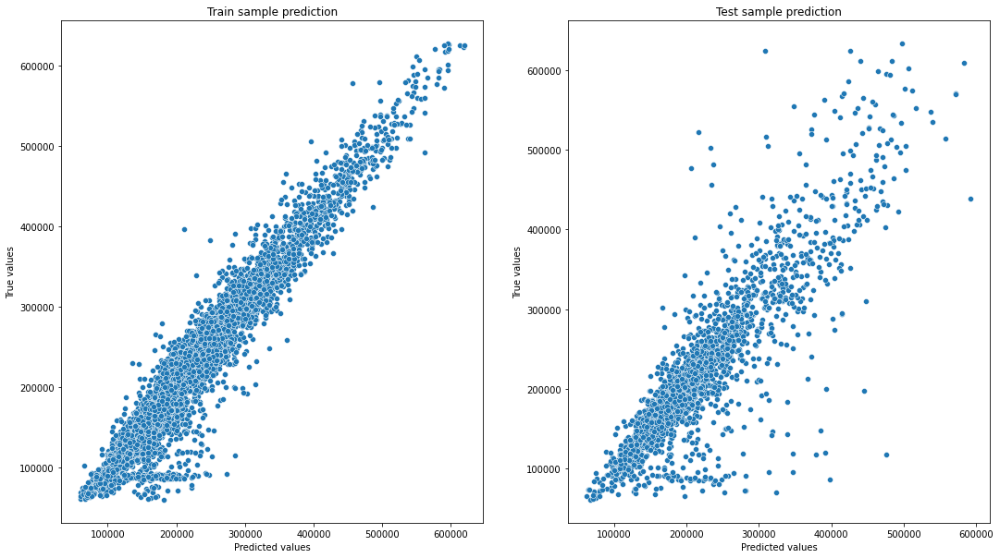

In [146]:
y_train_preds = model.predict(X_train)
y_val_preds = model.predict(X_val)

evaluate_preds(y_train, y_train_preds, y_val, y_val_preds)

In [147]:
X_train = train[feature_col]
y_train = train[target]

model.fit(X_train, y_train)

In [148]:
y_test = model.predict(test)

In [150]:
y_test

array([173085.54531712, 119908.49410181, 146318.8464905 , ...,
       146519.90802346, 182185.05577961, 255308.95187943])

In [152]:
y_test = pd.DataFrame(y_test, columns=['Price'])
y_test = y_test.reset_index().rename(columns={'index': 'Id'})
y_test['Id'] = test.index

In [153]:
y_test

,Id,Price
0,4567,173085.545317
1,5925,119908.494102
2,960,146318.846491
3,3848,110896.221607
4,746,164291.049147
...,...,...
4995,10379,173972.029051
4996,16138,387263.145196
4997,3912,146519.908023
4998,5722,182185.055780


In [154]:
y_test.to_csv('submit.csv', index=False)